In [184]:
#!pip install yfinance
#!pip install pyramid-arima

In [185]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
import yfinance as yf  
from pyramid.arima import auto_arima
import warnings
warnings.filterwarnings('ignore')
import numpy as np

In [210]:
companies = ["T","BBY","KO","FTI","BLK","DVA","BA","IBM","ALB","CBRE"] 
#AT&T,Best Buy, TechnitFMPI, Coca Cola, Blackrock, Davita Inc.,Boeing,IBM,Albemarle Corp, CBRE Group
df = pd.DataFrame(columns = companies)
df["T"] = yf.download("T",'2010-01-01','2019-09-11',interval = '1mo')["Open"]
for i in companies[1:]:
    z = yf.download(i,'2010-01-01','2019-09-11',interval = '1mo')["Open"]
    z = pd.DataFrame(z.values,columns=[i],index=z.index)
    df = pd.merge(df,z,left_on=df.index,right_on=z.index)
    df = df.set_index("key_0")
df = df.drop(list(df.columns[1:10]),axis = 1)
df.columns = companies
df = df.dropna()

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded


In [187]:
df.head()

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
key_0,,,,,,,,,,
2010-01-01,28.41,39.84,28.58,29.08,236.05,29.56,55.72,131.18,36.91,13.81
2010-02-01,25.67,36.82,27.25,26.84,215.25,30.04,60.74,123.23,35.95,12.49
2010-03-01,24.91,36.58,26.61,28.32,217.91,30.92,63.05,127.50,37.56,13.26
2010-04-01,26.05,42.96,27.68,32.66,211.44,31.83,73.24,128.95,43.16,16.02
2010-05-01,26.24,45.93,26.85,34.06,185.61,31.25,72.62,129.39,46.00,17.53


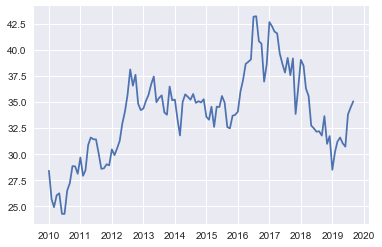

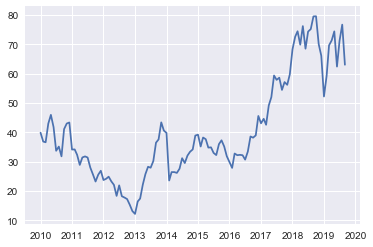

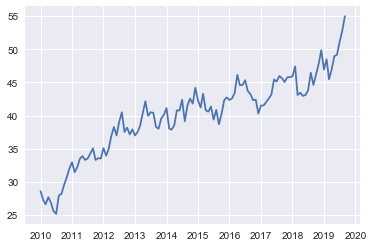

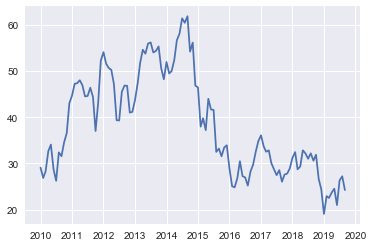

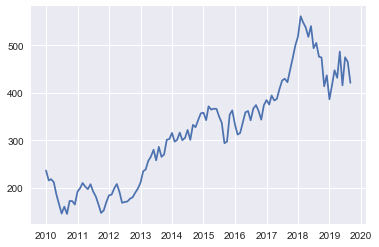

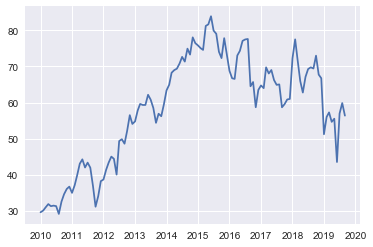

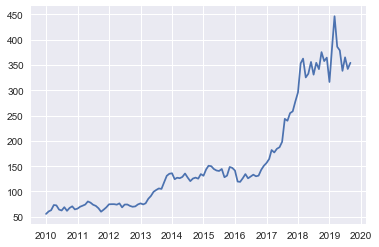

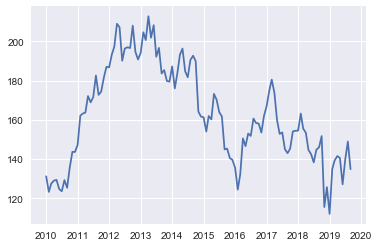

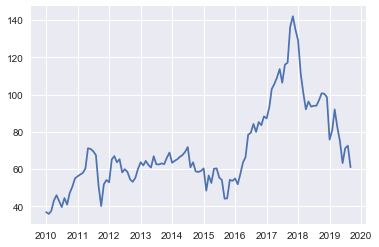

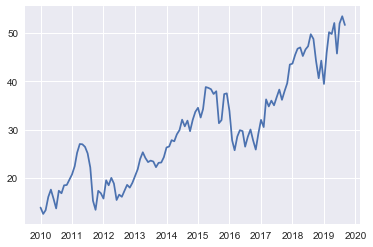

In [4]:
for i in companies:
    plt.plot(df[i])
    plt.show()

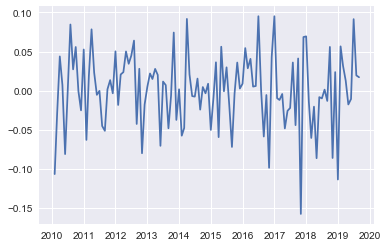

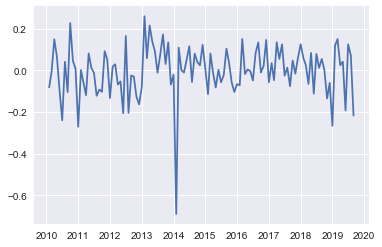

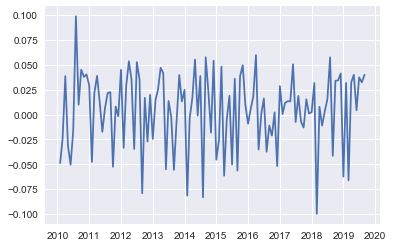

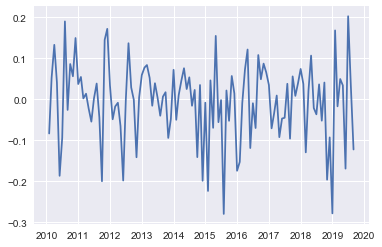

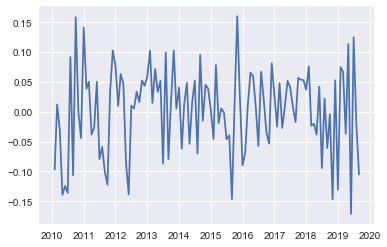

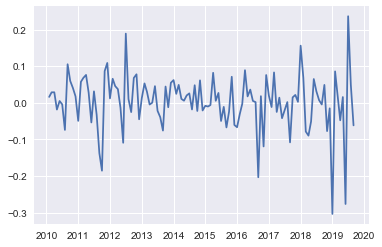

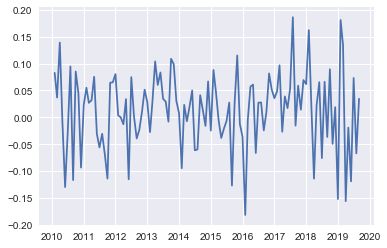

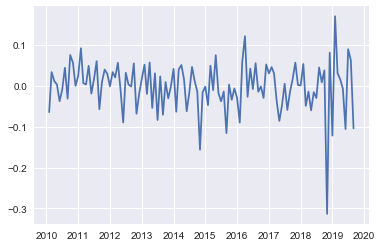

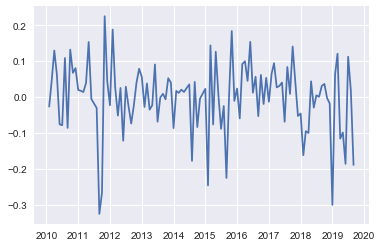

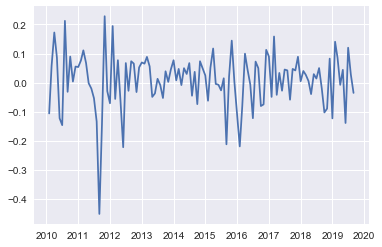

In [7]:
for i in companies:
    plt.plot(df[i].diff(1)/df[i])
    plt.show()

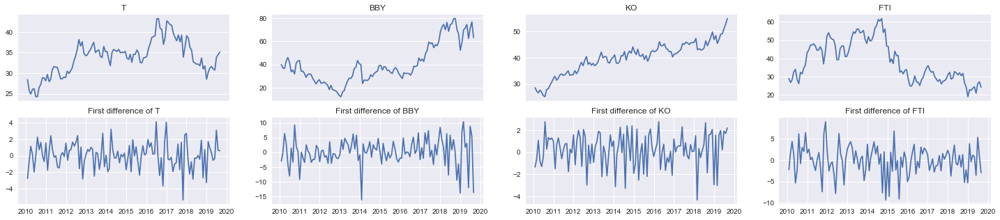

In [13]:
gridsize = (2, 4)
fig = plt.figure(figsize=(25, 5))
ax1 = plt.subplot2grid(gridsize, (0, 0))
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (0, 2))
ax4 = plt.subplot2grid(gridsize, (0, 3))
ax1.plot(df["T"])
ax2.plot(df["BBY"])
ax3.plot(df['KO'])
ax4.plot(df["FTI"])
ax1.set_title("T")
ax2.set_title("BBY")
ax3.set_title("KO")
ax4.set_title("FTI")
ax1.xaxis.set_visible(False)
ax2.xaxis.set_visible(False)
ax3.xaxis.set_visible(False)
ax4.xaxis.set_visible(False)

ax1 = plt.subplot2grid(gridsize, (1, 0))
ax2 = plt.subplot2grid(gridsize, (1, 1))
ax3 = plt.subplot2grid(gridsize, (1, 2))
ax4 = plt.subplot2grid(gridsize, (1, 3))
ax1.plot(df["T"].diff(1))
ax2.plot(df["BBY"].diff(1))
ax3.plot(df['KO'].diff(1))
ax4.plot(df["FTI"].diff(1))
ax1.set_title("First difference of T")
ax2.set_title("First difference of BBY")
ax3.set_title("First difference of KO")
ax4.set_title("First difference of FTI")
#ax1.xaxis.
plt.savefig("descr_6",dpi = 500)


plt.show()

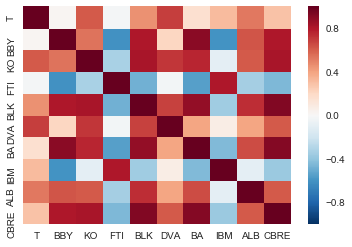

In [5]:
corr = df.corr()

# plot the heatmap
sns.heatmap(corr)
plt.savefig("corrolelogram_3",dpi = 1200)
plt.show()

In [6]:
a = (((df.diff(1)/df)*100).describe().loc["mean",:].mean())
print("Mean percentage change = {} %".format(a.round(5)))

Mean percentage change = 0.21004 %


In [290]:
train = df[:"2018-01-01"].copy()
test = df["2018-01-01":].copy()
print("Train has shape",train.shape)
print("Test has shape",test.shape)

Train has shape (97, 10)
Test has shape (21, 10)


In [51]:
df

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
key_0,,,,,,,,,,
2010-01-01,28.41,39.84,28.58,29.08,236.05,29.56,55.72,131.18,36.91,13.81
2010-02-01,25.67,36.82,27.25,26.84,215.25,30.04,60.74,123.23,35.95,12.49
2010-03-01,24.91,36.58,26.61,28.32,217.91,30.92,63.05,127.50,37.56,13.26
2010-04-01,26.05,42.96,27.68,32.66,211.44,31.83,73.24,128.95,43.16,16.02
2010-05-01,26.24,45.93,26.85,34.06,185.61,31.25,72.62,129.39,46.00,17.53
...,...,...,...,...,...,...,...,...,...,...
2019-05-01,31.05,74.41,48.95,24.53,486.84,55.51,378.53,140.55,75.00,52.10
2019-06-01,30.72,62.39,49.16,20.98,415.71,43.49,338.20,127.10,63.21,45.76
2019-07-01,33.81,71.24,51.07,26.31,474.88,56.94,364.88,139.60,71.20,52.00


## Benchmark model: Univariate modeling with Arima and Persistence 

In [52]:
def stationary(companies,df):
    lib = {}
    for i in companies:
        ts = sm.tsa.adfuller(df[i])
        lib[i] = (ts[0] > ts[4]['5%'])
    return lib

In [53]:
stat = stationary(companies = companies,df = train)
stat

{'ALB': True,
 'BA': True,
 'BBY': True,
 'BLK': True,
 'CBRE': True,
 'DVA': True,
 'FTI': True,
 'IBM': True,
 'KO': True,
 'T': True}

From ADF test we get that all the time series data in our case are not stationary, we will use first difference to make them stationary and thus suitable for ARIMA model

In [54]:
train_diff = train.copy()
for i in companies:
    if (stat[i]):
        train_diff.loc[:,(i)] = train_diff.loc[:,(i)].diff(1)
train_diff = train_diff.dropna()

In [55]:
stat_diff = stationary(companies = companies,df = train_diff)
stat_diff

{'ALB': False,
 'BA': True,
 'BBY': False,
 'BLK': False,
 'CBRE': False,
 'DVA': False,
 'FTI': False,
 'IBM': False,
 'KO': False,
 'T': False}

After differencing the H0 hypothesis that time series are not stationary is rejected

In [56]:
stepwise_model = auto_arima(train["ALB"], start_p=1, start_q=1,
                           max_p=7, max_q=7,
                           start_P=0, seasonal=True,
                           d=1, D=1, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)
print(stepwise_model.aic())

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 0, 0, 1); AIC=609.331, BIC=619.588, Fit time=0.068 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 0, 0, 1); AIC=605.569, BIC=610.697, Fit time=0.009 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(0, 0, 0, 1); AIC=607.526, BIC=615.219, Fit time=0.026 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 0, 0, 1); AIC=607.529, BIC=615.222, Fit time=0.025 seconds
Total fit time: 0.129 seconds
605.5686821475581


In [57]:
test.shape

(21, 10)

In [58]:
def forecast(train, test,window, company,order = (1,1,0)):
    u = train[company].copy()
    v = test[company].copy()
    prediction = pd.DataFrame(index = test.index)
    for i in range(0,len(test)):
        model = sm.tsa.statespace.SARIMAX(u.tail(window), order=order,seasonal_order=(0,0,0,1),
                            enforce_stationarity=False, enforce_invertibility=False).fit(full_output=True, disp=0)
        prediction.loc[v.index[i],company] = model.forecast(1).values[0]
        u[test.index[i]] = test.loc[test.index[i],company]
    
    plt.plot(prediction["2018-01-01":])
    plt.plot(test.loc["2018-01-01":,company])
    plt.legend(["Pred","Act"])
    plt.title("Prediction for "+ company)
    plt.show()
    return prediction
    

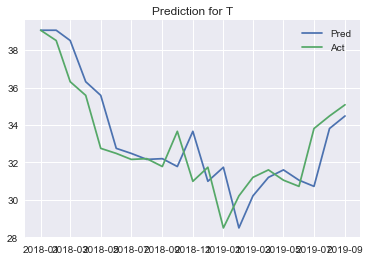

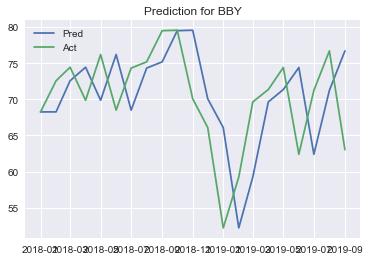

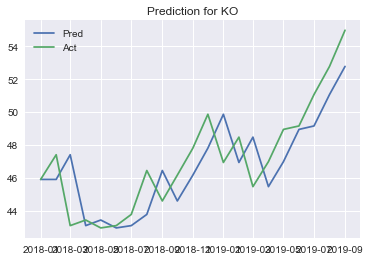

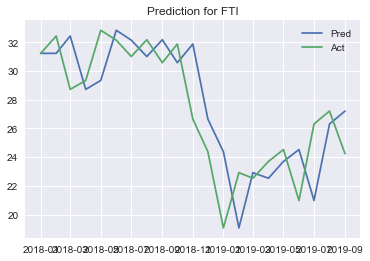

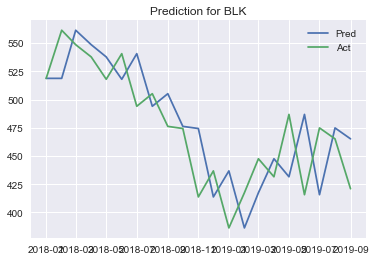

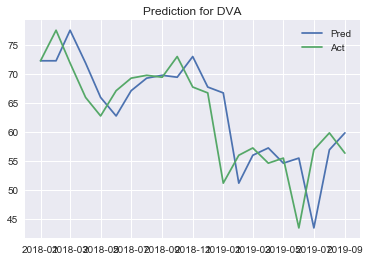

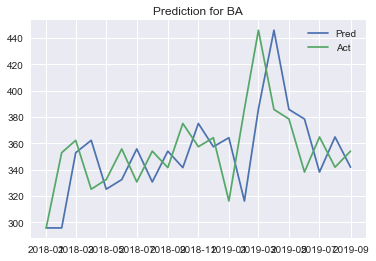

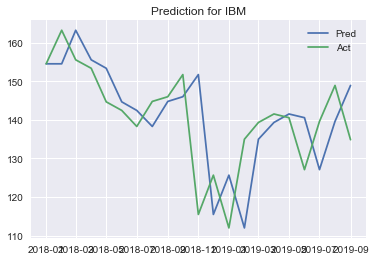

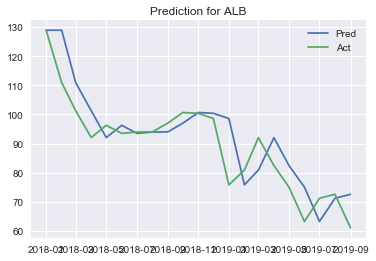

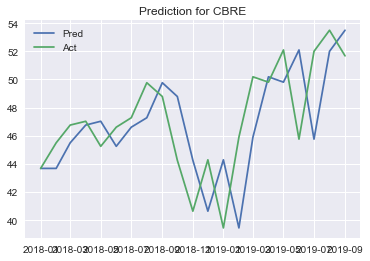

In [59]:
pred = pd.DataFrame(index = test.index,columns=companies)
for c in companies:
    pred.loc[:,c] = forecast(train,test,10,c,(0,1,0))

In [64]:
trivial_pred = test.shift(1).dropna()
test_trivial = test.loc['2018-01-02':,:].copy()
pred = pred.loc['2018-01-02':,:]
pred.shape,trivial_pred.shape,test_trivial.shape

((20, 10), (20, 10), (20, 10))

In [65]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score


def eval(pred,test_trivial,companies,metrics = ["MSE","MAE","R2","MAPE (%)"]):
    df = pd.DataFrame(index=metrics,columns=companies)
    for c in companies:
        df.loc["MSE",c] = mean_squared_error(pred[c],test_trivial[c])
        df.loc["MAE",c] = mean_absolute_error(pred[c],test_trivial[c])
        df.loc["R2",c] = r2_score(pred[c],test_trivial[c]) #https://stats.stackexchange.com/questions/101546/what-is-the-problem-with-using-r-squared-in-time-series-models
        df.loc["MAPE (%)",c] = (np.mean(np.abs((test_trivial - pred)) / (test_trivial + 0.1) )* 100)[c]
    return df

In [66]:
triv_prec = eval(trivial_pred,test_trivial,companies)
triv_prec

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.52968,55.2706,3.96142,8.18541,1434.64,39.4854,1281.95,154.348,85.3755,11.9032
MAE,1.212,6.2755,1.7115,2.3375,32.4085,4.706,30.049,9.3415,7.0895,2.829
R2,0.635846,-0.277663,0.465449,0.533158,0.412372,0.450036,-0.346384,0.0464627,0.615187,0.0619344
MAPE (%),3.74444,9.44408,3.61656,9.19219,7.12187,8.15537,8.31098,7.07152,8.64525,6.09373


In [72]:
triv_prec.loc["MAPE (%)",:].mean()

7.139600228854801

In [67]:
arima_prec = eval(pred,test_trivial,companies)
arima_prec

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.52968,55.2706,3.96142,8.18541,1434.64,39.4854,1281.95,154.348,85.3755,11.9032
MAE,1.212,6.2755,1.7115,2.3375,32.4085,4.706,30.049,9.3415,7.0895,2.829
R2,0.635846,-0.277663,0.465449,0.533158,0.412372,0.450036,-0.346384,0.0464627,0.615187,0.0619344
MAPE (%),3.74444,9.44408,3.61656,9.19219,7.12187,8.15537,8.31098,7.07152,8.64525,6.09373


## Benchmark model: Multivariate modeling with VAR

In [291]:
model = VAR(train_diff)

In [292]:
x = model.select_order(maxlags=4)
x.summary()

,AIC,BIC,FPE,HQIC
0,26.16*,26.43*,2.296e+11*,26.27*
1,27.19,30.20,6.498e+11,28.41
2,28.00,33.76,1.569e+12,30.32
3,28.26,36.75,2.458e+12,31.69
4,28.51,39.75,4.739e+12,33.05


In [293]:
result = model.fit(0)

In [294]:
result.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 13, Sep, 2019
Time:                     14:58:06
--------------------------------------------------------------------
No. of Equations:         10.0000    BIC:                    26.3040
Nobs:                     96.0000    HQIC:                   26.1448
Log likelihood:          -2601.95    FPE:                2.03082e+11
AIC:                      26.0369    Det(Omega_mle):     1.83091e+11
--------------------------------------------------------------------
Results for equation T
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const         0.110938         0.163087            0.680           0.496

Results for equation BBY
           coefficient       std. error           t-stat            prob
----------------------------------------------------------------------

In [296]:
def invert_transformation(df_train, df_forecast):
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        df_fc[str(col)] = df_train[col].iloc[-1] + df_fc[str(col)].cumsum()
    return df_fc

In [297]:
def VAR_Pred_Step(train, test,lags = 1):
    u = train.copy()
    v = test.copy()
    train_diff = u.copy().diff(1).dropna()
    model = VAR(train_diff)
    result = model.fit(0)
    result = model.fit(0)
    fc = result.coefs_exog.reshape(1,10)
    df_forecast = pd.DataFrame(fc, index=test.index[:1], columns=train_diff.columns)
    df_results_1 = invert_transformation(train, df_forecast)
        
    return df_results_1

In [298]:
test_dates = test.index
test_dates

DatetimeIndex(['2018-01-01', '2018-02-01', '2018-03-01', '2018-04-01',
               '2018-05-01', '2018-06-01', '2018-07-01', '2018-08-01',
               '2018-09-01', '2018-10-01', '2018-11-01', '2018-12-01',
               '2019-01-01', '2019-02-01', '2019-03-01', '2019-04-01',
               '2019-05-01', '2019-06-01', '2019-07-01', '2019-08-01',
               '2019-09-01'],
              dtype='datetime64[ns]', name='key_0', freq=None)

In [299]:
predictions = pd.DataFrame(columns=test.columns,index=test.index)

In [300]:
for date in test_dates:
    train = df[:date].copy().iloc[:-1,:]
    test = df[date:].copy()
    s = VAR_Pred_Step(train,test)
    predictions.loc[s.index[0],:] = s.values

In [301]:
predictions

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
key_0,,,,,,,,,,
2018-01-01,36.4336,59.9596,45.9813,28.9183,502.445,61.3309,279.845,154.644,135.891,43.7822
2018-02-01,39.1709,68.556,46.0905,31.2524,521.725,72.7149,298.25,154.743,129.889,43.9911
2018-03-01,38.6141,72.9074,47.6041,32.4746,564.764,78.0245,356.014,163.52,111.683,45.8267
2018-04-01,36.3906,74.8032,43.2482,28.7163,551.789,72.3118,365.459,155.778,101.927,47.0962
2018-05-01,35.6524,70.1733,43.5901,29.3426,540.808,66.3277,327.922,153.564,92.607,47.3656
2018-06-01,32.7934,76.5737,43.1038,32.8776,520.789,63.1021,335.268,144.785,96.8636,45.5644
2018-07-01,32.5203,68.7838,43.2438,32.1804,543.666,67.4919,358.761,142.541,94.0603,46.9348
2018-08-01,32.1968,74.6681,43.929,31.0289,496.59,69.6694,333.386,138.35,94.4991,47.6081
2018-09-01,32.2368,75.5332,46.6235,32.2101,507.803,70.1604,356.987,144.892,94.5543,50.1191


In [302]:
train = df[:"2018-01-01"].copy()
test = df["2018-01-01":].copy()
predictions = predictions["2018-01-01":]

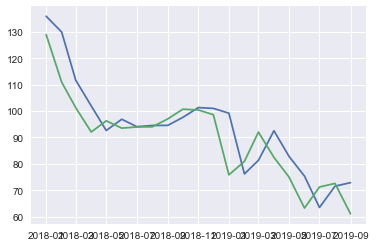

In [303]:
plt.plot(predictions["ALB"])
plt.plot(test["ALB"])
plt.show()

In [305]:
var_eval = eval(predictions,test,companies=companies)
var_eval

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.79901,56.5875,3.67075,8.11581,1417.59,44.2683,1236.43,148.644,88.3926,11.294
MAE,1.29674,6.33823,1.55613,2.3468,32.2882,5.03132,29.2451,8.95667,7.2476,2.65523
R2,0.616312,-0.193249,0.489595,0.525406,0.409903,0.369028,-0.0322684,0.102161,0.710387,0.11783
MAPE (%),3.93611,9.54584,3.29869,9.14117,7.07778,8.5479,8.15713,6.77925,8.67677,5.7399


In [306]:
var_eval.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.80 &  56.59 &  3.67 &  8.12 &  1417.59 &  44.27 &  1236.43 &  148.64 &  88.39 &  11.29 \\\\\nMAE      &  1.30 &   6.34 &  1.56 &  2.35 &    32.29 &   5.03 &    29.25 &    8.96 &   7.25 &   2.66 \\\\\nR2       &  0.62 &  -0.19 &  0.49 &  0.53 &     0.41 &   0.37 &    -0.03 &    0.10 &   0.71 &   0.12 \\\\\nMAPE (\\%) &  3.94 &   9.55 &  3.30 &  9.14 &     7.08 &   8.55 &     8.16 &    6.78 &   8.68 &   5.74 \\\\\n\\bottomrule\n\\end{tabular}\n'

## Modelling with RNN's

## Univariate forecasting

In [73]:
import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.utils import to_categorical
from keras.optimizers import SGD 
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
import itertools
from keras.layers import LSTM
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers import Dropout
from keras.losses import mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler
from keras.layers import GRU


Using Theano backend.


In [74]:
def series_to_supervised(data, n_in=45, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    dff = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(dff.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(dff.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [88]:
def nn_forec(df,company,n_lags = 1,feature_range=(0, 1),n_train_time = 166,first_layer = 64,second_layer=32 ):
    print("Predicting for ", company)
    comp = df[company]
    scaler = MinMaxScaler(feature_range=feature_range)
    comp = scaler.fit_transform(comp)
    comp = pd.DataFrame(comp,columns=[company+"(t)"],index=df.index)
    for i in range(1,n_lags+1):
        comp[company+"(t-"+str(i)+")"] = comp[company+"(t)"].shift(i)
    
    comp = comp.dropna()
    values = comp.values

    n_train_time = n_train_time
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(LSTM(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(LSTM(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='adam')



    # fit network
    history = model.fit(train_X, train_y, epochs=1000, batch_size=300, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler.inverse_transform(test_y)
    test = df["2018-01-01":].copy()
    train = df[:"2018-01-01"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company])
    print(lstm_eval)
    
    plt.plot(predictions[company])
    plt.plot(test[company])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3274 - val_loss: 0.2319
Epoch 2/1000
0s - loss: 0.3225 - val_loss: 0.2279
Epoch 3/1000
0s - loss: 0.3178 - val_loss: 0.2240
Epoch 4/1000
0s - loss: 0.3126 - val_loss: 0.2200
Epoch 5/1000
0s - loss: 0.3083 - val_loss: 0.2162
Epoch 6/1000
0s - loss: 0.3032 - val_loss: 0.2123
Epoch 7/1000
0s - loss: 0.2984 - val_loss: 0.2085
Epoch 8/1000
0s - loss: 0.2942 - val_loss: 0.2047
Epoch 9/1000
0s - loss: 0.2904 - val_loss: 0.2009
Epoch 10/1000
0s - loss: 0.2856 - val_loss: 0.1971
Epoch 11/1000
0s - loss: 0.2806 - val_loss: 0.1934
Epoch 12/1000
0s - loss: 0.2762 - val_loss: 0.1896
Epoch 13/1000
0s - loss: 0.2713 - val_loss: 0.1858
Epoch 14/1000
0s - loss: 0.2671 - val_loss: 0.1820
Epoch 15/1000
0s - loss: 0.2617 - val_loss: 0.1781
Epoch 16/1000
0s - loss: 0.2574 - val_loss: 0.1742
Epoch 17/1000
0s - loss: 0.2532 - val_loss: 0.1703
Epoch 18/1000
0s - loss: 0.2485 - val_loss: 0.1664
Epoch 19/1000
0s - loss: 0.24

0s - loss: 0.0134 - val_loss: 0.0085
Epoch 168/1000
0s - loss: 0.0134 - val_loss: 0.0084
Epoch 169/1000
0s - loss: 0.0124 - val_loss: 0.0084
Epoch 170/1000
0s - loss: 0.0123 - val_loss: 0.0083
Epoch 171/1000
0s - loss: 0.0127 - val_loss: 0.0083
Epoch 172/1000
0s - loss: 0.0145 - val_loss: 0.0082
Epoch 173/1000
0s - loss: 0.0134 - val_loss: 0.0082
Epoch 174/1000
0s - loss: 0.0124 - val_loss: 0.0082
Epoch 175/1000
0s - loss: 0.0129 - val_loss: 0.0081
Epoch 176/1000
0s - loss: 0.0129 - val_loss: 0.0081
Epoch 177/1000
0s - loss: 0.0120 - val_loss: 0.0081
Epoch 178/1000
0s - loss: 0.0121 - val_loss: 0.0081
Epoch 179/1000
0s - loss: 0.0128 - val_loss: 0.0081
Epoch 180/1000
0s - loss: 0.0120 - val_loss: 0.0081
Epoch 181/1000
0s - loss: 0.0120 - val_loss: 0.0081
Epoch 182/1000
0s - loss: 0.0124 - val_loss: 0.0080
Epoch 183/1000
0s - loss: 0.0133 - val_loss: 0.0080
Epoch 184/1000
0s - loss: 0.0128 - val_loss: 0.0080
Epoch 185/1000
0s - loss: 0.0124 - val_loss: 0.0080
Epoch 186/1000
0s - loss: 0

0s - loss: 0.0101 - val_loss: 0.0069
Epoch 338/1000
0s - loss: 0.0095 - val_loss: 0.0069
Epoch 339/1000
0s - loss: 0.0093 - val_loss: 0.0069
Epoch 340/1000
0s - loss: 0.0089 - val_loss: 0.0069
Epoch 341/1000
0s - loss: 0.0112 - val_loss: 0.0069
Epoch 342/1000
0s - loss: 0.0105 - val_loss: 0.0069
Epoch 343/1000
0s - loss: 0.0087 - val_loss: 0.0069
Epoch 344/1000
0s - loss: 0.0092 - val_loss: 0.0069
Epoch 345/1000
0s - loss: 0.0080 - val_loss: 0.0069
Epoch 346/1000
0s - loss: 0.0103 - val_loss: 0.0069
Epoch 347/1000
0s - loss: 0.0092 - val_loss: 0.0069
Epoch 348/1000
0s - loss: 0.0090 - val_loss: 0.0069
Epoch 349/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 350/1000
0s - loss: 0.0091 - val_loss: 0.0069
Epoch 351/1000
0s - loss: 0.0095 - val_loss: 0.0069
Epoch 352/1000
0s - loss: 0.0097 - val_loss: 0.0069
Epoch 353/1000
0s - loss: 0.0106 - val_loss: 0.0069
Epoch 354/1000
0s - loss: 0.0095 - val_loss: 0.0069
Epoch 355/1000
0s - loss: 0.0098 - val_loss: 0.0069
Epoch 356/1000
0s - loss: 0

0s - loss: 0.0086 - val_loss: 0.0070
Epoch 512/1000
0s - loss: 0.0094 - val_loss: 0.0069
Epoch 513/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 514/1000
0s - loss: 0.0083 - val_loss: 0.0069
Epoch 515/1000
0s - loss: 0.0084 - val_loss: 0.0069
Epoch 516/1000
0s - loss: 0.0075 - val_loss: 0.0069
Epoch 517/1000
0s - loss: 0.0082 - val_loss: 0.0069
Epoch 518/1000
0s - loss: 0.0084 - val_loss: 0.0069
Epoch 519/1000
0s - loss: 0.0089 - val_loss: 0.0069
Epoch 520/1000
0s - loss: 0.0096 - val_loss: 0.0069
Epoch 521/1000
0s - loss: 0.0080 - val_loss: 0.0069
Epoch 522/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 523/1000
0s - loss: 0.0096 - val_loss: 0.0069
Epoch 524/1000
0s - loss: 0.0090 - val_loss: 0.0069
Epoch 525/1000
0s - loss: 0.0096 - val_loss: 0.0069
Epoch 526/1000
0s - loss: 0.0079 - val_loss: 0.0069
Epoch 527/1000
0s - loss: 0.0086 - val_loss: 0.0069
Epoch 528/1000
0s - loss: 0.0074 - val_loss: 0.0070
Epoch 529/1000
0s - loss: 0.0095 - val_loss: 0.0069
Epoch 530/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0070
Epoch 675/1000
0s - loss: 0.0079 - val_loss: 0.0070
Epoch 676/1000
0s - loss: 0.0084 - val_loss: 0.0070
Epoch 677/1000
0s - loss: 0.0092 - val_loss: 0.0070
Epoch 678/1000
0s - loss: 0.0086 - val_loss: 0.0070
Epoch 679/1000
0s - loss: 0.0091 - val_loss: 0.0070
Epoch 680/1000
0s - loss: 0.0084 - val_loss: 0.0070
Epoch 681/1000
0s - loss: 0.0087 - val_loss: 0.0070
Epoch 682/1000
0s - loss: 0.0088 - val_loss: 0.0070
Epoch 683/1000
0s - loss: 0.0074 - val_loss: 0.0071
Epoch 684/1000
0s - loss: 0.0088 - val_loss: 0.0070
Epoch 685/1000
0s - loss: 0.0085 - val_loss: 0.0070
Epoch 686/1000
0s - loss: 0.0083 - val_loss: 0.0070
Epoch 687/1000
0s - loss: 0.0081 - val_loss: 0.0070
Epoch 688/1000
0s - loss: 0.0082 - val_loss: 0.0070
Epoch 689/1000
0s - loss: 0.0085 - val_loss: 0.0070
Epoch 690/1000
0s - loss: 0.0087 - val_loss: 0.0070
Epoch 691/1000
0s - loss: 0.0078 - val_loss: 0.0070
Epoch 692/1000
0s - loss: 0.0076 - val_loss: 0.0070
Epoch 693/1000
0s - loss: 0

0s - loss: 0.0084 - val_loss: 0.0072
Epoch 835/1000
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 836/1000
0s - loss: 0.0074 - val_loss: 0.0071
Epoch 837/1000
0s - loss: 0.0083 - val_loss: 0.0071
Epoch 838/1000
0s - loss: 0.0069 - val_loss: 0.0071
Epoch 839/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 840/1000
0s - loss: 0.0083 - val_loss: 0.0071
Epoch 841/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 842/1000
0s - loss: 0.0096 - val_loss: 0.0071
Epoch 843/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 844/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 845/1000
0s - loss: 0.0077 - val_loss: 0.0071
Epoch 846/1000
0s - loss: 0.0081 - val_loss: 0.0072
Epoch 847/1000
0s - loss: 0.0086 - val_loss: 0.0072
Epoch 848/1000
0s - loss: 0.0074 - val_loss: 0.0072
Epoch 849/1000
0s - loss: 0.0084 - val_loss: 0.0072
Epoch 850/1000
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 851/1000
0s - loss: 0.0087 - val_loss: 0.0072
Epoch 852/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 853/1000
0s - loss: 0

0s - loss: 0.0075 - val_loss: 0.0072


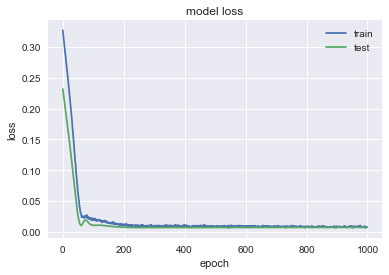

                 T
MSE        2.58525
MAE        1.21754
R2        0.570511
MAPE (%)   3.71182


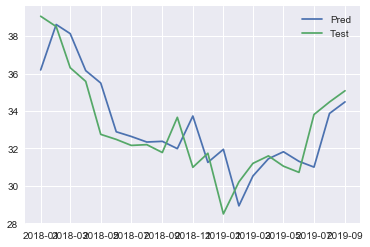

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1268 - val_loss: 0.7419
Epoch 2/1000
0s - loss: 0.1236 - val_loss: 0.7320
Epoch 3/1000
0s - loss: 0.1211 - val_loss: 0.7222
Epoch 4/1000
0s - loss: 0.1182 - val_loss: 0.7124
Epoch 5/1000
0s - loss: 0.1156 - val_loss: 0.7026
Epoch 6/1000
0s - loss: 0.1130 - val_loss: 0.6929
Epoch 7/1000
0s - loss: 0.1104 - val_loss: 0.6831
Epoch 8/1000
0s - loss: 0.1077 - val_loss: 0.6734
Epoch 9/1000
0s - loss: 0.1051 - val_loss: 0.6635
Epoch 10/1000
0s - loss: 0.1026 - val_loss: 0.6536
Epoch 11/1000
0s - loss: 0.0998 - val_loss: 0.6437
Epoch 12/1000
0s - loss: 0.0974 - val_loss: 0.6336
Epoch 13/1000
0s - loss: 0.0944 - val_loss: 0.6234
Epoch 14/1000
0s - loss: 0.0921 - val_loss: 0.6131
Epoch 15/1000
0s - loss: 0.0891 - val_loss: 0.6027
Epoch 16/1000
0s - loss: 0.0864 - val_loss: 0.5920
Epoch 17/1000
0s - loss: 0.0837 - val_loss: 0.5813
Epoch 18/1000
0s - loss: 0.0812 - val_loss: 0.5704
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0050 - val_loss: 0.0177
Epoch 171/1000
0s - loss: 0.0048 - val_loss: 0.0173
Epoch 172/1000
0s - loss: 0.0048 - val_loss: 0.0169
Epoch 173/1000
0s - loss: 0.0050 - val_loss: 0.0166
Epoch 174/1000
0s - loss: 0.0042 - val_loss: 0.0163
Epoch 175/1000
0s - loss: 0.0048 - val_loss: 0.0160
Epoch 176/1000
0s - loss: 0.0046 - val_loss: 0.0158
Epoch 177/1000
0s - loss: 0.0044 - val_loss: 0.0156
Epoch 178/1000
0s - loss: 0.0044 - val_loss: 0.0154
Epoch 179/1000
0s - loss: 0.0044 - val_loss: 0.0153
Epoch 180/1000
0s - loss: 0.0044 - val_loss: 0.0151
Epoch 181/1000
0s - loss: 0.0045 - val_loss: 0.0150
Epoch 182/1000
0s - loss: 0.0038 - val_loss: 0.0148
Epoch 183/1000
0s - loss: 0.0041 - val_loss: 0.0147
Epoch 184/1000
0s - loss: 0.0042 - val_loss: 0.0146
Epoch 185/1000
0s - loss: 0.0042 - val_loss: 0.0145
Epoch 186/1000
0s - loss: 0.0045 - val_loss: 0.0144
Epoch 187/1000
0s - loss: 0.0043 - val_loss: 0.0143
Epoch 188/1000
0s - loss: 0.0045 - val_loss: 0.0143
Epoch 189/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0202
Epoch 352/1000
0s - loss: 0.0034 - val_loss: 0.0201
Epoch 353/1000
0s - loss: 0.0035 - val_loss: 0.0200
Epoch 354/1000
0s - loss: 0.0036 - val_loss: 0.0199
Epoch 355/1000
0s - loss: 0.0042 - val_loss: 0.0197
Epoch 356/1000
0s - loss: 0.0036 - val_loss: 0.0195
Epoch 357/1000
0s - loss: 0.0037 - val_loss: 0.0195
Epoch 358/1000
0s - loss: 0.0038 - val_loss: 0.0196
Epoch 359/1000
0s - loss: 0.0035 - val_loss: 0.0197
Epoch 360/1000
0s - loss: 0.0032 - val_loss: 0.0199
Epoch 361/1000
0s - loss: 0.0037 - val_loss: 0.0200
Epoch 362/1000
0s - loss: 0.0038 - val_loss: 0.0202
Epoch 363/1000
0s - loss: 0.0035 - val_loss: 0.0204
Epoch 364/1000
0s - loss: 0.0038 - val_loss: 0.0204
Epoch 365/1000
0s - loss: 0.0033 - val_loss: 0.0206
Epoch 366/1000
0s - loss: 0.0038 - val_loss: 0.0207
Epoch 367/1000
0s - loss: 0.0038 - val_loss: 0.0207
Epoch 368/1000
0s - loss: 0.0034 - val_loss: 0.0207
Epoch 369/1000
0s - loss: 0.0039 - val_loss: 0.0206
Epoch 370/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0179
Epoch 530/1000
0s - loss: 0.0032 - val_loss: 0.0179
Epoch 531/1000
0s - loss: 0.0034 - val_loss: 0.0179
Epoch 532/1000
0s - loss: 0.0033 - val_loss: 0.0180
Epoch 533/1000
0s - loss: 0.0043 - val_loss: 0.0180
Epoch 534/1000
0s - loss: 0.0038 - val_loss: 0.0179
Epoch 535/1000
0s - loss: 0.0038 - val_loss: 0.0179
Epoch 536/1000
0s - loss: 0.0034 - val_loss: 0.0177
Epoch 537/1000
0s - loss: 0.0035 - val_loss: 0.0175
Epoch 538/1000
0s - loss: 0.0036 - val_loss: 0.0173
Epoch 539/1000
0s - loss: 0.0035 - val_loss: 0.0170
Epoch 540/1000
0s - loss: 0.0036 - val_loss: 0.0169
Epoch 541/1000
0s - loss: 0.0038 - val_loss: 0.0169
Epoch 542/1000
0s - loss: 0.0036 - val_loss: 0.0169
Epoch 543/1000
0s - loss: 0.0045 - val_loss: 0.0169
Epoch 544/1000
0s - loss: 0.0034 - val_loss: 0.0169
Epoch 545/1000
0s - loss: 0.0037 - val_loss: 0.0169
Epoch 546/1000
0s - loss: 0.0037 - val_loss: 0.0169
Epoch 547/1000
0s - loss: 0.0037 - val_loss: 0.0168
Epoch 548/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0153
Epoch 702/1000
0s - loss: 0.0035 - val_loss: 0.0152
Epoch 703/1000
0s - loss: 0.0038 - val_loss: 0.0152
Epoch 704/1000
0s - loss: 0.0027 - val_loss: 0.0152
Epoch 705/1000
0s - loss: 0.0033 - val_loss: 0.0153
Epoch 706/1000
0s - loss: 0.0032 - val_loss: 0.0153
Epoch 707/1000
0s - loss: 0.0031 - val_loss: 0.0153
Epoch 708/1000
0s - loss: 0.0036 - val_loss: 0.0153
Epoch 709/1000
0s - loss: 0.0040 - val_loss: 0.0153
Epoch 710/1000
0s - loss: 0.0034 - val_loss: 0.0153
Epoch 711/1000
0s - loss: 0.0037 - val_loss: 0.0153
Epoch 712/1000
0s - loss: 0.0030 - val_loss: 0.0153
Epoch 713/1000
0s - loss: 0.0038 - val_loss: 0.0152
Epoch 714/1000
0s - loss: 0.0034 - val_loss: 0.0151
Epoch 715/1000
0s - loss: 0.0034 - val_loss: 0.0150
Epoch 716/1000
0s - loss: 0.0033 - val_loss: 0.0149
Epoch 717/1000
0s - loss: 0.0036 - val_loss: 0.0147
Epoch 718/1000
0s - loss: 0.0039 - val_loss: 0.0147
Epoch 719/1000
0s - loss: 0.0030 - val_loss: 0.0147
Epoch 720/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0140
Epoch 865/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 866/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 867/1000
0s - loss: 0.0035 - val_loss: 0.0141
Epoch 868/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 869/1000
0s - loss: 0.0034 - val_loss: 0.0140
Epoch 870/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 871/1000
0s - loss: 0.0033 - val_loss: 0.0139
Epoch 872/1000
0s - loss: 0.0036 - val_loss: 0.0138
Epoch 873/1000
0s - loss: 0.0031 - val_loss: 0.0137
Epoch 874/1000
0s - loss: 0.0033 - val_loss: 0.0137
Epoch 875/1000
0s - loss: 0.0034 - val_loss: 0.0137
Epoch 876/1000
0s - loss: 0.0038 - val_loss: 0.0137
Epoch 877/1000
0s - loss: 0.0034 - val_loss: 0.0138
Epoch 878/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 879/1000
0s - loss: 0.0034 - val_loss: 0.0140
Epoch 880/1000
0s - loss: 0.0035 - val_loss: 0.0142
Epoch 881/1000
0s - loss: 0.0029 - val_loss: 0.0143
Epoch 882/1000
0s - loss: 0.0033 - val_loss: 0.0145
Epoch 883/1000
0s - loss: 0

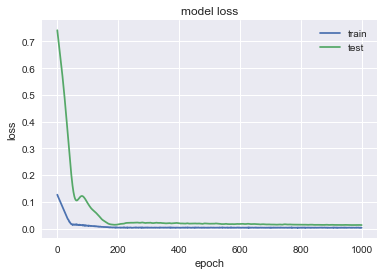

               BBY
MSE        60.2147
MAE        6.48609
R2       -0.144911
MAPE (%)    9.7791


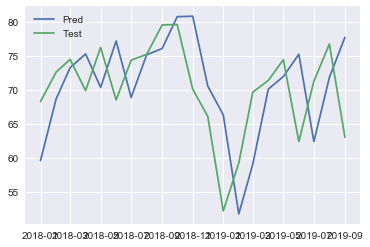

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2309 - val_loss: 0.5434
Epoch 2/1000
0s - loss: 0.2266 - val_loss: 0.5358
Epoch 3/1000
0s - loss: 0.2228 - val_loss: 0.5281
Epoch 4/1000
0s - loss: 0.2186 - val_loss: 0.5206
Epoch 5/1000
0s - loss: 0.2144 - val_loss: 0.5130
Epoch 6/1000
0s - loss: 0.2107 - val_loss: 0.5054
Epoch 7/1000
0s - loss: 0.2065 - val_loss: 0.4978
Epoch 8/1000
0s - loss: 0.2027 - val_loss: 0.4902
Epoch 9/1000
0s - loss: 0.1986 - val_loss: 0.4825
Epoch 10/1000
0s - loss: 0.1944 - val_loss: 0.4748
Epoch 11/1000
0s - loss: 0.1909 - val_loss: 0.4670
Epoch 12/1000
0s - loss: 0.1872 - val_loss: 0.4591
Epoch 13/1000
0s - loss: 0.1821 - val_loss: 0.4512
Epoch 14/1000
0s - loss: 0.1786 - val_loss: 0.4432
Epoch 15/1000
0s - loss: 0.1739 - val_loss: 0.4350
Epoch 16/1000
0s - loss: 0.1703 - val_loss: 0.4268
Epoch 17/1000
0s - loss: 0.1660 - val_loss: 0.4184
Epoch 18/1000
0s - loss: 0.1611 - val_loss: 0.4100
Epoch 19/1000
0s - loss: 0.1

0s - loss: 0.0071 - val_loss: 0.0136
Epoch 182/1000
0s - loss: 0.0068 - val_loss: 0.0136
Epoch 183/1000
0s - loss: 0.0068 - val_loss: 0.0136
Epoch 184/1000
0s - loss: 0.0065 - val_loss: 0.0135
Epoch 185/1000
0s - loss: 0.0075 - val_loss: 0.0133
Epoch 186/1000
0s - loss: 0.0077 - val_loss: 0.0131
Epoch 187/1000
0s - loss: 0.0066 - val_loss: 0.0129
Epoch 188/1000
0s - loss: 0.0074 - val_loss: 0.0126
Epoch 189/1000
0s - loss: 0.0068 - val_loss: 0.0124
Epoch 190/1000
0s - loss: 0.0064 - val_loss: 0.0122
Epoch 191/1000
0s - loss: 0.0068 - val_loss: 0.0120
Epoch 192/1000
0s - loss: 0.0070 - val_loss: 0.0118
Epoch 193/1000
0s - loss: 0.0056 - val_loss: 0.0116
Epoch 194/1000
0s - loss: 0.0070 - val_loss: 0.0113
Epoch 195/1000
0s - loss: 0.0059 - val_loss: 0.0111
Epoch 196/1000
0s - loss: 0.0062 - val_loss: 0.0109
Epoch 197/1000
0s - loss: 0.0062 - val_loss: 0.0107
Epoch 198/1000
0s - loss: 0.0060 - val_loss: 0.0105
Epoch 199/1000
0s - loss: 0.0064 - val_loss: 0.0103
Epoch 200/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0043
Epoch 350/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 351/1000
0s - loss: 0.0036 - val_loss: 0.0043
Epoch 352/1000
0s - loss: 0.0036 - val_loss: 0.0043
Epoch 353/1000
0s - loss: 0.0038 - val_loss: 0.0043
Epoch 354/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 355/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 356/1000
0s - loss: 0.0042 - val_loss: 0.0043
Epoch 357/1000
0s - loss: 0.0034 - val_loss: 0.0043
Epoch 358/1000
0s - loss: 0.0038 - val_loss: 0.0043
Epoch 359/1000
0s - loss: 0.0033 - val_loss: 0.0043
Epoch 360/1000
0s - loss: 0.0037 - val_loss: 0.0043
Epoch 361/1000
0s - loss: 0.0033 - val_loss: 0.0044
Epoch 362/1000
0s - loss: 0.0031 - val_loss: 0.0044
Epoch 363/1000
0s - loss: 0.0038 - val_loss: 0.0044
Epoch 364/1000
0s - loss: 0.0039 - val_loss: 0.0044
Epoch 365/1000
0s - loss: 0.0039 - val_loss: 0.0044
Epoch 366/1000
0s - loss: 0.0035 - val_loss: 0.0044
Epoch 367/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 368/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0042
Epoch 520/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 521/1000
0s - loss: 0.0024 - val_loss: 0.0042
Epoch 522/1000
0s - loss: 0.0042 - val_loss: 0.0042
Epoch 523/1000
0s - loss: 0.0040 - val_loss: 0.0042
Epoch 524/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 525/1000
0s - loss: 0.0034 - val_loss: 0.0042
Epoch 526/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 527/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 528/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 529/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 530/1000
0s - loss: 0.0029 - val_loss: 0.0042
Epoch 531/1000
0s - loss: 0.0036 - val_loss: 0.0042
Epoch 532/1000
0s - loss: 0.0036 - val_loss: 0.0042
Epoch 533/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 534/1000
0s - loss: 0.0031 - val_loss: 0.0042
Epoch 535/1000
0s - loss: 0.0040 - val_loss: 0.0042
Epoch 536/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 537/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 538/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0042
Epoch 692/1000
0s - loss: 0.0033 - val_loss: 0.0041
Epoch 693/1000
0s - loss: 0.0037 - val_loss: 0.0041
Epoch 694/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 695/1000
0s - loss: 0.0030 - val_loss: 0.0041
Epoch 696/1000
0s - loss: 0.0032 - val_loss: 0.0041
Epoch 697/1000
0s - loss: 0.0041 - val_loss: 0.0041
Epoch 698/1000
0s - loss: 0.0033 - val_loss: 0.0041
Epoch 699/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 700/1000
0s - loss: 0.0033 - val_loss: 0.0041
Epoch 701/1000
0s - loss: 0.0035 - val_loss: 0.0042
Epoch 702/1000
0s - loss: 0.0035 - val_loss: 0.0042
Epoch 703/1000
0s - loss: 0.0038 - val_loss: 0.0042
Epoch 704/1000
0s - loss: 0.0031 - val_loss: 0.0042
Epoch 705/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 706/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 707/1000
0s - loss: 0.0033 - val_loss: 0.0043
Epoch 708/1000
0s - loss: 0.0034 - val_loss: 0.0043
Epoch 709/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 710/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0042
Epoch 863/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 864/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 865/1000
0s - loss: 0.0034 - val_loss: 0.0042
Epoch 866/1000
0s - loss: 0.0029 - val_loss: 0.0042
Epoch 867/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 868/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 869/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 870/1000
0s - loss: 0.0034 - val_loss: 0.0042
Epoch 871/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 872/1000
0s - loss: 0.0036 - val_loss: 0.0042
Epoch 873/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 874/1000
0s - loss: 0.0024 - val_loss: 0.0043
Epoch 875/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 876/1000
0s - loss: 0.0035 - val_loss: 0.0043
Epoch 877/1000
0s - loss: 0.0033 - val_loss: 0.0043
Epoch 878/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 879/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 880/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 881/1000
0s - loss: 0

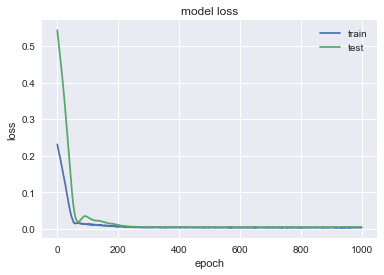

                KO
MSE         4.2147
MAE        1.81638
R2        0.353124
MAPE (%)   3.81116


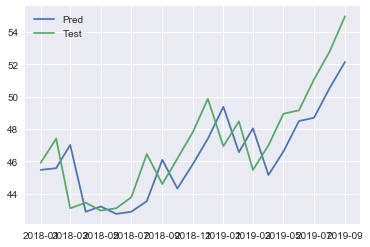

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3163 - val_loss: 0.0450
Epoch 2/1000
0s - loss: 0.3118 - val_loss: 0.0436
Epoch 3/1000
0s - loss: 0.3069 - val_loss: 0.0423
Epoch 4/1000
0s - loss: 0.3023 - val_loss: 0.0409
Epoch 5/1000
0s - loss: 0.2981 - val_loss: 0.0396
Epoch 6/1000
0s - loss: 0.2936 - val_loss: 0.0383
Epoch 7/1000
0s - loss: 0.2882 - val_loss: 0.0370
Epoch 8/1000
0s - loss: 0.2834 - val_loss: 0.0357
Epoch 9/1000
0s - loss: 0.2787 - val_loss: 0.0344
Epoch 10/1000
0s - loss: 0.2736 - val_loss: 0.0331
Epoch 11/1000
0s - loss: 0.2695 - val_loss: 0.0319
Epoch 12/1000
0s - loss: 0.2643 - val_loss: 0.0306
Epoch 13/1000
0s - loss: 0.2590 - val_loss: 0.0294
Epoch 14/1000
0s - loss: 0.2543 - val_loss: 0.0281
Epoch 15/1000
0s - loss: 0.2487 - val_loss: 0.0269
Epoch 16/1000
0s - loss: 0.2440 - val_loss: 0.0257
Epoch 17/1000
0s - loss: 0.2401 - val_loss: 0.0244
Epoch 18/1000
0s - loss: 0.2331 - val_loss: 0.0232
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0128 - val_loss: 0.0197
Epoch 176/1000
0s - loss: 0.0134 - val_loss: 0.0195
Epoch 177/1000
0s - loss: 0.0117 - val_loss: 0.0193
Epoch 178/1000
0s - loss: 0.0100 - val_loss: 0.0191
Epoch 179/1000
0s - loss: 0.0121 - val_loss: 0.0188
Epoch 180/1000
0s - loss: 0.0104 - val_loss: 0.0186
Epoch 181/1000
0s - loss: 0.0106 - val_loss: 0.0183
Epoch 182/1000
0s - loss: 0.0111 - val_loss: 0.0180
Epoch 183/1000
0s - loss: 0.0099 - val_loss: 0.0177
Epoch 184/1000
0s - loss: 0.0110 - val_loss: 0.0174
Epoch 185/1000
0s - loss: 0.0105 - val_loss: 0.0172
Epoch 186/1000
0s - loss: 0.0123 - val_loss: 0.0169
Epoch 187/1000
0s - loss: 0.0106 - val_loss: 0.0166
Epoch 188/1000
0s - loss: 0.0115 - val_loss: 0.0164
Epoch 189/1000
0s - loss: 0.0114 - val_loss: 0.0161
Epoch 190/1000
0s - loss: 0.0108 - val_loss: 0.0159
Epoch 191/1000
0s - loss: 0.0088 - val_loss: 0.0156
Epoch 192/1000
0s - loss: 0.0105 - val_loss: 0.0154
Epoch 193/1000
0s - loss: 0.0108 - val_loss: 0.0152
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0102 - val_loss: 0.0058
Epoch 350/1000
0s - loss: 0.0097 - val_loss: 0.0058
Epoch 351/1000
0s - loss: 0.0079 - val_loss: 0.0058
Epoch 352/1000
0s - loss: 0.0105 - val_loss: 0.0058
Epoch 353/1000
0s - loss: 0.0093 - val_loss: 0.0058
Epoch 354/1000
0s - loss: 0.0090 - val_loss: 0.0058
Epoch 355/1000
0s - loss: 0.0083 - val_loss: 0.0058
Epoch 356/1000
0s - loss: 0.0075 - val_loss: 0.0058
Epoch 357/1000
0s - loss: 0.0089 - val_loss: 0.0058
Epoch 358/1000
0s - loss: 0.0093 - val_loss: 0.0059
Epoch 359/1000
0s - loss: 0.0074 - val_loss: 0.0059
Epoch 360/1000
0s - loss: 0.0097 - val_loss: 0.0059
Epoch 361/1000
0s - loss: 0.0089 - val_loss: 0.0060
Epoch 362/1000
0s - loss: 0.0084 - val_loss: 0.0060
Epoch 363/1000
0s - loss: 0.0070 - val_loss: 0.0060
Epoch 364/1000
0s - loss: 0.0081 - val_loss: 0.0060
Epoch 365/1000
0s - loss: 0.0102 - val_loss: 0.0060
Epoch 366/1000
0s - loss: 0.0084 - val_loss: 0.0060
Epoch 367/1000
0s - loss: 0.0067 - val_loss: 0.0059
Epoch 368/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0054
Epoch 524/1000
0s - loss: 0.0078 - val_loss: 0.0054
Epoch 525/1000
0s - loss: 0.0071 - val_loss: 0.0054
Epoch 526/1000
0s - loss: 0.0083 - val_loss: 0.0054
Epoch 527/1000
0s - loss: 0.0081 - val_loss: 0.0054
Epoch 528/1000
0s - loss: 0.0076 - val_loss: 0.0054
Epoch 529/1000
0s - loss: 0.0079 - val_loss: 0.0055
Epoch 530/1000
0s - loss: 0.0085 - val_loss: 0.0055
Epoch 531/1000
0s - loss: 0.0088 - val_loss: 0.0055
Epoch 532/1000
0s - loss: 0.0070 - val_loss: 0.0056
Epoch 533/1000
0s - loss: 0.0078 - val_loss: 0.0056
Epoch 534/1000
0s - loss: 0.0067 - val_loss: 0.0056
Epoch 535/1000
0s - loss: 0.0080 - val_loss: 0.0057
Epoch 536/1000
0s - loss: 0.0077 - val_loss: 0.0057
Epoch 537/1000
0s - loss: 0.0085 - val_loss: 0.0057
Epoch 538/1000
0s - loss: 0.0077 - val_loss: 0.0057
Epoch 539/1000
0s - loss: 0.0078 - val_loss: 0.0057
Epoch 540/1000
0s - loss: 0.0082 - val_loss: 0.0057
Epoch 541/1000
0s - loss: 0.0077 - val_loss: 0.0057
Epoch 542/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0053
Epoch 697/1000
0s - loss: 0.0095 - val_loss: 0.0053
Epoch 698/1000
0s - loss: 0.0083 - val_loss: 0.0053
Epoch 699/1000
0s - loss: 0.0088 - val_loss: 0.0053
Epoch 700/1000
0s - loss: 0.0082 - val_loss: 0.0053
Epoch 701/1000
0s - loss: 0.0078 - val_loss: 0.0053
Epoch 702/1000
0s - loss: 0.0089 - val_loss: 0.0053
Epoch 703/1000
0s - loss: 0.0081 - val_loss: 0.0053
Epoch 704/1000
0s - loss: 0.0082 - val_loss: 0.0052
Epoch 705/1000
0s - loss: 0.0087 - val_loss: 0.0052
Epoch 706/1000
0s - loss: 0.0080 - val_loss: 0.0052
Epoch 707/1000
0s - loss: 0.0076 - val_loss: 0.0052
Epoch 708/1000
0s - loss: 0.0088 - val_loss: 0.0052
Epoch 709/1000
0s - loss: 0.0091 - val_loss: 0.0052
Epoch 710/1000
0s - loss: 0.0074 - val_loss: 0.0052
Epoch 711/1000
0s - loss: 0.0080 - val_loss: 0.0052
Epoch 712/1000
0s - loss: 0.0078 - val_loss: 0.0052
Epoch 713/1000
0s - loss: 0.0079 - val_loss: 0.0052
Epoch 714/1000
0s - loss: 0.0097 - val_loss: 0.0052
Epoch 715/1000
0s - loss: 0

0s - loss: 0.0082 - val_loss: 0.0049
Epoch 872/1000
0s - loss: 0.0078 - val_loss: 0.0049
Epoch 873/1000
0s - loss: 0.0092 - val_loss: 0.0049
Epoch 874/1000
0s - loss: 0.0093 - val_loss: 0.0049
Epoch 875/1000
0s - loss: 0.0085 - val_loss: 0.0050
Epoch 876/1000
0s - loss: 0.0082 - val_loss: 0.0051
Epoch 877/1000
0s - loss: 0.0088 - val_loss: 0.0051
Epoch 878/1000
0s - loss: 0.0080 - val_loss: 0.0052
Epoch 879/1000
0s - loss: 0.0085 - val_loss: 0.0052
Epoch 880/1000
0s - loss: 0.0069 - val_loss: 0.0053
Epoch 881/1000
0s - loss: 0.0085 - val_loss: 0.0053
Epoch 882/1000
0s - loss: 0.0074 - val_loss: 0.0053
Epoch 883/1000
0s - loss: 0.0076 - val_loss: 0.0053
Epoch 884/1000
0s - loss: 0.0065 - val_loss: 0.0052
Epoch 885/1000
0s - loss: 0.0082 - val_loss: 0.0052
Epoch 886/1000
0s - loss: 0.0077 - val_loss: 0.0052
Epoch 887/1000
0s - loss: 0.0085 - val_loss: 0.0051
Epoch 888/1000
0s - loss: 0.0080 - val_loss: 0.0051
Epoch 889/1000
0s - loss: 0.0074 - val_loss: 0.0050
Epoch 890/1000
0s - loss: 0

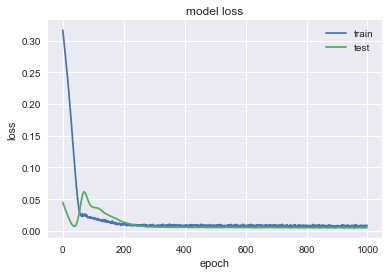

               FTI
MSE        9.16061
MAE         2.3552
R2        0.204051
MAPE (%)   9.47024


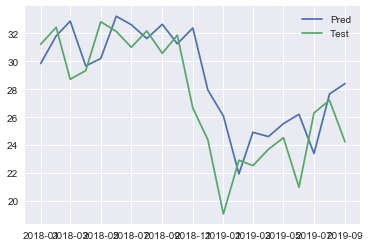

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1543 - val_loss: 0.6376
Epoch 2/1000
0s - loss: 0.1513 - val_loss: 0.6288
Epoch 3/1000
0s - loss: 0.1486 - val_loss: 0.6201
Epoch 4/1000
0s - loss: 0.1455 - val_loss: 0.6114
Epoch 5/1000
0s - loss: 0.1430 - val_loss: 0.6028
Epoch 6/1000
0s - loss: 0.1396 - val_loss: 0.5941
Epoch 7/1000
0s - loss: 0.1373 - val_loss: 0.5855
Epoch 8/1000
0s - loss: 0.1343 - val_loss: 0.5769
Epoch 9/1000
0s - loss: 0.1314 - val_loss: 0.5682
Epoch 10/1000
0s - loss: 0.1285 - val_loss: 0.5595
Epoch 11/1000
0s - loss: 0.1256 - val_loss: 0.5507
Epoch 12/1000
0s - loss: 0.1233 - val_loss: 0.5418
Epoch 13/1000
0s - loss: 0.1201 - val_loss: 0.5329
Epoch 14/1000
0s - loss: 0.1176 - val_loss: 0.5239
Epoch 15/1000
0s - loss: 0.1151 - val_loss: 0.5148
Epoch 16/1000
0s - loss: 0.1115 - val_loss: 0.5055
Epoch 17/1000
0s - loss: 0.1093 - val_loss: 0.4962
Epoch 18/1000
0s - loss: 0.1058 - val_loss: 0.4868
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0029 - val_loss: 0.0128
Epoch 177/1000
0s - loss: 0.0030 - val_loss: 0.0130
Epoch 178/1000
0s - loss: 0.0026 - val_loss: 0.0132
Epoch 179/1000
0s - loss: 0.0025 - val_loss: 0.0136
Epoch 180/1000
0s - loss: 0.0030 - val_loss: 0.0140
Epoch 181/1000
0s - loss: 0.0038 - val_loss: 0.0144
Epoch 182/1000
0s - loss: 0.0032 - val_loss: 0.0149
Epoch 183/1000
0s - loss: 0.0024 - val_loss: 0.0154
Epoch 184/1000
0s - loss: 0.0027 - val_loss: 0.0160
Epoch 185/1000
0s - loss: 0.0025 - val_loss: 0.0165
Epoch 186/1000
0s - loss: 0.0031 - val_loss: 0.0170
Epoch 187/1000
0s - loss: 0.0027 - val_loss: 0.0177
Epoch 188/1000
0s - loss: 0.0026 - val_loss: 0.0183
Epoch 189/1000
0s - loss: 0.0031 - val_loss: 0.0188
Epoch 190/1000
0s - loss: 0.0029 - val_loss: 0.0192
Epoch 191/1000
0s - loss: 0.0033 - val_loss: 0.0195
Epoch 192/1000
0s - loss: 0.0022 - val_loss: 0.0197
Epoch 193/1000
0s - loss: 0.0029 - val_loss: 0.0197
Epoch 194/1000
0s - loss: 0.0030 - val_loss: 0.0197
Epoch 195/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0172
Epoch 351/1000
0s - loss: 0.0021 - val_loss: 0.0172
Epoch 352/1000
0s - loss: 0.0024 - val_loss: 0.0171
Epoch 353/1000
0s - loss: 0.0023 - val_loss: 0.0170
Epoch 354/1000
0s - loss: 0.0031 - val_loss: 0.0171
Epoch 355/1000
0s - loss: 0.0021 - val_loss: 0.0173
Epoch 356/1000
0s - loss: 0.0026 - val_loss: 0.0173
Epoch 357/1000
0s - loss: 0.0030 - val_loss: 0.0172
Epoch 358/1000
0s - loss: 0.0034 - val_loss: 0.0171
Epoch 359/1000
0s - loss: 0.0023 - val_loss: 0.0169
Epoch 360/1000
0s - loss: 0.0026 - val_loss: 0.0166
Epoch 361/1000
0s - loss: 0.0021 - val_loss: 0.0165
Epoch 362/1000
0s - loss: 0.0025 - val_loss: 0.0163
Epoch 363/1000
0s - loss: 0.0022 - val_loss: 0.0164
Epoch 364/1000
0s - loss: 0.0026 - val_loss: 0.0164
Epoch 365/1000
0s - loss: 0.0024 - val_loss: 0.0165
Epoch 366/1000
0s - loss: 0.0026 - val_loss: 0.0165
Epoch 367/1000
0s - loss: 0.0029 - val_loss: 0.0165
Epoch 368/1000
0s - loss: 0.0025 - val_loss: 0.0168
Epoch 369/1000
0s - loss: 0

0s - loss: 0.0024 - val_loss: 0.0147
Epoch 526/1000
0s - loss: 0.0024 - val_loss: 0.0148
Epoch 527/1000
0s - loss: 0.0026 - val_loss: 0.0150
Epoch 528/1000
0s - loss: 0.0024 - val_loss: 0.0152
Epoch 529/1000
0s - loss: 0.0031 - val_loss: 0.0153
Epoch 530/1000
0s - loss: 0.0021 - val_loss: 0.0154
Epoch 531/1000
0s - loss: 0.0022 - val_loss: 0.0153
Epoch 532/1000
0s - loss: 0.0024 - val_loss: 0.0152
Epoch 533/1000
0s - loss: 0.0028 - val_loss: 0.0151
Epoch 534/1000
0s - loss: 0.0023 - val_loss: 0.0149
Epoch 535/1000
0s - loss: 0.0025 - val_loss: 0.0149
Epoch 536/1000
0s - loss: 0.0033 - val_loss: 0.0147
Epoch 537/1000
0s - loss: 0.0027 - val_loss: 0.0144
Epoch 538/1000
0s - loss: 0.0027 - val_loss: 0.0141
Epoch 539/1000
0s - loss: 0.0026 - val_loss: 0.0140
Epoch 540/1000
0s - loss: 0.0029 - val_loss: 0.0138
Epoch 541/1000
0s - loss: 0.0023 - val_loss: 0.0139
Epoch 542/1000
0s - loss: 0.0020 - val_loss: 0.0139
Epoch 543/1000
0s - loss: 0.0026 - val_loss: 0.0139
Epoch 544/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0117
Epoch 703/1000
0s - loss: 0.0024 - val_loss: 0.0116
Epoch 704/1000
0s - loss: 0.0028 - val_loss: 0.0117
Epoch 705/1000
0s - loss: 0.0031 - val_loss: 0.0118
Epoch 706/1000
0s - loss: 0.0024 - val_loss: 0.0121
Epoch 707/1000
0s - loss: 0.0023 - val_loss: 0.0125
Epoch 708/1000
0s - loss: 0.0021 - val_loss: 0.0128
Epoch 709/1000
0s - loss: 0.0020 - val_loss: 0.0131
Epoch 710/1000
0s - loss: 0.0022 - val_loss: 0.0133
Epoch 711/1000
0s - loss: 0.0025 - val_loss: 0.0134
Epoch 712/1000
0s - loss: 0.0023 - val_loss: 0.0136
Epoch 713/1000
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 714/1000
0s - loss: 0.0023 - val_loss: 0.0134
Epoch 715/1000
0s - loss: 0.0019 - val_loss: 0.0133
Epoch 716/1000
0s - loss: 0.0028 - val_loss: 0.0132
Epoch 717/1000
0s - loss: 0.0027 - val_loss: 0.0130
Epoch 718/1000
0s - loss: 0.0025 - val_loss: 0.0129
Epoch 719/1000
0s - loss: 0.0026 - val_loss: 0.0128
Epoch 720/1000
0s - loss: 0.0027 - val_loss: 0.0127
Epoch 721/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0117
Epoch 876/1000
0s - loss: 0.0025 - val_loss: 0.0115
Epoch 877/1000
0s - loss: 0.0022 - val_loss: 0.0114
Epoch 878/1000
0s - loss: 0.0023 - val_loss: 0.0113
Epoch 879/1000
0s - loss: 0.0024 - val_loss: 0.0112
Epoch 880/1000
0s - loss: 0.0024 - val_loss: 0.0112
Epoch 881/1000
0s - loss: 0.0022 - val_loss: 0.0112
Epoch 882/1000
0s - loss: 0.0023 - val_loss: 0.0112
Epoch 883/1000
0s - loss: 0.0020 - val_loss: 0.0112
Epoch 884/1000
0s - loss: 0.0022 - val_loss: 0.0111
Epoch 885/1000
0s - loss: 0.0019 - val_loss: 0.0112
Epoch 886/1000
0s - loss: 0.0021 - val_loss: 0.0113
Epoch 887/1000
0s - loss: 0.0024 - val_loss: 0.0111
Epoch 888/1000
0s - loss: 0.0024 - val_loss: 0.0109
Epoch 889/1000
0s - loss: 0.0024 - val_loss: 0.0107
Epoch 890/1000
0s - loss: 0.0025 - val_loss: 0.0105
Epoch 891/1000
0s - loss: 0.0023 - val_loss: 0.0106
Epoch 892/1000
0s - loss: 0.0027 - val_loss: 0.0107
Epoch 893/1000
0s - loss: 0.0022 - val_loss: 0.0108
Epoch 894/1000
0s - loss: 0

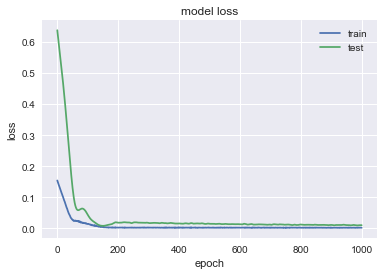

               BLK
MSE        1801.71
MAE         36.019
R2        0.373052
MAPE (%)   7.90744


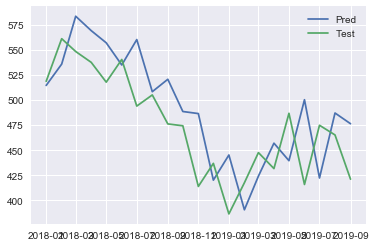

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3492 - val_loss: 0.3984
Epoch 2/1000
0s - loss: 0.3438 - val_loss: 0.3926
Epoch 3/1000
0s - loss: 0.3388 - val_loss: 0.3868
Epoch 4/1000
0s - loss: 0.3344 - val_loss: 0.3810
Epoch 5/1000
0s - loss: 0.3290 - val_loss: 0.3752
Epoch 6/1000
0s - loss: 0.3238 - val_loss: 0.3695
Epoch 7/1000
0s - loss: 0.3194 - val_loss: 0.3638
Epoch 8/1000
0s - loss: 0.3144 - val_loss: 0.3580
Epoch 9/1000
0s - loss: 0.3096 - val_loss: 0.3523
Epoch 10/1000
0s - loss: 0.3050 - val_loss: 0.3465
Epoch 11/1000
0s - loss: 0.3008 - val_loss: 0.3407
Epoch 12/1000
0s - loss: 0.2952 - val_loss: 0.3349
Epoch 13/1000
0s - loss: 0.2902 - val_loss: 0.3290
Epoch 14/1000
0s - loss: 0.2850 - val_loss: 0.3230
Epoch 15/1000
0s - loss: 0.2807 - val_loss: 0.3171
Epoch 16/1000
0s - loss: 0.2751 - val_loss: 0.3110
Epoch 17/1000
0s - loss: 0.2692 - val_loss: 0.3049
Epoch 18/1000
0s - loss: 0.2655 - val_loss: 0.2987
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0085 - val_loss: 0.0126
Epoch 178/1000
0s - loss: 0.0083 - val_loss: 0.0126
Epoch 179/1000
0s - loss: 0.0089 - val_loss: 0.0126
Epoch 180/1000
0s - loss: 0.0092 - val_loss: 0.0127
Epoch 181/1000
0s - loss: 0.0086 - val_loss: 0.0127
Epoch 182/1000
0s - loss: 0.0095 - val_loss: 0.0127
Epoch 183/1000
0s - loss: 0.0085 - val_loss: 0.0127
Epoch 184/1000
0s - loss: 0.0088 - val_loss: 0.0128
Epoch 185/1000
0s - loss: 0.0083 - val_loss: 0.0128
Epoch 186/1000
0s - loss: 0.0084 - val_loss: 0.0128
Epoch 187/1000
0s - loss: 0.0084 - val_loss: 0.0129
Epoch 188/1000
0s - loss: 0.0078 - val_loss: 0.0129
Epoch 189/1000
0s - loss: 0.0083 - val_loss: 0.0129
Epoch 190/1000
0s - loss: 0.0073 - val_loss: 0.0129
Epoch 191/1000
0s - loss: 0.0072 - val_loss: 0.0129
Epoch 192/1000
0s - loss: 0.0083 - val_loss: 0.0130
Epoch 193/1000
0s - loss: 0.0070 - val_loss: 0.0130
Epoch 194/1000
0s - loss: 0.0091 - val_loss: 0.0130
Epoch 195/1000
0s - loss: 0.0072 - val_loss: 0.0130
Epoch 196/1000
0s - loss: 0

0s - loss: 0.0063 - val_loss: 0.0143
Epoch 354/1000
0s - loss: 0.0060 - val_loss: 0.0143
Epoch 355/1000
0s - loss: 0.0066 - val_loss: 0.0143
Epoch 356/1000
0s - loss: 0.0067 - val_loss: 0.0143
Epoch 357/1000
0s - loss: 0.0044 - val_loss: 0.0143
Epoch 358/1000
0s - loss: 0.0060 - val_loss: 0.0143
Epoch 359/1000
0s - loss: 0.0062 - val_loss: 0.0143
Epoch 360/1000
0s - loss: 0.0059 - val_loss: 0.0144
Epoch 361/1000
0s - loss: 0.0074 - val_loss: 0.0144
Epoch 362/1000
0s - loss: 0.0062 - val_loss: 0.0144
Epoch 363/1000
0s - loss: 0.0055 - val_loss: 0.0144
Epoch 364/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 365/1000
0s - loss: 0.0059 - val_loss: 0.0144
Epoch 366/1000
0s - loss: 0.0066 - val_loss: 0.0144
Epoch 367/1000
0s - loss: 0.0059 - val_loss: 0.0144
Epoch 368/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 369/1000
0s - loss: 0.0058 - val_loss: 0.0143
Epoch 370/1000
0s - loss: 0.0058 - val_loss: 0.0143
Epoch 371/1000
0s - loss: 0.0058 - val_loss: 0.0143
Epoch 372/1000
0s - loss: 0

0s - loss: 0.0058 - val_loss: 0.0142
Epoch 529/1000
0s - loss: 0.0050 - val_loss: 0.0142
Epoch 530/1000
0s - loss: 0.0061 - val_loss: 0.0142
Epoch 531/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 532/1000
0s - loss: 0.0054 - val_loss: 0.0141
Epoch 533/1000
0s - loss: 0.0047 - val_loss: 0.0141
Epoch 534/1000
0s - loss: 0.0050 - val_loss: 0.0141
Epoch 535/1000
0s - loss: 0.0059 - val_loss: 0.0141
Epoch 536/1000
0s - loss: 0.0061 - val_loss: 0.0141
Epoch 537/1000
0s - loss: 0.0073 - val_loss: 0.0141
Epoch 538/1000
0s - loss: 0.0067 - val_loss: 0.0141
Epoch 539/1000
0s - loss: 0.0050 - val_loss: 0.0142
Epoch 540/1000
0s - loss: 0.0045 - val_loss: 0.0142
Epoch 541/1000
0s - loss: 0.0048 - val_loss: 0.0142
Epoch 542/1000
0s - loss: 0.0070 - val_loss: 0.0142
Epoch 543/1000
0s - loss: 0.0056 - val_loss: 0.0142
Epoch 544/1000
0s - loss: 0.0059 - val_loss: 0.0142
Epoch 545/1000
0s - loss: 0.0041 - val_loss: 0.0142
Epoch 546/1000
0s - loss: 0.0057 - val_loss: 0.0142
Epoch 547/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0140
Epoch 705/1000
0s - loss: 0.0059 - val_loss: 0.0140
Epoch 706/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 707/1000
0s - loss: 0.0046 - val_loss: 0.0141
Epoch 708/1000
0s - loss: 0.0047 - val_loss: 0.0141
Epoch 709/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 710/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 711/1000
0s - loss: 0.0047 - val_loss: 0.0141
Epoch 712/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 713/1000
0s - loss: 0.0047 - val_loss: 0.0141
Epoch 714/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 715/1000
0s - loss: 0.0061 - val_loss: 0.0140
Epoch 716/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 717/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 718/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 719/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 720/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 721/1000
0s - loss: 0.0055 - val_loss: 0.0141
Epoch 722/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 723/1000
0s - loss: 0

0s - loss: 0.0054 - val_loss: 0.0141
Epoch 881/1000
0s - loss: 0.0053 - val_loss: 0.0141
Epoch 882/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 883/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 884/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 885/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 886/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 887/1000
0s - loss: 0.0058 - val_loss: 0.0139
Epoch 888/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 889/1000
0s - loss: 0.0042 - val_loss: 0.0139
Epoch 890/1000
0s - loss: 0.0051 - val_loss: 0.0139
Epoch 891/1000
0s - loss: 0.0043 - val_loss: 0.0139
Epoch 892/1000
0s - loss: 0.0057 - val_loss: 0.0139
Epoch 893/1000
0s - loss: 0.0049 - val_loss: 0.0139
Epoch 894/1000
0s - loss: 0.0050 - val_loss: 0.0139
Epoch 895/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 896/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 897/1000
0s - loss: 0.0054 - val_loss: 0.0140
Epoch 898/1000
0s - loss: 0.0060 - val_loss: 0.0141
Epoch 899/1000
0s - loss: 0

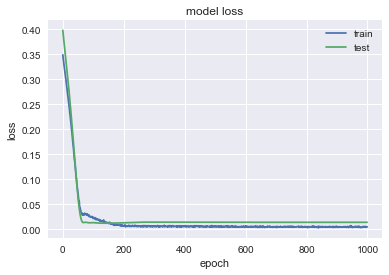

               DVA
MSE        42.2324
MAE        4.85176
R2        0.318678
MAPE (%)   8.26606


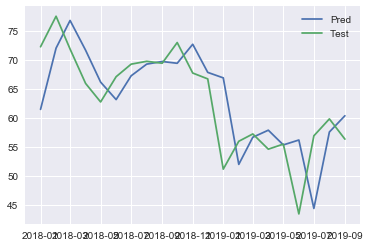

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0392 - val_loss: 0.5895
Epoch 2/1000
0s - loss: 0.0382 - val_loss: 0.5821
Epoch 3/1000
0s - loss: 0.0370 - val_loss: 0.5746
Epoch 4/1000
0s - loss: 0.0360 - val_loss: 0.5672
Epoch 5/1000
0s - loss: 0.0349 - val_loss: 0.5598
Epoch 6/1000
0s - loss: 0.0340 - val_loss: 0.5523
Epoch 7/1000
0s - loss: 0.0329 - val_loss: 0.5448
Epoch 8/1000
0s - loss: 0.0319 - val_loss: 0.5373
Epoch 9/1000
0s - loss: 0.0309 - val_loss: 0.5297
Epoch 10/1000
0s - loss: 0.0300 - val_loss: 0.5221
Epoch 11/1000
0s - loss: 0.0291 - val_loss: 0.5145
Epoch 12/1000
0s - loss: 0.0282 - val_loss: 0.5067
Epoch 13/1000
0s - loss: 0.0270 - val_loss: 0.4989
Epoch 14/1000
0s - loss: 0.0266 - val_loss: 0.4911
Epoch 15/1000
0s - loss: 0.0253 - val_loss: 0.4831
Epoch 16/1000
0s - loss: 0.0245 - val_loss: 0.4751
Epoch 17/1000
0s - loss: 0.0235 - val_loss: 0.4670
Epoch 18/1000
0s - loss: 0.0231 - val_loss: 0.4589
Epoch 19/1000
0s - loss: 0.0

0s - loss: 6.2140e-04 - val_loss: 0.0331
Epoch 172/1000
0s - loss: 6.3447e-04 - val_loss: 0.0327
Epoch 173/1000
0s - loss: 7.0573e-04 - val_loss: 0.0323
Epoch 174/1000
0s - loss: 8.1529e-04 - val_loss: 0.0316
Epoch 175/1000
0s - loss: 5.8682e-04 - val_loss: 0.0307
Epoch 176/1000
0s - loss: 8.1086e-04 - val_loss: 0.0298
Epoch 177/1000
0s - loss: 5.8848e-04 - val_loss: 0.0291
Epoch 178/1000
0s - loss: 5.6939e-04 - val_loss: 0.0282
Epoch 179/1000
0s - loss: 6.9384e-04 - val_loss: 0.0278
Epoch 180/1000
0s - loss: 7.1104e-04 - val_loss: 0.0274
Epoch 181/1000
0s - loss: 5.3435e-04 - val_loss: 0.0273
Epoch 182/1000
0s - loss: 6.7990e-04 - val_loss: 0.0274
Epoch 183/1000
0s - loss: 6.7962e-04 - val_loss: 0.0277
Epoch 184/1000
0s - loss: 5.5591e-04 - val_loss: 0.0282
Epoch 185/1000
0s - loss: 9.4043e-04 - val_loss: 0.0285
Epoch 186/1000
0s - loss: 6.0840e-04 - val_loss: 0.0286
Epoch 187/1000
0s - loss: 4.9399e-04 - val_loss: 0.0287
Epoch 188/1000
0s - loss: 6.5719e-04 - val_loss: 0.0286
Epoch 1

0s - loss: 6.2381e-04 - val_loss: 0.0237
Epoch 333/1000
0s - loss: 5.2560e-04 - val_loss: 0.0236
Epoch 334/1000
0s - loss: 5.9953e-04 - val_loss: 0.0233
Epoch 335/1000
0s - loss: 5.3923e-04 - val_loss: 0.0231
Epoch 336/1000
0s - loss: 6.0621e-04 - val_loss: 0.0227
Epoch 337/1000
0s - loss: 5.4346e-04 - val_loss: 0.0222
Epoch 338/1000
0s - loss: 5.4567e-04 - val_loss: 0.0217
Epoch 339/1000
0s - loss: 5.7817e-04 - val_loss: 0.0213
Epoch 340/1000
0s - loss: 4.4283e-04 - val_loss: 0.0208
Epoch 341/1000
0s - loss: 6.0371e-04 - val_loss: 0.0208
Epoch 342/1000
0s - loss: 4.4877e-04 - val_loss: 0.0208
Epoch 343/1000
0s - loss: 5.7154e-04 - val_loss: 0.0207
Epoch 344/1000
0s - loss: 4.9677e-04 - val_loss: 0.0209
Epoch 345/1000
0s - loss: 5.3467e-04 - val_loss: 0.0209
Epoch 346/1000
0s - loss: 5.4116e-04 - val_loss: 0.0209
Epoch 347/1000
0s - loss: 6.6188e-04 - val_loss: 0.0210
Epoch 348/1000
0s - loss: 6.1468e-04 - val_loss: 0.0210
Epoch 349/1000
0s - loss: 6.2341e-04 - val_loss: 0.0212
Epoch 3

0s - loss: 4.6816e-04 - val_loss: 0.0159
Epoch 491/1000
0s - loss: 5.4524e-04 - val_loss: 0.0161
Epoch 492/1000
0s - loss: 7.1076e-04 - val_loss: 0.0161
Epoch 493/1000
0s - loss: 4.8017e-04 - val_loss: 0.0160
Epoch 494/1000
0s - loss: 6.4761e-04 - val_loss: 0.0158
Epoch 495/1000
0s - loss: 5.3537e-04 - val_loss: 0.0158
Epoch 496/1000
0s - loss: 6.6016e-04 - val_loss: 0.0156
Epoch 497/1000
0s - loss: 5.3410e-04 - val_loss: 0.0156
Epoch 498/1000
0s - loss: 6.5206e-04 - val_loss: 0.0157
Epoch 499/1000
0s - loss: 5.1081e-04 - val_loss: 0.0158
Epoch 500/1000
0s - loss: 4.9580e-04 - val_loss: 0.0159
Epoch 501/1000
0s - loss: 6.1064e-04 - val_loss: 0.0159
Epoch 502/1000
0s - loss: 6.6329e-04 - val_loss: 0.0159
Epoch 503/1000
0s - loss: 4.6439e-04 - val_loss: 0.0159
Epoch 504/1000
0s - loss: 4.4574e-04 - val_loss: 0.0159
Epoch 505/1000
0s - loss: 5.4777e-04 - val_loss: 0.0160
Epoch 506/1000
0s - loss: 6.8294e-04 - val_loss: 0.0164
Epoch 507/1000
0s - loss: 5.2947e-04 - val_loss: 0.0168
Epoch 5

0s - loss: 5.1382e-04 - val_loss: 0.0148
Epoch 656/1000
0s - loss: 4.3599e-04 - val_loss: 0.0147
Epoch 657/1000
0s - loss: 5.7069e-04 - val_loss: 0.0148
Epoch 658/1000
0s - loss: 5.1825e-04 - val_loss: 0.0151
Epoch 659/1000
0s - loss: 6.1973e-04 - val_loss: 0.0154
Epoch 660/1000
0s - loss: 5.2834e-04 - val_loss: 0.0156
Epoch 661/1000
0s - loss: 6.5014e-04 - val_loss: 0.0156
Epoch 662/1000
0s - loss: 5.1044e-04 - val_loss: 0.0155
Epoch 663/1000
0s - loss: 4.7895e-04 - val_loss: 0.0154
Epoch 664/1000
0s - loss: 6.9615e-04 - val_loss: 0.0153
Epoch 665/1000
0s - loss: 6.6922e-04 - val_loss: 0.0152
Epoch 666/1000
0s - loss: 4.5925e-04 - val_loss: 0.0152
Epoch 667/1000
0s - loss: 5.7884e-04 - val_loss: 0.0152
Epoch 668/1000
0s - loss: 5.8497e-04 - val_loss: 0.0150
Epoch 669/1000
0s - loss: 5.2793e-04 - val_loss: 0.0148
Epoch 670/1000
0s - loss: 5.4934e-04 - val_loss: 0.0146
Epoch 671/1000
0s - loss: 5.8424e-04 - val_loss: 0.0146
Epoch 672/1000
0s - loss: 6.0951e-04 - val_loss: 0.0148
Epoch 6

0s - loss: 5.3907e-04 - val_loss: 0.0144
Epoch 824/1000
0s - loss: 4.5280e-04 - val_loss: 0.0143
Epoch 825/1000
0s - loss: 4.9334e-04 - val_loss: 0.0143
Epoch 826/1000
0s - loss: 6.5720e-04 - val_loss: 0.0141
Epoch 827/1000
0s - loss: 4.2764e-04 - val_loss: 0.0139
Epoch 828/1000
0s - loss: 6.0987e-04 - val_loss: 0.0139
Epoch 829/1000
0s - loss: 4.0600e-04 - val_loss: 0.0140
Epoch 830/1000
0s - loss: 5.1714e-04 - val_loss: 0.0143
Epoch 831/1000
0s - loss: 5.8541e-04 - val_loss: 0.0147
Epoch 832/1000
0s - loss: 5.7060e-04 - val_loss: 0.0150
Epoch 833/1000
0s - loss: 7.7061e-04 - val_loss: 0.0151
Epoch 834/1000
0s - loss: 4.3448e-04 - val_loss: 0.0152
Epoch 835/1000
0s - loss: 5.6699e-04 - val_loss: 0.0153
Epoch 836/1000
0s - loss: 5.0299e-04 - val_loss: 0.0151
Epoch 837/1000
0s - loss: 5.8814e-04 - val_loss: 0.0148
Epoch 838/1000
0s - loss: 4.5497e-04 - val_loss: 0.0146
Epoch 839/1000
0s - loss: 4.5342e-04 - val_loss: 0.0143
Epoch 840/1000
0s - loss: 4.8462e-04 - val_loss: 0.0143
Epoch 8

0s - loss: 4.0608e-04 - val_loss: 0.0134
Epoch 972/1000
0s - loss: 5.5625e-04 - val_loss: 0.0130
Epoch 973/1000
0s - loss: 6.0009e-04 - val_loss: 0.0126
Epoch 974/1000
0s - loss: 4.9785e-04 - val_loss: 0.0124
Epoch 975/1000
0s - loss: 6.5519e-04 - val_loss: 0.0125
Epoch 976/1000
0s - loss: 4.2124e-04 - val_loss: 0.0125
Epoch 977/1000
0s - loss: 6.6572e-04 - val_loss: 0.0124
Epoch 978/1000
0s - loss: 4.9934e-04 - val_loss: 0.0121
Epoch 979/1000
0s - loss: 7.9082e-04 - val_loss: 0.0120
Epoch 980/1000
0s - loss: 4.6883e-04 - val_loss: 0.0121
Epoch 981/1000
0s - loss: 4.3207e-04 - val_loss: 0.0121
Epoch 982/1000
0s - loss: 4.9021e-04 - val_loss: 0.0123
Epoch 983/1000
0s - loss: 6.9637e-04 - val_loss: 0.0121
Epoch 984/1000
0s - loss: 5.1805e-04 - val_loss: 0.0120
Epoch 985/1000
0s - loss: 5.5983e-04 - val_loss: 0.0119
Epoch 986/1000
0s - loss: 4.4710e-04 - val_loss: 0.0119
Epoch 987/1000
0s - loss: 6.6226e-04 - val_loss: 0.0118
Epoch 988/1000
0s - loss: 4.8636e-04 - val_loss: 0.0118
Epoch 9

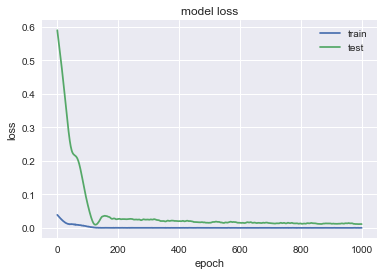

                BA
MSE        1779.66
MAE        33.7751
R2       -0.164145
MAPE (%)   9.56222


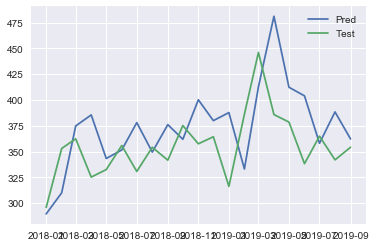

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3595 - val_loss: 0.0929
Epoch 2/1000
0s - loss: 0.3545 - val_loss: 0.0908
Epoch 3/1000
0s - loss: 0.3496 - val_loss: 0.0887
Epoch 4/1000
0s - loss: 0.3445 - val_loss: 0.0867
Epoch 5/1000
0s - loss: 0.3390 - val_loss: 0.0846
Epoch 6/1000
0s - loss: 0.3347 - val_loss: 0.0826
Epoch 7/1000
0s - loss: 0.3295 - val_loss: 0.0806
Epoch 8/1000
0s - loss: 0.3249 - val_loss: 0.0785
Epoch 9/1000
0s - loss: 0.3190 - val_loss: 0.0765
Epoch 10/1000
0s - loss: 0.3149 - val_loss: 0.0745
Epoch 11/1000
0s - loss: 0.3095 - val_loss: 0.0725
Epoch 12/1000
0s - loss: 0.3044 - val_loss: 0.0705
Epoch 13/1000
0s - loss: 0.2991 - val_loss: 0.0684
Epoch 14/1000
0s - loss: 0.2940 - val_loss: 0.0664
Epoch 15/1000
0s - loss: 0.2886 - val_loss: 0.0644
Epoch 16/1000
0s - loss: 0.2823 - val_loss: 0.0623
Epoch 17/1000
0s - loss: 0.2784 - val_loss: 0.0603
Epoch 18/1000
0s - loss: 0.2715 - val_loss: 0.0582
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0119 - val_loss: 0.0253
Epoch 176/1000
0s - loss: 0.0116 - val_loss: 0.0251
Epoch 177/1000
0s - loss: 0.0143 - val_loss: 0.0250
Epoch 178/1000
0s - loss: 0.0119 - val_loss: 0.0248
Epoch 179/1000
0s - loss: 0.0126 - val_loss: 0.0246
Epoch 180/1000
0s - loss: 0.0116 - val_loss: 0.0244
Epoch 181/1000
0s - loss: 0.0110 - val_loss: 0.0243
Epoch 182/1000
0s - loss: 0.0115 - val_loss: 0.0241
Epoch 183/1000
0s - loss: 0.0136 - val_loss: 0.0239
Epoch 184/1000
0s - loss: 0.0120 - val_loss: 0.0238
Epoch 185/1000
0s - loss: 0.0128 - val_loss: 0.0236
Epoch 186/1000
0s - loss: 0.0122 - val_loss: 0.0234
Epoch 187/1000
0s - loss: 0.0121 - val_loss: 0.0232
Epoch 188/1000
0s - loss: 0.0104 - val_loss: 0.0230
Epoch 189/1000
0s - loss: 0.0118 - val_loss: 0.0228
Epoch 190/1000
0s - loss: 0.0114 - val_loss: 0.0226
Epoch 191/1000
0s - loss: 0.0126 - val_loss: 0.0224
Epoch 192/1000
0s - loss: 0.0122 - val_loss: 0.0222
Epoch 193/1000
0s - loss: 0.0107 - val_loss: 0.0220
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0067 - val_loss: 0.0132
Epoch 350/1000
0s - loss: 0.0085 - val_loss: 0.0131
Epoch 351/1000
0s - loss: 0.0081 - val_loss: 0.0131
Epoch 352/1000
0s - loss: 0.0075 - val_loss: 0.0131
Epoch 353/1000
0s - loss: 0.0075 - val_loss: 0.0131
Epoch 354/1000
0s - loss: 0.0074 - val_loss: 0.0130
Epoch 355/1000
0s - loss: 0.0092 - val_loss: 0.0130
Epoch 356/1000
0s - loss: 0.0084 - val_loss: 0.0130
Epoch 357/1000
0s - loss: 0.0078 - val_loss: 0.0130
Epoch 358/1000
0s - loss: 0.0075 - val_loss: 0.0131
Epoch 359/1000
0s - loss: 0.0082 - val_loss: 0.0131
Epoch 360/1000
0s - loss: 0.0092 - val_loss: 0.0132
Epoch 361/1000
0s - loss: 0.0090 - val_loss: 0.0133
Epoch 362/1000
0s - loss: 0.0082 - val_loss: 0.0133
Epoch 363/1000
0s - loss: 0.0084 - val_loss: 0.0134
Epoch 364/1000
0s - loss: 0.0080 - val_loss: 0.0134
Epoch 365/1000
0s - loss: 0.0088 - val_loss: 0.0134
Epoch 366/1000
0s - loss: 0.0076 - val_loss: 0.0134
Epoch 367/1000
0s - loss: 0.0085 - val_loss: 0.0133
Epoch 368/1000
0s - loss: 0

0s - loss: 0.0093 - val_loss: 0.0129
Epoch 521/1000
0s - loss: 0.0094 - val_loss: 0.0129
Epoch 522/1000
0s - loss: 0.0086 - val_loss: 0.0130
Epoch 523/1000
0s - loss: 0.0077 - val_loss: 0.0130
Epoch 524/1000
0s - loss: 0.0084 - val_loss: 0.0130
Epoch 525/1000
0s - loss: 0.0088 - val_loss: 0.0130
Epoch 526/1000
0s - loss: 0.0099 - val_loss: 0.0130
Epoch 527/1000
0s - loss: 0.0078 - val_loss: 0.0130
Epoch 528/1000
0s - loss: 0.0091 - val_loss: 0.0129
Epoch 529/1000
0s - loss: 0.0081 - val_loss: 0.0129
Epoch 530/1000
0s - loss: 0.0080 - val_loss: 0.0128
Epoch 531/1000
0s - loss: 0.0092 - val_loss: 0.0128
Epoch 532/1000
0s - loss: 0.0082 - val_loss: 0.0128
Epoch 533/1000
0s - loss: 0.0073 - val_loss: 0.0128
Epoch 534/1000
0s - loss: 0.0081 - val_loss: 0.0129
Epoch 535/1000
0s - loss: 0.0068 - val_loss: 0.0130
Epoch 536/1000
0s - loss: 0.0079 - val_loss: 0.0130
Epoch 537/1000
0s - loss: 0.0073 - val_loss: 0.0130
Epoch 538/1000
0s - loss: 0.0088 - val_loss: 0.0131
Epoch 539/1000
0s - loss: 0

0s - loss: 0.0092 - val_loss: 0.0130
Epoch 695/1000
0s - loss: 0.0088 - val_loss: 0.0130
Epoch 696/1000
0s - loss: 0.0091 - val_loss: 0.0131
Epoch 697/1000
0s - loss: 0.0089 - val_loss: 0.0131
Epoch 698/1000
0s - loss: 0.0072 - val_loss: 0.0131
Epoch 699/1000
0s - loss: 0.0083 - val_loss: 0.0131
Epoch 700/1000
0s - loss: 0.0082 - val_loss: 0.0131
Epoch 701/1000
0s - loss: 0.0077 - val_loss: 0.0131
Epoch 702/1000
0s - loss: 0.0085 - val_loss: 0.0131
Epoch 703/1000
0s - loss: 0.0086 - val_loss: 0.0131
Epoch 704/1000
0s - loss: 0.0060 - val_loss: 0.0131
Epoch 705/1000
0s - loss: 0.0087 - val_loss: 0.0131
Epoch 706/1000
0s - loss: 0.0077 - val_loss: 0.0131
Epoch 707/1000
0s - loss: 0.0071 - val_loss: 0.0131
Epoch 708/1000
0s - loss: 0.0069 - val_loss: 0.0131
Epoch 709/1000
0s - loss: 0.0068 - val_loss: 0.0131
Epoch 710/1000
0s - loss: 0.0088 - val_loss: 0.0131
Epoch 711/1000
0s - loss: 0.0095 - val_loss: 0.0131
Epoch 712/1000
0s - loss: 0.0076 - val_loss: 0.0132
Epoch 713/1000
0s - loss: 0

0s - loss: 0.0087 - val_loss: 0.0132
Epoch 871/1000
0s - loss: 0.0068 - val_loss: 0.0132
Epoch 872/1000
0s - loss: 0.0069 - val_loss: 0.0132
Epoch 873/1000
0s - loss: 0.0079 - val_loss: 0.0132
Epoch 874/1000
0s - loss: 0.0057 - val_loss: 0.0132
Epoch 875/1000
0s - loss: 0.0072 - val_loss: 0.0133
Epoch 876/1000
0s - loss: 0.0077 - val_loss: 0.0133
Epoch 877/1000
0s - loss: 0.0086 - val_loss: 0.0133
Epoch 878/1000
0s - loss: 0.0071 - val_loss: 0.0133
Epoch 879/1000
0s - loss: 0.0085 - val_loss: 0.0134
Epoch 880/1000
0s - loss: 0.0086 - val_loss: 0.0134
Epoch 881/1000
0s - loss: 0.0073 - val_loss: 0.0133
Epoch 882/1000
0s - loss: 0.0078 - val_loss: 0.0133
Epoch 883/1000
0s - loss: 0.0079 - val_loss: 0.0133
Epoch 884/1000
0s - loss: 0.0089 - val_loss: 0.0133
Epoch 885/1000
0s - loss: 0.0069 - val_loss: 0.0133
Epoch 886/1000
0s - loss: 0.0074 - val_loss: 0.0133
Epoch 887/1000
0s - loss: 0.0082 - val_loss: 0.0133
Epoch 888/1000
0s - loss: 0.0078 - val_loss: 0.0133
Epoch 889/1000
0s - loss: 0

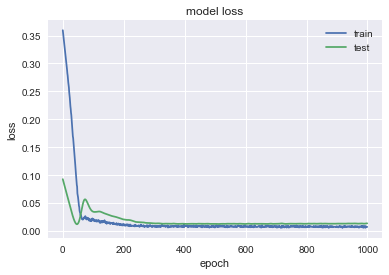

               IBM
MSE        139.949
MAE        8.33748
R2       -0.142641
MAPE (%)   6.36953


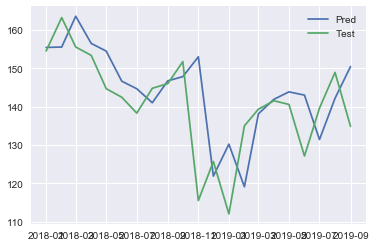

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1218 - val_loss: 0.2687
Epoch 2/1000
0s - loss: 0.1197 - val_loss: 0.2636
Epoch 3/1000
0s - loss: 0.1167 - val_loss: 0.2586
Epoch 4/1000
0s - loss: 0.1146 - val_loss: 0.2535
Epoch 5/1000
0s - loss: 0.1119 - val_loss: 0.2485
Epoch 6/1000
0s - loss: 0.1096 - val_loss: 0.2435
Epoch 7/1000
0s - loss: 0.1068 - val_loss: 0.2385
Epoch 8/1000
0s - loss: 0.1040 - val_loss: 0.2334
Epoch 9/1000
0s - loss: 0.1016 - val_loss: 0.2284
Epoch 10/1000
0s - loss: 0.0992 - val_loss: 0.2233
Epoch 11/1000
0s - loss: 0.0969 - val_loss: 0.2182
Epoch 12/1000
0s - loss: 0.0941 - val_loss: 0.2131
Epoch 13/1000
0s - loss: 0.0918 - val_loss: 0.2080
Epoch 14/1000
0s - loss: 0.0895 - val_loss: 0.2028
Epoch 15/1000
0s - loss: 0.0873 - val_loss: 0.1976
Epoch 16/1000
0s - loss: 0.0842 - val_loss: 0.1923
Epoch 17/1000
0s - loss: 0.0818 - val_loss: 0.1871
Epoch 18/1000
0s - loss: 0.0794 - val_loss: 0.1817
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0036 - val_loss: 0.0086
Epoch 165/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 166/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 167/1000
0s - loss: 0.0037 - val_loss: 0.0085
Epoch 168/1000
0s - loss: 0.0043 - val_loss: 0.0086
Epoch 169/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 170/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 171/1000
0s - loss: 0.0039 - val_loss: 0.0087
Epoch 172/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 174/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 175/1000
0s - loss: 0.0037 - val_loss: 0.0088
Epoch 176/1000
0s - loss: 0.0031 - val_loss: 0.0088
Epoch 177/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 178/1000
0s - loss: 0.0037 - val_loss: 0.0087
Epoch 179/1000
0s - loss: 0.0032 - val_loss: 0.0087
Epoch 180/1000
0s - loss: 0.0041 - val_loss: 0.0087
Epoch 181/1000
0s - loss: 0.0036 - val_loss: 0.0088
Epoch 182/1000
0s - loss: 0.0031 - val_loss: 0.0088
Epoch 183/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0084
Epoch 336/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 337/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 338/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 339/1000
0s - loss: 0.0032 - val_loss: 0.0087
Epoch 340/1000
0s - loss: 0.0037 - val_loss: 0.0088
Epoch 341/1000
0s - loss: 0.0035 - val_loss: 0.0089
Epoch 342/1000
0s - loss: 0.0036 - val_loss: 0.0089
Epoch 343/1000
0s - loss: 0.0042 - val_loss: 0.0088
Epoch 344/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 345/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 346/1000
0s - loss: 0.0033 - val_loss: 0.0087
Epoch 347/1000
0s - loss: 0.0037 - val_loss: 0.0087
Epoch 348/1000
0s - loss: 0.0038 - val_loss: 0.0087
Epoch 349/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 350/1000
0s - loss: 0.0036 - val_loss: 0.0088
Epoch 351/1000
0s - loss: 0.0043 - val_loss: 0.0088
Epoch 352/1000
0s - loss: 0.0031 - val_loss: 0.0088
Epoch 353/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 354/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0086
Epoch 499/1000
0s - loss: 0.0039 - val_loss: 0.0086
Epoch 500/1000
0s - loss: 0.0037 - val_loss: 0.0087
Epoch 501/1000
0s - loss: 0.0037 - val_loss: 0.0087
Epoch 502/1000
0s - loss: 0.0036 - val_loss: 0.0087
Epoch 503/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 504/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 505/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 506/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 507/1000
0s - loss: 0.0031 - val_loss: 0.0085
Epoch 508/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 509/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 510/1000
0s - loss: 0.0042 - val_loss: 0.0081
Epoch 511/1000
0s - loss: 0.0039 - val_loss: 0.0080
Epoch 512/1000
0s - loss: 0.0024 - val_loss: 0.0080
Epoch 513/1000
0s - loss: 0.0034 - val_loss: 0.0080
Epoch 514/1000
0s - loss: 0.0032 - val_loss: 0.0080
Epoch 515/1000
0s - loss: 0.0033 - val_loss: 0.0082
Epoch 516/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 517/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0086
Epoch 672/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 673/1000
0s - loss: 0.0031 - val_loss: 0.0088
Epoch 674/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 675/1000
0s - loss: 0.0027 - val_loss: 0.0091
Epoch 676/1000
0s - loss: 0.0026 - val_loss: 0.0092
Epoch 677/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 678/1000
0s - loss: 0.0025 - val_loss: 0.0095
Epoch 679/1000
0s - loss: 0.0025 - val_loss: 0.0094
Epoch 680/1000
0s - loss: 0.0033 - val_loss: 0.0094
Epoch 681/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 682/1000
0s - loss: 0.0038 - val_loss: 0.0093
Epoch 683/1000
0s - loss: 0.0041 - val_loss: 0.0094
Epoch 684/1000
0s - loss: 0.0030 - val_loss: 0.0094
Epoch 685/1000
0s - loss: 0.0048 - val_loss: 0.0093
Epoch 686/1000
0s - loss: 0.0033 - val_loss: 0.0091
Epoch 687/1000
0s - loss: 0.0033 - val_loss: 0.0090
Epoch 688/1000
0s - loss: 0.0037 - val_loss: 0.0088
Epoch 689/1000
0s - loss: 0.0033 - val_loss: 0.0086
Epoch 690/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0090
Epoch 839/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 840/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 841/1000
0s - loss: 0.0036 - val_loss: 0.0082
Epoch 842/1000
0s - loss: 0.0033 - val_loss: 0.0080
Epoch 843/1000
0s - loss: 0.0037 - val_loss: 0.0079
Epoch 844/1000
0s - loss: 0.0032 - val_loss: 0.0078
Epoch 845/1000
0s - loss: 0.0029 - val_loss: 0.0079
Epoch 846/1000
0s - loss: 0.0031 - val_loss: 0.0079
Epoch 847/1000
0s - loss: 0.0027 - val_loss: 0.0080
Epoch 848/1000
0s - loss: 0.0035 - val_loss: 0.0081
Epoch 849/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 850/1000
0s - loss: 0.0026 - val_loss: 0.0083
Epoch 851/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 852/1000
0s - loss: 0.0031 - val_loss: 0.0085
Epoch 853/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 854/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 855/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 856/1000
0s - loss: 0.0032 - val_loss: 0.0089
Epoch 857/1000
0s - loss: 0

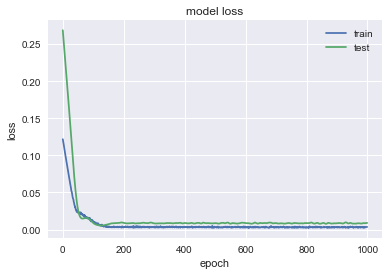

               ALB
MSE        100.758
MAE          7.762
R2        0.695533
MAPE (%)   9.16912


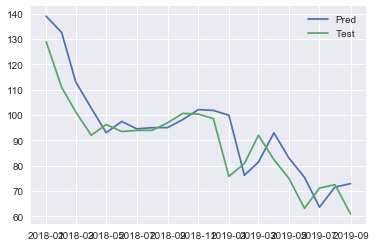

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1508 - val_loss: 0.7280
Epoch 2/1000
0s - loss: 0.1481 - val_loss: 0.7196
Epoch 3/1000
0s - loss: 0.1453 - val_loss: 0.7113
Epoch 4/1000
0s - loss: 0.1426 - val_loss: 0.7030
Epoch 5/1000
0s - loss: 0.1402 - val_loss: 0.6949
Epoch 6/1000
0s - loss: 0.1376 - val_loss: 0.6867
Epoch 7/1000
0s - loss: 0.1350 - val_loss: 0.6786
Epoch 8/1000
0s - loss: 0.1326 - val_loss: 0.6705
Epoch 9/1000
0s - loss: 0.1301 - val_loss: 0.6625
Epoch 10/1000
0s - loss: 0.1275 - val_loss: 0.6543
Epoch 11/1000
0s - loss: 0.1250 - val_loss: 0.6462
Epoch 12/1000
0s - loss: 0.1226 - val_loss: 0.6380
Epoch 13/1000
0s - loss: 0.1202 - val_loss: 0.6298
Epoch 14/1000
0s - loss: 0.1177 - val_loss: 0.6215
Epoch 15/1000
0s - loss: 0.1151 - val_loss: 0.6131
Epoch 16/1000
0s - loss: 0.1130 - val_loss: 0.6047
Epoch 17/1000
0s - loss: 0.1105 - val_loss: 0.5961
Epoch 18/1000
0s - loss: 0.1071 - val_loss: 0.5875
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0050 - val_loss: 0.0086
Epoch 171/1000
0s - loss: 0.0051 - val_loss: 0.0084
Epoch 172/1000
0s - loss: 0.0055 - val_loss: 0.0082
Epoch 173/1000
0s - loss: 0.0044 - val_loss: 0.0080
Epoch 174/1000
0s - loss: 0.0052 - val_loss: 0.0079
Epoch 175/1000
0s - loss: 0.0045 - val_loss: 0.0078
Epoch 176/1000
0s - loss: 0.0044 - val_loss: 0.0077
Epoch 177/1000
0s - loss: 0.0051 - val_loss: 0.0077
Epoch 178/1000
0s - loss: 0.0044 - val_loss: 0.0077
Epoch 179/1000
0s - loss: 0.0051 - val_loss: 0.0077
Epoch 180/1000
0s - loss: 0.0051 - val_loss: 0.0078
Epoch 181/1000
0s - loss: 0.0043 - val_loss: 0.0078
Epoch 182/1000
0s - loss: 0.0046 - val_loss: 0.0078
Epoch 183/1000
0s - loss: 0.0048 - val_loss: 0.0079
Epoch 184/1000
0s - loss: 0.0042 - val_loss: 0.0080
Epoch 185/1000
0s - loss: 0.0044 - val_loss: 0.0080
Epoch 186/1000
0s - loss: 0.0045 - val_loss: 0.0081
Epoch 187/1000
0s - loss: 0.0043 - val_loss: 0.0082
Epoch 188/1000
0s - loss: 0.0041 - val_loss: 0.0083
Epoch 189/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0113
Epoch 338/1000
0s - loss: 0.0038 - val_loss: 0.0114
Epoch 339/1000
0s - loss: 0.0035 - val_loss: 0.0114
Epoch 340/1000
0s - loss: 0.0041 - val_loss: 0.0114
Epoch 341/1000
0s - loss: 0.0042 - val_loss: 0.0114
Epoch 342/1000
0s - loss: 0.0042 - val_loss: 0.0114
Epoch 343/1000
0s - loss: 0.0034 - val_loss: 0.0114
Epoch 344/1000
0s - loss: 0.0042 - val_loss: 0.0113
Epoch 345/1000
0s - loss: 0.0039 - val_loss: 0.0113
Epoch 346/1000
0s - loss: 0.0035 - val_loss: 0.0113
Epoch 347/1000
0s - loss: 0.0038 - val_loss: 0.0113
Epoch 348/1000
0s - loss: 0.0040 - val_loss: 0.0114
Epoch 349/1000
0s - loss: 0.0037 - val_loss: 0.0113
Epoch 350/1000
0s - loss: 0.0035 - val_loss: 0.0112
Epoch 351/1000
0s - loss: 0.0044 - val_loss: 0.0112
Epoch 352/1000
0s - loss: 0.0032 - val_loss: 0.0112
Epoch 353/1000
0s - loss: 0.0041 - val_loss: 0.0112
Epoch 354/1000
0s - loss: 0.0032 - val_loss: 0.0112
Epoch 355/1000
0s - loss: 0.0046 - val_loss: 0.0111
Epoch 356/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0093
Epoch 510/1000
0s - loss: 0.0041 - val_loss: 0.0093
Epoch 511/1000
0s - loss: 0.0037 - val_loss: 0.0094
Epoch 512/1000
0s - loss: 0.0039 - val_loss: 0.0096
Epoch 513/1000
0s - loss: 0.0044 - val_loss: 0.0099
Epoch 514/1000
0s - loss: 0.0039 - val_loss: 0.0101
Epoch 515/1000
0s - loss: 0.0037 - val_loss: 0.0103
Epoch 516/1000
0s - loss: 0.0039 - val_loss: 0.0102
Epoch 517/1000
0s - loss: 0.0037 - val_loss: 0.0101
Epoch 518/1000
0s - loss: 0.0038 - val_loss: 0.0100
Epoch 519/1000
0s - loss: 0.0035 - val_loss: 0.0100
Epoch 520/1000
0s - loss: 0.0043 - val_loss: 0.0099
Epoch 521/1000
0s - loss: 0.0035 - val_loss: 0.0099
Epoch 522/1000
0s - loss: 0.0036 - val_loss: 0.0098
Epoch 523/1000
0s - loss: 0.0045 - val_loss: 0.0096
Epoch 524/1000
0s - loss: 0.0035 - val_loss: 0.0095
Epoch 525/1000
0s - loss: 0.0039 - val_loss: 0.0095
Epoch 526/1000
0s - loss: 0.0039 - val_loss: 0.0094
Epoch 527/1000
0s - loss: 0.0034 - val_loss: 0.0092
Epoch 528/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0077
Epoch 679/1000
0s - loss: 0.0031 - val_loss: 0.0077
Epoch 680/1000
0s - loss: 0.0033 - val_loss: 0.0078
Epoch 681/1000
0s - loss: 0.0037 - val_loss: 0.0078
Epoch 682/1000
0s - loss: 0.0033 - val_loss: 0.0079
Epoch 683/1000
0s - loss: 0.0041 - val_loss: 0.0079
Epoch 684/1000
0s - loss: 0.0035 - val_loss: 0.0078
Epoch 685/1000
0s - loss: 0.0035 - val_loss: 0.0078
Epoch 686/1000
0s - loss: 0.0034 - val_loss: 0.0077
Epoch 687/1000
0s - loss: 0.0038 - val_loss: 0.0077
Epoch 688/1000
0s - loss: 0.0037 - val_loss: 0.0077
Epoch 689/1000
0s - loss: 0.0037 - val_loss: 0.0077
Epoch 690/1000
0s - loss: 0.0034 - val_loss: 0.0078
Epoch 691/1000
0s - loss: 0.0046 - val_loss: 0.0078
Epoch 692/1000
0s - loss: 0.0034 - val_loss: 0.0079
Epoch 693/1000
0s - loss: 0.0034 - val_loss: 0.0079
Epoch 694/1000
0s - loss: 0.0036 - val_loss: 0.0080
Epoch 695/1000
0s - loss: 0.0039 - val_loss: 0.0080
Epoch 696/1000
0s - loss: 0.0033 - val_loss: 0.0080
Epoch 697/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0070
Epoch 851/1000
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 852/1000
0s - loss: 0.0038 - val_loss: 0.0070
Epoch 853/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 854/1000
0s - loss: 0.0038 - val_loss: 0.0070
Epoch 855/1000
0s - loss: 0.0034 - val_loss: 0.0070
Epoch 856/1000
0s - loss: 0.0034 - val_loss: 0.0070
Epoch 857/1000
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 858/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 859/1000
0s - loss: 0.0029 - val_loss: 0.0070
Epoch 860/1000
0s - loss: 0.0035 - val_loss: 0.0070
Epoch 861/1000
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 862/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 863/1000
0s - loss: 0.0034 - val_loss: 0.0070
Epoch 864/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 865/1000
0s - loss: 0.0038 - val_loss: 0.0070
Epoch 866/1000
0s - loss: 0.0039 - val_loss: 0.0070
Epoch 867/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 868/1000
0s - loss: 0.0031 - val_loss: 0.0070
Epoch 869/1000
0s - loss: 0

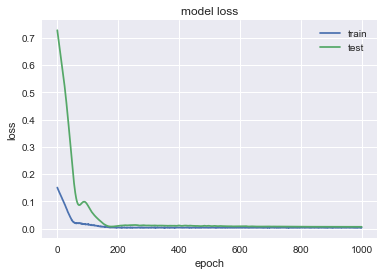

              CBRE
MSE        11.4238
MAE        2.72289
R2        0.102075
MAPE (%)   5.86318


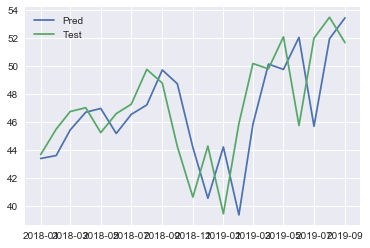

In [92]:
pred = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred[comp] = nn_forec(df,comp,n_train_time=test.shape[0]).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3273 - val_loss: 0.2333
Epoch 2/1000
0s - loss: 0.3245 - val_loss: 0.2306
Epoch 3/1000
0s - loss: 0.3208 - val_loss: 0.2279
Epoch 4/1000
0s - loss: 0.3182 - val_loss: 0.2253
Epoch 5/1000
0s - loss: 0.3146 - val_loss: 0.2227
Epoch 6/1000
0s - loss: 0.3116 - val_loss: 0.2201
Epoch 7/1000
0s - loss: 0.3088 - val_loss: 0.2175
Epoch 8/1000
0s - loss: 0.3056 - val_loss: 0.2150
Epoch 9/1000
0s - loss: 0.3030 - val_loss: 0.2124
Epoch 10/1000
0s - loss: 0.2992 - val_loss: 0.2098
Epoch 11/1000
0s - loss: 0.2966 - val_loss: 0.2073
Epoch 12/1000
0s - loss: 0.2937 - val_loss: 0.2047
Epoch 13/1000
0s - loss: 0.2903 - val_loss: 0.2022
Epoch 14/1000
0s - loss: 0.2870 - val_loss: 0.1996
Epoch 15/1000
0s - loss: 0.2855 - val_loss: 0.1971
Epoch 16/1000
0s - loss: 0.2814 - val_loss: 0.1946
Epoch 17/1000
0s - loss: 0.2787 - val_loss: 0.1920
Epoch 18/1000
0s - loss: 0.2750 - val_loss: 0.1895
Epoch 19/1000
0s - loss: 0.27

0s - loss: 0.0210 - val_loss: 0.0112
Epoch 186/1000
0s - loss: 0.0217 - val_loss: 0.0112
Epoch 187/1000
0s - loss: 0.0216 - val_loss: 0.0112
Epoch 188/1000
0s - loss: 0.0197 - val_loss: 0.0111
Epoch 189/1000
0s - loss: 0.0212 - val_loss: 0.0111
Epoch 190/1000
0s - loss: 0.0203 - val_loss: 0.0110
Epoch 191/1000
0s - loss: 0.0227 - val_loss: 0.0110
Epoch 192/1000
0s - loss: 0.0207 - val_loss: 0.0109
Epoch 193/1000
0s - loss: 0.0210 - val_loss: 0.0109
Epoch 194/1000
0s - loss: 0.0211 - val_loss: 0.0108
Epoch 195/1000
0s - loss: 0.0195 - val_loss: 0.0108
Epoch 196/1000
0s - loss: 0.0193 - val_loss: 0.0107
Epoch 197/1000
0s - loss: 0.0189 - val_loss: 0.0107
Epoch 198/1000
0s - loss: 0.0200 - val_loss: 0.0106
Epoch 199/1000
0s - loss: 0.0199 - val_loss: 0.0106
Epoch 200/1000
0s - loss: 0.0189 - val_loss: 0.0106
Epoch 201/1000
0s - loss: 0.0204 - val_loss: 0.0105
Epoch 202/1000
0s - loss: 0.0222 - val_loss: 0.0105
Epoch 203/1000
0s - loss: 0.0200 - val_loss: 0.0104
Epoch 204/1000
0s - loss: 0

0s - loss: 0.0114 - val_loss: 0.0066
Epoch 358/1000
0s - loss: 0.0110 - val_loss: 0.0066
Epoch 359/1000
0s - loss: 0.0153 - val_loss: 0.0066
Epoch 360/1000
0s - loss: 0.0121 - val_loss: 0.0066
Epoch 361/1000
0s - loss: 0.0121 - val_loss: 0.0066
Epoch 362/1000
0s - loss: 0.0102 - val_loss: 0.0066
Epoch 363/1000
0s - loss: 0.0122 - val_loss: 0.0066
Epoch 364/1000
0s - loss: 0.0124 - val_loss: 0.0066
Epoch 365/1000
0s - loss: 0.0090 - val_loss: 0.0066
Epoch 366/1000
0s - loss: 0.0115 - val_loss: 0.0066
Epoch 367/1000
0s - loss: 0.0091 - val_loss: 0.0066
Epoch 368/1000
0s - loss: 0.0104 - val_loss: 0.0066
Epoch 369/1000
0s - loss: 0.0098 - val_loss: 0.0067
Epoch 370/1000
0s - loss: 0.0102 - val_loss: 0.0067
Epoch 371/1000
0s - loss: 0.0112 - val_loss: 0.0067
Epoch 372/1000
0s - loss: 0.0105 - val_loss: 0.0067
Epoch 373/1000
0s - loss: 0.0100 - val_loss: 0.0067
Epoch 374/1000
0s - loss: 0.0112 - val_loss: 0.0067
Epoch 375/1000
0s - loss: 0.0112 - val_loss: 0.0067
Epoch 376/1000
0s - loss: 0

0s - loss: 0.0109 - val_loss: 0.0068
Epoch 534/1000
0s - loss: 0.0115 - val_loss: 0.0068
Epoch 535/1000
0s - loss: 0.0099 - val_loss: 0.0068
Epoch 536/1000
0s - loss: 0.0109 - val_loss: 0.0068
Epoch 537/1000
0s - loss: 0.0100 - val_loss: 0.0068
Epoch 538/1000
0s - loss: 0.0118 - val_loss: 0.0068
Epoch 539/1000
0s - loss: 0.0108 - val_loss: 0.0068
Epoch 540/1000
0s - loss: 0.0108 - val_loss: 0.0068
Epoch 541/1000
0s - loss: 0.0100 - val_loss: 0.0068
Epoch 542/1000
0s - loss: 0.0081 - val_loss: 0.0068
Epoch 543/1000
0s - loss: 0.0101 - val_loss: 0.0068
Epoch 544/1000
0s - loss: 0.0117 - val_loss: 0.0069
Epoch 545/1000
0s - loss: 0.0106 - val_loss: 0.0069
Epoch 546/1000
0s - loss: 0.0096 - val_loss: 0.0069
Epoch 547/1000
0s - loss: 0.0098 - val_loss: 0.0069
Epoch 548/1000
0s - loss: 0.0101 - val_loss: 0.0069
Epoch 549/1000
0s - loss: 0.0109 - val_loss: 0.0069
Epoch 550/1000
0s - loss: 0.0125 - val_loss: 0.0069
Epoch 551/1000
0s - loss: 0.0117 - val_loss: 0.0069
Epoch 552/1000
0s - loss: 0

0s - loss: 0.0081 - val_loss: 0.0069
Epoch 715/1000
0s - loss: 0.0103 - val_loss: 0.0069
Epoch 716/1000
0s - loss: 0.0101 - val_loss: 0.0069
Epoch 717/1000
0s - loss: 0.0093 - val_loss: 0.0069
Epoch 718/1000
0s - loss: 0.0107 - val_loss: 0.0069
Epoch 719/1000
0s - loss: 0.0082 - val_loss: 0.0069
Epoch 720/1000
0s - loss: 0.0102 - val_loss: 0.0069
Epoch 721/1000
0s - loss: 0.0083 - val_loss: 0.0070
Epoch 722/1000
0s - loss: 0.0099 - val_loss: 0.0070
Epoch 723/1000
0s - loss: 0.0090 - val_loss: 0.0070
Epoch 724/1000
0s - loss: 0.0088 - val_loss: 0.0070
Epoch 725/1000
0s - loss: 0.0121 - val_loss: 0.0070
Epoch 726/1000
0s - loss: 0.0103 - val_loss: 0.0071
Epoch 727/1000
0s - loss: 0.0103 - val_loss: 0.0070
Epoch 728/1000
0s - loss: 0.0111 - val_loss: 0.0070
Epoch 729/1000
0s - loss: 0.0101 - val_loss: 0.0070
Epoch 730/1000
0s - loss: 0.0098 - val_loss: 0.0070
Epoch 731/1000
0s - loss: 0.0081 - val_loss: 0.0070
Epoch 732/1000
0s - loss: 0.0091 - val_loss: 0.0070
Epoch 733/1000
0s - loss: 0

0s - loss: 0.0091 - val_loss: 0.0070
Epoch 895/1000
0s - loss: 0.0097 - val_loss: 0.0070
Epoch 896/1000
0s - loss: 0.0100 - val_loss: 0.0070
Epoch 897/1000
0s - loss: 0.0084 - val_loss: 0.0070
Epoch 898/1000
0s - loss: 0.0102 - val_loss: 0.0071
Epoch 899/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 900/1000
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 901/1000
0s - loss: 0.0087 - val_loss: 0.0071
Epoch 902/1000
0s - loss: 0.0096 - val_loss: 0.0072
Epoch 903/1000
0s - loss: 0.0090 - val_loss: 0.0072
Epoch 904/1000
0s - loss: 0.0123 - val_loss: 0.0072
Epoch 905/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 906/1000
0s - loss: 0.0103 - val_loss: 0.0072
Epoch 907/1000
0s - loss: 0.0080 - val_loss: 0.0072
Epoch 908/1000
0s - loss: 0.0093 - val_loss: 0.0072
Epoch 909/1000
0s - loss: 0.0098 - val_loss: 0.0071
Epoch 910/1000
0s - loss: 0.0107 - val_loss: 0.0071
Epoch 911/1000
0s - loss: 0.0091 - val_loss: 0.0071
Epoch 912/1000
0s - loss: 0.0103 - val_loss: 0.0071
Epoch 913/1000
0s - loss: 0

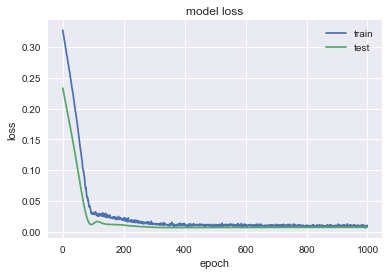

                T
MSE        2.5912
MAE       1.22321
R2        0.57611
MAPE (%)  3.72553


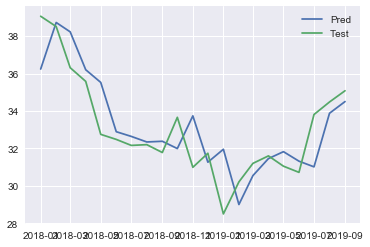

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1258 - val_loss: 0.7411
Epoch 2/1000
0s - loss: 0.1240 - val_loss: 0.7351
Epoch 3/1000
0s - loss: 0.1221 - val_loss: 0.7292
Epoch 4/1000
0s - loss: 0.1205 - val_loss: 0.7233
Epoch 5/1000
0s - loss: 0.1189 - val_loss: 0.7174
Epoch 6/1000
0s - loss: 0.1166 - val_loss: 0.7115
Epoch 7/1000
0s - loss: 0.1152 - val_loss: 0.7056
Epoch 8/1000
0s - loss: 0.1134 - val_loss: 0.6996
Epoch 9/1000
0s - loss: 0.1116 - val_loss: 0.6937
Epoch 10/1000
0s - loss: 0.1101 - val_loss: 0.6878
Epoch 11/1000
0s - loss: 0.1085 - val_loss: 0.6819
Epoch 12/1000
0s - loss: 0.1069 - val_loss: 0.6760
Epoch 13/1000
0s - loss: 0.1049 - val_loss: 0.6700
Epoch 14/1000
0s - loss: 0.1033 - val_loss: 0.6640
Epoch 15/1000
0s - loss: 0.1017 - val_loss: 0.6580
Epoch 16/1000
0s - loss: 0.0995 - val_loss: 0.6519
Epoch 17/1000
0s - loss: 0.0986 - val_loss: 0.6458
Epoch 18/1000
0s - loss: 0.0964 - val_loss: 0.6397
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0099 - val_loss: 0.0867
Epoch 171/1000
0s - loss: 0.0103 - val_loss: 0.0858
Epoch 172/1000
0s - loss: 0.0115 - val_loss: 0.0849
Epoch 173/1000
0s - loss: 0.0104 - val_loss: 0.0839
Epoch 174/1000
0s - loss: 0.0118 - val_loss: 0.0829
Epoch 175/1000
0s - loss: 0.0104 - val_loss: 0.0818
Epoch 176/1000
0s - loss: 0.0107 - val_loss: 0.0807
Epoch 177/1000
0s - loss: 0.0114 - val_loss: 0.0797
Epoch 178/1000
0s - loss: 0.0114 - val_loss: 0.0787
Epoch 179/1000
0s - loss: 0.0097 - val_loss: 0.0776
Epoch 180/1000
0s - loss: 0.0091 - val_loss: 0.0766
Epoch 181/1000
0s - loss: 0.0109 - val_loss: 0.0756
Epoch 182/1000
0s - loss: 0.0100 - val_loss: 0.0745
Epoch 183/1000
0s - loss: 0.0100 - val_loss: 0.0734
Epoch 184/1000
0s - loss: 0.0090 - val_loss: 0.0722
Epoch 185/1000
0s - loss: 0.0085 - val_loss: 0.0710
Epoch 186/1000
0s - loss: 0.0096 - val_loss: 0.0699
Epoch 187/1000
0s - loss: 0.0107 - val_loss: 0.0687
Epoch 188/1000
0s - loss: 0.0086 - val_loss: 0.0676
Epoch 189/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0215
Epoch 342/1000
0s - loss: 0.0045 - val_loss: 0.0214
Epoch 343/1000
0s - loss: 0.0046 - val_loss: 0.0211
Epoch 344/1000
0s - loss: 0.0043 - val_loss: 0.0209
Epoch 345/1000
0s - loss: 0.0042 - val_loss: 0.0207
Epoch 346/1000
0s - loss: 0.0043 - val_loss: 0.0205
Epoch 347/1000
0s - loss: 0.0041 - val_loss: 0.0203
Epoch 348/1000
0s - loss: 0.0035 - val_loss: 0.0202
Epoch 349/1000
0s - loss: 0.0045 - val_loss: 0.0201
Epoch 350/1000
0s - loss: 0.0045 - val_loss: 0.0201
Epoch 351/1000
0s - loss: 0.0044 - val_loss: 0.0202
Epoch 352/1000
0s - loss: 0.0045 - val_loss: 0.0204
Epoch 353/1000
0s - loss: 0.0059 - val_loss: 0.0207
Epoch 354/1000
0s - loss: 0.0038 - val_loss: 0.0210
Epoch 355/1000
0s - loss: 0.0040 - val_loss: 0.0213
Epoch 356/1000
0s - loss: 0.0055 - val_loss: 0.0215
Epoch 357/1000
0s - loss: 0.0038 - val_loss: 0.0218
Epoch 358/1000
0s - loss: 0.0036 - val_loss: 0.0221
Epoch 359/1000
0s - loss: 0.0040 - val_loss: 0.0222
Epoch 360/1000
0s - loss: 0

0s - loss: 0.0045 - val_loss: 0.0205
Epoch 514/1000
0s - loss: 0.0042 - val_loss: 0.0202
Epoch 515/1000
0s - loss: 0.0048 - val_loss: 0.0199
Epoch 516/1000
0s - loss: 0.0037 - val_loss: 0.0198
Epoch 517/1000
0s - loss: 0.0035 - val_loss: 0.0196
Epoch 518/1000
0s - loss: 0.0049 - val_loss: 0.0195
Epoch 519/1000
0s - loss: 0.0032 - val_loss: 0.0192
Epoch 520/1000
0s - loss: 0.0043 - val_loss: 0.0190
Epoch 521/1000
0s - loss: 0.0037 - val_loss: 0.0188
Epoch 522/1000
0s - loss: 0.0041 - val_loss: 0.0187
Epoch 523/1000
0s - loss: 0.0043 - val_loss: 0.0187
Epoch 524/1000
0s - loss: 0.0038 - val_loss: 0.0187
Epoch 525/1000
0s - loss: 0.0042 - val_loss: 0.0188
Epoch 526/1000
0s - loss: 0.0043 - val_loss: 0.0188
Epoch 527/1000
0s - loss: 0.0043 - val_loss: 0.0189
Epoch 528/1000
0s - loss: 0.0033 - val_loss: 0.0191
Epoch 529/1000
0s - loss: 0.0051 - val_loss: 0.0192
Epoch 530/1000
0s - loss: 0.0037 - val_loss: 0.0193
Epoch 531/1000
0s - loss: 0.0041 - val_loss: 0.0192
Epoch 532/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0175
Epoch 686/1000
0s - loss: 0.0033 - val_loss: 0.0176
Epoch 687/1000
0s - loss: 0.0047 - val_loss: 0.0178
Epoch 688/1000
0s - loss: 0.0040 - val_loss: 0.0180
Epoch 689/1000
0s - loss: 0.0038 - val_loss: 0.0182
Epoch 690/1000
0s - loss: 0.0041 - val_loss: 0.0183
Epoch 691/1000
0s - loss: 0.0038 - val_loss: 0.0183
Epoch 692/1000
0s - loss: 0.0041 - val_loss: 0.0181
Epoch 693/1000
0s - loss: 0.0037 - val_loss: 0.0179
Epoch 694/1000
0s - loss: 0.0050 - val_loss: 0.0177
Epoch 695/1000
0s - loss: 0.0044 - val_loss: 0.0176
Epoch 696/1000
0s - loss: 0.0042 - val_loss: 0.0176
Epoch 697/1000
0s - loss: 0.0037 - val_loss: 0.0176
Epoch 698/1000
0s - loss: 0.0041 - val_loss: 0.0175
Epoch 699/1000
0s - loss: 0.0041 - val_loss: 0.0174
Epoch 700/1000
0s - loss: 0.0041 - val_loss: 0.0172
Epoch 701/1000
0s - loss: 0.0037 - val_loss: 0.0171
Epoch 702/1000
0s - loss: 0.0043 - val_loss: 0.0170
Epoch 703/1000
0s - loss: 0.0038 - val_loss: 0.0168
Epoch 704/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0146
Epoch 854/1000
0s - loss: 0.0042 - val_loss: 0.0145
Epoch 855/1000
0s - loss: 0.0031 - val_loss: 0.0145
Epoch 856/1000
0s - loss: 0.0034 - val_loss: 0.0146
Epoch 857/1000
0s - loss: 0.0042 - val_loss: 0.0147
Epoch 858/1000
0s - loss: 0.0039 - val_loss: 0.0148
Epoch 859/1000
0s - loss: 0.0041 - val_loss: 0.0149
Epoch 860/1000
0s - loss: 0.0034 - val_loss: 0.0149
Epoch 861/1000
0s - loss: 0.0036 - val_loss: 0.0150
Epoch 862/1000
0s - loss: 0.0039 - val_loss: 0.0151
Epoch 863/1000
0s - loss: 0.0039 - val_loss: 0.0152
Epoch 864/1000
0s - loss: 0.0042 - val_loss: 0.0153
Epoch 865/1000
0s - loss: 0.0034 - val_loss: 0.0152
Epoch 866/1000
0s - loss: 0.0040 - val_loss: 0.0152
Epoch 867/1000
0s - loss: 0.0034 - val_loss: 0.0152
Epoch 868/1000
0s - loss: 0.0038 - val_loss: 0.0150
Epoch 869/1000
0s - loss: 0.0034 - val_loss: 0.0148
Epoch 870/1000
0s - loss: 0.0046 - val_loss: 0.0147
Epoch 871/1000
0s - loss: 0.0041 - val_loss: 0.0145
Epoch 872/1000
0s - loss: 0

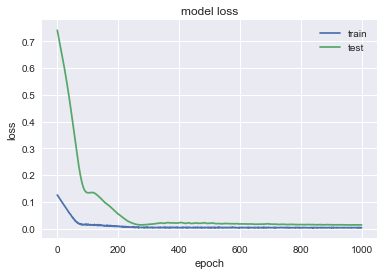

               BBY
MSE        64.0021
MAE        6.45349
R2       -0.147441
MAPE (%)   9.79483


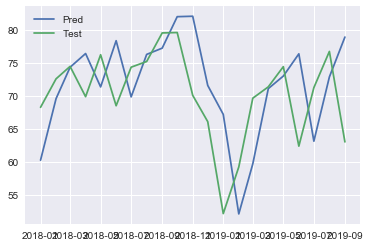

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2393 - val_loss: 0.5657
Epoch 2/1000
0s - loss: 0.2361 - val_loss: 0.5604
Epoch 3/1000
0s - loss: 0.2334 - val_loss: 0.5551
Epoch 4/1000
0s - loss: 0.2305 - val_loss: 0.5499
Epoch 5/1000
0s - loss: 0.2278 - val_loss: 0.5448
Epoch 6/1000
0s - loss: 0.2249 - val_loss: 0.5396
Epoch 7/1000
0s - loss: 0.2217 - val_loss: 0.5345
Epoch 8/1000
0s - loss: 0.2194 - val_loss: 0.5295
Epoch 9/1000
0s - loss: 0.2163 - val_loss: 0.5244
Epoch 10/1000
0s - loss: 0.2137 - val_loss: 0.5194
Epoch 11/1000
0s - loss: 0.2109 - val_loss: 0.5144
Epoch 12/1000
0s - loss: 0.2086 - val_loss: 0.5094
Epoch 13/1000
0s - loss: 0.2051 - val_loss: 0.5044
Epoch 14/1000
0s - loss: 0.2029 - val_loss: 0.4994
Epoch 15/1000
0s - loss: 0.2008 - val_loss: 0.4944
Epoch 16/1000
0s - loss: 0.1973 - val_loss: 0.4894
Epoch 17/1000
0s - loss: 0.1951 - val_loss: 0.4844
Epoch 18/1000
0s - loss: 0.1921 - val_loss: 0.4794
Epoch 19/1000
0s - loss: 0.1

0s - loss: 0.0157 - val_loss: 0.0356
Epoch 162/1000
0s - loss: 0.0163 - val_loss: 0.0353
Epoch 163/1000
0s - loss: 0.0147 - val_loss: 0.0351
Epoch 164/1000
0s - loss: 0.0160 - val_loss: 0.0350
Epoch 165/1000
0s - loss: 0.0156 - val_loss: 0.0348
Epoch 166/1000
0s - loss: 0.0145 - val_loss: 0.0346
Epoch 167/1000
0s - loss: 0.0152 - val_loss: 0.0344
Epoch 168/1000
0s - loss: 0.0150 - val_loss: 0.0343
Epoch 169/1000
0s - loss: 0.0153 - val_loss: 0.0341
Epoch 170/1000
0s - loss: 0.0144 - val_loss: 0.0339
Epoch 171/1000
0s - loss: 0.0159 - val_loss: 0.0336
Epoch 172/1000
0s - loss: 0.0149 - val_loss: 0.0334
Epoch 173/1000
0s - loss: 0.0147 - val_loss: 0.0332
Epoch 174/1000
0s - loss: 0.0146 - val_loss: 0.0330
Epoch 175/1000
0s - loss: 0.0135 - val_loss: 0.0328
Epoch 176/1000
0s - loss: 0.0135 - val_loss: 0.0327
Epoch 177/1000
0s - loss: 0.0173 - val_loss: 0.0324
Epoch 178/1000
0s - loss: 0.0163 - val_loss: 0.0322
Epoch 179/1000
0s - loss: 0.0140 - val_loss: 0.0319
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0062 - val_loss: 0.0073
Epoch 341/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 342/1000
0s - loss: 0.0071 - val_loss: 0.0070
Epoch 343/1000
0s - loss: 0.0060 - val_loss: 0.0070
Epoch 344/1000
0s - loss: 0.0076 - val_loss: 0.0069
Epoch 345/1000
0s - loss: 0.0072 - val_loss: 0.0068
Epoch 346/1000
0s - loss: 0.0072 - val_loss: 0.0068
Epoch 347/1000
0s - loss: 0.0063 - val_loss: 0.0067
Epoch 348/1000
0s - loss: 0.0073 - val_loss: 0.0067
Epoch 349/1000
0s - loss: 0.0086 - val_loss: 0.0066
Epoch 350/1000
0s - loss: 0.0058 - val_loss: 0.0065
Epoch 351/1000
0s - loss: 0.0061 - val_loss: 0.0064
Epoch 352/1000
0s - loss: 0.0065 - val_loss: 0.0063
Epoch 353/1000
0s - loss: 0.0056 - val_loss: 0.0062
Epoch 354/1000
0s - loss: 0.0054 - val_loss: 0.0062
Epoch 355/1000
0s - loss: 0.0065 - val_loss: 0.0062
Epoch 356/1000
0s - loss: 0.0055 - val_loss: 0.0062
Epoch 357/1000
0s - loss: 0.0060 - val_loss: 0.0062
Epoch 358/1000
0s - loss: 0.0053 - val_loss: 0.0061
Epoch 359/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0044
Epoch 503/1000
0s - loss: 0.0051 - val_loss: 0.0044
Epoch 504/1000
0s - loss: 0.0041 - val_loss: 0.0044
Epoch 505/1000
0s - loss: 0.0053 - val_loss: 0.0044
Epoch 506/1000
0s - loss: 0.0056 - val_loss: 0.0044
Epoch 507/1000
0s - loss: 0.0050 - val_loss: 0.0044
Epoch 508/1000
0s - loss: 0.0045 - val_loss: 0.0044
Epoch 509/1000
0s - loss: 0.0048 - val_loss: 0.0044
Epoch 510/1000
0s - loss: 0.0059 - val_loss: 0.0044
Epoch 511/1000
0s - loss: 0.0044 - val_loss: 0.0044
Epoch 512/1000
0s - loss: 0.0055 - val_loss: 0.0044
Epoch 513/1000
0s - loss: 0.0055 - val_loss: 0.0044
Epoch 514/1000
0s - loss: 0.0043 - val_loss: 0.0044
Epoch 515/1000
0s - loss: 0.0045 - val_loss: 0.0044
Epoch 516/1000
0s - loss: 0.0053 - val_loss: 0.0044
Epoch 517/1000
0s - loss: 0.0048 - val_loss: 0.0044
Epoch 518/1000
0s - loss: 0.0040 - val_loss: 0.0044
Epoch 519/1000
0s - loss: 0.0045 - val_loss: 0.0044
Epoch 520/1000
0s - loss: 0.0045 - val_loss: 0.0044
Epoch 521/1000
0s - loss: 0

0s - loss: 0.0043 - val_loss: 0.0043
Epoch 662/1000
0s - loss: 0.0048 - val_loss: 0.0043
Epoch 663/1000
0s - loss: 0.0039 - val_loss: 0.0043
Epoch 664/1000
0s - loss: 0.0045 - val_loss: 0.0043
Epoch 665/1000
0s - loss: 0.0045 - val_loss: 0.0043
Epoch 666/1000
0s - loss: 0.0047 - val_loss: 0.0043
Epoch 667/1000
0s - loss: 0.0043 - val_loss: 0.0043
Epoch 668/1000
0s - loss: 0.0042 - val_loss: 0.0043
Epoch 669/1000
0s - loss: 0.0048 - val_loss: 0.0043
Epoch 670/1000
0s - loss: 0.0039 - val_loss: 0.0043
Epoch 671/1000
0s - loss: 0.0038 - val_loss: 0.0043
Epoch 672/1000
0s - loss: 0.0054 - val_loss: 0.0043
Epoch 673/1000
0s - loss: 0.0039 - val_loss: 0.0043
Epoch 674/1000
0s - loss: 0.0041 - val_loss: 0.0043
Epoch 675/1000
0s - loss: 0.0051 - val_loss: 0.0043
Epoch 676/1000
0s - loss: 0.0044 - val_loss: 0.0043
Epoch 677/1000
0s - loss: 0.0053 - val_loss: 0.0043
Epoch 678/1000
0s - loss: 0.0052 - val_loss: 0.0043
Epoch 679/1000
0s - loss: 0.0038 - val_loss: 0.0043
Epoch 680/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0042
Epoch 839/1000
0s - loss: 0.0049 - val_loss: 0.0042
Epoch 840/1000
0s - loss: 0.0045 - val_loss: 0.0042
Epoch 841/1000
0s - loss: 0.0035 - val_loss: 0.0042
Epoch 842/1000
0s - loss: 0.0042 - val_loss: 0.0042
Epoch 843/1000
0s - loss: 0.0035 - val_loss: 0.0042
Epoch 844/1000
0s - loss: 0.0040 - val_loss: 0.0042
Epoch 845/1000
0s - loss: 0.0042 - val_loss: 0.0042
Epoch 846/1000
0s - loss: 0.0041 - val_loss: 0.0042
Epoch 847/1000
0s - loss: 0.0044 - val_loss: 0.0042
Epoch 848/1000
0s - loss: 0.0041 - val_loss: 0.0042
Epoch 849/1000
0s - loss: 0.0044 - val_loss: 0.0042
Epoch 850/1000
0s - loss: 0.0037 - val_loss: 0.0042
Epoch 851/1000
0s - loss: 0.0044 - val_loss: 0.0042
Epoch 852/1000
0s - loss: 0.0038 - val_loss: 0.0043
Epoch 853/1000
0s - loss: 0.0047 - val_loss: 0.0043
Epoch 854/1000
0s - loss: 0.0038 - val_loss: 0.0043
Epoch 855/1000
0s - loss: 0.0046 - val_loss: 0.0043
Epoch 856/1000
0s - loss: 0.0044 - val_loss: 0.0043
Epoch 857/1000
0s - loss: 0

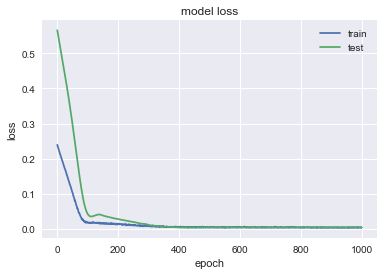

                KO
MSE        3.88287
MAE        1.68784
R2        0.502161
MAPE (%)   3.57517


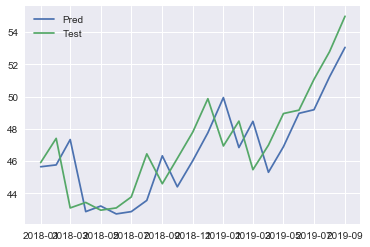

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3187 - val_loss: 0.0455
Epoch 2/1000
0s - loss: 0.3148 - val_loss: 0.0444
Epoch 3/1000
0s - loss: 0.3116 - val_loss: 0.0434
Epoch 4/1000
0s - loss: 0.3074 - val_loss: 0.0423
Epoch 5/1000
0s - loss: 0.3045 - val_loss: 0.0412
Epoch 6/1000
0s - loss: 0.3017 - val_loss: 0.0402
Epoch 7/1000
0s - loss: 0.2980 - val_loss: 0.0392
Epoch 8/1000
0s - loss: 0.2949 - val_loss: 0.0382
Epoch 9/1000
0s - loss: 0.2906 - val_loss: 0.0372
Epoch 10/1000
0s - loss: 0.2872 - val_loss: 0.0362
Epoch 11/1000
0s - loss: 0.2845 - val_loss: 0.0352
Epoch 12/1000
0s - loss: 0.2809 - val_loss: 0.0342
Epoch 13/1000
0s - loss: 0.2777 - val_loss: 0.0333
Epoch 14/1000
0s - loss: 0.2732 - val_loss: 0.0323
Epoch 15/1000
0s - loss: 0.2694 - val_loss: 0.0314
Epoch 16/1000
0s - loss: 0.2668 - val_loss: 0.0305
Epoch 17/1000
0s - loss: 0.2632 - val_loss: 0.0296
Epoch 18/1000
0s - loss: 0.2598 - val_loss: 0.0287
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0214 - val_loss: 0.0410
Epoch 164/1000
0s - loss: 0.0228 - val_loss: 0.0408
Epoch 165/1000
0s - loss: 0.0236 - val_loss: 0.0406
Epoch 166/1000
0s - loss: 0.0225 - val_loss: 0.0404
Epoch 167/1000
0s - loss: 0.0227 - val_loss: 0.0402
Epoch 168/1000
0s - loss: 0.0221 - val_loss: 0.0399
Epoch 169/1000
0s - loss: 0.0186 - val_loss: 0.0397
Epoch 170/1000
0s - loss: 0.0224 - val_loss: 0.0395
Epoch 171/1000
0s - loss: 0.0203 - val_loss: 0.0392
Epoch 172/1000
0s - loss: 0.0213 - val_loss: 0.0389
Epoch 173/1000
0s - loss: 0.0224 - val_loss: 0.0387
Epoch 174/1000
0s - loss: 0.0214 - val_loss: 0.0384
Epoch 175/1000
0s - loss: 0.0185 - val_loss: 0.0382
Epoch 176/1000
0s - loss: 0.0199 - val_loss: 0.0379
Epoch 177/1000
0s - loss: 0.0203 - val_loss: 0.0376
Epoch 178/1000
0s - loss: 0.0218 - val_loss: 0.0373
Epoch 179/1000
0s - loss: 0.0191 - val_loss: 0.0371
Epoch 180/1000
0s - loss: 0.0206 - val_loss: 0.0368
Epoch 181/1000
0s - loss: 0.0209 - val_loss: 0.0366
Epoch 182/1000
0s - loss: 0

0s - loss: 0.0091 - val_loss: 0.0091
Epoch 329/1000
0s - loss: 0.0111 - val_loss: 0.0090
Epoch 330/1000
0s - loss: 0.0089 - val_loss: 0.0090
Epoch 331/1000
0s - loss: 0.0115 - val_loss: 0.0089
Epoch 332/1000
0s - loss: 0.0104 - val_loss: 0.0088
Epoch 333/1000
0s - loss: 0.0110 - val_loss: 0.0087
Epoch 334/1000
0s - loss: 0.0100 - val_loss: 0.0086
Epoch 335/1000
0s - loss: 0.0122 - val_loss: 0.0085
Epoch 336/1000
0s - loss: 0.0107 - val_loss: 0.0084
Epoch 337/1000
0s - loss: 0.0081 - val_loss: 0.0083
Epoch 338/1000
0s - loss: 0.0107 - val_loss: 0.0082
Epoch 339/1000
0s - loss: 0.0112 - val_loss: 0.0081
Epoch 340/1000
0s - loss: 0.0097 - val_loss: 0.0081
Epoch 341/1000
0s - loss: 0.0095 - val_loss: 0.0081
Epoch 342/1000
0s - loss: 0.0117 - val_loss: 0.0080
Epoch 343/1000
0s - loss: 0.0085 - val_loss: 0.0080
Epoch 344/1000
0s - loss: 0.0085 - val_loss: 0.0080
Epoch 345/1000
0s - loss: 0.0094 - val_loss: 0.0079
Epoch 346/1000
0s - loss: 0.0141 - val_loss: 0.0079
Epoch 347/1000
0s - loss: 0

0s - loss: 0.0118 - val_loss: 0.0060
Epoch 513/1000
0s - loss: 0.0102 - val_loss: 0.0060
Epoch 514/1000
0s - loss: 0.0082 - val_loss: 0.0060
Epoch 515/1000
0s - loss: 0.0099 - val_loss: 0.0060
Epoch 516/1000
0s - loss: 0.0099 - val_loss: 0.0060
Epoch 517/1000
0s - loss: 0.0092 - val_loss: 0.0059
Epoch 518/1000
0s - loss: 0.0100 - val_loss: 0.0059
Epoch 519/1000
0s - loss: 0.0089 - val_loss: 0.0059
Epoch 520/1000
0s - loss: 0.0098 - val_loss: 0.0059
Epoch 521/1000
0s - loss: 0.0096 - val_loss: 0.0059
Epoch 522/1000
0s - loss: 0.0101 - val_loss: 0.0059
Epoch 523/1000
0s - loss: 0.0095 - val_loss: 0.0059
Epoch 524/1000
0s - loss: 0.0114 - val_loss: 0.0059
Epoch 525/1000
0s - loss: 0.0094 - val_loss: 0.0059
Epoch 526/1000
0s - loss: 0.0113 - val_loss: 0.0059
Epoch 527/1000
0s - loss: 0.0106 - val_loss: 0.0060
Epoch 528/1000
0s - loss: 0.0111 - val_loss: 0.0060
Epoch 529/1000
0s - loss: 0.0104 - val_loss: 0.0061
Epoch 530/1000
0s - loss: 0.0089 - val_loss: 0.0061
Epoch 531/1000
0s - loss: 0

0s - loss: 0.0104 - val_loss: 0.0058
Epoch 680/1000
0s - loss: 0.0093 - val_loss: 0.0058
Epoch 681/1000
0s - loss: 0.0098 - val_loss: 0.0058
Epoch 682/1000
0s - loss: 0.0104 - val_loss: 0.0059
Epoch 683/1000
0s - loss: 0.0094 - val_loss: 0.0059
Epoch 684/1000
0s - loss: 0.0101 - val_loss: 0.0059
Epoch 685/1000
0s - loss: 0.0105 - val_loss: 0.0059
Epoch 686/1000
0s - loss: 0.0106 - val_loss: 0.0060
Epoch 687/1000
0s - loss: 0.0085 - val_loss: 0.0060
Epoch 688/1000
0s - loss: 0.0090 - val_loss: 0.0060
Epoch 689/1000
0s - loss: 0.0100 - val_loss: 0.0060
Epoch 690/1000
0s - loss: 0.0112 - val_loss: 0.0060
Epoch 691/1000
0s - loss: 0.0089 - val_loss: 0.0060
Epoch 692/1000
0s - loss: 0.0110 - val_loss: 0.0060
Epoch 693/1000
0s - loss: 0.0101 - val_loss: 0.0059
Epoch 694/1000
0s - loss: 0.0109 - val_loss: 0.0059
Epoch 695/1000
0s - loss: 0.0102 - val_loss: 0.0058
Epoch 696/1000
0s - loss: 0.0072 - val_loss: 0.0058
Epoch 697/1000
0s - loss: 0.0098 - val_loss: 0.0058
Epoch 698/1000
0s - loss: 0

0s - loss: 0.0102 - val_loss: 0.0054
Epoch 843/1000
0s - loss: 0.0078 - val_loss: 0.0054
Epoch 844/1000
0s - loss: 0.0107 - val_loss: 0.0054
Epoch 845/1000
0s - loss: 0.0087 - val_loss: 0.0054
Epoch 846/1000
0s - loss: 0.0075 - val_loss: 0.0054
Epoch 847/1000
0s - loss: 0.0067 - val_loss: 0.0054
Epoch 848/1000
0s - loss: 0.0080 - val_loss: 0.0054
Epoch 849/1000
0s - loss: 0.0095 - val_loss: 0.0055
Epoch 850/1000
0s - loss: 0.0094 - val_loss: 0.0055
Epoch 851/1000
0s - loss: 0.0087 - val_loss: 0.0056
Epoch 852/1000
0s - loss: 0.0099 - val_loss: 0.0057
Epoch 853/1000
0s - loss: 0.0087 - val_loss: 0.0058
Epoch 854/1000
0s - loss: 0.0084 - val_loss: 0.0058
Epoch 855/1000
0s - loss: 0.0106 - val_loss: 0.0058
Epoch 856/1000
0s - loss: 0.0112 - val_loss: 0.0058
Epoch 857/1000
0s - loss: 0.0088 - val_loss: 0.0058
Epoch 858/1000
0s - loss: 0.0097 - val_loss: 0.0058
Epoch 859/1000
0s - loss: 0.0083 - val_loss: 0.0058
Epoch 860/1000
0s - loss: 0.0073 - val_loss: 0.0057
Epoch 861/1000
0s - loss: 0

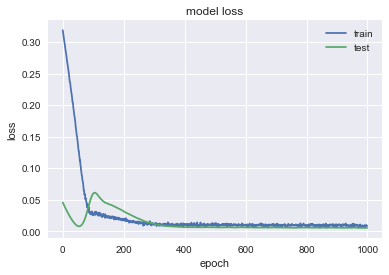

                FTI
MSE         9.50474
MAE         2.38313
R2        0.0282047
MAPE (%)    9.63024


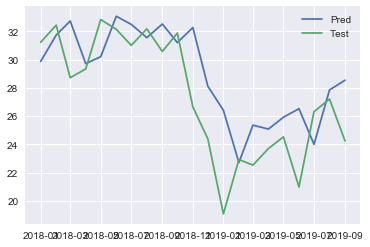

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1527 - val_loss: 0.6328
Epoch 2/1000
0s - loss: 0.1508 - val_loss: 0.6265
Epoch 3/1000
0s - loss: 0.1481 - val_loss: 0.6201
Epoch 4/1000
0s - loss: 0.1463 - val_loss: 0.6138
Epoch 5/1000
0s - loss: 0.1438 - val_loss: 0.6076
Epoch 6/1000
0s - loss: 0.1413 - val_loss: 0.6013
Epoch 7/1000
0s - loss: 0.1393 - val_loss: 0.5951
Epoch 8/1000
0s - loss: 0.1376 - val_loss: 0.5889
Epoch 9/1000
0s - loss: 0.1353 - val_loss: 0.5827
Epoch 10/1000
0s - loss: 0.1332 - val_loss: 0.5765
Epoch 11/1000
0s - loss: 0.1307 - val_loss: 0.5703
Epoch 12/1000
0s - loss: 0.1287 - val_loss: 0.5641
Epoch 13/1000
0s - loss: 0.1264 - val_loss: 0.5579
Epoch 14/1000
0s - loss: 0.1245 - val_loss: 0.5517
Epoch 15/1000
0s - loss: 0.1226 - val_loss: 0.5454
Epoch 16/1000
0s - loss: 0.1203 - val_loss: 0.5391
Epoch 17/1000
0s - loss: 0.1184 - val_loss: 0.5328
Epoch 18/1000
0s - loss: 0.1159 - val_loss: 0.5265
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0109 - val_loss: 0.0218
Epoch 168/1000
0s - loss: 0.0110 - val_loss: 0.0209
Epoch 169/1000
0s - loss: 0.0117 - val_loss: 0.0201
Epoch 170/1000
0s - loss: 0.0108 - val_loss: 0.0193
Epoch 171/1000
0s - loss: 0.0101 - val_loss: 0.0186
Epoch 172/1000
0s - loss: 0.0105 - val_loss: 0.0179
Epoch 173/1000
0s - loss: 0.0090 - val_loss: 0.0172
Epoch 174/1000
0s - loss: 0.0101 - val_loss: 0.0165
Epoch 175/1000
0s - loss: 0.0094 - val_loss: 0.0158
Epoch 176/1000
0s - loss: 0.0078 - val_loss: 0.0151
Epoch 177/1000
0s - loss: 0.0085 - val_loss: 0.0145
Epoch 178/1000
0s - loss: 0.0081 - val_loss: 0.0141
Epoch 179/1000
0s - loss: 0.0080 - val_loss: 0.0136
Epoch 180/1000
0s - loss: 0.0076 - val_loss: 0.0132
Epoch 181/1000
0s - loss: 0.0087 - val_loss: 0.0128
Epoch 182/1000
0s - loss: 0.0075 - val_loss: 0.0124
Epoch 183/1000
0s - loss: 0.0085 - val_loss: 0.0120
Epoch 184/1000
0s - loss: 0.0073 - val_loss: 0.0117
Epoch 185/1000
0s - loss: 0.0077 - val_loss: 0.0114
Epoch 186/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0210
Epoch 336/1000
0s - loss: 0.0031 - val_loss: 0.0210
Epoch 337/1000
0s - loss: 0.0033 - val_loss: 0.0212
Epoch 338/1000
0s - loss: 0.0031 - val_loss: 0.0214
Epoch 339/1000
0s - loss: 0.0028 - val_loss: 0.0217
Epoch 340/1000
0s - loss: 0.0038 - val_loss: 0.0221
Epoch 341/1000
0s - loss: 0.0032 - val_loss: 0.0224
Epoch 342/1000
0s - loss: 0.0037 - val_loss: 0.0226
Epoch 343/1000
0s - loss: 0.0030 - val_loss: 0.0225
Epoch 344/1000
0s - loss: 0.0027 - val_loss: 0.0223
Epoch 345/1000
0s - loss: 0.0033 - val_loss: 0.0220
Epoch 346/1000
0s - loss: 0.0028 - val_loss: 0.0217
Epoch 347/1000
0s - loss: 0.0031 - val_loss: 0.0213
Epoch 348/1000
0s - loss: 0.0031 - val_loss: 0.0210
Epoch 349/1000
0s - loss: 0.0031 - val_loss: 0.0206
Epoch 350/1000
0s - loss: 0.0038 - val_loss: 0.0204
Epoch 351/1000
0s - loss: 0.0034 - val_loss: 0.0204
Epoch 352/1000
0s - loss: 0.0031 - val_loss: 0.0203
Epoch 353/1000
0s - loss: 0.0032 - val_loss: 0.0202
Epoch 354/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0173
Epoch 505/1000
0s - loss: 0.0041 - val_loss: 0.0173
Epoch 506/1000
0s - loss: 0.0032 - val_loss: 0.0172
Epoch 507/1000
0s - loss: 0.0030 - val_loss: 0.0172
Epoch 508/1000
0s - loss: 0.0031 - val_loss: 0.0173
Epoch 509/1000
0s - loss: 0.0028 - val_loss: 0.0176
Epoch 510/1000
0s - loss: 0.0030 - val_loss: 0.0177
Epoch 511/1000
0s - loss: 0.0041 - val_loss: 0.0178
Epoch 512/1000
0s - loss: 0.0034 - val_loss: 0.0177
Epoch 513/1000
0s - loss: 0.0026 - val_loss: 0.0177
Epoch 514/1000
0s - loss: 0.0034 - val_loss: 0.0177
Epoch 515/1000
0s - loss: 0.0040 - val_loss: 0.0176
Epoch 516/1000
0s - loss: 0.0039 - val_loss: 0.0176
Epoch 517/1000
0s - loss: 0.0039 - val_loss: 0.0176
Epoch 518/1000
0s - loss: 0.0027 - val_loss: 0.0177
Epoch 519/1000
0s - loss: 0.0038 - val_loss: 0.0179
Epoch 520/1000
0s - loss: 0.0030 - val_loss: 0.0179
Epoch 521/1000
0s - loss: 0.0043 - val_loss: 0.0178
Epoch 522/1000
0s - loss: 0.0029 - val_loss: 0.0175
Epoch 523/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0149
Epoch 673/1000
0s - loss: 0.0033 - val_loss: 0.0150
Epoch 674/1000
0s - loss: 0.0028 - val_loss: 0.0151
Epoch 675/1000
0s - loss: 0.0031 - val_loss: 0.0150
Epoch 676/1000
0s - loss: 0.0028 - val_loss: 0.0148
Epoch 677/1000
0s - loss: 0.0033 - val_loss: 0.0148
Epoch 678/1000
0s - loss: 0.0025 - val_loss: 0.0148
Epoch 679/1000
0s - loss: 0.0031 - val_loss: 0.0148
Epoch 680/1000
0s - loss: 0.0029 - val_loss: 0.0149
Epoch 681/1000
0s - loss: 0.0031 - val_loss: 0.0148
Epoch 682/1000
0s - loss: 0.0030 - val_loss: 0.0148
Epoch 683/1000
0s - loss: 0.0028 - val_loss: 0.0146
Epoch 684/1000
0s - loss: 0.0033 - val_loss: 0.0144
Epoch 685/1000
0s - loss: 0.0030 - val_loss: 0.0143
Epoch 686/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 687/1000
0s - loss: 0.0034 - val_loss: 0.0141
Epoch 688/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 689/1000
0s - loss: 0.0028 - val_loss: 0.0140
Epoch 690/1000
0s - loss: 0.0034 - val_loss: 0.0140
Epoch 691/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0127
Epoch 842/1000
0s - loss: 0.0027 - val_loss: 0.0125
Epoch 843/1000
0s - loss: 0.0026 - val_loss: 0.0125
Epoch 844/1000
0s - loss: 0.0026 - val_loss: 0.0125
Epoch 845/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 846/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 847/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 848/1000
0s - loss: 0.0027 - val_loss: 0.0124
Epoch 849/1000
0s - loss: 0.0028 - val_loss: 0.0123
Epoch 850/1000
0s - loss: 0.0024 - val_loss: 0.0123
Epoch 851/1000
0s - loss: 0.0029 - val_loss: 0.0123
Epoch 852/1000
0s - loss: 0.0029 - val_loss: 0.0124
Epoch 853/1000
0s - loss: 0.0027 - val_loss: 0.0126
Epoch 854/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 855/1000
0s - loss: 0.0023 - val_loss: 0.0128
Epoch 856/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 857/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 858/1000
0s - loss: 0.0025 - val_loss: 0.0124
Epoch 859/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 860/1000
0s - loss: 0

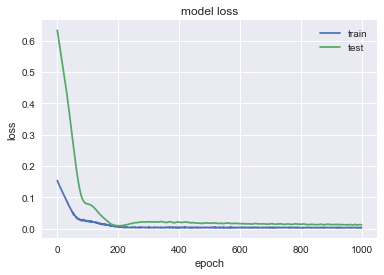

               BLK
MSE        2030.41
MAE        38.0074
R2        0.351366
MAPE (%)   8.33491


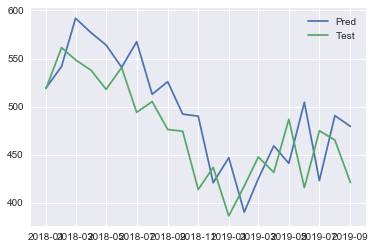

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3541 - val_loss: 0.4048
Epoch 2/1000
0s - loss: 0.3504 - val_loss: 0.3998
Epoch 3/1000
0s - loss: 0.3458 - val_loss: 0.3949
Epoch 4/1000
0s - loss: 0.3411 - val_loss: 0.3900
Epoch 5/1000
0s - loss: 0.3371 - val_loss: 0.3851
Epoch 6/1000
0s - loss: 0.3332 - val_loss: 0.3802
Epoch 7/1000
0s - loss: 0.3294 - val_loss: 0.3754
Epoch 8/1000
0s - loss: 0.3248 - val_loss: 0.3705
Epoch 9/1000
0s - loss: 0.3209 - val_loss: 0.3657
Epoch 10/1000
0s - loss: 0.3171 - val_loss: 0.3610
Epoch 11/1000
0s - loss: 0.3126 - val_loss: 0.3562
Epoch 12/1000
0s - loss: 0.3088 - val_loss: 0.3515
Epoch 13/1000
0s - loss: 0.3037 - val_loss: 0.3467
Epoch 14/1000
0s - loss: 0.3009 - val_loss: 0.3420
Epoch 15/1000
0s - loss: 0.2965 - val_loss: 0.3372
Epoch 16/1000
0s - loss: 0.2928 - val_loss: 0.3325
Epoch 17/1000
0s - loss: 0.2889 - val_loss: 0.3278
Epoch 18/1000
0s - loss: 0.2834 - val_loss: 0.3230
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0209 - val_loss: 0.0129
Epoch 167/1000
0s - loss: 0.0222 - val_loss: 0.0128
Epoch 168/1000
0s - loss: 0.0202 - val_loss: 0.0128
Epoch 169/1000
0s - loss: 0.0213 - val_loss: 0.0128
Epoch 170/1000
0s - loss: 0.0223 - val_loss: 0.0128
Epoch 171/1000
0s - loss: 0.0212 - val_loss: 0.0128
Epoch 172/1000
0s - loss: 0.0220 - val_loss: 0.0127
Epoch 173/1000
0s - loss: 0.0200 - val_loss: 0.0127
Epoch 174/1000
0s - loss: 0.0181 - val_loss: 0.0127
Epoch 175/1000
0s - loss: 0.0199 - val_loss: 0.0127
Epoch 176/1000
0s - loss: 0.0186 - val_loss: 0.0127
Epoch 177/1000
0s - loss: 0.0231 - val_loss: 0.0127
Epoch 178/1000
0s - loss: 0.0220 - val_loss: 0.0126
Epoch 179/1000
0s - loss: 0.0215 - val_loss: 0.0126
Epoch 180/1000
0s - loss: 0.0190 - val_loss: 0.0126
Epoch 181/1000
0s - loss: 0.0196 - val_loss: 0.0126
Epoch 182/1000
0s - loss: 0.0199 - val_loss: 0.0126
Epoch 183/1000
0s - loss: 0.0168 - val_loss: 0.0125
Epoch 184/1000
0s - loss: 0.0174 - val_loss: 0.0125
Epoch 185/1000
0s - loss: 0

0s - loss: 0.0085 - val_loss: 0.0141
Epoch 335/1000
0s - loss: 0.0079 - val_loss: 0.0142
Epoch 336/1000
0s - loss: 0.0090 - val_loss: 0.0142
Epoch 337/1000
0s - loss: 0.0088 - val_loss: 0.0142
Epoch 338/1000
0s - loss: 0.0091 - val_loss: 0.0142
Epoch 339/1000
0s - loss: 0.0069 - val_loss: 0.0142
Epoch 340/1000
0s - loss: 0.0091 - val_loss: 0.0142
Epoch 341/1000
0s - loss: 0.0102 - val_loss: 0.0141
Epoch 342/1000
0s - loss: 0.0073 - val_loss: 0.0141
Epoch 343/1000
0s - loss: 0.0065 - val_loss: 0.0141
Epoch 344/1000
0s - loss: 0.0071 - val_loss: 0.0141
Epoch 345/1000
0s - loss: 0.0082 - val_loss: 0.0141
Epoch 346/1000
0s - loss: 0.0067 - val_loss: 0.0141
Epoch 347/1000
0s - loss: 0.0069 - val_loss: 0.0141
Epoch 348/1000
0s - loss: 0.0070 - val_loss: 0.0141
Epoch 349/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 350/1000
0s - loss: 0.0084 - val_loss: 0.0141
Epoch 351/1000
0s - loss: 0.0091 - val_loss: 0.0141
Epoch 352/1000
0s - loss: 0.0074 - val_loss: 0.0141
Epoch 353/1000
0s - loss: 0

0s - loss: 0.0083 - val_loss: 0.0143
Epoch 505/1000
0s - loss: 0.0054 - val_loss: 0.0143
Epoch 506/1000
0s - loss: 0.0061 - val_loss: 0.0143
Epoch 507/1000
0s - loss: 0.0081 - val_loss: 0.0143
Epoch 508/1000
0s - loss: 0.0077 - val_loss: 0.0143
Epoch 509/1000
0s - loss: 0.0057 - val_loss: 0.0143
Epoch 510/1000
0s - loss: 0.0067 - val_loss: 0.0143
Epoch 511/1000
0s - loss: 0.0079 - val_loss: 0.0143
Epoch 512/1000
0s - loss: 0.0069 - val_loss: 0.0143
Epoch 513/1000
0s - loss: 0.0087 - val_loss: 0.0143
Epoch 514/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 515/1000
0s - loss: 0.0071 - val_loss: 0.0143
Epoch 516/1000
0s - loss: 0.0081 - val_loss: 0.0143
Epoch 517/1000
0s - loss: 0.0066 - val_loss: 0.0143
Epoch 518/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 519/1000
0s - loss: 0.0063 - val_loss: 0.0143
Epoch 520/1000
0s - loss: 0.0070 - val_loss: 0.0143
Epoch 521/1000
0s - loss: 0.0065 - val_loss: 0.0142
Epoch 522/1000
0s - loss: 0.0070 - val_loss: 0.0142
Epoch 523/1000
0s - loss: 0

0s - loss: 0.0071 - val_loss: 0.0142
Epoch 675/1000
0s - loss: 0.0061 - val_loss: 0.0142
Epoch 676/1000
0s - loss: 0.0088 - val_loss: 0.0142
Epoch 677/1000
0s - loss: 0.0060 - val_loss: 0.0142
Epoch 678/1000
0s - loss: 0.0075 - val_loss: 0.0142
Epoch 679/1000
0s - loss: 0.0067 - val_loss: 0.0142
Epoch 680/1000
0s - loss: 0.0060 - val_loss: 0.0142
Epoch 681/1000
0s - loss: 0.0078 - val_loss: 0.0142
Epoch 682/1000
0s - loss: 0.0076 - val_loss: 0.0142
Epoch 683/1000
0s - loss: 0.0064 - val_loss: 0.0142
Epoch 684/1000
0s - loss: 0.0055 - val_loss: 0.0142
Epoch 685/1000
0s - loss: 0.0081 - val_loss: 0.0142
Epoch 686/1000
0s - loss: 0.0070 - val_loss: 0.0142
Epoch 687/1000
0s - loss: 0.0072 - val_loss: 0.0142
Epoch 688/1000
0s - loss: 0.0066 - val_loss: 0.0141
Epoch 689/1000
0s - loss: 0.0057 - val_loss: 0.0141
Epoch 690/1000
0s - loss: 0.0065 - val_loss: 0.0141
Epoch 691/1000
0s - loss: 0.0076 - val_loss: 0.0141
Epoch 692/1000
0s - loss: 0.0064 - val_loss: 0.0141
Epoch 693/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0142
Epoch 846/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 847/1000
0s - loss: 0.0075 - val_loss: 0.0141
Epoch 848/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 849/1000
0s - loss: 0.0066 - val_loss: 0.0141
Epoch 850/1000
0s - loss: 0.0071 - val_loss: 0.0141
Epoch 851/1000
0s - loss: 0.0053 - val_loss: 0.0141
Epoch 852/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 853/1000
0s - loss: 0.0059 - val_loss: 0.0141
Epoch 854/1000
0s - loss: 0.0061 - val_loss: 0.0141
Epoch 855/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 856/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 857/1000
0s - loss: 0.0062 - val_loss: 0.0141
Epoch 858/1000
0s - loss: 0.0049 - val_loss: 0.0141
Epoch 859/1000
0s - loss: 0.0051 - val_loss: 0.0141
Epoch 860/1000
0s - loss: 0.0049 - val_loss: 0.0141
Epoch 861/1000
0s - loss: 0.0056 - val_loss: 0.0141
Epoch 862/1000
0s - loss: 0.0070 - val_loss: 0.0141
Epoch 863/1000
0s - loss: 0.0058 - val_loss: 0.0141
Epoch 864/1000
0s - loss: 0

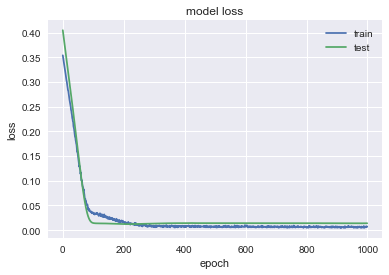

               DVA
MSE        42.2816
MAE        4.93089
R2        0.347533
MAPE (%)    8.3603


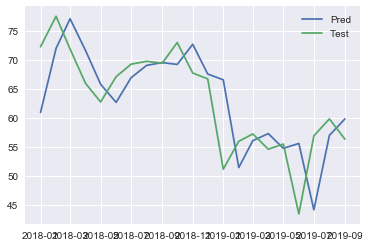

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0389 - val_loss: 0.5868
Epoch 2/1000
0s - loss: 0.0381 - val_loss: 0.5817
Epoch 3/1000
0s - loss: 0.0373 - val_loss: 0.5767
Epoch 4/1000
0s - loss: 0.0366 - val_loss: 0.5717
Epoch 5/1000
0s - loss: 0.0357 - val_loss: 0.5666
Epoch 6/1000
0s - loss: 0.0349 - val_loss: 0.5616
Epoch 7/1000
0s - loss: 0.0341 - val_loss: 0.5567
Epoch 8/1000
0s - loss: 0.0333 - val_loss: 0.5517
Epoch 9/1000
0s - loss: 0.0325 - val_loss: 0.5467
Epoch 10/1000
0s - loss: 0.0320 - val_loss: 0.5417
Epoch 11/1000
0s - loss: 0.0310 - val_loss: 0.5367
Epoch 12/1000
0s - loss: 0.0306 - val_loss: 0.5317
Epoch 13/1000
0s - loss: 0.0299 - val_loss: 0.5266
Epoch 14/1000
0s - loss: 0.0291 - val_loss: 0.5216
Epoch 15/1000
0s - loss: 0.0284 - val_loss: 0.5165
Epoch 16/1000
0s - loss: 0.0277 - val_loss: 0.5114
Epoch 17/1000
0s - loss: 0.0272 - val_loss: 0.5063
Epoch 18/1000
0s - loss: 0.0264 - val_loss: 0.5012
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0021 - val_loss: 0.0171
Epoch 171/1000
0s - loss: 0.0022 - val_loss: 0.0158
Epoch 172/1000
0s - loss: 0.0018 - val_loss: 0.0147
Epoch 173/1000
0s - loss: 0.0016 - val_loss: 0.0137
Epoch 174/1000
0s - loss: 0.0021 - val_loss: 0.0128
Epoch 175/1000
0s - loss: 0.0017 - val_loss: 0.0120
Epoch 176/1000
0s - loss: 0.0019 - val_loss: 0.0114
Epoch 177/1000
0s - loss: 0.0015 - val_loss: 0.0109
Epoch 178/1000
0s - loss: 0.0017 - val_loss: 0.0105
Epoch 179/1000
0s - loss: 0.0014 - val_loss: 0.0102
Epoch 180/1000
0s - loss: 0.0010 - val_loss: 0.0101
Epoch 181/1000
0s - loss: 0.0012 - val_loss: 0.0100
Epoch 182/1000
0s - loss: 0.0015 - val_loss: 0.0100
Epoch 183/1000
0s - loss: 0.0015 - val_loss: 0.0101
Epoch 184/1000
0s - loss: 0.0014 - val_loss: 0.0104
Epoch 185/1000
0s - loss: 0.0012 - val_loss: 0.0107
Epoch 186/1000
0s - loss: 0.0013 - val_loss: 0.0110
Epoch 187/1000
0s - loss: 0.0011 - val_loss: 0.0115
Epoch 188/1000
0s - loss: 9.1870e-04 - val_loss: 0.0120
Epoch 189/1000
0s - los

0s - loss: 8.6037e-04 - val_loss: 0.0313
Epoch 341/1000
0s - loss: 6.5444e-04 - val_loss: 0.0312
Epoch 342/1000
0s - loss: 5.4164e-04 - val_loss: 0.0310
Epoch 343/1000
0s - loss: 9.8771e-04 - val_loss: 0.0308
Epoch 344/1000
0s - loss: 8.6347e-04 - val_loss: 0.0306
Epoch 345/1000
0s - loss: 5.1162e-04 - val_loss: 0.0304
Epoch 346/1000
0s - loss: 8.5250e-04 - val_loss: 0.0301
Epoch 347/1000
0s - loss: 8.1943e-04 - val_loss: 0.0300
Epoch 348/1000
0s - loss: 7.2552e-04 - val_loss: 0.0297
Epoch 349/1000
0s - loss: 7.7955e-04 - val_loss: 0.0295
Epoch 350/1000
0s - loss: 6.5447e-04 - val_loss: 0.0295
Epoch 351/1000
0s - loss: 9.8580e-04 - val_loss: 0.0296
Epoch 352/1000
0s - loss: 7.4634e-04 - val_loss: 0.0300
Epoch 353/1000
0s - loss: 7.5119e-04 - val_loss: 0.0304
Epoch 354/1000
0s - loss: 0.0010 - val_loss: 0.0308
Epoch 355/1000
0s - loss: 6.4422e-04 - val_loss: 0.0307
Epoch 356/1000
0s - loss: 5.7427e-04 - val_loss: 0.0302
Epoch 357/1000
0s - loss: 6.4808e-04 - val_loss: 0.0297
Epoch 358/1

0s - loss: 8.7215e-04 - val_loss: 0.0204
Epoch 511/1000
0s - loss: 6.4917e-04 - val_loss: 0.0201
Epoch 512/1000
0s - loss: 0.0010 - val_loss: 0.0199
Epoch 513/1000
0s - loss: 5.7312e-04 - val_loss: 0.0200
Epoch 514/1000
0s - loss: 9.8213e-04 - val_loss: 0.0203
Epoch 515/1000
0s - loss: 7.0377e-04 - val_loss: 0.0206
Epoch 516/1000
0s - loss: 9.1379e-04 - val_loss: 0.0209
Epoch 517/1000
0s - loss: 7.0240e-04 - val_loss: 0.0212
Epoch 518/1000
0s - loss: 7.9126e-04 - val_loss: 0.0213
Epoch 519/1000
0s - loss: 7.5518e-04 - val_loss: 0.0211
Epoch 520/1000
0s - loss: 7.9711e-04 - val_loss: 0.0212
Epoch 521/1000
0s - loss: 8.6078e-04 - val_loss: 0.0210
Epoch 522/1000
0s - loss: 7.9015e-04 - val_loss: 0.0207
Epoch 523/1000
0s - loss: 6.8583e-04 - val_loss: 0.0205
Epoch 524/1000
0s - loss: 5.5220e-04 - val_loss: 0.0203
Epoch 525/1000
0s - loss: 0.0010 - val_loss: 0.0203
Epoch 526/1000
0s - loss: 7.5103e-04 - val_loss: 0.0201
Epoch 527/1000
0s - loss: 3.8400e-04 - val_loss: 0.0200
Epoch 528/1000


0s - loss: 5.4532e-04 - val_loss: 0.0176
Epoch 678/1000
0s - loss: 6.9036e-04 - val_loss: 0.0173
Epoch 679/1000
0s - loss: 6.1720e-04 - val_loss: 0.0170
Epoch 680/1000
0s - loss: 5.5085e-04 - val_loss: 0.0168
Epoch 681/1000
0s - loss: 5.9875e-04 - val_loss: 0.0168
Epoch 682/1000
0s - loss: 5.9930e-04 - val_loss: 0.0167
Epoch 683/1000
0s - loss: 6.0017e-04 - val_loss: 0.0168
Epoch 684/1000
0s - loss: 7.2218e-04 - val_loss: 0.0168
Epoch 685/1000
0s - loss: 4.2049e-04 - val_loss: 0.0168
Epoch 686/1000
0s - loss: 7.2756e-04 - val_loss: 0.0167
Epoch 687/1000
0s - loss: 9.7913e-04 - val_loss: 0.0169
Epoch 688/1000
0s - loss: 6.6860e-04 - val_loss: 0.0173
Epoch 689/1000
0s - loss: 6.3978e-04 - val_loss: 0.0175
Epoch 690/1000
0s - loss: 0.0010 - val_loss: 0.0177
Epoch 691/1000
0s - loss: 7.6660e-04 - val_loss: 0.0179
Epoch 692/1000
0s - loss: 0.0010 - val_loss: 0.0183
Epoch 693/1000
0s - loss: 7.5955e-04 - val_loss: 0.0184
Epoch 694/1000
0s - loss: 8.2796e-04 - val_loss: 0.0185
Epoch 695/1000


0s - loss: 4.6941e-04 - val_loss: 0.0154
Epoch 844/1000
0s - loss: 6.0751e-04 - val_loss: 0.0155
Epoch 845/1000
0s - loss: 5.2285e-04 - val_loss: 0.0156
Epoch 846/1000
0s - loss: 9.1383e-04 - val_loss: 0.0157
Epoch 847/1000
0s - loss: 8.0982e-04 - val_loss: 0.0158
Epoch 848/1000
0s - loss: 7.1909e-04 - val_loss: 0.0159
Epoch 849/1000
0s - loss: 9.1339e-04 - val_loss: 0.0160
Epoch 850/1000
0s - loss: 6.8944e-04 - val_loss: 0.0160
Epoch 851/1000
0s - loss: 6.0328e-04 - val_loss: 0.0161
Epoch 852/1000
0s - loss: 7.8846e-04 - val_loss: 0.0160
Epoch 853/1000
0s - loss: 5.9367e-04 - val_loss: 0.0156
Epoch 854/1000
0s - loss: 7.8479e-04 - val_loss: 0.0153
Epoch 855/1000
0s - loss: 6.8811e-04 - val_loss: 0.0152
Epoch 856/1000
0s - loss: 7.6524e-04 - val_loss: 0.0153
Epoch 857/1000
0s - loss: 5.9985e-04 - val_loss: 0.0153
Epoch 858/1000
0s - loss: 6.9102e-04 - val_loss: 0.0152
Epoch 859/1000
0s - loss: 6.1428e-04 - val_loss: 0.0151
Epoch 860/1000
0s - loss: 6.4885e-04 - val_loss: 0.0151
Epoch 8

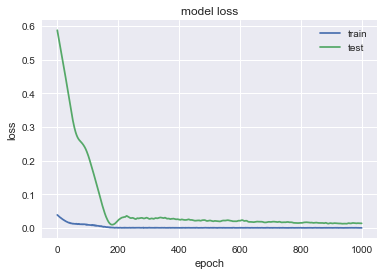

                BA
MSE         2124.4
MAE        36.3367
R2       -0.333843
MAPE (%)   10.3328


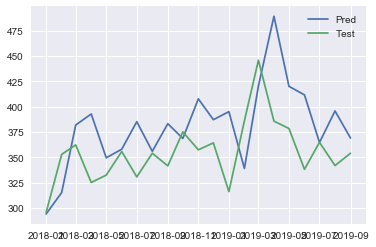

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3732 - val_loss: 0.0964
Epoch 2/1000
0s - loss: 0.3686 - val_loss: 0.0944
Epoch 3/1000
0s - loss: 0.3639 - val_loss: 0.0925
Epoch 4/1000
0s - loss: 0.3595 - val_loss: 0.0905
Epoch 5/1000
0s - loss: 0.3542 - val_loss: 0.0887
Epoch 6/1000
0s - loss: 0.3511 - val_loss: 0.0868
Epoch 7/1000
0s - loss: 0.3464 - val_loss: 0.0850
Epoch 8/1000
0s - loss: 0.3421 - val_loss: 0.0832
Epoch 9/1000
0s - loss: 0.3378 - val_loss: 0.0814
Epoch 10/1000
0s - loss: 0.3331 - val_loss: 0.0797
Epoch 11/1000
0s - loss: 0.3288 - val_loss: 0.0779
Epoch 12/1000
0s - loss: 0.3253 - val_loss: 0.0762
Epoch 13/1000
0s - loss: 0.3209 - val_loss: 0.0745
Epoch 14/1000
0s - loss: 0.3173 - val_loss: 0.0728
Epoch 15/1000
0s - loss: 0.3125 - val_loss: 0.0711
Epoch 16/1000
0s - loss: 0.3083 - val_loss: 0.0694
Epoch 17/1000
0s - loss: 0.3051 - val_loss: 0.0678
Epoch 18/1000
0s - loss: 0.2997 - val_loss: 0.0661
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0197 - val_loss: 0.0375
Epoch 173/1000
0s - loss: 0.0207 - val_loss: 0.0373
Epoch 174/1000
0s - loss: 0.0184 - val_loss: 0.0371
Epoch 175/1000
0s - loss: 0.0203 - val_loss: 0.0369
Epoch 176/1000
0s - loss: 0.0216 - val_loss: 0.0366
Epoch 177/1000
0s - loss: 0.0186 - val_loss: 0.0364
Epoch 178/1000
0s - loss: 0.0182 - val_loss: 0.0362
Epoch 179/1000
0s - loss: 0.0205 - val_loss: 0.0360
Epoch 180/1000
0s - loss: 0.0192 - val_loss: 0.0358
Epoch 181/1000
0s - loss: 0.0191 - val_loss: 0.0356
Epoch 182/1000
0s - loss: 0.0199 - val_loss: 0.0354
Epoch 183/1000
0s - loss: 0.0223 - val_loss: 0.0352
Epoch 184/1000
0s - loss: 0.0165 - val_loss: 0.0350
Epoch 185/1000
0s - loss: 0.0205 - val_loss: 0.0348
Epoch 186/1000
0s - loss: 0.0205 - val_loss: 0.0346
Epoch 187/1000
0s - loss: 0.0172 - val_loss: 0.0344
Epoch 188/1000
0s - loss: 0.0183 - val_loss: 0.0342
Epoch 189/1000
0s - loss: 0.0167 - val_loss: 0.0340
Epoch 190/1000
0s - loss: 0.0197 - val_loss: 0.0339
Epoch 191/1000
0s - loss: 0

0s - loss: 0.0087 - val_loss: 0.0157
Epoch 343/1000
0s - loss: 0.0118 - val_loss: 0.0156
Epoch 344/1000
0s - loss: 0.0113 - val_loss: 0.0155
Epoch 345/1000
0s - loss: 0.0102 - val_loss: 0.0155
Epoch 346/1000
0s - loss: 0.0116 - val_loss: 0.0154
Epoch 347/1000
0s - loss: 0.0120 - val_loss: 0.0154
Epoch 348/1000
0s - loss: 0.0098 - val_loss: 0.0154
Epoch 349/1000
0s - loss: 0.0108 - val_loss: 0.0153
Epoch 350/1000
0s - loss: 0.0124 - val_loss: 0.0153
Epoch 351/1000
0s - loss: 0.0108 - val_loss: 0.0153
Epoch 352/1000
0s - loss: 0.0108 - val_loss: 0.0153
Epoch 353/1000
0s - loss: 0.0101 - val_loss: 0.0153
Epoch 354/1000
0s - loss: 0.0119 - val_loss: 0.0153
Epoch 355/1000
0s - loss: 0.0104 - val_loss: 0.0154
Epoch 356/1000
0s - loss: 0.0147 - val_loss: 0.0154
Epoch 357/1000
0s - loss: 0.0099 - val_loss: 0.0154
Epoch 358/1000
0s - loss: 0.0111 - val_loss: 0.0154
Epoch 359/1000
0s - loss: 0.0086 - val_loss: 0.0154
Epoch 360/1000
0s - loss: 0.0114 - val_loss: 0.0154
Epoch 361/1000
0s - loss: 0

0s - loss: 0.0084 - val_loss: 0.0130
Epoch 514/1000
0s - loss: 0.0089 - val_loss: 0.0130
Epoch 515/1000
0s - loss: 0.0078 - val_loss: 0.0130
Epoch 516/1000
0s - loss: 0.0124 - val_loss: 0.0129
Epoch 517/1000
0s - loss: 0.0105 - val_loss: 0.0129
Epoch 518/1000
0s - loss: 0.0092 - val_loss: 0.0129
Epoch 519/1000
0s - loss: 0.0103 - val_loss: 0.0129
Epoch 520/1000
0s - loss: 0.0090 - val_loss: 0.0129
Epoch 521/1000
0s - loss: 0.0096 - val_loss: 0.0129
Epoch 522/1000
0s - loss: 0.0076 - val_loss: 0.0129
Epoch 523/1000
0s - loss: 0.0120 - val_loss: 0.0129
Epoch 524/1000
0s - loss: 0.0091 - val_loss: 0.0129
Epoch 525/1000
0s - loss: 0.0093 - val_loss: 0.0130
Epoch 526/1000
0s - loss: 0.0086 - val_loss: 0.0130
Epoch 527/1000
0s - loss: 0.0073 - val_loss: 0.0131
Epoch 528/1000
0s - loss: 0.0138 - val_loss: 0.0131
Epoch 529/1000
0s - loss: 0.0099 - val_loss: 0.0131
Epoch 530/1000
0s - loss: 0.0111 - val_loss: 0.0131
Epoch 531/1000
0s - loss: 0.0086 - val_loss: 0.0131
Epoch 532/1000
0s - loss: 0

0s - loss: 0.0092 - val_loss: 0.0126
Epoch 684/1000
0s - loss: 0.0082 - val_loss: 0.0127
Epoch 685/1000
0s - loss: 0.0102 - val_loss: 0.0127
Epoch 686/1000
0s - loss: 0.0102 - val_loss: 0.0128
Epoch 687/1000
0s - loss: 0.0094 - val_loss: 0.0128
Epoch 688/1000
0s - loss: 0.0080 - val_loss: 0.0129
Epoch 689/1000
0s - loss: 0.0116 - val_loss: 0.0130
Epoch 690/1000
0s - loss: 0.0108 - val_loss: 0.0130
Epoch 691/1000
0s - loss: 0.0082 - val_loss: 0.0131
Epoch 692/1000
0s - loss: 0.0091 - val_loss: 0.0131
Epoch 693/1000
0s - loss: 0.0081 - val_loss: 0.0131
Epoch 694/1000
0s - loss: 0.0092 - val_loss: 0.0132
Epoch 695/1000
0s - loss: 0.0102 - val_loss: 0.0132
Epoch 696/1000
0s - loss: 0.0087 - val_loss: 0.0133
Epoch 697/1000
0s - loss: 0.0093 - val_loss: 0.0133
Epoch 698/1000
0s - loss: 0.0095 - val_loss: 0.0134
Epoch 699/1000
0s - loss: 0.0098 - val_loss: 0.0134
Epoch 700/1000
0s - loss: 0.0098 - val_loss: 0.0133
Epoch 701/1000
0s - loss: 0.0082 - val_loss: 0.0133
Epoch 702/1000
0s - loss: 0

0s - loss: 0.0098 - val_loss: 0.0130
Epoch 856/1000
0s - loss: 0.0089 - val_loss: 0.0129
Epoch 857/1000
0s - loss: 0.0104 - val_loss: 0.0128
Epoch 858/1000
0s - loss: 0.0091 - val_loss: 0.0127
Epoch 859/1000
0s - loss: 0.0078 - val_loss: 0.0126
Epoch 860/1000
0s - loss: 0.0097 - val_loss: 0.0125
Epoch 861/1000
0s - loss: 0.0091 - val_loss: 0.0125
Epoch 862/1000
0s - loss: 0.0083 - val_loss: 0.0125
Epoch 863/1000
0s - loss: 0.0103 - val_loss: 0.0125
Epoch 864/1000
0s - loss: 0.0102 - val_loss: 0.0126
Epoch 865/1000
0s - loss: 0.0088 - val_loss: 0.0126
Epoch 866/1000
0s - loss: 0.0098 - val_loss: 0.0127
Epoch 867/1000
0s - loss: 0.0095 - val_loss: 0.0127
Epoch 868/1000
0s - loss: 0.0078 - val_loss: 0.0127
Epoch 869/1000
0s - loss: 0.0090 - val_loss: 0.0128
Epoch 870/1000
0s - loss: 0.0093 - val_loss: 0.0128
Epoch 871/1000
0s - loss: 0.0100 - val_loss: 0.0129
Epoch 872/1000
0s - loss: 0.0088 - val_loss: 0.0129
Epoch 873/1000
0s - loss: 0.0097 - val_loss: 0.0129
Epoch 874/1000
0s - loss: 0

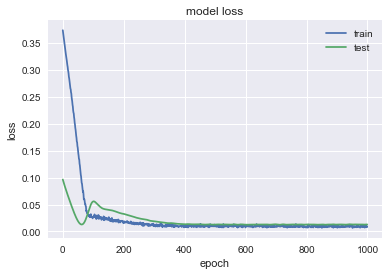

               IBM
MSE        132.338
MAE        7.84227
R2       -0.318587
MAPE (%)   6.01494


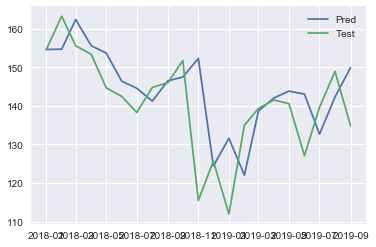

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1236 - val_loss: 0.2745
Epoch 2/1000
0s - loss: 0.1218 - val_loss: 0.2709
Epoch 3/1000
0s - loss: 0.1200 - val_loss: 0.2673
Epoch 4/1000
0s - loss: 0.1180 - val_loss: 0.2637
Epoch 5/1000
0s - loss: 0.1161 - val_loss: 0.2602
Epoch 6/1000
0s - loss: 0.1141 - val_loss: 0.2566
Epoch 7/1000
0s - loss: 0.1128 - val_loss: 0.2531
Epoch 8/1000
0s - loss: 0.1104 - val_loss: 0.2495
Epoch 9/1000
0s - loss: 0.1087 - val_loss: 0.2460
Epoch 10/1000
0s - loss: 0.1070 - val_loss: 0.2425
Epoch 11/1000
0s - loss: 0.1053 - val_loss: 0.2389
Epoch 12/1000
0s - loss: 0.1035 - val_loss: 0.2354
Epoch 13/1000
0s - loss: 0.1017 - val_loss: 0.2319
Epoch 14/1000
0s - loss: 0.1000 - val_loss: 0.2284
Epoch 15/1000
0s - loss: 0.0978 - val_loss: 0.2248
Epoch 16/1000
0s - loss: 0.0965 - val_loss: 0.2213
Epoch 17/1000
0s - loss: 0.0941 - val_loss: 0.2177
Epoch 18/1000
0s - loss: 0.0933 - val_loss: 0.2142
Epoch 19/1000
0s - loss: 0.

Epoch 185/1000
0s - loss: 0.0065 - val_loss: 0.0056
Epoch 186/1000
0s - loss: 0.0056 - val_loss: 0.0056
Epoch 187/1000
0s - loss: 0.0058 - val_loss: 0.0056
Epoch 188/1000
0s - loss: 0.0070 - val_loss: 0.0056
Epoch 189/1000
0s - loss: 0.0054 - val_loss: 0.0056
Epoch 190/1000
0s - loss: 0.0056 - val_loss: 0.0056
Epoch 191/1000
0s - loss: 0.0054 - val_loss: 0.0056
Epoch 192/1000
0s - loss: 0.0057 - val_loss: 0.0056
Epoch 193/1000
0s - loss: 0.0049 - val_loss: 0.0056
Epoch 194/1000
0s - loss: 0.0046 - val_loss: 0.0056
Epoch 195/1000
0s - loss: 0.0053 - val_loss: 0.0057
Epoch 196/1000
0s - loss: 0.0069 - val_loss: 0.0057
Epoch 197/1000
0s - loss: 0.0049 - val_loss: 0.0057
Epoch 198/1000
0s - loss: 0.0072 - val_loss: 0.0058
Epoch 199/1000
0s - loss: 0.0050 - val_loss: 0.0058
Epoch 200/1000
0s - loss: 0.0049 - val_loss: 0.0059
Epoch 201/1000
0s - loss: 0.0054 - val_loss: 0.0059
Epoch 202/1000
0s - loss: 0.0052 - val_loss: 0.0060
Epoch 203/1000
0s - loss: 0.0056 - val_loss: 0.0060
Epoch 204/10

0s - loss: 0.0042 - val_loss: 0.0087
Epoch 355/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 356/1000
0s - loss: 0.0040 - val_loss: 0.0088
Epoch 357/1000
0s - loss: 0.0043 - val_loss: 0.0088
Epoch 358/1000
0s - loss: 0.0048 - val_loss: 0.0088
Epoch 359/1000
0s - loss: 0.0036 - val_loss: 0.0087
Epoch 360/1000
0s - loss: 0.0034 - val_loss: 0.0087
Epoch 361/1000
0s - loss: 0.0040 - val_loss: 0.0087
Epoch 362/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 363/1000
0s - loss: 0.0051 - val_loss: 0.0087
Epoch 364/1000
0s - loss: 0.0049 - val_loss: 0.0086
Epoch 365/1000
0s - loss: 0.0043 - val_loss: 0.0085
Epoch 366/1000
0s - loss: 0.0046 - val_loss: 0.0085
Epoch 367/1000
0s - loss: 0.0036 - val_loss: 0.0084
Epoch 368/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 369/1000
0s - loss: 0.0051 - val_loss: 0.0083
Epoch 370/1000
0s - loss: 0.0041 - val_loss: 0.0082
Epoch 371/1000
0s - loss: 0.0054 - val_loss: 0.0081
Epoch 372/1000
0s - loss: 0.0043 - val_loss: 0.0080
Epoch 373/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0086
Epoch 522/1000
0s - loss: 0.0040 - val_loss: 0.0086
Epoch 523/1000
0s - loss: 0.0045 - val_loss: 0.0087
Epoch 524/1000
0s - loss: 0.0038 - val_loss: 0.0087
Epoch 525/1000
0s - loss: 0.0055 - val_loss: 0.0086
Epoch 526/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 527/1000
0s - loss: 0.0034 - val_loss: 0.0087
Epoch 528/1000
0s - loss: 0.0051 - val_loss: 0.0088
Epoch 529/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 530/1000
0s - loss: 0.0040 - val_loss: 0.0088
Epoch 531/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 532/1000
0s - loss: 0.0036 - val_loss: 0.0087
Epoch 533/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 534/1000
0s - loss: 0.0049 - val_loss: 0.0086
Epoch 535/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 536/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 537/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 538/1000
0s - loss: 0.0039 - val_loss: 0.0084
Epoch 539/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 540/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0085
Epoch 688/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 689/1000
0s - loss: 0.0038 - val_loss: 0.0084
Epoch 690/1000
0s - loss: 0.0042 - val_loss: 0.0084
Epoch 691/1000
0s - loss: 0.0042 - val_loss: 0.0084
Epoch 692/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 693/1000
0s - loss: 0.0041 - val_loss: 0.0084
Epoch 694/1000
0s - loss: 0.0034 - val_loss: 0.0084
Epoch 695/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 696/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 697/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 698/1000
0s - loss: 0.0034 - val_loss: 0.0084
Epoch 699/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 700/1000
0s - loss: 0.0038 - val_loss: 0.0085
Epoch 701/1000
0s - loss: 0.0050 - val_loss: 0.0085
Epoch 702/1000
0s - loss: 0.0031 - val_loss: 0.0085
Epoch 703/1000
0s - loss: 0.0039 - val_loss: 0.0086
Epoch 704/1000
0s - loss: 0.0033 - val_loss: 0.0086
Epoch 705/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 706/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0084
Epoch 851/1000
0s - loss: 0.0051 - val_loss: 0.0084
Epoch 852/1000
0s - loss: 0.0036 - val_loss: 0.0085
Epoch 853/1000
0s - loss: 0.0040 - val_loss: 0.0086
Epoch 854/1000
0s - loss: 0.0033 - val_loss: 0.0087
Epoch 855/1000
0s - loss: 0.0036 - val_loss: 0.0088
Epoch 856/1000
0s - loss: 0.0044 - val_loss: 0.0088
Epoch 857/1000
0s - loss: 0.0038 - val_loss: 0.0087
Epoch 858/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 859/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 860/1000
0s - loss: 0.0038 - val_loss: 0.0083
Epoch 861/1000
0s - loss: 0.0033 - val_loss: 0.0083
Epoch 862/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 863/1000
0s - loss: 0.0032 - val_loss: 0.0082
Epoch 864/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 865/1000
0s - loss: 0.0040 - val_loss: 0.0084
Epoch 866/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 867/1000
0s - loss: 0.0039 - val_loss: 0.0086
Epoch 868/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 869/1000
0s - loss: 0

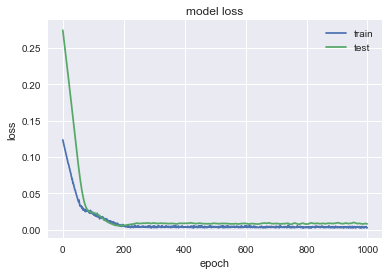

               ALB
MSE        90.4237
MAE        7.39216
R2        0.722687
MAPE (%)   8.74436


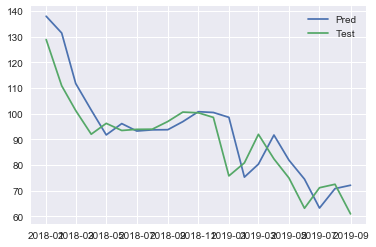

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1487 - val_loss: 0.7194
Epoch 2/1000
0s - loss: 0.1463 - val_loss: 0.7125
Epoch 3/1000
0s - loss: 0.1440 - val_loss: 0.7056
Epoch 4/1000
0s - loss: 0.1422 - val_loss: 0.6988
Epoch 5/1000
0s - loss: 0.1395 - val_loss: 0.6919
Epoch 6/1000
0s - loss: 0.1376 - val_loss: 0.6851
Epoch 7/1000
0s - loss: 0.1350 - val_loss: 0.6783
Epoch 8/1000
0s - loss: 0.1330 - val_loss: 0.6715
Epoch 9/1000
0s - loss: 0.1307 - val_loss: 0.6647
Epoch 10/1000
0s - loss: 0.1288 - val_loss: 0.6579
Epoch 11/1000
0s - loss: 0.1265 - val_loss: 0.6511
Epoch 12/1000
0s - loss: 0.1245 - val_loss: 0.6444
Epoch 13/1000
0s - loss: 0.1221 - val_loss: 0.6375
Epoch 14/1000
0s - loss: 0.1206 - val_loss: 0.6307
Epoch 15/1000
0s - loss: 0.1177 - val_loss: 0.6239
Epoch 16/1000
0s - loss: 0.1159 - val_loss: 0.6170
Epoch 17/1000
0s - loss: 0.1137 - val_loss: 0.6101
Epoch 18/1000
0s - loss: 0.1114 - val_loss: 0.6031
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0125 - val_loss: 0.0559
Epoch 170/1000
0s - loss: 0.0131 - val_loss: 0.0551
Epoch 171/1000
0s - loss: 0.0124 - val_loss: 0.0543
Epoch 172/1000
0s - loss: 0.0123 - val_loss: 0.0535
Epoch 173/1000
0s - loss: 0.0111 - val_loss: 0.0526
Epoch 174/1000
0s - loss: 0.0112 - val_loss: 0.0517
Epoch 175/1000
0s - loss: 0.0133 - val_loss: 0.0508
Epoch 176/1000
0s - loss: 0.0121 - val_loss: 0.0499
Epoch 177/1000
0s - loss: 0.0118 - val_loss: 0.0489
Epoch 178/1000
0s - loss: 0.0120 - val_loss: 0.0479
Epoch 179/1000
0s - loss: 0.0113 - val_loss: 0.0468
Epoch 180/1000
0s - loss: 0.0105 - val_loss: 0.0459
Epoch 181/1000
0s - loss: 0.0105 - val_loss: 0.0449
Epoch 182/1000
0s - loss: 0.0100 - val_loss: 0.0439
Epoch 183/1000
0s - loss: 0.0124 - val_loss: 0.0430
Epoch 184/1000
0s - loss: 0.0118 - val_loss: 0.0420
Epoch 185/1000
0s - loss: 0.0102 - val_loss: 0.0409
Epoch 186/1000
0s - loss: 0.0113 - val_loss: 0.0398
Epoch 187/1000
0s - loss: 0.0112 - val_loss: 0.0387
Epoch 188/1000
0s - loss: 0

0s - loss: 0.0048 - val_loss: 0.0128
Epoch 341/1000
0s - loss: 0.0045 - val_loss: 0.0128
Epoch 342/1000
0s - loss: 0.0043 - val_loss: 0.0128
Epoch 343/1000
0s - loss: 0.0046 - val_loss: 0.0128
Epoch 344/1000
0s - loss: 0.0047 - val_loss: 0.0128
Epoch 345/1000
0s - loss: 0.0046 - val_loss: 0.0128
Epoch 346/1000
0s - loss: 0.0045 - val_loss: 0.0129
Epoch 347/1000
0s - loss: 0.0045 - val_loss: 0.0129
Epoch 348/1000
0s - loss: 0.0053 - val_loss: 0.0131
Epoch 349/1000
0s - loss: 0.0049 - val_loss: 0.0132
Epoch 350/1000
0s - loss: 0.0046 - val_loss: 0.0133
Epoch 351/1000
0s - loss: 0.0047 - val_loss: 0.0135
Epoch 352/1000
0s - loss: 0.0047 - val_loss: 0.0136
Epoch 353/1000
0s - loss: 0.0041 - val_loss: 0.0137
Epoch 354/1000
0s - loss: 0.0054 - val_loss: 0.0139
Epoch 355/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 356/1000
0s - loss: 0.0048 - val_loss: 0.0141
Epoch 357/1000
0s - loss: 0.0045 - val_loss: 0.0141
Epoch 358/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 359/1000
0s - loss: 0

0s - loss: 0.0046 - val_loss: 0.0125
Epoch 511/1000
0s - loss: 0.0040 - val_loss: 0.0126
Epoch 512/1000
0s - loss: 0.0042 - val_loss: 0.0126
Epoch 513/1000
0s - loss: 0.0042 - val_loss: 0.0125
Epoch 514/1000
0s - loss: 0.0052 - val_loss: 0.0125
Epoch 515/1000
0s - loss: 0.0043 - val_loss: 0.0124
Epoch 516/1000
0s - loss: 0.0052 - val_loss: 0.0123
Epoch 517/1000
0s - loss: 0.0041 - val_loss: 0.0122
Epoch 518/1000
0s - loss: 0.0042 - val_loss: 0.0121
Epoch 519/1000
0s - loss: 0.0047 - val_loss: 0.0120
Epoch 520/1000
0s - loss: 0.0054 - val_loss: 0.0119
Epoch 521/1000
0s - loss: 0.0048 - val_loss: 0.0119
Epoch 522/1000
0s - loss: 0.0046 - val_loss: 0.0117
Epoch 523/1000
0s - loss: 0.0053 - val_loss: 0.0116
Epoch 524/1000
0s - loss: 0.0053 - val_loss: 0.0115
Epoch 525/1000
0s - loss: 0.0048 - val_loss: 0.0114
Epoch 526/1000
0s - loss: 0.0039 - val_loss: 0.0114
Epoch 527/1000
0s - loss: 0.0046 - val_loss: 0.0115
Epoch 528/1000
0s - loss: 0.0052 - val_loss: 0.0117
Epoch 529/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0102
Epoch 681/1000
0s - loss: 0.0045 - val_loss: 0.0102
Epoch 682/1000
0s - loss: 0.0041 - val_loss: 0.0102
Epoch 683/1000
0s - loss: 0.0040 - val_loss: 0.0103
Epoch 684/1000
0s - loss: 0.0044 - val_loss: 0.0103
Epoch 685/1000
0s - loss: 0.0043 - val_loss: 0.0103
Epoch 686/1000
0s - loss: 0.0038 - val_loss: 0.0104
Epoch 687/1000
0s - loss: 0.0040 - val_loss: 0.0106
Epoch 688/1000
0s - loss: 0.0038 - val_loss: 0.0107
Epoch 689/1000
0s - loss: 0.0047 - val_loss: 0.0107
Epoch 690/1000
0s - loss: 0.0051 - val_loss: 0.0106
Epoch 691/1000
0s - loss: 0.0038 - val_loss: 0.0106
Epoch 692/1000
0s - loss: 0.0042 - val_loss: 0.0106
Epoch 693/1000
0s - loss: 0.0048 - val_loss: 0.0105
Epoch 694/1000
0s - loss: 0.0048 - val_loss: 0.0105
Epoch 695/1000
0s - loss: 0.0047 - val_loss: 0.0104
Epoch 696/1000
0s - loss: 0.0041 - val_loss: 0.0104
Epoch 697/1000
0s - loss: 0.0034 - val_loss: 0.0105
Epoch 698/1000
0s - loss: 0.0044 - val_loss: 0.0105
Epoch 699/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0089
Epoch 851/1000
0s - loss: 0.0051 - val_loss: 0.0089
Epoch 852/1000
0s - loss: 0.0037 - val_loss: 0.0090
Epoch 853/1000
0s - loss: 0.0046 - val_loss: 0.0092
Epoch 854/1000
0s - loss: 0.0048 - val_loss: 0.0093
Epoch 855/1000
0s - loss: 0.0052 - val_loss: 0.0093
Epoch 856/1000
0s - loss: 0.0053 - val_loss: 0.0094
Epoch 857/1000
0s - loss: 0.0036 - val_loss: 0.0095
Epoch 858/1000
0s - loss: 0.0045 - val_loss: 0.0095
Epoch 859/1000
0s - loss: 0.0042 - val_loss: 0.0095
Epoch 860/1000
0s - loss: 0.0039 - val_loss: 0.0095
Epoch 861/1000
0s - loss: 0.0033 - val_loss: 0.0094
Epoch 862/1000
0s - loss: 0.0046 - val_loss: 0.0093
Epoch 863/1000
0s - loss: 0.0040 - val_loss: 0.0090
Epoch 864/1000
0s - loss: 0.0039 - val_loss: 0.0089
Epoch 865/1000
0s - loss: 0.0045 - val_loss: 0.0088
Epoch 866/1000
0s - loss: 0.0051 - val_loss: 0.0087
Epoch 867/1000
0s - loss: 0.0041 - val_loss: 0.0087
Epoch 868/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 869/1000
0s - loss: 0

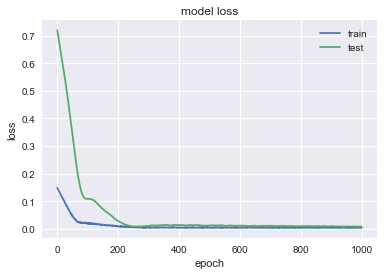

              CBRE
MSE        13.5098
MAE        2.85137
R2        0.169561
MAPE (%)   6.20074


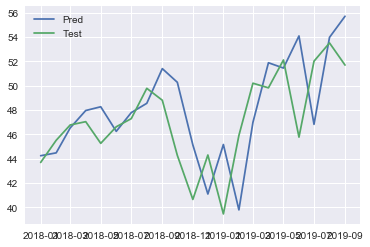

In [93]:
pred_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_2[comp] = nn_forec(df,comp,n_train_time=test.shape[0],first_layer = 32,second_layer=16).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3242 - val_loss: 0.2282
Epoch 2/1000
0s - loss: 0.3177 - val_loss: 0.2228
Epoch 3/1000
0s - loss: 0.3110 - val_loss: 0.2174
Epoch 4/1000
0s - loss: 0.3049 - val_loss: 0.2121
Epoch 5/1000
0s - loss: 0.2980 - val_loss: 0.2068
Epoch 6/1000
0s - loss: 0.2913 - val_loss: 0.2014
Epoch 7/1000
0s - loss: 0.2849 - val_loss: 0.1960
Epoch 8/1000
0s - loss: 0.2785 - val_loss: 0.1905
Epoch 9/1000
0s - loss: 0.2712 - val_loss: 0.1850
Epoch 10/1000
0s - loss: 0.2646 - val_loss: 0.1793
Epoch 11/1000
0s - loss: 0.2577 - val_loss: 0.1735
Epoch 12/1000
0s - loss: 0.2506 - val_loss: 0.1676
Epoch 13/1000
0s - loss: 0.2433 - val_loss: 0.1615
Epoch 14/1000
0s - loss: 0.2363 - val_loss: 0.1553
Epoch 15/1000
0s - loss: 0.2274 - val_loss: 0.1490
Epoch 16/1000
0s - loss: 0.2204 - val_loss: 0.1425
Epoch 17/1000
0s - loss: 0.2118 - val_loss: 0.1359
Epoch 18/1000
0s - loss: 0.2028 - val_loss: 0.1292
Epoch 19/1000
0s - loss: 0.19

0s - loss: 0.0094 - val_loss: 0.0068
Epoch 174/1000
0s - loss: 0.0085 - val_loss: 0.0068
Epoch 175/1000
0s - loss: 0.0090 - val_loss: 0.0068
Epoch 176/1000
0s - loss: 0.0083 - val_loss: 0.0068
Epoch 177/1000
0s - loss: 0.0094 - val_loss: 0.0068
Epoch 178/1000
0s - loss: 0.0086 - val_loss: 0.0068
Epoch 179/1000
0s - loss: 0.0082 - val_loss: 0.0069
Epoch 180/1000
0s - loss: 0.0082 - val_loss: 0.0069
Epoch 181/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 182/1000
0s - loss: 0.0087 - val_loss: 0.0069
Epoch 183/1000
0s - loss: 0.0084 - val_loss: 0.0068
Epoch 184/1000
0s - loss: 0.0079 - val_loss: 0.0068
Epoch 185/1000
0s - loss: 0.0081 - val_loss: 0.0068
Epoch 186/1000
0s - loss: 0.0074 - val_loss: 0.0068
Epoch 187/1000
0s - loss: 0.0085 - val_loss: 0.0068
Epoch 188/1000
0s - loss: 0.0076 - val_loss: 0.0068
Epoch 189/1000
0s - loss: 0.0084 - val_loss: 0.0069
Epoch 190/1000
0s - loss: 0.0094 - val_loss: 0.0069
Epoch 191/1000
0s - loss: 0.0084 - val_loss: 0.0069
Epoch 192/1000
0s - loss: 0

0s - loss: 0.0085 - val_loss: 0.0071
Epoch 335/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 336/1000
0s - loss: 0.0093 - val_loss: 0.0070
Epoch 337/1000
0s - loss: 0.0079 - val_loss: 0.0070
Epoch 338/1000
0s - loss: 0.0081 - val_loss: 0.0070
Epoch 339/1000
0s - loss: 0.0081 - val_loss: 0.0070
Epoch 340/1000
0s - loss: 0.0076 - val_loss: 0.0070
Epoch 341/1000
0s - loss: 0.0078 - val_loss: 0.0069
Epoch 342/1000
0s - loss: 0.0077 - val_loss: 0.0069
Epoch 343/1000
0s - loss: 0.0077 - val_loss: 0.0069
Epoch 344/1000
0s - loss: 0.0077 - val_loss: 0.0069
Epoch 345/1000
0s - loss: 0.0080 - val_loss: 0.0069
Epoch 346/1000
0s - loss: 0.0076 - val_loss: 0.0069
Epoch 347/1000
0s - loss: 0.0078 - val_loss: 0.0069
Epoch 348/1000
0s - loss: 0.0073 - val_loss: 0.0070
Epoch 349/1000
0s - loss: 0.0080 - val_loss: 0.0070
Epoch 350/1000
0s - loss: 0.0078 - val_loss: 0.0070
Epoch 351/1000
0s - loss: 0.0080 - val_loss: 0.0070
Epoch 352/1000
0s - loss: 0.0074 - val_loss: 0.0070
Epoch 353/1000
0s - loss: 0

0s - loss: 0.0073 - val_loss: 0.0071
Epoch 495/1000
0s - loss: 0.0067 - val_loss: 0.0071
Epoch 496/1000
0s - loss: 0.0065 - val_loss: 0.0071
Epoch 497/1000
0s - loss: 0.0077 - val_loss: 0.0071
Epoch 498/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 499/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 500/1000
0s - loss: 0.0074 - val_loss: 0.0071
Epoch 501/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 502/1000
0s - loss: 0.0080 - val_loss: 0.0071
Epoch 503/1000
0s - loss: 0.0075 - val_loss: 0.0071
Epoch 504/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 505/1000
0s - loss: 0.0080 - val_loss: 0.0071
Epoch 506/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 507/1000
0s - loss: 0.0075 - val_loss: 0.0070
Epoch 508/1000
0s - loss: 0.0074 - val_loss: 0.0070
Epoch 509/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 510/1000
0s - loss: 0.0086 - val_loss: 0.0071
Epoch 511/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 512/1000
0s - loss: 0.0080 - val_loss: 0.0071
Epoch 513/1000
0s - loss: 0

0s - loss: 0.0078 - val_loss: 0.0072
Epoch 655/1000
0s - loss: 0.0082 - val_loss: 0.0072
Epoch 656/1000
0s - loss: 0.0072 - val_loss: 0.0072
Epoch 657/1000
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 658/1000
0s - loss: 0.0074 - val_loss: 0.0072
Epoch 659/1000
0s - loss: 0.0074 - val_loss: 0.0072
Epoch 660/1000
0s - loss: 0.0078 - val_loss: 0.0072
Epoch 661/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 662/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 663/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 664/1000
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 665/1000
0s - loss: 0.0069 - val_loss: 0.0072
Epoch 666/1000
0s - loss: 0.0080 - val_loss: 0.0072
Epoch 667/1000
0s - loss: 0.0075 - val_loss: 0.0072
Epoch 668/1000
0s - loss: 0.0067 - val_loss: 0.0072
Epoch 669/1000
0s - loss: 0.0077 - val_loss: 0.0073
Epoch 670/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 671/1000
0s - loss: 0.0087 - val_loss: 0.0073
Epoch 672/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 673/1000
0s - loss: 0

0s - loss: 0.0067 - val_loss: 0.0073
Epoch 818/1000
0s - loss: 0.0069 - val_loss: 0.0073
Epoch 819/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 820/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 821/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 822/1000
0s - loss: 0.0079 - val_loss: 0.0074
Epoch 823/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 824/1000
0s - loss: 0.0067 - val_loss: 0.0075
Epoch 825/1000
0s - loss: 0.0081 - val_loss: 0.0074
Epoch 826/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 827/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 828/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 829/1000
0s - loss: 0.0079 - val_loss: 0.0074
Epoch 830/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 831/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 832/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 833/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 834/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 835/1000
0s - loss: 0.0061 - val_loss: 0.0073
Epoch 836/1000
0s - loss: 0

0s - loss: 0.0069 - val_loss: 0.0075
Epoch 976/1000
0s - loss: 0.0075 - val_loss: 0.0075
Epoch 977/1000
0s - loss: 0.0071 - val_loss: 0.0075
Epoch 978/1000
0s - loss: 0.0071 - val_loss: 0.0075
Epoch 979/1000
0s - loss: 0.0070 - val_loss: 0.0075
Epoch 980/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 981/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 982/1000
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 983/1000
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 984/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 985/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 986/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 987/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 988/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 989/1000
0s - loss: 0.0077 - val_loss: 0.0074
Epoch 990/1000
0s - loss: 0.0076 - val_loss: 0.0074
Epoch 991/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 992/1000
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 993/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 994/1000
0s - loss: 0

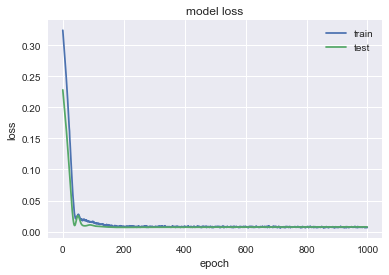

                 T
MSE        2.69899
MAE        1.25193
R2        0.557041
MAPE (%)   3.82678


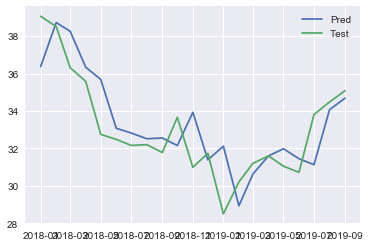

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1261 - val_loss: 0.7344
Epoch 2/1000
0s - loss: 0.1226 - val_loss: 0.7202
Epoch 3/1000
0s - loss: 0.1185 - val_loss: 0.7060
Epoch 4/1000
0s - loss: 0.1149 - val_loss: 0.6917
Epoch 5/1000
0s - loss: 0.1111 - val_loss: 0.6774
Epoch 6/1000
0s - loss: 0.1075 - val_loss: 0.6628
Epoch 7/1000
0s - loss: 0.1038 - val_loss: 0.6480
Epoch 8/1000
0s - loss: 0.1002 - val_loss: 0.6329
Epoch 9/1000
0s - loss: 0.0963 - val_loss: 0.6176
Epoch 10/1000
0s - loss: 0.0926 - val_loss: 0.6018
Epoch 11/1000
0s - loss: 0.0890 - val_loss: 0.5857
Epoch 12/1000
0s - loss: 0.0847 - val_loss: 0.5692
Epoch 13/1000
0s - loss: 0.0812 - val_loss: 0.5522
Epoch 14/1000
0s - loss: 0.0770 - val_loss: 0.5349
Epoch 15/1000
0s - loss: 0.0727 - val_loss: 0.5170
Epoch 16/1000
0s - loss: 0.0691 - val_loss: 0.4987
Epoch 17/1000
0s - loss: 0.0640 - val_loss: 0.4800
Epoch 18/1000
0s - loss: 0.0614 - val_loss: 0.4608
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0032 - val_loss: 0.0169
Epoch 163/1000
0s - loss: 0.0035 - val_loss: 0.0171
Epoch 164/1000
0s - loss: 0.0034 - val_loss: 0.0172
Epoch 165/1000
0s - loss: 0.0034 - val_loss: 0.0173
Epoch 166/1000
0s - loss: 0.0031 - val_loss: 0.0174
Epoch 167/1000
0s - loss: 0.0033 - val_loss: 0.0175
Epoch 168/1000
0s - loss: 0.0031 - val_loss: 0.0176
Epoch 169/1000
0s - loss: 0.0035 - val_loss: 0.0176
Epoch 170/1000
0s - loss: 0.0035 - val_loss: 0.0178
Epoch 171/1000
0s - loss: 0.0032 - val_loss: 0.0180
Epoch 172/1000
0s - loss: 0.0031 - val_loss: 0.0181
Epoch 173/1000
0s - loss: 0.0036 - val_loss: 0.0183
Epoch 174/1000
0s - loss: 0.0036 - val_loss: 0.0186
Epoch 175/1000
0s - loss: 0.0039 - val_loss: 0.0188
Epoch 176/1000
0s - loss: 0.0032 - val_loss: 0.0191
Epoch 177/1000
0s - loss: 0.0035 - val_loss: 0.0194
Epoch 178/1000
0s - loss: 0.0033 - val_loss: 0.0196
Epoch 179/1000
0s - loss: 0.0032 - val_loss: 0.0198
Epoch 180/1000
0s - loss: 0.0036 - val_loss: 0.0199
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0180
Epoch 325/1000
0s - loss: 0.0033 - val_loss: 0.0181
Epoch 326/1000
0s - loss: 0.0031 - val_loss: 0.0180
Epoch 327/1000
0s - loss: 0.0033 - val_loss: 0.0179
Epoch 328/1000
0s - loss: 0.0031 - val_loss: 0.0178
Epoch 329/1000
0s - loss: 0.0031 - val_loss: 0.0178
Epoch 330/1000
0s - loss: 0.0032 - val_loss: 0.0178
Epoch 331/1000
0s - loss: 0.0032 - val_loss: 0.0177
Epoch 332/1000
0s - loss: 0.0031 - val_loss: 0.0177
Epoch 333/1000
0s - loss: 0.0033 - val_loss: 0.0176
Epoch 334/1000
0s - loss: 0.0033 - val_loss: 0.0175
Epoch 335/1000
0s - loss: 0.0032 - val_loss: 0.0175
Epoch 336/1000
0s - loss: 0.0031 - val_loss: 0.0175
Epoch 337/1000
0s - loss: 0.0034 - val_loss: 0.0176
Epoch 338/1000
0s - loss: 0.0035 - val_loss: 0.0176
Epoch 339/1000
0s - loss: 0.0032 - val_loss: 0.0176
Epoch 340/1000
0s - loss: 0.0033 - val_loss: 0.0177
Epoch 341/1000
0s - loss: 0.0036 - val_loss: 0.0178
Epoch 342/1000
0s - loss: 0.0031 - val_loss: 0.0178
Epoch 343/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0157
Epoch 488/1000
0s - loss: 0.0029 - val_loss: 0.0159
Epoch 489/1000
0s - loss: 0.0028 - val_loss: 0.0163
Epoch 490/1000
0s - loss: 0.0028 - val_loss: 0.0168
Epoch 491/1000
0s - loss: 0.0033 - val_loss: 0.0170
Epoch 492/1000
0s - loss: 0.0034 - val_loss: 0.0171
Epoch 493/1000
0s - loss: 0.0033 - val_loss: 0.0169
Epoch 494/1000
0s - loss: 0.0032 - val_loss: 0.0166
Epoch 495/1000
0s - loss: 0.0032 - val_loss: 0.0162
Epoch 496/1000
0s - loss: 0.0033 - val_loss: 0.0159
Epoch 497/1000
0s - loss: 0.0029 - val_loss: 0.0156
Epoch 498/1000
0s - loss: 0.0034 - val_loss: 0.0154
Epoch 499/1000
0s - loss: 0.0035 - val_loss: 0.0153
Epoch 500/1000
0s - loss: 0.0032 - val_loss: 0.0153
Epoch 501/1000
0s - loss: 0.0034 - val_loss: 0.0153
Epoch 502/1000
0s - loss: 0.0028 - val_loss: 0.0154
Epoch 503/1000
0s - loss: 0.0033 - val_loss: 0.0154
Epoch 504/1000
0s - loss: 0.0030 - val_loss: 0.0155
Epoch 505/1000
0s - loss: 0.0030 - val_loss: 0.0157
Epoch 506/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0141
Epoch 649/1000
0s - loss: 0.0031 - val_loss: 0.0143
Epoch 650/1000
0s - loss: 0.0035 - val_loss: 0.0144
Epoch 651/1000
0s - loss: 0.0035 - val_loss: 0.0145
Epoch 652/1000
0s - loss: 0.0032 - val_loss: 0.0146
Epoch 653/1000
0s - loss: 0.0030 - val_loss: 0.0147
Epoch 654/1000
0s - loss: 0.0031 - val_loss: 0.0147
Epoch 655/1000
0s - loss: 0.0027 - val_loss: 0.0146
Epoch 656/1000
0s - loss: 0.0030 - val_loss: 0.0143
Epoch 657/1000
0s - loss: 0.0029 - val_loss: 0.0141
Epoch 658/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 659/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 660/1000
0s - loss: 0.0034 - val_loss: 0.0139
Epoch 661/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 662/1000
0s - loss: 0.0028 - val_loss: 0.0140
Epoch 663/1000
0s - loss: 0.0033 - val_loss: 0.0140
Epoch 664/1000
0s - loss: 0.0032 - val_loss: 0.0141
Epoch 665/1000
0s - loss: 0.0030 - val_loss: 0.0142
Epoch 666/1000
0s - loss: 0.0033 - val_loss: 0.0143
Epoch 667/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0134
Epoch 808/1000
0s - loss: 0.0031 - val_loss: 0.0134
Epoch 809/1000
0s - loss: 0.0032 - val_loss: 0.0134
Epoch 810/1000
0s - loss: 0.0031 - val_loss: 0.0134
Epoch 811/1000
0s - loss: 0.0033 - val_loss: 0.0135
Epoch 812/1000
0s - loss: 0.0033 - val_loss: 0.0135
Epoch 813/1000
0s - loss: 0.0030 - val_loss: 0.0135
Epoch 814/1000
0s - loss: 0.0033 - val_loss: 0.0135
Epoch 815/1000
0s - loss: 0.0033 - val_loss: 0.0134
Epoch 816/1000
0s - loss: 0.0031 - val_loss: 0.0134
Epoch 817/1000
0s - loss: 0.0033 - val_loss: 0.0133
Epoch 818/1000
0s - loss: 0.0032 - val_loss: 0.0133
Epoch 819/1000
0s - loss: 0.0034 - val_loss: 0.0132
Epoch 820/1000
0s - loss: 0.0030 - val_loss: 0.0132
Epoch 821/1000
0s - loss: 0.0032 - val_loss: 0.0132
Epoch 822/1000
0s - loss: 0.0034 - val_loss: 0.0132
Epoch 823/1000
0s - loss: 0.0030 - val_loss: 0.0133
Epoch 824/1000
0s - loss: 0.0033 - val_loss: 0.0133
Epoch 825/1000
0s - loss: 0.0026 - val_loss: 0.0133
Epoch 826/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0127
Epoch 973/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 974/1000
0s - loss: 0.0037 - val_loss: 0.0127
Epoch 975/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 976/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 977/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 978/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 979/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 980/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 981/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 982/1000
0s - loss: 0.0029 - val_loss: 0.0128
Epoch 983/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 984/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 985/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 986/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 987/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 988/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 989/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 990/1000
0s - loss: 0.0028 - val_loss: 0.0127
Epoch 991/1000
0s - loss: 0

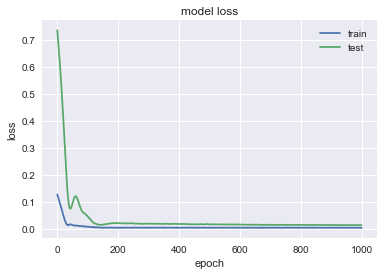

               BBY
MSE        58.1315
MAE        6.45838
R2       -0.170706
MAPE (%)   9.71273


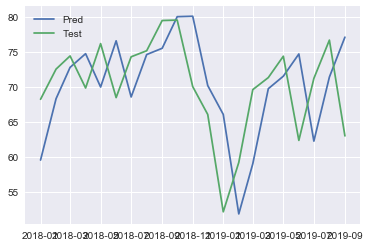

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2318 - val_loss: 0.5419
Epoch 2/1000
0s - loss: 0.2259 - val_loss: 0.5311
Epoch 3/1000
0s - loss: 0.2204 - val_loss: 0.5204
Epoch 4/1000
0s - loss: 0.2148 - val_loss: 0.5095
Epoch 5/1000
0s - loss: 0.2090 - val_loss: 0.4986
Epoch 6/1000
0s - loss: 0.2034 - val_loss: 0.4876
Epoch 7/1000
0s - loss: 0.1980 - val_loss: 0.4764
Epoch 8/1000
0s - loss: 0.1918 - val_loss: 0.4649
Epoch 9/1000
0s - loss: 0.1865 - val_loss: 0.4533
Epoch 10/1000
0s - loss: 0.1806 - val_loss: 0.4414
Epoch 11/1000
0s - loss: 0.1751 - val_loss: 0.4293
Epoch 12/1000
0s - loss: 0.1678 - val_loss: 0.4169
Epoch 13/1000
0s - loss: 0.1632 - val_loss: 0.4042
Epoch 14/1000
0s - loss: 0.1563 - val_loss: 0.3911
Epoch 15/1000
0s - loss: 0.1493 - val_loss: 0.3778
Epoch 16/1000
0s - loss: 0.1436 - val_loss: 0.3642
Epoch 17/1000
0s - loss: 0.1372 - val_loss: 0.3502
Epoch 18/1000
0s - loss: 0.1298 - val_loss: 0.3359
Epoch 19/1000
0s - loss: 0.1

0s - loss: 0.0041 - val_loss: 0.0061
Epoch 174/1000
0s - loss: 0.0045 - val_loss: 0.0060
Epoch 175/1000
0s - loss: 0.0040 - val_loss: 0.0059
Epoch 176/1000
0s - loss: 0.0036 - val_loss: 0.0058
Epoch 177/1000
0s - loss: 0.0036 - val_loss: 0.0057
Epoch 178/1000
0s - loss: 0.0036 - val_loss: 0.0056
Epoch 179/1000
0s - loss: 0.0037 - val_loss: 0.0056
Epoch 180/1000
0s - loss: 0.0038 - val_loss: 0.0056
Epoch 181/1000
0s - loss: 0.0031 - val_loss: 0.0056
Epoch 182/1000
0s - loss: 0.0040 - val_loss: 0.0056
Epoch 183/1000
0s - loss: 0.0033 - val_loss: 0.0056
Epoch 184/1000
0s - loss: 0.0034 - val_loss: 0.0056
Epoch 185/1000
0s - loss: 0.0035 - val_loss: 0.0055
Epoch 186/1000
0s - loss: 0.0034 - val_loss: 0.0055
Epoch 187/1000
0s - loss: 0.0035 - val_loss: 0.0054
Epoch 188/1000
0s - loss: 0.0032 - val_loss: 0.0053
Epoch 189/1000
0s - loss: 0.0032 - val_loss: 0.0052
Epoch 190/1000
0s - loss: 0.0031 - val_loss: 0.0051
Epoch 191/1000
0s - loss: 0.0034 - val_loss: 0.0050
Epoch 192/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0042
Epoch 333/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 334/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 335/1000
0s - loss: 0.0031 - val_loss: 0.0042
Epoch 336/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 337/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 338/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0042
Epoch 340/1000
0s - loss: 0.0029 - val_loss: 0.0042
Epoch 341/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 342/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 343/1000
0s - loss: 0.0031 - val_loss: 0.0042
Epoch 344/1000
0s - loss: 0.0029 - val_loss: 0.0042
Epoch 345/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 346/1000
0s - loss: 0.0030 - val_loss: 0.0041
Epoch 347/1000
0s - loss: 0.0030 - val_loss: 0.0041
Epoch 348/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 349/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 350/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 351/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0041
Epoch 494/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 495/1000
0s - loss: 0.0031 - val_loss: 0.0041
Epoch 496/1000
0s - loss: 0.0027 - val_loss: 0.0041
Epoch 497/1000
0s - loss: 0.0025 - val_loss: 0.0041
Epoch 498/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 499/1000
0s - loss: 0.0030 - val_loss: 0.0041
Epoch 500/1000
0s - loss: 0.0026 - val_loss: 0.0041
Epoch 501/1000
0s - loss: 0.0028 - val_loss: 0.0041
Epoch 502/1000
0s - loss: 0.0027 - val_loss: 0.0041
Epoch 503/1000
0s - loss: 0.0032 - val_loss: 0.0041
Epoch 504/1000
0s - loss: 0.0031 - val_loss: 0.0042
Epoch 505/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 506/1000
0s - loss: 0.0026 - val_loss: 0.0043
Epoch 507/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 508/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 509/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 510/1000
0s - loss: 0.0026 - val_loss: 0.0043
Epoch 511/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 512/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0044
Epoch 660/1000
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 661/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 662/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 663/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 664/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 665/1000
0s - loss: 0.0027 - val_loss: 0.0043
Epoch 666/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 667/1000
0s - loss: 0.0029 - val_loss: 0.0042
Epoch 668/1000
0s - loss: 0.0022 - val_loss: 0.0042
Epoch 669/1000
0s - loss: 0.0021 - val_loss: 0.0042
Epoch 670/1000
0s - loss: 0.0027 - val_loss: 0.0041
Epoch 671/1000
0s - loss: 0.0028 - val_loss: 0.0041
Epoch 672/1000
0s - loss: 0.0022 - val_loss: 0.0041
Epoch 673/1000
0s - loss: 0.0026 - val_loss: 0.0042
Epoch 674/1000
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 675/1000
0s - loss: 0.0030 - val_loss: 0.0043
Epoch 676/1000
0s - loss: 0.0023 - val_loss: 0.0044
Epoch 677/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 678/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0045
Epoch 826/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 827/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 828/1000
0s - loss: 0.0027 - val_loss: 0.0044
Epoch 829/1000
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 830/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 831/1000
0s - loss: 0.0021 - val_loss: 0.0044
Epoch 832/1000
0s - loss: 0.0024 - val_loss: 0.0044
Epoch 833/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 834/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 835/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 836/1000
0s - loss: 0.0025 - val_loss: 0.0046
Epoch 837/1000
0s - loss: 0.0026 - val_loss: 0.0047
Epoch 838/1000
0s - loss: 0.0033 - val_loss: 0.0047
Epoch 839/1000
0s - loss: 0.0025 - val_loss: 0.0048
Epoch 840/1000
0s - loss: 0.0027 - val_loss: 0.0047
Epoch 841/1000
0s - loss: 0.0027 - val_loss: 0.0047
Epoch 842/1000
0s - loss: 0.0030 - val_loss: 0.0046
Epoch 843/1000
0s - loss: 0.0027 - val_loss: 0.0045
Epoch 844/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0049
Epoch 989/1000
0s - loss: 0.0024 - val_loss: 0.0049
Epoch 990/1000
0s - loss: 0.0029 - val_loss: 0.0049
Epoch 991/1000
0s - loss: 0.0025 - val_loss: 0.0049
Epoch 992/1000
0s - loss: 0.0023 - val_loss: 0.0050
Epoch 993/1000
0s - loss: 0.0022 - val_loss: 0.0050
Epoch 994/1000
0s - loss: 0.0026 - val_loss: 0.0050
Epoch 995/1000
0s - loss: 0.0027 - val_loss: 0.0050
Epoch 996/1000
0s - loss: 0.0026 - val_loss: 0.0049
Epoch 997/1000
0s - loss: 0.0024 - val_loss: 0.0048
Epoch 998/1000
0s - loss: 0.0024 - val_loss: 0.0048
Epoch 999/1000
0s - loss: 0.0024 - val_loss: 0.0047
Epoch 1000/1000
0s - loss: 0.0026 - val_loss: 0.0047


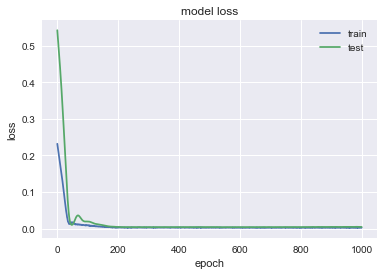

               KO
MSE       4.20551
MAE       1.78408
R2        0.25499
MAPE (%)  3.72785


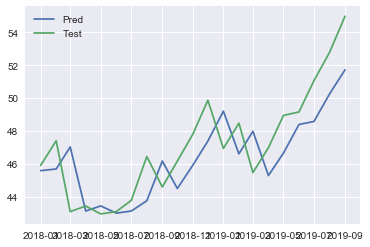

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3160 - val_loss: 0.0441
Epoch 2/1000
0s - loss: 0.3078 - val_loss: 0.0420
Epoch 3/1000
0s - loss: 0.3003 - val_loss: 0.0399
Epoch 4/1000
0s - loss: 0.2922 - val_loss: 0.0378
Epoch 5/1000
0s - loss: 0.2833 - val_loss: 0.0357
Epoch 6/1000
0s - loss: 0.2759 - val_loss: 0.0337
Epoch 7/1000
0s - loss: 0.2673 - val_loss: 0.0317
Epoch 8/1000
0s - loss: 0.2593 - val_loss: 0.0297
Epoch 9/1000
0s - loss: 0.2511 - val_loss: 0.0278
Epoch 10/1000
0s - loss: 0.2431 - val_loss: 0.0258
Epoch 11/1000
0s - loss: 0.2339 - val_loss: 0.0239
Epoch 12/1000
0s - loss: 0.2253 - val_loss: 0.0220
Epoch 13/1000
0s - loss: 0.2154 - val_loss: 0.0202
Epoch 14/1000
0s - loss: 0.2060 - val_loss: 0.0184
Epoch 15/1000
0s - loss: 0.1975 - val_loss: 0.0167
Epoch 16/1000
0s - loss: 0.1891 - val_loss: 0.0151
Epoch 17/1000
0s - loss: 0.1791 - val_loss: 0.0135
Epoch 18/1000
0s - loss: 0.1687 - val_loss: 0.0120
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0069 - val_loss: 0.0073
Epoch 169/1000
0s - loss: 0.0083 - val_loss: 0.0072
Epoch 170/1000
0s - loss: 0.0074 - val_loss: 0.0071
Epoch 171/1000
0s - loss: 0.0081 - val_loss: 0.0070
Epoch 172/1000
0s - loss: 0.0077 - val_loss: 0.0069
Epoch 173/1000
0s - loss: 0.0079 - val_loss: 0.0069
Epoch 174/1000
0s - loss: 0.0080 - val_loss: 0.0068
Epoch 175/1000
0s - loss: 0.0076 - val_loss: 0.0068
Epoch 176/1000
0s - loss: 0.0066 - val_loss: 0.0067
Epoch 177/1000
0s - loss: 0.0072 - val_loss: 0.0066
Epoch 178/1000
0s - loss: 0.0075 - val_loss: 0.0065
Epoch 179/1000
0s - loss: 0.0077 - val_loss: 0.0064
Epoch 180/1000
0s - loss: 0.0075 - val_loss: 0.0064
Epoch 181/1000
0s - loss: 0.0071 - val_loss: 0.0063
Epoch 182/1000
0s - loss: 0.0083 - val_loss: 0.0062
Epoch 183/1000
0s - loss: 0.0075 - val_loss: 0.0062
Epoch 184/1000
0s - loss: 0.0076 - val_loss: 0.0061
Epoch 185/1000
0s - loss: 0.0073 - val_loss: 0.0060
Epoch 186/1000
0s - loss: 0.0078 - val_loss: 0.0060
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0079 - val_loss: 0.0051
Epoch 340/1000
0s - loss: 0.0075 - val_loss: 0.0051
Epoch 341/1000
0s - loss: 0.0067 - val_loss: 0.0051
Epoch 342/1000
0s - loss: 0.0078 - val_loss: 0.0051
Epoch 343/1000
0s - loss: 0.0072 - val_loss: 0.0051
Epoch 344/1000
0s - loss: 0.0071 - val_loss: 0.0051
Epoch 345/1000
0s - loss: 0.0068 - val_loss: 0.0051
Epoch 346/1000
0s - loss: 0.0074 - val_loss: 0.0051
Epoch 347/1000
0s - loss: 0.0073 - val_loss: 0.0051
Epoch 348/1000
0s - loss: 0.0074 - val_loss: 0.0051
Epoch 349/1000
0s - loss: 0.0087 - val_loss: 0.0051
Epoch 350/1000
0s - loss: 0.0070 - val_loss: 0.0051
Epoch 351/1000
0s - loss: 0.0078 - val_loss: 0.0051
Epoch 352/1000
0s - loss: 0.0063 - val_loss: 0.0051
Epoch 353/1000
0s - loss: 0.0078 - val_loss: 0.0052
Epoch 354/1000
0s - loss: 0.0075 - val_loss: 0.0051
Epoch 355/1000
0s - loss: 0.0073 - val_loss: 0.0051
Epoch 356/1000
0s - loss: 0.0076 - val_loss: 0.0051
Epoch 357/1000
0s - loss: 0.0075 - val_loss: 0.0051
Epoch 358/1000
0s - loss: 0

0s - loss: 0.0076 - val_loss: 0.0050
Epoch 499/1000
0s - loss: 0.0074 - val_loss: 0.0050
Epoch 500/1000
0s - loss: 0.0066 - val_loss: 0.0051
Epoch 501/1000
0s - loss: 0.0081 - val_loss: 0.0051
Epoch 502/1000
0s - loss: 0.0077 - val_loss: 0.0051
Epoch 503/1000
0s - loss: 0.0080 - val_loss: 0.0051
Epoch 504/1000
0s - loss: 0.0078 - val_loss: 0.0051
Epoch 505/1000
0s - loss: 0.0075 - val_loss: 0.0051
Epoch 506/1000
0s - loss: 0.0070 - val_loss: 0.0051
Epoch 507/1000
0s - loss: 0.0070 - val_loss: 0.0051
Epoch 508/1000
0s - loss: 0.0080 - val_loss: 0.0051
Epoch 509/1000
0s - loss: 0.0078 - val_loss: 0.0050
Epoch 510/1000
0s - loss: 0.0084 - val_loss: 0.0050
Epoch 511/1000
0s - loss: 0.0068 - val_loss: 0.0050
Epoch 512/1000
0s - loss: 0.0072 - val_loss: 0.0050
Epoch 513/1000
0s - loss: 0.0075 - val_loss: 0.0050
Epoch 514/1000
0s - loss: 0.0073 - val_loss: 0.0050
Epoch 515/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 516/1000
0s - loss: 0.0081 - val_loss: 0.0049
Epoch 517/1000
0s - loss: 0

0s - loss: 0.0063 - val_loss: 0.0048
Epoch 664/1000
0s - loss: 0.0075 - val_loss: 0.0048
Epoch 665/1000
0s - loss: 0.0072 - val_loss: 0.0048
Epoch 666/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 667/1000
0s - loss: 0.0075 - val_loss: 0.0049
Epoch 668/1000
0s - loss: 0.0070 - val_loss: 0.0049
Epoch 669/1000
0s - loss: 0.0070 - val_loss: 0.0050
Epoch 670/1000
0s - loss: 0.0068 - val_loss: 0.0050
Epoch 671/1000
0s - loss: 0.0073 - val_loss: 0.0050
Epoch 672/1000
0s - loss: 0.0078 - val_loss: 0.0050
Epoch 673/1000
0s - loss: 0.0075 - val_loss: 0.0049
Epoch 674/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 675/1000
0s - loss: 0.0069 - val_loss: 0.0049
Epoch 676/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 677/1000
0s - loss: 0.0071 - val_loss: 0.0049
Epoch 678/1000
0s - loss: 0.0075 - val_loss: 0.0049
Epoch 679/1000
0s - loss: 0.0082 - val_loss: 0.0049
Epoch 680/1000
0s - loss: 0.0083 - val_loss: 0.0048
Epoch 681/1000
0s - loss: 0.0079 - val_loss: 0.0047
Epoch 682/1000
0s - loss: 0

0s - loss: 0.0076 - val_loss: 0.0049
Epoch 829/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 830/1000
0s - loss: 0.0067 - val_loss: 0.0048
Epoch 831/1000
0s - loss: 0.0070 - val_loss: 0.0048
Epoch 832/1000
0s - loss: 0.0078 - val_loss: 0.0048
Epoch 833/1000
0s - loss: 0.0069 - val_loss: 0.0048
Epoch 834/1000
0s - loss: 0.0072 - val_loss: 0.0048
Epoch 835/1000
0s - loss: 0.0067 - val_loss: 0.0048
Epoch 836/1000
0s - loss: 0.0078 - val_loss: 0.0048
Epoch 837/1000
0s - loss: 0.0080 - val_loss: 0.0048
Epoch 838/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 839/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 840/1000
0s - loss: 0.0079 - val_loss: 0.0048
Epoch 841/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 842/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 843/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 844/1000
0s - loss: 0.0065 - val_loss: 0.0047
Epoch 845/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 846/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 847/1000
0s - loss: 0

0s - loss: 0.0077 - val_loss: 0.0046
Epoch 989/1000
0s - loss: 0.0065 - val_loss: 0.0047
Epoch 990/1000
0s - loss: 0.0078 - val_loss: 0.0048
Epoch 991/1000
0s - loss: 0.0069 - val_loss: 0.0049
Epoch 992/1000
0s - loss: 0.0070 - val_loss: 0.0049
Epoch 993/1000
0s - loss: 0.0077 - val_loss: 0.0049
Epoch 994/1000
0s - loss: 0.0071 - val_loss: 0.0048
Epoch 995/1000
0s - loss: 0.0079 - val_loss: 0.0047
Epoch 996/1000
0s - loss: 0.0080 - val_loss: 0.0046
Epoch 997/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 998/1000
0s - loss: 0.0078 - val_loss: 0.0045
Epoch 999/1000
0s - loss: 0.0066 - val_loss: 0.0045
Epoch 1000/1000
0s - loss: 0.0073 - val_loss: 0.0045


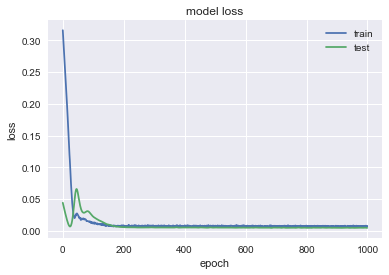

               FTI
MSE        8.31563
MAE        2.22934
R2        0.405056
MAPE (%)   8.85801


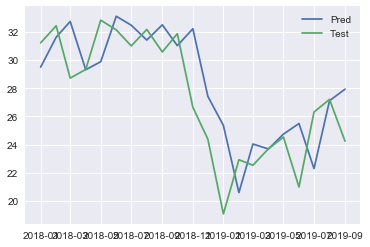

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1525 - val_loss: 0.6250
Epoch 2/1000
0s - loss: 0.1485 - val_loss: 0.6124
Epoch 3/1000
0s - loss: 0.1443 - val_loss: 0.5997
Epoch 4/1000
0s - loss: 0.1402 - val_loss: 0.5869
Epoch 5/1000
0s - loss: 0.1361 - val_loss: 0.5739
Epoch 6/1000
0s - loss: 0.1321 - val_loss: 0.5608
Epoch 7/1000
0s - loss: 0.1279 - val_loss: 0.5475
Epoch 8/1000
0s - loss: 0.1239 - val_loss: 0.5340
Epoch 9/1000
0s - loss: 0.1196 - val_loss: 0.5201
Epoch 10/1000
0s - loss: 0.1153 - val_loss: 0.5060
Epoch 11/1000
0s - loss: 0.1116 - val_loss: 0.4915
Epoch 12/1000
0s - loss: 0.1069 - val_loss: 0.4768
Epoch 13/1000
0s - loss: 0.1025 - val_loss: 0.4616
Epoch 14/1000
0s - loss: 0.0982 - val_loss: 0.4462
Epoch 15/1000
0s - loss: 0.0936 - val_loss: 0.4304
Epoch 16/1000
0s - loss: 0.0893 - val_loss: 0.4142
Epoch 17/1000
0s - loss: 0.0844 - val_loss: 0.3977
Epoch 18/1000
0s - loss: 0.0799 - val_loss: 0.3808
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0023 - val_loss: 0.0186
Epoch 163/1000
0s - loss: 0.0021 - val_loss: 0.0185
Epoch 164/1000
0s - loss: 0.0021 - val_loss: 0.0183
Epoch 165/1000
0s - loss: 0.0023 - val_loss: 0.0180
Epoch 166/1000
0s - loss: 0.0023 - val_loss: 0.0178
Epoch 167/1000
0s - loss: 0.0026 - val_loss: 0.0175
Epoch 168/1000
0s - loss: 0.0021 - val_loss: 0.0173
Epoch 169/1000
0s - loss: 0.0023 - val_loss: 0.0170
Epoch 170/1000
0s - loss: 0.0023 - val_loss: 0.0167
Epoch 171/1000
0s - loss: 0.0023 - val_loss: 0.0164
Epoch 172/1000
0s - loss: 0.0023 - val_loss: 0.0161
Epoch 173/1000
0s - loss: 0.0024 - val_loss: 0.0160
Epoch 174/1000
0s - loss: 0.0022 - val_loss: 0.0159
Epoch 175/1000
0s - loss: 0.0019 - val_loss: 0.0158
Epoch 176/1000
0s - loss: 0.0021 - val_loss: 0.0157
Epoch 177/1000
0s - loss: 0.0023 - val_loss: 0.0156
Epoch 178/1000
0s - loss: 0.0024 - val_loss: 0.0155
Epoch 179/1000
0s - loss: 0.0020 - val_loss: 0.0154
Epoch 180/1000
0s - loss: 0.0024 - val_loss: 0.0155
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0150
Epoch 328/1000
0s - loss: 0.0019 - val_loss: 0.0150
Epoch 329/1000
0s - loss: 0.0022 - val_loss: 0.0149
Epoch 330/1000
0s - loss: 0.0020 - val_loss: 0.0148
Epoch 331/1000
0s - loss: 0.0023 - val_loss: 0.0147
Epoch 332/1000
0s - loss: 0.0022 - val_loss: 0.0146
Epoch 333/1000
0s - loss: 0.0021 - val_loss: 0.0145
Epoch 334/1000
0s - loss: 0.0020 - val_loss: 0.0145
Epoch 335/1000
0s - loss: 0.0019 - val_loss: 0.0146
Epoch 336/1000
0s - loss: 0.0020 - val_loss: 0.0146
Epoch 337/1000
0s - loss: 0.0020 - val_loss: 0.0147
Epoch 338/1000
0s - loss: 0.0018 - val_loss: 0.0149
Epoch 339/1000
0s - loss: 0.0020 - val_loss: 0.0150
Epoch 340/1000
0s - loss: 0.0027 - val_loss: 0.0151
Epoch 341/1000
0s - loss: 0.0020 - val_loss: 0.0152
Epoch 342/1000
0s - loss: 0.0020 - val_loss: 0.0151
Epoch 343/1000
0s - loss: 0.0022 - val_loss: 0.0150
Epoch 344/1000
0s - loss: 0.0022 - val_loss: 0.0147
Epoch 345/1000
0s - loss: 0.0021 - val_loss: 0.0145
Epoch 346/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0136
Epoch 491/1000
0s - loss: 0.0020 - val_loss: 0.0137
Epoch 492/1000
0s - loss: 0.0022 - val_loss: 0.0139
Epoch 493/1000
0s - loss: 0.0020 - val_loss: 0.0140
Epoch 494/1000
0s - loss: 0.0020 - val_loss: 0.0141
Epoch 495/1000
0s - loss: 0.0022 - val_loss: 0.0140
Epoch 496/1000
0s - loss: 0.0018 - val_loss: 0.0138
Epoch 497/1000
0s - loss: 0.0018 - val_loss: 0.0135
Epoch 498/1000
0s - loss: 0.0020 - val_loss: 0.0132
Epoch 499/1000
0s - loss: 0.0022 - val_loss: 0.0130
Epoch 500/1000
0s - loss: 0.0020 - val_loss: 0.0129
Epoch 501/1000
0s - loss: 0.0021 - val_loss: 0.0128
Epoch 502/1000
0s - loss: 0.0021 - val_loss: 0.0128
Epoch 503/1000
0s - loss: 0.0020 - val_loss: 0.0130
Epoch 504/1000
0s - loss: 0.0022 - val_loss: 0.0133
Epoch 505/1000
0s - loss: 0.0024 - val_loss: 0.0135
Epoch 506/1000
0s - loss: 0.0021 - val_loss: 0.0136
Epoch 507/1000
0s - loss: 0.0020 - val_loss: 0.0136
Epoch 508/1000
0s - loss: 0.0018 - val_loss: 0.0137
Epoch 509/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0117
Epoch 656/1000
0s - loss: 0.0021 - val_loss: 0.0116
Epoch 657/1000
0s - loss: 0.0019 - val_loss: 0.0117
Epoch 658/1000
0s - loss: 0.0020 - val_loss: 0.0116
Epoch 659/1000
0s - loss: 0.0025 - val_loss: 0.0118
Epoch 660/1000
0s - loss: 0.0018 - val_loss: 0.0119
Epoch 661/1000
0s - loss: 0.0021 - val_loss: 0.0121
Epoch 662/1000
0s - loss: 0.0021 - val_loss: 0.0124
Epoch 663/1000
0s - loss: 0.0019 - val_loss: 0.0125
Epoch 664/1000
0s - loss: 0.0024 - val_loss: 0.0127
Epoch 665/1000
0s - loss: 0.0021 - val_loss: 0.0129
Epoch 666/1000
0s - loss: 0.0023 - val_loss: 0.0129
Epoch 667/1000
0s - loss: 0.0022 - val_loss: 0.0128
Epoch 668/1000
0s - loss: 0.0018 - val_loss: 0.0126
Epoch 669/1000
0s - loss: 0.0018 - val_loss: 0.0123
Epoch 670/1000
0s - loss: 0.0018 - val_loss: 0.0120
Epoch 671/1000
0s - loss: 0.0019 - val_loss: 0.0117
Epoch 672/1000
0s - loss: 0.0023 - val_loss: 0.0115
Epoch 673/1000
0s - loss: 0.0020 - val_loss: 0.0113
Epoch 674/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0104
Epoch 829/1000
0s - loss: 0.0022 - val_loss: 0.0104
Epoch 830/1000
0s - loss: 0.0019 - val_loss: 0.0104
Epoch 831/1000
0s - loss: 0.0019 - val_loss: 0.0105
Epoch 832/1000
0s - loss: 0.0020 - val_loss: 0.0107
Epoch 833/1000
0s - loss: 0.0024 - val_loss: 0.0108
Epoch 834/1000
0s - loss: 0.0020 - val_loss: 0.0111
Epoch 835/1000
0s - loss: 0.0019 - val_loss: 0.0112
Epoch 836/1000
0s - loss: 0.0019 - val_loss: 0.0112
Epoch 837/1000
0s - loss: 0.0022 - val_loss: 0.0111
Epoch 838/1000
0s - loss: 0.0021 - val_loss: 0.0109
Epoch 839/1000
0s - loss: 0.0021 - val_loss: 0.0107
Epoch 840/1000
0s - loss: 0.0019 - val_loss: 0.0103
Epoch 841/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 842/1000
0s - loss: 0.0021 - val_loss: 0.0101
Epoch 843/1000
0s - loss: 0.0020 - val_loss: 0.0100
Epoch 844/1000
0s - loss: 0.0022 - val_loss: 0.0101
Epoch 845/1000
0s - loss: 0.0022 - val_loss: 0.0103
Epoch 846/1000
0s - loss: 0.0021 - val_loss: 0.0106
Epoch 847/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0107


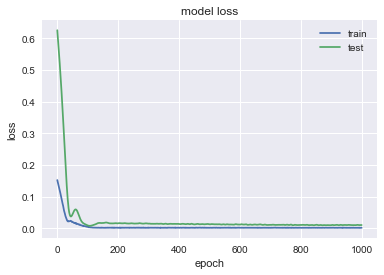

               BLK
MSE        1855.98
MAE        36.4198
R2        0.358425
MAPE (%)   7.99655


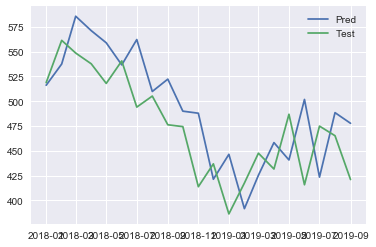

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3542 - val_loss: 0.4020
Epoch 2/1000
0s - loss: 0.3472 - val_loss: 0.3939
Epoch 3/1000
0s - loss: 0.3404 - val_loss: 0.3857
Epoch 4/1000
0s - loss: 0.3332 - val_loss: 0.3775
Epoch 5/1000
0s - loss: 0.3267 - val_loss: 0.3693
Epoch 6/1000
0s - loss: 0.3194 - val_loss: 0.3610
Epoch 7/1000
0s - loss: 0.3128 - val_loss: 0.3525
Epoch 8/1000
0s - loss: 0.3049 - val_loss: 0.3439
Epoch 9/1000
0s - loss: 0.2975 - val_loss: 0.3351
Epoch 10/1000
0s - loss: 0.2903 - val_loss: 0.3261
Epoch 11/1000
0s - loss: 0.2824 - val_loss: 0.3168
Epoch 12/1000
0s - loss: 0.2741 - val_loss: 0.3074
Epoch 13/1000
0s - loss: 0.2668 - val_loss: 0.2977
Epoch 14/1000
0s - loss: 0.2595 - val_loss: 0.2877
Epoch 15/1000
0s - loss: 0.2511 - val_loss: 0.2776
Epoch 16/1000
0s - loss: 0.2425 - val_loss: 0.2671
Epoch 17/1000
0s - loss: 0.2339 - val_loss: 0.2564
Epoch 18/1000
0s - loss: 0.2237 - val_loss: 0.2455
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0047 - val_loss: 0.0139
Epoch 172/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 173/1000
0s - loss: 0.0055 - val_loss: 0.0140
Epoch 174/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 175/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 176/1000
0s - loss: 0.0056 - val_loss: 0.0141
Epoch 177/1000
0s - loss: 0.0045 - val_loss: 0.0141
Epoch 178/1000
0s - loss: 0.0048 - val_loss: 0.0141
Epoch 179/1000
0s - loss: 0.0060 - val_loss: 0.0141
Epoch 180/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 181/1000
0s - loss: 0.0053 - val_loss: 0.0141
Epoch 182/1000
0s - loss: 0.0053 - val_loss: 0.0141
Epoch 183/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 184/1000
0s - loss: 0.0047 - val_loss: 0.0142
Epoch 185/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 186/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 187/1000
0s - loss: 0.0045 - val_loss: 0.0142
Epoch 188/1000
0s - loss: 0.0050 - val_loss: 0.0142
Epoch 189/1000
0s - loss: 0.0054 - val_loss: 0.0142
Epoch 190/1000
0s - loss: 0

0s - loss: 0.0045 - val_loss: 0.0143
Epoch 333/1000
0s - loss: 0.0045 - val_loss: 0.0142
Epoch 334/1000
0s - loss: 0.0051 - val_loss: 0.0142
Epoch 335/1000
0s - loss: 0.0044 - val_loss: 0.0142
Epoch 336/1000
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 337/1000
0s - loss: 0.0045 - val_loss: 0.0142
Epoch 338/1000
0s - loss: 0.0047 - val_loss: 0.0142
Epoch 339/1000
0s - loss: 0.0045 - val_loss: 0.0142
Epoch 340/1000
0s - loss: 0.0051 - val_loss: 0.0142
Epoch 341/1000
0s - loss: 0.0056 - val_loss: 0.0142
Epoch 342/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 343/1000
0s - loss: 0.0049 - val_loss: 0.0142
Epoch 344/1000
0s - loss: 0.0047 - val_loss: 0.0142
Epoch 345/1000
0s - loss: 0.0045 - val_loss: 0.0142
Epoch 346/1000
0s - loss: 0.0050 - val_loss: 0.0142
Epoch 347/1000
0s - loss: 0.0050 - val_loss: 0.0142
Epoch 348/1000
0s - loss: 0.0043 - val_loss: 0.0143
Epoch 349/1000
0s - loss: 0.0051 - val_loss: 0.0143
Epoch 350/1000
0s - loss: 0.0048 - val_loss: 0.0142
Epoch 351/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0141
Epoch 500/1000
0s - loss: 0.0045 - val_loss: 0.0141
Epoch 501/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 502/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 503/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 504/1000
0s - loss: 0.0046 - val_loss: 0.0141
Epoch 505/1000
0s - loss: 0.0045 - val_loss: 0.0141
Epoch 506/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 507/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 508/1000
0s - loss: 0.0046 - val_loss: 0.0141
Epoch 509/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 510/1000
0s - loss: 0.0047 - val_loss: 0.0142
Epoch 511/1000
0s - loss: 0.0049 - val_loss: 0.0142
Epoch 512/1000
0s - loss: 0.0057 - val_loss: 0.0142
Epoch 513/1000
0s - loss: 0.0051 - val_loss: 0.0142
Epoch 514/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 515/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 516/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 517/1000
0s - loss: 0.0062 - val_loss: 0.0141
Epoch 518/1000
0s - loss: 0

0s - loss: 0.0045 - val_loss: 0.0141
Epoch 669/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 670/1000
0s - loss: 0.0053 - val_loss: 0.0141
Epoch 671/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 672/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 673/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 674/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 675/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 676/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 677/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 678/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 679/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 680/1000
0s - loss: 0.0047 - val_loss: 0.0140
Epoch 681/1000
0s - loss: 0.0046 - val_loss: 0.0140
Epoch 682/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 683/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 684/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 685/1000
0s - loss: 0.0047 - val_loss: 0.0141
Epoch 686/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 687/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0141
Epoch 833/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 834/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 835/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 836/1000
0s - loss: 0.0048 - val_loss: 0.0141
Epoch 837/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 838/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 839/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 840/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 841/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 842/1000
0s - loss: 0.0037 - val_loss: 0.0139
Epoch 843/1000
0s - loss: 0.0044 - val_loss: 0.0139
Epoch 844/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 845/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 846/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 847/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 848/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 849/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 850/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 851/1000
0s - loss: 0

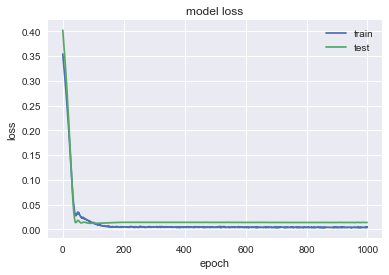

               DVA
MSE        41.9276
MAE        4.82527
R2        0.308827
MAPE (%)   8.22096


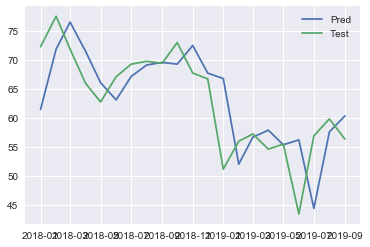

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0394 - val_loss: 0.5871
Epoch 2/1000
0s - loss: 0.0377 - val_loss: 0.5744
Epoch 3/1000
0s - loss: 0.0360 - val_loss: 0.5617
Epoch 4/1000
0s - loss: 0.0344 - val_loss: 0.5491
Epoch 5/1000
0s - loss: 0.0328 - val_loss: 0.5364
Epoch 6/1000
0s - loss: 0.0312 - val_loss: 0.5237
Epoch 7/1000
0s - loss: 0.0298 - val_loss: 0.5109
Epoch 8/1000
0s - loss: 0.0283 - val_loss: 0.4980
Epoch 9/1000
0s - loss: 0.0267 - val_loss: 0.4850
Epoch 10/1000
0s - loss: 0.0254 - val_loss: 0.4717
Epoch 11/1000
0s - loss: 0.0240 - val_loss: 0.4583
Epoch 12/1000
0s - loss: 0.0226 - val_loss: 0.4446
Epoch 13/1000
0s - loss: 0.0212 - val_loss: 0.4307
Epoch 14/1000
0s - loss: 0.0199 - val_loss: 0.4166
Epoch 15/1000
0s - loss: 0.0186 - val_loss: 0.4022
Epoch 16/1000
0s - loss: 0.0176 - val_loss: 0.3877
Epoch 17/1000
0s - loss: 0.0165 - val_loss: 0.3730
Epoch 18/1000
0s - loss: 0.0155 - val_loss: 0.3581
Epoch 19/1000
0s - loss: 0.0

0s - loss: 5.9605e-04 - val_loss: 0.0205
Epoch 155/1000
0s - loss: 4.8383e-04 - val_loss: 0.0206
Epoch 156/1000
0s - loss: 5.6066e-04 - val_loss: 0.0208
Epoch 157/1000
0s - loss: 4.9672e-04 - val_loss: 0.0210
Epoch 158/1000
0s - loss: 5.1649e-04 - val_loss: 0.0212
Epoch 159/1000
0s - loss: 4.7531e-04 - val_loss: 0.0215
Epoch 160/1000
0s - loss: 4.5150e-04 - val_loss: 0.0218
Epoch 161/1000
0s - loss: 5.4866e-04 - val_loss: 0.0220
Epoch 162/1000
0s - loss: 5.0874e-04 - val_loss: 0.0221
Epoch 163/1000
0s - loss: 6.5166e-04 - val_loss: 0.0222
Epoch 164/1000
0s - loss: 5.8660e-04 - val_loss: 0.0222
Epoch 165/1000
0s - loss: 4.5032e-04 - val_loss: 0.0223
Epoch 166/1000
0s - loss: 4.9497e-04 - val_loss: 0.0222
Epoch 167/1000
0s - loss: 4.0406e-04 - val_loss: 0.0222
Epoch 168/1000
0s - loss: 6.0806e-04 - val_loss: 0.0220
Epoch 169/1000
0s - loss: 5.3406e-04 - val_loss: 0.0221
Epoch 170/1000
0s - loss: 5.7577e-04 - val_loss: 0.0223
Epoch 171/1000
0s - loss: 5.7665e-04 - val_loss: 0.0227
Epoch 1

0s - loss: 5.5395e-04 - val_loss: 0.0175
Epoch 309/1000
0s - loss: 5.2358e-04 - val_loss: 0.0175
Epoch 310/1000
0s - loss: 5.3097e-04 - val_loss: 0.0175
Epoch 311/1000
0s - loss: 5.1574e-04 - val_loss: 0.0178
Epoch 312/1000
0s - loss: 5.3416e-04 - val_loss: 0.0183
Epoch 313/1000
0s - loss: 5.5134e-04 - val_loss: 0.0191
Epoch 314/1000
0s - loss: 5.4908e-04 - val_loss: 0.0196
Epoch 315/1000
0s - loss: 5.2412e-04 - val_loss: 0.0198
Epoch 316/1000
0s - loss: 5.5657e-04 - val_loss: 0.0197
Epoch 317/1000
0s - loss: 4.3553e-04 - val_loss: 0.0196
Epoch 318/1000
0s - loss: 4.9630e-04 - val_loss: 0.0195
Epoch 319/1000
0s - loss: 5.2121e-04 - val_loss: 0.0193
Epoch 320/1000
0s - loss: 6.0205e-04 - val_loss: 0.0189
Epoch 321/1000
0s - loss: 5.0824e-04 - val_loss: 0.0186
Epoch 322/1000
0s - loss: 4.9166e-04 - val_loss: 0.0186
Epoch 323/1000
0s - loss: 6.7551e-04 - val_loss: 0.0186
Epoch 324/1000
0s - loss: 4.8029e-04 - val_loss: 0.0187
Epoch 325/1000
0s - loss: 5.5948e-04 - val_loss: 0.0188
Epoch 3

0s - loss: 5.3538e-04 - val_loss: 0.0156
Epoch 469/1000
0s - loss: 5.8037e-04 - val_loss: 0.0155
Epoch 470/1000
0s - loss: 4.0143e-04 - val_loss: 0.0154
Epoch 471/1000
0s - loss: 5.3088e-04 - val_loss: 0.0154
Epoch 472/1000
0s - loss: 4.3187e-04 - val_loss: 0.0156
Epoch 473/1000
0s - loss: 4.5257e-04 - val_loss: 0.0158
Epoch 474/1000
0s - loss: 6.0529e-04 - val_loss: 0.0158
Epoch 475/1000
0s - loss: 6.5603e-04 - val_loss: 0.0156
Epoch 476/1000
0s - loss: 5.0044e-04 - val_loss: 0.0154
Epoch 477/1000
0s - loss: 5.1342e-04 - val_loss: 0.0152
Epoch 478/1000
0s - loss: 4.2107e-04 - val_loss: 0.0150
Epoch 479/1000
0s - loss: 5.3081e-04 - val_loss: 0.0150
Epoch 480/1000
0s - loss: 5.2466e-04 - val_loss: 0.0150
Epoch 481/1000
0s - loss: 4.1997e-04 - val_loss: 0.0152
Epoch 482/1000
0s - loss: 4.5220e-04 - val_loss: 0.0153
Epoch 483/1000
0s - loss: 3.7292e-04 - val_loss: 0.0156
Epoch 484/1000
0s - loss: 4.6781e-04 - val_loss: 0.0158
Epoch 485/1000
0s - loss: 5.1003e-04 - val_loss: 0.0157
Epoch 4

0s - loss: 4.8250e-04 - val_loss: 0.0145
Epoch 619/1000
0s - loss: 4.8192e-04 - val_loss: 0.0145
Epoch 620/1000
0s - loss: 3.7678e-04 - val_loss: 0.0145
Epoch 621/1000
0s - loss: 4.1659e-04 - val_loss: 0.0147
Epoch 622/1000
0s - loss: 5.0989e-04 - val_loss: 0.0150
Epoch 623/1000
0s - loss: 5.3405e-04 - val_loss: 0.0152
Epoch 624/1000
0s - loss: 4.5180e-04 - val_loss: 0.0152
Epoch 625/1000
0s - loss: 4.5133e-04 - val_loss: 0.0153
Epoch 626/1000
0s - loss: 5.5050e-04 - val_loss: 0.0153
Epoch 627/1000
0s - loss: 4.2926e-04 - val_loss: 0.0154
Epoch 628/1000
0s - loss: 3.8302e-04 - val_loss: 0.0154
Epoch 629/1000
0s - loss: 5.2513e-04 - val_loss: 0.0155
Epoch 630/1000
0s - loss: 4.8637e-04 - val_loss: 0.0154
Epoch 631/1000
0s - loss: 5.6490e-04 - val_loss: 0.0153
Epoch 632/1000
0s - loss: 4.4898e-04 - val_loss: 0.0151
Epoch 633/1000
0s - loss: 4.7298e-04 - val_loss: 0.0148
Epoch 634/1000
0s - loss: 4.4011e-04 - val_loss: 0.0147
Epoch 635/1000
0s - loss: 5.0993e-04 - val_loss: 0.0149
Epoch 6

0s - loss: 4.4682e-04 - val_loss: 0.0131
Epoch 772/1000
0s - loss: 4.1247e-04 - val_loss: 0.0131
Epoch 773/1000
0s - loss: 4.9754e-04 - val_loss: 0.0133
Epoch 774/1000
0s - loss: 4.9073e-04 - val_loss: 0.0132
Epoch 775/1000
0s - loss: 4.4708e-04 - val_loss: 0.0133
Epoch 776/1000
0s - loss: 6.5280e-04 - val_loss: 0.0133
Epoch 777/1000
0s - loss: 4.7518e-04 - val_loss: 0.0134
Epoch 778/1000
0s - loss: 4.6988e-04 - val_loss: 0.0134
Epoch 779/1000
0s - loss: 4.2284e-04 - val_loss: 0.0132
Epoch 780/1000
0s - loss: 4.6121e-04 - val_loss: 0.0131
Epoch 781/1000
0s - loss: 3.9256e-04 - val_loss: 0.0129
Epoch 782/1000
0s - loss: 4.3351e-04 - val_loss: 0.0129
Epoch 783/1000
0s - loss: 4.5658e-04 - val_loss: 0.0130
Epoch 784/1000
0s - loss: 4.1713e-04 - val_loss: 0.0130
Epoch 785/1000
0s - loss: 5.8129e-04 - val_loss: 0.0129
Epoch 786/1000
0s - loss: 5.7540e-04 - val_loss: 0.0129
Epoch 787/1000
0s - loss: 4.3040e-04 - val_loss: 0.0130
Epoch 788/1000
0s - loss: 4.3588e-04 - val_loss: 0.0131
Epoch 7

0s - loss: 4.5050e-04 - val_loss: 0.0122
Epoch 926/1000
0s - loss: 4.7005e-04 - val_loss: 0.0123
Epoch 927/1000
0s - loss: 4.7728e-04 - val_loss: 0.0125
Epoch 928/1000
0s - loss: 5.4209e-04 - val_loss: 0.0128
Epoch 929/1000
0s - loss: 4.1768e-04 - val_loss: 0.0130
Epoch 930/1000
0s - loss: 3.9113e-04 - val_loss: 0.0131
Epoch 931/1000
0s - loss: 4.2304e-04 - val_loss: 0.0129
Epoch 932/1000
0s - loss: 4.6465e-04 - val_loss: 0.0127
Epoch 933/1000
0s - loss: 5.1796e-04 - val_loss: 0.0126
Epoch 934/1000
0s - loss: 4.3368e-04 - val_loss: 0.0127
Epoch 935/1000
0s - loss: 4.3358e-04 - val_loss: 0.0127
Epoch 936/1000
0s - loss: 4.8096e-04 - val_loss: 0.0130
Epoch 937/1000
0s - loss: 5.3487e-04 - val_loss: 0.0133
Epoch 938/1000
0s - loss: 4.1158e-04 - val_loss: 0.0136
Epoch 939/1000
0s - loss: 4.3730e-04 - val_loss: 0.0138
Epoch 940/1000
0s - loss: 5.2790e-04 - val_loss: 0.0135
Epoch 941/1000
0s - loss: 4.4562e-04 - val_loss: 0.0132
Epoch 942/1000
0s - loss: 4.2518e-04 - val_loss: 0.0129
Epoch 9

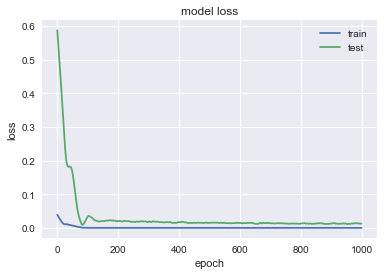

                BA
MSE        1957.23
MAE        34.9787
R2       -0.220421
MAPE (%)   9.92091


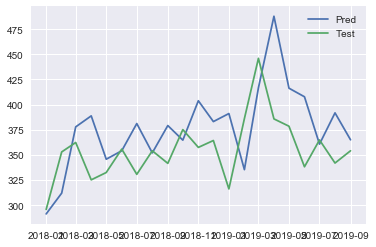

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3609 - val_loss: 0.0919
Epoch 2/1000
0s - loss: 0.3525 - val_loss: 0.0886
Epoch 3/1000
0s - loss: 0.3439 - val_loss: 0.0853
Epoch 4/1000
0s - loss: 0.3350 - val_loss: 0.0821
Epoch 5/1000
0s - loss: 0.3269 - val_loss: 0.0789
Epoch 6/1000
0s - loss: 0.3182 - val_loss: 0.0756
Epoch 7/1000
0s - loss: 0.3096 - val_loss: 0.0724
Epoch 8/1000
0s - loss: 0.3015 - val_loss: 0.0692
Epoch 9/1000
0s - loss: 0.2920 - val_loss: 0.0660
Epoch 10/1000
0s - loss: 0.2843 - val_loss: 0.0627
Epoch 11/1000
0s - loss: 0.2747 - val_loss: 0.0595
Epoch 12/1000
0s - loss: 0.2660 - val_loss: 0.0562
Epoch 13/1000
0s - loss: 0.2576 - val_loss: 0.0529
Epoch 14/1000
0s - loss: 0.2457 - val_loss: 0.0496
Epoch 15/1000
0s - loss: 0.2368 - val_loss: 0.0464
Epoch 16/1000
0s - loss: 0.2269 - val_loss: 0.0431
Epoch 17/1000
0s - loss: 0.2158 - val_loss: 0.0399
Epoch 18/1000
0s - loss: 0.2057 - val_loss: 0.0367
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0072 - val_loss: 0.0166
Epoch 171/1000
0s - loss: 0.0082 - val_loss: 0.0165
Epoch 172/1000
0s - loss: 0.0078 - val_loss: 0.0164
Epoch 173/1000
0s - loss: 0.0087 - val_loss: 0.0163
Epoch 174/1000
0s - loss: 0.0078 - val_loss: 0.0162
Epoch 175/1000
0s - loss: 0.0090 - val_loss: 0.0161
Epoch 176/1000
0s - loss: 0.0083 - val_loss: 0.0159
Epoch 177/1000
0s - loss: 0.0077 - val_loss: 0.0158
Epoch 178/1000
0s - loss: 0.0075 - val_loss: 0.0157
Epoch 179/1000
0s - loss: 0.0082 - val_loss: 0.0156
Epoch 180/1000
0s - loss: 0.0074 - val_loss: 0.0156
Epoch 181/1000
0s - loss: 0.0080 - val_loss: 0.0155
Epoch 182/1000
0s - loss: 0.0087 - val_loss: 0.0154
Epoch 183/1000
0s - loss: 0.0084 - val_loss: 0.0154
Epoch 184/1000
0s - loss: 0.0078 - val_loss: 0.0153
Epoch 185/1000
0s - loss: 0.0078 - val_loss: 0.0152
Epoch 186/1000
0s - loss: 0.0070 - val_loss: 0.0152
Epoch 187/1000
0s - loss: 0.0073 - val_loss: 0.0151
Epoch 188/1000
0s - loss: 0.0080 - val_loss: 0.0150
Epoch 189/1000
0s - loss: 0

0s - loss: 0.0077 - val_loss: 0.0133
Epoch 339/1000
0s - loss: 0.0072 - val_loss: 0.0133
Epoch 340/1000
0s - loss: 0.0085 - val_loss: 0.0133
Epoch 341/1000
0s - loss: 0.0072 - val_loss: 0.0132
Epoch 342/1000
0s - loss: 0.0082 - val_loss: 0.0132
Epoch 343/1000
0s - loss: 0.0078 - val_loss: 0.0132
Epoch 344/1000
0s - loss: 0.0069 - val_loss: 0.0131
Epoch 345/1000
0s - loss: 0.0063 - val_loss: 0.0131
Epoch 346/1000
0s - loss: 0.0071 - val_loss: 0.0131
Epoch 347/1000
0s - loss: 0.0078 - val_loss: 0.0131
Epoch 348/1000
0s - loss: 0.0070 - val_loss: 0.0131
Epoch 349/1000
0s - loss: 0.0075 - val_loss: 0.0131
Epoch 350/1000
0s - loss: 0.0070 - val_loss: 0.0132
Epoch 351/1000
0s - loss: 0.0077 - val_loss: 0.0132
Epoch 352/1000
0s - loss: 0.0069 - val_loss: 0.0132
Epoch 353/1000
0s - loss: 0.0074 - val_loss: 0.0133
Epoch 354/1000
0s - loss: 0.0077 - val_loss: 0.0133
Epoch 355/1000
0s - loss: 0.0067 - val_loss: 0.0133
Epoch 356/1000
0s - loss: 0.0077 - val_loss: 0.0133
Epoch 357/1000
0s - loss: 0

0s - loss: 0.0079 - val_loss: 0.0132
Epoch 497/1000
0s - loss: 0.0071 - val_loss: 0.0133
Epoch 498/1000
0s - loss: 0.0058 - val_loss: 0.0133
Epoch 499/1000
0s - loss: 0.0071 - val_loss: 0.0133
Epoch 500/1000
0s - loss: 0.0073 - val_loss: 0.0133
Epoch 501/1000
0s - loss: 0.0074 - val_loss: 0.0133
Epoch 502/1000
0s - loss: 0.0068 - val_loss: 0.0132
Epoch 503/1000
0s - loss: 0.0064 - val_loss: 0.0132
Epoch 504/1000
0s - loss: 0.0076 - val_loss: 0.0132
Epoch 505/1000
0s - loss: 0.0069 - val_loss: 0.0132
Epoch 506/1000
0s - loss: 0.0075 - val_loss: 0.0133
Epoch 507/1000
0s - loss: 0.0074 - val_loss: 0.0133
Epoch 508/1000
0s - loss: 0.0074 - val_loss: 0.0134
Epoch 509/1000
0s - loss: 0.0082 - val_loss: 0.0134
Epoch 510/1000
0s - loss: 0.0077 - val_loss: 0.0134
Epoch 511/1000
0s - loss: 0.0071 - val_loss: 0.0133
Epoch 512/1000
0s - loss: 0.0074 - val_loss: 0.0133
Epoch 513/1000
0s - loss: 0.0083 - val_loss: 0.0133
Epoch 514/1000
0s - loss: 0.0075 - val_loss: 0.0133
Epoch 515/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0136
Epoch 655/1000
0s - loss: 0.0060 - val_loss: 0.0136
Epoch 656/1000
0s - loss: 0.0067 - val_loss: 0.0135
Epoch 657/1000
0s - loss: 0.0066 - val_loss: 0.0134
Epoch 658/1000
0s - loss: 0.0067 - val_loss: 0.0134
Epoch 659/1000
0s - loss: 0.0070 - val_loss: 0.0133
Epoch 660/1000
0s - loss: 0.0060 - val_loss: 0.0133
Epoch 661/1000
0s - loss: 0.0065 - val_loss: 0.0132
Epoch 662/1000
0s - loss: 0.0072 - val_loss: 0.0133
Epoch 663/1000
0s - loss: 0.0070 - val_loss: 0.0133
Epoch 664/1000
0s - loss: 0.0068 - val_loss: 0.0133
Epoch 665/1000
0s - loss: 0.0067 - val_loss: 0.0134
Epoch 666/1000
0s - loss: 0.0067 - val_loss: 0.0134
Epoch 667/1000
0s - loss: 0.0069 - val_loss: 0.0135
Epoch 668/1000
0s - loss: 0.0056 - val_loss: 0.0136
Epoch 669/1000
0s - loss: 0.0068 - val_loss: 0.0136
Epoch 670/1000
0s - loss: 0.0069 - val_loss: 0.0137
Epoch 671/1000
0s - loss: 0.0061 - val_loss: 0.0137
Epoch 672/1000
0s - loss: 0.0066 - val_loss: 0.0137
Epoch 673/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0134
Epoch 824/1000
0s - loss: 0.0070 - val_loss: 0.0135
Epoch 825/1000
0s - loss: 0.0060 - val_loss: 0.0137
Epoch 826/1000
0s - loss: 0.0069 - val_loss: 0.0138
Epoch 827/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 828/1000
0s - loss: 0.0066 - val_loss: 0.0141
Epoch 829/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 830/1000
0s - loss: 0.0057 - val_loss: 0.0142
Epoch 831/1000
0s - loss: 0.0056 - val_loss: 0.0142
Epoch 832/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 833/1000
0s - loss: 0.0078 - val_loss: 0.0140
Epoch 834/1000
0s - loss: 0.0068 - val_loss: 0.0139
Epoch 835/1000
0s - loss: 0.0070 - val_loss: 0.0138
Epoch 836/1000
0s - loss: 0.0057 - val_loss: 0.0137
Epoch 837/1000
0s - loss: 0.0070 - val_loss: 0.0136
Epoch 838/1000
0s - loss: 0.0069 - val_loss: 0.0136
Epoch 839/1000
0s - loss: 0.0071 - val_loss: 0.0136
Epoch 840/1000
0s - loss: 0.0071 - val_loss: 0.0137
Epoch 841/1000
0s - loss: 0.0073 - val_loss: 0.0137
Epoch 842/1000
0s - loss: 0

0s - loss: 0.0064 - val_loss: 0.0140
Epoch 996/1000
0s - loss: 0.0070 - val_loss: 0.0140
Epoch 997/1000
0s - loss: 0.0066 - val_loss: 0.0140
Epoch 998/1000
0s - loss: 0.0072 - val_loss: 0.0140
Epoch 999/1000
0s - loss: 0.0065 - val_loss: 0.0140
Epoch 1000/1000
0s - loss: 0.0072 - val_loss: 0.0140


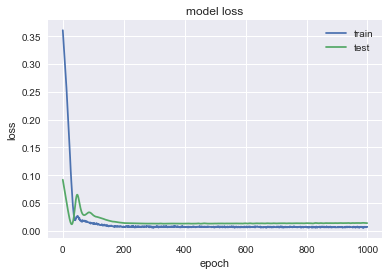

                IBM
MSE         142.141
MAE         8.54085
R2       -0.0162037
MAPE (%)    6.50687


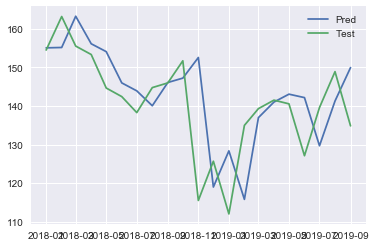

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1249 - val_loss: 0.2748
Epoch 2/1000
0s - loss: 0.1217 - val_loss: 0.2680
Epoch 3/1000
0s - loss: 0.1185 - val_loss: 0.2613
Epoch 4/1000
0s - loss: 0.1150 - val_loss: 0.2546
Epoch 5/1000
0s - loss: 0.1118 - val_loss: 0.2480
Epoch 6/1000
0s - loss: 0.1085 - val_loss: 0.2413
Epoch 7/1000
0s - loss: 0.1052 - val_loss: 0.2345
Epoch 8/1000
0s - loss: 0.1024 - val_loss: 0.2277
Epoch 9/1000
0s - loss: 0.0987 - val_loss: 0.2208
Epoch 10/1000
0s - loss: 0.0960 - val_loss: 0.2138
Epoch 11/1000
0s - loss: 0.0922 - val_loss: 0.2067
Epoch 12/1000
0s - loss: 0.0886 - val_loss: 0.1995
Epoch 13/1000
0s - loss: 0.0857 - val_loss: 0.1921
Epoch 14/1000
0s - loss: 0.0823 - val_loss: 0.1847
Epoch 15/1000
0s - loss: 0.0788 - val_loss: 0.1771
Epoch 16/1000
0s - loss: 0.0750 - val_loss: 0.1693
Epoch 17/1000
0s - loss: 0.0721 - val_loss: 0.1615
Epoch 18/1000
0s - loss: 0.0680 - val_loss: 0.1535
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0035 - val_loss: 0.0094
Epoch 167/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 168/1000
0s - loss: 0.0032 - val_loss: 0.0091
Epoch 169/1000
0s - loss: 0.0037 - val_loss: 0.0089
Epoch 170/1000
0s - loss: 0.0032 - val_loss: 0.0088
Epoch 171/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 172/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 174/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 175/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 176/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 177/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 178/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 180/1000
0s - loss: 0.0027 - val_loss: 0.0090
Epoch 181/1000
0s - loss: 0.0032 - val_loss: 0.0091
Epoch 182/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 183/1000
0s - loss: 0.0035 - val_loss: 0.0092
Epoch 184/1000
0s - loss: 0.0035 - val_loss: 0.0092
Epoch 185/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0093
Epoch 336/1000
0s - loss: 0.0036 - val_loss: 0.0091
Epoch 337/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 338/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 340/1000
0s - loss: 0.0033 - val_loss: 0.0083
Epoch 341/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 342/1000
0s - loss: 0.0030 - val_loss: 0.0081
Epoch 343/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 344/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 345/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 346/1000
0s - loss: 0.0026 - val_loss: 0.0086
Epoch 347/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 348/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 349/1000
0s - loss: 0.0035 - val_loss: 0.0089
Epoch 350/1000
0s - loss: 0.0032 - val_loss: 0.0089
Epoch 351/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 352/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 353/1000
0s - loss: 0.0031 - val_loss: 0.0088
Epoch 354/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0094
Epoch 496/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 497/1000
0s - loss: 0.0031 - val_loss: 0.0091
Epoch 498/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 499/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 500/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 501/1000
0s - loss: 0.0031 - val_loss: 0.0081
Epoch 502/1000
0s - loss: 0.0030 - val_loss: 0.0080
Epoch 503/1000
0s - loss: 0.0035 - val_loss: 0.0080
Epoch 504/1000
0s - loss: 0.0035 - val_loss: 0.0080
Epoch 505/1000
0s - loss: 0.0028 - val_loss: 0.0081
Epoch 506/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 507/1000
0s - loss: 0.0035 - val_loss: 0.0086
Epoch 508/1000
0s - loss: 0.0032 - val_loss: 0.0088
Epoch 509/1000
0s - loss: 0.0028 - val_loss: 0.0091
Epoch 510/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 511/1000
0s - loss: 0.0031 - val_loss: 0.0095
Epoch 512/1000
0s - loss: 0.0027 - val_loss: 0.0097
Epoch 513/1000
0s - loss: 0.0031 - val_loss: 0.0096
Epoch 514/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0088
Epoch 660/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 661/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 662/1000
0s - loss: 0.0031 - val_loss: 0.0084
Epoch 663/1000
0s - loss: 0.0032 - val_loss: 0.0084
Epoch 664/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 665/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 666/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 667/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 668/1000
0s - loss: 0.0031 - val_loss: 0.0081
Epoch 669/1000
0s - loss: 0.0026 - val_loss: 0.0080
Epoch 670/1000
0s - loss: 0.0027 - val_loss: 0.0080
Epoch 671/1000
0s - loss: 0.0029 - val_loss: 0.0081
Epoch 672/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 673/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 674/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 675/1000
0s - loss: 0.0026 - val_loss: 0.0085
Epoch 676/1000
0s - loss: 0.0032 - val_loss: 0.0087
Epoch 677/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 678/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0083
Epoch 818/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 819/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 820/1000
0s - loss: 0.0027 - val_loss: 0.0086
Epoch 821/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 822/1000
0s - loss: 0.0031 - val_loss: 0.0092
Epoch 823/1000
0s - loss: 0.0030 - val_loss: 0.0094
Epoch 824/1000
0s - loss: 0.0026 - val_loss: 0.0094
Epoch 825/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 826/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 827/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 828/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 829/1000
0s - loss: 0.0030 - val_loss: 0.0085
Epoch 830/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 831/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 832/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 833/1000
0s - loss: 0.0027 - val_loss: 0.0089
Epoch 834/1000
0s - loss: 0.0027 - val_loss: 0.0091
Epoch 835/1000
0s - loss: 0.0033 - val_loss: 0.0094
Epoch 836/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0082
Epoch 980/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 981/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 982/1000
0s - loss: 0.0034 - val_loss: 0.0087
Epoch 983/1000
0s - loss: 0.0025 - val_loss: 0.0089
Epoch 984/1000
0s - loss: 0.0033 - val_loss: 0.0092
Epoch 985/1000
0s - loss: 0.0024 - val_loss: 0.0096
Epoch 986/1000
0s - loss: 0.0029 - val_loss: 0.0096
Epoch 987/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 988/1000
0s - loss: 0.0030 - val_loss: 0.0092
Epoch 989/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 990/1000
0s - loss: 0.0032 - val_loss: 0.0084
Epoch 991/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 992/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 993/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 994/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 995/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 996/1000
0s - loss: 0.0026 - val_loss: 0.0088
Epoch 997/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 998/1000
0s - loss: 0

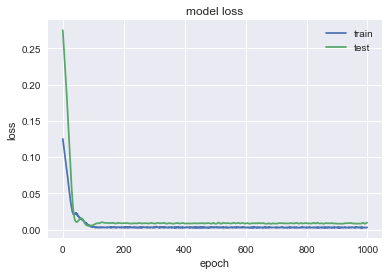

               ALB
MSE        107.024
MAE        7.96256
R2        0.675802
MAPE (%)   9.39724


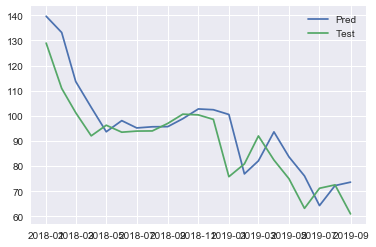

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1480 - val_loss: 0.7089
Epoch 2/1000
0s - loss: 0.1439 - val_loss: 0.6955
Epoch 3/1000
0s - loss: 0.1399 - val_loss: 0.6822
Epoch 4/1000
0s - loss: 0.1359 - val_loss: 0.6688
Epoch 5/1000
0s - loss: 0.1321 - val_loss: 0.6554
Epoch 6/1000
0s - loss: 0.1280 - val_loss: 0.6419
Epoch 7/1000
0s - loss: 0.1243 - val_loss: 0.6281
Epoch 8/1000
0s - loss: 0.1202 - val_loss: 0.6142
Epoch 9/1000
0s - loss: 0.1166 - val_loss: 0.5999
Epoch 10/1000
0s - loss: 0.1121 - val_loss: 0.5854
Epoch 11/1000
0s - loss: 0.1087 - val_loss: 0.5705
Epoch 12/1000
0s - loss: 0.1042 - val_loss: 0.5553
Epoch 13/1000
0s - loss: 0.1002 - val_loss: 0.5397
Epoch 14/1000
0s - loss: 0.0955 - val_loss: 0.5236
Epoch 15/1000
0s - loss: 0.0918 - val_loss: 0.5072
Epoch 16/1000
0s - loss: 0.0877 - val_loss: 0.4904
Epoch 17/1000
0s - loss: 0.0830 - val_loss: 0.4731
Epoch 18/1000
0s - loss: 0.0789 - val_loss: 0.4554
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0114
Epoch 161/1000
0s - loss: 0.0035 - val_loss: 0.0115
Epoch 162/1000
0s - loss: 0.0035 - val_loss: 0.0116
Epoch 163/1000
0s - loss: 0.0039 - val_loss: 0.0118
Epoch 164/1000
0s - loss: 0.0033 - val_loss: 0.0119
Epoch 165/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 166/1000
0s - loss: 0.0037 - val_loss: 0.0120
Epoch 167/1000
0s - loss: 0.0036 - val_loss: 0.0120
Epoch 168/1000
0s - loss: 0.0038 - val_loss: 0.0119
Epoch 169/1000
0s - loss: 0.0032 - val_loss: 0.0117
Epoch 170/1000
0s - loss: 0.0037 - val_loss: 0.0116
Epoch 171/1000
0s - loss: 0.0033 - val_loss: 0.0114
Epoch 172/1000
0s - loss: 0.0040 - val_loss: 0.0112
Epoch 173/1000
0s - loss: 0.0037 - val_loss: 0.0112
Epoch 174/1000
0s - loss: 0.0039 - val_loss: 0.0111
Epoch 175/1000
0s - loss: 0.0037 - val_loss: 0.0110
Epoch 176/1000
0s - loss: 0.0036 - val_loss: 0.0110
Epoch 177/1000
0s - loss: 0.0037 - val_loss: 0.0110
Epoch 178/1000
0s - loss: 0.0042 - val_loss: 0.0110
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0091
Epoch 325/1000
0s - loss: 0.0028 - val_loss: 0.0093
Epoch 326/1000
0s - loss: 0.0041 - val_loss: 0.0094
Epoch 327/1000
0s - loss: 0.0039 - val_loss: 0.0095
Epoch 328/1000
0s - loss: 0.0032 - val_loss: 0.0097
Epoch 329/1000
0s - loss: 0.0035 - val_loss: 0.0098
Epoch 330/1000
0s - loss: 0.0031 - val_loss: 0.0098
Epoch 331/1000
0s - loss: 0.0035 - val_loss: 0.0097
Epoch 332/1000
0s - loss: 0.0033 - val_loss: 0.0096
Epoch 333/1000
0s - loss: 0.0035 - val_loss: 0.0095
Epoch 334/1000
0s - loss: 0.0034 - val_loss: 0.0093
Epoch 335/1000
0s - loss: 0.0033 - val_loss: 0.0092
Epoch 336/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 337/1000
0s - loss: 0.0031 - val_loss: 0.0092
Epoch 338/1000
0s - loss: 0.0030 - val_loss: 0.0092
Epoch 339/1000
0s - loss: 0.0033 - val_loss: 0.0092
Epoch 340/1000
0s - loss: 0.0033 - val_loss: 0.0092
Epoch 341/1000
0s - loss: 0.0034 - val_loss: 0.0093
Epoch 342/1000
0s - loss: 0.0035 - val_loss: 0.0094
Epoch 343/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0082
Epoch 487/1000
0s - loss: 0.0038 - val_loss: 0.0082
Epoch 488/1000
0s - loss: 0.0030 - val_loss: 0.0081
Epoch 489/1000
0s - loss: 0.0034 - val_loss: 0.0081
Epoch 490/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 491/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 492/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 493/1000
0s - loss: 0.0034 - val_loss: 0.0081
Epoch 494/1000
0s - loss: 0.0032 - val_loss: 0.0081
Epoch 495/1000
0s - loss: 0.0034 - val_loss: 0.0081
Epoch 496/1000
0s - loss: 0.0034 - val_loss: 0.0081
Epoch 497/1000
0s - loss: 0.0035 - val_loss: 0.0081
Epoch 498/1000
0s - loss: 0.0036 - val_loss: 0.0081
Epoch 499/1000
0s - loss: 0.0034 - val_loss: 0.0081
Epoch 500/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 501/1000
0s - loss: 0.0032 - val_loss: 0.0081
Epoch 502/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 503/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 504/1000
0s - loss: 0.0035 - val_loss: 0.0082
Epoch 505/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0071
Epoch 653/1000
0s - loss: 0.0035 - val_loss: 0.0071
Epoch 654/1000
0s - loss: 0.0034 - val_loss: 0.0072
Epoch 655/1000
0s - loss: 0.0036 - val_loss: 0.0072
Epoch 656/1000
0s - loss: 0.0036 - val_loss: 0.0073
Epoch 657/1000
0s - loss: 0.0038 - val_loss: 0.0073
Epoch 658/1000
0s - loss: 0.0037 - val_loss: 0.0073
Epoch 659/1000
0s - loss: 0.0034 - val_loss: 0.0072
Epoch 660/1000
0s - loss: 0.0034 - val_loss: 0.0072
Epoch 661/1000
0s - loss: 0.0032 - val_loss: 0.0071
Epoch 662/1000
0s - loss: 0.0036 - val_loss: 0.0071
Epoch 663/1000
0s - loss: 0.0037 - val_loss: 0.0071
Epoch 664/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 665/1000
0s - loss: 0.0036 - val_loss: 0.0071
Epoch 666/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 667/1000
0s - loss: 0.0029 - val_loss: 0.0071
Epoch 668/1000
0s - loss: 0.0033 - val_loss: 0.0072
Epoch 669/1000
0s - loss: 0.0030 - val_loss: 0.0072
Epoch 670/1000
0s - loss: 0.0035 - val_loss: 0.0072
Epoch 671/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0068
Epoch 814/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 815/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 816/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 817/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 818/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 819/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 820/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 821/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 822/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 823/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 824/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 825/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 826/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 827/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 828/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 829/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 830/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 831/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 832/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0066
Epoch 973/1000
0s - loss: 0.0034 - val_loss: 0.0066
Epoch 974/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 975/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 976/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 977/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 978/1000
0s - loss: 0.0030 - val_loss: 0.0069
Epoch 979/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 980/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 981/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 982/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 983/1000
0s - loss: 0.0038 - val_loss: 0.0067
Epoch 984/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 985/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 986/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 987/1000
0s - loss: 0.0037 - val_loss: 0.0067
Epoch 988/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 989/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 990/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 991/1000
0s - loss: 0

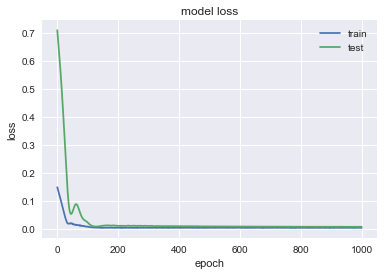

               CBRE
MSE         11.2105
MAE          2.6991
R2        0.0661157
MAPE (%)    5.80788


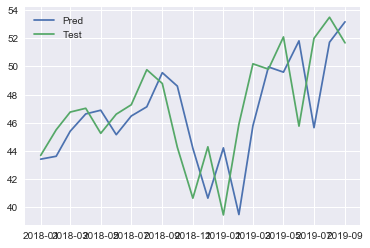

In [94]:
pred_3 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_3[comp] = nn_forec(df,comp,n_train_time=test.shape[0],first_layer = 128,second_layer=64).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3217 - val_loss: 0.2223
Epoch 2/1000
0s - loss: 0.3100 - val_loss: 0.2131
Epoch 3/1000
0s - loss: 0.2983 - val_loss: 0.2039
Epoch 4/1000
0s - loss: 0.2870 - val_loss: 0.1946
Epoch 5/1000
0s - loss: 0.2751 - val_loss: 0.1851
Epoch 6/1000
0s - loss: 0.2638 - val_loss: 0.1754
Epoch 7/1000
0s - loss: 0.2514 - val_loss: 0.1655
Epoch 8/1000
0s - loss: 0.2389 - val_loss: 0.1553
Epoch 9/1000
0s - loss: 0.2257 - val_loss: 0.1448
Epoch 10/1000
0s - loss: 0.2126 - val_loss: 0.1341
Epoch 11/1000
0s - loss: 0.1988 - val_loss: 0.1231
Epoch 12/1000
0s - loss: 0.1847 - val_loss: 0.1120
Epoch 13/1000
0s - loss: 0.1693 - val_loss: 0.1007
Epoch 14/1000
0s - loss: 0.1561 - val_loss: 0.0895
Epoch 15/1000
0s - loss: 0.1427 - val_loss: 0.0783
Epoch 16/1000
0s - loss: 0.1276 - val_loss: 0.0673
Epoch 17/1000
0s - loss: 0.1122 - val_loss: 0.0567
Epoch 18/1000
0s - loss: 0.0978 - val_loss: 0.0466
Epoch 19/1000
0s - loss: 0.08

0s - loss: 0.0075 - val_loss: 0.0070
Epoch 168/1000
0s - loss: 0.0073 - val_loss: 0.0070
Epoch 169/1000
0s - loss: 0.0074 - val_loss: 0.0070
Epoch 170/1000
0s - loss: 0.0075 - val_loss: 0.0070
Epoch 171/1000
0s - loss: 0.0075 - val_loss: 0.0070
Epoch 172/1000
0s - loss: 0.0077 - val_loss: 0.0070
Epoch 173/1000
0s - loss: 0.0070 - val_loss: 0.0070
Epoch 174/1000
0s - loss: 0.0075 - val_loss: 0.0070
Epoch 175/1000
0s - loss: 0.0080 - val_loss: 0.0070
Epoch 176/1000
0s - loss: 0.0073 - val_loss: 0.0070
Epoch 177/1000
0s - loss: 0.0065 - val_loss: 0.0070
Epoch 178/1000
0s - loss: 0.0069 - val_loss: 0.0070
Epoch 179/1000
0s - loss: 0.0073 - val_loss: 0.0070
Epoch 180/1000
0s - loss: 0.0071 - val_loss: 0.0071
Epoch 181/1000
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 182/1000
0s - loss: 0.0072 - val_loss: 0.0071
Epoch 183/1000
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 184/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 185/1000
0s - loss: 0.0068 - val_loss: 0.0071
Epoch 186/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0070
Epoch 328/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 329/1000
0s - loss: 0.0075 - val_loss: 0.0071
Epoch 330/1000
0s - loss: 0.0071 - val_loss: 0.0071
Epoch 331/1000
0s - loss: 0.0074 - val_loss: 0.0071
Epoch 332/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 333/1000
0s - loss: 0.0067 - val_loss: 0.0072
Epoch 334/1000
0s - loss: 0.0068 - val_loss: 0.0072
Epoch 335/1000
0s - loss: 0.0066 - val_loss: 0.0072
Epoch 336/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 337/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 338/1000
0s - loss: 0.0068 - val_loss: 0.0071
Epoch 339/1000
0s - loss: 0.0063 - val_loss: 0.0071
Epoch 340/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 341/1000
0s - loss: 0.0067 - val_loss: 0.0071
Epoch 342/1000
0s - loss: 0.0063 - val_loss: 0.0071
Epoch 343/1000
0s - loss: 0.0080 - val_loss: 0.0071
Epoch 344/1000
0s - loss: 0.0068 - val_loss: 0.0071
Epoch 345/1000
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 346/1000
0s - loss: 0

0s - loss: 0.0070 - val_loss: 0.0072
Epoch 493/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 494/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 495/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 496/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 497/1000
0s - loss: 0.0068 - val_loss: 0.0072
Epoch 498/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 499/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 500/1000
0s - loss: 0.0068 - val_loss: 0.0073
Epoch 501/1000
0s - loss: 0.0074 - val_loss: 0.0073
Epoch 502/1000
0s - loss: 0.0061 - val_loss: 0.0073
Epoch 503/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 504/1000
0s - loss: 0.0067 - val_loss: 0.0073
Epoch 505/1000
0s - loss: 0.0068 - val_loss: 0.0072
Epoch 506/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 507/1000
0s - loss: 0.0072 - val_loss: 0.0072
Epoch 508/1000
0s - loss: 0.0060 - val_loss: 0.0072
Epoch 509/1000
0s - loss: 0.0067 - val_loss: 0.0072
Epoch 510/1000
0s - loss: 0.0068 - val_loss: 0.0072
Epoch 511/1000
0s - loss: 0

0s - loss: 0.0070 - val_loss: 0.0073
Epoch 656/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 657/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 658/1000
0s - loss: 0.0075 - val_loss: 0.0074
Epoch 659/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 660/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 661/1000
0s - loss: 0.0076 - val_loss: 0.0074
Epoch 662/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 663/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 664/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 665/1000
0s - loss: 0.0065 - val_loss: 0.0073
Epoch 666/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 667/1000
0s - loss: 0.0069 - val_loss: 0.0072
Epoch 668/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 669/1000
0s - loss: 0.0066 - val_loss: 0.0072
Epoch 670/1000
0s - loss: 0.0076 - val_loss: 0.0073
Epoch 671/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 672/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 673/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 674/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0074
Epoch 820/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 821/1000
0s - loss: 0.0071 - val_loss: 0.0075
Epoch 822/1000
0s - loss: 0.0067 - val_loss: 0.0076
Epoch 823/1000
0s - loss: 0.0067 - val_loss: 0.0076
Epoch 824/1000
0s - loss: 0.0076 - val_loss: 0.0076
Epoch 825/1000
0s - loss: 0.0070 - val_loss: 0.0076
Epoch 826/1000
0s - loss: 0.0071 - val_loss: 0.0075
Epoch 827/1000
0s - loss: 0.0065 - val_loss: 0.0075
Epoch 828/1000
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 829/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 830/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 831/1000
0s - loss: 0.0074 - val_loss: 0.0073
Epoch 832/1000
0s - loss: 0.0075 - val_loss: 0.0073
Epoch 833/1000
0s - loss: 0.0076 - val_loss: 0.0073
Epoch 834/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 835/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 836/1000
0s - loss: 0.0066 - val_loss: 0.0075
Epoch 837/1000
0s - loss: 0.0072 - val_loss: 0.0075
Epoch 838/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0076
Epoch 978/1000
0s - loss: 0.0067 - val_loss: 0.0076
Epoch 979/1000
0s - loss: 0.0068 - val_loss: 0.0076
Epoch 980/1000
0s - loss: 0.0071 - val_loss: 0.0076
Epoch 981/1000
0s - loss: 0.0068 - val_loss: 0.0076
Epoch 982/1000
0s - loss: 0.0067 - val_loss: 0.0075
Epoch 983/1000
0s - loss: 0.0069 - val_loss: 0.0075
Epoch 984/1000
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 985/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 986/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 987/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 988/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 989/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 990/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 991/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 992/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 993/1000
0s - loss: 0.0070 - val_loss: 0.0075
Epoch 994/1000
0s - loss: 0.0066 - val_loss: 0.0075
Epoch 995/1000
0s - loss: 0.0069 - val_loss: 0.0075
Epoch 996/1000
0s - loss: 0

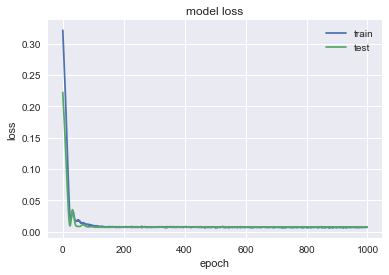

                 T
MSE        2.70762
MAE        1.25387
R2        0.551712
MAPE (%)   3.83498


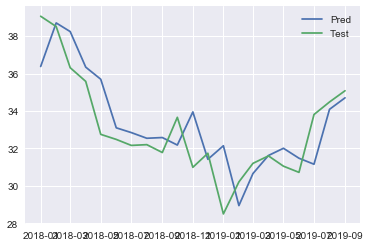

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1264 - val_loss: 0.7270
Epoch 2/1000
0s - loss: 0.1207 - val_loss: 0.7035
Epoch 3/1000
0s - loss: 0.1149 - val_loss: 0.6800
Epoch 4/1000
0s - loss: 0.1093 - val_loss: 0.6562
Epoch 5/1000
0s - loss: 0.1037 - val_loss: 0.6319
Epoch 6/1000
0s - loss: 0.0980 - val_loss: 0.6070
Epoch 7/1000
0s - loss: 0.0922 - val_loss: 0.5813
Epoch 8/1000
0s - loss: 0.0863 - val_loss: 0.5548
Epoch 9/1000
0s - loss: 0.0804 - val_loss: 0.5275
Epoch 10/1000
0s - loss: 0.0742 - val_loss: 0.4993
Epoch 11/1000
0s - loss: 0.0681 - val_loss: 0.4702
Epoch 12/1000
0s - loss: 0.0620 - val_loss: 0.4402
Epoch 13/1000
0s - loss: 0.0558 - val_loss: 0.4095
Epoch 14/1000
0s - loss: 0.0499 - val_loss: 0.3782
Epoch 15/1000
0s - loss: 0.0438 - val_loss: 0.3464
Epoch 16/1000
0s - loss: 0.0380 - val_loss: 0.3143
Epoch 17/1000
0s - loss: 0.0330 - val_loss: 0.2822
Epoch 18/1000
0s - loss: 0.0268 - val_loss: 0.2503
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0035 - val_loss: 0.0154
Epoch 162/1000
0s - loss: 0.0031 - val_loss: 0.0155
Epoch 163/1000
0s - loss: 0.0032 - val_loss: 0.0155
Epoch 164/1000
0s - loss: 0.0030 - val_loss: 0.0156
Epoch 165/1000
0s - loss: 0.0031 - val_loss: 0.0158
Epoch 166/1000
0s - loss: 0.0031 - val_loss: 0.0159
Epoch 167/1000
0s - loss: 0.0030 - val_loss: 0.0161
Epoch 168/1000
0s - loss: 0.0033 - val_loss: 0.0162
Epoch 169/1000
0s - loss: 0.0032 - val_loss: 0.0162
Epoch 170/1000
0s - loss: 0.0030 - val_loss: 0.0161
Epoch 171/1000
0s - loss: 0.0032 - val_loss: 0.0161
Epoch 172/1000
0s - loss: 0.0031 - val_loss: 0.0160
Epoch 173/1000
0s - loss: 0.0032 - val_loss: 0.0158
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 0.0156
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0153
Epoch 176/1000
0s - loss: 0.0032 - val_loss: 0.0152
Epoch 177/1000
0s - loss: 0.0031 - val_loss: 0.0150
Epoch 178/1000
0s - loss: 0.0032 - val_loss: 0.0150
Epoch 179/1000
0s - loss: 0.0032 - val_loss: 0.0150
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0149
Epoch 324/1000
0s - loss: 0.0032 - val_loss: 0.0150
Epoch 325/1000
0s - loss: 0.0032 - val_loss: 0.0151
Epoch 326/1000
0s - loss: 0.0028 - val_loss: 0.0150
Epoch 327/1000
0s - loss: 0.0031 - val_loss: 0.0149
Epoch 328/1000
0s - loss: 0.0032 - val_loss: 0.0148
Epoch 329/1000
0s - loss: 0.0031 - val_loss: 0.0146
Epoch 330/1000
0s - loss: 0.0030 - val_loss: 0.0144
Epoch 331/1000
0s - loss: 0.0031 - val_loss: 0.0143
Epoch 332/1000
0s - loss: 0.0032 - val_loss: 0.0143
Epoch 333/1000
0s - loss: 0.0030 - val_loss: 0.0143
Epoch 334/1000
0s - loss: 0.0028 - val_loss: 0.0144
Epoch 335/1000
0s - loss: 0.0031 - val_loss: 0.0144
Epoch 336/1000
0s - loss: 0.0033 - val_loss: 0.0145
Epoch 337/1000
0s - loss: 0.0032 - val_loss: 0.0146
Epoch 338/1000
0s - loss: 0.0030 - val_loss: 0.0147
Epoch 339/1000
0s - loss: 0.0031 - val_loss: 0.0149
Epoch 340/1000
0s - loss: 0.0029 - val_loss: 0.0150
Epoch 341/1000
0s - loss: 0.0033 - val_loss: 0.0149
Epoch 342/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0138
Epoch 484/1000
0s - loss: 0.0032 - val_loss: 0.0138
Epoch 485/1000
0s - loss: 0.0031 - val_loss: 0.0139
Epoch 486/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 487/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 488/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 489/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 490/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 491/1000
0s - loss: 0.0031 - val_loss: 0.0139
Epoch 492/1000
0s - loss: 0.0030 - val_loss: 0.0138
Epoch 493/1000
0s - loss: 0.0028 - val_loss: 0.0138
Epoch 494/1000
0s - loss: 0.0031 - val_loss: 0.0137
Epoch 495/1000
0s - loss: 0.0030 - val_loss: 0.0137
Epoch 496/1000
0s - loss: 0.0032 - val_loss: 0.0137
Epoch 497/1000
0s - loss: 0.0029 - val_loss: 0.0136
Epoch 498/1000
0s - loss: 0.0032 - val_loss: 0.0136
Epoch 499/1000
0s - loss: 0.0031 - val_loss: 0.0136
Epoch 500/1000
0s - loss: 0.0028 - val_loss: 0.0137
Epoch 501/1000
0s - loss: 0.0033 - val_loss: 0.0137
Epoch 502/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0131
Epoch 644/1000
0s - loss: 0.0029 - val_loss: 0.0131
Epoch 645/1000
0s - loss: 0.0030 - val_loss: 0.0131
Epoch 646/1000
0s - loss: 0.0031 - val_loss: 0.0131
Epoch 647/1000
0s - loss: 0.0027 - val_loss: 0.0131
Epoch 648/1000
0s - loss: 0.0030 - val_loss: 0.0132
Epoch 649/1000
0s - loss: 0.0032 - val_loss: 0.0132
Epoch 650/1000
0s - loss: 0.0031 - val_loss: 0.0132
Epoch 651/1000
0s - loss: 0.0032 - val_loss: 0.0132
Epoch 652/1000
0s - loss: 0.0029 - val_loss: 0.0132
Epoch 653/1000
0s - loss: 0.0031 - val_loss: 0.0131
Epoch 654/1000
0s - loss: 0.0031 - val_loss: 0.0131
Epoch 655/1000
0s - loss: 0.0030 - val_loss: 0.0131
Epoch 656/1000
0s - loss: 0.0034 - val_loss: 0.0131
Epoch 657/1000
0s - loss: 0.0030 - val_loss: 0.0131
Epoch 658/1000
0s - loss: 0.0028 - val_loss: 0.0131
Epoch 659/1000
0s - loss: 0.0027 - val_loss: 0.0132
Epoch 660/1000
0s - loss: 0.0031 - val_loss: 0.0132
Epoch 661/1000
0s - loss: 0.0028 - val_loss: 0.0131
Epoch 662/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0128
Epoch 802/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 803/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 804/1000
0s - loss: 0.0030 - val_loss: 0.0129
Epoch 805/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 806/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 807/1000
0s - loss: 0.0029 - val_loss: 0.0128
Epoch 808/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 809/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 810/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 811/1000
0s - loss: 0.0029 - val_loss: 0.0128
Epoch 812/1000
0s - loss: 0.0028 - val_loss: 0.0128
Epoch 813/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 814/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 815/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 816/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 817/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 818/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 819/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 820/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0125
Epoch 964/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 965/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 966/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 967/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 968/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 969/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 970/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 971/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 972/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 973/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 974/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 975/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 976/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 977/1000
0s - loss: 0.0027 - val_loss: 0.0127
Epoch 978/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 979/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 980/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 981/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 982/1000
0s - loss: 0

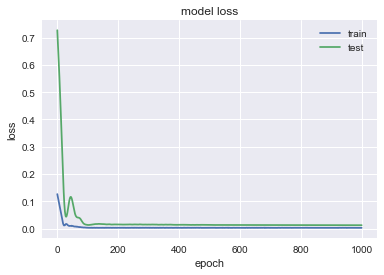

               BBY
MSE        57.3144
MAE        6.41974
R2       -0.184231
MAPE (%)   9.65285


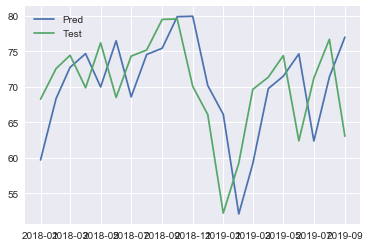

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2336 - val_loss: 0.5411
Epoch 2/1000
0s - loss: 0.2251 - val_loss: 0.5248
Epoch 3/1000
0s - loss: 0.2169 - val_loss: 0.5085
Epoch 4/1000
0s - loss: 0.2090 - val_loss: 0.4922
Epoch 5/1000
0s - loss: 0.2009 - val_loss: 0.4755
Epoch 6/1000
0s - loss: 0.1927 - val_loss: 0.4585
Epoch 7/1000
0s - loss: 0.1846 - val_loss: 0.4410
Epoch 8/1000
0s - loss: 0.1754 - val_loss: 0.4230
Epoch 9/1000
0s - loss: 0.1670 - val_loss: 0.4042
Epoch 10/1000
0s - loss: 0.1577 - val_loss: 0.3848
Epoch 11/1000
0s - loss: 0.1481 - val_loss: 0.3646
Epoch 12/1000
0s - loss: 0.1394 - val_loss: 0.3437
Epoch 13/1000
0s - loss: 0.1293 - val_loss: 0.3221
Epoch 14/1000
0s - loss: 0.1190 - val_loss: 0.2998
Epoch 15/1000
0s - loss: 0.1079 - val_loss: 0.2768
Epoch 16/1000
0s - loss: 0.0980 - val_loss: 0.2534
Epoch 17/1000
0s - loss: 0.0878 - val_loss: 0.2297
Epoch 18/1000
0s - loss: 0.0768 - val_loss: 0.2057
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0025 - val_loss: 0.0043
Epoch 161/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 162/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 163/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 164/1000
0s - loss: 0.0023 - val_loss: 0.0042
Epoch 165/1000
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 166/1000
0s - loss: 0.0030 - val_loss: 0.0042
Epoch 167/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 168/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 170/1000
0s - loss: 0.0026 - val_loss: 0.0042
Epoch 171/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 172/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 173/1000
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 174/1000
0s - loss: 0.0023 - val_loss: 0.0042
Epoch 175/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 176/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 177/1000
0s - loss: 0.0020 - val_loss: 0.0042
Epoch 178/1000
0s - loss: 0.0024 - val_loss: 0.0041
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0041
Epoch 320/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 321/1000
0s - loss: 0.0026 - val_loss: 0.0041
Epoch 322/1000
0s - loss: 0.0023 - val_loss: 0.0041
Epoch 323/1000
0s - loss: 0.0027 - val_loss: 0.0041
Epoch 324/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 325/1000
0s - loss: 0.0024 - val_loss: 0.0042
Epoch 326/1000
0s - loss: 0.0024 - val_loss: 0.0042
Epoch 327/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 328/1000
0s - loss: 0.0023 - val_loss: 0.0042
Epoch 329/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 330/1000
0s - loss: 0.0026 - val_loss: 0.0042
Epoch 331/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 332/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 333/1000
0s - loss: 0.0022 - val_loss: 0.0041
Epoch 334/1000
0s - loss: 0.0022 - val_loss: 0.0041
Epoch 335/1000
0s - loss: 0.0024 - val_loss: 0.0041
Epoch 336/1000
0s - loss: 0.0028 - val_loss: 0.0041
Epoch 337/1000
0s - loss: 0.0027 - val_loss: 0.0041
Epoch 338/1000
0s - loss: 0

0s - loss: 0.0024 - val_loss: 0.0042
Epoch 482/1000
0s - loss: 0.0024 - val_loss: 0.0042
Epoch 483/1000
0s - loss: 0.0024 - val_loss: 0.0042
Epoch 484/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 485/1000
0s - loss: 0.0025 - val_loss: 0.0043
Epoch 486/1000
0s - loss: 0.0023 - val_loss: 0.0043
Epoch 487/1000
0s - loss: 0.0026 - val_loss: 0.0042
Epoch 488/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 489/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 490/1000
0s - loss: 0.0026 - val_loss: 0.0041
Epoch 491/1000
0s - loss: 0.0025 - val_loss: 0.0041
Epoch 492/1000
0s - loss: 0.0024 - val_loss: 0.0041
Epoch 493/1000
0s - loss: 0.0022 - val_loss: 0.0041
Epoch 494/1000
0s - loss: 0.0023 - val_loss: 0.0041
Epoch 495/1000
0s - loss: 0.0024 - val_loss: 0.0042
Epoch 496/1000
0s - loss: 0.0021 - val_loss: 0.0042
Epoch 497/1000
0s - loss: 0.0027 - val_loss: 0.0043
Epoch 498/1000
0s - loss: 0.0026 - val_loss: 0.0043
Epoch 499/1000
0s - loss: 0.0023 - val_loss: 0.0043
Epoch 500/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0043
Epoch 644/1000
0s - loss: 0.0024 - val_loss: 0.0043
Epoch 645/1000
0s - loss: 0.0023 - val_loss: 0.0043
Epoch 646/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 647/1000
0s - loss: 0.0024 - val_loss: 0.0044
Epoch 648/1000
0s - loss: 0.0024 - val_loss: 0.0045
Epoch 649/1000
0s - loss: 0.0024 - val_loss: 0.0045
Epoch 650/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 651/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 652/1000
0s - loss: 0.0024 - val_loss: 0.0045
Epoch 653/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 654/1000
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 655/1000
0s - loss: 0.0024 - val_loss: 0.0043
Epoch 656/1000
0s - loss: 0.0024 - val_loss: 0.0043
Epoch 657/1000
0s - loss: 0.0027 - val_loss: 0.0043
Epoch 658/1000
0s - loss: 0.0023 - val_loss: 0.0043
Epoch 659/1000
0s - loss: 0.0022 - val_loss: 0.0044
Epoch 660/1000
0s - loss: 0.0021 - val_loss: 0.0044
Epoch 661/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 662/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0045
Epoch 808/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 809/1000
0s - loss: 0.0027 - val_loss: 0.0047
Epoch 810/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 811/1000
0s - loss: 0.0024 - val_loss: 0.0049
Epoch 812/1000
0s - loss: 0.0022 - val_loss: 0.0050
Epoch 813/1000
0s - loss: 0.0024 - val_loss: 0.0049
Epoch 814/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 815/1000
0s - loss: 0.0025 - val_loss: 0.0047
Epoch 816/1000
0s - loss: 0.0023 - val_loss: 0.0046
Epoch 817/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 818/1000
0s - loss: 0.0027 - val_loss: 0.0045
Epoch 819/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 820/1000
0s - loss: 0.0024 - val_loss: 0.0045
Epoch 821/1000
0s - loss: 0.0022 - val_loss: 0.0046
Epoch 822/1000
0s - loss: 0.0023 - val_loss: 0.0047
Epoch 823/1000
0s - loss: 0.0022 - val_loss: 0.0048
Epoch 824/1000
0s - loss: 0.0021 - val_loss: 0.0049
Epoch 825/1000
0s - loss: 0.0025 - val_loss: 0.0050
Epoch 826/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0052
Epoch 966/1000
0s - loss: 0.0024 - val_loss: 0.0052
Epoch 967/1000
0s - loss: 0.0023 - val_loss: 0.0051
Epoch 968/1000
0s - loss: 0.0023 - val_loss: 0.0051
Epoch 969/1000
0s - loss: 0.0024 - val_loss: 0.0051
Epoch 970/1000
0s - loss: 0.0019 - val_loss: 0.0051
Epoch 971/1000
0s - loss: 0.0026 - val_loss: 0.0051
Epoch 972/1000
0s - loss: 0.0020 - val_loss: 0.0051
Epoch 973/1000
0s - loss: 0.0026 - val_loss: 0.0051
Epoch 974/1000
0s - loss: 0.0025 - val_loss: 0.0052
Epoch 975/1000
0s - loss: 0.0025 - val_loss: 0.0052
Epoch 976/1000
0s - loss: 0.0023 - val_loss: 0.0051
Epoch 977/1000
0s - loss: 0.0022 - val_loss: 0.0052
Epoch 978/1000
0s - loss: 0.0023 - val_loss: 0.0052
Epoch 979/1000
0s - loss: 0.0022 - val_loss: 0.0052
Epoch 980/1000
0s - loss: 0.0022 - val_loss: 0.0052
Epoch 981/1000
0s - loss: 0.0023 - val_loss: 0.0051
Epoch 982/1000
0s - loss: 0.0024 - val_loss: 0.0051
Epoch 983/1000
0s - loss: 0.0024 - val_loss: 0.0052
Epoch 984/1000
0s - loss: 0

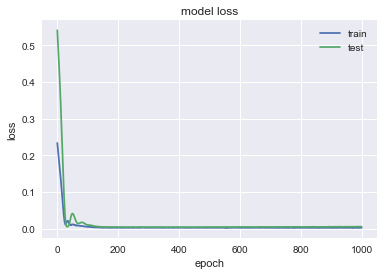

                KO
MSE        4.63138
MAE        1.89355
R2        0.119487
MAPE (%)    3.9412


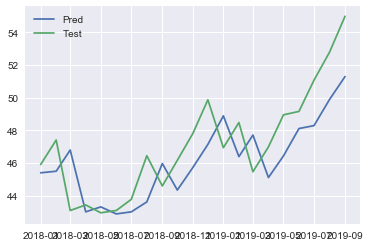

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3240 - val_loss: 0.0443
Epoch 2/1000
0s - loss: 0.3112 - val_loss: 0.0413
Epoch 3/1000
0s - loss: 0.2995 - val_loss: 0.0384
Epoch 4/1000
0s - loss: 0.2871 - val_loss: 0.0355
Epoch 5/1000
0s - loss: 0.2752 - val_loss: 0.0326
Epoch 6/1000
0s - loss: 0.2628 - val_loss: 0.0298
Epoch 7/1000
0s - loss: 0.2510 - val_loss: 0.0270
Epoch 8/1000
0s - loss: 0.2374 - val_loss: 0.0242
Epoch 9/1000
0s - loss: 0.2238 - val_loss: 0.0215
Epoch 10/1000
0s - loss: 0.2118 - val_loss: 0.0189
Epoch 11/1000
0s - loss: 0.1978 - val_loss: 0.0163
Epoch 12/1000
0s - loss: 0.1834 - val_loss: 0.0139
Epoch 13/1000
0s - loss: 0.1681 - val_loss: 0.0117
Epoch 14/1000
0s - loss: 0.1547 - val_loss: 0.0098
Epoch 15/1000
0s - loss: 0.1410 - val_loss: 0.0083
Epoch 16/1000
0s - loss: 0.1258 - val_loss: 0.0072
Epoch 17/1000
0s - loss: 0.1099 - val_loss: 0.0066
Epoch 18/1000
0s - loss: 0.0948 - val_loss: 0.0067
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0068 - val_loss: 0.0050
Epoch 162/1000
0s - loss: 0.0074 - val_loss: 0.0050
Epoch 163/1000
0s - loss: 0.0069 - val_loss: 0.0051
Epoch 164/1000
0s - loss: 0.0071 - val_loss: 0.0051
Epoch 165/1000
0s - loss: 0.0070 - val_loss: 0.0051
Epoch 166/1000
0s - loss: 0.0071 - val_loss: 0.0051
Epoch 167/1000
0s - loss: 0.0070 - val_loss: 0.0050
Epoch 168/1000
0s - loss: 0.0075 - val_loss: 0.0050
Epoch 169/1000
0s - loss: 0.0073 - val_loss: 0.0050
Epoch 170/1000
0s - loss: 0.0076 - val_loss: 0.0050
Epoch 171/1000
0s - loss: 0.0063 - val_loss: 0.0050
Epoch 172/1000
0s - loss: 0.0077 - val_loss: 0.0049
Epoch 173/1000
0s - loss: 0.0073 - val_loss: 0.0049
Epoch 174/1000
0s - loss: 0.0071 - val_loss: 0.0049
Epoch 175/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 176/1000
0s - loss: 0.0075 - val_loss: 0.0049
Epoch 177/1000
0s - loss: 0.0079 - val_loss: 0.0049
Epoch 178/1000
0s - loss: 0.0072 - val_loss: 0.0049
Epoch 179/1000
0s - loss: 0.0075 - val_loss: 0.0050
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0048
Epoch 324/1000
0s - loss: 0.0066 - val_loss: 0.0049
Epoch 325/1000
0s - loss: 0.0073 - val_loss: 0.0049
Epoch 326/1000
0s - loss: 0.0070 - val_loss: 0.0049
Epoch 327/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 328/1000
0s - loss: 0.0077 - val_loss: 0.0049
Epoch 329/1000
0s - loss: 0.0071 - val_loss: 0.0049
Epoch 330/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 331/1000
0s - loss: 0.0072 - val_loss: 0.0049
Epoch 332/1000
0s - loss: 0.0076 - val_loss: 0.0049
Epoch 333/1000
0s - loss: 0.0076 - val_loss: 0.0049
Epoch 334/1000
0s - loss: 0.0071 - val_loss: 0.0049
Epoch 335/1000
0s - loss: 0.0072 - val_loss: 0.0049
Epoch 336/1000
0s - loss: 0.0070 - val_loss: 0.0050
Epoch 337/1000
0s - loss: 0.0065 - val_loss: 0.0050
Epoch 338/1000
0s - loss: 0.0065 - val_loss: 0.0050
Epoch 339/1000
0s - loss: 0.0063 - val_loss: 0.0049
Epoch 340/1000
0s - loss: 0.0077 - val_loss: 0.0049
Epoch 341/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 342/1000
0s - loss: 0

0s - loss: 0.0071 - val_loss: 0.0047
Epoch 486/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 487/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 488/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 489/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 490/1000
0s - loss: 0.0075 - val_loss: 0.0049
Epoch 491/1000
0s - loss: 0.0073 - val_loss: 0.0050
Epoch 492/1000
0s - loss: 0.0072 - val_loss: 0.0050
Epoch 493/1000
0s - loss: 0.0069 - val_loss: 0.0050
Epoch 494/1000
0s - loss: 0.0075 - val_loss: 0.0050
Epoch 495/1000
0s - loss: 0.0072 - val_loss: 0.0049
Epoch 496/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 497/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 498/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 499/1000
0s - loss: 0.0068 - val_loss: 0.0046
Epoch 500/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 501/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 502/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 503/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 504/1000
0s - loss: 0

0s - loss: 0.0064 - val_loss: 0.0048
Epoch 644/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 645/1000
0s - loss: 0.0072 - val_loss: 0.0048
Epoch 646/1000
0s - loss: 0.0070 - val_loss: 0.0048
Epoch 647/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 648/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 649/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 650/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 651/1000
0s - loss: 0.0074 - val_loss: 0.0047
Epoch 652/1000
0s - loss: 0.0063 - val_loss: 0.0047
Epoch 653/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 654/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 655/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 656/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 657/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 658/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 659/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 660/1000
0s - loss: 0.0062 - val_loss: 0.0047
Epoch 661/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 662/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0045
Epoch 806/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 807/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 808/1000
0s - loss: 0.0070 - val_loss: 0.0048
Epoch 809/1000
0s - loss: 0.0067 - val_loss: 0.0049
Epoch 810/1000
0s - loss: 0.0071 - val_loss: 0.0049
Epoch 811/1000
0s - loss: 0.0066 - val_loss: 0.0050
Epoch 812/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 813/1000
0s - loss: 0.0077 - val_loss: 0.0048
Epoch 814/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 815/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 816/1000
0s - loss: 0.0069 - val_loss: 0.0045
Epoch 817/1000
0s - loss: 0.0075 - val_loss: 0.0045
Epoch 818/1000
0s - loss: 0.0076 - val_loss: 0.0045
Epoch 819/1000
0s - loss: 0.0065 - val_loss: 0.0046
Epoch 820/1000
0s - loss: 0.0065 - val_loss: 0.0047
Epoch 821/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 822/1000
0s - loss: 0.0065 - val_loss: 0.0049
Epoch 823/1000
0s - loss: 0.0071 - val_loss: 0.0049
Epoch 824/1000
0s - loss: 0

0s - loss: 0.0071 - val_loss: 0.0047
Epoch 968/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 969/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 970/1000
0s - loss: 0.0075 - val_loss: 0.0047
Epoch 971/1000
0s - loss: 0.0063 - val_loss: 0.0048
Epoch 972/1000
0s - loss: 0.0066 - val_loss: 0.0048
Epoch 973/1000
0s - loss: 0.0062 - val_loss: 0.0048
Epoch 974/1000
0s - loss: 0.0063 - val_loss: 0.0048
Epoch 975/1000
0s - loss: 0.0061 - val_loss: 0.0047
Epoch 976/1000
0s - loss: 0.0074 - val_loss: 0.0047
Epoch 977/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 978/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 979/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 980/1000
0s - loss: 0.0061 - val_loss: 0.0046
Epoch 981/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 982/1000
0s - loss: 0.0070 - val_loss: 0.0045
Epoch 983/1000
0s - loss: 0.0068 - val_loss: 0.0045
Epoch 984/1000
0s - loss: 0.0066 - val_loss: 0.0045
Epoch 985/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 986/1000
0s - loss: 0

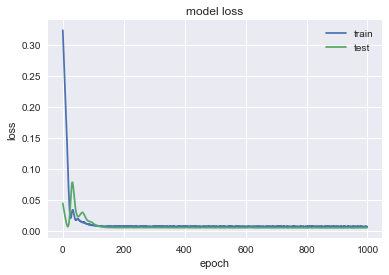

              FTI
MSE       8.70802
MAE       2.26971
R2         0.4182
MAPE (%)  9.02586


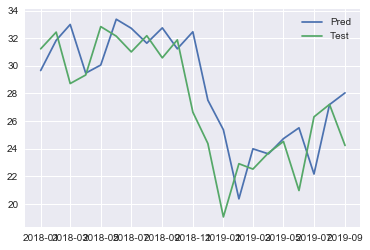

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1539 - val_loss: 0.6237
Epoch 2/1000
0s - loss: 0.1479 - val_loss: 0.6036
Epoch 3/1000
0s - loss: 0.1416 - val_loss: 0.5836
Epoch 4/1000
0s - loss: 0.1357 - val_loss: 0.5633
Epoch 5/1000
0s - loss: 0.1298 - val_loss: 0.5428
Epoch 6/1000
0s - loss: 0.1235 - val_loss: 0.5217
Epoch 7/1000
0s - loss: 0.1175 - val_loss: 0.5000
Epoch 8/1000
0s - loss: 0.1111 - val_loss: 0.4776
Epoch 9/1000
0s - loss: 0.1049 - val_loss: 0.4544
Epoch 10/1000
0s - loss: 0.0984 - val_loss: 0.4305
Epoch 11/1000
0s - loss: 0.0916 - val_loss: 0.4059
Epoch 12/1000
0s - loss: 0.0847 - val_loss: 0.3804
Epoch 13/1000
0s - loss: 0.0777 - val_loss: 0.3543
Epoch 14/1000
0s - loss: 0.0710 - val_loss: 0.3275
Epoch 15/1000
0s - loss: 0.0645 - val_loss: 0.3003
Epoch 16/1000
0s - loss: 0.0571 - val_loss: 0.2727
Epoch 17/1000
0s - loss: 0.0511 - val_loss: 0.2450
Epoch 18/1000
0s - loss: 0.0454 - val_loss: 0.2173
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0021 - val_loss: 0.0133
Epoch 161/1000
0s - loss: 0.0017 - val_loss: 0.0133
Epoch 162/1000
0s - loss: 0.0021 - val_loss: 0.0133
Epoch 163/1000
0s - loss: 0.0018 - val_loss: 0.0133
Epoch 164/1000
0s - loss: 0.0021 - val_loss: 0.0134
Epoch 165/1000
0s - loss: 0.0019 - val_loss: 0.0135
Epoch 166/1000
0s - loss: 0.0021 - val_loss: 0.0135
Epoch 167/1000
0s - loss: 0.0020 - val_loss: 0.0136
Epoch 168/1000
0s - loss: 0.0020 - val_loss: 0.0136
Epoch 169/1000
0s - loss: 0.0018 - val_loss: 0.0137
Epoch 170/1000
0s - loss: 0.0019 - val_loss: 0.0137
Epoch 171/1000
0s - loss: 0.0018 - val_loss: 0.0136
Epoch 172/1000
0s - loss: 0.0018 - val_loss: 0.0134
Epoch 173/1000
0s - loss: 0.0019 - val_loss: 0.0132
Epoch 174/1000
0s - loss: 0.0022 - val_loss: 0.0132
Epoch 175/1000
0s - loss: 0.0023 - val_loss: 0.0132
Epoch 176/1000
0s - loss: 0.0021 - val_loss: 0.0133
Epoch 177/1000
0s - loss: 0.0022 - val_loss: 0.0135
Epoch 178/1000
0s - loss: 0.0019 - val_loss: 0.0137
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0120
Epoch 323/1000
0s - loss: 0.0021 - val_loss: 0.0118
Epoch 324/1000
0s - loss: 0.0021 - val_loss: 0.0117
Epoch 325/1000
0s - loss: 0.0021 - val_loss: 0.0117
Epoch 326/1000
0s - loss: 0.0019 - val_loss: 0.0118
Epoch 327/1000
0s - loss: 0.0021 - val_loss: 0.0120
Epoch 328/1000
0s - loss: 0.0022 - val_loss: 0.0122
Epoch 329/1000
0s - loss: 0.0020 - val_loss: 0.0124
Epoch 330/1000
0s - loss: 0.0020 - val_loss: 0.0127
Epoch 331/1000
0s - loss: 0.0020 - val_loss: 0.0130
Epoch 332/1000
0s - loss: 0.0017 - val_loss: 0.0132
Epoch 333/1000
0s - loss: 0.0021 - val_loss: 0.0133
Epoch 334/1000
0s - loss: 0.0019 - val_loss: 0.0132
Epoch 335/1000
0s - loss: 0.0021 - val_loss: 0.0130
Epoch 336/1000
0s - loss: 0.0019 - val_loss: 0.0127
Epoch 337/1000
0s - loss: 0.0022 - val_loss: 0.0125
Epoch 338/1000
0s - loss: 0.0019 - val_loss: 0.0122
Epoch 339/1000
0s - loss: 0.0017 - val_loss: 0.0120
Epoch 340/1000
0s - loss: 0.0020 - val_loss: 0.0118
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0019 - val_loss: 0.0117
Epoch 487/1000
0s - loss: 0.0019 - val_loss: 0.0117
Epoch 488/1000
0s - loss: 0.0019 - val_loss: 0.0117
Epoch 489/1000
0s - loss: 0.0020 - val_loss: 0.0116
Epoch 490/1000
0s - loss: 0.0020 - val_loss: 0.0114
Epoch 491/1000
0s - loss: 0.0020 - val_loss: 0.0113
Epoch 492/1000
0s - loss: 0.0020 - val_loss: 0.0112
Epoch 493/1000
0s - loss: 0.0020 - val_loss: 0.0112
Epoch 494/1000
0s - loss: 0.0019 - val_loss: 0.0112
Epoch 495/1000
0s - loss: 0.0018 - val_loss: 0.0113
Epoch 496/1000
0s - loss: 0.0020 - val_loss: 0.0114
Epoch 497/1000
0s - loss: 0.0019 - val_loss: 0.0116
Epoch 498/1000
0s - loss: 0.0019 - val_loss: 0.0117
Epoch 499/1000
0s - loss: 0.0019 - val_loss: 0.0117
Epoch 500/1000
0s - loss: 0.0020 - val_loss: 0.0118
Epoch 501/1000
0s - loss: 0.0020 - val_loss: 0.0118
Epoch 502/1000
0s - loss: 0.0022 - val_loss: 0.0117
Epoch 503/1000
0s - loss: 0.0020 - val_loss: 0.0116
Epoch 504/1000
0s - loss: 0.0019 - val_loss: 0.0114
Epoch 505/1000
0s - loss: 0

0s - loss: 0.0018 - val_loss: 0.0110
Epoch 650/1000
0s - loss: 0.0018 - val_loss: 0.0112
Epoch 651/1000
0s - loss: 0.0020 - val_loss: 0.0112
Epoch 652/1000
0s - loss: 0.0020 - val_loss: 0.0113
Epoch 653/1000
0s - loss: 0.0018 - val_loss: 0.0113
Epoch 654/1000
0s - loss: 0.0021 - val_loss: 0.0112
Epoch 655/1000
0s - loss: 0.0019 - val_loss: 0.0110
Epoch 656/1000
0s - loss: 0.0020 - val_loss: 0.0110
Epoch 657/1000
0s - loss: 0.0019 - val_loss: 0.0109
Epoch 658/1000
0s - loss: 0.0018 - val_loss: 0.0109
Epoch 659/1000
0s - loss: 0.0018 - val_loss: 0.0108
Epoch 660/1000
0s - loss: 0.0018 - val_loss: 0.0107
Epoch 661/1000
0s - loss: 0.0021 - val_loss: 0.0110
Epoch 662/1000
0s - loss: 0.0020 - val_loss: 0.0113
Epoch 663/1000
0s - loss: 0.0020 - val_loss: 0.0114
Epoch 664/1000
0s - loss: 0.0021 - val_loss: 0.0113
Epoch 665/1000
0s - loss: 0.0020 - val_loss: 0.0111
Epoch 666/1000
0s - loss: 0.0021 - val_loss: 0.0109
Epoch 667/1000
0s - loss: 0.0019 - val_loss: 0.0108
Epoch 668/1000
0s - loss: 0

0s - loss: 0.0020 - val_loss: 0.0100
Epoch 810/1000
0s - loss: 0.0019 - val_loss: 0.0101
Epoch 811/1000
0s - loss: 0.0019 - val_loss: 0.0104
Epoch 812/1000
0s - loss: 0.0019 - val_loss: 0.0106
Epoch 813/1000
0s - loss: 0.0019 - val_loss: 0.0106
Epoch 814/1000
0s - loss: 0.0019 - val_loss: 0.0104
Epoch 815/1000
0s - loss: 0.0020 - val_loss: 0.0103
Epoch 816/1000
0s - loss: 0.0019 - val_loss: 0.0101
Epoch 817/1000
0s - loss: 0.0018 - val_loss: 0.0101
Epoch 818/1000
0s - loss: 0.0019 - val_loss: 0.0102
Epoch 819/1000
0s - loss: 0.0018 - val_loss: 0.0102
Epoch 820/1000
0s - loss: 0.0021 - val_loss: 0.0102
Epoch 821/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 822/1000
0s - loss: 0.0019 - val_loss: 0.0102
Epoch 823/1000
0s - loss: 0.0021 - val_loss: 0.0103
Epoch 824/1000
0s - loss: 0.0018 - val_loss: 0.0104
Epoch 825/1000
0s - loss: 0.0021 - val_loss: 0.0104
Epoch 826/1000
0s - loss: 0.0019 - val_loss: 0.0105
Epoch 827/1000
0s - loss: 0.0018 - val_loss: 0.0105
Epoch 828/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0106
Epoch 973/1000
0s - loss: 0.0019 - val_loss: 0.0105
Epoch 974/1000
0s - loss: 0.0019 - val_loss: 0.0105
Epoch 975/1000
0s - loss: 0.0019 - val_loss: 0.0104
Epoch 976/1000
0s - loss: 0.0018 - val_loss: 0.0103
Epoch 977/1000
0s - loss: 0.0018 - val_loss: 0.0102
Epoch 978/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 979/1000
0s - loss: 0.0019 - val_loss: 0.0103
Epoch 980/1000
0s - loss: 0.0019 - val_loss: 0.0106
Epoch 981/1000
0s - loss: 0.0019 - val_loss: 0.0109
Epoch 982/1000
0s - loss: 0.0022 - val_loss: 0.0109
Epoch 983/1000
0s - loss: 0.0018 - val_loss: 0.0110
Epoch 984/1000
0s - loss: 0.0018 - val_loss: 0.0110
Epoch 985/1000
0s - loss: 0.0019 - val_loss: 0.0109
Epoch 986/1000
0s - loss: 0.0018 - val_loss: 0.0104
Epoch 987/1000
0s - loss: 0.0019 - val_loss: 0.0102
Epoch 988/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 989/1000
0s - loss: 0.0019 - val_loss: 0.0100
Epoch 990/1000
0s - loss: 0.0019 - val_loss: 0.0101
Epoch 991/1000
0s - loss: 0

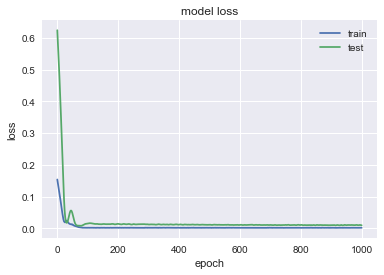

               BLK
MSE        1711.02
MAE        35.2271
R2        0.392251
MAPE (%)   7.73047


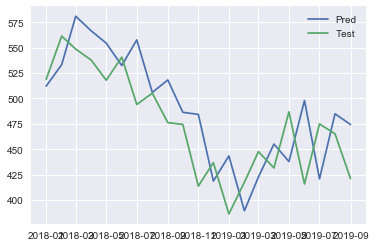

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3499 - val_loss: 0.3894
Epoch 2/1000
0s - loss: 0.3363 - val_loss: 0.3743
Epoch 3/1000
0s - loss: 0.3232 - val_loss: 0.3591
Epoch 4/1000
0s - loss: 0.3106 - val_loss: 0.3438
Epoch 5/1000
0s - loss: 0.2976 - val_loss: 0.3282
Epoch 6/1000
0s - loss: 0.2847 - val_loss: 0.3122
Epoch 7/1000
0s - loss: 0.2709 - val_loss: 0.2958
Epoch 8/1000
0s - loss: 0.2572 - val_loss: 0.2789
Epoch 9/1000
0s - loss: 0.2424 - val_loss: 0.2615
Epoch 10/1000
0s - loss: 0.2281 - val_loss: 0.2436
Epoch 11/1000
0s - loss: 0.2122 - val_loss: 0.2253
Epoch 12/1000
0s - loss: 0.1964 - val_loss: 0.2067
Epoch 13/1000
0s - loss: 0.1813 - val_loss: 0.1877
Epoch 14/1000
0s - loss: 0.1647 - val_loss: 0.1686
Epoch 15/1000
0s - loss: 0.1494 - val_loss: 0.1495
Epoch 16/1000
0s - loss: 0.1332 - val_loss: 0.1306
Epoch 17/1000
0s - loss: 0.1186 - val_loss: 0.1121
Epoch 18/1000
0s - loss: 0.1017 - val_loss: 0.0943
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0040 - val_loss: 0.0142
Epoch 161/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 162/1000
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 163/1000
0s - loss: 0.0044 - val_loss: 0.0142
Epoch 164/1000
0s - loss: 0.0042 - val_loss: 0.0142
Epoch 165/1000
0s - loss: 0.0039 - val_loss: 0.0142
Epoch 166/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 167/1000
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 168/1000
0s - loss: 0.0041 - val_loss: 0.0142
Epoch 169/1000
0s - loss: 0.0044 - val_loss: 0.0142
Epoch 170/1000
0s - loss: 0.0036 - val_loss: 0.0142
Epoch 171/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 172/1000
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 173/1000
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 174/1000
0s - loss: 0.0044 - val_loss: 0.0142
Epoch 175/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 176/1000
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 177/1000
0s - loss: 0.0039 - val_loss: 0.0142
Epoch 178/1000
0s - loss: 0.0042 - val_loss: 0.0142
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0043 - val_loss: 0.0141
Epoch 321/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 322/1000
0s - loss: 0.0041 - val_loss: 0.0142
Epoch 323/1000
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 324/1000
0s - loss: 0.0042 - val_loss: 0.0142
Epoch 325/1000
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 326/1000
0s - loss: 0.0049 - val_loss: 0.0141
Epoch 327/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 328/1000
0s - loss: 0.0034 - val_loss: 0.0141
Epoch 329/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 330/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 331/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 332/1000
0s - loss: 0.0035 - val_loss: 0.0141
Epoch 333/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 334/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 335/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 336/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 337/1000
0s - loss: 0.0038 - val_loss: 0.0142
Epoch 338/1000
0s - loss: 0.0039 - val_loss: 0.0142
Epoch 339/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0141
Epoch 480/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 481/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 482/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 483/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 484/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 485/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 486/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 487/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 488/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 489/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 490/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 491/1000
0s - loss: 0.0034 - val_loss: 0.0141
Epoch 492/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 493/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 494/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 495/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 496/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 497/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 498/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0141
Epoch 641/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 642/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 643/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 644/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 645/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 646/1000
0s - loss: 0.0032 - val_loss: 0.0141
Epoch 647/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 648/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 649/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 650/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 651/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 652/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 653/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 654/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 655/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 656/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 657/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 658/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 659/1000
0s - loss: 0

0s - loss: 0.0037 - val_loss: 0.0139
Epoch 805/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 806/1000
0s - loss: 0.0045 - val_loss: 0.0139
Epoch 807/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 808/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 809/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 810/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 811/1000
0s - loss: 0.0033 - val_loss: 0.0140
Epoch 812/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 813/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 814/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 815/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 816/1000
0s - loss: 0.0034 - val_loss: 0.0141
Epoch 817/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 818/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 819/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 820/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 821/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 822/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 823/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0139
Epoch 967/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 968/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 969/1000
0s - loss: 0.0037 - val_loss: 0.0139
Epoch 970/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 971/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 972/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 973/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 974/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 975/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 976/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 977/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 978/1000
0s - loss: 0.0036 - val_loss: 0.0139
Epoch 979/1000
0s - loss: 0.0036 - val_loss: 0.0139
Epoch 980/1000
0s - loss: 0.0043 - val_loss: 0.0139
Epoch 981/1000
0s - loss: 0.0041 - val_loss: 0.0139
Epoch 982/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 983/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 984/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 985/1000
0s - loss: 0

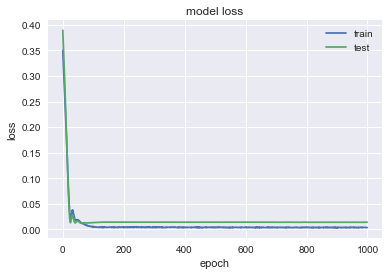

               DVA
MSE        42.1139
MAE        4.81994
R2        0.302916
MAPE (%)   8.22649


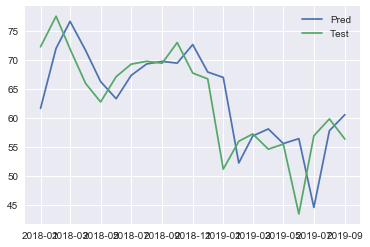

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0386 - val_loss: 0.5690
Epoch 2/1000
0s - loss: 0.0364 - val_loss: 0.5506
Epoch 3/1000
0s - loss: 0.0342 - val_loss: 0.5319
Epoch 4/1000
0s - loss: 0.0320 - val_loss: 0.5128
Epoch 5/1000
0s - loss: 0.0299 - val_loss: 0.4933
Epoch 6/1000
0s - loss: 0.0278 - val_loss: 0.4731
Epoch 7/1000
0s - loss: 0.0257 - val_loss: 0.4524
Epoch 8/1000
0s - loss: 0.0235 - val_loss: 0.4309
Epoch 9/1000
0s - loss: 0.0216 - val_loss: 0.4088
Epoch 10/1000
0s - loss: 0.0193 - val_loss: 0.3861
Epoch 11/1000
0s - loss: 0.0175 - val_loss: 0.3627
Epoch 12/1000
0s - loss: 0.0157 - val_loss: 0.3389
Epoch 13/1000
0s - loss: 0.0141 - val_loss: 0.3148
Epoch 14/1000
0s - loss: 0.0126 - val_loss: 0.2906
Epoch 15/1000
0s - loss: 0.0115 - val_loss: 0.2665
Epoch 16/1000
0s - loss: 0.0107 - val_loss: 0.2431
Epoch 17/1000
0s - loss: 0.0101 - val_loss: 0.2207
Epoch 18/1000
0s - loss: 0.0100 - val_loss: 0.2001
Epoch 19/1000
0s - loss: 0.0

0s - loss: 4.5886e-04 - val_loss: 0.0172
Epoch 159/1000
0s - loss: 4.5639e-04 - val_loss: 0.0174
Epoch 160/1000
0s - loss: 3.6360e-04 - val_loss: 0.0176
Epoch 161/1000
0s - loss: 4.3396e-04 - val_loss: 0.0177
Epoch 162/1000
0s - loss: 4.6427e-04 - val_loss: 0.0177
Epoch 163/1000
0s - loss: 5.9394e-04 - val_loss: 0.0177
Epoch 164/1000
0s - loss: 3.9287e-04 - val_loss: 0.0176
Epoch 165/1000
0s - loss: 5.0074e-04 - val_loss: 0.0174
Epoch 166/1000
0s - loss: 4.5089e-04 - val_loss: 0.0170
Epoch 167/1000
0s - loss: 4.6905e-04 - val_loss: 0.0167
Epoch 168/1000
0s - loss: 4.8156e-04 - val_loss: 0.0167
Epoch 169/1000
0s - loss: 5.2701e-04 - val_loss: 0.0169
Epoch 170/1000
0s - loss: 4.7542e-04 - val_loss: 0.0171
Epoch 171/1000
0s - loss: 4.2676e-04 - val_loss: 0.0172
Epoch 172/1000
0s - loss: 3.9816e-04 - val_loss: 0.0173
Epoch 173/1000
0s - loss: 5.7412e-04 - val_loss: 0.0173
Epoch 174/1000
0s - loss: 4.5747e-04 - val_loss: 0.0174
Epoch 175/1000
0s - loss: 5.2556e-04 - val_loss: 0.0175
Epoch 1

0s - loss: 4.4931e-04 - val_loss: 0.0160
Epoch 311/1000
0s - loss: 4.8747e-04 - val_loss: 0.0160
Epoch 312/1000
0s - loss: 4.8463e-04 - val_loss: 0.0159
Epoch 313/1000
0s - loss: 4.1755e-04 - val_loss: 0.0158
Epoch 314/1000
0s - loss: 5.2754e-04 - val_loss: 0.0155
Epoch 315/1000
0s - loss: 5.0279e-04 - val_loss: 0.0154
Epoch 316/1000
0s - loss: 4.2877e-04 - val_loss: 0.0154
Epoch 317/1000
0s - loss: 4.6468e-04 - val_loss: 0.0155
Epoch 318/1000
0s - loss: 4.2027e-04 - val_loss: 0.0158
Epoch 319/1000
0s - loss: 4.0998e-04 - val_loss: 0.0162
Epoch 320/1000
0s - loss: 5.2031e-04 - val_loss: 0.0163
Epoch 321/1000
0s - loss: 5.2838e-04 - val_loss: 0.0163
Epoch 322/1000
0s - loss: 4.5330e-04 - val_loss: 0.0166
Epoch 323/1000
0s - loss: 4.5764e-04 - val_loss: 0.0170
Epoch 324/1000
0s - loss: 4.6740e-04 - val_loss: 0.0173
Epoch 325/1000
0s - loss: 4.0049e-04 - val_loss: 0.0173
Epoch 326/1000
0s - loss: 4.9734e-04 - val_loss: 0.0170
Epoch 327/1000
0s - loss: 4.2743e-04 - val_loss: 0.0167
Epoch 3

0s - loss: 4.1364e-04 - val_loss: 0.0150
Epoch 464/1000
0s - loss: 4.2914e-04 - val_loss: 0.0151
Epoch 465/1000
0s - loss: 3.8058e-04 - val_loss: 0.0152
Epoch 466/1000
0s - loss: 4.4349e-04 - val_loss: 0.0151
Epoch 467/1000
0s - loss: 5.1476e-04 - val_loss: 0.0151
Epoch 468/1000
0s - loss: 4.4056e-04 - val_loss: 0.0147
Epoch 469/1000
0s - loss: 4.1049e-04 - val_loss: 0.0145
Epoch 470/1000
0s - loss: 4.5029e-04 - val_loss: 0.0142
Epoch 471/1000
0s - loss: 4.3545e-04 - val_loss: 0.0140
Epoch 472/1000
0s - loss: 5.0643e-04 - val_loss: 0.0142
Epoch 473/1000
0s - loss: 3.4488e-04 - val_loss: 0.0145
Epoch 474/1000
0s - loss: 5.3351e-04 - val_loss: 0.0148
Epoch 475/1000
0s - loss: 4.4109e-04 - val_loss: 0.0151
Epoch 476/1000
0s - loss: 4.5536e-04 - val_loss: 0.0152
Epoch 477/1000
0s - loss: 3.7405e-04 - val_loss: 0.0151
Epoch 478/1000
0s - loss: 6.1115e-04 - val_loss: 0.0149
Epoch 479/1000
0s - loss: 4.4421e-04 - val_loss: 0.0148
Epoch 480/1000
0s - loss: 4.5906e-04 - val_loss: 0.0146
Epoch 4

0s - loss: 4.2623e-04 - val_loss: 0.0151
Epoch 614/1000
0s - loss: 3.8669e-04 - val_loss: 0.0148
Epoch 615/1000
0s - loss: 4.2867e-04 - val_loss: 0.0148
Epoch 616/1000
0s - loss: 3.9074e-04 - val_loss: 0.0149
Epoch 617/1000
0s - loss: 4.2691e-04 - val_loss: 0.0149
Epoch 618/1000
0s - loss: 4.0886e-04 - val_loss: 0.0150
Epoch 619/1000
0s - loss: 4.5689e-04 - val_loss: 0.0149
Epoch 620/1000
0s - loss: 4.6702e-04 - val_loss: 0.0145
Epoch 621/1000
0s - loss: 4.9016e-04 - val_loss: 0.0140
Epoch 622/1000
0s - loss: 4.5301e-04 - val_loss: 0.0139
Epoch 623/1000
0s - loss: 4.5788e-04 - val_loss: 0.0136
Epoch 624/1000
0s - loss: 4.4299e-04 - val_loss: 0.0135
Epoch 625/1000
0s - loss: 4.9906e-04 - val_loss: 0.0135
Epoch 626/1000
0s - loss: 4.7478e-04 - val_loss: 0.0137
Epoch 627/1000
0s - loss: 4.4154e-04 - val_loss: 0.0138
Epoch 628/1000
0s - loss: 4.7048e-04 - val_loss: 0.0141
Epoch 629/1000
0s - loss: 4.7185e-04 - val_loss: 0.0140
Epoch 630/1000
0s - loss: 4.7309e-04 - val_loss: 0.0139
Epoch 6

0s - loss: 5.8435e-04 - val_loss: 0.0140
Epoch 764/1000
0s - loss: 4.2476e-04 - val_loss: 0.0141
Epoch 765/1000
0s - loss: 5.1556e-04 - val_loss: 0.0140
Epoch 766/1000
0s - loss: 5.2987e-04 - val_loss: 0.0142
Epoch 767/1000
0s - loss: 4.9827e-04 - val_loss: 0.0141
Epoch 768/1000
0s - loss: 3.8947e-04 - val_loss: 0.0139
Epoch 769/1000
0s - loss: 3.8889e-04 - val_loss: 0.0137
Epoch 770/1000
0s - loss: 4.8841e-04 - val_loss: 0.0137
Epoch 771/1000
0s - loss: 5.2752e-04 - val_loss: 0.0140
Epoch 772/1000
0s - loss: 4.2845e-04 - val_loss: 0.0142
Epoch 773/1000
0s - loss: 4.8012e-04 - val_loss: 0.0145
Epoch 774/1000
0s - loss: 4.7751e-04 - val_loss: 0.0145
Epoch 775/1000
0s - loss: 4.6202e-04 - val_loss: 0.0145
Epoch 776/1000
0s - loss: 4.9457e-04 - val_loss: 0.0144
Epoch 777/1000
0s - loss: 4.2297e-04 - val_loss: 0.0139
Epoch 778/1000
0s - loss: 3.9576e-04 - val_loss: 0.0133
Epoch 779/1000
0s - loss: 3.5989e-04 - val_loss: 0.0130
Epoch 780/1000
0s - loss: 4.7325e-04 - val_loss: 0.0131
Epoch 7

0s - loss: 4.2181e-04 - val_loss: 0.0148
Epoch 912/1000
0s - loss: 5.2909e-04 - val_loss: 0.0147
Epoch 913/1000
0s - loss: 4.7463e-04 - val_loss: 0.0146
Epoch 914/1000
0s - loss: 4.6043e-04 - val_loss: 0.0145
Epoch 915/1000
0s - loss: 4.5513e-04 - val_loss: 0.0142
Epoch 916/1000
0s - loss: 3.9938e-04 - val_loss: 0.0143
Epoch 917/1000
0s - loss: 3.9610e-04 - val_loss: 0.0141
Epoch 918/1000
0s - loss: 4.2878e-04 - val_loss: 0.0138
Epoch 919/1000
0s - loss: 5.0541e-04 - val_loss: 0.0136
Epoch 920/1000
0s - loss: 3.8342e-04 - val_loss: 0.0135
Epoch 921/1000
0s - loss: 5.0132e-04 - val_loss: 0.0133
Epoch 922/1000
0s - loss: 3.9087e-04 - val_loss: 0.0132
Epoch 923/1000
0s - loss: 4.1148e-04 - val_loss: 0.0133
Epoch 924/1000
0s - loss: 4.8705e-04 - val_loss: 0.0136
Epoch 925/1000
0s - loss: 4.7527e-04 - val_loss: 0.0137
Epoch 926/1000
0s - loss: 4.1324e-04 - val_loss: 0.0133
Epoch 927/1000
0s - loss: 4.1335e-04 - val_loss: 0.0129
Epoch 928/1000
0s - loss: 4.1737e-04 - val_loss: 0.0127
Epoch 9

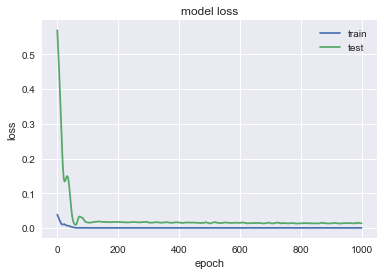

                BA
MSE        2096.38
MAE        35.8706
R2       -0.257017
MAPE (%)   10.1863


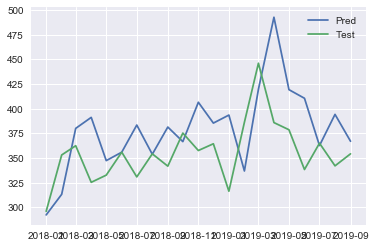

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3664 - val_loss: 0.0918
Epoch 2/1000
0s - loss: 0.3532 - val_loss: 0.0871
Epoch 3/1000
0s - loss: 0.3406 - val_loss: 0.0824
Epoch 4/1000
0s - loss: 0.3277 - val_loss: 0.0777
Epoch 5/1000
0s - loss: 0.3141 - val_loss: 0.0729
Epoch 6/1000
0s - loss: 0.3015 - val_loss: 0.0682
Epoch 7/1000
0s - loss: 0.2877 - val_loss: 0.0633
Epoch 8/1000
0s - loss: 0.2743 - val_loss: 0.0585
Epoch 9/1000
0s - loss: 0.2599 - val_loss: 0.0535
Epoch 10/1000
0s - loss: 0.2447 - val_loss: 0.0486
Epoch 11/1000
0s - loss: 0.2297 - val_loss: 0.0437
Epoch 12/1000
0s - loss: 0.2139 - val_loss: 0.0388
Epoch 13/1000
0s - loss: 0.1992 - val_loss: 0.0341
Epoch 14/1000
0s - loss: 0.1825 - val_loss: 0.0295
Epoch 15/1000
0s - loss: 0.1661 - val_loss: 0.0252
Epoch 16/1000
0s - loss: 0.1489 - val_loss: 0.0213
Epoch 17/1000
0s - loss: 0.1333 - val_loss: 0.0179
Epoch 18/1000
0s - loss: 0.1155 - val_loss: 0.0150
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0073 - val_loss: 0.0135
Epoch 166/1000
0s - loss: 0.0063 - val_loss: 0.0134
Epoch 167/1000
0s - loss: 0.0066 - val_loss: 0.0134
Epoch 168/1000
0s - loss: 0.0067 - val_loss: 0.0133
Epoch 169/1000
0s - loss: 0.0067 - val_loss: 0.0133
Epoch 170/1000
0s - loss: 0.0067 - val_loss: 0.0133
Epoch 171/1000
0s - loss: 0.0073 - val_loss: 0.0133
Epoch 172/1000
0s - loss: 0.0074 - val_loss: 0.0133
Epoch 173/1000
0s - loss: 0.0062 - val_loss: 0.0133
Epoch 174/1000
0s - loss: 0.0069 - val_loss: 0.0133
Epoch 175/1000
0s - loss: 0.0063 - val_loss: 0.0134
Epoch 176/1000
0s - loss: 0.0069 - val_loss: 0.0134
Epoch 177/1000
0s - loss: 0.0076 - val_loss: 0.0134
Epoch 178/1000
0s - loss: 0.0066 - val_loss: 0.0135
Epoch 179/1000
0s - loss: 0.0068 - val_loss: 0.0135
Epoch 180/1000
0s - loss: 0.0067 - val_loss: 0.0135
Epoch 181/1000
0s - loss: 0.0070 - val_loss: 0.0135
Epoch 182/1000
0s - loss: 0.0070 - val_loss: 0.0135
Epoch 183/1000
0s - loss: 0.0067 - val_loss: 0.0134
Epoch 184/1000
0s - loss: 0

0s - loss: 0.0075 - val_loss: 0.0133
Epoch 327/1000
0s - loss: 0.0057 - val_loss: 0.0134
Epoch 328/1000
0s - loss: 0.0068 - val_loss: 0.0134
Epoch 329/1000
0s - loss: 0.0063 - val_loss: 0.0134
Epoch 330/1000
0s - loss: 0.0075 - val_loss: 0.0135
Epoch 331/1000
0s - loss: 0.0071 - val_loss: 0.0135
Epoch 332/1000
0s - loss: 0.0069 - val_loss: 0.0135
Epoch 333/1000
0s - loss: 0.0065 - val_loss: 0.0136
Epoch 334/1000
0s - loss: 0.0063 - val_loss: 0.0135
Epoch 335/1000
0s - loss: 0.0066 - val_loss: 0.0135
Epoch 336/1000
0s - loss: 0.0065 - val_loss: 0.0135
Epoch 337/1000
0s - loss: 0.0070 - val_loss: 0.0134
Epoch 338/1000
0s - loss: 0.0071 - val_loss: 0.0133
Epoch 339/1000
0s - loss: 0.0067 - val_loss: 0.0133
Epoch 340/1000
0s - loss: 0.0062 - val_loss: 0.0133
Epoch 341/1000
0s - loss: 0.0068 - val_loss: 0.0133
Epoch 342/1000
0s - loss: 0.0071 - val_loss: 0.0134
Epoch 343/1000
0s - loss: 0.0063 - val_loss: 0.0134
Epoch 344/1000
0s - loss: 0.0068 - val_loss: 0.0135
Epoch 345/1000
0s - loss: 0

0s - loss: 0.0066 - val_loss: 0.0136
Epoch 485/1000
0s - loss: 0.0067 - val_loss: 0.0136
Epoch 486/1000
0s - loss: 0.0062 - val_loss: 0.0135
Epoch 487/1000
0s - loss: 0.0064 - val_loss: 0.0135
Epoch 488/1000
0s - loss: 0.0069 - val_loss: 0.0135
Epoch 489/1000
0s - loss: 0.0067 - val_loss: 0.0135
Epoch 490/1000
0s - loss: 0.0068 - val_loss: 0.0136
Epoch 491/1000
0s - loss: 0.0060 - val_loss: 0.0136
Epoch 492/1000
0s - loss: 0.0067 - val_loss: 0.0137
Epoch 493/1000
0s - loss: 0.0062 - val_loss: 0.0138
Epoch 494/1000
0s - loss: 0.0056 - val_loss: 0.0138
Epoch 495/1000
0s - loss: 0.0066 - val_loss: 0.0139
Epoch 496/1000
0s - loss: 0.0065 - val_loss: 0.0139
Epoch 497/1000
0s - loss: 0.0077 - val_loss: 0.0139
Epoch 498/1000
0s - loss: 0.0062 - val_loss: 0.0139
Epoch 499/1000
0s - loss: 0.0064 - val_loss: 0.0139
Epoch 500/1000
0s - loss: 0.0058 - val_loss: 0.0139
Epoch 501/1000
0s - loss: 0.0069 - val_loss: 0.0139
Epoch 502/1000
0s - loss: 0.0067 - val_loss: 0.0138
Epoch 503/1000
0s - loss: 0

0s - loss: 0.0060 - val_loss: 0.0141
Epoch 643/1000
0s - loss: 0.0059 - val_loss: 0.0141
Epoch 644/1000
0s - loss: 0.0061 - val_loss: 0.0140
Epoch 645/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 646/1000
0s - loss: 0.0058 - val_loss: 0.0139
Epoch 647/1000
0s - loss: 0.0062 - val_loss: 0.0139
Epoch 648/1000
0s - loss: 0.0070 - val_loss: 0.0140
Epoch 649/1000
0s - loss: 0.0074 - val_loss: 0.0140
Epoch 650/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 651/1000
0s - loss: 0.0064 - val_loss: 0.0140
Epoch 652/1000
0s - loss: 0.0063 - val_loss: 0.0140
Epoch 653/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 654/1000
0s - loss: 0.0065 - val_loss: 0.0140
Epoch 655/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 656/1000
0s - loss: 0.0060 - val_loss: 0.0140
Epoch 657/1000
0s - loss: 0.0065 - val_loss: 0.0140
Epoch 658/1000
0s - loss: 0.0066 - val_loss: 0.0140
Epoch 659/1000
0s - loss: 0.0061 - val_loss: 0.0140
Epoch 660/1000
0s - loss: 0.0064 - val_loss: 0.0140
Epoch 661/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0144
Epoch 802/1000
0s - loss: 0.0064 - val_loss: 0.0145
Epoch 803/1000
0s - loss: 0.0064 - val_loss: 0.0145
Epoch 804/1000
0s - loss: 0.0062 - val_loss: 0.0145
Epoch 805/1000
0s - loss: 0.0058 - val_loss: 0.0144
Epoch 806/1000
0s - loss: 0.0063 - val_loss: 0.0144
Epoch 807/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 808/1000
0s - loss: 0.0065 - val_loss: 0.0144
Epoch 809/1000
0s - loss: 0.0067 - val_loss: 0.0144
Epoch 810/1000
0s - loss: 0.0060 - val_loss: 0.0144
Epoch 811/1000
0s - loss: 0.0063 - val_loss: 0.0144
Epoch 812/1000
0s - loss: 0.0066 - val_loss: 0.0144
Epoch 813/1000
0s - loss: 0.0069 - val_loss: 0.0144
Epoch 814/1000
0s - loss: 0.0062 - val_loss: 0.0143
Epoch 815/1000
0s - loss: 0.0063 - val_loss: 0.0142
Epoch 816/1000
0s - loss: 0.0067 - val_loss: 0.0141
Epoch 817/1000
0s - loss: 0.0066 - val_loss: 0.0141
Epoch 818/1000
0s - loss: 0.0072 - val_loss: 0.0141
Epoch 819/1000
0s - loss: 0.0063 - val_loss: 0.0142
Epoch 820/1000
0s - loss: 0

0s - loss: 0.0063 - val_loss: 0.0146
Epoch 962/1000
0s - loss: 0.0063 - val_loss: 0.0146
Epoch 963/1000
0s - loss: 0.0063 - val_loss: 0.0146
Epoch 964/1000
0s - loss: 0.0065 - val_loss: 0.0147
Epoch 965/1000
0s - loss: 0.0066 - val_loss: 0.0148
Epoch 966/1000
0s - loss: 0.0058 - val_loss: 0.0148
Epoch 967/1000
0s - loss: 0.0068 - val_loss: 0.0149
Epoch 968/1000
0s - loss: 0.0072 - val_loss: 0.0148
Epoch 969/1000
0s - loss: 0.0067 - val_loss: 0.0148
Epoch 970/1000
0s - loss: 0.0064 - val_loss: 0.0147
Epoch 971/1000
0s - loss: 0.0069 - val_loss: 0.0146
Epoch 972/1000
0s - loss: 0.0069 - val_loss: 0.0146
Epoch 973/1000
0s - loss: 0.0060 - val_loss: 0.0145
Epoch 974/1000
0s - loss: 0.0075 - val_loss: 0.0145
Epoch 975/1000
0s - loss: 0.0059 - val_loss: 0.0146
Epoch 976/1000
0s - loss: 0.0066 - val_loss: 0.0146
Epoch 977/1000
0s - loss: 0.0061 - val_loss: 0.0147
Epoch 978/1000
0s - loss: 0.0065 - val_loss: 0.0149
Epoch 979/1000
0s - loss: 0.0060 - val_loss: 0.0149
Epoch 980/1000
0s - loss: 0

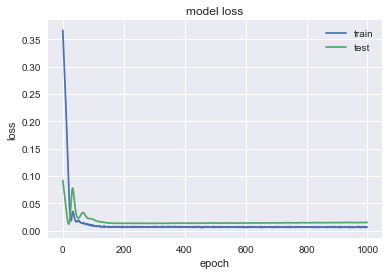

                IBM
MSE         150.923
MAE         8.89134
R2        0.0262241
MAPE (%)    6.76388


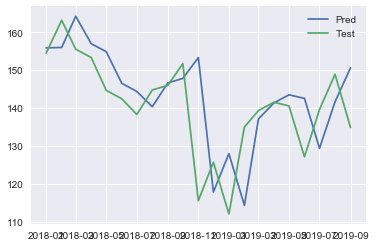

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1247 - val_loss: 0.2690
Epoch 2/1000
0s - loss: 0.1192 - val_loss: 0.2578
Epoch 3/1000
0s - loss: 0.1138 - val_loss: 0.2467
Epoch 4/1000
0s - loss: 0.1084 - val_loss: 0.2356
Epoch 5/1000
0s - loss: 0.1032 - val_loss: 0.2243
Epoch 6/1000
0s - loss: 0.0980 - val_loss: 0.2129
Epoch 7/1000
0s - loss: 0.0926 - val_loss: 0.2012
Epoch 8/1000
0s - loss: 0.0870 - val_loss: 0.1892
Epoch 9/1000
0s - loss: 0.0817 - val_loss: 0.1770
Epoch 10/1000
0s - loss: 0.0762 - val_loss: 0.1645
Epoch 11/1000
0s - loss: 0.0703 - val_loss: 0.1518
Epoch 12/1000
0s - loss: 0.0642 - val_loss: 0.1389
Epoch 13/1000
0s - loss: 0.0586 - val_loss: 0.1258
Epoch 14/1000
0s - loss: 0.0537 - val_loss: 0.1127
Epoch 15/1000
0s - loss: 0.0478 - val_loss: 0.0997
Epoch 16/1000
0s - loss: 0.0424 - val_loss: 0.0869
Epoch 17/1000
0s - loss: 0.0377 - val_loss: 0.0745
Epoch 18/1000
0s - loss: 0.0331 - val_loss: 0.0626
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0029 - val_loss: 0.0091
Epoch 162/1000
0s - loss: 0.0027 - val_loss: 0.0091
Epoch 163/1000
0s - loss: 0.0034 - val_loss: 0.0091
Epoch 164/1000
0s - loss: 0.0030 - val_loss: 0.0091
Epoch 165/1000
0s - loss: 0.0028 - val_loss: 0.0091
Epoch 166/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 0.0091
Epoch 168/1000
0s - loss: 0.0030 - val_loss: 0.0090
Epoch 169/1000
0s - loss: 0.0027 - val_loss: 0.0090
Epoch 170/1000
0s - loss: 0.0031 - val_loss: 0.0089
Epoch 171/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 172/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 173/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 174/1000
0s - loss: 0.0026 - val_loss: 0.0088
Epoch 175/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 176/1000
0s - loss: 0.0026 - val_loss: 0.0087
Epoch 177/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 178/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0087
Epoch 327/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 328/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 329/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 330/1000
0s - loss: 0.0024 - val_loss: 0.0087
Epoch 331/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 332/1000
0s - loss: 0.0027 - val_loss: 0.0089
Epoch 333/1000
0s - loss: 0.0030 - val_loss: 0.0090
Epoch 334/1000
0s - loss: 0.0030 - val_loss: 0.0090
Epoch 335/1000
0s - loss: 0.0027 - val_loss: 0.0091
Epoch 336/1000
0s - loss: 0.0029 - val_loss: 0.0090
Epoch 337/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 338/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 340/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 341/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 342/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 343/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 344/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 345/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0084
Epoch 487/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 488/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 489/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 490/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 491/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 492/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 493/1000
0s - loss: 0.0025 - val_loss: 0.0090
Epoch 494/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 495/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 496/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 497/1000
0s - loss: 0.0027 - val_loss: 0.0083
Epoch 498/1000
0s - loss: 0.0028 - val_loss: 0.0082
Epoch 499/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 500/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 501/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 502/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 503/1000
0s - loss: 0.0030 - val_loss: 0.0091
Epoch 504/1000
0s - loss: 0.0026 - val_loss: 0.0092
Epoch 505/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0084
Epoch 648/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 649/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 650/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 651/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 652/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 653/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 654/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 655/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 656/1000
0s - loss: 0.0029 - val_loss: 0.0081
Epoch 657/1000
0s - loss: 0.0031 - val_loss: 0.0080
Epoch 658/1000
0s - loss: 0.0029 - val_loss: 0.0080
Epoch 659/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 660/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 661/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 662/1000
0s - loss: 0.0031 - val_loss: 0.0089
Epoch 663/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 664/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 665/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 666/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0085
Epoch 810/1000
0s - loss: 0.0031 - val_loss: 0.0084
Epoch 811/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 812/1000
0s - loss: 0.0028 - val_loss: 0.0082
Epoch 813/1000
0s - loss: 0.0027 - val_loss: 0.0083
Epoch 814/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 815/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 816/1000
0s - loss: 0.0030 - val_loss: 0.0091
Epoch 817/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 818/1000
0s - loss: 0.0026 - val_loss: 0.0097
Epoch 819/1000
0s - loss: 0.0026 - val_loss: 0.0098
Epoch 820/1000
0s - loss: 0.0027 - val_loss: 0.0095
Epoch 821/1000
0s - loss: 0.0030 - val_loss: 0.0092
Epoch 822/1000
0s - loss: 0.0027 - val_loss: 0.0090
Epoch 823/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 824/1000
0s - loss: 0.0027 - val_loss: 0.0087
Epoch 825/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 826/1000
0s - loss: 0.0031 - val_loss: 0.0090
Epoch 827/1000
0s - loss: 0.0027 - val_loss: 0.0093
Epoch 828/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0086
Epoch 969/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 970/1000
0s - loss: 0.0030 - val_loss: 0.0090
Epoch 971/1000
0s - loss: 0.0028 - val_loss: 0.0092
Epoch 972/1000
0s - loss: 0.0030 - val_loss: 0.0091
Epoch 973/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 974/1000
0s - loss: 0.0027 - val_loss: 0.0089
Epoch 975/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 976/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 977/1000
0s - loss: 0.0032 - val_loss: 0.0088
Epoch 978/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 979/1000
0s - loss: 0.0026 - val_loss: 0.0088
Epoch 980/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 981/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 982/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 983/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 984/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 985/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 986/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 987/1000
0s - loss: 0

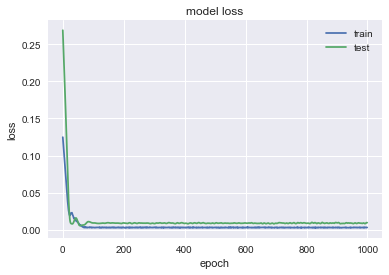

               ALB
MSE         105.52
MAE        7.91245
R2        0.682711
MAPE (%)    9.3304


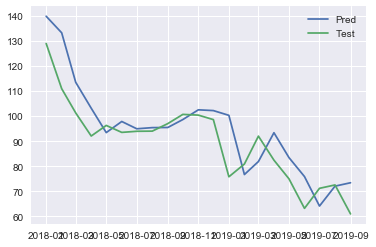

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1480 - val_loss: 0.6990
Epoch 2/1000
0s - loss: 0.1414 - val_loss: 0.6759
Epoch 3/1000
0s - loss: 0.1351 - val_loss: 0.6528
Epoch 4/1000
0s - loss: 0.1287 - val_loss: 0.6295
Epoch 5/1000
0s - loss: 0.1225 - val_loss: 0.6057
Epoch 6/1000
0s - loss: 0.1161 - val_loss: 0.5815
Epoch 7/1000
0s - loss: 0.1095 - val_loss: 0.5565
Epoch 8/1000
0s - loss: 0.1034 - val_loss: 0.5307
Epoch 9/1000
0s - loss: 0.0964 - val_loss: 0.5041
Epoch 10/1000
0s - loss: 0.0896 - val_loss: 0.4767
Epoch 11/1000
0s - loss: 0.0828 - val_loss: 0.4483
Epoch 12/1000
0s - loss: 0.0760 - val_loss: 0.4191
Epoch 13/1000
0s - loss: 0.0690 - val_loss: 0.3891
Epoch 14/1000
0s - loss: 0.0619 - val_loss: 0.3585
Epoch 15/1000
0s - loss: 0.0549 - val_loss: 0.3274
Epoch 16/1000
0s - loss: 0.0480 - val_loss: 0.2961
Epoch 17/1000
0s - loss: 0.0415 - val_loss: 0.2647
Epoch 18/1000
0s - loss: 0.0356 - val_loss: 0.2335
Epoch 19/1000
0s - loss: 0

Epoch 163/1000
0s - loss: 0.0036 - val_loss: 0.0083
Epoch 164/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 165/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 166/1000
0s - loss: 0.0033 - val_loss: 0.0086
Epoch 167/1000
0s - loss: 0.0035 - val_loss: 0.0087
Epoch 168/1000
0s - loss: 0.0032 - val_loss: 0.0087
Epoch 169/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 170/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 171/1000
0s - loss: 0.0030 - val_loss: 0.0085
Epoch 172/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 173/1000
0s - loss: 0.0034 - val_loss: 0.0084
Epoch 174/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 175/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 176/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 177/1000
0s - loss: 0.0034 - val_loss: 0.0082
Epoch 178/1000
0s - loss: 0.0032 - val_loss: 0.0082
Epoch 179/1000
0s - loss: 0.0034 - val_loss: 0.0082
Epoch 180/1000
0s - loss: 0.0032 - val_loss: 0.0082
Epoch 181/1000
0s - loss: 0.0032 - val_loss: 0.0083
Epoch 182/10

0s - loss: 0.0034 - val_loss: 0.0078
Epoch 326/1000
0s - loss: 0.0030 - val_loss: 0.0078
Epoch 327/1000
0s - loss: 0.0036 - val_loss: 0.0078
Epoch 328/1000
0s - loss: 0.0034 - val_loss: 0.0078
Epoch 329/1000
0s - loss: 0.0036 - val_loss: 0.0077
Epoch 330/1000
0s - loss: 0.0034 - val_loss: 0.0077
Epoch 331/1000
0s - loss: 0.0032 - val_loss: 0.0076
Epoch 332/1000
0s - loss: 0.0033 - val_loss: 0.0075
Epoch 333/1000
0s - loss: 0.0032 - val_loss: 0.0075
Epoch 334/1000
0s - loss: 0.0032 - val_loss: 0.0075
Epoch 335/1000
0s - loss: 0.0034 - val_loss: 0.0075
Epoch 336/1000
0s - loss: 0.0033 - val_loss: 0.0075
Epoch 337/1000
0s - loss: 0.0031 - val_loss: 0.0075
Epoch 338/1000
0s - loss: 0.0035 - val_loss: 0.0075
Epoch 339/1000
0s - loss: 0.0036 - val_loss: 0.0076
Epoch 340/1000
0s - loss: 0.0032 - val_loss: 0.0076
Epoch 341/1000
0s - loss: 0.0029 - val_loss: 0.0076
Epoch 342/1000
0s - loss: 0.0029 - val_loss: 0.0077
Epoch 343/1000
0s - loss: 0.0031 - val_loss: 0.0078
Epoch 344/1000
0s - loss: 0

0s - loss: 0.0037 - val_loss: 0.0071
Epoch 490/1000
0s - loss: 0.0033 - val_loss: 0.0071
Epoch 491/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 492/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 493/1000
0s - loss: 0.0032 - val_loss: 0.0071
Epoch 494/1000
0s - loss: 0.0033 - val_loss: 0.0071
Epoch 495/1000
0s - loss: 0.0031 - val_loss: 0.0071
Epoch 496/1000
0s - loss: 0.0031 - val_loss: 0.0071
Epoch 497/1000
0s - loss: 0.0031 - val_loss: 0.0071
Epoch 498/1000
0s - loss: 0.0031 - val_loss: 0.0071
Epoch 499/1000
0s - loss: 0.0033 - val_loss: 0.0071
Epoch 500/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 501/1000
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 502/1000
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 503/1000
0s - loss: 0.0033 - val_loss: 0.0070
Epoch 504/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 505/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 506/1000
0s - loss: 0.0029 - val_loss: 0.0071
Epoch 507/1000
0s - loss: 0.0031 - val_loss: 0.0071
Epoch 508/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0068
Epoch 651/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 652/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 653/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 654/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 655/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 656/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 657/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 658/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 659/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 660/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 661/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 662/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 663/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 664/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 665/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 666/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 667/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 668/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 669/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0067
Epoch 811/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 812/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 813/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 814/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 815/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 816/1000
0s - loss: 0.0029 - val_loss: 0.0070
Epoch 817/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 818/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 819/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 820/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 821/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 822/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 823/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 824/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 825/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 826/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 827/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 828/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 829/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0067
Epoch 970/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 971/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 972/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 973/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 974/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 975/1000
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 976/1000
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 977/1000
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 978/1000
0s - loss: 0.0030 - val_loss: 0.0066
Epoch 979/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 980/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 981/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 982/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 983/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 984/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 985/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 986/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 987/1000
0s - loss: 0.0030 - val_loss: 0.0066
Epoch 988/1000
0s - loss: 0

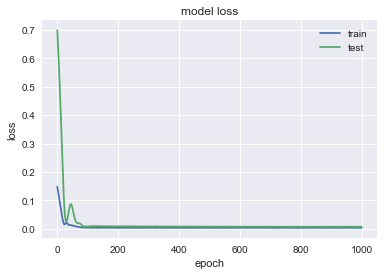

               CBRE
MSE         11.1633
MAE          2.6952
R2        0.0491186
MAPE (%)    5.79666


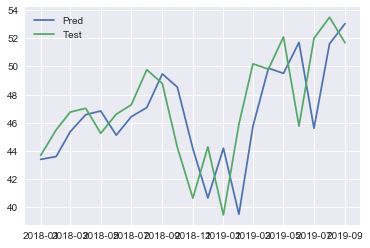

In [95]:
pred_4 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_4[comp] = nn_forec(df,comp,n_train_time=test.shape[0],first_layer = 256,second_layer=128).values

In [96]:
lstm_uni_64_32 = eval(pred,test,companies=companies)
lstm_uni_64_32

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.58525,60.2147,4.2147,9.16061,1801.71,42.2324,1779.66,139.949,100.758,11.4238
MAE,1.21754,6.48609,1.81638,2.3552,36.019,4.85176,33.7751,8.33748,7.762,2.72289
R2,0.570511,-0.144911,0.353124,0.204051,0.373052,0.318678,-0.164145,-0.142641,0.695533,0.102075
MAPE (%),3.71182,9.7791,3.81116,9.47024,7.90744,8.26606,9.56222,6.36953,9.16912,5.86318


In [97]:
lstm_uni_64_32.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &     ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.59 &  60.21 &  4.21 &  9.16 &  1801.71 &  42.23 &  1779.66 &  139.95 &  100.76 &  11.42 \\\\\nMAE      &  1.22 &   6.49 &  1.82 &  2.36 &    36.02 &   4.85 &    33.78 &    8.34 &    7.76 &   2.72 \\\\\nR2       &  0.57 &  -0.14 &  0.35 &  0.20 &     0.37 &   0.32 &    -0.16 &   -0.14 &    0.70 &   0.10 \\\\\nMAPE (\\%) &  3.71 &   9.78 &  3.81 &  9.47 &     7.91 &   8.27 &     9.56 &    6.37 &    9.17 &   5.86 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [98]:
lstm_uni_64_32.astype(float).round(2)

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.59,60.21,4.21,9.16,1801.71,42.23,1779.66,139.95,100.76,11.42
MAE,1.22,6.49,1.82,2.36,36.02,4.85,33.78,8.34,7.76,2.72
R2,0.57,-0.14,0.35,0.20,0.37,0.32,-0.16,-0.14,0.70,0.10
MAPE (%),3.71,9.78,3.81,9.47,7.91,8.27,9.56,6.37,9.17,5.86


In [99]:
print("Average = ",lstm_uni_64_32.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.391


In [100]:
lstm_uni_32_16 = eval(pred_2,test,companies=companies)
lstm_uni_32_16

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.5912,64.0021,3.88287,9.50474,2030.41,42.2816,2124.4,132.338,90.4237,13.5098
MAE,1.22321,6.45349,1.68784,2.38313,38.0074,4.93089,36.3367,7.84227,7.39216,2.85137
R2,0.57611,-0.147441,0.502161,0.0282047,0.351366,0.347533,-0.333843,-0.318587,0.722687,0.169561
MAPE (%),3.72553,9.79483,3.57517,9.63024,8.33491,8.3603,10.3328,6.01494,8.74436,6.20074


In [101]:
lstm_uni_32_16.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.59 &  64.00 &  3.88 &  9.50 &  2030.41 &  42.28 &  2124.40 &  132.34 &  90.42 &  13.51 \\\\\nMAE      &  1.22 &   6.45 &  1.69 &  2.38 &    38.01 &   4.93 &    36.34 &    7.84 &   7.39 &   2.85 \\\\\nR2       &  0.58 &  -0.15 &  0.50 &  0.03 &     0.35 &   0.35 &    -0.33 &   -0.32 &   0.72 &   0.17 \\\\\nMAPE (\\%) &  3.73 &   9.79 &  3.58 &  9.63 &     8.33 &   8.36 &    10.33 &    6.01 &   8.74 &   6.20 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [102]:
print("Average = ",lstm_uni_32_16.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.470000000000001


In [103]:
lstm_uni_128_64 = eval(pred_3,test,companies=companies)
lstm_uni_128_64

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.69899,58.1315,4.20551,8.31563,1855.98,41.9276,1957.23,142.141,107.024,11.2105
MAE,1.25193,6.45838,1.78408,2.22934,36.4198,4.82527,34.9787,8.54085,7.96256,2.6991
R2,0.557041,-0.170706,0.25499,0.405056,0.358425,0.308827,-0.220421,-0.0162037,0.675802,0.0661157
MAPE (%),3.82678,9.71273,3.72785,8.85801,7.99655,8.22096,9.92091,6.50687,9.39724,5.80788


In [104]:
lstm_uni_128_64.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &     ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.70 &  58.13 &  4.21 &  8.32 &  1855.98 &  41.93 &  1957.23 &  142.14 &  107.02 &  11.21 \\\\\nMAE      &  1.25 &   6.46 &  1.78 &  2.23 &    36.42 &   4.83 &    34.98 &    8.54 &    7.96 &   2.70 \\\\\nR2       &  0.56 &  -0.17 &  0.25 &  0.41 &     0.36 &   0.31 &    -0.22 &   -0.02 &    0.68 &   0.07 \\\\\nMAPE (\\%) &  3.83 &   9.71 &  3.73 &  8.86 &     8.00 &   8.22 &     9.92 &    6.51 &    9.40 &   5.81 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [105]:
print("Average = ",lstm_uni_128_64.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.399000000000001


In [106]:
lstm_uni_256_128 = eval(pred_4,test,companies=companies)
lstm_uni_256_128

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.70762,57.3144,4.63138,8.70802,1711.02,42.1139,2096.38,150.923,105.52,11.1633
MAE,1.25387,6.41974,1.89355,2.26971,35.2271,4.81994,35.8706,8.89134,7.91245,2.6952
R2,0.551712,-0.184231,0.119487,0.4182,0.392251,0.302916,-0.257017,0.0262241,0.682711,0.0491186
MAPE (%),3.83498,9.65285,3.9412,9.02586,7.73047,8.22649,10.1863,6.76388,9.3304,5.79666


In [107]:
lstm_uni_256_128.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &     ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.71 &  57.31 &  4.63 &  8.71 &  1711.02 &  42.11 &  2096.38 &  150.92 &  105.52 &  11.16 \\\\\nMAE      &  1.25 &   6.42 &  1.89 &  2.27 &    35.23 &   4.82 &    35.87 &    8.89 &    7.91 &   2.70 \\\\\nR2       &  0.55 &  -0.18 &  0.12 &  0.42 &     0.39 &   0.30 &    -0.26 &    0.03 &    0.68 &   0.05 \\\\\nMAPE (\\%) &  3.83 &   9.65 &  3.94 &  9.03 &     7.73 &   8.23 &    10.19 &    6.76 &    9.33 &   5.80 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [108]:
print("Average = ",lstm_uni_256_128.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.449


In [109]:
triv_prec.astype(float).round(3)

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.530,55.271,3.961,8.185,1434.642,39.485,1281.949,154.348,85.375,11.903
MAE,1.212,6.275,1.711,2.338,32.409,4.706,30.049,9.342,7.090,2.829
R2,0.636,-0.278,0.465,0.533,0.412,0.450,-0.346,0.046,0.615,0.062
MAPE (%),3.744,9.444,3.617,9.192,7.122,8.155,8.311,7.072,8.645,6.094


In [110]:
print("Average = ",triv_prec.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.139000000000001


In [111]:
arima_prec.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.53 &  55.27 &  3.96 &  8.19 &  1434.64 &  39.49 &  1281.95 &  154.35 &  85.38 &  11.90 \\\\\nMAE      &  1.21 &   6.28 &  1.71 &  2.34 &    32.41 &   4.71 &    30.05 &    9.34 &   7.09 &   2.83 \\\\\nR2       &  0.64 &  -0.28 &  0.47 &  0.53 &     0.41 &   0.45 &    -0.35 &    0.05 &   0.62 &   0.06 \\\\\nMAPE (\\%) &  3.74 &   9.44 &  3.62 &  9.19 &     7.12 &   8.16 &     8.31 &    7.07 &   8.65 &   6.09 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [112]:
print("Average = ",arima_prec.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.139000000000001


In [113]:
v =  [3.71,   9.65 , 3.57 ,  8.85 ,     7.73 ,  8.27 ,     9.56 ,    6.01 ,    8.74 ,   5.79]

In [115]:
np.mean(v)

7.188000000000001

In [127]:
pred.shape

(21, 10)

## GRU

In [122]:
def nn_forec_GRU(df,company,n_lags = 1,feature_range=(0, 1),n_train_time = 166,first_layer = 64,second_layer=32 ):
    print("Predicting for ", company)
    comp = df[company]
    scaler = MinMaxScaler(feature_range=feature_range)
    comp = scaler.fit_transform(comp)
    comp = pd.DataFrame(comp,columns=[company+"(t)"],index=df.index)
    for i in range(1,n_lags+1):
        comp[company+"(t-"+str(i)+")"] = comp[company+"(t)"].shift(i)
    
    comp = comp.dropna()
    values = comp.values

    n_train_time = n_train_time
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(GRU(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(GRU(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='adam')



    # fit network
    history = model.fit(train_X, train_y, epochs=1000, batch_size=300, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler.inverse_transform(test_y)
    test = df["2018-01-01":].copy()
    train = df[:"2018-01-01"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company])
    print(lstm_eval)
    
    plt.plot(predictions[company])
    plt.plot(test[company])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3220 - val_loss: 0.2215
Epoch 2/1000
0s - loss: 0.3078 - val_loss: 0.2114
Epoch 3/1000
0s - loss: 0.2960 - val_loss: 0.2016
Epoch 4/1000
0s - loss: 0.2855 - val_loss: 0.1920
Epoch 5/1000
0s - loss: 0.2729 - val_loss: 0.1826
Epoch 6/1000
0s - loss: 0.2609 - val_loss: 0.1734
Epoch 7/1000
0s - loss: 0.2466 - val_loss: 0.1643
Epoch 8/1000
0s - loss: 0.2366 - val_loss: 0.1555
Epoch 9/1000
0s - loss: 0.2244 - val_loss: 0.1467
Epoch 10/1000
0s - loss: 0.2136 - val_loss: 0.1382
Epoch 11/1000
0s - loss: 0.2033 - val_loss: 0.1297
Epoch 12/1000
0s - loss: 0.1944 - val_loss: 0.1214
Epoch 13/1000
0s - loss: 0.1835 - val_loss: 0.1133
Epoch 14/1000
0s - loss: 0.1705 - val_loss: 0.1053
Epoch 15/1000
0s - loss: 0.1627 - val_loss: 0.0975
Epoch 16/1000
0s - loss: 0.1520 - val_loss: 0.0898
Epoch 17/1000
0s - loss: 0.1405 - val_loss: 0.0824
Epoch 18/1000
0s - loss: 0.1342 - val_loss: 0.0751
Epoch 19/1000
0s - loss: 0.12

0s - loss: 0.0089 - val_loss: 0.0069
Epoch 185/1000
0s - loss: 0.0079 - val_loss: 0.0069
Epoch 186/1000
0s - loss: 0.0092 - val_loss: 0.0069
Epoch 187/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 188/1000
0s - loss: 0.0082 - val_loss: 0.0069
Epoch 189/1000
0s - loss: 0.0091 - val_loss: 0.0069
Epoch 190/1000
0s - loss: 0.0089 - val_loss: 0.0069
Epoch 191/1000
0s - loss: 0.0093 - val_loss: 0.0069
Epoch 192/1000
0s - loss: 0.0095 - val_loss: 0.0069
Epoch 193/1000
0s - loss: 0.0090 - val_loss: 0.0069
Epoch 194/1000
0s - loss: 0.0104 - val_loss: 0.0069
Epoch 195/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 196/1000
0s - loss: 0.0093 - val_loss: 0.0069
Epoch 197/1000
0s - loss: 0.0097 - val_loss: 0.0069
Epoch 198/1000
0s - loss: 0.0076 - val_loss: 0.0069
Epoch 199/1000
0s - loss: 0.0085 - val_loss: 0.0069
Epoch 200/1000
0s - loss: 0.0088 - val_loss: 0.0069
Epoch 201/1000
0s - loss: 0.0086 - val_loss: 0.0069
Epoch 202/1000
0s - loss: 0.0090 - val_loss: 0.0069
Epoch 203/1000
0s - loss: 0

0s - loss: 0.0090 - val_loss: 0.0070
Epoch 346/1000
0s - loss: 0.0091 - val_loss: 0.0070
Epoch 347/1000
0s - loss: 0.0070 - val_loss: 0.0070
Epoch 348/1000
0s - loss: 0.0099 - val_loss: 0.0070
Epoch 349/1000
0s - loss: 0.0091 - val_loss: 0.0070
Epoch 350/1000
0s - loss: 0.0071 - val_loss: 0.0071
Epoch 351/1000
0s - loss: 0.0093 - val_loss: 0.0071
Epoch 352/1000
0s - loss: 0.0071 - val_loss: 0.0071
Epoch 353/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 354/1000
0s - loss: 0.0090 - val_loss: 0.0071
Epoch 355/1000
0s - loss: 0.0086 - val_loss: 0.0071
Epoch 356/1000
0s - loss: 0.0104 - val_loss: 0.0071
Epoch 357/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 358/1000
0s - loss: 0.0072 - val_loss: 0.0071
Epoch 359/1000
0s - loss: 0.0077 - val_loss: 0.0070
Epoch 360/1000
0s - loss: 0.0084 - val_loss: 0.0070
Epoch 361/1000
0s - loss: 0.0091 - val_loss: 0.0070
Epoch 362/1000
0s - loss: 0.0087 - val_loss: 0.0070
Epoch 363/1000
0s - loss: 0.0079 - val_loss: 0.0070
Epoch 364/1000
0s - loss: 0

0s - loss: 0.0059 - val_loss: 0.0071
Epoch 522/1000
0s - loss: 0.0079 - val_loss: 0.0071
Epoch 523/1000
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 524/1000
0s - loss: 0.0083 - val_loss: 0.0072
Epoch 525/1000
0s - loss: 0.0087 - val_loss: 0.0072
Epoch 526/1000
0s - loss: 0.0089 - val_loss: 0.0072
Epoch 527/1000
0s - loss: 0.0090 - val_loss: 0.0072
Epoch 528/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 529/1000
0s - loss: 0.0077 - val_loss: 0.0071
Epoch 530/1000
0s - loss: 0.0074 - val_loss: 0.0071
Epoch 531/1000
0s - loss: 0.0097 - val_loss: 0.0071
Epoch 532/1000
0s - loss: 0.0077 - val_loss: 0.0071
Epoch 533/1000
0s - loss: 0.0085 - val_loss: 0.0071
Epoch 534/1000
0s - loss: 0.0086 - val_loss: 0.0071
Epoch 535/1000
0s - loss: 0.0064 - val_loss: 0.0071
Epoch 536/1000
0s - loss: 0.0085 - val_loss: 0.0071
Epoch 537/1000
0s - loss: 0.0081 - val_loss: 0.0072
Epoch 538/1000
0s - loss: 0.0086 - val_loss: 0.0072
Epoch 539/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 540/1000
0s - loss: 0

0s - loss: 0.0079 - val_loss: 0.0072
Epoch 680/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 681/1000
0s - loss: 0.0078 - val_loss: 0.0072
Epoch 682/1000
0s - loss: 0.0086 - val_loss: 0.0072
Epoch 683/1000
0s - loss: 0.0084 - val_loss: 0.0072
Epoch 684/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 685/1000
0s - loss: 0.0082 - val_loss: 0.0072
Epoch 686/1000
0s - loss: 0.0095 - val_loss: 0.0072
Epoch 687/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 688/1000
0s - loss: 0.0072 - val_loss: 0.0072
Epoch 689/1000
0s - loss: 0.0080 - val_loss: 0.0073
Epoch 690/1000
0s - loss: 0.0077 - val_loss: 0.0073
Epoch 691/1000
0s - loss: 0.0082 - val_loss: 0.0073
Epoch 692/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 693/1000
0s - loss: 0.0100 - val_loss: 0.0073
Epoch 694/1000
0s - loss: 0.0065 - val_loss: 0.0073
Epoch 695/1000
0s - loss: 0.0088 - val_loss: 0.0072
Epoch 696/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 697/1000
0s - loss: 0.0081 - val_loss: 0.0072
Epoch 698/1000
0s - loss: 0

0s - loss: 0.0084 - val_loss: 0.0071
Epoch 856/1000
0s - loss: 0.0079 - val_loss: 0.0072
Epoch 857/1000
0s - loss: 0.0078 - val_loss: 0.0073
Epoch 858/1000
0s - loss: 0.0079 - val_loss: 0.0074
Epoch 859/1000
0s - loss: 0.0083 - val_loss: 0.0075
Epoch 860/1000
0s - loss: 0.0095 - val_loss: 0.0076
Epoch 861/1000
0s - loss: 0.0079 - val_loss: 0.0076
Epoch 862/1000
0s - loss: 0.0080 - val_loss: 0.0076
Epoch 863/1000
0s - loss: 0.0084 - val_loss: 0.0075
Epoch 864/1000
0s - loss: 0.0092 - val_loss: 0.0074
Epoch 865/1000
0s - loss: 0.0063 - val_loss: 0.0073
Epoch 866/1000
0s - loss: 0.0079 - val_loss: 0.0072
Epoch 867/1000
0s - loss: 0.0069 - val_loss: 0.0072
Epoch 868/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 869/1000
0s - loss: 0.0082 - val_loss: 0.0072
Epoch 870/1000
0s - loss: 0.0079 - val_loss: 0.0072
Epoch 871/1000
0s - loss: 0.0075 - val_loss: 0.0072
Epoch 872/1000
0s - loss: 0.0083 - val_loss: 0.0072
Epoch 873/1000
0s - loss: 0.0081 - val_loss: 0.0073
Epoch 874/1000
0s - loss: 0

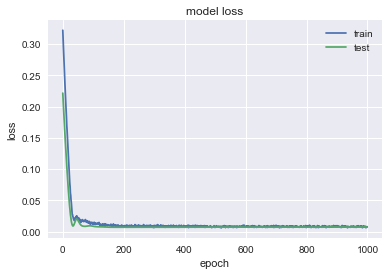

                 T
MSE        2.62676
MAE        1.23224
R2        0.569504
MAPE (%)   3.76066


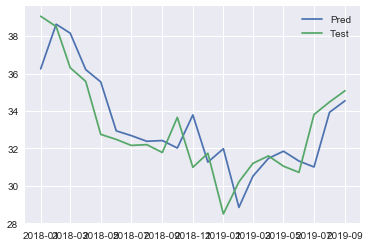

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1233 - val_loss: 0.6997
Epoch 2/1000
0s - loss: 0.1162 - val_loss: 0.6705
Epoch 3/1000
0s - loss: 0.1094 - val_loss: 0.6418
Epoch 4/1000
0s - loss: 0.1023 - val_loss: 0.6135
Epoch 5/1000
0s - loss: 0.0955 - val_loss: 0.5858
Epoch 6/1000
0s - loss: 0.0897 - val_loss: 0.5585
Epoch 7/1000
0s - loss: 0.0829 - val_loss: 0.5317
Epoch 8/1000
0s - loss: 0.0772 - val_loss: 0.5052
Epoch 9/1000
0s - loss: 0.0716 - val_loss: 0.4792
Epoch 10/1000
0s - loss: 0.0667 - val_loss: 0.4535
Epoch 11/1000
0s - loss: 0.0619 - val_loss: 0.4284
Epoch 12/1000
0s - loss: 0.0553 - val_loss: 0.4036
Epoch 13/1000
0s - loss: 0.0510 - val_loss: 0.3794
Epoch 14/1000
0s - loss: 0.0470 - val_loss: 0.3556
Epoch 15/1000
0s - loss: 0.0410 - val_loss: 0.3324
Epoch 16/1000
0s - loss: 0.0388 - val_loss: 0.3097
Epoch 17/1000
0s - loss: 0.0322 - val_loss: 0.2877
Epoch 18/1000
0s - loss: 0.0302 - val_loss: 0.2663
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0039 - val_loss: 0.0128
Epoch 164/1000
0s - loss: 0.0039 - val_loss: 0.0128
Epoch 165/1000
0s - loss: 0.0043 - val_loss: 0.0128
Epoch 166/1000
0s - loss: 0.0042 - val_loss: 0.0128
Epoch 167/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 168/1000
0s - loss: 0.0028 - val_loss: 0.0128
Epoch 169/1000
0s - loss: 0.0036 - val_loss: 0.0129
Epoch 170/1000
0s - loss: 0.0038 - val_loss: 0.0129
Epoch 171/1000
0s - loss: 0.0039 - val_loss: 0.0129
Epoch 172/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0129
Epoch 174/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 175/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 176/1000
0s - loss: 0.0034 - val_loss: 0.0129
Epoch 177/1000
0s - loss: 0.0036 - val_loss: 0.0129
Epoch 178/1000
0s - loss: 0.0027 - val_loss: 0.0129
Epoch 179/1000
0s - loss: 0.0039 - val_loss: 0.0130
Epoch 180/1000
0s - loss: 0.0038 - val_loss: 0.0130
Epoch 181/1000
0s - loss: 0.0035 - val_loss: 0.0130
Epoch 182/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0130
Epoch 338/1000
0s - loss: 0.0040 - val_loss: 0.0130
Epoch 339/1000
0s - loss: 0.0032 - val_loss: 0.0130
Epoch 340/1000
0s - loss: 0.0030 - val_loss: 0.0131
Epoch 341/1000
0s - loss: 0.0033 - val_loss: 0.0131
Epoch 342/1000
0s - loss: 0.0034 - val_loss: 0.0131
Epoch 343/1000
0s - loss: 0.0038 - val_loss: 0.0131
Epoch 344/1000
0s - loss: 0.0037 - val_loss: 0.0131
Epoch 345/1000
0s - loss: 0.0043 - val_loss: 0.0131
Epoch 346/1000
0s - loss: 0.0037 - val_loss: 0.0132
Epoch 347/1000
0s - loss: 0.0031 - val_loss: 0.0132
Epoch 348/1000
0s - loss: 0.0039 - val_loss: 0.0132
Epoch 349/1000
0s - loss: 0.0032 - val_loss: 0.0132
Epoch 350/1000
0s - loss: 0.0034 - val_loss: 0.0132
Epoch 351/1000
0s - loss: 0.0033 - val_loss: 0.0131
Epoch 352/1000
0s - loss: 0.0040 - val_loss: 0.0131
Epoch 353/1000
0s - loss: 0.0035 - val_loss: 0.0131
Epoch 354/1000
0s - loss: 0.0035 - val_loss: 0.0131
Epoch 355/1000
0s - loss: 0.0041 - val_loss: 0.0131
Epoch 356/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0128
Epoch 516/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 517/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 518/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 519/1000
0s - loss: 0.0033 - val_loss: 0.0129
Epoch 520/1000
0s - loss: 0.0036 - val_loss: 0.0129
Epoch 521/1000
0s - loss: 0.0044 - val_loss: 0.0129
Epoch 522/1000
0s - loss: 0.0030 - val_loss: 0.0129
Epoch 523/1000
0s - loss: 0.0038 - val_loss: 0.0129
Epoch 524/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 525/1000
0s - loss: 0.0034 - val_loss: 0.0129
Epoch 526/1000
0s - loss: 0.0039 - val_loss: 0.0129
Epoch 527/1000
0s - loss: 0.0040 - val_loss: 0.0128
Epoch 528/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 529/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 530/1000
0s - loss: 0.0037 - val_loss: 0.0128
Epoch 531/1000
0s - loss: 0.0038 - val_loss: 0.0129
Epoch 532/1000
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 533/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 534/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0127
Epoch 683/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 684/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 685/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 686/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 687/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 688/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 689/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 690/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 691/1000
0s - loss: 0.0036 - val_loss: 0.0126
Epoch 692/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 693/1000
0s - loss: 0.0037 - val_loss: 0.0127
Epoch 694/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 695/1000
0s - loss: 0.0042 - val_loss: 0.0127
Epoch 696/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 697/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 698/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 699/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 700/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 701/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0127
Epoch 841/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 842/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 843/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 844/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 845/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 846/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 847/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 848/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 849/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 850/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 851/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 852/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 853/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 854/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 855/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 856/1000
0s - loss: 0.0027 - val_loss: 0.0126
Epoch 857/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 858/1000
0s - loss: 0.0040 - val_loss: 0.0126
Epoch 859/1000
0s - loss: 0

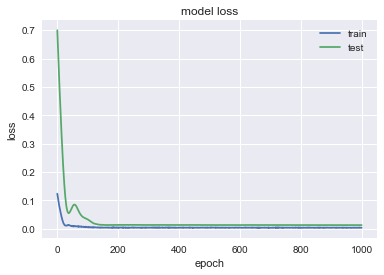

               BBY
MSE        57.0848
MAE        6.46482
R2       -0.191064
MAPE (%)   9.69956


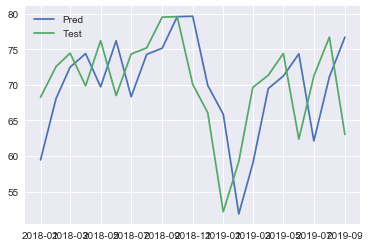

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2489 - val_loss: 0.5726
Epoch 2/1000
0s - loss: 0.2376 - val_loss: 0.5496
Epoch 3/1000
0s - loss: 0.2251 - val_loss: 0.5270
Epoch 4/1000
0s - loss: 0.2159 - val_loss: 0.5048
Epoch 5/1000
0s - loss: 0.2045 - val_loss: 0.4830
Epoch 6/1000
0s - loss: 0.1933 - val_loss: 0.4615
Epoch 7/1000
0s - loss: 0.1835 - val_loss: 0.4404
Epoch 8/1000
0s - loss: 0.1746 - val_loss: 0.4196
Epoch 9/1000
0s - loss: 0.1621 - val_loss: 0.3991
Epoch 10/1000
0s - loss: 0.1514 - val_loss: 0.3788
Epoch 11/1000
0s - loss: 0.1440 - val_loss: 0.3589
Epoch 12/1000
0s - loss: 0.1325 - val_loss: 0.3392
Epoch 13/1000
0s - loss: 0.1249 - val_loss: 0.3199
Epoch 14/1000
0s - loss: 0.1173 - val_loss: 0.3009
Epoch 15/1000
0s - loss: 0.1058 - val_loss: 0.2822
Epoch 16/1000
0s - loss: 0.0992 - val_loss: 0.2638
Epoch 17/1000
0s - loss: 0.0904 - val_loss: 0.2458
Epoch 18/1000
0s - loss: 0.0817 - val_loss: 0.2283
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0051 - val_loss: 0.0077
Epoch 176/1000
0s - loss: 0.0044 - val_loss: 0.0074
Epoch 177/1000
0s - loss: 0.0040 - val_loss: 0.0073
Epoch 178/1000
0s - loss: 0.0054 - val_loss: 0.0071
Epoch 179/1000
0s - loss: 0.0039 - val_loss: 0.0069
Epoch 180/1000
0s - loss: 0.0044 - val_loss: 0.0068
Epoch 181/1000
0s - loss: 0.0039 - val_loss: 0.0066
Epoch 182/1000
0s - loss: 0.0052 - val_loss: 0.0065
Epoch 183/1000
0s - loss: 0.0042 - val_loss: 0.0065
Epoch 184/1000
0s - loss: 0.0045 - val_loss: 0.0064
Epoch 185/1000
0s - loss: 0.0042 - val_loss: 0.0064
Epoch 186/1000
0s - loss: 0.0033 - val_loss: 0.0064
Epoch 187/1000
0s - loss: 0.0045 - val_loss: 0.0064
Epoch 188/1000
0s - loss: 0.0037 - val_loss: 0.0064
Epoch 189/1000
0s - loss: 0.0043 - val_loss: 0.0063
Epoch 190/1000
0s - loss: 0.0040 - val_loss: 0.0063
Epoch 191/1000
0s - loss: 0.0046 - val_loss: 0.0063
Epoch 192/1000
0s - loss: 0.0032 - val_loss: 0.0063
Epoch 193/1000
0s - loss: 0.0040 - val_loss: 0.0063
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0046
Epoch 351/1000
0s - loss: 0.0039 - val_loss: 0.0047
Epoch 352/1000
0s - loss: 0.0037 - val_loss: 0.0046
Epoch 353/1000
0s - loss: 0.0035 - val_loss: 0.0046
Epoch 354/1000
0s - loss: 0.0037 - val_loss: 0.0045
Epoch 355/1000
0s - loss: 0.0030 - val_loss: 0.0045
Epoch 356/1000
0s - loss: 0.0039 - val_loss: 0.0044
Epoch 357/1000
0s - loss: 0.0032 - val_loss: 0.0044
Epoch 358/1000
0s - loss: 0.0038 - val_loss: 0.0044
Epoch 359/1000
0s - loss: 0.0029 - val_loss: 0.0044
Epoch 360/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 361/1000
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 362/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 363/1000
0s - loss: 0.0042 - val_loss: 0.0044
Epoch 364/1000
0s - loss: 0.0036 - val_loss: 0.0044
Epoch 365/1000
0s - loss: 0.0029 - val_loss: 0.0044
Epoch 366/1000
0s - loss: 0.0033 - val_loss: 0.0044
Epoch 367/1000
0s - loss: 0.0026 - val_loss: 0.0044
Epoch 368/1000
0s - loss: 0.0036 - val_loss: 0.0044
Epoch 369/1000
0s - loss: 0

0s - loss: 0.0037 - val_loss: 0.0042
Epoch 532/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 533/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 534/1000
0s - loss: 0.0035 - val_loss: 0.0044
Epoch 535/1000
0s - loss: 0.0034 - val_loss: 0.0045
Epoch 536/1000
0s - loss: 0.0028 - val_loss: 0.0046
Epoch 537/1000
0s - loss: 0.0040 - val_loss: 0.0047
Epoch 538/1000
0s - loss: 0.0027 - val_loss: 0.0048
Epoch 539/1000
0s - loss: 0.0031 - val_loss: 0.0048
Epoch 540/1000
0s - loss: 0.0026 - val_loss: 0.0049
Epoch 541/1000
0s - loss: 0.0033 - val_loss: 0.0048
Epoch 542/1000
0s - loss: 0.0038 - val_loss: 0.0048
Epoch 543/1000
0s - loss: 0.0034 - val_loss: 0.0047
Epoch 544/1000
0s - loss: 0.0035 - val_loss: 0.0046
Epoch 545/1000
0s - loss: 0.0041 - val_loss: 0.0045
Epoch 546/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 547/1000
0s - loss: 0.0032 - val_loss: 0.0042
Epoch 548/1000
0s - loss: 0.0025 - val_loss: 0.0042
Epoch 549/1000
0s - loss: 0.0029 - val_loss: 0.0041
Epoch 550/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0045
Epoch 719/1000
0s - loss: 0.0033 - val_loss: 0.0046
Epoch 720/1000
0s - loss: 0.0032 - val_loss: 0.0047
Epoch 721/1000
0s - loss: 0.0034 - val_loss: 0.0047
Epoch 722/1000
0s - loss: 0.0034 - val_loss: 0.0048
Epoch 723/1000
0s - loss: 0.0033 - val_loss: 0.0048
Epoch 724/1000
0s - loss: 0.0035 - val_loss: 0.0048
Epoch 725/1000
0s - loss: 0.0027 - val_loss: 0.0047
Epoch 726/1000
0s - loss: 0.0034 - val_loss: 0.0046
Epoch 727/1000
0s - loss: 0.0033 - val_loss: 0.0045
Epoch 728/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 729/1000
0s - loss: 0.0031 - val_loss: 0.0044
Epoch 730/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 731/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 732/1000
0s - loss: 0.0033 - val_loss: 0.0043
Epoch 733/1000
0s - loss: 0.0034 - val_loss: 0.0043
Epoch 734/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 735/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 736/1000
0s - loss: 0.0033 - val_loss: 0.0043
Epoch 737/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0050
Epoch 882/1000
0s - loss: 0.0030 - val_loss: 0.0050
Epoch 883/1000
0s - loss: 0.0031 - val_loss: 0.0050
Epoch 884/1000
0s - loss: 0.0033 - val_loss: 0.0050
Epoch 885/1000
0s - loss: 0.0028 - val_loss: 0.0049
Epoch 886/1000
0s - loss: 0.0025 - val_loss: 0.0048
Epoch 887/1000
0s - loss: 0.0030 - val_loss: 0.0047
Epoch 888/1000
0s - loss: 0.0033 - val_loss: 0.0047
Epoch 889/1000
0s - loss: 0.0028 - val_loss: 0.0047
Epoch 890/1000
0s - loss: 0.0032 - val_loss: 0.0047
Epoch 891/1000
0s - loss: 0.0022 - val_loss: 0.0046
Epoch 892/1000
0s - loss: 0.0033 - val_loss: 0.0047
Epoch 893/1000
0s - loss: 0.0028 - val_loss: 0.0047
Epoch 894/1000
0s - loss: 0.0029 - val_loss: 0.0048
Epoch 895/1000
0s - loss: 0.0027 - val_loss: 0.0048
Epoch 896/1000
0s - loss: 0.0031 - val_loss: 0.0049
Epoch 897/1000
0s - loss: 0.0027 - val_loss: 0.0050
Epoch 898/1000
0s - loss: 0.0030 - val_loss: 0.0051
Epoch 899/1000
0s - loss: 0.0025 - val_loss: 0.0051
Epoch 900/1000
0s - loss: 0

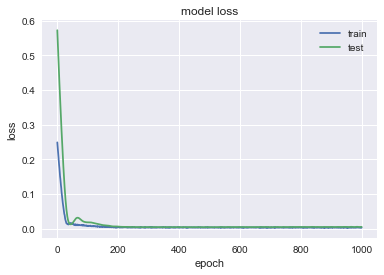

                KO
MSE        4.49291
MAE        1.88061
R2        0.228969
MAPE (%)   3.92722


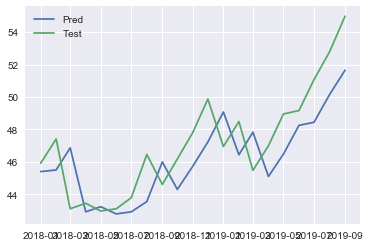

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3016 - val_loss: 0.0411
Epoch 2/1000
0s - loss: 0.2896 - val_loss: 0.0379
Epoch 3/1000
0s - loss: 0.2764 - val_loss: 0.0349
Epoch 4/1000
0s - loss: 0.2640 - val_loss: 0.0320
Epoch 5/1000
0s - loss: 0.2537 - val_loss: 0.0293
Epoch 6/1000
0s - loss: 0.2398 - val_loss: 0.0267
Epoch 7/1000
0s - loss: 0.2300 - val_loss: 0.0242
Epoch 8/1000
0s - loss: 0.2165 - val_loss: 0.0218
Epoch 9/1000
0s - loss: 0.2051 - val_loss: 0.0196
Epoch 10/1000
0s - loss: 0.1929 - val_loss: 0.0175
Epoch 11/1000
0s - loss: 0.1796 - val_loss: 0.0155
Epoch 12/1000
0s - loss: 0.1715 - val_loss: 0.0137
Epoch 13/1000
0s - loss: 0.1593 - val_loss: 0.0121
Epoch 14/1000
0s - loss: 0.1493 - val_loss: 0.0106
Epoch 15/1000
0s - loss: 0.1398 - val_loss: 0.0093
Epoch 16/1000
0s - loss: 0.1300 - val_loss: 0.0082
Epoch 17/1000
0s - loss: 0.1196 - val_loss: 0.0074
Epoch 18/1000
0s - loss: 0.1096 - val_loss: 0.0067
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0097 - val_loss: 0.0058
Epoch 173/1000
0s - loss: 0.0086 - val_loss: 0.0058
Epoch 174/1000
0s - loss: 0.0083 - val_loss: 0.0059
Epoch 175/1000
0s - loss: 0.0083 - val_loss: 0.0058
Epoch 176/1000
0s - loss: 0.0085 - val_loss: 0.0059
Epoch 177/1000
0s - loss: 0.0084 - val_loss: 0.0059
Epoch 178/1000
0s - loss: 0.0084 - val_loss: 0.0058
Epoch 179/1000
0s - loss: 0.0076 - val_loss: 0.0058
Epoch 180/1000
0s - loss: 0.0075 - val_loss: 0.0058
Epoch 181/1000
0s - loss: 0.0081 - val_loss: 0.0058
Epoch 182/1000
0s - loss: 0.0083 - val_loss: 0.0057
Epoch 183/1000
0s - loss: 0.0097 - val_loss: 0.0057
Epoch 184/1000
0s - loss: 0.0100 - val_loss: 0.0056
Epoch 185/1000
0s - loss: 0.0078 - val_loss: 0.0056
Epoch 186/1000
0s - loss: 0.0076 - val_loss: 0.0055
Epoch 187/1000
0s - loss: 0.0076 - val_loss: 0.0054
Epoch 188/1000
0s - loss: 0.0078 - val_loss: 0.0054
Epoch 189/1000
0s - loss: 0.0077 - val_loss: 0.0053
Epoch 190/1000
0s - loss: 0.0101 - val_loss: 0.0053
Epoch 191/1000
0s - loss: 0

0s - loss: 0.0074 - val_loss: 0.0046
Epoch 353/1000
0s - loss: 0.0077 - val_loss: 0.0046
Epoch 354/1000
0s - loss: 0.0083 - val_loss: 0.0046
Epoch 355/1000
0s - loss: 0.0080 - val_loss: 0.0046
Epoch 356/1000
0s - loss: 0.0086 - val_loss: 0.0047
Epoch 357/1000
0s - loss: 0.0083 - val_loss: 0.0047
Epoch 358/1000
0s - loss: 0.0088 - val_loss: 0.0047
Epoch 359/1000
0s - loss: 0.0093 - val_loss: 0.0048
Epoch 360/1000
0s - loss: 0.0084 - val_loss: 0.0048
Epoch 361/1000
0s - loss: 0.0101 - val_loss: 0.0048
Epoch 362/1000
0s - loss: 0.0078 - val_loss: 0.0048
Epoch 363/1000
0s - loss: 0.0094 - val_loss: 0.0048
Epoch 364/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 365/1000
0s - loss: 0.0087 - val_loss: 0.0048
Epoch 366/1000
0s - loss: 0.0088 - val_loss: 0.0048
Epoch 367/1000
0s - loss: 0.0071 - val_loss: 0.0048
Epoch 368/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 369/1000
0s - loss: 0.0083 - val_loss: 0.0048
Epoch 370/1000
0s - loss: 0.0091 - val_loss: 0.0047
Epoch 371/1000
0s - loss: 0

0s - loss: 0.0089 - val_loss: 0.0047
Epoch 521/1000
0s - loss: 0.0087 - val_loss: 0.0048
Epoch 522/1000
0s - loss: 0.0096 - val_loss: 0.0048
Epoch 523/1000
0s - loss: 0.0079 - val_loss: 0.0049
Epoch 524/1000
0s - loss: 0.0075 - val_loss: 0.0049
Epoch 525/1000
0s - loss: 0.0077 - val_loss: 0.0050
Epoch 526/1000
0s - loss: 0.0095 - val_loss: 0.0049
Epoch 527/1000
0s - loss: 0.0087 - val_loss: 0.0049
Epoch 528/1000
0s - loss: 0.0081 - val_loss: 0.0048
Epoch 529/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 530/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 531/1000
0s - loss: 0.0086 - val_loss: 0.0047
Epoch 532/1000
0s - loss: 0.0088 - val_loss: 0.0046
Epoch 533/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 534/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 535/1000
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 536/1000
0s - loss: 0.0086 - val_loss: 0.0046
Epoch 537/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 538/1000
0s - loss: 0.0096 - val_loss: 0.0046
Epoch 539/1000
0s - loss: 0

0s - loss: 0.0081 - val_loss: 0.0047
Epoch 686/1000
0s - loss: 0.0077 - val_loss: 0.0047
Epoch 687/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 688/1000
0s - loss: 0.0096 - val_loss: 0.0046
Epoch 689/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 690/1000
0s - loss: 0.0064 - val_loss: 0.0046
Epoch 691/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 692/1000
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 693/1000
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 694/1000
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 695/1000
0s - loss: 0.0078 - val_loss: 0.0046
Epoch 696/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 697/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 698/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 699/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 700/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 701/1000
0s - loss: 0.0081 - val_loss: 0.0049
Epoch 702/1000
0s - loss: 0.0083 - val_loss: 0.0049
Epoch 703/1000
0s - loss: 0.0067 - val_loss: 0.0049
Epoch 704/1000
0s - loss: 0

0s - loss: 0.0077 - val_loss: 0.0048
Epoch 848/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 849/1000
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 850/1000
0s - loss: 0.0068 - val_loss: 0.0045
Epoch 851/1000
0s - loss: 0.0078 - val_loss: 0.0045
Epoch 852/1000
0s - loss: 0.0078 - val_loss: 0.0045
Epoch 853/1000
0s - loss: 0.0078 - val_loss: 0.0044
Epoch 854/1000
0s - loss: 0.0078 - val_loss: 0.0044
Epoch 855/1000
0s - loss: 0.0067 - val_loss: 0.0045
Epoch 856/1000
0s - loss: 0.0078 - val_loss: 0.0045
Epoch 857/1000
0s - loss: 0.0075 - val_loss: 0.0045
Epoch 858/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 859/1000
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 860/1000
0s - loss: 0.0074 - val_loss: 0.0047
Epoch 861/1000
0s - loss: 0.0080 - val_loss: 0.0047
Epoch 862/1000
0s - loss: 0.0087 - val_loss: 0.0047
Epoch 863/1000
0s - loss: 0.0075 - val_loss: 0.0047
Epoch 864/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 865/1000
0s - loss: 0.0089 - val_loss: 0.0046
Epoch 866/1000
0s - loss: 0

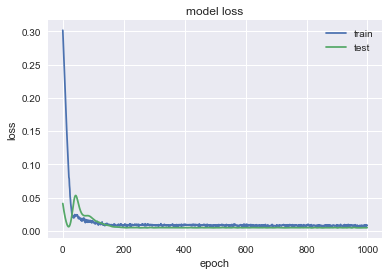

               FTI
MSE         8.7053
MAE        2.27318
R2        0.394867
MAPE (%)   9.05456


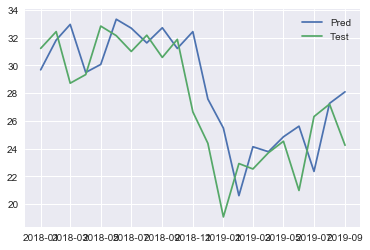

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1379 - val_loss: 0.5553
Epoch 2/1000
0s - loss: 0.1315 - val_loss: 0.5336
Epoch 3/1000
0s - loss: 0.1247 - val_loss: 0.5123
Epoch 4/1000
0s - loss: 0.1189 - val_loss: 0.4911
Epoch 5/1000
0s - loss: 0.1128 - val_loss: 0.4702
Epoch 6/1000
0s - loss: 0.1073 - val_loss: 0.4495
Epoch 7/1000
0s - loss: 0.1016 - val_loss: 0.4290
Epoch 8/1000
0s - loss: 0.0946 - val_loss: 0.4087
Epoch 9/1000
0s - loss: 0.0887 - val_loss: 0.3886
Epoch 10/1000
0s - loss: 0.0838 - val_loss: 0.3686
Epoch 11/1000
0s - loss: 0.0784 - val_loss: 0.3489
Epoch 12/1000
0s - loss: 0.0716 - val_loss: 0.3294
Epoch 13/1000
0s - loss: 0.0681 - val_loss: 0.3102
Epoch 14/1000
0s - loss: 0.0616 - val_loss: 0.2911
Epoch 15/1000
0s - loss: 0.0593 - val_loss: 0.2724
Epoch 16/1000
0s - loss: 0.0532 - val_loss: 0.2541
Epoch 17/1000
0s - loss: 0.0483 - val_loss: 0.2361
Epoch 18/1000
0s - loss: 0.0455 - val_loss: 0.2185
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0025 - val_loss: 0.0099
Epoch 172/1000
0s - loss: 0.0023 - val_loss: 0.0098
Epoch 173/1000
0s - loss: 0.0024 - val_loss: 0.0097
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 0.0096
Epoch 175/1000
0s - loss: 0.0021 - val_loss: 0.0096
Epoch 176/1000
0s - loss: 0.0020 - val_loss: 0.0096
Epoch 177/1000
0s - loss: 0.0039 - val_loss: 0.0096
Epoch 178/1000
0s - loss: 0.0029 - val_loss: 0.0097
Epoch 179/1000
0s - loss: 0.0029 - val_loss: 0.0098
Epoch 180/1000
0s - loss: 0.0027 - val_loss: 0.0099
Epoch 181/1000
0s - loss: 0.0024 - val_loss: 0.0099
Epoch 182/1000
0s - loss: 0.0025 - val_loss: 0.0098
Epoch 183/1000
0s - loss: 0.0025 - val_loss: 0.0098
Epoch 184/1000
0s - loss: 0.0035 - val_loss: 0.0097
Epoch 185/1000
0s - loss: 0.0028 - val_loss: 0.0096
Epoch 186/1000
0s - loss: 0.0024 - val_loss: 0.0096
Epoch 187/1000
0s - loss: 0.0026 - val_loss: 0.0096
Epoch 188/1000
0s - loss: 0.0022 - val_loss: 0.0096
Epoch 189/1000
0s - loss: 0.0030 - val_loss: 0.0096
Epoch 190/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0093
Epoch 330/1000
0s - loss: 0.0022 - val_loss: 0.0094
Epoch 331/1000
0s - loss: 0.0022 - val_loss: 0.0095
Epoch 332/1000
0s - loss: 0.0026 - val_loss: 0.0096
Epoch 333/1000
0s - loss: 0.0016 - val_loss: 0.0097
Epoch 334/1000
0s - loss: 0.0025 - val_loss: 0.0099
Epoch 335/1000
0s - loss: 0.0027 - val_loss: 0.0100
Epoch 336/1000
0s - loss: 0.0021 - val_loss: 0.0099
Epoch 337/1000
0s - loss: 0.0027 - val_loss: 0.0099
Epoch 338/1000
0s - loss: 0.0028 - val_loss: 0.0099
Epoch 339/1000
0s - loss: 0.0024 - val_loss: 0.0098
Epoch 340/1000
0s - loss: 0.0021 - val_loss: 0.0098
Epoch 341/1000
0s - loss: 0.0029 - val_loss: 0.0098
Epoch 342/1000
0s - loss: 0.0028 - val_loss: 0.0097
Epoch 343/1000
0s - loss: 0.0024 - val_loss: 0.0096
Epoch 344/1000
0s - loss: 0.0027 - val_loss: 0.0095
Epoch 345/1000
0s - loss: 0.0031 - val_loss: 0.0095
Epoch 346/1000
0s - loss: 0.0023 - val_loss: 0.0095
Epoch 347/1000
0s - loss: 0.0021 - val_loss: 0.0095
Epoch 348/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0099
Epoch 503/1000
0s - loss: 0.0024 - val_loss: 0.0100
Epoch 504/1000
0s - loss: 0.0021 - val_loss: 0.0100
Epoch 505/1000
0s - loss: 0.0027 - val_loss: 0.0100
Epoch 506/1000
0s - loss: 0.0026 - val_loss: 0.0100
Epoch 507/1000
0s - loss: 0.0028 - val_loss: 0.0099
Epoch 508/1000
0s - loss: 0.0025 - val_loss: 0.0099
Epoch 509/1000
0s - loss: 0.0020 - val_loss: 0.0100
Epoch 510/1000
0s - loss: 0.0020 - val_loss: 0.0100
Epoch 511/1000
0s - loss: 0.0025 - val_loss: 0.0100
Epoch 512/1000
0s - loss: 0.0025 - val_loss: 0.0101
Epoch 513/1000
0s - loss: 0.0023 - val_loss: 0.0101
Epoch 514/1000
0s - loss: 0.0025 - val_loss: 0.0101
Epoch 515/1000
0s - loss: 0.0025 - val_loss: 0.0101
Epoch 516/1000
0s - loss: 0.0025 - val_loss: 0.0101
Epoch 517/1000
0s - loss: 0.0023 - val_loss: 0.0101
Epoch 518/1000
0s - loss: 0.0025 - val_loss: 0.0102
Epoch 519/1000
0s - loss: 0.0024 - val_loss: 0.0103
Epoch 520/1000
0s - loss: 0.0025 - val_loss: 0.0102
Epoch 521/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0092
Epoch 662/1000
0s - loss: 0.0024 - val_loss: 0.0092
Epoch 663/1000
0s - loss: 0.0020 - val_loss: 0.0092
Epoch 664/1000
0s - loss: 0.0022 - val_loss: 0.0092
Epoch 665/1000
0s - loss: 0.0025 - val_loss: 0.0093
Epoch 666/1000
0s - loss: 0.0024 - val_loss: 0.0094
Epoch 667/1000
0s - loss: 0.0025 - val_loss: 0.0094
Epoch 668/1000
0s - loss: 0.0026 - val_loss: 0.0095
Epoch 669/1000
0s - loss: 0.0022 - val_loss: 0.0095
Epoch 670/1000
0s - loss: 0.0023 - val_loss: 0.0094
Epoch 671/1000
0s - loss: 0.0027 - val_loss: 0.0094
Epoch 672/1000
0s - loss: 0.0023 - val_loss: 0.0094
Epoch 673/1000
0s - loss: 0.0023 - val_loss: 0.0094
Epoch 674/1000
0s - loss: 0.0026 - val_loss: 0.0094
Epoch 675/1000
0s - loss: 0.0029 - val_loss: 0.0093
Epoch 676/1000
0s - loss: 0.0023 - val_loss: 0.0094
Epoch 677/1000
0s - loss: 0.0026 - val_loss: 0.0096
Epoch 678/1000
0s - loss: 0.0024 - val_loss: 0.0097
Epoch 679/1000
0s - loss: 0.0019 - val_loss: 0.0098
Epoch 680/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0093
Epoch 820/1000
0s - loss: 0.0024 - val_loss: 0.0094
Epoch 821/1000
0s - loss: 0.0022 - val_loss: 0.0095
Epoch 822/1000
0s - loss: 0.0032 - val_loss: 0.0097
Epoch 823/1000
0s - loss: 0.0022 - val_loss: 0.0098
Epoch 824/1000
0s - loss: 0.0020 - val_loss: 0.0098
Epoch 825/1000
0s - loss: 0.0017 - val_loss: 0.0098
Epoch 826/1000
0s - loss: 0.0022 - val_loss: 0.0098
Epoch 827/1000
0s - loss: 0.0024 - val_loss: 0.0098
Epoch 828/1000
0s - loss: 0.0027 - val_loss: 0.0097
Epoch 829/1000
0s - loss: 0.0029 - val_loss: 0.0096
Epoch 830/1000
0s - loss: 0.0022 - val_loss: 0.0097
Epoch 831/1000
0s - loss: 0.0024 - val_loss: 0.0098
Epoch 832/1000
0s - loss: 0.0022 - val_loss: 0.0100
Epoch 833/1000
0s - loss: 0.0023 - val_loss: 0.0102
Epoch 834/1000
0s - loss: 0.0025 - val_loss: 0.0102
Epoch 835/1000
0s - loss: 0.0024 - val_loss: 0.0102
Epoch 836/1000
0s - loss: 0.0025 - val_loss: 0.0103
Epoch 837/1000
0s - loss: 0.0026 - val_loss: 0.0103
Epoch 838/1000
0s - loss: 0

0s - loss: 0.0020 - val_loss: 0.0098
Epoch 982/1000
0s - loss: 0.0025 - val_loss: 0.0101
Epoch 983/1000
0s - loss: 0.0022 - val_loss: 0.0104
Epoch 984/1000
0s - loss: 0.0025 - val_loss: 0.0106
Epoch 985/1000
0s - loss: 0.0024 - val_loss: 0.0104
Epoch 986/1000
0s - loss: 0.0023 - val_loss: 0.0099
Epoch 987/1000
0s - loss: 0.0024 - val_loss: 0.0095
Epoch 988/1000
0s - loss: 0.0025 - val_loss: 0.0091
Epoch 989/1000
0s - loss: 0.0025 - val_loss: 0.0089
Epoch 990/1000
0s - loss: 0.0023 - val_loss: 0.0089
Epoch 991/1000
0s - loss: 0.0020 - val_loss: 0.0089
Epoch 992/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 993/1000
0s - loss: 0.0024 - val_loss: 0.0091
Epoch 994/1000
0s - loss: 0.0026 - val_loss: 0.0094
Epoch 995/1000
0s - loss: 0.0023 - val_loss: 0.0098
Epoch 996/1000
0s - loss: 0.0021 - val_loss: 0.0102
Epoch 997/1000
0s - loss: 0.0030 - val_loss: 0.0105
Epoch 998/1000
0s - loss: 0.0023 - val_loss: 0.0106
Epoch 999/1000
0s - loss: 0.0023 - val_loss: 0.0106
Epoch 1000/1000
0s - loss: 

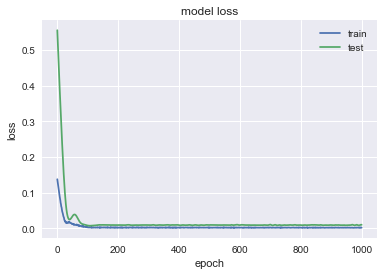

               BLK
MSE        1800.98
MAE        35.7952
R2        0.346211
MAPE (%)    7.8681


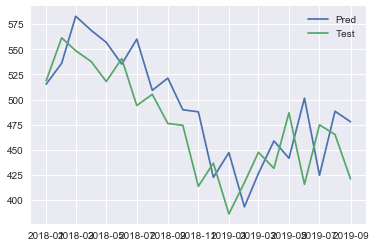

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3705 - val_loss: 0.4106
Epoch 2/1000
0s - loss: 0.3538 - val_loss: 0.3935
Epoch 3/1000
0s - loss: 0.3387 - val_loss: 0.3768
Epoch 4/1000
0s - loss: 0.3263 - val_loss: 0.3605
Epoch 5/1000
0s - loss: 0.3119 - val_loss: 0.3446
Epoch 6/1000
0s - loss: 0.2991 - val_loss: 0.3289
Epoch 7/1000
0s - loss: 0.2878 - val_loss: 0.3136
Epoch 8/1000
0s - loss: 0.2747 - val_loss: 0.2985
Epoch 9/1000
0s - loss: 0.2610 - val_loss: 0.2837
Epoch 10/1000
0s - loss: 0.2464 - val_loss: 0.2692
Epoch 11/1000
0s - loss: 0.2306 - val_loss: 0.2549
Epoch 12/1000
0s - loss: 0.2228 - val_loss: 0.2409
Epoch 13/1000
0s - loss: 0.2116 - val_loss: 0.2272
Epoch 14/1000
0s - loss: 0.1986 - val_loss: 0.2137
Epoch 15/1000
0s - loss: 0.1872 - val_loss: 0.2004
Epoch 16/1000
0s - loss: 0.1748 - val_loss: 0.1874
Epoch 17/1000
0s - loss: 0.1623 - val_loss: 0.1747
Epoch 18/1000
0s - loss: 0.1546 - val_loss: 0.1623
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0049 - val_loss: 0.0138
Epoch 185/1000
0s - loss: 0.0068 - val_loss: 0.0138
Epoch 186/1000
0s - loss: 0.0060 - val_loss: 0.0138
Epoch 187/1000
0s - loss: 0.0050 - val_loss: 0.0139
Epoch 188/1000
0s - loss: 0.0068 - val_loss: 0.0139
Epoch 189/1000
0s - loss: 0.0067 - val_loss: 0.0139
Epoch 190/1000
0s - loss: 0.0061 - val_loss: 0.0139
Epoch 191/1000
0s - loss: 0.0053 - val_loss: 0.0139
Epoch 192/1000
0s - loss: 0.0064 - val_loss: 0.0139
Epoch 193/1000
0s - loss: 0.0054 - val_loss: 0.0140
Epoch 194/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 195/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 196/1000
0s - loss: 0.0067 - val_loss: 0.0140
Epoch 197/1000
0s - loss: 0.0069 - val_loss: 0.0140
Epoch 198/1000
0s - loss: 0.0067 - val_loss: 0.0140
Epoch 199/1000
0s - loss: 0.0067 - val_loss: 0.0140
Epoch 200/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 201/1000
0s - loss: 0.0067 - val_loss: 0.0140
Epoch 202/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 203/1000
0s - loss: 0

0s - loss: 0.0054 - val_loss: 0.0141
Epoch 368/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 369/1000
0s - loss: 0.0057 - val_loss: 0.0141
Epoch 370/1000
0s - loss: 0.0059 - val_loss: 0.0141
Epoch 371/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 372/1000
0s - loss: 0.0046 - val_loss: 0.0141
Epoch 373/1000
0s - loss: 0.0057 - val_loss: 0.0141
Epoch 374/1000
0s - loss: 0.0056 - val_loss: 0.0141
Epoch 375/1000
0s - loss: 0.0058 - val_loss: 0.0141
Epoch 376/1000
0s - loss: 0.0057 - val_loss: 0.0140
Epoch 377/1000
0s - loss: 0.0057 - val_loss: 0.0140
Epoch 378/1000
0s - loss: 0.0046 - val_loss: 0.0140
Epoch 379/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 380/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 381/1000
0s - loss: 0.0047 - val_loss: 0.0140
Epoch 382/1000
0s - loss: 0.0055 - val_loss: 0.0140
Epoch 383/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 384/1000
0s - loss: 0.0063 - val_loss: 0.0140
Epoch 385/1000
0s - loss: 0.0061 - val_loss: 0.0140
Epoch 386/1000
0s - loss: 0

0s - loss: 0.0053 - val_loss: 0.0139
Epoch 546/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 547/1000
0s - loss: 0.0058 - val_loss: 0.0140
Epoch 548/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 549/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 550/1000
0s - loss: 0.0057 - val_loss: 0.0140
Epoch 551/1000
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 552/1000
0s - loss: 0.0059 - val_loss: 0.0141
Epoch 553/1000
0s - loss: 0.0054 - val_loss: 0.0142
Epoch 554/1000
0s - loss: 0.0056 - val_loss: 0.0142
Epoch 555/1000
0s - loss: 0.0048 - val_loss: 0.0142
Epoch 556/1000
0s - loss: 0.0050 - val_loss: 0.0141
Epoch 557/1000
0s - loss: 0.0049 - val_loss: 0.0141
Epoch 558/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 559/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 560/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 561/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 562/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 563/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 564/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0140
Epoch 719/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 720/1000
0s - loss: 0.0054 - val_loss: 0.0140
Epoch 721/1000
0s - loss: 0.0055 - val_loss: 0.0140
Epoch 722/1000
0s - loss: 0.0047 - val_loss: 0.0140
Epoch 723/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 724/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 725/1000
0s - loss: 0.0043 - val_loss: 0.0139
Epoch 726/1000
0s - loss: 0.0059 - val_loss: 0.0139
Epoch 727/1000
0s - loss: 0.0054 - val_loss: 0.0139
Epoch 728/1000
0s - loss: 0.0055 - val_loss: 0.0139
Epoch 729/1000
0s - loss: 0.0058 - val_loss: 0.0139
Epoch 730/1000
0s - loss: 0.0043 - val_loss: 0.0139
Epoch 731/1000
0s - loss: 0.0047 - val_loss: 0.0139
Epoch 732/1000
0s - loss: 0.0048 - val_loss: 0.0139
Epoch 733/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 734/1000
0s - loss: 0.0066 - val_loss: 0.0140
Epoch 735/1000
0s - loss: 0.0056 - val_loss: 0.0140
Epoch 736/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 737/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0138
Epoch 900/1000
0s - loss: 0.0046 - val_loss: 0.0138
Epoch 901/1000
0s - loss: 0.0050 - val_loss: 0.0138
Epoch 902/1000
0s - loss: 0.0045 - val_loss: 0.0139
Epoch 903/1000
0s - loss: 0.0050 - val_loss: 0.0139
Epoch 904/1000
0s - loss: 0.0053 - val_loss: 0.0139
Epoch 905/1000
0s - loss: 0.0045 - val_loss: 0.0139
Epoch 906/1000
0s - loss: 0.0048 - val_loss: 0.0139
Epoch 907/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 908/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 909/1000
0s - loss: 0.0063 - val_loss: 0.0140
Epoch 910/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 911/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 912/1000
0s - loss: 0.0055 - val_loss: 0.0140
Epoch 913/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 914/1000
0s - loss: 0.0055 - val_loss: 0.0140
Epoch 915/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 916/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 917/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 918/1000
0s - loss: 0

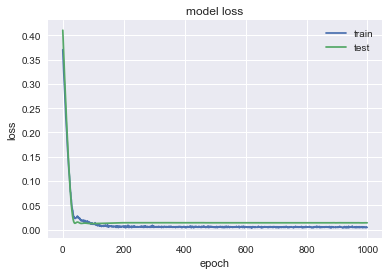

               DVA
MSE         41.798
MAE         4.8338
R2        0.313102
MAPE (%)   8.22644


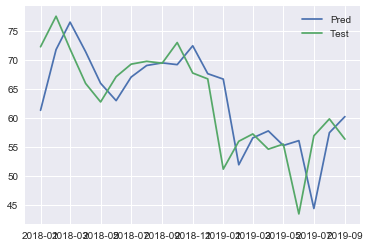

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0374 - val_loss: 0.5458
Epoch 2/1000
0s - loss: 0.0349 - val_loss: 0.5250
Epoch 3/1000
0s - loss: 0.0325 - val_loss: 0.5045
Epoch 4/1000
0s - loss: 0.0300 - val_loss: 0.4843
Epoch 5/1000
0s - loss: 0.0275 - val_loss: 0.4645
Epoch 6/1000
0s - loss: 0.0259 - val_loss: 0.4449
Epoch 7/1000
0s - loss: 0.0240 - val_loss: 0.4257
Epoch 8/1000
0s - loss: 0.0224 - val_loss: 0.4067
Epoch 9/1000
0s - loss: 0.0205 - val_loss: 0.3879
Epoch 10/1000
0s - loss: 0.0183 - val_loss: 0.3694
Epoch 11/1000
0s - loss: 0.0167 - val_loss: 0.3512
Epoch 12/1000
0s - loss: 0.0161 - val_loss: 0.3334
Epoch 13/1000
0s - loss: 0.0144 - val_loss: 0.3158
Epoch 14/1000
0s - loss: 0.0132 - val_loss: 0.2987
Epoch 15/1000
0s - loss: 0.0129 - val_loss: 0.2820
Epoch 16/1000
0s - loss: 0.0114 - val_loss: 0.2658
Epoch 17/1000
0s - loss: 0.0109 - val_loss: 0.2503
Epoch 18/1000
0s - loss: 0.0100 - val_loss: 0.2354
Epoch 19/1000
0s - loss: 0.0

0s - loss: 8.2136e-04 - val_loss: 0.0117
Epoch 158/1000
0s - loss: 6.1973e-04 - val_loss: 0.0115
Epoch 159/1000
0s - loss: 6.5843e-04 - val_loss: 0.0116
Epoch 160/1000
0s - loss: 8.4109e-04 - val_loss: 0.0117
Epoch 161/1000
0s - loss: 6.4710e-04 - val_loss: 0.0117
Epoch 162/1000
0s - loss: 7.7219e-04 - val_loss: 0.0118
Epoch 163/1000
0s - loss: 5.1417e-04 - val_loss: 0.0118
Epoch 164/1000
0s - loss: 7.0892e-04 - val_loss: 0.0119
Epoch 165/1000
0s - loss: 5.3697e-04 - val_loss: 0.0119
Epoch 166/1000
0s - loss: 7.3853e-04 - val_loss: 0.0119
Epoch 167/1000
0s - loss: 6.8593e-04 - val_loss: 0.0118
Epoch 168/1000
0s - loss: 5.5736e-04 - val_loss: 0.0117
Epoch 169/1000
0s - loss: 6.4232e-04 - val_loss: 0.0116
Epoch 170/1000
0s - loss: 5.7339e-04 - val_loss: 0.0115
Epoch 171/1000
0s - loss: 6.3440e-04 - val_loss: 0.0114
Epoch 172/1000
0s - loss: 7.1155e-04 - val_loss: 0.0113
Epoch 173/1000
0s - loss: 4.9638e-04 - val_loss: 0.0114
Epoch 174/1000
0s - loss: 6.0029e-04 - val_loss: 0.0114
Epoch 1

0s - loss: 5.1166e-04 - val_loss: 0.0121
Epoch 306/1000
0s - loss: 8.2472e-04 - val_loss: 0.0120
Epoch 307/1000
0s - loss: 4.7281e-04 - val_loss: 0.0120
Epoch 308/1000
0s - loss: 5.6657e-04 - val_loss: 0.0120
Epoch 309/1000
0s - loss: 6.3911e-04 - val_loss: 0.0120
Epoch 310/1000
0s - loss: 6.1408e-04 - val_loss: 0.0121
Epoch 311/1000
0s - loss: 7.4681e-04 - val_loss: 0.0123
Epoch 312/1000
0s - loss: 5.5077e-04 - val_loss: 0.0124
Epoch 313/1000
0s - loss: 5.1480e-04 - val_loss: 0.0124
Epoch 314/1000
0s - loss: 5.5277e-04 - val_loss: 0.0124
Epoch 315/1000
0s - loss: 5.4484e-04 - val_loss: 0.0124
Epoch 316/1000
0s - loss: 5.4405e-04 - val_loss: 0.0123
Epoch 317/1000
0s - loss: 7.2758e-04 - val_loss: 0.0123
Epoch 318/1000
0s - loss: 6.9984e-04 - val_loss: 0.0121
Epoch 319/1000
0s - loss: 6.8689e-04 - val_loss: 0.0119
Epoch 320/1000
0s - loss: 4.8725e-04 - val_loss: 0.0118
Epoch 321/1000
0s - loss: 5.3925e-04 - val_loss: 0.0117
Epoch 322/1000
0s - loss: 5.0927e-04 - val_loss: 0.0116
Epoch 3

0s - loss: 5.8420e-04 - val_loss: 0.0125
Epoch 456/1000
0s - loss: 5.9583e-04 - val_loss: 0.0123
Epoch 457/1000
0s - loss: 6.5895e-04 - val_loss: 0.0122
Epoch 458/1000
0s - loss: 5.9237e-04 - val_loss: 0.0121
Epoch 459/1000
0s - loss: 4.5011e-04 - val_loss: 0.0121
Epoch 460/1000
0s - loss: 5.6738e-04 - val_loss: 0.0122
Epoch 461/1000
0s - loss: 7.0488e-04 - val_loss: 0.0123
Epoch 462/1000
0s - loss: 5.3341e-04 - val_loss: 0.0123
Epoch 463/1000
0s - loss: 4.9716e-04 - val_loss: 0.0122
Epoch 464/1000
0s - loss: 5.8478e-04 - val_loss: 0.0124
Epoch 465/1000
0s - loss: 4.1619e-04 - val_loss: 0.0125
Epoch 466/1000
0s - loss: 7.0788e-04 - val_loss: 0.0125
Epoch 467/1000
0s - loss: 6.0159e-04 - val_loss: 0.0126
Epoch 468/1000
0s - loss: 6.5352e-04 - val_loss: 0.0126
Epoch 469/1000
0s - loss: 6.1636e-04 - val_loss: 0.0125
Epoch 470/1000
0s - loss: 7.2071e-04 - val_loss: 0.0126
Epoch 471/1000
0s - loss: 5.5129e-04 - val_loss: 0.0126
Epoch 472/1000
0s - loss: 5.9499e-04 - val_loss: 0.0124
Epoch 4

0s - loss: 6.3945e-04 - val_loss: 0.0139
Epoch 606/1000
0s - loss: 5.6197e-04 - val_loss: 0.0139
Epoch 607/1000
0s - loss: 6.0299e-04 - val_loss: 0.0137
Epoch 608/1000
0s - loss: 6.1957e-04 - val_loss: 0.0133
Epoch 609/1000
0s - loss: 4.8351e-04 - val_loss: 0.0128
Epoch 610/1000
0s - loss: 5.5151e-04 - val_loss: 0.0123
Epoch 611/1000
0s - loss: 4.6893e-04 - val_loss: 0.0121
Epoch 612/1000
0s - loss: 8.1165e-04 - val_loss: 0.0124
Epoch 613/1000
0s - loss: 5.6058e-04 - val_loss: 0.0127
Epoch 614/1000
0s - loss: 8.0096e-04 - val_loss: 0.0131
Epoch 615/1000
0s - loss: 6.4401e-04 - val_loss: 0.0137
Epoch 616/1000
0s - loss: 4.7700e-04 - val_loss: 0.0140
Epoch 617/1000
0s - loss: 6.9048e-04 - val_loss: 0.0142
Epoch 618/1000
0s - loss: 4.2639e-04 - val_loss: 0.0141
Epoch 619/1000
0s - loss: 5.7894e-04 - val_loss: 0.0137
Epoch 620/1000
0s - loss: 4.7849e-04 - val_loss: 0.0135
Epoch 621/1000
0s - loss: 4.4543e-04 - val_loss: 0.0130
Epoch 622/1000
0s - loss: 5.6407e-04 - val_loss: 0.0128
Epoch 6

0s - loss: 5.7591e-04 - val_loss: 0.0119
Epoch 766/1000
0s - loss: 6.5512e-04 - val_loss: 0.0120
Epoch 767/1000
0s - loss: 4.1474e-04 - val_loss: 0.0121
Epoch 768/1000
0s - loss: 6.3605e-04 - val_loss: 0.0120
Epoch 769/1000
0s - loss: 5.1546e-04 - val_loss: 0.0121
Epoch 770/1000
0s - loss: 5.1652e-04 - val_loss: 0.0120
Epoch 771/1000
0s - loss: 7.1448e-04 - val_loss: 0.0121
Epoch 772/1000
0s - loss: 5.4506e-04 - val_loss: 0.0123
Epoch 773/1000
0s - loss: 6.1500e-04 - val_loss: 0.0124
Epoch 774/1000
0s - loss: 5.6337e-04 - val_loss: 0.0127
Epoch 775/1000
0s - loss: 5.4709e-04 - val_loss: 0.0131
Epoch 776/1000
0s - loss: 4.8476e-04 - val_loss: 0.0134
Epoch 777/1000
0s - loss: 6.0403e-04 - val_loss: 0.0133
Epoch 778/1000
0s - loss: 6.5867e-04 - val_loss: 0.0131
Epoch 779/1000
0s - loss: 4.4458e-04 - val_loss: 0.0130
Epoch 780/1000
0s - loss: 5.1719e-04 - val_loss: 0.0127
Epoch 781/1000
0s - loss: 5.8981e-04 - val_loss: 0.0123
Epoch 782/1000
0s - loss: 8.5629e-04 - val_loss: 0.0122
Epoch 7

0s - loss: 4.9921e-04 - val_loss: 0.0121
Epoch 937/1000
0s - loss: 5.3442e-04 - val_loss: 0.0119
Epoch 938/1000
0s - loss: 4.6820e-04 - val_loss: 0.0118
Epoch 939/1000
0s - loss: 5.7481e-04 - val_loss: 0.0119
Epoch 940/1000
0s - loss: 5.5543e-04 - val_loss: 0.0121
Epoch 941/1000
0s - loss: 4.5964e-04 - val_loss: 0.0123
Epoch 942/1000
0s - loss: 5.5549e-04 - val_loss: 0.0125
Epoch 943/1000
0s - loss: 5.8362e-04 - val_loss: 0.0127
Epoch 944/1000
0s - loss: 4.5844e-04 - val_loss: 0.0130
Epoch 945/1000
0s - loss: 4.8931e-04 - val_loss: 0.0129
Epoch 946/1000
0s - loss: 5.0545e-04 - val_loss: 0.0129
Epoch 947/1000
0s - loss: 4.2908e-04 - val_loss: 0.0130
Epoch 948/1000
0s - loss: 5.5581e-04 - val_loss: 0.0128
Epoch 949/1000
0s - loss: 5.4377e-04 - val_loss: 0.0128
Epoch 950/1000
0s - loss: 5.2891e-04 - val_loss: 0.0128
Epoch 951/1000
0s - loss: 4.9238e-04 - val_loss: 0.0129
Epoch 952/1000
0s - loss: 5.4972e-04 - val_loss: 0.0131
Epoch 953/1000
0s - loss: 4.3307e-04 - val_loss: 0.0132
Epoch 9

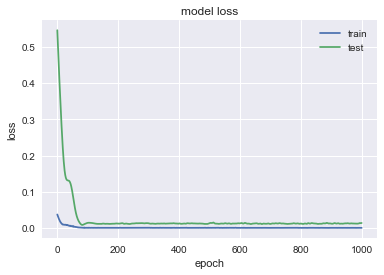

               BA
MSE       2119.56
MAE       36.1251
R2       -0.29923
MAPE (%)  10.2645


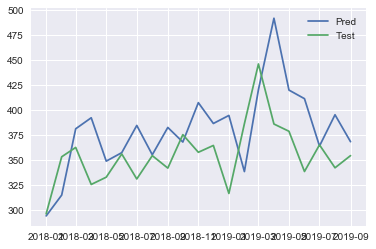

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.4083 - val_loss: 0.1015
Epoch 2/1000
0s - loss: 0.3930 - val_loss: 0.0959
Epoch 3/1000
0s - loss: 0.3763 - val_loss: 0.0906
Epoch 4/1000
0s - loss: 0.3641 - val_loss: 0.0854
Epoch 5/1000
0s - loss: 0.3479 - val_loss: 0.0804
Epoch 6/1000
0s - loss: 0.3329 - val_loss: 0.0756
Epoch 7/1000
0s - loss: 0.3175 - val_loss: 0.0710
Epoch 8/1000
0s - loss: 0.3023 - val_loss: 0.0665
Epoch 9/1000
0s - loss: 0.2926 - val_loss: 0.0622
Epoch 10/1000
0s - loss: 0.2764 - val_loss: 0.0580
Epoch 11/1000
0s - loss: 0.2674 - val_loss: 0.0540
Epoch 12/1000
0s - loss: 0.2508 - val_loss: 0.0501
Epoch 13/1000
0s - loss: 0.2412 - val_loss: 0.0463
Epoch 14/1000
0s - loss: 0.2296 - val_loss: 0.0427
Epoch 15/1000
0s - loss: 0.2159 - val_loss: 0.0393
Epoch 16/1000
0s - loss: 0.2069 - val_loss: 0.0360
Epoch 17/1000
0s - loss: 0.1932 - val_loss: 0.0328
Epoch 18/1000
0s - loss: 0.1792 - val_loss: 0.0298
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0113 - val_loss: 0.0151
Epoch 187/1000
0s - loss: 0.0086 - val_loss: 0.0150
Epoch 188/1000
0s - loss: 0.0087 - val_loss: 0.0150
Epoch 189/1000
0s - loss: 0.0096 - val_loss: 0.0149
Epoch 190/1000
0s - loss: 0.0098 - val_loss: 0.0148
Epoch 191/1000
0s - loss: 0.0091 - val_loss: 0.0147
Epoch 192/1000
0s - loss: 0.0090 - val_loss: 0.0147
Epoch 193/1000
0s - loss: 0.0068 - val_loss: 0.0146
Epoch 194/1000
0s - loss: 0.0096 - val_loss: 0.0146
Epoch 195/1000
0s - loss: 0.0100 - val_loss: 0.0146
Epoch 196/1000
0s - loss: 0.0076 - val_loss: 0.0146
Epoch 197/1000
0s - loss: 0.0073 - val_loss: 0.0145
Epoch 198/1000
0s - loss: 0.0099 - val_loss: 0.0145
Epoch 199/1000
0s - loss: 0.0072 - val_loss: 0.0145
Epoch 200/1000
0s - loss: 0.0070 - val_loss: 0.0145
Epoch 201/1000
0s - loss: 0.0086 - val_loss: 0.0145
Epoch 202/1000
0s - loss: 0.0099 - val_loss: 0.0146
Epoch 203/1000
0s - loss: 0.0094 - val_loss: 0.0146
Epoch 204/1000
0s - loss: 0.0100 - val_loss: 0.0146
Epoch 205/1000
0s - loss: 0

0s - loss: 0.0088 - val_loss: 0.0136
Epoch 367/1000
0s - loss: 0.0076 - val_loss: 0.0135
Epoch 368/1000
0s - loss: 0.0078 - val_loss: 0.0135
Epoch 369/1000
0s - loss: 0.0072 - val_loss: 0.0135
Epoch 370/1000
0s - loss: 0.0087 - val_loss: 0.0135
Epoch 371/1000
0s - loss: 0.0079 - val_loss: 0.0135
Epoch 372/1000
0s - loss: 0.0106 - val_loss: 0.0135
Epoch 373/1000
0s - loss: 0.0062 - val_loss: 0.0135
Epoch 374/1000
0s - loss: 0.0063 - val_loss: 0.0135
Epoch 375/1000
0s - loss: 0.0060 - val_loss: 0.0135
Epoch 376/1000
0s - loss: 0.0094 - val_loss: 0.0136
Epoch 377/1000
0s - loss: 0.0095 - val_loss: 0.0137
Epoch 378/1000
0s - loss: 0.0085 - val_loss: 0.0137
Epoch 379/1000
0s - loss: 0.0074 - val_loss: 0.0137
Epoch 380/1000
0s - loss: 0.0066 - val_loss: 0.0138
Epoch 381/1000
0s - loss: 0.0089 - val_loss: 0.0138
Epoch 382/1000
0s - loss: 0.0085 - val_loss: 0.0138
Epoch 383/1000
0s - loss: 0.0109 - val_loss: 0.0138
Epoch 384/1000
0s - loss: 0.0084 - val_loss: 0.0137
Epoch 385/1000
0s - loss: 0

0s - loss: 0.0090 - val_loss: 0.0140
Epoch 545/1000
0s - loss: 0.0075 - val_loss: 0.0140
Epoch 546/1000
0s - loss: 0.0072 - val_loss: 0.0140
Epoch 547/1000
0s - loss: 0.0070 - val_loss: 0.0140
Epoch 548/1000
0s - loss: 0.0074 - val_loss: 0.0139
Epoch 549/1000
0s - loss: 0.0072 - val_loss: 0.0139
Epoch 550/1000
0s - loss: 0.0077 - val_loss: 0.0138
Epoch 551/1000
0s - loss: 0.0084 - val_loss: 0.0138
Epoch 552/1000
0s - loss: 0.0079 - val_loss: 0.0137
Epoch 553/1000
0s - loss: 0.0078 - val_loss: 0.0137
Epoch 554/1000
0s - loss: 0.0091 - val_loss: 0.0136
Epoch 555/1000
0s - loss: 0.0075 - val_loss: 0.0135
Epoch 556/1000
0s - loss: 0.0078 - val_loss: 0.0135
Epoch 557/1000
0s - loss: 0.0079 - val_loss: 0.0135
Epoch 558/1000
0s - loss: 0.0084 - val_loss: 0.0134
Epoch 559/1000
0s - loss: 0.0064 - val_loss: 0.0134
Epoch 560/1000
0s - loss: 0.0078 - val_loss: 0.0134
Epoch 561/1000
0s - loss: 0.0068 - val_loss: 0.0134
Epoch 562/1000
0s - loss: 0.0082 - val_loss: 0.0135
Epoch 563/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0137
Epoch 707/1000
0s - loss: 0.0066 - val_loss: 0.0137
Epoch 708/1000
0s - loss: 0.0081 - val_loss: 0.0137
Epoch 709/1000
0s - loss: 0.0065 - val_loss: 0.0138
Epoch 710/1000
0s - loss: 0.0062 - val_loss: 0.0139
Epoch 711/1000
0s - loss: 0.0085 - val_loss: 0.0141
Epoch 712/1000
0s - loss: 0.0070 - val_loss: 0.0143
Epoch 713/1000
0s - loss: 0.0069 - val_loss: 0.0144
Epoch 714/1000
0s - loss: 0.0075 - val_loss: 0.0145
Epoch 715/1000
0s - loss: 0.0072 - val_loss: 0.0145
Epoch 716/1000
0s - loss: 0.0069 - val_loss: 0.0145
Epoch 717/1000
0s - loss: 0.0076 - val_loss: 0.0145
Epoch 718/1000
0s - loss: 0.0087 - val_loss: 0.0144
Epoch 719/1000
0s - loss: 0.0082 - val_loss: 0.0144
Epoch 720/1000
0s - loss: 0.0071 - val_loss: 0.0143
Epoch 721/1000
0s - loss: 0.0068 - val_loss: 0.0142
Epoch 722/1000
0s - loss: 0.0080 - val_loss: 0.0140
Epoch 723/1000
0s - loss: 0.0083 - val_loss: 0.0140
Epoch 724/1000
0s - loss: 0.0060 - val_loss: 0.0139
Epoch 725/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0143
Epoch 881/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 882/1000
0s - loss: 0.0062 - val_loss: 0.0143
Epoch 883/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 884/1000
0s - loss: 0.0083 - val_loss: 0.0143
Epoch 885/1000
0s - loss: 0.0084 - val_loss: 0.0143
Epoch 886/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 887/1000
0s - loss: 0.0070 - val_loss: 0.0144
Epoch 888/1000
0s - loss: 0.0063 - val_loss: 0.0144
Epoch 889/1000
0s - loss: 0.0077 - val_loss: 0.0144
Epoch 890/1000
0s - loss: 0.0065 - val_loss: 0.0144
Epoch 891/1000
0s - loss: 0.0074 - val_loss: 0.0144
Epoch 892/1000
0s - loss: 0.0073 - val_loss: 0.0144
Epoch 893/1000
0s - loss: 0.0061 - val_loss: 0.0143
Epoch 894/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 895/1000
0s - loss: 0.0069 - val_loss: 0.0143
Epoch 896/1000
0s - loss: 0.0079 - val_loss: 0.0143
Epoch 897/1000
0s - loss: 0.0068 - val_loss: 0.0143
Epoch 898/1000
0s - loss: 0.0082 - val_loss: 0.0142
Epoch 899/1000
0s - loss: 0

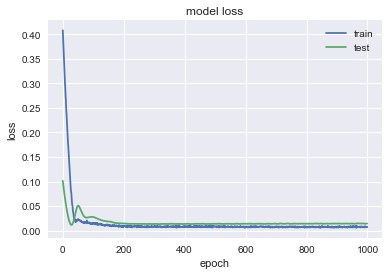

                 IBM
MSE          146.596
MAE          8.71011
R2       -0.00504706
MAPE (%)     6.63299


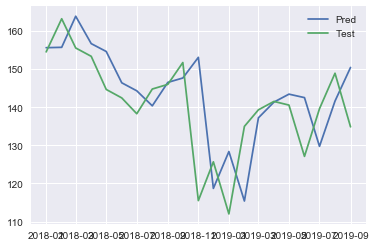

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1251 - val_loss: 0.2700
Epoch 2/1000
0s - loss: 0.1197 - val_loss: 0.2571
Epoch 3/1000
0s - loss: 0.1140 - val_loss: 0.2446
Epoch 4/1000
0s - loss: 0.1058 - val_loss: 0.2324
Epoch 5/1000
0s - loss: 0.1019 - val_loss: 0.2206
Epoch 6/1000
0s - loss: 0.0960 - val_loss: 0.2090
Epoch 7/1000
0s - loss: 0.0919 - val_loss: 0.1976
Epoch 8/1000
0s - loss: 0.0846 - val_loss: 0.1866
Epoch 9/1000
0s - loss: 0.0809 - val_loss: 0.1757
Epoch 10/1000
0s - loss: 0.0767 - val_loss: 0.1651
Epoch 11/1000
0s - loss: 0.0704 - val_loss: 0.1548
Epoch 12/1000
0s - loss: 0.0676 - val_loss: 0.1447
Epoch 13/1000
0s - loss: 0.0624 - val_loss: 0.1348
Epoch 14/1000
0s - loss: 0.0574 - val_loss: 0.1252
Epoch 15/1000
0s - loss: 0.0533 - val_loss: 0.1158
Epoch 16/1000
0s - loss: 0.0488 - val_loss: 0.1067
Epoch 17/1000
0s - loss: 0.0456 - val_loss: 0.0979
Epoch 18/1000
0s - loss: 0.0425 - val_loss: 0.0893
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0040 - val_loss: 0.0081
Epoch 164/1000
0s - loss: 0.0043 - val_loss: 0.0081
Epoch 165/1000
0s - loss: 0.0032 - val_loss: 0.0081
Epoch 166/1000
0s - loss: 0.0034 - val_loss: 0.0082
Epoch 167/1000
0s - loss: 0.0044 - val_loss: 0.0082
Epoch 168/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 169/1000
0s - loss: 0.0040 - val_loss: 0.0083
Epoch 170/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 171/1000
0s - loss: 0.0036 - val_loss: 0.0084
Epoch 172/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 173/1000
0s - loss: 0.0041 - val_loss: 0.0083
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 0.0083
Epoch 175/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 176/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 177/1000
0s - loss: 0.0036 - val_loss: 0.0085
Epoch 178/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 179/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 180/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 181/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 182/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0082
Epoch 332/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 333/1000
0s - loss: 0.0040 - val_loss: 0.0084
Epoch 334/1000
0s - loss: 0.0033 - val_loss: 0.0085
Epoch 335/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 336/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 337/1000
0s - loss: 0.0035 - val_loss: 0.0085
Epoch 338/1000
0s - loss: 0.0036 - val_loss: 0.0085
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 340/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 341/1000
0s - loss: 0.0039 - val_loss: 0.0082
Epoch 342/1000
0s - loss: 0.0029 - val_loss: 0.0081
Epoch 343/1000
0s - loss: 0.0035 - val_loss: 0.0081
Epoch 344/1000
0s - loss: 0.0045 - val_loss: 0.0080
Epoch 345/1000
0s - loss: 0.0038 - val_loss: 0.0080
Epoch 346/1000
0s - loss: 0.0031 - val_loss: 0.0080
Epoch 347/1000
0s - loss: 0.0038 - val_loss: 0.0080
Epoch 348/1000
0s - loss: 0.0039 - val_loss: 0.0080
Epoch 349/1000
0s - loss: 0.0042 - val_loss: 0.0081
Epoch 350/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0086
Epoch 514/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 515/1000
0s - loss: 0.0036 - val_loss: 0.0085
Epoch 516/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 517/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 518/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 519/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 520/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 521/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 522/1000
0s - loss: 0.0031 - val_loss: 0.0082
Epoch 523/1000
0s - loss: 0.0035 - val_loss: 0.0082
Epoch 524/1000
0s - loss: 0.0039 - val_loss: 0.0082
Epoch 525/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 526/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 527/1000
0s - loss: 0.0031 - val_loss: 0.0084
Epoch 528/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 529/1000
0s - loss: 0.0032 - val_loss: 0.0084
Epoch 530/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 531/1000
0s - loss: 0.0032 - val_loss: 0.0082
Epoch 532/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0092
Epoch 697/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 698/1000
0s - loss: 0.0035 - val_loss: 0.0092
Epoch 699/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 700/1000
0s - loss: 0.0036 - val_loss: 0.0091
Epoch 701/1000
0s - loss: 0.0033 - val_loss: 0.0091
Epoch 702/1000
0s - loss: 0.0034 - val_loss: 0.0091
Epoch 703/1000
0s - loss: 0.0033 - val_loss: 0.0090
Epoch 704/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 705/1000
0s - loss: 0.0033 - val_loss: 0.0087
Epoch 706/1000
0s - loss: 0.0033 - val_loss: 0.0085
Epoch 707/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 708/1000
0s - loss: 0.0031 - val_loss: 0.0081
Epoch 709/1000
0s - loss: 0.0036 - val_loss: 0.0078
Epoch 710/1000
0s - loss: 0.0030 - val_loss: 0.0077
Epoch 711/1000
0s - loss: 0.0029 - val_loss: 0.0076
Epoch 712/1000
0s - loss: 0.0027 - val_loss: 0.0077
Epoch 713/1000
0s - loss: 0.0025 - val_loss: 0.0079
Epoch 714/1000
0s - loss: 0.0031 - val_loss: 0.0080
Epoch 715/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0087
Epoch 880/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 881/1000
0s - loss: 0.0032 - val_loss: 0.0084
Epoch 882/1000
0s - loss: 0.0037 - val_loss: 0.0082
Epoch 883/1000
0s - loss: 0.0033 - val_loss: 0.0082
Epoch 884/1000
0s - loss: 0.0036 - val_loss: 0.0082
Epoch 885/1000
0s - loss: 0.0028 - val_loss: 0.0083
Epoch 886/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 887/1000
0s - loss: 0.0026 - val_loss: 0.0087
Epoch 888/1000
0s - loss: 0.0032 - val_loss: 0.0089
Epoch 889/1000
0s - loss: 0.0033 - val_loss: 0.0089
Epoch 890/1000
0s - loss: 0.0029 - val_loss: 0.0090
Epoch 891/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 892/1000
0s - loss: 0.0032 - val_loss: 0.0086
Epoch 893/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 894/1000
0s - loss: 0.0038 - val_loss: 0.0083
Epoch 895/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 896/1000
0s - loss: 0.0033 - val_loss: 0.0080
Epoch 897/1000
0s - loss: 0.0036 - val_loss: 0.0077
Epoch 898/1000
0s - loss: 0

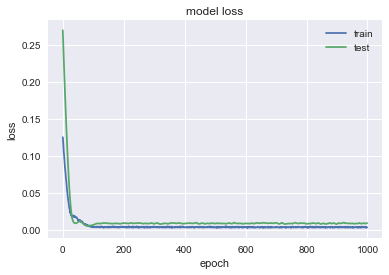

               ALB
MSE        99.2043
MAE        7.67663
R2        0.693312
MAPE (%)   9.09154


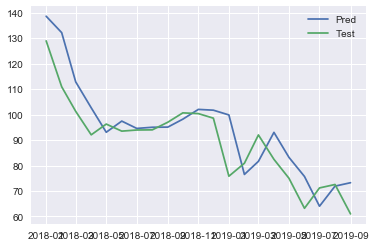

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1324 - val_loss: 0.6218
Epoch 2/1000
0s - loss: 0.1263 - val_loss: 0.5965
Epoch 3/1000
0s - loss: 0.1195 - val_loss: 0.5715
Epoch 4/1000
0s - loss: 0.1122 - val_loss: 0.5468
Epoch 5/1000
0s - loss: 0.1053 - val_loss: 0.5225
Epoch 6/1000
0s - loss: 0.0995 - val_loss: 0.4985
Epoch 7/1000
0s - loss: 0.0940 - val_loss: 0.4748
Epoch 8/1000
0s - loss: 0.0863 - val_loss: 0.4513
Epoch 9/1000
0s - loss: 0.0826 - val_loss: 0.4282
Epoch 10/1000
0s - loss: 0.0754 - val_loss: 0.4054
Epoch 11/1000
0s - loss: 0.0685 - val_loss: 0.3828
Epoch 12/1000
0s - loss: 0.0629 - val_loss: 0.3606
Epoch 13/1000
0s - loss: 0.0586 - val_loss: 0.3388
Epoch 14/1000
0s - loss: 0.0545 - val_loss: 0.3173
Epoch 15/1000
0s - loss: 0.0494 - val_loss: 0.2963
Epoch 16/1000
0s - loss: 0.0439 - val_loss: 0.2757
Epoch 17/1000
0s - loss: 0.0415 - val_loss: 0.2556
Epoch 18/1000
0s - loss: 0.0364 - val_loss: 0.2361
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0069
Epoch 181/1000
0s - loss: 0.0037 - val_loss: 0.0069
Epoch 182/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 183/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 184/1000
0s - loss: 0.0040 - val_loss: 0.0069
Epoch 185/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 186/1000
0s - loss: 0.0040 - val_loss: 0.0069
Epoch 187/1000
0s - loss: 0.0039 - val_loss: 0.0069
Epoch 188/1000
0s - loss: 0.0043 - val_loss: 0.0069
Epoch 189/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 190/1000
0s - loss: 0.0038 - val_loss: 0.0069
Epoch 191/1000
0s - loss: 0.0043 - val_loss: 0.0069
Epoch 192/1000
0s - loss: 0.0051 - val_loss: 0.0069
Epoch 193/1000
0s - loss: 0.0049 - val_loss: 0.0069
Epoch 194/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 195/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 196/1000
0s - loss: 0.0037 - val_loss: 0.0069
Epoch 197/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 198/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 199/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0068
Epoch 360/1000
0s - loss: 0.0046 - val_loss: 0.0068
Epoch 361/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 362/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 363/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 364/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 365/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 366/1000
0s - loss: 0.0044 - val_loss: 0.0069
Epoch 367/1000
0s - loss: 0.0028 - val_loss: 0.0069
Epoch 368/1000
0s - loss: 0.0040 - val_loss: 0.0069
Epoch 369/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 370/1000
0s - loss: 0.0044 - val_loss: 0.0069
Epoch 371/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 372/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 373/1000
0s - loss: 0.0039 - val_loss: 0.0069
Epoch 374/1000
0s - loss: 0.0037 - val_loss: 0.0069
Epoch 375/1000
0s - loss: 0.0047 - val_loss: 0.0069
Epoch 376/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 377/1000
0s - loss: 0.0037 - val_loss: 0.0069
Epoch 378/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0068
Epoch 543/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 544/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 545/1000
0s - loss: 0.0039 - val_loss: 0.0068
Epoch 546/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 547/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 548/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 549/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 550/1000
0s - loss: 0.0039 - val_loss: 0.0068
Epoch 551/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 552/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 553/1000
0s - loss: 0.0048 - val_loss: 0.0068
Epoch 554/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 555/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 556/1000
0s - loss: 0.0041 - val_loss: 0.0067
Epoch 557/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 558/1000
0s - loss: 0.0042 - val_loss: 0.0067
Epoch 559/1000
0s - loss: 0.0043 - val_loss: 0.0068
Epoch 560/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 561/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0068
Epoch 725/1000
0s - loss: 0.0043 - val_loss: 0.0068
Epoch 726/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 727/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 728/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 729/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 730/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 731/1000
0s - loss: 0.0039 - val_loss: 0.0067
Epoch 732/1000
0s - loss: 0.0035 - val_loss: 0.0067
Epoch 733/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 734/1000
0s - loss: 0.0038 - val_loss: 0.0066
Epoch 735/1000
0s - loss: 0.0031 - val_loss: 0.0066
Epoch 736/1000
0s - loss: 0.0039 - val_loss: 0.0066
Epoch 737/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 738/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 739/1000
0s - loss: 0.0038 - val_loss: 0.0069
Epoch 740/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 741/1000
0s - loss: 0.0045 - val_loss: 0.0071
Epoch 742/1000
0s - loss: 0.0032 - val_loss: 0.0071
Epoch 743/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0067
Epoch 908/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 909/1000
0s - loss: 0.0028 - val_loss: 0.0069
Epoch 910/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 911/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 912/1000
0s - loss: 0.0029 - val_loss: 0.0069
Epoch 913/1000
0s - loss: 0.0037 - val_loss: 0.0069
Epoch 914/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 915/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 916/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 917/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 918/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 919/1000
0s - loss: 0.0039 - val_loss: 0.0067
Epoch 920/1000
0s - loss: 0.0028 - val_loss: 0.0067
Epoch 921/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 922/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 923/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 924/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 925/1000
0s - loss: 0.0044 - val_loss: 0.0067
Epoch 926/1000
0s - loss: 0

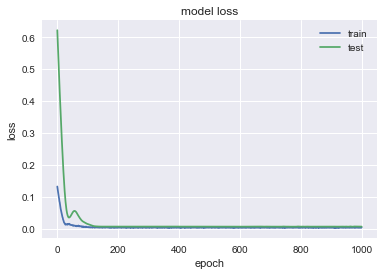

                CBRE
MSE           11.541
MAE          2.77975
R2        0.00795089
MAPE (%)     5.95815


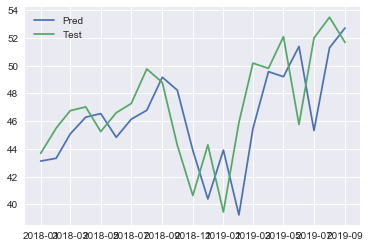

In [131]:
pred_gru_1 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_1[comp] = nn_forec_GRU(df,comp,n_train_time=test.shape[0],first_layer = 64,second_layer=32).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2839 - val_loss: 0.1946
Epoch 2/1000
0s - loss: 0.2697 - val_loss: 0.1880
Epoch 3/1000
0s - loss: 0.2645 - val_loss: 0.1816
Epoch 4/1000
0s - loss: 0.2582 - val_loss: 0.1753
Epoch 5/1000
0s - loss: 0.2448 - val_loss: 0.1691
Epoch 6/1000
0s - loss: 0.2387 - val_loss: 0.1629
Epoch 7/1000
0s - loss: 0.2309 - val_loss: 0.1569
Epoch 8/1000
0s - loss: 0.2246 - val_loss: 0.1509
Epoch 9/1000
0s - loss: 0.2164 - val_loss: 0.1450
Epoch 10/1000
0s - loss: 0.2091 - val_loss: 0.1391
Epoch 11/1000
0s - loss: 0.2001 - val_loss: 0.1334
Epoch 12/1000
0s - loss: 0.2004 - val_loss: 0.1277
Epoch 13/1000
0s - loss: 0.1907 - val_loss: 0.1222
Epoch 14/1000
0s - loss: 0.1860 - val_loss: 0.1167
Epoch 15/1000
0s - loss: 0.1718 - val_loss: 0.1113
Epoch 16/1000
0s - loss: 0.1717 - val_loss: 0.1059
Epoch 17/1000
0s - loss: 0.1617 - val_loss: 0.1007
Epoch 18/1000
0s - loss: 0.1556 - val_loss: 0.0956
Epoch 19/1000
0s - loss: 0.14

0s - loss: 0.0146 - val_loss: 0.0073
Epoch 192/1000
0s - loss: 0.0107 - val_loss: 0.0073
Epoch 193/1000
0s - loss: 0.0110 - val_loss: 0.0073
Epoch 194/1000
0s - loss: 0.0117 - val_loss: 0.0073
Epoch 195/1000
0s - loss: 0.0100 - val_loss: 0.0072
Epoch 196/1000
0s - loss: 0.0116 - val_loss: 0.0072
Epoch 197/1000
0s - loss: 0.0127 - val_loss: 0.0072
Epoch 198/1000
0s - loss: 0.0122 - val_loss: 0.0072
Epoch 199/1000
0s - loss: 0.0130 - val_loss: 0.0072
Epoch 200/1000
0s - loss: 0.0111 - val_loss: 0.0071
Epoch 201/1000
0s - loss: 0.0127 - val_loss: 0.0071
Epoch 202/1000
0s - loss: 0.0134 - val_loss: 0.0071
Epoch 203/1000
0s - loss: 0.0126 - val_loss: 0.0070
Epoch 204/1000
0s - loss: 0.0149 - val_loss: 0.0070
Epoch 205/1000
0s - loss: 0.0133 - val_loss: 0.0070
Epoch 206/1000
0s - loss: 0.0143 - val_loss: 0.0070
Epoch 207/1000
0s - loss: 0.0116 - val_loss: 0.0070
Epoch 208/1000
0s - loss: 0.0126 - val_loss: 0.0070
Epoch 209/1000
0s - loss: 0.0143 - val_loss: 0.0070
Epoch 210/1000
0s - loss: 0

0s - loss: 0.0087 - val_loss: 0.0070
Epoch 352/1000
0s - loss: 0.0090 - val_loss: 0.0070
Epoch 353/1000
0s - loss: 0.0121 - val_loss: 0.0070
Epoch 354/1000
0s - loss: 0.0101 - val_loss: 0.0070
Epoch 355/1000
0s - loss: 0.0105 - val_loss: 0.0070
Epoch 356/1000
0s - loss: 0.0089 - val_loss: 0.0070
Epoch 357/1000
0s - loss: 0.0104 - val_loss: 0.0070
Epoch 358/1000
0s - loss: 0.0093 - val_loss: 0.0070
Epoch 359/1000
0s - loss: 0.0120 - val_loss: 0.0070
Epoch 360/1000
0s - loss: 0.0096 - val_loss: 0.0070
Epoch 361/1000
0s - loss: 0.0089 - val_loss: 0.0070
Epoch 362/1000
0s - loss: 0.0098 - val_loss: 0.0070
Epoch 363/1000
0s - loss: 0.0120 - val_loss: 0.0070
Epoch 364/1000
0s - loss: 0.0095 - val_loss: 0.0070
Epoch 365/1000
0s - loss: 0.0086 - val_loss: 0.0070
Epoch 366/1000
0s - loss: 0.0123 - val_loss: 0.0070
Epoch 367/1000
0s - loss: 0.0107 - val_loss: 0.0071
Epoch 368/1000
0s - loss: 0.0097 - val_loss: 0.0071
Epoch 369/1000
0s - loss: 0.0092 - val_loss: 0.0071
Epoch 370/1000
0s - loss: 0

0s - loss: 0.0108 - val_loss: 0.0072
Epoch 548/1000
0s - loss: 0.0081 - val_loss: 0.0072
Epoch 549/1000
0s - loss: 0.0096 - val_loss: 0.0072
Epoch 550/1000
0s - loss: 0.0114 - val_loss: 0.0073
Epoch 551/1000
0s - loss: 0.0087 - val_loss: 0.0073
Epoch 552/1000
0s - loss: 0.0095 - val_loss: 0.0073
Epoch 553/1000
0s - loss: 0.0106 - val_loss: 0.0073
Epoch 554/1000
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 555/1000
0s - loss: 0.0124 - val_loss: 0.0072
Epoch 556/1000
0s - loss: 0.0130 - val_loss: 0.0072
Epoch 557/1000
0s - loss: 0.0112 - val_loss: 0.0071
Epoch 558/1000
0s - loss: 0.0112 - val_loss: 0.0071
Epoch 559/1000
0s - loss: 0.0097 - val_loss: 0.0071
Epoch 560/1000
0s - loss: 0.0092 - val_loss: 0.0071
Epoch 561/1000
0s - loss: 0.0108 - val_loss: 0.0070
Epoch 562/1000
0s - loss: 0.0093 - val_loss: 0.0070
Epoch 563/1000
0s - loss: 0.0096 - val_loss: 0.0070
Epoch 564/1000
0s - loss: 0.0102 - val_loss: 0.0070
Epoch 565/1000
0s - loss: 0.0098 - val_loss: 0.0070
Epoch 566/1000
0s - loss: 0

0s - loss: 0.0093 - val_loss: 0.0070
Epoch 710/1000
0s - loss: 0.0097 - val_loss: 0.0070
Epoch 711/1000
0s - loss: 0.0095 - val_loss: 0.0071
Epoch 712/1000
0s - loss: 0.0105 - val_loss: 0.0071
Epoch 713/1000
0s - loss: 0.0081 - val_loss: 0.0071
Epoch 714/1000
0s - loss: 0.0114 - val_loss: 0.0071
Epoch 715/1000
0s - loss: 0.0107 - val_loss: 0.0071
Epoch 716/1000
0s - loss: 0.0087 - val_loss: 0.0071
Epoch 717/1000
0s - loss: 0.0091 - val_loss: 0.0071
Epoch 718/1000
0s - loss: 0.0098 - val_loss: 0.0071
Epoch 719/1000
0s - loss: 0.0082 - val_loss: 0.0071
Epoch 720/1000
0s - loss: 0.0090 - val_loss: 0.0071
Epoch 721/1000
0s - loss: 0.0108 - val_loss: 0.0071
Epoch 722/1000
0s - loss: 0.0091 - val_loss: 0.0071
Epoch 723/1000
0s - loss: 0.0106 - val_loss: 0.0070
Epoch 724/1000
0s - loss: 0.0117 - val_loss: 0.0070
Epoch 725/1000
0s - loss: 0.0130 - val_loss: 0.0070
Epoch 726/1000
0s - loss: 0.0091 - val_loss: 0.0071
Epoch 727/1000
0s - loss: 0.0086 - val_loss: 0.0071
Epoch 728/1000
0s - loss: 0

0s - loss: 0.0081 - val_loss: 0.0071
Epoch 872/1000
0s - loss: 0.0087 - val_loss: 0.0071
Epoch 873/1000
0s - loss: 0.0083 - val_loss: 0.0072
Epoch 874/1000
0s - loss: 0.0090 - val_loss: 0.0072
Epoch 875/1000
0s - loss: 0.0098 - val_loss: 0.0072
Epoch 876/1000
0s - loss: 0.0086 - val_loss: 0.0073
Epoch 877/1000
0s - loss: 0.0088 - val_loss: 0.0073
Epoch 878/1000
0s - loss: 0.0112 - val_loss: 0.0074
Epoch 879/1000
0s - loss: 0.0088 - val_loss: 0.0074
Epoch 880/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 881/1000
0s - loss: 0.0094 - val_loss: 0.0074
Epoch 882/1000
0s - loss: 0.0091 - val_loss: 0.0073
Epoch 883/1000
0s - loss: 0.0085 - val_loss: 0.0073
Epoch 884/1000
0s - loss: 0.0096 - val_loss: 0.0073
Epoch 885/1000
0s - loss: 0.0088 - val_loss: 0.0072
Epoch 886/1000
0s - loss: 0.0106 - val_loss: 0.0072
Epoch 887/1000
0s - loss: 0.0094 - val_loss: 0.0072
Epoch 888/1000
0s - loss: 0.0117 - val_loss: 0.0071
Epoch 889/1000
0s - loss: 0.0122 - val_loss: 0.0071
Epoch 890/1000
0s - loss: 0

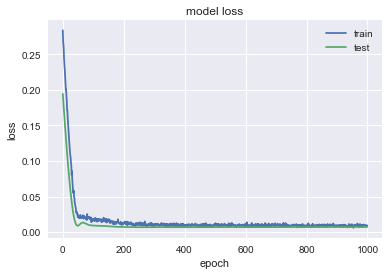

                 T
MSE        2.58571
MAE        1.21775
R2        0.570926
MAPE (%)   3.71234


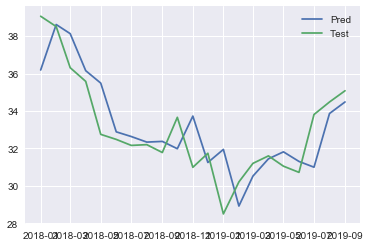

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1211 - val_loss: 0.7072
Epoch 2/1000
0s - loss: 0.1186 - val_loss: 0.6926
Epoch 3/1000
0s - loss: 0.1141 - val_loss: 0.6781
Epoch 4/1000
0s - loss: 0.1116 - val_loss: 0.6639
Epoch 5/1000
0s - loss: 0.1071 - val_loss: 0.6497
Epoch 6/1000
0s - loss: 0.1032 - val_loss: 0.6358
Epoch 7/1000
0s - loss: 0.0994 - val_loss: 0.6219
Epoch 8/1000
0s - loss: 0.0954 - val_loss: 0.6081
Epoch 9/1000
0s - loss: 0.0939 - val_loss: 0.5944
Epoch 10/1000
0s - loss: 0.0897 - val_loss: 0.5808
Epoch 11/1000
0s - loss: 0.0868 - val_loss: 0.5673
Epoch 12/1000
0s - loss: 0.0832 - val_loss: 0.5539
Epoch 13/1000
0s - loss: 0.0793 - val_loss: 0.5406
Epoch 14/1000
0s - loss: 0.0766 - val_loss: 0.5274
Epoch 15/1000
0s - loss: 0.0742 - val_loss: 0.5143
Epoch 16/1000
0s - loss: 0.0720 - val_loss: 0.5013
Epoch 17/1000
0s - loss: 0.0679 - val_loss: 0.4883
Epoch 18/1000
0s - loss: 0.0653 - val_loss: 0.4754
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0073 - val_loss: 0.0282
Epoch 181/1000
0s - loss: 0.0068 - val_loss: 0.0276
Epoch 182/1000
0s - loss: 0.0059 - val_loss: 0.0270
Epoch 183/1000
0s - loss: 0.0052 - val_loss: 0.0264
Epoch 184/1000
0s - loss: 0.0047 - val_loss: 0.0258
Epoch 185/1000
0s - loss: 0.0065 - val_loss: 0.0252
Epoch 186/1000
0s - loss: 0.0065 - val_loss: 0.0246
Epoch 187/1000
0s - loss: 0.0055 - val_loss: 0.0239
Epoch 188/1000
0s - loss: 0.0050 - val_loss: 0.0233
Epoch 189/1000
0s - loss: 0.0059 - val_loss: 0.0228
Epoch 190/1000
0s - loss: 0.0056 - val_loss: 0.0222
Epoch 191/1000
0s - loss: 0.0050 - val_loss: 0.0218
Epoch 192/1000
0s - loss: 0.0054 - val_loss: 0.0213
Epoch 193/1000
0s - loss: 0.0062 - val_loss: 0.0208
Epoch 194/1000
0s - loss: 0.0052 - val_loss: 0.0203
Epoch 195/1000
0s - loss: 0.0051 - val_loss: 0.0198
Epoch 196/1000
0s - loss: 0.0043 - val_loss: 0.0195
Epoch 197/1000
0s - loss: 0.0054 - val_loss: 0.0192
Epoch 198/1000
0s - loss: 0.0050 - val_loss: 0.0190
Epoch 199/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0129
Epoch 364/1000
0s - loss: 0.0043 - val_loss: 0.0129
Epoch 365/1000
0s - loss: 0.0050 - val_loss: 0.0129
Epoch 366/1000
0s - loss: 0.0034 - val_loss: 0.0129
Epoch 367/1000
0s - loss: 0.0040 - val_loss: 0.0129
Epoch 368/1000
0s - loss: 0.0044 - val_loss: 0.0129
Epoch 369/1000
0s - loss: 0.0045 - val_loss: 0.0129
Epoch 370/1000
0s - loss: 0.0041 - val_loss: 0.0129
Epoch 371/1000
0s - loss: 0.0046 - val_loss: 0.0129
Epoch 372/1000
0s - loss: 0.0042 - val_loss: 0.0129
Epoch 373/1000
0s - loss: 0.0038 - val_loss: 0.0129
Epoch 374/1000
0s - loss: 0.0039 - val_loss: 0.0129
Epoch 375/1000
0s - loss: 0.0038 - val_loss: 0.0129
Epoch 376/1000
0s - loss: 0.0039 - val_loss: 0.0129
Epoch 377/1000
0s - loss: 0.0041 - val_loss: 0.0129
Epoch 378/1000
0s - loss: 0.0038 - val_loss: 0.0129
Epoch 379/1000
0s - loss: 0.0041 - val_loss: 0.0129
Epoch 380/1000
0s - loss: 0.0041 - val_loss: 0.0129
Epoch 381/1000
0s - loss: 0.0050 - val_loss: 0.0129
Epoch 382/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0128
Epoch 550/1000
0s - loss: 0.0038 - val_loss: 0.0128
Epoch 551/1000
0s - loss: 0.0035 - val_loss: 0.0128
Epoch 552/1000
0s - loss: 0.0034 - val_loss: 0.0129
Epoch 553/1000
0s - loss: 0.0033 - val_loss: 0.0129
Epoch 554/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 555/1000
0s - loss: 0.0041 - val_loss: 0.0129
Epoch 556/1000
0s - loss: 0.0039 - val_loss: 0.0128
Epoch 557/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 558/1000
0s - loss: 0.0049 - val_loss: 0.0128
Epoch 559/1000
0s - loss: 0.0036 - val_loss: 0.0128
Epoch 560/1000
0s - loss: 0.0042 - val_loss: 0.0128
Epoch 561/1000
0s - loss: 0.0035 - val_loss: 0.0128
Epoch 562/1000
0s - loss: 0.0040 - val_loss: 0.0128
Epoch 563/1000
0s - loss: 0.0036 - val_loss: 0.0128
Epoch 564/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 565/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 566/1000
0s - loss: 0.0038 - val_loss: 0.0127
Epoch 567/1000
0s - loss: 0.0037 - val_loss: 0.0127
Epoch 568/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0127
Epoch 723/1000
0s - loss: 0.0044 - val_loss: 0.0127
Epoch 724/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 725/1000
0s - loss: 0.0038 - val_loss: 0.0127
Epoch 726/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 727/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 728/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 729/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 730/1000
0s - loss: 0.0038 - val_loss: 0.0127
Epoch 731/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 732/1000
0s - loss: 0.0040 - val_loss: 0.0127
Epoch 733/1000
0s - loss: 0.0041 - val_loss: 0.0127
Epoch 734/1000
0s - loss: 0.0040 - val_loss: 0.0127
Epoch 735/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 736/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 737/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 738/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 739/1000
0s - loss: 0.0038 - val_loss: 0.0127
Epoch 740/1000
0s - loss: 0.0041 - val_loss: 0.0127
Epoch 741/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0125
Epoch 916/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 917/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 918/1000
0s - loss: 0.0036 - val_loss: 0.0125
Epoch 919/1000
0s - loss: 0.0037 - val_loss: 0.0125
Epoch 920/1000
0s - loss: 0.0039 - val_loss: 0.0125
Epoch 921/1000
0s - loss: 0.0036 - val_loss: 0.0126
Epoch 922/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 923/1000
0s - loss: 0.0038 - val_loss: 0.0126
Epoch 924/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 925/1000
0s - loss: 0.0037 - val_loss: 0.0126
Epoch 926/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 927/1000
0s - loss: 0.0038 - val_loss: 0.0126
Epoch 928/1000
0s - loss: 0.0036 - val_loss: 0.0126
Epoch 929/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 930/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 931/1000
0s - loss: 0.0035 - val_loss: 0.0125
Epoch 932/1000
0s - loss: 0.0040 - val_loss: 0.0125
Epoch 933/1000
0s - loss: 0.0039 - val_loss: 0.0125
Epoch 934/1000
0s - loss: 0

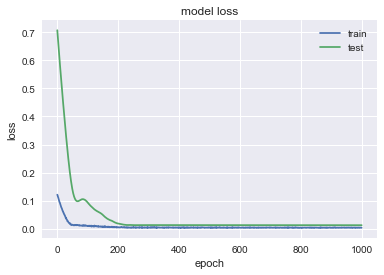

               BBY
MSE         56.721
MAE        6.53341
R2       -0.205686
MAPE (%)   9.77255


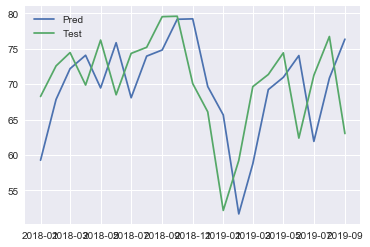

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2211 - val_loss: 0.5107
Epoch 2/1000
0s - loss: 0.2140 - val_loss: 0.4962
Epoch 3/1000
0s - loss: 0.2048 - val_loss: 0.4819
Epoch 4/1000
0s - loss: 0.1978 - val_loss: 0.4677
Epoch 5/1000
0s - loss: 0.1917 - val_loss: 0.4537
Epoch 6/1000
0s - loss: 0.1837 - val_loss: 0.4398
Epoch 7/1000
0s - loss: 0.1754 - val_loss: 0.4260
Epoch 8/1000
0s - loss: 0.1697 - val_loss: 0.4124
Epoch 9/1000
0s - loss: 0.1616 - val_loss: 0.3989
Epoch 10/1000
0s - loss: 0.1566 - val_loss: 0.3856
Epoch 11/1000
0s - loss: 0.1506 - val_loss: 0.3723
Epoch 12/1000
0s - loss: 0.1449 - val_loss: 0.3592
Epoch 13/1000
0s - loss: 0.1385 - val_loss: 0.3463
Epoch 14/1000
0s - loss: 0.1326 - val_loss: 0.3334
Epoch 15/1000
0s - loss: 0.1248 - val_loss: 0.3207
Epoch 16/1000
0s - loss: 0.1198 - val_loss: 0.3082
Epoch 17/1000
0s - loss: 0.1135 - val_loss: 0.2957
Epoch 18/1000
0s - loss: 0.1082 - val_loss: 0.2835
Epoch 19/1000
0s - loss: 0.1

0s - loss: 0.0071 - val_loss: 0.0127
Epoch 192/1000
0s - loss: 0.0066 - val_loss: 0.0126
Epoch 193/1000
0s - loss: 0.0077 - val_loss: 0.0125
Epoch 194/1000
0s - loss: 0.0085 - val_loss: 0.0124
Epoch 195/1000
0s - loss: 0.0082 - val_loss: 0.0123
Epoch 196/1000
0s - loss: 0.0072 - val_loss: 0.0122
Epoch 197/1000
0s - loss: 0.0069 - val_loss: 0.0121
Epoch 198/1000
0s - loss: 0.0076 - val_loss: 0.0120
Epoch 199/1000
0s - loss: 0.0074 - val_loss: 0.0118
Epoch 200/1000
0s - loss: 0.0079 - val_loss: 0.0117
Epoch 201/1000
0s - loss: 0.0068 - val_loss: 0.0116
Epoch 202/1000
0s - loss: 0.0066 - val_loss: 0.0114
Epoch 203/1000
0s - loss: 0.0062 - val_loss: 0.0113
Epoch 204/1000
0s - loss: 0.0068 - val_loss: 0.0113
Epoch 205/1000
0s - loss: 0.0079 - val_loss: 0.0112
Epoch 206/1000
0s - loss: 0.0068 - val_loss: 0.0111
Epoch 207/1000
0s - loss: 0.0064 - val_loss: 0.0109
Epoch 208/1000
0s - loss: 0.0065 - val_loss: 0.0108
Epoch 209/1000
0s - loss: 0.0062 - val_loss: 0.0107
Epoch 210/1000
0s - loss: 0

0s - loss: 0.0054 - val_loss: 0.0046
Epoch 352/1000
0s - loss: 0.0043 - val_loss: 0.0046
Epoch 353/1000
0s - loss: 0.0065 - val_loss: 0.0046
Epoch 354/1000
0s - loss: 0.0051 - val_loss: 0.0046
Epoch 355/1000
0s - loss: 0.0063 - val_loss: 0.0046
Epoch 356/1000
0s - loss: 0.0034 - val_loss: 0.0046
Epoch 357/1000
0s - loss: 0.0045 - val_loss: 0.0046
Epoch 358/1000
0s - loss: 0.0059 - val_loss: 0.0046
Epoch 359/1000
0s - loss: 0.0053 - val_loss: 0.0047
Epoch 360/1000
0s - loss: 0.0055 - val_loss: 0.0047
Epoch 361/1000
0s - loss: 0.0043 - val_loss: 0.0047
Epoch 362/1000
0s - loss: 0.0043 - val_loss: 0.0047
Epoch 363/1000
0s - loss: 0.0052 - val_loss: 0.0047
Epoch 364/1000
0s - loss: 0.0060 - val_loss: 0.0047
Epoch 365/1000
0s - loss: 0.0054 - val_loss: 0.0047
Epoch 366/1000
0s - loss: 0.0049 - val_loss: 0.0046
Epoch 367/1000
0s - loss: 0.0047 - val_loss: 0.0046
Epoch 368/1000
0s - loss: 0.0051 - val_loss: 0.0046
Epoch 369/1000
0s - loss: 0.0047 - val_loss: 0.0046
Epoch 370/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0042
Epoch 517/1000
0s - loss: 0.0045 - val_loss: 0.0043
Epoch 518/1000
0s - loss: 0.0045 - val_loss: 0.0043
Epoch 519/1000
0s - loss: 0.0052 - val_loss: 0.0043
Epoch 520/1000
0s - loss: 0.0043 - val_loss: 0.0044
Epoch 521/1000
0s - loss: 0.0036 - val_loss: 0.0044
Epoch 522/1000
0s - loss: 0.0037 - val_loss: 0.0045
Epoch 523/1000
0s - loss: 0.0046 - val_loss: 0.0045
Epoch 524/1000
0s - loss: 0.0043 - val_loss: 0.0045
Epoch 525/1000
0s - loss: 0.0041 - val_loss: 0.0046
Epoch 526/1000
0s - loss: 0.0044 - val_loss: 0.0045
Epoch 527/1000
0s - loss: 0.0043 - val_loss: 0.0045
Epoch 528/1000
0s - loss: 0.0037 - val_loss: 0.0045
Epoch 529/1000
0s - loss: 0.0049 - val_loss: 0.0044
Epoch 530/1000
0s - loss: 0.0041 - val_loss: 0.0044
Epoch 531/1000
0s - loss: 0.0044 - val_loss: 0.0044
Epoch 532/1000
0s - loss: 0.0042 - val_loss: 0.0043
Epoch 533/1000
0s - loss: 0.0039 - val_loss: 0.0043
Epoch 534/1000
0s - loss: 0.0045 - val_loss: 0.0043
Epoch 535/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0048
Epoch 696/1000
0s - loss: 0.0042 - val_loss: 0.0048
Epoch 697/1000
0s - loss: 0.0038 - val_loss: 0.0048
Epoch 698/1000
0s - loss: 0.0039 - val_loss: 0.0048
Epoch 699/1000
0s - loss: 0.0052 - val_loss: 0.0048
Epoch 700/1000
0s - loss: 0.0035 - val_loss: 0.0047
Epoch 701/1000
0s - loss: 0.0049 - val_loss: 0.0047
Epoch 702/1000
0s - loss: 0.0031 - val_loss: 0.0047
Epoch 703/1000
0s - loss: 0.0041 - val_loss: 0.0047
Epoch 704/1000
0s - loss: 0.0040 - val_loss: 0.0047
Epoch 705/1000
0s - loss: 0.0034 - val_loss: 0.0047
Epoch 706/1000
0s - loss: 0.0043 - val_loss: 0.0047
Epoch 707/1000
0s - loss: 0.0038 - val_loss: 0.0047
Epoch 708/1000
0s - loss: 0.0045 - val_loss: 0.0047
Epoch 709/1000
0s - loss: 0.0044 - val_loss: 0.0046
Epoch 710/1000
0s - loss: 0.0043 - val_loss: 0.0046
Epoch 711/1000
0s - loss: 0.0030 - val_loss: 0.0046
Epoch 712/1000
0s - loss: 0.0045 - val_loss: 0.0045
Epoch 713/1000
0s - loss: 0.0051 - val_loss: 0.0045
Epoch 714/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0046
Epoch 854/1000
0s - loss: 0.0035 - val_loss: 0.0046
Epoch 855/1000
0s - loss: 0.0039 - val_loss: 0.0046
Epoch 856/1000
0s - loss: 0.0043 - val_loss: 0.0046
Epoch 857/1000
0s - loss: 0.0043 - val_loss: 0.0047
Epoch 858/1000
0s - loss: 0.0039 - val_loss: 0.0047
Epoch 859/1000
0s - loss: 0.0040 - val_loss: 0.0048
Epoch 860/1000
0s - loss: 0.0040 - val_loss: 0.0049
Epoch 861/1000
0s - loss: 0.0031 - val_loss: 0.0051
Epoch 862/1000
0s - loss: 0.0043 - val_loss: 0.0051
Epoch 863/1000
0s - loss: 0.0041 - val_loss: 0.0051
Epoch 864/1000
0s - loss: 0.0042 - val_loss: 0.0050
Epoch 865/1000
0s - loss: 0.0035 - val_loss: 0.0049
Epoch 866/1000
0s - loss: 0.0042 - val_loss: 0.0048
Epoch 867/1000
0s - loss: 0.0032 - val_loss: 0.0048
Epoch 868/1000
0s - loss: 0.0028 - val_loss: 0.0047
Epoch 869/1000
0s - loss: 0.0034 - val_loss: 0.0046
Epoch 870/1000
0s - loss: 0.0040 - val_loss: 0.0046
Epoch 871/1000
0s - loss: 0.0028 - val_loss: 0.0046
Epoch 872/1000
0s - loss: 0

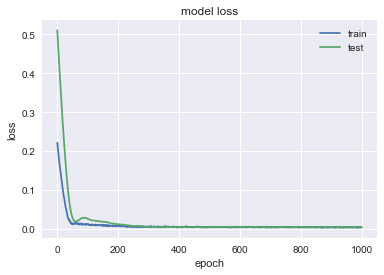

                KO
MSE        4.32539
MAE        1.84435
R2        0.305774
MAPE (%)   3.86215


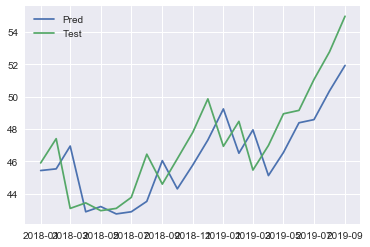

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2758 - val_loss: 0.0385
Epoch 2/1000
0s - loss: 0.2679 - val_loss: 0.0361
Epoch 3/1000
0s - loss: 0.2576 - val_loss: 0.0338
Epoch 4/1000
0s - loss: 0.2476 - val_loss: 0.0316
Epoch 5/1000
0s - loss: 0.2391 - val_loss: 0.0295
Epoch 6/1000
0s - loss: 0.2343 - val_loss: 0.0274
Epoch 7/1000
0s - loss: 0.2194 - val_loss: 0.0254
Epoch 8/1000
0s - loss: 0.2127 - val_loss: 0.0235
Epoch 9/1000
0s - loss: 0.2081 - val_loss: 0.0217
Epoch 10/1000
0s - loss: 0.1979 - val_loss: 0.0200
Epoch 11/1000
0s - loss: 0.1856 - val_loss: 0.0184
Epoch 12/1000
0s - loss: 0.1794 - val_loss: 0.0168
Epoch 13/1000
0s - loss: 0.1695 - val_loss: 0.0154
Epoch 14/1000
0s - loss: 0.1612 - val_loss: 0.0140
Epoch 15/1000
0s - loss: 0.1552 - val_loss: 0.0128
Epoch 16/1000
0s - loss: 0.1470 - val_loss: 0.0116
Epoch 17/1000
0s - loss: 0.1387 - val_loss: 0.0105
Epoch 18/1000
0s - loss: 0.1338 - val_loss: 0.0096
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0147 - val_loss: 0.0129
Epoch 162/1000
0s - loss: 0.0139 - val_loss: 0.0128
Epoch 163/1000
0s - loss: 0.0125 - val_loss: 0.0127
Epoch 164/1000
0s - loss: 0.0129 - val_loss: 0.0125
Epoch 165/1000
0s - loss: 0.0131 - val_loss: 0.0124
Epoch 166/1000
0s - loss: 0.0128 - val_loss: 0.0123
Epoch 167/1000
0s - loss: 0.0125 - val_loss: 0.0122
Epoch 168/1000
0s - loss: 0.0164 - val_loss: 0.0121
Epoch 169/1000
0s - loss: 0.0119 - val_loss: 0.0121
Epoch 170/1000
0s - loss: 0.0120 - val_loss: 0.0120
Epoch 171/1000
0s - loss: 0.0103 - val_loss: 0.0119
Epoch 172/1000
0s - loss: 0.0123 - val_loss: 0.0118
Epoch 173/1000
0s - loss: 0.0112 - val_loss: 0.0117
Epoch 174/1000
0s - loss: 0.0128 - val_loss: 0.0116
Epoch 175/1000
0s - loss: 0.0131 - val_loss: 0.0115
Epoch 176/1000
0s - loss: 0.0121 - val_loss: 0.0114
Epoch 177/1000
0s - loss: 0.0094 - val_loss: 0.0113
Epoch 178/1000
0s - loss: 0.0112 - val_loss: 0.0112
Epoch 179/1000
0s - loss: 0.0113 - val_loss: 0.0111
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0096 - val_loss: 0.0051
Epoch 331/1000
0s - loss: 0.0094 - val_loss: 0.0051
Epoch 332/1000
0s - loss: 0.0099 - val_loss: 0.0052
Epoch 333/1000
0s - loss: 0.0118 - val_loss: 0.0052
Epoch 334/1000
0s - loss: 0.0106 - val_loss: 0.0052
Epoch 335/1000
0s - loss: 0.0103 - val_loss: 0.0052
Epoch 336/1000
0s - loss: 0.0120 - val_loss: 0.0051
Epoch 337/1000
0s - loss: 0.0135 - val_loss: 0.0051
Epoch 338/1000
0s - loss: 0.0126 - val_loss: 0.0051
Epoch 339/1000
0s - loss: 0.0130 - val_loss: 0.0051
Epoch 340/1000
0s - loss: 0.0110 - val_loss: 0.0051
Epoch 341/1000
0s - loss: 0.0075 - val_loss: 0.0050
Epoch 342/1000
0s - loss: 0.0096 - val_loss: 0.0050
Epoch 343/1000
0s - loss: 0.0099 - val_loss: 0.0050
Epoch 344/1000
0s - loss: 0.0090 - val_loss: 0.0050
Epoch 345/1000
0s - loss: 0.0119 - val_loss: 0.0049
Epoch 346/1000
0s - loss: 0.0115 - val_loss: 0.0049
Epoch 347/1000
0s - loss: 0.0105 - val_loss: 0.0050
Epoch 348/1000
0s - loss: 0.0097 - val_loss: 0.0050
Epoch 349/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0048
Epoch 492/1000
0s - loss: 0.0101 - val_loss: 0.0048
Epoch 493/1000
0s - loss: 0.0093 - val_loss: 0.0048
Epoch 494/1000
0s - loss: 0.0088 - val_loss: 0.0049
Epoch 495/1000
0s - loss: 0.0101 - val_loss: 0.0049
Epoch 496/1000
0s - loss: 0.0084 - val_loss: 0.0049
Epoch 497/1000
0s - loss: 0.0100 - val_loss: 0.0049
Epoch 498/1000
0s - loss: 0.0096 - val_loss: 0.0049
Epoch 499/1000
0s - loss: 0.0110 - val_loss: 0.0049
Epoch 500/1000
0s - loss: 0.0113 - val_loss: 0.0049
Epoch 501/1000
0s - loss: 0.0101 - val_loss: 0.0049
Epoch 502/1000
0s - loss: 0.0111 - val_loss: 0.0049
Epoch 503/1000
0s - loss: 0.0087 - val_loss: 0.0049
Epoch 504/1000
0s - loss: 0.0111 - val_loss: 0.0049
Epoch 505/1000
0s - loss: 0.0094 - val_loss: 0.0049
Epoch 506/1000
0s - loss: 0.0097 - val_loss: 0.0049
Epoch 507/1000
0s - loss: 0.0127 - val_loss: 0.0049
Epoch 508/1000
0s - loss: 0.0118 - val_loss: 0.0049
Epoch 509/1000
0s - loss: 0.0086 - val_loss: 0.0048
Epoch 510/1000
0s - loss: 0

0s - loss: 0.0076 - val_loss: 0.0049
Epoch 656/1000
0s - loss: 0.0092 - val_loss: 0.0049
Epoch 657/1000
0s - loss: 0.0098 - val_loss: 0.0049
Epoch 658/1000
0s - loss: 0.0104 - val_loss: 0.0049
Epoch 659/1000
0s - loss: 0.0081 - val_loss: 0.0049
Epoch 660/1000
0s - loss: 0.0096 - val_loss: 0.0048
Epoch 661/1000
0s - loss: 0.0086 - val_loss: 0.0048
Epoch 662/1000
0s - loss: 0.0115 - val_loss: 0.0047
Epoch 663/1000
0s - loss: 0.0104 - val_loss: 0.0047
Epoch 664/1000
0s - loss: 0.0104 - val_loss: 0.0047
Epoch 665/1000
0s - loss: 0.0096 - val_loss: 0.0047
Epoch 666/1000
0s - loss: 0.0092 - val_loss: 0.0047
Epoch 667/1000
0s - loss: 0.0083 - val_loss: 0.0047
Epoch 668/1000
0s - loss: 0.0080 - val_loss: 0.0047
Epoch 669/1000
0s - loss: 0.0086 - val_loss: 0.0047
Epoch 670/1000
0s - loss: 0.0090 - val_loss: 0.0047
Epoch 671/1000
0s - loss: 0.0095 - val_loss: 0.0047
Epoch 672/1000
0s - loss: 0.0115 - val_loss: 0.0046
Epoch 673/1000
0s - loss: 0.0083 - val_loss: 0.0046
Epoch 674/1000
0s - loss: 0

0s - loss: 0.0092 - val_loss: 0.0046
Epoch 831/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 832/1000
0s - loss: 0.0101 - val_loss: 0.0046
Epoch 833/1000
0s - loss: 0.0085 - val_loss: 0.0046
Epoch 834/1000
0s - loss: 0.0093 - val_loss: 0.0046
Epoch 835/1000
0s - loss: 0.0098 - val_loss: 0.0046
Epoch 836/1000
0s - loss: 0.0107 - val_loss: 0.0047
Epoch 837/1000
0s - loss: 0.0092 - val_loss: 0.0047
Epoch 838/1000
0s - loss: 0.0090 - val_loss: 0.0047
Epoch 839/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 840/1000
0s - loss: 0.0111 - val_loss: 0.0047
Epoch 841/1000
0s - loss: 0.0112 - val_loss: 0.0047
Epoch 842/1000
0s - loss: 0.0089 - val_loss: 0.0047
Epoch 843/1000
0s - loss: 0.0089 - val_loss: 0.0047
Epoch 844/1000
0s - loss: 0.0097 - val_loss: 0.0047
Epoch 845/1000
0s - loss: 0.0077 - val_loss: 0.0046
Epoch 846/1000
0s - loss: 0.0092 - val_loss: 0.0046
Epoch 847/1000
0s - loss: 0.0082 - val_loss: 0.0046
Epoch 848/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 849/1000
0s - loss: 0

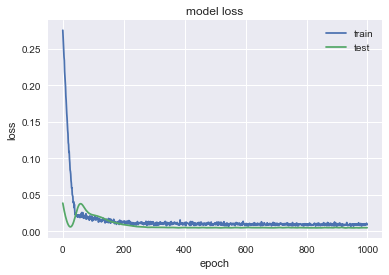

               FTI
MSE        8.72392
MAE        2.29526
R2        0.325188
MAPE (%)    9.1784


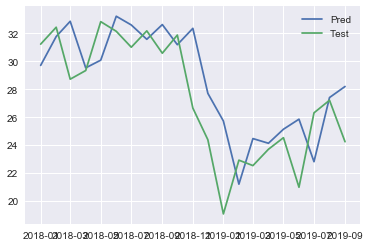

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1537 - val_loss: 0.6218
Epoch 2/1000
0s - loss: 0.1478 - val_loss: 0.6088
Epoch 3/1000
0s - loss: 0.1440 - val_loss: 0.5959
Epoch 4/1000
0s - loss: 0.1412 - val_loss: 0.5832
Epoch 5/1000
0s - loss: 0.1351 - val_loss: 0.5707
Epoch 6/1000
0s - loss: 0.1318 - val_loss: 0.5583
Epoch 7/1000
0s - loss: 0.1296 - val_loss: 0.5460
Epoch 8/1000
0s - loss: 0.1251 - val_loss: 0.5339
Epoch 9/1000
0s - loss: 0.1210 - val_loss: 0.5219
Epoch 10/1000
0s - loss: 0.1190 - val_loss: 0.5101
Epoch 11/1000
0s - loss: 0.1134 - val_loss: 0.4983
Epoch 12/1000
0s - loss: 0.1111 - val_loss: 0.4867
Epoch 13/1000
0s - loss: 0.1069 - val_loss: 0.4752
Epoch 14/1000
0s - loss: 0.1042 - val_loss: 0.4638
Epoch 15/1000
0s - loss: 0.1009 - val_loss: 0.4525
Epoch 16/1000
0s - loss: 0.0970 - val_loss: 0.4413
Epoch 17/1000
0s - loss: 0.0939 - val_loss: 0.4302
Epoch 18/1000
0s - loss: 0.0909 - val_loss: 0.4191
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0041 - val_loss: 0.0092
Epoch 169/1000
0s - loss: 0.0045 - val_loss: 0.0090
Epoch 170/1000
0s - loss: 0.0067 - val_loss: 0.0089
Epoch 171/1000
0s - loss: 0.0048 - val_loss: 0.0088
Epoch 172/1000
0s - loss: 0.0066 - val_loss: 0.0087
Epoch 173/1000
0s - loss: 0.0043 - val_loss: 0.0086
Epoch 174/1000
0s - loss: 0.0050 - val_loss: 0.0085
Epoch 175/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 176/1000
0s - loss: 0.0046 - val_loss: 0.0084
Epoch 177/1000
0s - loss: 0.0052 - val_loss: 0.0083
Epoch 178/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 179/1000
0s - loss: 0.0052 - val_loss: 0.0082
Epoch 180/1000
0s - loss: 0.0048 - val_loss: 0.0082
Epoch 181/1000
0s - loss: 0.0041 - val_loss: 0.0082
Epoch 182/1000
0s - loss: 0.0037 - val_loss: 0.0081
Epoch 183/1000
0s - loss: 0.0039 - val_loss: 0.0081
Epoch 184/1000
0s - loss: 0.0041 - val_loss: 0.0081
Epoch 185/1000
0s - loss: 0.0044 - val_loss: 0.0080
Epoch 186/1000
0s - loss: 0.0040 - val_loss: 0.0080
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0098
Epoch 338/1000
0s - loss: 0.0031 - val_loss: 0.0098
Epoch 339/1000
0s - loss: 0.0033 - val_loss: 0.0099
Epoch 340/1000
0s - loss: 0.0034 - val_loss: 0.0100
Epoch 341/1000
0s - loss: 0.0027 - val_loss: 0.0101
Epoch 342/1000
0s - loss: 0.0037 - val_loss: 0.0102
Epoch 343/1000
0s - loss: 0.0031 - val_loss: 0.0102
Epoch 344/1000
0s - loss: 0.0036 - val_loss: 0.0102
Epoch 345/1000
0s - loss: 0.0031 - val_loss: 0.0101
Epoch 346/1000
0s - loss: 0.0036 - val_loss: 0.0101
Epoch 347/1000
0s - loss: 0.0045 - val_loss: 0.0101
Epoch 348/1000
0s - loss: 0.0034 - val_loss: 0.0100
Epoch 349/1000
0s - loss: 0.0033 - val_loss: 0.0099
Epoch 350/1000
0s - loss: 0.0028 - val_loss: 0.0097
Epoch 351/1000
0s - loss: 0.0038 - val_loss: 0.0096
Epoch 352/1000
0s - loss: 0.0029 - val_loss: 0.0095
Epoch 353/1000
0s - loss: 0.0036 - val_loss: 0.0094
Epoch 354/1000
0s - loss: 0.0036 - val_loss: 0.0092
Epoch 355/1000
0s - loss: 0.0041 - val_loss: 0.0092
Epoch 356/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0092
Epoch 505/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 506/1000
0s - loss: 0.0034 - val_loss: 0.0093
Epoch 507/1000
0s - loss: 0.0025 - val_loss: 0.0093
Epoch 508/1000
0s - loss: 0.0033 - val_loss: 0.0095
Epoch 509/1000
0s - loss: 0.0029 - val_loss: 0.0096
Epoch 510/1000
0s - loss: 0.0025 - val_loss: 0.0097
Epoch 511/1000
0s - loss: 0.0037 - val_loss: 0.0098
Epoch 512/1000
0s - loss: 0.0037 - val_loss: 0.0099
Epoch 513/1000
0s - loss: 0.0035 - val_loss: 0.0099
Epoch 514/1000
0s - loss: 0.0032 - val_loss: 0.0098
Epoch 515/1000
0s - loss: 0.0030 - val_loss: 0.0097
Epoch 516/1000
0s - loss: 0.0030 - val_loss: 0.0096
Epoch 517/1000
0s - loss: 0.0041 - val_loss: 0.0096
Epoch 518/1000
0s - loss: 0.0039 - val_loss: 0.0096
Epoch 519/1000
0s - loss: 0.0037 - val_loss: 0.0097
Epoch 520/1000
0s - loss: 0.0031 - val_loss: 0.0098
Epoch 521/1000
0s - loss: 0.0032 - val_loss: 0.0099
Epoch 522/1000
0s - loss: 0.0026 - val_loss: 0.0099
Epoch 523/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0097
Epoch 674/1000
0s - loss: 0.0030 - val_loss: 0.0095
Epoch 675/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 676/1000
0s - loss: 0.0025 - val_loss: 0.0092
Epoch 677/1000
0s - loss: 0.0032 - val_loss: 0.0091
Epoch 678/1000
0s - loss: 0.0031 - val_loss: 0.0091
Epoch 679/1000
0s - loss: 0.0036 - val_loss: 0.0091
Epoch 680/1000
0s - loss: 0.0039 - val_loss: 0.0091
Epoch 681/1000
0s - loss: 0.0033 - val_loss: 0.0091
Epoch 682/1000
0s - loss: 0.0029 - val_loss: 0.0092
Epoch 683/1000
0s - loss: 0.0036 - val_loss: 0.0092
Epoch 684/1000
0s - loss: 0.0029 - val_loss: 0.0092
Epoch 685/1000
0s - loss: 0.0031 - val_loss: 0.0092
Epoch 686/1000
0s - loss: 0.0039 - val_loss: 0.0093
Epoch 687/1000
0s - loss: 0.0022 - val_loss: 0.0093
Epoch 688/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 689/1000
0s - loss: 0.0034 - val_loss: 0.0094
Epoch 690/1000
0s - loss: 0.0030 - val_loss: 0.0094
Epoch 691/1000
0s - loss: 0.0028 - val_loss: 0.0094
Epoch 692/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0094
Epoch 845/1000
0s - loss: 0.0027 - val_loss: 0.0092
Epoch 846/1000
0s - loss: 0.0033 - val_loss: 0.0092
Epoch 847/1000
0s - loss: 0.0032 - val_loss: 0.0091
Epoch 848/1000
0s - loss: 0.0026 - val_loss: 0.0091
Epoch 849/1000
0s - loss: 0.0028 - val_loss: 0.0091
Epoch 850/1000
0s - loss: 0.0025 - val_loss: 0.0091
Epoch 851/1000
0s - loss: 0.0025 - val_loss: 0.0091
Epoch 852/1000
0s - loss: 0.0033 - val_loss: 0.0091
Epoch 853/1000
0s - loss: 0.0030 - val_loss: 0.0091
Epoch 854/1000
0s - loss: 0.0035 - val_loss: 0.0091
Epoch 855/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 856/1000
0s - loss: 0.0024 - val_loss: 0.0092
Epoch 857/1000
0s - loss: 0.0031 - val_loss: 0.0093
Epoch 858/1000
0s - loss: 0.0032 - val_loss: 0.0093
Epoch 859/1000
0s - loss: 0.0033 - val_loss: 0.0093
Epoch 860/1000
0s - loss: 0.0028 - val_loss: 0.0093
Epoch 861/1000
0s - loss: 0.0026 - val_loss: 0.0093
Epoch 862/1000
0s - loss: 0.0027 - val_loss: 0.0093
Epoch 863/1000
0s - loss: 0

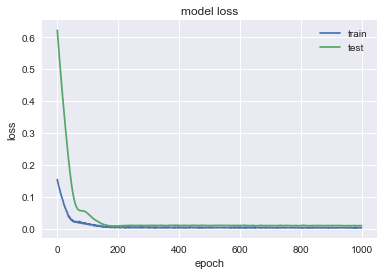

               BLK
MSE        1630.67
MAE         34.386
R2        0.386022
MAPE (%)   7.55548


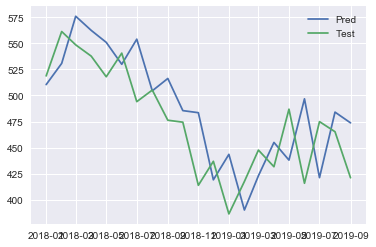

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3470 - val_loss: 0.3871
Epoch 2/1000
0s - loss: 0.3348 - val_loss: 0.3749
Epoch 3/1000
0s - loss: 0.3234 - val_loss: 0.3628
Epoch 4/1000
0s - loss: 0.3134 - val_loss: 0.3509
Epoch 5/1000
0s - loss: 0.3046 - val_loss: 0.3392
Epoch 6/1000
0s - loss: 0.2949 - val_loss: 0.3276
Epoch 7/1000
0s - loss: 0.2808 - val_loss: 0.3162
Epoch 8/1000
0s - loss: 0.2710 - val_loss: 0.3050
Epoch 9/1000
0s - loss: 0.2654 - val_loss: 0.2940
Epoch 10/1000
0s - loss: 0.2563 - val_loss: 0.2831
Epoch 11/1000
0s - loss: 0.2500 - val_loss: 0.2723
Epoch 12/1000
0s - loss: 0.2350 - val_loss: 0.2617
Epoch 13/1000
0s - loss: 0.2242 - val_loss: 0.2513
Epoch 14/1000
0s - loss: 0.2181 - val_loss: 0.2410
Epoch 15/1000
0s - loss: 0.2100 - val_loss: 0.2308
Epoch 16/1000
0s - loss: 0.1986 - val_loss: 0.2209
Epoch 17/1000
0s - loss: 0.1957 - val_loss: 0.2110
Epoch 18/1000
0s - loss: 0.1852 - val_loss: 0.2013
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0098 - val_loss: 0.0125
Epoch 162/1000
0s - loss: 0.0092 - val_loss: 0.0126
Epoch 163/1000
0s - loss: 0.0107 - val_loss: 0.0126
Epoch 164/1000
0s - loss: 0.0092 - val_loss: 0.0126
Epoch 165/1000
0s - loss: 0.0129 - val_loss: 0.0126
Epoch 166/1000
0s - loss: 0.0118 - val_loss: 0.0126
Epoch 167/1000
0s - loss: 0.0118 - val_loss: 0.0127
Epoch 168/1000
0s - loss: 0.0104 - val_loss: 0.0127
Epoch 169/1000
0s - loss: 0.0092 - val_loss: 0.0127
Epoch 170/1000
0s - loss: 0.0106 - val_loss: 0.0127
Epoch 171/1000
0s - loss: 0.0081 - val_loss: 0.0127
Epoch 172/1000
0s - loss: 0.0113 - val_loss: 0.0127
Epoch 173/1000
0s - loss: 0.0085 - val_loss: 0.0128
Epoch 174/1000
0s - loss: 0.0109 - val_loss: 0.0128
Epoch 175/1000
0s - loss: 0.0088 - val_loss: 0.0128
Epoch 176/1000
0s - loss: 0.0082 - val_loss: 0.0128
Epoch 177/1000
0s - loss: 0.0078 - val_loss: 0.0128
Epoch 178/1000
0s - loss: 0.0108 - val_loss: 0.0128
Epoch 179/1000
0s - loss: 0.0084 - val_loss: 0.0129
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0083 - val_loss: 0.0140
Epoch 325/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 326/1000
0s - loss: 0.0065 - val_loss: 0.0140
Epoch 327/1000
0s - loss: 0.0096 - val_loss: 0.0140
Epoch 328/1000
0s - loss: 0.0082 - val_loss: 0.0140
Epoch 329/1000
0s - loss: 0.0084 - val_loss: 0.0140
Epoch 330/1000
0s - loss: 0.0091 - val_loss: 0.0140
Epoch 331/1000
0s - loss: 0.0077 - val_loss: 0.0140
Epoch 332/1000
0s - loss: 0.0074 - val_loss: 0.0140
Epoch 333/1000
0s - loss: 0.0073 - val_loss: 0.0140
Epoch 334/1000
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 335/1000
0s - loss: 0.0066 - val_loss: 0.0140
Epoch 336/1000
0s - loss: 0.0067 - val_loss: 0.0140
Epoch 337/1000
0s - loss: 0.0076 - val_loss: 0.0140
Epoch 338/1000
0s - loss: 0.0066 - val_loss: 0.0140
Epoch 339/1000
0s - loss: 0.0058 - val_loss: 0.0140
Epoch 340/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 341/1000
0s - loss: 0.0087 - val_loss: 0.0140
Epoch 342/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 343/1000
0s - loss: 0

0s - loss: 0.0076 - val_loss: 0.0140
Epoch 495/1000
0s - loss: 0.0093 - val_loss: 0.0140
Epoch 496/1000
0s - loss: 0.0086 - val_loss: 0.0140
Epoch 497/1000
0s - loss: 0.0069 - val_loss: 0.0140
Epoch 498/1000
0s - loss: 0.0061 - val_loss: 0.0140
Epoch 499/1000
0s - loss: 0.0057 - val_loss: 0.0140
Epoch 500/1000
0s - loss: 0.0071 - val_loss: 0.0140
Epoch 501/1000
0s - loss: 0.0063 - val_loss: 0.0140
Epoch 502/1000
0s - loss: 0.0075 - val_loss: 0.0140
Epoch 503/1000
0s - loss: 0.0063 - val_loss: 0.0140
Epoch 504/1000
0s - loss: 0.0079 - val_loss: 0.0140
Epoch 505/1000
0s - loss: 0.0086 - val_loss: 0.0140
Epoch 506/1000
0s - loss: 0.0063 - val_loss: 0.0140
Epoch 507/1000
0s - loss: 0.0078 - val_loss: 0.0139
Epoch 508/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 509/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 510/1000
0s - loss: 0.0064 - val_loss: 0.0140
Epoch 511/1000
0s - loss: 0.0081 - val_loss: 0.0140
Epoch 512/1000
0s - loss: 0.0059 - val_loss: 0.0140
Epoch 513/1000
0s - loss: 0

0s - loss: 0.0054 - val_loss: 0.0139
Epoch 683/1000
0s - loss: 0.0067 - val_loss: 0.0139
Epoch 684/1000
0s - loss: 0.0064 - val_loss: 0.0139
Epoch 685/1000
0s - loss: 0.0079 - val_loss: 0.0139
Epoch 686/1000
0s - loss: 0.0068 - val_loss: 0.0139
Epoch 687/1000
0s - loss: 0.0064 - val_loss: 0.0139
Epoch 688/1000
0s - loss: 0.0057 - val_loss: 0.0139
Epoch 689/1000
0s - loss: 0.0072 - val_loss: 0.0139
Epoch 690/1000
0s - loss: 0.0063 - val_loss: 0.0139
Epoch 691/1000
0s - loss: 0.0054 - val_loss: 0.0139
Epoch 692/1000
0s - loss: 0.0068 - val_loss: 0.0139
Epoch 693/1000
0s - loss: 0.0072 - val_loss: 0.0139
Epoch 694/1000
0s - loss: 0.0054 - val_loss: 0.0139
Epoch 695/1000
0s - loss: 0.0066 - val_loss: 0.0139
Epoch 696/1000
0s - loss: 0.0063 - val_loss: 0.0139
Epoch 697/1000
0s - loss: 0.0058 - val_loss: 0.0139
Epoch 698/1000
0s - loss: 0.0083 - val_loss: 0.0139
Epoch 699/1000
0s - loss: 0.0060 - val_loss: 0.0140
Epoch 700/1000
0s - loss: 0.0058 - val_loss: 0.0140
Epoch 701/1000
0s - loss: 0

0s - loss: 0.0045 - val_loss: 0.0138
Epoch 876/1000
0s - loss: 0.0044 - val_loss: 0.0138
Epoch 877/1000
0s - loss: 0.0085 - val_loss: 0.0138
Epoch 878/1000
0s - loss: 0.0055 - val_loss: 0.0138
Epoch 879/1000
0s - loss: 0.0051 - val_loss: 0.0138
Epoch 880/1000
0s - loss: 0.0057 - val_loss: 0.0138
Epoch 881/1000
0s - loss: 0.0072 - val_loss: 0.0138
Epoch 882/1000
0s - loss: 0.0057 - val_loss: 0.0138
Epoch 883/1000
0s - loss: 0.0046 - val_loss: 0.0138
Epoch 884/1000
0s - loss: 0.0051 - val_loss: 0.0138
Epoch 885/1000
0s - loss: 0.0055 - val_loss: 0.0139
Epoch 886/1000
0s - loss: 0.0065 - val_loss: 0.0139
Epoch 887/1000
0s - loss: 0.0073 - val_loss: 0.0139
Epoch 888/1000
0s - loss: 0.0058 - val_loss: 0.0139
Epoch 889/1000
0s - loss: 0.0061 - val_loss: 0.0139
Epoch 890/1000
0s - loss: 0.0091 - val_loss: 0.0139
Epoch 891/1000
0s - loss: 0.0051 - val_loss: 0.0139
Epoch 892/1000
0s - loss: 0.0057 - val_loss: 0.0139
Epoch 893/1000
0s - loss: 0.0054 - val_loss: 0.0139
Epoch 894/1000
0s - loss: 0

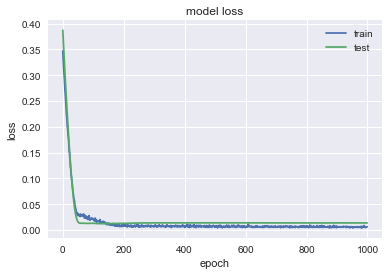

               DVA
MSE         41.607
MAE        4.90205
R2        0.321688
MAPE (%)   8.29684


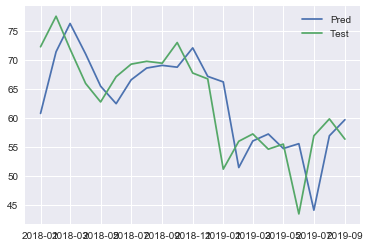

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0432 - val_loss: 0.6448
Epoch 2/1000
0s - loss: 0.0414 - val_loss: 0.6283
Epoch 3/1000
0s - loss: 0.0395 - val_loss: 0.6121
Epoch 4/1000
0s - loss: 0.0369 - val_loss: 0.5962
Epoch 5/1000
0s - loss: 0.0356 - val_loss: 0.5806
Epoch 6/1000
0s - loss: 0.0338 - val_loss: 0.5654
Epoch 7/1000
0s - loss: 0.0317 - val_loss: 0.5503
Epoch 8/1000
0s - loss: 0.0303 - val_loss: 0.5356
Epoch 9/1000
0s - loss: 0.0293 - val_loss: 0.5210
Epoch 10/1000
0s - loss: 0.0278 - val_loss: 0.5067
Epoch 11/1000
0s - loss: 0.0260 - val_loss: 0.4926
Epoch 12/1000
0s - loss: 0.0242 - val_loss: 0.4788
Epoch 13/1000
0s - loss: 0.0233 - val_loss: 0.4652
Epoch 14/1000
0s - loss: 0.0223 - val_loss: 0.4519
Epoch 15/1000
0s - loss: 0.0208 - val_loss: 0.4387
Epoch 16/1000
0s - loss: 0.0197 - val_loss: 0.4259
Epoch 17/1000
0s - loss: 0.0180 - val_loss: 0.4132
Epoch 18/1000
0s - loss: 0.0168 - val_loss: 0.4009
Epoch 19/1000
0s - loss: 0.0

0s - loss: 4.8839e-04 - val_loss: 0.0130
Epoch 183/1000
0s - loss: 8.9064e-04 - val_loss: 0.0129
Epoch 184/1000
0s - loss: 6.4522e-04 - val_loss: 0.0128
Epoch 185/1000
0s - loss: 7.5711e-04 - val_loss: 0.0127
Epoch 186/1000
0s - loss: 7.8369e-04 - val_loss: 0.0126
Epoch 187/1000
0s - loss: 6.4048e-04 - val_loss: 0.0126
Epoch 188/1000
0s - loss: 0.0010 - val_loss: 0.0125
Epoch 189/1000
0s - loss: 8.6563e-04 - val_loss: 0.0125
Epoch 190/1000
0s - loss: 9.1155e-04 - val_loss: 0.0124
Epoch 191/1000
0s - loss: 7.4663e-04 - val_loss: 0.0124
Epoch 192/1000
0s - loss: 0.0011 - val_loss: 0.0126
Epoch 193/1000
0s - loss: 6.7992e-04 - val_loss: 0.0127
Epoch 194/1000
0s - loss: 8.8957e-04 - val_loss: 0.0126
Epoch 195/1000
0s - loss: 8.5248e-04 - val_loss: 0.0127
Epoch 196/1000
0s - loss: 7.5535e-04 - val_loss: 0.0127
Epoch 197/1000
0s - loss: 7.7289e-04 - val_loss: 0.0127
Epoch 198/1000
0s - loss: 7.7797e-04 - val_loss: 0.0128
Epoch 199/1000
0s - loss: 8.4219e-04 - val_loss: 0.0127
Epoch 200/1000


0s - loss: 7.1781e-04 - val_loss: 0.0123
Epoch 333/1000
0s - loss: 0.0014 - val_loss: 0.0121
Epoch 334/1000
0s - loss: 0.0010 - val_loss: 0.0119
Epoch 335/1000
0s - loss: 7.4503e-04 - val_loss: 0.0118
Epoch 336/1000
0s - loss: 6.6791e-04 - val_loss: 0.0116
Epoch 337/1000
0s - loss: 9.2303e-04 - val_loss: 0.0113
Epoch 338/1000
0s - loss: 7.4076e-04 - val_loss: 0.0111
Epoch 339/1000
0s - loss: 8.7143e-04 - val_loss: 0.0109
Epoch 340/1000
0s - loss: 0.0011 - val_loss: 0.0109
Epoch 341/1000
0s - loss: 7.0283e-04 - val_loss: 0.0109
Epoch 342/1000
0s - loss: 7.9216e-04 - val_loss: 0.0109
Epoch 343/1000
0s - loss: 7.0184e-04 - val_loss: 0.0110
Epoch 344/1000
0s - loss: 7.3111e-04 - val_loss: 0.0112
Epoch 345/1000
0s - loss: 7.3147e-04 - val_loss: 0.0114
Epoch 346/1000
0s - loss: 6.6455e-04 - val_loss: 0.0117
Epoch 347/1000
0s - loss: 7.5998e-04 - val_loss: 0.0120
Epoch 348/1000
0s - loss: 8.8884e-04 - val_loss: 0.0123
Epoch 349/1000
0s - loss: 7.6112e-04 - val_loss: 0.0125
Epoch 350/1000
0s -

0s - loss: 9.2275e-04 - val_loss: 0.0125
Epoch 481/1000
0s - loss: 8.0041e-04 - val_loss: 0.0125
Epoch 482/1000
0s - loss: 6.5674e-04 - val_loss: 0.0125
Epoch 483/1000
0s - loss: 7.7557e-04 - val_loss: 0.0125
Epoch 484/1000
0s - loss: 8.3924e-04 - val_loss: 0.0124
Epoch 485/1000
0s - loss: 4.4777e-04 - val_loss: 0.0123
Epoch 486/1000
0s - loss: 7.9136e-04 - val_loss: 0.0123
Epoch 487/1000
0s - loss: 5.5540e-04 - val_loss: 0.0123
Epoch 488/1000
0s - loss: 4.8833e-04 - val_loss: 0.0125
Epoch 489/1000
0s - loss: 7.4816e-04 - val_loss: 0.0126
Epoch 490/1000
0s - loss: 9.5572e-04 - val_loss: 0.0129
Epoch 491/1000
0s - loss: 5.9386e-04 - val_loss: 0.0129
Epoch 492/1000
0s - loss: 9.3360e-04 - val_loss: 0.0130
Epoch 493/1000
0s - loss: 7.2812e-04 - val_loss: 0.0130
Epoch 494/1000
0s - loss: 7.6214e-04 - val_loss: 0.0132
Epoch 495/1000
0s - loss: 8.5921e-04 - val_loss: 0.0132
Epoch 496/1000
0s - loss: 6.2813e-04 - val_loss: 0.0131
Epoch 497/1000
0s - loss: 8.6861e-04 - val_loss: 0.0129
Epoch 4

0s - loss: 6.0715e-04 - val_loss: 0.0114
Epoch 632/1000
0s - loss: 9.4515e-04 - val_loss: 0.0114
Epoch 633/1000
0s - loss: 7.8123e-04 - val_loss: 0.0114
Epoch 634/1000
0s - loss: 5.7115e-04 - val_loss: 0.0115
Epoch 635/1000
0s - loss: 8.9869e-04 - val_loss: 0.0117
Epoch 636/1000
0s - loss: 5.7985e-04 - val_loss: 0.0120
Epoch 637/1000
0s - loss: 8.6448e-04 - val_loss: 0.0123
Epoch 638/1000
0s - loss: 6.7918e-04 - val_loss: 0.0125
Epoch 639/1000
0s - loss: 4.6846e-04 - val_loss: 0.0127
Epoch 640/1000
0s - loss: 7.4957e-04 - val_loss: 0.0129
Epoch 641/1000
0s - loss: 5.5175e-04 - val_loss: 0.0130
Epoch 642/1000
0s - loss: 9.3066e-04 - val_loss: 0.0128
Epoch 643/1000
0s - loss: 8.3239e-04 - val_loss: 0.0126
Epoch 644/1000
0s - loss: 9.2987e-04 - val_loss: 0.0123
Epoch 645/1000
0s - loss: 8.0592e-04 - val_loss: 0.0121
Epoch 646/1000
0s - loss: 5.8696e-04 - val_loss: 0.0118
Epoch 647/1000
0s - loss: 7.9402e-04 - val_loss: 0.0117
Epoch 648/1000
0s - loss: 7.0932e-04 - val_loss: 0.0117
Epoch 6

0s - loss: 5.7323e-04 - val_loss: 0.0112
Epoch 783/1000
0s - loss: 6.6421e-04 - val_loss: 0.0114
Epoch 784/1000
0s - loss: 5.5893e-04 - val_loss: 0.0115
Epoch 785/1000
0s - loss: 7.1744e-04 - val_loss: 0.0117
Epoch 786/1000
0s - loss: 4.6715e-04 - val_loss: 0.0118
Epoch 787/1000
0s - loss: 7.9573e-04 - val_loss: 0.0119
Epoch 788/1000
0s - loss: 5.7057e-04 - val_loss: 0.0120
Epoch 789/1000
0s - loss: 8.5202e-04 - val_loss: 0.0120
Epoch 790/1000
0s - loss: 5.5631e-04 - val_loss: 0.0120
Epoch 791/1000
0s - loss: 5.4925e-04 - val_loss: 0.0118
Epoch 792/1000
0s - loss: 6.7230e-04 - val_loss: 0.0116
Epoch 793/1000
0s - loss: 6.7895e-04 - val_loss: 0.0114
Epoch 794/1000
0s - loss: 6.2952e-04 - val_loss: 0.0114
Epoch 795/1000
0s - loss: 8.7073e-04 - val_loss: 0.0116
Epoch 796/1000
0s - loss: 9.3620e-04 - val_loss: 0.0116
Epoch 797/1000
0s - loss: 7.8511e-04 - val_loss: 0.0117
Epoch 798/1000
0s - loss: 6.2838e-04 - val_loss: 0.0119
Epoch 799/1000
0s - loss: 7.5091e-04 - val_loss: 0.0120
Epoch 8

0s - loss: 8.3671e-04 - val_loss: 0.0122
Epoch 932/1000
0s - loss: 6.7733e-04 - val_loss: 0.0121
Epoch 933/1000
0s - loss: 5.8652e-04 - val_loss: 0.0120
Epoch 934/1000
0s - loss: 6.7105e-04 - val_loss: 0.0120
Epoch 935/1000
0s - loss: 7.3638e-04 - val_loss: 0.0119
Epoch 936/1000
0s - loss: 5.8659e-04 - val_loss: 0.0117
Epoch 937/1000
0s - loss: 4.5516e-04 - val_loss: 0.0116
Epoch 938/1000
0s - loss: 5.7845e-04 - val_loss: 0.0114
Epoch 939/1000
0s - loss: 5.9423e-04 - val_loss: 0.0113
Epoch 940/1000
0s - loss: 5.5123e-04 - val_loss: 0.0113
Epoch 941/1000
0s - loss: 6.4682e-04 - val_loss: 0.0112
Epoch 942/1000
0s - loss: 6.0099e-04 - val_loss: 0.0111
Epoch 943/1000
0s - loss: 5.5275e-04 - val_loss: 0.0110
Epoch 944/1000
0s - loss: 8.0340e-04 - val_loss: 0.0110
Epoch 945/1000
0s - loss: 7.9940e-04 - val_loss: 0.0108
Epoch 946/1000
0s - loss: 5.2755e-04 - val_loss: 0.0106
Epoch 947/1000
0s - loss: 4.9608e-04 - val_loss: 0.0104
Epoch 948/1000
0s - loss: 8.4933e-04 - val_loss: 0.0104
Epoch 9

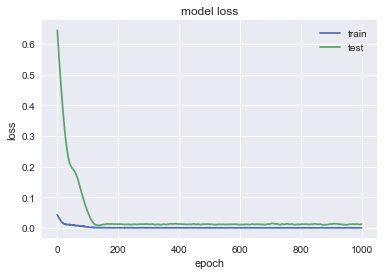

                BA
MSE         1928.2
MAE        34.7204
R2       -0.244084
MAPE (%)   9.84966


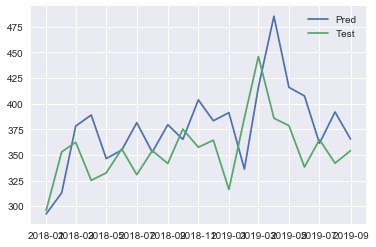

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3588 - val_loss: 0.0920
Epoch 2/1000
0s - loss: 0.3533 - val_loss: 0.0886
Epoch 3/1000
0s - loss: 0.3446 - val_loss: 0.0854
Epoch 4/1000
0s - loss: 0.3368 - val_loss: 0.0822
Epoch 5/1000
0s - loss: 0.3281 - val_loss: 0.0791
Epoch 6/1000
0s - loss: 0.3181 - val_loss: 0.0760
Epoch 7/1000
0s - loss: 0.3068 - val_loss: 0.0731
Epoch 8/1000
0s - loss: 0.3025 - val_loss: 0.0702
Epoch 9/1000
0s - loss: 0.2951 - val_loss: 0.0673
Epoch 10/1000
0s - loss: 0.2835 - val_loss: 0.0645
Epoch 11/1000
0s - loss: 0.2795 - val_loss: 0.0618
Epoch 12/1000
0s - loss: 0.2727 - val_loss: 0.0592
Epoch 13/1000
0s - loss: 0.2623 - val_loss: 0.0566
Epoch 14/1000
0s - loss: 0.2562 - val_loss: 0.0540
Epoch 15/1000
0s - loss: 0.2488 - val_loss: 0.0515
Epoch 16/1000
0s - loss: 0.2416 - val_loss: 0.0491
Epoch 17/1000
0s - loss: 0.2317 - val_loss: 0.0467
Epoch 18/1000
0s - loss: 0.2270 - val_loss: 0.0444
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0129 - val_loss: 0.0229
Epoch 181/1000
0s - loss: 0.0141 - val_loss: 0.0228
Epoch 182/1000
0s - loss: 0.0137 - val_loss: 0.0227
Epoch 183/1000
0s - loss: 0.0138 - val_loss: 0.0226
Epoch 184/1000
0s - loss: 0.0143 - val_loss: 0.0225
Epoch 185/1000
0s - loss: 0.0121 - val_loss: 0.0224
Epoch 186/1000
0s - loss: 0.0148 - val_loss: 0.0223
Epoch 187/1000
0s - loss: 0.0134 - val_loss: 0.0222
Epoch 188/1000
0s - loss: 0.0152 - val_loss: 0.0220
Epoch 189/1000
0s - loss: 0.0118 - val_loss: 0.0219
Epoch 190/1000
0s - loss: 0.0114 - val_loss: 0.0218
Epoch 191/1000
0s - loss: 0.0132 - val_loss: 0.0217
Epoch 192/1000
0s - loss: 0.0128 - val_loss: 0.0215
Epoch 193/1000
0s - loss: 0.0131 - val_loss: 0.0214
Epoch 194/1000
0s - loss: 0.0138 - val_loss: 0.0213
Epoch 195/1000
0s - loss: 0.0128 - val_loss: 0.0212
Epoch 196/1000
0s - loss: 0.0125 - val_loss: 0.0212
Epoch 197/1000
0s - loss: 0.0110 - val_loss: 0.0211
Epoch 198/1000
0s - loss: 0.0111 - val_loss: 0.0210
Epoch 199/1000
0s - loss: 0

0s - loss: 0.0091 - val_loss: 0.0137
Epoch 341/1000
0s - loss: 0.0117 - val_loss: 0.0137
Epoch 342/1000
0s - loss: 0.0089 - val_loss: 0.0136
Epoch 343/1000
0s - loss: 0.0069 - val_loss: 0.0136
Epoch 344/1000
0s - loss: 0.0095 - val_loss: 0.0136
Epoch 345/1000
0s - loss: 0.0094 - val_loss: 0.0135
Epoch 346/1000
0s - loss: 0.0092 - val_loss: 0.0135
Epoch 347/1000
0s - loss: 0.0121 - val_loss: 0.0135
Epoch 348/1000
0s - loss: 0.0104 - val_loss: 0.0134
Epoch 349/1000
0s - loss: 0.0114 - val_loss: 0.0134
Epoch 350/1000
0s - loss: 0.0099 - val_loss: 0.0133
Epoch 351/1000
0s - loss: 0.0100 - val_loss: 0.0133
Epoch 352/1000
0s - loss: 0.0086 - val_loss: 0.0132
Epoch 353/1000
0s - loss: 0.0101 - val_loss: 0.0132
Epoch 354/1000
0s - loss: 0.0117 - val_loss: 0.0132
Epoch 355/1000
0s - loss: 0.0116 - val_loss: 0.0132
Epoch 356/1000
0s - loss: 0.0100 - val_loss: 0.0132
Epoch 357/1000
0s - loss: 0.0110 - val_loss: 0.0132
Epoch 358/1000
0s - loss: 0.0072 - val_loss: 0.0133
Epoch 359/1000
0s - loss: 0

0s - loss: 0.0088 - val_loss: 0.0134
Epoch 518/1000
0s - loss: 0.0098 - val_loss: 0.0134
Epoch 519/1000
0s - loss: 0.0082 - val_loss: 0.0134
Epoch 520/1000
0s - loss: 0.0077 - val_loss: 0.0134
Epoch 521/1000
0s - loss: 0.0094 - val_loss: 0.0134
Epoch 522/1000
0s - loss: 0.0103 - val_loss: 0.0134
Epoch 523/1000
0s - loss: 0.0094 - val_loss: 0.0134
Epoch 524/1000
0s - loss: 0.0088 - val_loss: 0.0135
Epoch 525/1000
0s - loss: 0.0095 - val_loss: 0.0135
Epoch 526/1000
0s - loss: 0.0076 - val_loss: 0.0136
Epoch 527/1000
0s - loss: 0.0081 - val_loss: 0.0136
Epoch 528/1000
0s - loss: 0.0061 - val_loss: 0.0137
Epoch 529/1000
0s - loss: 0.0090 - val_loss: 0.0137
Epoch 530/1000
0s - loss: 0.0072 - val_loss: 0.0138
Epoch 531/1000
0s - loss: 0.0094 - val_loss: 0.0138
Epoch 532/1000
0s - loss: 0.0092 - val_loss: 0.0138
Epoch 533/1000
0s - loss: 0.0097 - val_loss: 0.0137
Epoch 534/1000
0s - loss: 0.0115 - val_loss: 0.0137
Epoch 535/1000
0s - loss: 0.0103 - val_loss: 0.0137
Epoch 536/1000
0s - loss: 0

0s - loss: 0.0081 - val_loss: 0.0135
Epoch 677/1000
0s - loss: 0.0086 - val_loss: 0.0136
Epoch 678/1000
0s - loss: 0.0097 - val_loss: 0.0136
Epoch 679/1000
0s - loss: 0.0090 - val_loss: 0.0136
Epoch 680/1000
0s - loss: 0.0103 - val_loss: 0.0135
Epoch 681/1000
0s - loss: 0.0105 - val_loss: 0.0135
Epoch 682/1000
0s - loss: 0.0116 - val_loss: 0.0134
Epoch 683/1000
0s - loss: 0.0091 - val_loss: 0.0134
Epoch 684/1000
0s - loss: 0.0091 - val_loss: 0.0134
Epoch 685/1000
0s - loss: 0.0092 - val_loss: 0.0134
Epoch 686/1000
0s - loss: 0.0080 - val_loss: 0.0135
Epoch 687/1000
0s - loss: 0.0085 - val_loss: 0.0135
Epoch 688/1000
0s - loss: 0.0098 - val_loss: 0.0135
Epoch 689/1000
0s - loss: 0.0080 - val_loss: 0.0136
Epoch 690/1000
0s - loss: 0.0089 - val_loss: 0.0136
Epoch 691/1000
0s - loss: 0.0125 - val_loss: 0.0136
Epoch 692/1000
0s - loss: 0.0089 - val_loss: 0.0136
Epoch 693/1000
0s - loss: 0.0089 - val_loss: 0.0136
Epoch 694/1000
0s - loss: 0.0094 - val_loss: 0.0136
Epoch 695/1000
0s - loss: 0

0s - loss: 0.0093 - val_loss: 0.0134
Epoch 855/1000
0s - loss: 0.0097 - val_loss: 0.0135
Epoch 856/1000
0s - loss: 0.0084 - val_loss: 0.0135
Epoch 857/1000
0s - loss: 0.0096 - val_loss: 0.0135
Epoch 858/1000
0s - loss: 0.0085 - val_loss: 0.0136
Epoch 859/1000
0s - loss: 0.0097 - val_loss: 0.0136
Epoch 860/1000
0s - loss: 0.0084 - val_loss: 0.0136
Epoch 861/1000
0s - loss: 0.0102 - val_loss: 0.0137
Epoch 862/1000
0s - loss: 0.0086 - val_loss: 0.0137
Epoch 863/1000
0s - loss: 0.0098 - val_loss: 0.0138
Epoch 864/1000
0s - loss: 0.0081 - val_loss: 0.0138
Epoch 865/1000
0s - loss: 0.0104 - val_loss: 0.0138
Epoch 866/1000
0s - loss: 0.0093 - val_loss: 0.0138
Epoch 867/1000
0s - loss: 0.0098 - val_loss: 0.0139
Epoch 868/1000
0s - loss: 0.0087 - val_loss: 0.0139
Epoch 869/1000
0s - loss: 0.0082 - val_loss: 0.0139
Epoch 870/1000
0s - loss: 0.0065 - val_loss: 0.0139
Epoch 871/1000
0s - loss: 0.0085 - val_loss: 0.0139
Epoch 872/1000
0s - loss: 0.0086 - val_loss: 0.0139
Epoch 873/1000
0s - loss: 0

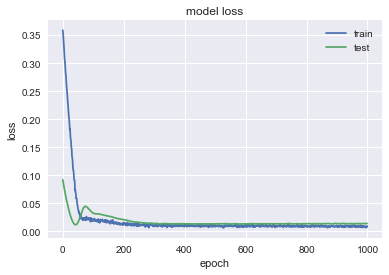

               IBM
MSE        143.278
MAE        8.50315
R2       -0.106075
MAPE (%)   6.49064


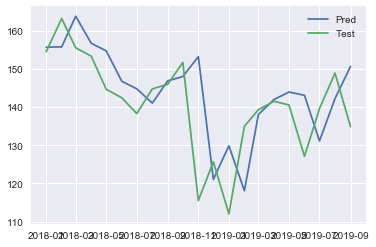

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1175 - val_loss: 0.2540
Epoch 2/1000
0s - loss: 0.1129 - val_loss: 0.2453
Epoch 3/1000
0s - loss: 0.1100 - val_loss: 0.2368
Epoch 4/1000
0s - loss: 0.1037 - val_loss: 0.2285
Epoch 5/1000
0s - loss: 0.1028 - val_loss: 0.2202
Epoch 6/1000
0s - loss: 0.0963 - val_loss: 0.2122
Epoch 7/1000
0s - loss: 0.0943 - val_loss: 0.2042
Epoch 8/1000
0s - loss: 0.0894 - val_loss: 0.1965
Epoch 9/1000
0s - loss: 0.0862 - val_loss: 0.1888
Epoch 10/1000
0s - loss: 0.0832 - val_loss: 0.1813
Epoch 11/1000
0s - loss: 0.0764 - val_loss: 0.1740
Epoch 12/1000
0s - loss: 0.0751 - val_loss: 0.1667
Epoch 13/1000
0s - loss: 0.0739 - val_loss: 0.1596
Epoch 14/1000
0s - loss: 0.0687 - val_loss: 0.1527
Epoch 15/1000
0s - loss: 0.0662 - val_loss: 0.1459
Epoch 16/1000
0s - loss: 0.0614 - val_loss: 0.1392
Epoch 17/1000
0s - loss: 0.0585 - val_loss: 0.1327
Epoch 18/1000
0s - loss: 0.0555 - val_loss: 0.1263
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0041 - val_loss: 0.0080
Epoch 176/1000
0s - loss: 0.0037 - val_loss: 0.0080
Epoch 177/1000
0s - loss: 0.0040 - val_loss: 0.0080
Epoch 178/1000
0s - loss: 0.0042 - val_loss: 0.0080
Epoch 179/1000
0s - loss: 0.0043 - val_loss: 0.0081
Epoch 180/1000
0s - loss: 0.0044 - val_loss: 0.0081
Epoch 181/1000
0s - loss: 0.0038 - val_loss: 0.0081
Epoch 182/1000
0s - loss: 0.0058 - val_loss: 0.0082
Epoch 183/1000
0s - loss: 0.0033 - val_loss: 0.0082
Epoch 184/1000
0s - loss: 0.0036 - val_loss: 0.0083
Epoch 185/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 186/1000
0s - loss: 0.0038 - val_loss: 0.0086
Epoch 187/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 188/1000
0s - loss: 0.0038 - val_loss: 0.0087
Epoch 189/1000
0s - loss: 0.0039 - val_loss: 0.0088
Epoch 190/1000
0s - loss: 0.0032 - val_loss: 0.0088
Epoch 191/1000
0s - loss: 0.0045 - val_loss: 0.0088
Epoch 192/1000
0s - loss: 0.0041 - val_loss: 0.0088
Epoch 193/1000
0s - loss: 0.0051 - val_loss: 0.0087
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0084
Epoch 353/1000
0s - loss: 0.0031 - val_loss: 0.0084
Epoch 354/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 355/1000
0s - loss: 0.0038 - val_loss: 0.0084
Epoch 356/1000
0s - loss: 0.0039 - val_loss: 0.0084
Epoch 357/1000
0s - loss: 0.0047 - val_loss: 0.0084
Epoch 358/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 359/1000
0s - loss: 0.0036 - val_loss: 0.0084
Epoch 360/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 361/1000
0s - loss: 0.0039 - val_loss: 0.0082
Epoch 362/1000
0s - loss: 0.0047 - val_loss: 0.0081
Epoch 363/1000
0s - loss: 0.0037 - val_loss: 0.0080
Epoch 364/1000
0s - loss: 0.0038 - val_loss: 0.0080
Epoch 365/1000
0s - loss: 0.0038 - val_loss: 0.0080
Epoch 366/1000
0s - loss: 0.0041 - val_loss: 0.0080
Epoch 367/1000
0s - loss: 0.0039 - val_loss: 0.0080
Epoch 368/1000
0s - loss: 0.0043 - val_loss: 0.0080
Epoch 369/1000
0s - loss: 0.0038 - val_loss: 0.0080
Epoch 370/1000
0s - loss: 0.0034 - val_loss: 0.0080
Epoch 371/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0078
Epoch 530/1000
0s - loss: 0.0034 - val_loss: 0.0078
Epoch 531/1000
0s - loss: 0.0028 - val_loss: 0.0078
Epoch 532/1000
0s - loss: 0.0040 - val_loss: 0.0078
Epoch 533/1000
0s - loss: 0.0037 - val_loss: 0.0080
Epoch 534/1000
0s - loss: 0.0032 - val_loss: 0.0080
Epoch 535/1000
0s - loss: 0.0045 - val_loss: 0.0081
Epoch 536/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 537/1000
0s - loss: 0.0032 - val_loss: 0.0083
Epoch 538/1000
0s - loss: 0.0039 - val_loss: 0.0083
Epoch 539/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 540/1000
0s - loss: 0.0034 - val_loss: 0.0082
Epoch 541/1000
0s - loss: 0.0045 - val_loss: 0.0080
Epoch 542/1000
0s - loss: 0.0033 - val_loss: 0.0079
Epoch 543/1000
0s - loss: 0.0039 - val_loss: 0.0078
Epoch 544/1000
0s - loss: 0.0037 - val_loss: 0.0078
Epoch 545/1000
0s - loss: 0.0046 - val_loss: 0.0077
Epoch 546/1000
0s - loss: 0.0042 - val_loss: 0.0078
Epoch 547/1000
0s - loss: 0.0035 - val_loss: 0.0078
Epoch 548/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0084
Epoch 706/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 707/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 708/1000
0s - loss: 0.0047 - val_loss: 0.0088
Epoch 709/1000
0s - loss: 0.0036 - val_loss: 0.0088
Epoch 710/1000
0s - loss: 0.0035 - val_loss: 0.0088
Epoch 711/1000
0s - loss: 0.0032 - val_loss: 0.0087
Epoch 712/1000
0s - loss: 0.0042 - val_loss: 0.0085
Epoch 713/1000
0s - loss: 0.0043 - val_loss: 0.0083
Epoch 714/1000
0s - loss: 0.0034 - val_loss: 0.0081
Epoch 715/1000
0s - loss: 0.0032 - val_loss: 0.0081
Epoch 716/1000
0s - loss: 0.0044 - val_loss: 0.0082
Epoch 717/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 718/1000
0s - loss: 0.0038 - val_loss: 0.0084
Epoch 719/1000
0s - loss: 0.0038 - val_loss: 0.0085
Epoch 720/1000
0s - loss: 0.0053 - val_loss: 0.0085
Epoch 721/1000
0s - loss: 0.0034 - val_loss: 0.0086
Epoch 722/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 723/1000
0s - loss: 0.0047 - val_loss: 0.0086
Epoch 724/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0080
Epoch 895/1000
0s - loss: 0.0037 - val_loss: 0.0079
Epoch 896/1000
0s - loss: 0.0033 - val_loss: 0.0080
Epoch 897/1000
0s - loss: 0.0035 - val_loss: 0.0081
Epoch 898/1000
0s - loss: 0.0042 - val_loss: 0.0082
Epoch 899/1000
0s - loss: 0.0039 - val_loss: 0.0083
Epoch 900/1000
0s - loss: 0.0034 - val_loss: 0.0084
Epoch 901/1000
0s - loss: 0.0034 - val_loss: 0.0085
Epoch 902/1000
0s - loss: 0.0026 - val_loss: 0.0085
Epoch 903/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 904/1000
0s - loss: 0.0027 - val_loss: 0.0083
Epoch 905/1000
0s - loss: 0.0037 - val_loss: 0.0083
Epoch 906/1000
0s - loss: 0.0037 - val_loss: 0.0083
Epoch 907/1000
0s - loss: 0.0043 - val_loss: 0.0083
Epoch 908/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 909/1000
0s - loss: 0.0036 - val_loss: 0.0083
Epoch 910/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 911/1000
0s - loss: 0.0035 - val_loss: 0.0083
Epoch 912/1000
0s - loss: 0.0033 - val_loss: 0.0081
Epoch 913/1000
0s - loss: 0

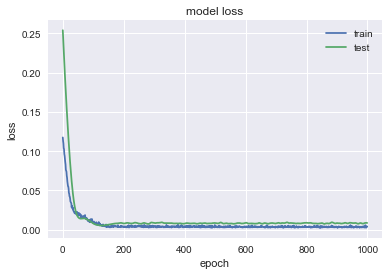

               ALB
MSE        96.7131
MAE        7.59082
R2        0.700999
MAPE (%)   8.99547


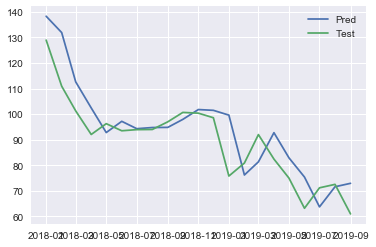

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1421 - val_loss: 0.6741
Epoch 2/1000
0s - loss: 0.1373 - val_loss: 0.6564
Epoch 3/1000
0s - loss: 0.1320 - val_loss: 0.6389
Epoch 4/1000
0s - loss: 0.1263 - val_loss: 0.6216
Epoch 5/1000
0s - loss: 0.1214 - val_loss: 0.6045
Epoch 6/1000
0s - loss: 0.1184 - val_loss: 0.5877
Epoch 7/1000
0s - loss: 0.1118 - val_loss: 0.5710
Epoch 8/1000
0s - loss: 0.1077 - val_loss: 0.5544
Epoch 9/1000
0s - loss: 0.1028 - val_loss: 0.5381
Epoch 10/1000
0s - loss: 0.0986 - val_loss: 0.5219
Epoch 11/1000
0s - loss: 0.0952 - val_loss: 0.5058
Epoch 12/1000
0s - loss: 0.0895 - val_loss: 0.4899
Epoch 13/1000
0s - loss: 0.0861 - val_loss: 0.4741
Epoch 14/1000
0s - loss: 0.0821 - val_loss: 0.4586
Epoch 15/1000
0s - loss: 0.0772 - val_loss: 0.4431
Epoch 16/1000
0s - loss: 0.0742 - val_loss: 0.4279
Epoch 17/1000
0s - loss: 0.0708 - val_loss: 0.4128
Epoch 18/1000
0s - loss: 0.0656 - val_loss: 0.3978
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0050 - val_loss: 0.0103
Epoch 182/1000
0s - loss: 0.0057 - val_loss: 0.0100
Epoch 183/1000
0s - loss: 0.0054 - val_loss: 0.0097
Epoch 184/1000
0s - loss: 0.0053 - val_loss: 0.0095
Epoch 185/1000
0s - loss: 0.0055 - val_loss: 0.0092
Epoch 186/1000
0s - loss: 0.0059 - val_loss: 0.0090
Epoch 187/1000
0s - loss: 0.0056 - val_loss: 0.0087
Epoch 188/1000
0s - loss: 0.0043 - val_loss: 0.0085
Epoch 189/1000
0s - loss: 0.0047 - val_loss: 0.0082
Epoch 190/1000
0s - loss: 0.0051 - val_loss: 0.0080
Epoch 191/1000
0s - loss: 0.0053 - val_loss: 0.0078
Epoch 192/1000
0s - loss: 0.0052 - val_loss: 0.0077
Epoch 193/1000
0s - loss: 0.0045 - val_loss: 0.0076
Epoch 194/1000
0s - loss: 0.0045 - val_loss: 0.0075
Epoch 195/1000
0s - loss: 0.0051 - val_loss: 0.0074
Epoch 196/1000
0s - loss: 0.0051 - val_loss: 0.0074
Epoch 197/1000
0s - loss: 0.0061 - val_loss: 0.0073
Epoch 198/1000
0s - loss: 0.0047 - val_loss: 0.0073
Epoch 199/1000
0s - loss: 0.0049 - val_loss: 0.0073
Epoch 200/1000
0s - loss: 0

0s - loss: 0.0042 - val_loss: 0.0070
Epoch 344/1000
0s - loss: 0.0046 - val_loss: 0.0070
Epoch 345/1000
0s - loss: 0.0037 - val_loss: 0.0070
Epoch 346/1000
0s - loss: 0.0044 - val_loss: 0.0070
Epoch 347/1000
0s - loss: 0.0049 - val_loss: 0.0070
Epoch 348/1000
0s - loss: 0.0043 - val_loss: 0.0070
Epoch 349/1000
0s - loss: 0.0049 - val_loss: 0.0070
Epoch 350/1000
0s - loss: 0.0051 - val_loss: 0.0070
Epoch 351/1000
0s - loss: 0.0039 - val_loss: 0.0070
Epoch 352/1000
0s - loss: 0.0044 - val_loss: 0.0070
Epoch 353/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 354/1000
0s - loss: 0.0048 - val_loss: 0.0070
Epoch 355/1000
0s - loss: 0.0039 - val_loss: 0.0070
Epoch 356/1000
0s - loss: 0.0058 - val_loss: 0.0070
Epoch 357/1000
0s - loss: 0.0042 - val_loss: 0.0070
Epoch 358/1000
0s - loss: 0.0051 - val_loss: 0.0070
Epoch 359/1000
0s - loss: 0.0050 - val_loss: 0.0071
Epoch 360/1000
0s - loss: 0.0046 - val_loss: 0.0071
Epoch 361/1000
0s - loss: 0.0041 - val_loss: 0.0071
Epoch 362/1000
0s - loss: 0

0s - loss: 0.0045 - val_loss: 0.0069
Epoch 504/1000
0s - loss: 0.0045 - val_loss: 0.0069
Epoch 505/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 506/1000
0s - loss: 0.0043 - val_loss: 0.0069
Epoch 507/1000
0s - loss: 0.0038 - val_loss: 0.0069
Epoch 508/1000
0s - loss: 0.0047 - val_loss: 0.0069
Epoch 509/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 510/1000
0s - loss: 0.0044 - val_loss: 0.0069
Epoch 511/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 512/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 513/1000
0s - loss: 0.0047 - val_loss: 0.0070
Epoch 514/1000
0s - loss: 0.0048 - val_loss: 0.0070
Epoch 515/1000
0s - loss: 0.0043 - val_loss: 0.0070
Epoch 516/1000
0s - loss: 0.0045 - val_loss: 0.0070
Epoch 517/1000
0s - loss: 0.0052 - val_loss: 0.0070
Epoch 518/1000
0s - loss: 0.0041 - val_loss: 0.0070
Epoch 519/1000
0s - loss: 0.0036 - val_loss: 0.0070
Epoch 520/1000
0s - loss: 0.0042 - val_loss: 0.0070
Epoch 521/1000
0s - loss: 0.0044 - val_loss: 0.0070
Epoch 522/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0069
Epoch 682/1000
0s - loss: 0.0049 - val_loss: 0.0069
Epoch 683/1000
0s - loss: 0.0039 - val_loss: 0.0069
Epoch 684/1000
0s - loss: 0.0052 - val_loss: 0.0069
Epoch 685/1000
0s - loss: 0.0044 - val_loss: 0.0069
Epoch 686/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 687/1000
0s - loss: 0.0038 - val_loss: 0.0069
Epoch 688/1000
0s - loss: 0.0047 - val_loss: 0.0070
Epoch 689/1000
0s - loss: 0.0043 - val_loss: 0.0070
Epoch 690/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 691/1000
0s - loss: 0.0043 - val_loss: 0.0070
Epoch 692/1000
0s - loss: 0.0043 - val_loss: 0.0070
Epoch 693/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 694/1000
0s - loss: 0.0041 - val_loss: 0.0069
Epoch 695/1000
0s - loss: 0.0042 - val_loss: 0.0069
Epoch 696/1000
0s - loss: 0.0050 - val_loss: 0.0069
Epoch 697/1000
0s - loss: 0.0044 - val_loss: 0.0069
Epoch 698/1000
0s - loss: 0.0041 - val_loss: 0.0069
Epoch 699/1000
0s - loss: 0.0040 - val_loss: 0.0069
Epoch 700/1000
0s - loss: 0

0s - loss: 0.0048 - val_loss: 0.0069
Epoch 859/1000
0s - loss: 0.0042 - val_loss: 0.0070
Epoch 860/1000
0s - loss: 0.0035 - val_loss: 0.0071
Epoch 861/1000
0s - loss: 0.0042 - val_loss: 0.0072
Epoch 862/1000
0s - loss: 0.0040 - val_loss: 0.0072
Epoch 863/1000
0s - loss: 0.0045 - val_loss: 0.0072
Epoch 864/1000
0s - loss: 0.0036 - val_loss: 0.0072
Epoch 865/1000
0s - loss: 0.0043 - val_loss: 0.0072
Epoch 866/1000
0s - loss: 0.0048 - val_loss: 0.0071
Epoch 867/1000
0s - loss: 0.0045 - val_loss: 0.0070
Epoch 868/1000
0s - loss: 0.0037 - val_loss: 0.0069
Epoch 869/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 870/1000
0s - loss: 0.0041 - val_loss: 0.0068
Epoch 871/1000
0s - loss: 0.0039 - val_loss: 0.0067
Epoch 872/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 873/1000
0s - loss: 0.0042 - val_loss: 0.0067
Epoch 874/1000
0s - loss: 0.0038 - val_loss: 0.0067
Epoch 875/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 876/1000
0s - loss: 0.0043 - val_loss: 0.0067
Epoch 877/1000
0s - loss: 0

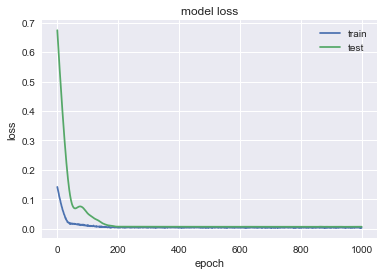

               CBRE
MSE         11.7814
MAE         2.80559
R2        0.0476854
MAPE (%)    6.01626


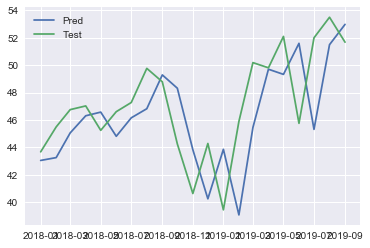

In [132]:
pred_gru_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_2[comp] = nn_forec_GRU(df,comp,n_train_time=test.shape[0],first_layer = 32,second_layer=16).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3000 - val_loss: 0.2008
Epoch 2/1000
0s - loss: 0.2813 - val_loss: 0.1853
Epoch 3/1000
0s - loss: 0.2601 - val_loss: 0.1703
Epoch 4/1000
0s - loss: 0.2414 - val_loss: 0.1557
Epoch 5/1000
0s - loss: 0.2229 - val_loss: 0.1415
Epoch 6/1000
0s - loss: 0.2058 - val_loss: 0.1276
Epoch 7/1000
0s - loss: 0.1877 - val_loss: 0.1141
Epoch 8/1000
0s - loss: 0.1698 - val_loss: 0.1010
Epoch 9/1000
0s - loss: 0.1534 - val_loss: 0.0884
Epoch 10/1000
0s - loss: 0.1368 - val_loss: 0.0763
Epoch 11/1000
0s - loss: 0.1200 - val_loss: 0.0647
Epoch 12/1000
0s - loss: 0.1047 - val_loss: 0.0539
Epoch 13/1000
0s - loss: 0.0917 - val_loss: 0.0439
Epoch 14/1000
0s - loss: 0.0738 - val_loss: 0.0349
Epoch 15/1000
0s - loss: 0.0641 - val_loss: 0.0269
Epoch 16/1000
0s - loss: 0.0539 - val_loss: 0.0202
Epoch 17/1000
0s - loss: 0.0410 - val_loss: 0.0149
Epoch 18/1000
0s - loss: 0.0308 - val_loss: 0.0111
Epoch 19/1000
0s - loss: 0.02

0s - loss: 0.0086 - val_loss: 0.0071
Epoch 169/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 170/1000
0s - loss: 0.0078 - val_loss: 0.0071
Epoch 171/1000
0s - loss: 0.0072 - val_loss: 0.0071
Epoch 172/1000
0s - loss: 0.0069 - val_loss: 0.0071
Epoch 173/1000
0s - loss: 0.0067 - val_loss: 0.0071
Epoch 174/1000
0s - loss: 0.0075 - val_loss: 0.0071
Epoch 175/1000
0s - loss: 0.0071 - val_loss: 0.0071
Epoch 176/1000
0s - loss: 0.0066 - val_loss: 0.0071
Epoch 177/1000
0s - loss: 0.0075 - val_loss: 0.0071
Epoch 178/1000
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 179/1000
0s - loss: 0.0077 - val_loss: 0.0071
Epoch 180/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 181/1000
0s - loss: 0.0090 - val_loss: 0.0072
Epoch 182/1000
0s - loss: 0.0075 - val_loss: 0.0072
Epoch 183/1000
0s - loss: 0.0089 - val_loss: 0.0072
Epoch 184/1000
0s - loss: 0.0079 - val_loss: 0.0072
Epoch 185/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 186/1000
0s - loss: 0.0090 - val_loss: 0.0072
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0086 - val_loss: 0.0071
Epoch 329/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 330/1000
0s - loss: 0.0083 - val_loss: 0.0072
Epoch 331/1000
0s - loss: 0.0085 - val_loss: 0.0073
Epoch 332/1000
0s - loss: 0.0075 - val_loss: 0.0073
Epoch 333/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 334/1000
0s - loss: 0.0075 - val_loss: 0.0073
Epoch 335/1000
0s - loss: 0.0083 - val_loss: 0.0073
Epoch 336/1000
0s - loss: 0.0066 - val_loss: 0.0073
Epoch 337/1000
0s - loss: 0.0069 - val_loss: 0.0073
Epoch 338/1000
0s - loss: 0.0060 - val_loss: 0.0072
Epoch 339/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 340/1000
0s - loss: 0.0069 - val_loss: 0.0072
Epoch 341/1000
0s - loss: 0.0065 - val_loss: 0.0071
Epoch 342/1000
0s - loss: 0.0081 - val_loss: 0.0071
Epoch 343/1000
0s - loss: 0.0069 - val_loss: 0.0071
Epoch 344/1000
0s - loss: 0.0086 - val_loss: 0.0071
Epoch 345/1000
0s - loss: 0.0069 - val_loss: 0.0071
Epoch 346/1000
0s - loss: 0.0081 - val_loss: 0.0072
Epoch 347/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0072
Epoch 488/1000
0s - loss: 0.0080 - val_loss: 0.0072
Epoch 489/1000
0s - loss: 0.0074 - val_loss: 0.0072
Epoch 490/1000
0s - loss: 0.0072 - val_loss: 0.0071
Epoch 491/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 492/1000
0s - loss: 0.0071 - val_loss: 0.0071
Epoch 493/1000
0s - loss: 0.0073 - val_loss: 0.0071
Epoch 494/1000
0s - loss: 0.0084 - val_loss: 0.0072
Epoch 495/1000
0s - loss: 0.0074 - val_loss: 0.0072
Epoch 496/1000
0s - loss: 0.0080 - val_loss: 0.0073
Epoch 497/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 498/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 499/1000
0s - loss: 0.0084 - val_loss: 0.0074
Epoch 500/1000
0s - loss: 0.0079 - val_loss: 0.0074
Epoch 501/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 502/1000
0s - loss: 0.0083 - val_loss: 0.0073
Epoch 503/1000
0s - loss: 0.0074 - val_loss: 0.0073
Epoch 504/1000
0s - loss: 0.0078 - val_loss: 0.0072
Epoch 505/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 506/1000
0s - loss: 0

0s - loss: 0.0074 - val_loss: 0.0072
Epoch 647/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 648/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 649/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 650/1000
0s - loss: 0.0074 - val_loss: 0.0073
Epoch 651/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 652/1000
0s - loss: 0.0063 - val_loss: 0.0074
Epoch 653/1000
0s - loss: 0.0081 - val_loss: 0.0074
Epoch 654/1000
0s - loss: 0.0064 - val_loss: 0.0074
Epoch 655/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 656/1000
0s - loss: 0.0076 - val_loss: 0.0074
Epoch 657/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 658/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 659/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 660/1000
0s - loss: 0.0080 - val_loss: 0.0072
Epoch 661/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 662/1000
0s - loss: 0.0065 - val_loss: 0.0072
Epoch 663/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 664/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 665/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0074
Epoch 812/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 813/1000
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 814/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 815/1000
0s - loss: 0.0063 - val_loss: 0.0073
Epoch 816/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 817/1000
0s - loss: 0.0064 - val_loss: 0.0074
Epoch 818/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 819/1000
0s - loss: 0.0068 - val_loss: 0.0075
Epoch 820/1000
0s - loss: 0.0078 - val_loss: 0.0075
Epoch 821/1000
0s - loss: 0.0076 - val_loss: 0.0074
Epoch 822/1000
0s - loss: 0.0078 - val_loss: 0.0074
Epoch 823/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 824/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 825/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 826/1000
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 827/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 828/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 829/1000
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 830/1000
0s - loss: 0

0s - loss: 0.0073 - val_loss: 0.0075
Epoch 972/1000
0s - loss: 0.0064 - val_loss: 0.0075
Epoch 973/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 974/1000
0s - loss: 0.0081 - val_loss: 0.0074
Epoch 975/1000
0s - loss: 0.0072 - val_loss: 0.0075
Epoch 976/1000
0s - loss: 0.0075 - val_loss: 0.0075
Epoch 977/1000
0s - loss: 0.0078 - val_loss: 0.0075
Epoch 978/1000
0s - loss: 0.0082 - val_loss: 0.0075
Epoch 979/1000
0s - loss: 0.0084 - val_loss: 0.0075
Epoch 980/1000
0s - loss: 0.0078 - val_loss: 0.0074
Epoch 981/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 982/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 983/1000
0s - loss: 0.0076 - val_loss: 0.0074
Epoch 984/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 985/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 986/1000
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 987/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 988/1000
0s - loss: 0.0072 - val_loss: 0.0075
Epoch 989/1000
0s - loss: 0.0073 - val_loss: 0.0076
Epoch 990/1000
0s - loss: 0

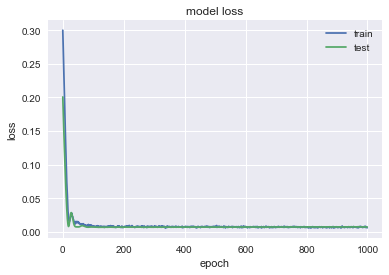

                T
MSE       2.70645
MAE       1.25351
R2        0.55199
MAPE (%)  3.83364


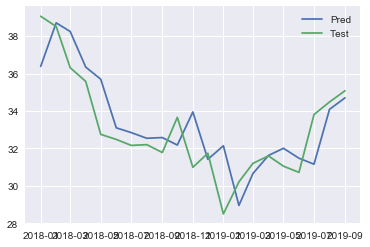

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1321 - val_loss: 0.7311
Epoch 2/1000
0s - loss: 0.1196 - val_loss: 0.6824
Epoch 3/1000
0s - loss: 0.1102 - val_loss: 0.6353
Epoch 4/1000
0s - loss: 0.0998 - val_loss: 0.5895
Epoch 5/1000
0s - loss: 0.0894 - val_loss: 0.5450
Epoch 6/1000
0s - loss: 0.0794 - val_loss: 0.5015
Epoch 7/1000
0s - loss: 0.0721 - val_loss: 0.4592
Epoch 8/1000
0s - loss: 0.0619 - val_loss: 0.4180
Epoch 9/1000
0s - loss: 0.0545 - val_loss: 0.3779
Epoch 10/1000
0s - loss: 0.0473 - val_loss: 0.3390
Epoch 11/1000
0s - loss: 0.0400 - val_loss: 0.3015
Epoch 12/1000
0s - loss: 0.0333 - val_loss: 0.2655
Epoch 13/1000
0s - loss: 0.0271 - val_loss: 0.2312
Epoch 14/1000
0s - loss: 0.0229 - val_loss: 0.1988
Epoch 15/1000
0s - loss: 0.0185 - val_loss: 0.1688
Epoch 16/1000
0s - loss: 0.0141 - val_loss: 0.1413
Epoch 17/1000
0s - loss: 0.0114 - val_loss: 0.1167
Epoch 18/1000
0s - loss: 0.0104 - val_loss: 0.0952
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0041 - val_loss: 0.0129
Epoch 175/1000
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 176/1000
0s - loss: 0.0037 - val_loss: 0.0129
Epoch 177/1000
0s - loss: 0.0033 - val_loss: 0.0129
Epoch 178/1000
0s - loss: 0.0029 - val_loss: 0.0128
Epoch 179/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 180/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 181/1000
0s - loss: 0.0037 - val_loss: 0.0128
Epoch 182/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 183/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 184/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 185/1000
0s - loss: 0.0029 - val_loss: 0.0128
Epoch 186/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 187/1000
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 188/1000
0s - loss: 0.0033 - val_loss: 0.0129
Epoch 189/1000
0s - loss: 0.0033 - val_loss: 0.0129
Epoch 190/1000
0s - loss: 0.0028 - val_loss: 0.0130
Epoch 191/1000
0s - loss: 0.0036 - val_loss: 0.0130
Epoch 192/1000
0s - loss: 0.0030 - val_loss: 0.0130
Epoch 193/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0129
Epoch 348/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 349/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 350/1000
0s - loss: 0.0027 - val_loss: 0.0128
Epoch 351/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 352/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 353/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 354/1000
0s - loss: 0.0036 - val_loss: 0.0128
Epoch 355/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 356/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 357/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 358/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 359/1000
0s - loss: 0.0029 - val_loss: 0.0129
Epoch 360/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 361/1000
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 362/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 363/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 364/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 365/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 366/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0126
Epoch 515/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 516/1000
0s - loss: 0.0036 - val_loss: 0.0126
Epoch 517/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 518/1000
0s - loss: 0.0035 - val_loss: 0.0126
Epoch 519/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 520/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 521/1000
0s - loss: 0.0037 - val_loss: 0.0126
Epoch 522/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 523/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 524/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 525/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 526/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 527/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 528/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 529/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 530/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 531/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 532/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 533/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0128
Epoch 685/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 686/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 687/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 688/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 689/1000
0s - loss: 0.0035 - val_loss: 0.0126
Epoch 690/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 691/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 692/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 693/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 694/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 695/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 696/1000
0s - loss: 0.0035 - val_loss: 0.0126
Epoch 697/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 698/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 699/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 700/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 701/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 702/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 703/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0126
Epoch 852/1000
0s - loss: 0.0032 - val_loss: 0.0126
Epoch 853/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 854/1000
0s - loss: 0.0037 - val_loss: 0.0125
Epoch 855/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 856/1000
0s - loss: 0.0026 - val_loss: 0.0125
Epoch 857/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 858/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 859/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 860/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 861/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 862/1000
0s - loss: 0.0039 - val_loss: 0.0125
Epoch 863/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 864/1000
0s - loss: 0.0036 - val_loss: 0.0125
Epoch 865/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 866/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 867/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 868/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 869/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 870/1000
0s - loss: 0

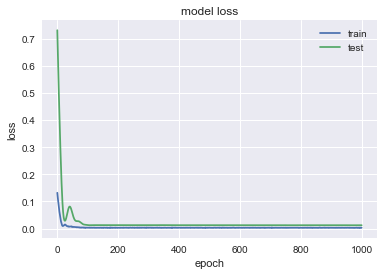

               BBY
MSE        56.9479
MAE        6.57227
R2       -0.208265
MAPE (%)   9.81881


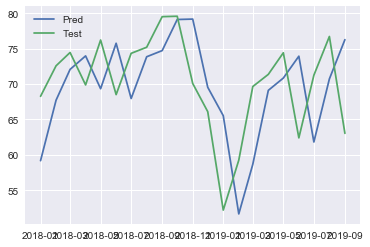

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2296 - val_loss: 0.5191
Epoch 2/1000
0s - loss: 0.2149 - val_loss: 0.4899
Epoch 3/1000
0s - loss: 0.2003 - val_loss: 0.4616
Epoch 4/1000
0s - loss: 0.1879 - val_loss: 0.4339
Epoch 5/1000
0s - loss: 0.1737 - val_loss: 0.4068
Epoch 6/1000
0s - loss: 0.1615 - val_loss: 0.3801
Epoch 7/1000
0s - loss: 0.1487 - val_loss: 0.3539
Epoch 8/1000
0s - loss: 0.1364 - val_loss: 0.3279
Epoch 9/1000
0s - loss: 0.1238 - val_loss: 0.3022
Epoch 10/1000
0s - loss: 0.1124 - val_loss: 0.2768
Epoch 11/1000
0s - loss: 0.1006 - val_loss: 0.2518
Epoch 12/1000
0s - loss: 0.0882 - val_loss: 0.2271
Epoch 13/1000
0s - loss: 0.0789 - val_loss: 0.2029
Epoch 14/1000
0s - loss: 0.0673 - val_loss: 0.1794
Epoch 15/1000
0s - loss: 0.0594 - val_loss: 0.1566
Epoch 16/1000
0s - loss: 0.0485 - val_loss: 0.1347
Epoch 17/1000
0s - loss: 0.0409 - val_loss: 0.1140
Epoch 18/1000
0s - loss: 0.0341 - val_loss: 0.0946
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0035 - val_loss: 0.0042
Epoch 172/1000
0s - loss: 0.0028 - val_loss: 0.0042
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 0.0042
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0042
Epoch 176/1000
0s - loss: 0.0027 - val_loss: 0.0043
Epoch 177/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 178/1000
0s - loss: 0.0033 - val_loss: 0.0044
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 0.0045
Epoch 180/1000
0s - loss: 0.0028 - val_loss: 0.0045
Epoch 181/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 182/1000
0s - loss: 0.0032 - val_loss: 0.0046
Epoch 183/1000
0s - loss: 0.0035 - val_loss: 0.0046
Epoch 184/1000
0s - loss: 0.0029 - val_loss: 0.0046
Epoch 185/1000
0s - loss: 0.0030 - val_loss: 0.0046
Epoch 186/1000
0s - loss: 0.0030 - val_loss: 0.0045
Epoch 187/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 188/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 189/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 190/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0043
Epoch 332/1000
0s - loss: 0.0029 - val_loss: 0.0044
Epoch 333/1000
0s - loss: 0.0034 - val_loss: 0.0044
Epoch 334/1000
0s - loss: 0.0031 - val_loss: 0.0045
Epoch 335/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 336/1000
0s - loss: 0.0033 - val_loss: 0.0045
Epoch 337/1000
0s - loss: 0.0030 - val_loss: 0.0045
Epoch 338/1000
0s - loss: 0.0029 - val_loss: 0.0044
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0044
Epoch 340/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 341/1000
0s - loss: 0.0031 - val_loss: 0.0043
Epoch 342/1000
0s - loss: 0.0032 - val_loss: 0.0043
Epoch 343/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 344/1000
0s - loss: 0.0026 - val_loss: 0.0043
Epoch 345/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 346/1000
0s - loss: 0.0027 - val_loss: 0.0043
Epoch 347/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 348/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 349/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 350/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0042
Epoch 491/1000
0s - loss: 0.0031 - val_loss: 0.0042
Epoch 492/1000
0s - loss: 0.0030 - val_loss: 0.0043
Epoch 493/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 494/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 495/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 496/1000
0s - loss: 0.0028 - val_loss: 0.0046
Epoch 497/1000
0s - loss: 0.0027 - val_loss: 0.0046
Epoch 498/1000
0s - loss: 0.0028 - val_loss: 0.0047
Epoch 499/1000
0s - loss: 0.0029 - val_loss: 0.0047
Epoch 500/1000
0s - loss: 0.0028 - val_loss: 0.0048
Epoch 501/1000
0s - loss: 0.0028 - val_loss: 0.0048
Epoch 502/1000
0s - loss: 0.0026 - val_loss: 0.0047
Epoch 503/1000
0s - loss: 0.0030 - val_loss: 0.0045
Epoch 504/1000
0s - loss: 0.0027 - val_loss: 0.0044
Epoch 505/1000
0s - loss: 0.0026 - val_loss: 0.0043
Epoch 506/1000
0s - loss: 0.0021 - val_loss: 0.0043
Epoch 507/1000
0s - loss: 0.0026 - val_loss: 0.0042
Epoch 508/1000
0s - loss: 0.0029 - val_loss: 0.0043
Epoch 509/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0046
Epoch 650/1000
0s - loss: 0.0027 - val_loss: 0.0046
Epoch 651/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 652/1000
0s - loss: 0.0023 - val_loss: 0.0046
Epoch 653/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 654/1000
0s - loss: 0.0029 - val_loss: 0.0045
Epoch 655/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 656/1000
0s - loss: 0.0028 - val_loss: 0.0045
Epoch 657/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 658/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 659/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 660/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 661/1000
0s - loss: 0.0030 - val_loss: 0.0045
Epoch 662/1000
0s - loss: 0.0028 - val_loss: 0.0046
Epoch 663/1000
0s - loss: 0.0029 - val_loss: 0.0048
Epoch 664/1000
0s - loss: 0.0027 - val_loss: 0.0050
Epoch 665/1000
0s - loss: 0.0027 - val_loss: 0.0051
Epoch 666/1000
0s - loss: 0.0027 - val_loss: 0.0050
Epoch 667/1000
0s - loss: 0.0023 - val_loss: 0.0050
Epoch 668/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0050
Epoch 809/1000
0s - loss: 0.0024 - val_loss: 0.0050
Epoch 810/1000
0s - loss: 0.0027 - val_loss: 0.0051
Epoch 811/1000
0s - loss: 0.0028 - val_loss: 0.0050
Epoch 812/1000
0s - loss: 0.0025 - val_loss: 0.0049
Epoch 813/1000
0s - loss: 0.0028 - val_loss: 0.0047
Epoch 814/1000
0s - loss: 0.0025 - val_loss: 0.0046
Epoch 815/1000
0s - loss: 0.0030 - val_loss: 0.0045
Epoch 816/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 817/1000
0s - loss: 0.0027 - val_loss: 0.0045
Epoch 818/1000
0s - loss: 0.0022 - val_loss: 0.0046
Epoch 819/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 820/1000
0s - loss: 0.0029 - val_loss: 0.0048
Epoch 821/1000
0s - loss: 0.0026 - val_loss: 0.0049
Epoch 822/1000
0s - loss: 0.0025 - val_loss: 0.0049
Epoch 823/1000
0s - loss: 0.0023 - val_loss: 0.0050
Epoch 824/1000
0s - loss: 0.0025 - val_loss: 0.0049
Epoch 825/1000
0s - loss: 0.0025 - val_loss: 0.0049
Epoch 826/1000
0s - loss: 0.0024 - val_loss: 0.0048
Epoch 827/1000
0s - loss: 0

Epoch 968/1000
0s - loss: 0.0025 - val_loss: 0.0054
Epoch 969/1000
0s - loss: 0.0024 - val_loss: 0.0053
Epoch 970/1000
0s - loss: 0.0023 - val_loss: 0.0052
Epoch 971/1000
0s - loss: 0.0026 - val_loss: 0.0051
Epoch 972/1000
0s - loss: 0.0029 - val_loss: 0.0051
Epoch 973/1000
0s - loss: 0.0023 - val_loss: 0.0050
Epoch 974/1000
0s - loss: 0.0025 - val_loss: 0.0050
Epoch 975/1000
0s - loss: 0.0027 - val_loss: 0.0050
Epoch 976/1000
0s - loss: 0.0026 - val_loss: 0.0051
Epoch 977/1000
0s - loss: 0.0029 - val_loss: 0.0052
Epoch 978/1000
0s - loss: 0.0024 - val_loss: 0.0053
Epoch 979/1000
0s - loss: 0.0024 - val_loss: 0.0053
Epoch 980/1000
0s - loss: 0.0025 - val_loss: 0.0053
Epoch 981/1000
0s - loss: 0.0022 - val_loss: 0.0052
Epoch 982/1000
0s - loss: 0.0028 - val_loss: 0.0051
Epoch 983/1000
0s - loss: 0.0024 - val_loss: 0.0051
Epoch 984/1000
0s - loss: 0.0022 - val_loss: 0.0050
Epoch 985/1000
0s - loss: 0.0020 - val_loss: 0.0050
Epoch 986/1000
0s - loss: 0.0027 - val_loss: 0.0049
Epoch 987/10

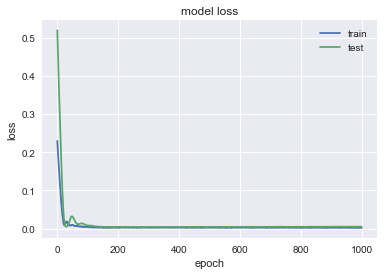

                KO
MSE        4.53643
MAE        1.87219
R2        0.152977
MAPE (%)   3.90008


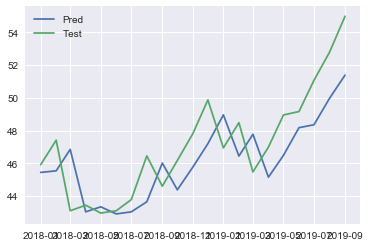

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3323 - val_loss: 0.0433
Epoch 2/1000
0s - loss: 0.3101 - val_loss: 0.0384
Epoch 3/1000
0s - loss: 0.2878 - val_loss: 0.0337
Epoch 4/1000
0s - loss: 0.2671 - val_loss: 0.0293
Epoch 5/1000
0s - loss: 0.2437 - val_loss: 0.0252
Epoch 6/1000
0s - loss: 0.2226 - val_loss: 0.0214
Epoch 7/1000
0s - loss: 0.2046 - val_loss: 0.0180
Epoch 8/1000
0s - loss: 0.1838 - val_loss: 0.0148
Epoch 9/1000
0s - loss: 0.1654 - val_loss: 0.0121
Epoch 10/1000
0s - loss: 0.1467 - val_loss: 0.0098
Epoch 11/1000
0s - loss: 0.1302 - val_loss: 0.0080
Epoch 12/1000
0s - loss: 0.1142 - val_loss: 0.0067
Epoch 13/1000
0s - loss: 0.0965 - val_loss: 0.0060
Epoch 14/1000
0s - loss: 0.0831 - val_loss: 0.0059
Epoch 15/1000
0s - loss: 0.0702 - val_loss: 0.0066
Epoch 16/1000
0s - loss: 0.0571 - val_loss: 0.0080
Epoch 17/1000
0s - loss: 0.0446 - val_loss: 0.0103
Epoch 18/1000
0s - loss: 0.0361 - val_loss: 0.0133
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0072 - val_loss: 0.0048
Epoch 163/1000
0s - loss: 0.0085 - val_loss: 0.0048
Epoch 164/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 165/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 166/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 167/1000
0s - loss: 0.0080 - val_loss: 0.0047
Epoch 168/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 169/1000
0s - loss: 0.0084 - val_loss: 0.0047
Epoch 170/1000
0s - loss: 0.0080 - val_loss: 0.0047
Epoch 171/1000
0s - loss: 0.0078 - val_loss: 0.0047
Epoch 172/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 173/1000
0s - loss: 0.0079 - val_loss: 0.0047
Epoch 174/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 175/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 176/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 177/1000
0s - loss: 0.0078 - val_loss: 0.0047
Epoch 178/1000
0s - loss: 0.0072 - val_loss: 0.0048
Epoch 179/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 180/1000
0s - loss: 0.0080 - val_loss: 0.0048
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0048
Epoch 323/1000
0s - loss: 0.0075 - val_loss: 0.0048
Epoch 324/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 325/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 326/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 327/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 328/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 329/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 330/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 331/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 332/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 333/1000
0s - loss: 0.0083 - val_loss: 0.0046
Epoch 334/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 335/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 336/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 337/1000
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 338/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 339/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 340/1000
0s - loss: 0.0066 - val_loss: 0.0048
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0069 - val_loss: 0.0047
Epoch 482/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 483/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 484/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 485/1000
0s - loss: 0.0078 - val_loss: 0.0046
Epoch 486/1000
0s - loss: 0.0060 - val_loss: 0.0046
Epoch 487/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 488/1000
0s - loss: 0.0074 - val_loss: 0.0045
Epoch 489/1000
0s - loss: 0.0074 - val_loss: 0.0045
Epoch 490/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 491/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 492/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 493/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 494/1000
0s - loss: 0.0079 - val_loss: 0.0048
Epoch 495/1000
0s - loss: 0.0073 - val_loss: 0.0049
Epoch 496/1000
0s - loss: 0.0073 - val_loss: 0.0049
Epoch 497/1000
0s - loss: 0.0076 - val_loss: 0.0049
Epoch 498/1000
0s - loss: 0.0072 - val_loss: 0.0049
Epoch 499/1000
0s - loss: 0.0076 - val_loss: 0.0049
Epoch 500/1000
0s - loss: 0

0s - loss: 0.0071 - val_loss: 0.0047
Epoch 642/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 643/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 644/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 645/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 646/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 647/1000
0s - loss: 0.0079 - val_loss: 0.0047
Epoch 648/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 649/1000
0s - loss: 0.0075 - val_loss: 0.0047
Epoch 650/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 651/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 652/1000
0s - loss: 0.0068 - val_loss: 0.0045
Epoch 653/1000
0s - loss: 0.0079 - val_loss: 0.0045
Epoch 654/1000
0s - loss: 0.0081 - val_loss: 0.0045
Epoch 655/1000
0s - loss: 0.0064 - val_loss: 0.0045
Epoch 656/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 657/1000
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 658/1000
0s - loss: 0.0073 - val_loss: 0.0045
Epoch 659/1000
0s - loss: 0.0071 - val_loss: 0.0045
Epoch 660/1000
0s - loss: 0

0s - loss: 0.0071 - val_loss: 0.0047
Epoch 801/1000
0s - loss: 0.0080 - val_loss: 0.0046
Epoch 802/1000
0s - loss: 0.0079 - val_loss: 0.0046
Epoch 803/1000
0s - loss: 0.0080 - val_loss: 0.0046
Epoch 804/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 805/1000
0s - loss: 0.0079 - val_loss: 0.0046
Epoch 806/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 807/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 808/1000
0s - loss: 0.0065 - val_loss: 0.0047
Epoch 809/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 810/1000
0s - loss: 0.0074 - val_loss: 0.0047
Epoch 811/1000
0s - loss: 0.0075 - val_loss: 0.0047
Epoch 812/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 813/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 814/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 815/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 816/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 817/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 818/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 819/1000
0s - loss: 0

0s - loss: 0.0069 - val_loss: 0.0047
Epoch 977/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 978/1000
0s - loss: 0.0079 - val_loss: 0.0047
Epoch 979/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 980/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 981/1000
0s - loss: 0.0074 - val_loss: 0.0047
Epoch 982/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 983/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 984/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 985/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 986/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 987/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 988/1000
0s - loss: 0.0069 - val_loss: 0.0048
Epoch 989/1000
0s - loss: 0.0067 - val_loss: 0.0048
Epoch 990/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 991/1000
0s - loss: 0.0063 - val_loss: 0.0048
Epoch 992/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 993/1000
0s - loss: 0.0065 - val_loss: 0.0047
Epoch 994/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 995/1000
0s - loss: 0

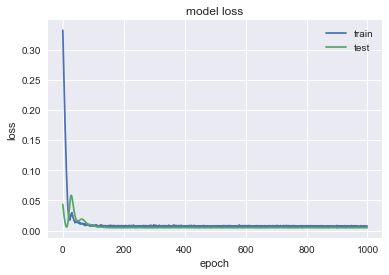

               FTI
MSE        8.56427
MAE        2.26325
R2        0.439984
MAPE (%)   8.97952


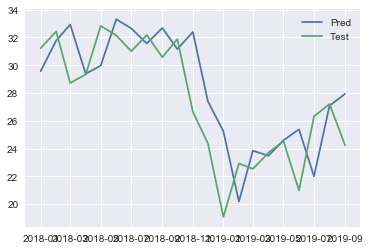

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1540 - val_loss: 0.6070
Epoch 2/1000
0s - loss: 0.1430 - val_loss: 0.5701
Epoch 3/1000
0s - loss: 0.1333 - val_loss: 0.5342
Epoch 4/1000
0s - loss: 0.1224 - val_loss: 0.4991
Epoch 5/1000
0s - loss: 0.1127 - val_loss: 0.4648
Epoch 6/1000
0s - loss: 0.1034 - val_loss: 0.4311
Epoch 7/1000
0s - loss: 0.0938 - val_loss: 0.3981
Epoch 8/1000
0s - loss: 0.0844 - val_loss: 0.3656
Epoch 9/1000
0s - loss: 0.0767 - val_loss: 0.3337
Epoch 10/1000
0s - loss: 0.0689 - val_loss: 0.3024
Epoch 11/1000
0s - loss: 0.0610 - val_loss: 0.2719
Epoch 12/1000
0s - loss: 0.0541 - val_loss: 0.2422
Epoch 13/1000
0s - loss: 0.0463 - val_loss: 0.2135
Epoch 14/1000
0s - loss: 0.0402 - val_loss: 0.1860
Epoch 15/1000
0s - loss: 0.0342 - val_loss: 0.1599
Epoch 16/1000
0s - loss: 0.0281 - val_loss: 0.1353
Epoch 17/1000
0s - loss: 0.0243 - val_loss: 0.1127
Epoch 18/1000
0s - loss: 0.0214 - val_loss: 0.0921
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0021 - val_loss: 0.0098
Epoch 176/1000
0s - loss: 0.0023 - val_loss: 0.0097
Epoch 177/1000
0s - loss: 0.0020 - val_loss: 0.0097
Epoch 178/1000
0s - loss: 0.0026 - val_loss: 0.0097
Epoch 179/1000
0s - loss: 0.0026 - val_loss: 0.0098
Epoch 180/1000
0s - loss: 0.0020 - val_loss: 0.0098
Epoch 181/1000
0s - loss: 0.0026 - val_loss: 0.0098
Epoch 182/1000
0s - loss: 0.0021 - val_loss: 0.0099
Epoch 183/1000
0s - loss: 0.0019 - val_loss: 0.0100
Epoch 184/1000
0s - loss: 0.0025 - val_loss: 0.0101
Epoch 185/1000
0s - loss: 0.0016 - val_loss: 0.0102
Epoch 186/1000
0s - loss: 0.0022 - val_loss: 0.0103
Epoch 187/1000
0s - loss: 0.0023 - val_loss: 0.0103
Epoch 188/1000
0s - loss: 0.0023 - val_loss: 0.0105
Epoch 189/1000
0s - loss: 0.0025 - val_loss: 0.0104
Epoch 190/1000
0s - loss: 0.0023 - val_loss: 0.0104
Epoch 191/1000
0s - loss: 0.0021 - val_loss: 0.0103
Epoch 192/1000
0s - loss: 0.0018 - val_loss: 0.0102
Epoch 193/1000
0s - loss: 0.0024 - val_loss: 0.0101
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0097
Epoch 346/1000
0s - loss: 0.0022 - val_loss: 0.0096
Epoch 347/1000
0s - loss: 0.0020 - val_loss: 0.0094
Epoch 348/1000
0s - loss: 0.0024 - val_loss: 0.0095
Epoch 349/1000
0s - loss: 0.0020 - val_loss: 0.0096
Epoch 350/1000
0s - loss: 0.0020 - val_loss: 0.0097
Epoch 351/1000
0s - loss: 0.0021 - val_loss: 0.0098
Epoch 352/1000
0s - loss: 0.0023 - val_loss: 0.0098
Epoch 353/1000
0s - loss: 0.0021 - val_loss: 0.0097
Epoch 354/1000
0s - loss: 0.0021 - val_loss: 0.0097
Epoch 355/1000
0s - loss: 0.0021 - val_loss: 0.0098
Epoch 356/1000
0s - loss: 0.0021 - val_loss: 0.0099
Epoch 357/1000
0s - loss: 0.0019 - val_loss: 0.0099
Epoch 358/1000
0s - loss: 0.0023 - val_loss: 0.0099
Epoch 359/1000
0s - loss: 0.0020 - val_loss: 0.0099
Epoch 360/1000
0s - loss: 0.0019 - val_loss: 0.0099
Epoch 361/1000
0s - loss: 0.0022 - val_loss: 0.0099
Epoch 362/1000
0s - loss: 0.0024 - val_loss: 0.0098
Epoch 363/1000
0s - loss: 0.0024 - val_loss: 0.0097
Epoch 364/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0097
Epoch 518/1000
0s - loss: 0.0019 - val_loss: 0.0097
Epoch 519/1000
0s - loss: 0.0022 - val_loss: 0.0096
Epoch 520/1000
0s - loss: 0.0022 - val_loss: 0.0096
Epoch 521/1000
0s - loss: 0.0024 - val_loss: 0.0097
Epoch 522/1000
0s - loss: 0.0020 - val_loss: 0.0096
Epoch 523/1000
0s - loss: 0.0019 - val_loss: 0.0095
Epoch 524/1000
0s - loss: 0.0020 - val_loss: 0.0094
Epoch 525/1000
0s - loss: 0.0025 - val_loss: 0.0093
Epoch 526/1000
0s - loss: 0.0024 - val_loss: 0.0094
Epoch 527/1000
0s - loss: 0.0023 - val_loss: 0.0094
Epoch 528/1000
0s - loss: 0.0023 - val_loss: 0.0095
Epoch 529/1000
0s - loss: 0.0021 - val_loss: 0.0095
Epoch 530/1000
0s - loss: 0.0026 - val_loss: 0.0096
Epoch 531/1000
0s - loss: 0.0022 - val_loss: 0.0098
Epoch 532/1000
0s - loss: 0.0025 - val_loss: 0.0100
Epoch 533/1000
0s - loss: 0.0019 - val_loss: 0.0102
Epoch 534/1000
0s - loss: 0.0020 - val_loss: 0.0103
Epoch 535/1000
0s - loss: 0.0025 - val_loss: 0.0104
Epoch 536/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0096
Epoch 689/1000
0s - loss: 0.0019 - val_loss: 0.0097
Epoch 690/1000
0s - loss: 0.0020 - val_loss: 0.0098
Epoch 691/1000
0s - loss: 0.0021 - val_loss: 0.0100
Epoch 692/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 693/1000
0s - loss: 0.0021 - val_loss: 0.0101
Epoch 694/1000
0s - loss: 0.0018 - val_loss: 0.0102
Epoch 695/1000
0s - loss: 0.0023 - val_loss: 0.0102
Epoch 696/1000
0s - loss: 0.0023 - val_loss: 0.0103
Epoch 697/1000
0s - loss: 0.0022 - val_loss: 0.0103
Epoch 698/1000
0s - loss: 0.0021 - val_loss: 0.0102
Epoch 699/1000
0s - loss: 0.0022 - val_loss: 0.0100
Epoch 700/1000
0s - loss: 0.0021 - val_loss: 0.0098
Epoch 701/1000
0s - loss: 0.0020 - val_loss: 0.0097
Epoch 702/1000
0s - loss: 0.0025 - val_loss: 0.0094
Epoch 703/1000
0s - loss: 0.0022 - val_loss: 0.0093
Epoch 704/1000
0s - loss: 0.0022 - val_loss: 0.0093
Epoch 705/1000
0s - loss: 0.0024 - val_loss: 0.0095
Epoch 706/1000
0s - loss: 0.0024 - val_loss: 0.0098
Epoch 707/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0097
Epoch 861/1000
0s - loss: 0.0019 - val_loss: 0.0098
Epoch 862/1000
0s - loss: 0.0024 - val_loss: 0.0098
Epoch 863/1000
0s - loss: 0.0022 - val_loss: 0.0099
Epoch 864/1000
0s - loss: 0.0019 - val_loss: 0.0100
Epoch 865/1000
0s - loss: 0.0021 - val_loss: 0.0102
Epoch 866/1000
0s - loss: 0.0024 - val_loss: 0.0102
Epoch 867/1000
0s - loss: 0.0020 - val_loss: 0.0101
Epoch 868/1000
0s - loss: 0.0023 - val_loss: 0.0099
Epoch 869/1000
0s - loss: 0.0022 - val_loss: 0.0097
Epoch 870/1000
0s - loss: 0.0019 - val_loss: 0.0097
Epoch 871/1000
0s - loss: 0.0022 - val_loss: 0.0095
Epoch 872/1000
0s - loss: 0.0020 - val_loss: 0.0096
Epoch 873/1000
0s - loss: 0.0022 - val_loss: 0.0096
Epoch 874/1000
0s - loss: 0.0018 - val_loss: 0.0098
Epoch 875/1000
0s - loss: 0.0020 - val_loss: 0.0099
Epoch 876/1000
0s - loss: 0.0021 - val_loss: 0.0101
Epoch 877/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 878/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 879/1000
0s - loss: 0

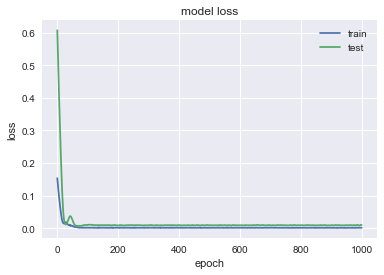

               BLK
MSE        1770.59
MAE        35.6119
R2        0.361353
MAPE (%)   7.82327


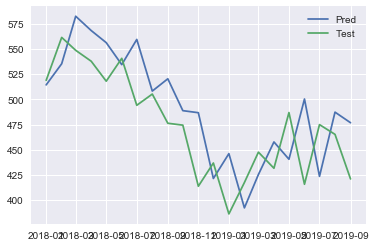

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3334 - val_loss: 0.3592
Epoch 2/1000
0s - loss: 0.3107 - val_loss: 0.3335
Epoch 3/1000
0s - loss: 0.2894 - val_loss: 0.3086
Epoch 4/1000
0s - loss: 0.2676 - val_loss: 0.2845
Epoch 5/1000
0s - loss: 0.2459 - val_loss: 0.2610
Epoch 6/1000
0s - loss: 0.2261 - val_loss: 0.2382
Epoch 7/1000
0s - loss: 0.2079 - val_loss: 0.2160
Epoch 8/1000
0s - loss: 0.1893 - val_loss: 0.1943
Epoch 9/1000
0s - loss: 0.1665 - val_loss: 0.1733
Epoch 10/1000
0s - loss: 0.1524 - val_loss: 0.1530
Epoch 11/1000
0s - loss: 0.1336 - val_loss: 0.1335
Epoch 12/1000
0s - loss: 0.1186 - val_loss: 0.1148
Epoch 13/1000
0s - loss: 0.1006 - val_loss: 0.0972
Epoch 14/1000
0s - loss: 0.0854 - val_loss: 0.0808
Epoch 15/1000
0s - loss: 0.0749 - val_loss: 0.0657
Epoch 16/1000
0s - loss: 0.0584 - val_loss: 0.0522
Epoch 17/1000
0s - loss: 0.0495 - val_loss: 0.0405
Epoch 18/1000
0s - loss: 0.0381 - val_loss: 0.0307
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0043 - val_loss: 0.0141
Epoch 172/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 173/1000
0s - loss: 0.0046 - val_loss: 0.0141
Epoch 174/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 175/1000
0s - loss: 0.0052 - val_loss: 0.0140
Epoch 176/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 177/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 178/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 179/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 180/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 181/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 182/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 183/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 184/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 185/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 186/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 187/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 188/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 189/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 190/1000
0s - loss: 0

0s - loss: 0.0050 - val_loss: 0.0140
Epoch 343/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 344/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 345/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 346/1000
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 347/1000
0s - loss: 0.0046 - val_loss: 0.0141
Epoch 348/1000
0s - loss: 0.0051 - val_loss: 0.0141
Epoch 349/1000
0s - loss: 0.0048 - val_loss: 0.0141
Epoch 350/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 351/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 352/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 353/1000
0s - loss: 0.0049 - val_loss: 0.0140
Epoch 354/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 355/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 356/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 357/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 358/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 359/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 360/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 361/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0141
Epoch 512/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 513/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 514/1000
0s - loss: 0.0053 - val_loss: 0.0140
Epoch 515/1000
0s - loss: 0.0047 - val_loss: 0.0140
Epoch 516/1000
0s - loss: 0.0045 - val_loss: 0.0139
Epoch 517/1000
0s - loss: 0.0032 - val_loss: 0.0139
Epoch 518/1000
0s - loss: 0.0042 - val_loss: 0.0139
Epoch 519/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 520/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 521/1000
0s - loss: 0.0050 - val_loss: 0.0140
Epoch 522/1000
0s - loss: 0.0044 - val_loss: 0.0141
Epoch 523/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 524/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 525/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 526/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 527/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 528/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 529/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 530/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0139
Epoch 674/1000
0s - loss: 0.0042 - val_loss: 0.0139
Epoch 675/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 676/1000
0s - loss: 0.0043 - val_loss: 0.0139
Epoch 677/1000
0s - loss: 0.0048 - val_loss: 0.0139
Epoch 678/1000
0s - loss: 0.0045 - val_loss: 0.0139
Epoch 679/1000
0s - loss: 0.0047 - val_loss: 0.0140
Epoch 680/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 681/1000
0s - loss: 0.0046 - val_loss: 0.0140
Epoch 682/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 683/1000
0s - loss: 0.0050 - val_loss: 0.0141
Epoch 684/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 685/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 686/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 687/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 688/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 689/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 690/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 691/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 692/1000
0s - loss: 0

0s - loss: 0.0037 - val_loss: 0.0140
Epoch 838/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 839/1000
0s - loss: 0.0044 - val_loss: 0.0139
Epoch 840/1000
0s - loss: 0.0036 - val_loss: 0.0139
Epoch 841/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 842/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 843/1000
0s - loss: 0.0044 - val_loss: 0.0139
Epoch 844/1000
0s - loss: 0.0041 - val_loss: 0.0139
Epoch 845/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 846/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 847/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 848/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 849/1000
0s - loss: 0.0043 - val_loss: 0.0142
Epoch 850/1000
0s - loss: 0.0048 - val_loss: 0.0142
Epoch 851/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 852/1000
0s - loss: 0.0045 - val_loss: 0.0141
Epoch 853/1000
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 854/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 855/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 856/1000
0s - loss: 0

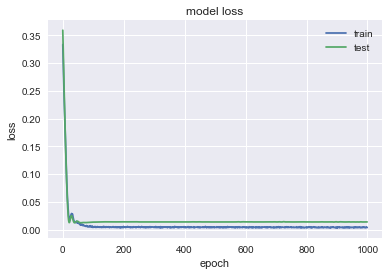

               DVA
MSE         42.009
MAE        4.82588
R2        0.309013
MAPE (%)   8.22494


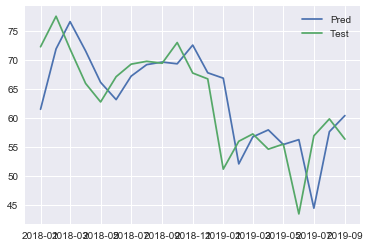

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0399 - val_loss: 0.5674
Epoch 2/1000
0s - loss: 0.0355 - val_loss: 0.5290
Epoch 3/1000
0s - loss: 0.0317 - val_loss: 0.4921
Epoch 4/1000
0s - loss: 0.0283 - val_loss: 0.4566
Epoch 5/1000
0s - loss: 0.0248 - val_loss: 0.4222
Epoch 6/1000
0s - loss: 0.0219 - val_loss: 0.3889
Epoch 7/1000
0s - loss: 0.0190 - val_loss: 0.3567
Epoch 8/1000
0s - loss: 0.0166 - val_loss: 0.3256
Epoch 9/1000
0s - loss: 0.0140 - val_loss: 0.2957
Epoch 10/1000
0s - loss: 0.0125 - val_loss: 0.2669
Epoch 11/1000
0s - loss: 0.0108 - val_loss: 0.2395
Epoch 12/1000
0s - loss: 0.0094 - val_loss: 0.2137
Epoch 13/1000
0s - loss: 0.0089 - val_loss: 0.1896
Epoch 14/1000
0s - loss: 0.0084 - val_loss: 0.1677
Epoch 15/1000
0s - loss: 0.0076 - val_loss: 0.1483
Epoch 16/1000
0s - loss: 0.0076 - val_loss: 0.1315
Epoch 17/1000
0s - loss: 0.0081 - val_loss: 0.1176
Epoch 18/1000
0s - loss: 0.0081 - val_loss: 0.1066
Epoch 19/1000
0s - loss: 0.0

0s - loss: 5.2390e-04 - val_loss: 0.0121
Epoch 159/1000
0s - loss: 4.8814e-04 - val_loss: 0.0120
Epoch 160/1000
0s - loss: 3.9637e-04 - val_loss: 0.0120
Epoch 161/1000
0s - loss: 4.7680e-04 - val_loss: 0.0120
Epoch 162/1000
0s - loss: 5.0336e-04 - val_loss: 0.0119
Epoch 163/1000
0s - loss: 5.4533e-04 - val_loss: 0.0117
Epoch 164/1000
0s - loss: 5.7060e-04 - val_loss: 0.0116
Epoch 165/1000
0s - loss: 4.1159e-04 - val_loss: 0.0115
Epoch 166/1000
0s - loss: 5.4975e-04 - val_loss: 0.0115
Epoch 167/1000
0s - loss: 5.7988e-04 - val_loss: 0.0116
Epoch 168/1000
0s - loss: 5.8101e-04 - val_loss: 0.0117
Epoch 169/1000
0s - loss: 6.0855e-04 - val_loss: 0.0117
Epoch 170/1000
0s - loss: 4.9177e-04 - val_loss: 0.0117
Epoch 171/1000
0s - loss: 5.2203e-04 - val_loss: 0.0116
Epoch 172/1000
0s - loss: 5.8295e-04 - val_loss: 0.0116
Epoch 173/1000
0s - loss: 5.5223e-04 - val_loss: 0.0116
Epoch 174/1000
0s - loss: 5.7167e-04 - val_loss: 0.0115
Epoch 175/1000
0s - loss: 6.5942e-04 - val_loss: 0.0115
Epoch 1

0s - loss: 4.3200e-04 - val_loss: 0.0119
Epoch 314/1000
0s - loss: 4.5994e-04 - val_loss: 0.0118
Epoch 315/1000
0s - loss: 5.7215e-04 - val_loss: 0.0118
Epoch 316/1000
0s - loss: 5.5704e-04 - val_loss: 0.0117
Epoch 317/1000
0s - loss: 5.4830e-04 - val_loss: 0.0118
Epoch 318/1000
0s - loss: 4.8549e-04 - val_loss: 0.0118
Epoch 319/1000
0s - loss: 4.3017e-04 - val_loss: 0.0118
Epoch 320/1000
0s - loss: 8.0739e-04 - val_loss: 0.0119
Epoch 321/1000
0s - loss: 4.0665e-04 - val_loss: 0.0121
Epoch 322/1000
0s - loss: 4.5139e-04 - val_loss: 0.0121
Epoch 323/1000
0s - loss: 6.5286e-04 - val_loss: 0.0122
Epoch 324/1000
0s - loss: 5.3999e-04 - val_loss: 0.0123
Epoch 325/1000
0s - loss: 5.2134e-04 - val_loss: 0.0123
Epoch 326/1000
0s - loss: 5.1462e-04 - val_loss: 0.0123
Epoch 327/1000
0s - loss: 6.0707e-04 - val_loss: 0.0122
Epoch 328/1000
0s - loss: 5.1941e-04 - val_loss: 0.0120
Epoch 329/1000
0s - loss: 4.8263e-04 - val_loss: 0.0118
Epoch 330/1000
0s - loss: 5.1505e-04 - val_loss: 0.0115
Epoch 3

0s - loss: 4.3505e-04 - val_loss: 0.0127
Epoch 468/1000
0s - loss: 5.1883e-04 - val_loss: 0.0126
Epoch 469/1000
0s - loss: 5.5116e-04 - val_loss: 0.0127
Epoch 470/1000
0s - loss: 6.0173e-04 - val_loss: 0.0128
Epoch 471/1000
0s - loss: 4.8679e-04 - val_loss: 0.0129
Epoch 472/1000
0s - loss: 4.4812e-04 - val_loss: 0.0131
Epoch 473/1000
0s - loss: 5.5059e-04 - val_loss: 0.0130
Epoch 474/1000
0s - loss: 4.5327e-04 - val_loss: 0.0131
Epoch 475/1000
0s - loss: 5.8455e-04 - val_loss: 0.0132
Epoch 476/1000
0s - loss: 5.5334e-04 - val_loss: 0.0133
Epoch 477/1000
0s - loss: 5.4831e-04 - val_loss: 0.0135
Epoch 478/1000
0s - loss: 5.3314e-04 - val_loss: 0.0135
Epoch 479/1000
0s - loss: 3.8667e-04 - val_loss: 0.0135
Epoch 480/1000
0s - loss: 4.9347e-04 - val_loss: 0.0135
Epoch 481/1000
0s - loss: 4.5702e-04 - val_loss: 0.0134
Epoch 482/1000
0s - loss: 5.0158e-04 - val_loss: 0.0134
Epoch 483/1000
0s - loss: 4.9649e-04 - val_loss: 0.0131
Epoch 484/1000
0s - loss: 4.0810e-04 - val_loss: 0.0128
Epoch 4

0s - loss: 4.5365e-04 - val_loss: 0.0123
Epoch 620/1000
0s - loss: 3.8494e-04 - val_loss: 0.0121
Epoch 621/1000
0s - loss: 4.9850e-04 - val_loss: 0.0123
Epoch 622/1000
0s - loss: 5.0245e-04 - val_loss: 0.0126
Epoch 623/1000
0s - loss: 5.5125e-04 - val_loss: 0.0129
Epoch 624/1000
0s - loss: 4.6779e-04 - val_loss: 0.0130
Epoch 625/1000
0s - loss: 5.1115e-04 - val_loss: 0.0130
Epoch 626/1000
0s - loss: 4.6300e-04 - val_loss: 0.0128
Epoch 627/1000
0s - loss: 3.7300e-04 - val_loss: 0.0127
Epoch 628/1000
0s - loss: 5.5713e-04 - val_loss: 0.0126
Epoch 629/1000
0s - loss: 4.8628e-04 - val_loss: 0.0125
Epoch 630/1000
0s - loss: 4.6988e-04 - val_loss: 0.0126
Epoch 631/1000
0s - loss: 5.7282e-04 - val_loss: 0.0129
Epoch 632/1000
0s - loss: 5.0438e-04 - val_loss: 0.0134
Epoch 633/1000
0s - loss: 4.7985e-04 - val_loss: 0.0135
Epoch 634/1000
0s - loss: 4.2888e-04 - val_loss: 0.0137
Epoch 635/1000
0s - loss: 3.8230e-04 - val_loss: 0.0137
Epoch 636/1000
0s - loss: 5.2402e-04 - val_loss: 0.0136
Epoch 6

0s - loss: 5.0394e-04 - val_loss: 0.0153
Epoch 775/1000
0s - loss: 4.2753e-04 - val_loss: 0.0152
Epoch 776/1000
0s - loss: 4.1791e-04 - val_loss: 0.0149
Epoch 777/1000
0s - loss: 3.7475e-04 - val_loss: 0.0148
Epoch 778/1000
0s - loss: 5.4905e-04 - val_loss: 0.0148
Epoch 779/1000
0s - loss: 5.7055e-04 - val_loss: 0.0142
Epoch 780/1000
0s - loss: 5.2338e-04 - val_loss: 0.0137
Epoch 781/1000
0s - loss: 4.3124e-04 - val_loss: 0.0131
Epoch 782/1000
0s - loss: 4.5596e-04 - val_loss: 0.0126
Epoch 783/1000
0s - loss: 4.5042e-04 - val_loss: 0.0124
Epoch 784/1000
0s - loss: 4.9516e-04 - val_loss: 0.0124
Epoch 785/1000
0s - loss: 4.6704e-04 - val_loss: 0.0125
Epoch 786/1000
0s - loss: 5.9668e-04 - val_loss: 0.0128
Epoch 787/1000
0s - loss: 4.9492e-04 - val_loss: 0.0131
Epoch 788/1000
0s - loss: 4.7468e-04 - val_loss: 0.0133
Epoch 789/1000
0s - loss: 4.9421e-04 - val_loss: 0.0131
Epoch 790/1000
0s - loss: 5.0226e-04 - val_loss: 0.0128
Epoch 791/1000
0s - loss: 4.7196e-04 - val_loss: 0.0127
Epoch 7

0s - loss: 4.4931e-04 - val_loss: 0.0140
Epoch 934/1000
0s - loss: 4.8409e-04 - val_loss: 0.0138
Epoch 935/1000
0s - loss: 5.4154e-04 - val_loss: 0.0138
Epoch 936/1000
0s - loss: 5.0099e-04 - val_loss: 0.0136
Epoch 937/1000
0s - loss: 4.2179e-04 - val_loss: 0.0135
Epoch 938/1000
0s - loss: 5.7039e-04 - val_loss: 0.0133
Epoch 939/1000
0s - loss: 5.0218e-04 - val_loss: 0.0135
Epoch 940/1000
0s - loss: 4.6984e-04 - val_loss: 0.0138
Epoch 941/1000
0s - loss: 4.7429e-04 - val_loss: 0.0142
Epoch 942/1000
0s - loss: 4.8087e-04 - val_loss: 0.0142
Epoch 943/1000
0s - loss: 4.4163e-04 - val_loss: 0.0144
Epoch 944/1000
0s - loss: 5.4476e-04 - val_loss: 0.0141
Epoch 945/1000
0s - loss: 4.7733e-04 - val_loss: 0.0138
Epoch 946/1000
0s - loss: 5.6713e-04 - val_loss: 0.0137
Epoch 947/1000
0s - loss: 4.0020e-04 - val_loss: 0.0136
Epoch 948/1000
0s - loss: 4.3943e-04 - val_loss: 0.0135
Epoch 949/1000
0s - loss: 6.2690e-04 - val_loss: 0.0136
Epoch 950/1000
0s - loss: 4.7374e-04 - val_loss: 0.0138
Epoch 9

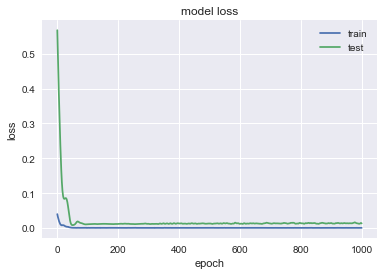

                BA
MSE        2022.15
MAE        35.4505
R2       -0.217936
MAPE (%)    10.058


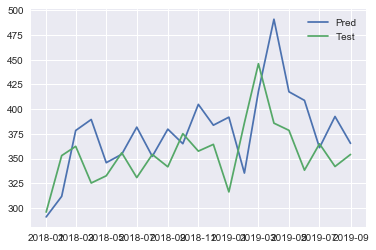

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3578 - val_loss: 0.0855
Epoch 2/1000
0s - loss: 0.3317 - val_loss: 0.0768
Epoch 3/1000
0s - loss: 0.3053 - val_loss: 0.0686
Epoch 4/1000
0s - loss: 0.2817 - val_loss: 0.0608
Epoch 5/1000
0s - loss: 0.2580 - val_loss: 0.0535
Epoch 6/1000
0s - loss: 0.2343 - val_loss: 0.0467
Epoch 7/1000
0s - loss: 0.2099 - val_loss: 0.0403
Epoch 8/1000
0s - loss: 0.1903 - val_loss: 0.0344
Epoch 9/1000
0s - loss: 0.1664 - val_loss: 0.0290
Epoch 10/1000
0s - loss: 0.1497 - val_loss: 0.0242
Epoch 11/1000
0s - loss: 0.1281 - val_loss: 0.0201
Epoch 12/1000
0s - loss: 0.1130 - val_loss: 0.0166
Epoch 13/1000
0s - loss: 0.0942 - val_loss: 0.0139
Epoch 14/1000
0s - loss: 0.0782 - val_loss: 0.0121
Epoch 15/1000
0s - loss: 0.0631 - val_loss: 0.0111
Epoch 16/1000
0s - loss: 0.0523 - val_loss: 0.0112
Epoch 17/1000
0s - loss: 0.0389 - val_loss: 0.0123
Epoch 18/1000
0s - loss: 0.0308 - val_loss: 0.0144
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0071 - val_loss: 0.0138
Epoch 176/1000
0s - loss: 0.0070 - val_loss: 0.0138
Epoch 177/1000
0s - loss: 0.0071 - val_loss: 0.0138
Epoch 178/1000
0s - loss: 0.0077 - val_loss: 0.0137
Epoch 179/1000
0s - loss: 0.0069 - val_loss: 0.0137
Epoch 180/1000
0s - loss: 0.0073 - val_loss: 0.0137
Epoch 181/1000
0s - loss: 0.0070 - val_loss: 0.0137
Epoch 182/1000
0s - loss: 0.0079 - val_loss: 0.0137
Epoch 183/1000
0s - loss: 0.0070 - val_loss: 0.0137
Epoch 184/1000
0s - loss: 0.0064 - val_loss: 0.0138
Epoch 185/1000
0s - loss: 0.0071 - val_loss: 0.0138
Epoch 186/1000
0s - loss: 0.0074 - val_loss: 0.0139
Epoch 187/1000
0s - loss: 0.0070 - val_loss: 0.0139
Epoch 188/1000
0s - loss: 0.0068 - val_loss: 0.0139
Epoch 189/1000
0s - loss: 0.0077 - val_loss: 0.0140
Epoch 190/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 191/1000
0s - loss: 0.0075 - val_loss: 0.0140
Epoch 192/1000
0s - loss: 0.0059 - val_loss: 0.0140
Epoch 193/1000
0s - loss: 0.0085 - val_loss: 0.0140
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0138
Epoch 334/1000
0s - loss: 0.0065 - val_loss: 0.0138
Epoch 335/1000
0s - loss: 0.0076 - val_loss: 0.0138
Epoch 336/1000
0s - loss: 0.0068 - val_loss: 0.0138
Epoch 337/1000
0s - loss: 0.0073 - val_loss: 0.0138
Epoch 338/1000
0s - loss: 0.0064 - val_loss: 0.0138
Epoch 339/1000
0s - loss: 0.0073 - val_loss: 0.0138
Epoch 340/1000
0s - loss: 0.0051 - val_loss: 0.0138
Epoch 341/1000
0s - loss: 0.0064 - val_loss: 0.0138
Epoch 342/1000
0s - loss: 0.0065 - val_loss: 0.0138
Epoch 343/1000
0s - loss: 0.0084 - val_loss: 0.0138
Epoch 344/1000
0s - loss: 0.0071 - val_loss: 0.0138
Epoch 345/1000
0s - loss: 0.0069 - val_loss: 0.0138
Epoch 346/1000
0s - loss: 0.0072 - val_loss: 0.0138
Epoch 347/1000
0s - loss: 0.0071 - val_loss: 0.0138
Epoch 348/1000
0s - loss: 0.0078 - val_loss: 0.0138
Epoch 349/1000
0s - loss: 0.0090 - val_loss: 0.0138
Epoch 350/1000
0s - loss: 0.0077 - val_loss: 0.0139
Epoch 351/1000
0s - loss: 0.0073 - val_loss: 0.0140
Epoch 352/1000
0s - loss: 0

0s - loss: 0.0075 - val_loss: 0.0143
Epoch 510/1000
0s - loss: 0.0066 - val_loss: 0.0143
Epoch 511/1000
0s - loss: 0.0073 - val_loss: 0.0143
Epoch 512/1000
0s - loss: 0.0065 - val_loss: 0.0143
Epoch 513/1000
0s - loss: 0.0080 - val_loss: 0.0142
Epoch 514/1000
0s - loss: 0.0068 - val_loss: 0.0142
Epoch 515/1000
0s - loss: 0.0075 - val_loss: 0.0141
Epoch 516/1000
0s - loss: 0.0073 - val_loss: 0.0140
Epoch 517/1000
0s - loss: 0.0072 - val_loss: 0.0140
Epoch 518/1000
0s - loss: 0.0073 - val_loss: 0.0140
Epoch 519/1000
0s - loss: 0.0073 - val_loss: 0.0139
Epoch 520/1000
0s - loss: 0.0067 - val_loss: 0.0139
Epoch 521/1000
0s - loss: 0.0061 - val_loss: 0.0139
Epoch 522/1000
0s - loss: 0.0076 - val_loss: 0.0139
Epoch 523/1000
0s - loss: 0.0067 - val_loss: 0.0138
Epoch 524/1000
0s - loss: 0.0075 - val_loss: 0.0138
Epoch 525/1000
0s - loss: 0.0066 - val_loss: 0.0138
Epoch 526/1000
0s - loss: 0.0075 - val_loss: 0.0138
Epoch 527/1000
0s - loss: 0.0069 - val_loss: 0.0139
Epoch 528/1000
0s - loss: 0

0s - loss: 0.0082 - val_loss: 0.0142
Epoch 668/1000
0s - loss: 0.0075 - val_loss: 0.0142
Epoch 669/1000
0s - loss: 0.0064 - val_loss: 0.0142
Epoch 670/1000
0s - loss: 0.0074 - val_loss: 0.0142
Epoch 671/1000
0s - loss: 0.0074 - val_loss: 0.0141
Epoch 672/1000
0s - loss: 0.0070 - val_loss: 0.0141
Epoch 673/1000
0s - loss: 0.0065 - val_loss: 0.0141
Epoch 674/1000
0s - loss: 0.0070 - val_loss: 0.0142
Epoch 675/1000
0s - loss: 0.0072 - val_loss: 0.0142
Epoch 676/1000
0s - loss: 0.0066 - val_loss: 0.0142
Epoch 677/1000
0s - loss: 0.0076 - val_loss: 0.0142
Epoch 678/1000
0s - loss: 0.0069 - val_loss: 0.0142
Epoch 679/1000
0s - loss: 0.0059 - val_loss: 0.0143
Epoch 680/1000
0s - loss: 0.0073 - val_loss: 0.0143
Epoch 681/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 682/1000
0s - loss: 0.0069 - val_loss: 0.0143
Epoch 683/1000
0s - loss: 0.0071 - val_loss: 0.0142
Epoch 684/1000
0s - loss: 0.0064 - val_loss: 0.0142
Epoch 685/1000
0s - loss: 0.0070 - val_loss: 0.0141
Epoch 686/1000
0s - loss: 0

0s - loss: 0.0071 - val_loss: 0.0144
Epoch 843/1000
0s - loss: 0.0056 - val_loss: 0.0144
Epoch 844/1000
0s - loss: 0.0075 - val_loss: 0.0145
Epoch 845/1000
0s - loss: 0.0065 - val_loss: 0.0145
Epoch 846/1000
0s - loss: 0.0067 - val_loss: 0.0146
Epoch 847/1000
0s - loss: 0.0069 - val_loss: 0.0146
Epoch 848/1000
0s - loss: 0.0067 - val_loss: 0.0145
Epoch 849/1000
0s - loss: 0.0068 - val_loss: 0.0145
Epoch 850/1000
0s - loss: 0.0068 - val_loss: 0.0144
Epoch 851/1000
0s - loss: 0.0060 - val_loss: 0.0144
Epoch 852/1000
0s - loss: 0.0067 - val_loss: 0.0144
Epoch 853/1000
0s - loss: 0.0065 - val_loss: 0.0144
Epoch 854/1000
0s - loss: 0.0072 - val_loss: 0.0144
Epoch 855/1000
0s - loss: 0.0077 - val_loss: 0.0143
Epoch 856/1000
0s - loss: 0.0063 - val_loss: 0.0143
Epoch 857/1000
0s - loss: 0.0066 - val_loss: 0.0144
Epoch 858/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 859/1000
0s - loss: 0.0072 - val_loss: 0.0145
Epoch 860/1000
0s - loss: 0.0062 - val_loss: 0.0146
Epoch 861/1000
0s - loss: 0

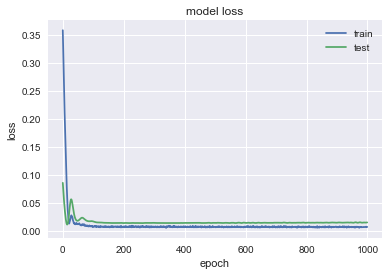

                IBM
MSE         150.778
MAE         8.87766
R2        0.0192636
MAPE (%)    6.75511


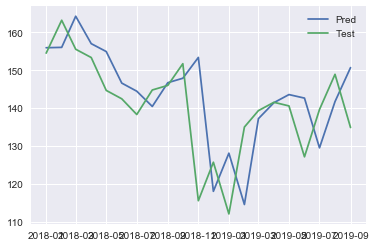

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1370 - val_loss: 0.2896
Epoch 2/1000
0s - loss: 0.1264 - val_loss: 0.2689
Epoch 3/1000
0s - loss: 0.1173 - val_loss: 0.2491
Epoch 4/1000
0s - loss: 0.1088 - val_loss: 0.2300
Epoch 5/1000
0s - loss: 0.0995 - val_loss: 0.2116
Epoch 6/1000
0s - loss: 0.0915 - val_loss: 0.1939
Epoch 7/1000
0s - loss: 0.0831 - val_loss: 0.1767
Epoch 8/1000
0s - loss: 0.0757 - val_loss: 0.1601
Epoch 9/1000
0s - loss: 0.0685 - val_loss: 0.1440
Epoch 10/1000
0s - loss: 0.0622 - val_loss: 0.1285
Epoch 11/1000
0s - loss: 0.0562 - val_loss: 0.1136
Epoch 12/1000
0s - loss: 0.0494 - val_loss: 0.0994
Epoch 13/1000
0s - loss: 0.0431 - val_loss: 0.0859
Epoch 14/1000
0s - loss: 0.0378 - val_loss: 0.0732
Epoch 15/1000
0s - loss: 0.0320 - val_loss: 0.0614
Epoch 16/1000
0s - loss: 0.0287 - val_loss: 0.0507
Epoch 17/1000
0s - loss: 0.0241 - val_loss: 0.0410
Epoch 18/1000
0s - loss: 0.0224 - val_loss: 0.0325
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0031 - val_loss: 0.0086
Epoch 177/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 178/1000
0s - loss: 0.0038 - val_loss: 0.0089
Epoch 179/1000
0s - loss: 0.0035 - val_loss: 0.0091
Epoch 180/1000
0s - loss: 0.0030 - val_loss: 0.0092
Epoch 181/1000
0s - loss: 0.0031 - val_loss: 0.0093
Epoch 182/1000
0s - loss: 0.0036 - val_loss: 0.0094
Epoch 183/1000
0s - loss: 0.0036 - val_loss: 0.0094
Epoch 184/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 185/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 186/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 187/1000
0s - loss: 0.0026 - val_loss: 0.0090
Epoch 188/1000
0s - loss: 0.0032 - val_loss: 0.0090
Epoch 189/1000
0s - loss: 0.0031 - val_loss: 0.0089
Epoch 190/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 191/1000
0s - loss: 0.0027 - val_loss: 0.0087
Epoch 192/1000
0s - loss: 0.0038 - val_loss: 0.0086
Epoch 193/1000
0s - loss: 0.0031 - val_loss: 0.0085
Epoch 194/1000
0s - loss: 0.0025 - val_loss: 0.0085
Epoch 195/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0096
Epoch 353/1000
0s - loss: 0.0029 - val_loss: 0.0096
Epoch 354/1000
0s - loss: 0.0032 - val_loss: 0.0095
Epoch 355/1000
0s - loss: 0.0029 - val_loss: 0.0092
Epoch 356/1000
0s - loss: 0.0031 - val_loss: 0.0089
Epoch 357/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 358/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 359/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 360/1000
0s - loss: 0.0037 - val_loss: 0.0087
Epoch 361/1000
0s - loss: 0.0034 - val_loss: 0.0088
Epoch 362/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 363/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 364/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 365/1000
0s - loss: 0.0025 - val_loss: 0.0088
Epoch 366/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 367/1000
0s - loss: 0.0032 - val_loss: 0.0088
Epoch 368/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 369/1000
0s - loss: 0.0035 - val_loss: 0.0086
Epoch 370/1000
0s - loss: 0.0031 - val_loss: 0.0085
Epoch 371/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0085
Epoch 512/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 513/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 514/1000
0s - loss: 0.0034 - val_loss: 0.0088
Epoch 515/1000
0s - loss: 0.0028 - val_loss: 0.0090
Epoch 516/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 517/1000
0s - loss: 0.0034 - val_loss: 0.0090
Epoch 518/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 519/1000
0s - loss: 0.0026 - val_loss: 0.0088
Epoch 520/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 521/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 522/1000
0s - loss: 0.0034 - val_loss: 0.0083
Epoch 523/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 524/1000
0s - loss: 0.0026 - val_loss: 0.0085
Epoch 525/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 526/1000
0s - loss: 0.0033 - val_loss: 0.0088
Epoch 527/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 528/1000
0s - loss: 0.0036 - val_loss: 0.0090
Epoch 529/1000
0s - loss: 0.0031 - val_loss: 0.0090
Epoch 530/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0088
Epoch 689/1000
0s - loss: 0.0027 - val_loss: 0.0089
Epoch 690/1000
0s - loss: 0.0032 - val_loss: 0.0090
Epoch 691/1000
0s - loss: 0.0028 - val_loss: 0.0090
Epoch 692/1000
0s - loss: 0.0028 - val_loss: 0.0090
Epoch 693/1000
0s - loss: 0.0026 - val_loss: 0.0091
Epoch 694/1000
0s - loss: 0.0025 - val_loss: 0.0091
Epoch 695/1000
0s - loss: 0.0031 - val_loss: 0.0092
Epoch 696/1000
0s - loss: 0.0028 - val_loss: 0.0092
Epoch 697/1000
0s - loss: 0.0029 - val_loss: 0.0092
Epoch 698/1000
0s - loss: 0.0033 - val_loss: 0.0090
Epoch 699/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 700/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 701/1000
0s - loss: 0.0033 - val_loss: 0.0083
Epoch 702/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 703/1000
0s - loss: 0.0030 - val_loss: 0.0081
Epoch 704/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 705/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 706/1000
0s - loss: 0.0029 - val_loss: 0.0090
Epoch 707/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0089
Epoch 847/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 848/1000
0s - loss: 0.0032 - val_loss: 0.0083
Epoch 849/1000
0s - loss: 0.0026 - val_loss: 0.0081
Epoch 850/1000
0s - loss: 0.0035 - val_loss: 0.0081
Epoch 851/1000
0s - loss: 0.0031 - val_loss: 0.0082
Epoch 852/1000
0s - loss: 0.0032 - val_loss: 0.0084
Epoch 853/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 854/1000
0s - loss: 0.0031 - val_loss: 0.0090
Epoch 855/1000
0s - loss: 0.0035 - val_loss: 0.0090
Epoch 856/1000
0s - loss: 0.0028 - val_loss: 0.0090
Epoch 857/1000
0s - loss: 0.0032 - val_loss: 0.0092
Epoch 858/1000
0s - loss: 0.0030 - val_loss: 0.0091
Epoch 859/1000
0s - loss: 0.0029 - val_loss: 0.0090
Epoch 860/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 861/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 862/1000
0s - loss: 0.0025 - val_loss: 0.0089
Epoch 863/1000
0s - loss: 0.0028 - val_loss: 0.0090
Epoch 864/1000
0s - loss: 0.0035 - val_loss: 0.0088
Epoch 865/1000
0s - loss: 0

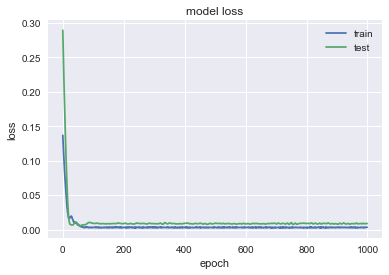

               ALB
MSE        97.0613
MAE        7.59242
R2        0.698884
MAPE (%)   8.99846


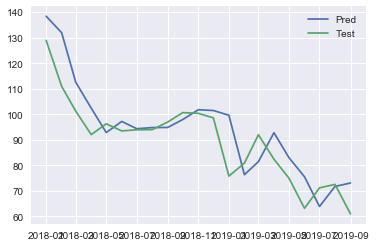

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1549 - val_loss: 0.7115
Epoch 2/1000
0s - loss: 0.1423 - val_loss: 0.6625
Epoch 3/1000
0s - loss: 0.1295 - val_loss: 0.6151
Epoch 4/1000
0s - loss: 0.1174 - val_loss: 0.5690
Epoch 5/1000
0s - loss: 0.1065 - val_loss: 0.5243
Epoch 6/1000
0s - loss: 0.0961 - val_loss: 0.4808
Epoch 7/1000
0s - loss: 0.0849 - val_loss: 0.4386
Epoch 8/1000
0s - loss: 0.0748 - val_loss: 0.3976
Epoch 9/1000
0s - loss: 0.0652 - val_loss: 0.3579
Epoch 10/1000
0s - loss: 0.0567 - val_loss: 0.3196
Epoch 11/1000
0s - loss: 0.0483 - val_loss: 0.2827
Epoch 12/1000
0s - loss: 0.0409 - val_loss: 0.2475
Epoch 13/1000
0s - loss: 0.0348 - val_loss: 0.2141
Epoch 14/1000
0s - loss: 0.0282 - val_loss: 0.1827
Epoch 15/1000
0s - loss: 0.0239 - val_loss: 0.1536
Epoch 16/1000
0s - loss: 0.0195 - val_loss: 0.1271
Epoch 17/1000
0s - loss: 0.0168 - val_loss: 0.1034
Epoch 18/1000
0s - loss: 0.0137 - val_loss: 0.0827
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0069
Epoch 164/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 165/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 166/1000
0s - loss: 0.0029 - val_loss: 0.0069
Epoch 167/1000
0s - loss: 0.0039 - val_loss: 0.0069
Epoch 168/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 169/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 170/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 171/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 172/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 173/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 175/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 176/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 177/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 178/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 179/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 180/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 181/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 182/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0068
Epoch 323/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 324/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 325/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 326/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 327/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 328/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 329/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 330/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 331/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 332/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 333/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 334/1000
0s - loss: 0.0040 - val_loss: 0.0068
Epoch 335/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 336/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 337/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 338/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 339/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 340/1000
0s - loss: 0.0039 - val_loss: 0.0068
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0068
Epoch 483/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 484/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 485/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 486/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 487/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 488/1000
0s - loss: 0.0035 - val_loss: 0.0067
Epoch 489/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 490/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 491/1000
0s - loss: 0.0037 - val_loss: 0.0068
Epoch 492/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 493/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 494/1000
0s - loss: 0.0039 - val_loss: 0.0069
Epoch 495/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 496/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 497/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 498/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 499/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 500/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 501/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0068
Epoch 656/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 657/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 658/1000
0s - loss: 0.0037 - val_loss: 0.0067
Epoch 659/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 660/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 661/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 662/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 663/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 664/1000
0s - loss: 0.0038 - val_loss: 0.0068
Epoch 665/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 666/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 667/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 668/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 669/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 670/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 671/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 672/1000
0s - loss: 0.0038 - val_loss: 0.0067
Epoch 673/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 674/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0069
Epoch 828/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 829/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 830/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 831/1000
0s - loss: 0.0029 - val_loss: 0.0067
Epoch 832/1000
0s - loss: 0.0039 - val_loss: 0.0067
Epoch 833/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 834/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 835/1000
0s - loss: 0.0034 - val_loss: 0.0070
Epoch 836/1000
0s - loss: 0.0034 - val_loss: 0.0070
Epoch 837/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 838/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 839/1000
0s - loss: 0.0036 - val_loss: 0.0069
Epoch 840/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 841/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 842/1000
0s - loss: 0.0037 - val_loss: 0.0067
Epoch 843/1000
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 844/1000
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 845/1000
0s - loss: 0.0034 - val_loss: 0.0066
Epoch 846/1000
0s - loss: 0

0s - loss: 0.0036 - val_loss: 0.0068
Epoch 1000/1000
0s - loss: 0.0035 - val_loss: 0.0068


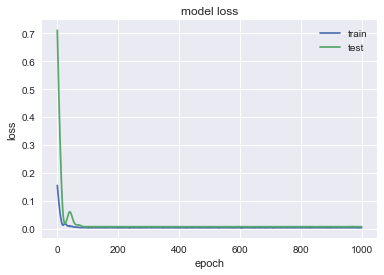

               CBRE
MSE         11.3923
MAE         2.75022
R2        0.0206774
MAPE (%)    5.90106


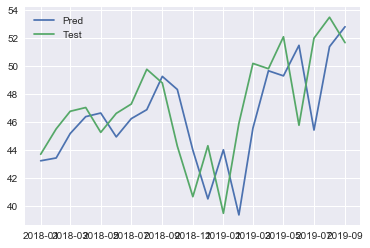

In [133]:
pred_gru_3 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_3[comp] = nn_forec_GRU(df,comp,n_train_time=test.shape[0],first_layer = 128,second_layer=64).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3224 - val_loss: 0.2016
Epoch 2/1000
0s - loss: 0.2831 - val_loss: 0.1726
Epoch 3/1000
0s - loss: 0.2447 - val_loss: 0.1455
Epoch 4/1000
0s - loss: 0.2097 - val_loss: 0.1202
Epoch 5/1000
0s - loss: 0.1765 - val_loss: 0.0967
Epoch 6/1000
0s - loss: 0.1456 - val_loss: 0.0751
Epoch 7/1000
0s - loss: 0.1165 - val_loss: 0.0558
Epoch 8/1000
0s - loss: 0.0883 - val_loss: 0.0390
Epoch 9/1000
0s - loss: 0.0653 - val_loss: 0.0253
Epoch 10/1000
0s - loss: 0.0460 - val_loss: 0.0152
Epoch 11/1000
0s - loss: 0.0309 - val_loss: 0.0091
Epoch 12/1000
0s - loss: 0.0182 - val_loss: 0.0074
Epoch 13/1000
0s - loss: 0.0129 - val_loss: 0.0099
Epoch 14/1000
0s - loss: 0.0115 - val_loss: 0.0159
Epoch 15/1000
0s - loss: 0.0144 - val_loss: 0.0238
Epoch 16/1000
0s - loss: 0.0223 - val_loss: 0.0315
Epoch 17/1000
0s - loss: 0.0280 - val_loss: 0.0371
Epoch 18/1000
0s - loss: 0.0335 - val_loss: 0.0395
Epoch 19/1000
0s - loss: 0.03

0s - loss: 0.0073 - val_loss: 0.0072
Epoch 162/1000
0s - loss: 0.0075 - val_loss: 0.0072
Epoch 163/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 164/1000
0s - loss: 0.0075 - val_loss: 0.0072
Epoch 165/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 166/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 167/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 168/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 169/1000
0s - loss: 0.0075 - val_loss: 0.0073
Epoch 170/1000
0s - loss: 0.0059 - val_loss: 0.0073
Epoch 171/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 172/1000
0s - loss: 0.0069 - val_loss: 0.0073
Epoch 173/1000
0s - loss: 0.0066 - val_loss: 0.0073
Epoch 174/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 175/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 176/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 177/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 178/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 179/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0075 - val_loss: 0.0072
Epoch 328/1000
0s - loss: 0.0074 - val_loss: 0.0072
Epoch 329/1000
0s - loss: 0.0067 - val_loss: 0.0072
Epoch 330/1000
0s - loss: 0.0073 - val_loss: 0.0072
Epoch 331/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 332/1000
0s - loss: 0.0076 - val_loss: 0.0073
Epoch 333/1000
0s - loss: 0.0067 - val_loss: 0.0073
Epoch 334/1000
0s - loss: 0.0064 - val_loss: 0.0073
Epoch 335/1000
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 336/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 337/1000
0s - loss: 0.0072 - val_loss: 0.0074
Epoch 338/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 339/1000
0s - loss: 0.0060 - val_loss: 0.0073
Epoch 340/1000
0s - loss: 0.0068 - val_loss: 0.0073
Epoch 341/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 342/1000
0s - loss: 0.0069 - val_loss: 0.0072
Epoch 343/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 344/1000
0s - loss: 0.0071 - val_loss: 0.0072
Epoch 345/1000
0s - loss: 0.0069 - val_loss: 0.0072
Epoch 346/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0073
Epoch 490/1000
0s - loss: 0.0071 - val_loss: 0.0073
Epoch 491/1000
0s - loss: 0.0068 - val_loss: 0.0073
Epoch 492/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 493/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 494/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 495/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 496/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 497/1000
0s - loss: 0.0080 - val_loss: 0.0074
Epoch 498/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 499/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 500/1000
0s - loss: 0.0064 - val_loss: 0.0073
Epoch 501/1000
0s - loss: 0.0060 - val_loss: 0.0073
Epoch 502/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 503/1000
0s - loss: 0.0073 - val_loss: 0.0073
Epoch 504/1000
0s - loss: 0.0076 - val_loss: 0.0073
Epoch 505/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 506/1000
0s - loss: 0.0066 - val_loss: 0.0073
Epoch 507/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 508/1000
0s - loss: 0

0s - loss: 0.0063 - val_loss: 0.0073
Epoch 654/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 655/1000
0s - loss: 0.0067 - val_loss: 0.0072
Epoch 656/1000
0s - loss: 0.0075 - val_loss: 0.0072
Epoch 657/1000
0s - loss: 0.0066 - val_loss: 0.0073
Epoch 658/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 659/1000
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 660/1000
0s - loss: 0.0067 - val_loss: 0.0075
Epoch 661/1000
0s - loss: 0.0068 - val_loss: 0.0075
Epoch 662/1000
0s - loss: 0.0067 - val_loss: 0.0075
Epoch 663/1000
0s - loss: 0.0075 - val_loss: 0.0074
Epoch 664/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 665/1000
0s - loss: 0.0068 - val_loss: 0.0073
Epoch 666/1000
0s - loss: 0.0069 - val_loss: 0.0073
Epoch 667/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 668/1000
0s - loss: 0.0076 - val_loss: 0.0072
Epoch 669/1000
0s - loss: 0.0077 - val_loss: 0.0072
Epoch 670/1000
0s - loss: 0.0070 - val_loss: 0.0072
Epoch 671/1000
0s - loss: 0.0064 - val_loss: 0.0073
Epoch 672/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0074
Epoch 818/1000
0s - loss: 0.0075 - val_loss: 0.0074
Epoch 819/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 820/1000
0s - loss: 0.0078 - val_loss: 0.0073
Epoch 821/1000
0s - loss: 0.0072 - val_loss: 0.0073
Epoch 822/1000
0s - loss: 0.0075 - val_loss: 0.0073
Epoch 823/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 824/1000
0s - loss: 0.0064 - val_loss: 0.0075
Epoch 825/1000
0s - loss: 0.0073 - val_loss: 0.0075
Epoch 826/1000
0s - loss: 0.0069 - val_loss: 0.0076
Epoch 827/1000
0s - loss: 0.0071 - val_loss: 0.0075
Epoch 828/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 829/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 830/1000
0s - loss: 0.0065 - val_loss: 0.0073
Epoch 831/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 832/1000
0s - loss: 0.0067 - val_loss: 0.0073
Epoch 833/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 834/1000
0s - loss: 0.0067 - val_loss: 0.0074
Epoch 835/1000
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 836/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0075
Epoch 980/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 981/1000
0s - loss: 0.0061 - val_loss: 0.0073
Epoch 982/1000
0s - loss: 0.0074 - val_loss: 0.0073
Epoch 983/1000
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 984/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 985/1000
0s - loss: 0.0069 - val_loss: 0.0075
Epoch 986/1000
0s - loss: 0.0071 - val_loss: 0.0076
Epoch 987/1000
0s - loss: 0.0070 - val_loss: 0.0077
Epoch 988/1000
0s - loss: 0.0074 - val_loss: 0.0077
Epoch 989/1000
0s - loss: 0.0069 - val_loss: 0.0076
Epoch 990/1000
0s - loss: 0.0067 - val_loss: 0.0075
Epoch 991/1000
0s - loss: 0.0077 - val_loss: 0.0074
Epoch 992/1000
0s - loss: 0.0065 - val_loss: 0.0073
Epoch 993/1000
0s - loss: 0.0068 - val_loss: 0.0073
Epoch 994/1000
0s - loss: 0.0069 - val_loss: 0.0073
Epoch 995/1000
0s - loss: 0.0067 - val_loss: 0.0073
Epoch 996/1000
0s - loss: 0.0064 - val_loss: 0.0074
Epoch 997/1000
0s - loss: 0.0066 - val_loss: 0.0075
Epoch 998/1000
0s - loss: 0

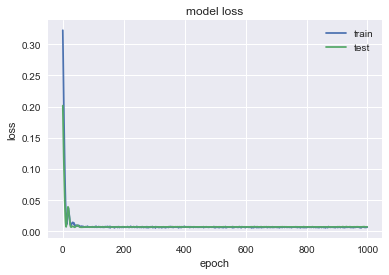

                 T
MSE        2.70492
MAE        1.25306
R2        0.554662
MAPE (%)   3.83151


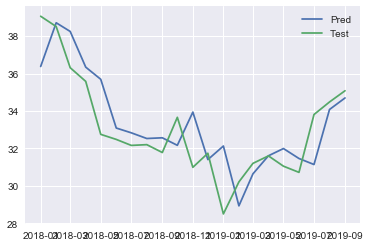

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1245 - val_loss: 0.6572
Epoch 2/1000
0s - loss: 0.1077 - val_loss: 0.5823
Epoch 3/1000
0s - loss: 0.0918 - val_loss: 0.5113
Epoch 4/1000
0s - loss: 0.0771 - val_loss: 0.4437
Epoch 5/1000
0s - loss: 0.0643 - val_loss: 0.3792
Epoch 6/1000
0s - loss: 0.0515 - val_loss: 0.3179
Epoch 7/1000
0s - loss: 0.0403 - val_loss: 0.2600
Epoch 8/1000
0s - loss: 0.0306 - val_loss: 0.2063
Epoch 9/1000
0s - loss: 0.0209 - val_loss: 0.1575
Epoch 10/1000
0s - loss: 0.0152 - val_loss: 0.1149
Epoch 11/1000
0s - loss: 0.0102 - val_loss: 0.0794
Epoch 12/1000
0s - loss: 0.0074 - val_loss: 0.0520
Epoch 13/1000
0s - loss: 0.0077 - val_loss: 0.0331
Epoch 14/1000
0s - loss: 0.0100 - val_loss: 0.0215
Epoch 15/1000
0s - loss: 0.0126 - val_loss: 0.0155
Epoch 16/1000
0s - loss: 0.0154 - val_loss: 0.0130
Epoch 17/1000
0s - loss: 0.0172 - val_loss: 0.0123
Epoch 18/1000
0s - loss: 0.0168 - val_loss: 0.0128
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0032 - val_loss: 0.0125
Epoch 162/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 163/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 164/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 165/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 166/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 0.0125
Epoch 168/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 169/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 170/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 171/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 172/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 174/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 175/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 176/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 177/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 178/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 0.0124
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0125
Epoch 323/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 324/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 325/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 326/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 327/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 328/1000
0s - loss: 0.0036 - val_loss: 0.0125
Epoch 329/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 330/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 331/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 332/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 333/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 334/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 335/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 336/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 337/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 338/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 339/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 340/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0124
Epoch 490/1000
0s - loss: 0.0029 - val_loss: 0.0124
Epoch 491/1000
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 492/1000
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 493/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 494/1000
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 495/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 496/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 497/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 498/1000
0s - loss: 0.0032 - val_loss: 0.0124
Epoch 499/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 500/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 501/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 502/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 503/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 504/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 505/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 506/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 507/1000
0s - loss: 0.0029 - val_loss: 0.0124
Epoch 508/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0125
Epoch 652/1000
0s - loss: 0.0027 - val_loss: 0.0125
Epoch 653/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 654/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 655/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 656/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 657/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 658/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 659/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 660/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 661/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 662/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 663/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 664/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 665/1000
0s - loss: 0.0027 - val_loss: 0.0125
Epoch 666/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 667/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 668/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 669/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 670/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0125
Epoch 813/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 814/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 815/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 816/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 817/1000
0s - loss: 0.0027 - val_loss: 0.0124
Epoch 818/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 819/1000
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 820/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 821/1000
0s - loss: 0.0027 - val_loss: 0.0125
Epoch 822/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 823/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 824/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 825/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 826/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 827/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 828/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 829/1000
0s - loss: 0.0027 - val_loss: 0.0125
Epoch 830/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 831/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0125
Epoch 976/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 977/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 978/1000
0s - loss: 0.0029 - val_loss: 0.0125
Epoch 979/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 980/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 981/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 982/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 983/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 984/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 985/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 986/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 987/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 988/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 989/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 990/1000
0s - loss: 0.0031 - val_loss: 0.0126
Epoch 991/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 992/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 993/1000
0s - loss: 0.0028 - val_loss: 0.0128
Epoch 994/1000
0s - loss: 0

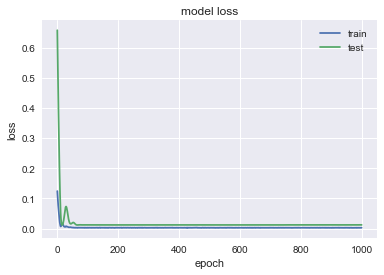

               BBY
MSE        57.3304
MAE        6.46212
R2       -0.185738
MAPE (%)   9.70144


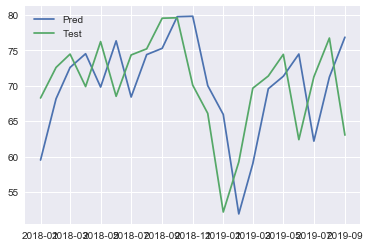

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2408 - val_loss: 0.5087
Epoch 2/1000
0s - loss: 0.2102 - val_loss: 0.4467
Epoch 3/1000
0s - loss: 0.1804 - val_loss: 0.3882
Epoch 4/1000
0s - loss: 0.1536 - val_loss: 0.3329
Epoch 5/1000
0s - loss: 0.1289 - val_loss: 0.2805
Epoch 6/1000
0s - loss: 0.1046 - val_loss: 0.2311
Epoch 7/1000
0s - loss: 0.0830 - val_loss: 0.1851
Epoch 8/1000
0s - loss: 0.0645 - val_loss: 0.1428
Epoch 9/1000
0s - loss: 0.0460 - val_loss: 0.1049
Epoch 10/1000
0s - loss: 0.0315 - val_loss: 0.0722
Epoch 11/1000
0s - loss: 0.0193 - val_loss: 0.0454
Epoch 12/1000
0s - loss: 0.0119 - val_loss: 0.0254
Epoch 13/1000
0s - loss: 0.0075 - val_loss: 0.0123
Epoch 14/1000
0s - loss: 0.0072 - val_loss: 0.0059
Epoch 15/1000
0s - loss: 0.0100 - val_loss: 0.0046
Epoch 16/1000
0s - loss: 0.0145 - val_loss: 0.0062
Epoch 17/1000
0s - loss: 0.0192 - val_loss: 0.0083
Epoch 18/1000
0s - loss: 0.0226 - val_loss: 0.0094
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0025 - val_loss: 0.0042
Epoch 163/1000
0s - loss: 0.0025 - val_loss: 0.0043
Epoch 164/1000
0s - loss: 0.0028 - val_loss: 0.0043
Epoch 165/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 166/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 167/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 168/1000
0s - loss: 0.0027 - val_loss: 0.0046
Epoch 169/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 170/1000
0s - loss: 0.0025 - val_loss: 0.0046
Epoch 171/1000
0s - loss: 0.0025 - val_loss: 0.0046
Epoch 172/1000
0s - loss: 0.0023 - val_loss: 0.0046
Epoch 173/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 174/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 175/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 176/1000
0s - loss: 0.0028 - val_loss: 0.0044
Epoch 177/1000
0s - loss: 0.0019 - val_loss: 0.0044
Epoch 178/1000
0s - loss: 0.0027 - val_loss: 0.0044
Epoch 179/1000
0s - loss: 0.0026 - val_loss: 0.0043
Epoch 180/1000
0s - loss: 0.0023 - val_loss: 0.0043
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0043
Epoch 327/1000
0s - loss: 0.0027 - val_loss: 0.0044
Epoch 328/1000
0s - loss: 0.0025 - val_loss: 0.0044
Epoch 329/1000
0s - loss: 0.0024 - val_loss: 0.0045
Epoch 330/1000
0s - loss: 0.0023 - val_loss: 0.0046
Epoch 331/1000
0s - loss: 0.0025 - val_loss: 0.0046
Epoch 332/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 333/1000
0s - loss: 0.0025 - val_loss: 0.0047
Epoch 334/1000
0s - loss: 0.0025 - val_loss: 0.0046
Epoch 335/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 336/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 337/1000
0s - loss: 0.0025 - val_loss: 0.0045
Epoch 338/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 339/1000
0s - loss: 0.0030 - val_loss: 0.0044
Epoch 340/1000
0s - loss: 0.0024 - val_loss: 0.0044
Epoch 341/1000
0s - loss: 0.0024 - val_loss: 0.0045
Epoch 342/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 343/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 344/1000
0s - loss: 0.0024 - val_loss: 0.0046
Epoch 345/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0047
Epoch 490/1000
0s - loss: 0.0023 - val_loss: 0.0049
Epoch 491/1000
0s - loss: 0.0022 - val_loss: 0.0049
Epoch 492/1000
0s - loss: 0.0023 - val_loss: 0.0049
Epoch 493/1000
0s - loss: 0.0024 - val_loss: 0.0048
Epoch 494/1000
0s - loss: 0.0024 - val_loss: 0.0047
Epoch 495/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 496/1000
0s - loss: 0.0023 - val_loss: 0.0045
Epoch 497/1000
0s - loss: 0.0029 - val_loss: 0.0044
Epoch 498/1000
0s - loss: 0.0023 - val_loss: 0.0044
Epoch 499/1000
0s - loss: 0.0026 - val_loss: 0.0045
Epoch 500/1000
0s - loss: 0.0026 - val_loss: 0.0046
Epoch 501/1000
0s - loss: 0.0021 - val_loss: 0.0047
Epoch 502/1000
0s - loss: 0.0022 - val_loss: 0.0048
Epoch 503/1000
0s - loss: 0.0027 - val_loss: 0.0049
Epoch 504/1000
0s - loss: 0.0022 - val_loss: 0.0048
Epoch 505/1000
0s - loss: 0.0025 - val_loss: 0.0047
Epoch 506/1000
0s - loss: 0.0024 - val_loss: 0.0046
Epoch 507/1000
0s - loss: 0.0028 - val_loss: 0.0045
Epoch 508/1000
0s - loss: 0

0s - loss: 0.0024 - val_loss: 0.0046
Epoch 649/1000
0s - loss: 0.0024 - val_loss: 0.0047
Epoch 650/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 651/1000
0s - loss: 0.0025 - val_loss: 0.0048
Epoch 652/1000
0s - loss: 0.0020 - val_loss: 0.0048
Epoch 653/1000
0s - loss: 0.0024 - val_loss: 0.0048
Epoch 654/1000
0s - loss: 0.0025 - val_loss: 0.0048
Epoch 655/1000
0s - loss: 0.0025 - val_loss: 0.0047
Epoch 656/1000
0s - loss: 0.0025 - val_loss: 0.0047
Epoch 657/1000
0s - loss: 0.0023 - val_loss: 0.0047
Epoch 658/1000
0s - loss: 0.0026 - val_loss: 0.0047
Epoch 659/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 660/1000
0s - loss: 0.0025 - val_loss: 0.0048
Epoch 661/1000
0s - loss: 0.0026 - val_loss: 0.0048
Epoch 662/1000
0s - loss: 0.0022 - val_loss: 0.0047
Epoch 663/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 664/1000
0s - loss: 0.0025 - val_loss: 0.0048
Epoch 665/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 666/1000
0s - loss: 0.0026 - val_loss: 0.0049
Epoch 667/1000
0s - loss: 0

0s - loss: 0.0024 - val_loss: 0.0051
Epoch 810/1000
0s - loss: 0.0024 - val_loss: 0.0050
Epoch 811/1000
0s - loss: 0.0020 - val_loss: 0.0050
Epoch 812/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 813/1000
0s - loss: 0.0023 - val_loss: 0.0047
Epoch 814/1000
0s - loss: 0.0024 - val_loss: 0.0047
Epoch 815/1000
0s - loss: 0.0026 - val_loss: 0.0047
Epoch 816/1000
0s - loss: 0.0026 - val_loss: 0.0049
Epoch 817/1000
0s - loss: 0.0023 - val_loss: 0.0049
Epoch 818/1000
0s - loss: 0.0027 - val_loss: 0.0051
Epoch 819/1000
0s - loss: 0.0024 - val_loss: 0.0051
Epoch 820/1000
0s - loss: 0.0023 - val_loss: 0.0050
Epoch 821/1000
0s - loss: 0.0024 - val_loss: 0.0049
Epoch 822/1000
0s - loss: 0.0026 - val_loss: 0.0048
Epoch 823/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 824/1000
0s - loss: 0.0021 - val_loss: 0.0048
Epoch 825/1000
0s - loss: 0.0022 - val_loss: 0.0048
Epoch 826/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 827/1000
0s - loss: 0.0023 - val_loss: 0.0049
Epoch 828/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0049
Epoch 970/1000
0s - loss: 0.0024 - val_loss: 0.0048
Epoch 971/1000
0s - loss: 0.0023 - val_loss: 0.0048
Epoch 972/1000
0s - loss: 0.0026 - val_loss: 0.0049
Epoch 973/1000
0s - loss: 0.0020 - val_loss: 0.0050
Epoch 974/1000
0s - loss: 0.0021 - val_loss: 0.0051
Epoch 975/1000
0s - loss: 0.0025 - val_loss: 0.0052
Epoch 976/1000
0s - loss: 0.0022 - val_loss: 0.0053
Epoch 977/1000
0s - loss: 0.0026 - val_loss: 0.0053
Epoch 978/1000
0s - loss: 0.0024 - val_loss: 0.0053
Epoch 979/1000
0s - loss: 0.0025 - val_loss: 0.0053
Epoch 980/1000
0s - loss: 0.0023 - val_loss: 0.0054
Epoch 981/1000
0s - loss: 0.0023 - val_loss: 0.0054
Epoch 982/1000
0s - loss: 0.0023 - val_loss: 0.0052
Epoch 983/1000
0s - loss: 0.0024 - val_loss: 0.0051
Epoch 984/1000
0s - loss: 0.0022 - val_loss: 0.0050
Epoch 985/1000
0s - loss: 0.0022 - val_loss: 0.0051
Epoch 986/1000
0s - loss: 0.0026 - val_loss: 0.0051
Epoch 987/1000
0s - loss: 0.0024 - val_loss: 0.0053
Epoch 988/1000
0s - loss: 0

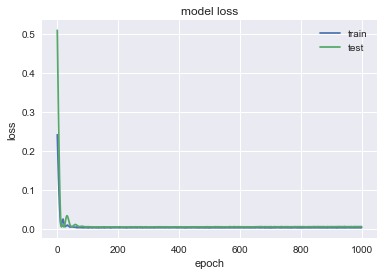

                 KO
MSE         4.79405
MAE         1.93519
R2        0.0876812
MAPE (%)    4.02544


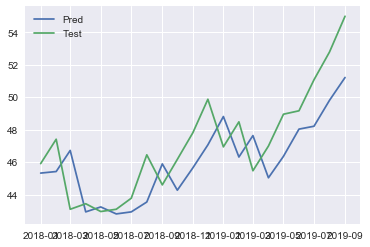

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3147 - val_loss: 0.0374
Epoch 2/1000
0s - loss: 0.2722 - val_loss: 0.0298
Epoch 3/1000
0s - loss: 0.2343 - val_loss: 0.0230
Epoch 4/1000
0s - loss: 0.1984 - val_loss: 0.0172
Epoch 5/1000
0s - loss: 0.1664 - val_loss: 0.0123
Epoch 6/1000
0s - loss: 0.1372 - val_loss: 0.0086
Epoch 7/1000
0s - loss: 0.1056 - val_loss: 0.0061
Epoch 8/1000
0s - loss: 0.0813 - val_loss: 0.0052
Epoch 9/1000
0s - loss: 0.0581 - val_loss: 0.0060
Epoch 10/1000
0s - loss: 0.0387 - val_loss: 0.0088
Epoch 11/1000
0s - loss: 0.0268 - val_loss: 0.0138
Epoch 12/1000
0s - loss: 0.0167 - val_loss: 0.0207
Epoch 13/1000
0s - loss: 0.0127 - val_loss: 0.0293
Epoch 14/1000
0s - loss: 0.0148 - val_loss: 0.0384
Epoch 15/1000
0s - loss: 0.0185 - val_loss: 0.0467
Epoch 16/1000
0s - loss: 0.0261 - val_loss: 0.0527
Epoch 17/1000
0s - loss: 0.0325 - val_loss: 0.0557
Epoch 18/1000
0s - loss: 0.0351 - val_loss: 0.0556
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0071 - val_loss: 0.0046
Epoch 161/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 162/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 163/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 164/1000
0s - loss: 0.0067 - val_loss: 0.0046
Epoch 165/1000
0s - loss: 0.0076 - val_loss: 0.0046
Epoch 166/1000
0s - loss: 0.0062 - val_loss: 0.0047
Epoch 167/1000
0s - loss: 0.0074 - val_loss: 0.0047
Epoch 168/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 169/1000
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 170/1000
0s - loss: 0.0072 - val_loss: 0.0048
Epoch 171/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 172/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 173/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 174/1000
0s - loss: 0.0067 - val_loss: 0.0046
Epoch 175/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 176/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 177/1000
0s - loss: 0.0073 - val_loss: 0.0046
Epoch 178/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0067 - val_loss: 0.0047
Epoch 321/1000
0s - loss: 0.0066 - val_loss: 0.0048
Epoch 322/1000
0s - loss: 0.0067 - val_loss: 0.0048
Epoch 323/1000
0s - loss: 0.0069 - val_loss: 0.0048
Epoch 324/1000
0s - loss: 0.0065 - val_loss: 0.0048
Epoch 325/1000
0s - loss: 0.0069 - val_loss: 0.0048
Epoch 326/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 327/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 328/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 329/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 330/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 331/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 332/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 333/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 334/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 335/1000
0s - loss: 0.0063 - val_loss: 0.0047
Epoch 336/1000
0s - loss: 0.0068 - val_loss: 0.0046
Epoch 337/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 338/1000
0s - loss: 0.0061 - val_loss: 0.0046
Epoch 339/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0047
Epoch 481/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 482/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 483/1000
0s - loss: 0.0075 - val_loss: 0.0047
Epoch 484/1000
0s - loss: 0.0066 - val_loss: 0.0047
Epoch 485/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 486/1000
0s - loss: 0.0063 - val_loss: 0.0047
Epoch 487/1000
0s - loss: 0.0064 - val_loss: 0.0047
Epoch 488/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 489/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 490/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 491/1000
0s - loss: 0.0070 - val_loss: 0.0048
Epoch 492/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 493/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 494/1000
0s - loss: 0.0063 - val_loss: 0.0047
Epoch 495/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 496/1000
0s - loss: 0.0061 - val_loss: 0.0046
Epoch 497/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 498/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 499/1000
0s - loss: 0

0s - loss: 0.0069 - val_loss: 0.0048
Epoch 643/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 644/1000
0s - loss: 0.0070 - val_loss: 0.0048
Epoch 645/1000
0s - loss: 0.0074 - val_loss: 0.0048
Epoch 646/1000
0s - loss: 0.0071 - val_loss: 0.0048
Epoch 647/1000
0s - loss: 0.0079 - val_loss: 0.0048
Epoch 648/1000
0s - loss: 0.0062 - val_loss: 0.0048
Epoch 649/1000
0s - loss: 0.0067 - val_loss: 0.0047
Epoch 650/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 651/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 652/1000
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 653/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 654/1000
0s - loss: 0.0071 - val_loss: 0.0046
Epoch 655/1000
0s - loss: 0.0071 - val_loss: 0.0047
Epoch 656/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 657/1000
0s - loss: 0.0077 - val_loss: 0.0047
Epoch 658/1000
0s - loss: 0.0064 - val_loss: 0.0047
Epoch 659/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 660/1000
0s - loss: 0.0067 - val_loss: 0.0046
Epoch 661/1000
0s - loss: 0

0s - loss: 0.0064 - val_loss: 0.0046
Epoch 803/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 804/1000
0s - loss: 0.0064 - val_loss: 0.0046
Epoch 805/1000
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 806/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 807/1000
0s - loss: 0.0067 - val_loss: 0.0046
Epoch 808/1000
0s - loss: 0.0070 - val_loss: 0.0047
Epoch 809/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 810/1000
0s - loss: 0.0077 - val_loss: 0.0047
Epoch 811/1000
0s - loss: 0.0064 - val_loss: 0.0046
Epoch 812/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 813/1000
0s - loss: 0.0065 - val_loss: 0.0045
Epoch 814/1000
0s - loss: 0.0068 - val_loss: 0.0045
Epoch 815/1000
0s - loss: 0.0072 - val_loss: 0.0046
Epoch 816/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 817/1000
0s - loss: 0.0076 - val_loss: 0.0047
Epoch 818/1000
0s - loss: 0.0073 - val_loss: 0.0048
Epoch 819/1000
0s - loss: 0.0067 - val_loss: 0.0048
Epoch 820/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 821/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0047
Epoch 966/1000
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 967/1000
0s - loss: 0.0067 - val_loss: 0.0046
Epoch 968/1000
0s - loss: 0.0069 - val_loss: 0.0046
Epoch 969/1000
0s - loss: 0.0067 - val_loss: 0.0046
Epoch 970/1000
0s - loss: 0.0066 - val_loss: 0.0048
Epoch 971/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 972/1000
0s - loss: 0.0072 - val_loss: 0.0049
Epoch 973/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 974/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 975/1000
0s - loss: 0.0068 - val_loss: 0.0046
Epoch 976/1000
0s - loss: 0.0068 - val_loss: 0.0045
Epoch 977/1000
0s - loss: 0.0075 - val_loss: 0.0045
Epoch 978/1000
0s - loss: 0.0070 - val_loss: 0.0046
Epoch 979/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 980/1000
0s - loss: 0.0069 - val_loss: 0.0047
Epoch 981/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 982/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 983/1000
0s - loss: 0.0063 - val_loss: 0.0046
Epoch 984/1000
0s - loss: 0

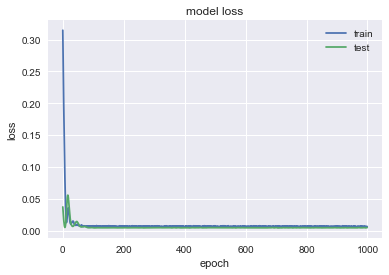

               FTI
MSE        8.99697
MAE        2.30132
R2        0.435898
MAPE (%)   9.14742


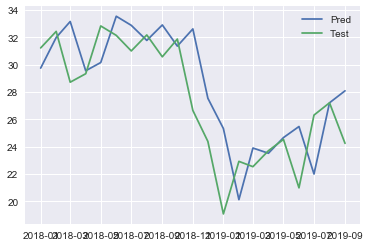

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1539 - val_loss: 0.5734
Epoch 2/1000
0s - loss: 0.1344 - val_loss: 0.5073
Epoch 3/1000
0s - loss: 0.1163 - val_loss: 0.4446
Epoch 4/1000
0s - loss: 0.0996 - val_loss: 0.3850
Epoch 5/1000
0s - loss: 0.0842 - val_loss: 0.3282
Epoch 6/1000
0s - loss: 0.0699 - val_loss: 0.2743
Epoch 7/1000
0s - loss: 0.0566 - val_loss: 0.2236
Epoch 8/1000
0s - loss: 0.0445 - val_loss: 0.1766
Epoch 9/1000
0s - loss: 0.0335 - val_loss: 0.1338
Epoch 10/1000
0s - loss: 0.0250 - val_loss: 0.0963
Epoch 11/1000
0s - loss: 0.0177 - val_loss: 0.0648
Epoch 12/1000
0s - loss: 0.0142 - val_loss: 0.0403
Epoch 13/1000
0s - loss: 0.0113 - val_loss: 0.0231
Epoch 14/1000
0s - loss: 0.0121 - val_loss: 0.0129
Epoch 15/1000
0s - loss: 0.0138 - val_loss: 0.0082
Epoch 16/1000
0s - loss: 0.0165 - val_loss: 0.0069
Epoch 17/1000
0s - loss: 0.0194 - val_loss: 0.0071
Epoch 18/1000
0s - loss: 0.0204 - val_loss: 0.0074
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0019 - val_loss: 0.0093
Epoch 170/1000
0s - loss: 0.0022 - val_loss: 0.0094
Epoch 171/1000
0s - loss: 0.0021 - val_loss: 0.0094
Epoch 172/1000
0s - loss: 0.0021 - val_loss: 0.0095
Epoch 173/1000
0s - loss: 0.0019 - val_loss: 0.0095
Epoch 174/1000
0s - loss: 0.0020 - val_loss: 0.0095
Epoch 175/1000
0s - loss: 0.0019 - val_loss: 0.0095
Epoch 176/1000
0s - loss: 0.0019 - val_loss: 0.0094
Epoch 177/1000
0s - loss: 0.0020 - val_loss: 0.0093
Epoch 178/1000
0s - loss: 0.0022 - val_loss: 0.0093
Epoch 179/1000
0s - loss: 0.0022 - val_loss: 0.0092
Epoch 180/1000
0s - loss: 0.0021 - val_loss: 0.0093
Epoch 181/1000
0s - loss: 0.0021 - val_loss: 0.0093
Epoch 182/1000
0s - loss: 0.0018 - val_loss: 0.0093
Epoch 183/1000
0s - loss: 0.0018 - val_loss: 0.0093
Epoch 184/1000
0s - loss: 0.0020 - val_loss: 0.0093
Epoch 185/1000
0s - loss: 0.0021 - val_loss: 0.0094
Epoch 186/1000
0s - loss: 0.0021 - val_loss: 0.0094
Epoch 187/1000
0s - loss: 0.0020 - val_loss: 0.0094
Epoch 188/1000
0s - loss: 0

0s - loss: 0.0020 - val_loss: 0.0092
Epoch 330/1000
0s - loss: 0.0020 - val_loss: 0.0094
Epoch 331/1000
0s - loss: 0.0020 - val_loss: 0.0095
Epoch 332/1000
0s - loss: 0.0020 - val_loss: 0.0095
Epoch 333/1000
0s - loss: 0.0018 - val_loss: 0.0094
Epoch 334/1000
0s - loss: 0.0015 - val_loss: 0.0092
Epoch 335/1000
0s - loss: 0.0020 - val_loss: 0.0090
Epoch 336/1000
0s - loss: 0.0020 - val_loss: 0.0090
Epoch 337/1000
0s - loss: 0.0020 - val_loss: 0.0089
Epoch 338/1000
0s - loss: 0.0021 - val_loss: 0.0088
Epoch 339/1000
0s - loss: 0.0018 - val_loss: 0.0088
Epoch 340/1000
0s - loss: 0.0018 - val_loss: 0.0089
Epoch 341/1000
0s - loss: 0.0020 - val_loss: 0.0090
Epoch 342/1000
0s - loss: 0.0018 - val_loss: 0.0091
Epoch 343/1000
0s - loss: 0.0021 - val_loss: 0.0091
Epoch 344/1000
0s - loss: 0.0020 - val_loss: 0.0091
Epoch 345/1000
0s - loss: 0.0017 - val_loss: 0.0092
Epoch 346/1000
0s - loss: 0.0017 - val_loss: 0.0093
Epoch 347/1000
0s - loss: 0.0020 - val_loss: 0.0093
Epoch 348/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0096
Epoch 490/1000
0s - loss: 0.0018 - val_loss: 0.0099
Epoch 491/1000
0s - loss: 0.0016 - val_loss: 0.0101
Epoch 492/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 493/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 494/1000
0s - loss: 0.0020 - val_loss: 0.0100
Epoch 495/1000
0s - loss: 0.0020 - val_loss: 0.0098
Epoch 496/1000
0s - loss: 0.0019 - val_loss: 0.0098
Epoch 497/1000
0s - loss: 0.0019 - val_loss: 0.0097
Epoch 498/1000
0s - loss: 0.0017 - val_loss: 0.0095
Epoch 499/1000
0s - loss: 0.0020 - val_loss: 0.0095
Epoch 500/1000
0s - loss: 0.0020 - val_loss: 0.0095
Epoch 501/1000
0s - loss: 0.0018 - val_loss: 0.0094
Epoch 502/1000
0s - loss: 0.0020 - val_loss: 0.0096
Epoch 503/1000
0s - loss: 0.0017 - val_loss: 0.0098
Epoch 504/1000
0s - loss: 0.0022 - val_loss: 0.0099
Epoch 505/1000
0s - loss: 0.0020 - val_loss: 0.0100
Epoch 506/1000
0s - loss: 0.0020 - val_loss: 0.0098
Epoch 507/1000
0s - loss: 0.0020 - val_loss: 0.0097
Epoch 508/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0106
Epoch 654/1000
0s - loss: 0.0018 - val_loss: 0.0104
Epoch 655/1000
0s - loss: 0.0019 - val_loss: 0.0100
Epoch 656/1000
0s - loss: 0.0018 - val_loss: 0.0095
Epoch 657/1000
0s - loss: 0.0019 - val_loss: 0.0092
Epoch 658/1000
0s - loss: 0.0018 - val_loss: 0.0090
Epoch 659/1000
0s - loss: 0.0020 - val_loss: 0.0091
Epoch 660/1000
0s - loss: 0.0021 - val_loss: 0.0093
Epoch 661/1000
0s - loss: 0.0019 - val_loss: 0.0097
Epoch 662/1000
0s - loss: 0.0020 - val_loss: 0.0102
Epoch 663/1000
0s - loss: 0.0019 - val_loss: 0.0105
Epoch 664/1000
0s - loss: 0.0019 - val_loss: 0.0105
Epoch 665/1000
0s - loss: 0.0019 - val_loss: 0.0101
Epoch 666/1000
0s - loss: 0.0020 - val_loss: 0.0097
Epoch 667/1000
0s - loss: 0.0019 - val_loss: 0.0095
Epoch 668/1000
0s - loss: 0.0016 - val_loss: 0.0093
Epoch 669/1000
0s - loss: 0.0018 - val_loss: 0.0093
Epoch 670/1000
0s - loss: 0.0019 - val_loss: 0.0092
Epoch 671/1000
0s - loss: 0.0020 - val_loss: 0.0092
Epoch 672/1000
0s - loss: 0

0s - loss: 0.0020 - val_loss: 0.0101
Epoch 814/1000
0s - loss: 0.0021 - val_loss: 0.0102
Epoch 815/1000
0s - loss: 0.0020 - val_loss: 0.0100
Epoch 816/1000
0s - loss: 0.0018 - val_loss: 0.0098
Epoch 817/1000
0s - loss: 0.0018 - val_loss: 0.0096
Epoch 818/1000
0s - loss: 0.0022 - val_loss: 0.0096
Epoch 819/1000
0s - loss: 0.0019 - val_loss: 0.0095
Epoch 820/1000
0s - loss: 0.0018 - val_loss: 0.0095
Epoch 821/1000
0s - loss: 0.0019 - val_loss: 0.0095
Epoch 822/1000
0s - loss: 0.0019 - val_loss: 0.0096
Epoch 823/1000
0s - loss: 0.0018 - val_loss: 0.0097
Epoch 824/1000
0s - loss: 0.0021 - val_loss: 0.0099
Epoch 825/1000
0s - loss: 0.0018 - val_loss: 0.0098
Epoch 826/1000
0s - loss: 0.0020 - val_loss: 0.0097
Epoch 827/1000
0s - loss: 0.0020 - val_loss: 0.0096
Epoch 828/1000
0s - loss: 0.0016 - val_loss: 0.0095
Epoch 829/1000
0s - loss: 0.0017 - val_loss: 0.0094
Epoch 830/1000
0s - loss: 0.0021 - val_loss: 0.0096
Epoch 831/1000
0s - loss: 0.0021 - val_loss: 0.0097
Epoch 832/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0096
Epoch 973/1000
0s - loss: 0.0017 - val_loss: 0.0096
Epoch 974/1000
0s - loss: 0.0019 - val_loss: 0.0097
Epoch 975/1000
0s - loss: 0.0022 - val_loss: 0.0098
Epoch 976/1000
0s - loss: 0.0017 - val_loss: 0.0100
Epoch 977/1000
0s - loss: 0.0020 - val_loss: 0.0101
Epoch 978/1000
0s - loss: 0.0017 - val_loss: 0.0100
Epoch 979/1000
0s - loss: 0.0015 - val_loss: 0.0101
Epoch 980/1000
0s - loss: 0.0020 - val_loss: 0.0101
Epoch 981/1000
0s - loss: 0.0019 - val_loss: 0.0100
Epoch 982/1000
0s - loss: 0.0019 - val_loss: 0.0100
Epoch 983/1000
0s - loss: 0.0019 - val_loss: 0.0099
Epoch 984/1000
0s - loss: 0.0018 - val_loss: 0.0099
Epoch 985/1000
0s - loss: 0.0018 - val_loss: 0.0102
Epoch 986/1000
0s - loss: 0.0021 - val_loss: 0.0103
Epoch 987/1000
0s - loss: 0.0018 - val_loss: 0.0104
Epoch 988/1000
0s - loss: 0.0017 - val_loss: 0.0106
Epoch 989/1000
0s - loss: 0.0021 - val_loss: 0.0105
Epoch 990/1000
0s - loss: 0.0021 - val_loss: 0.0100
Epoch 991/1000
0s - loss: 0

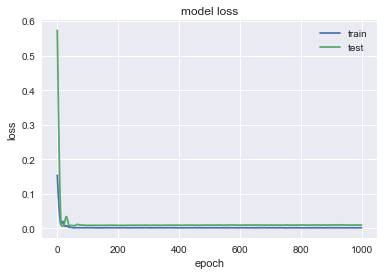

               BLK
MSE        1738.46
MAE        35.4054
R2        0.377373
MAPE (%)   7.77322


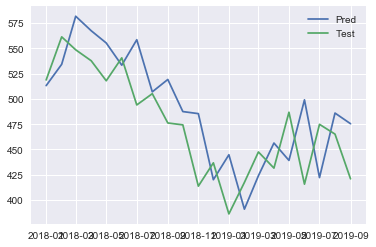

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3583 - val_loss: 0.3656
Epoch 2/1000
0s - loss: 0.3164 - val_loss: 0.3213
Epoch 3/1000
0s - loss: 0.2773 - val_loss: 0.2795
Epoch 4/1000
0s - loss: 0.2411 - val_loss: 0.2398
Epoch 5/1000
0s - loss: 0.2077 - val_loss: 0.2022
Epoch 6/1000
0s - loss: 0.1753 - val_loss: 0.1666
Epoch 7/1000
0s - loss: 0.1459 - val_loss: 0.1334
Epoch 8/1000
0s - loss: 0.1168 - val_loss: 0.1030
Epoch 9/1000
0s - loss: 0.0904 - val_loss: 0.0759
Epoch 10/1000
0s - loss: 0.0681 - val_loss: 0.0527
Epoch 11/1000
0s - loss: 0.0484 - val_loss: 0.0342
Epoch 12/1000
0s - loss: 0.0320 - val_loss: 0.0212
Epoch 13/1000
0s - loss: 0.0198 - val_loss: 0.0139
Epoch 14/1000
0s - loss: 0.0135 - val_loss: 0.0126
Epoch 15/1000
0s - loss: 0.0129 - val_loss: 0.0164
Epoch 16/1000
0s - loss: 0.0158 - val_loss: 0.0234
Epoch 17/1000
0s - loss: 0.0235 - val_loss: 0.0313
Epoch 18/1000
0s - loss: 0.0292 - val_loss: 0.0375
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0049 - val_loss: 0.0141
Epoch 165/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 166/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 167/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 168/1000
0s - loss: 0.0051 - val_loss: 0.0141
Epoch 169/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 170/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 171/1000
0s - loss: 0.0043 - val_loss: 0.0140
Epoch 172/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 173/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 174/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 175/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 176/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 177/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 178/1000
0s - loss: 0.0046 - val_loss: 0.0140
Epoch 179/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 180/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 181/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 182/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 183/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0141
Epoch 328/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 329/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 330/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 331/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 332/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 333/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 334/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 335/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 336/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 337/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 338/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 339/1000
0s - loss: 0.0044 - val_loss: 0.0140
Epoch 340/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 341/1000
0s - loss: 0.0036 - val_loss: 0.0141
Epoch 342/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 343/1000
0s - loss: 0.0034 - val_loss: 0.0141
Epoch 344/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 345/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 346/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0140
Epoch 487/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 488/1000
0s - loss: 0.0036 - val_loss: 0.0139
Epoch 489/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 490/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 491/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 492/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 493/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 494/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 495/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 496/1000
0s - loss: 0.0038 - val_loss: 0.0141
Epoch 497/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 498/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 499/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 500/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 501/1000
0s - loss: 0.0033 - val_loss: 0.0139
Epoch 502/1000
0s - loss: 0.0037 - val_loss: 0.0139
Epoch 503/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 504/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 505/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0140
Epoch 649/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 650/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 651/1000
0s - loss: 0.0040 - val_loss: 0.0138
Epoch 652/1000
0s - loss: 0.0043 - val_loss: 0.0139
Epoch 653/1000
0s - loss: 0.0037 - val_loss: 0.0139
Epoch 654/1000
0s - loss: 0.0034 - val_loss: 0.0139
Epoch 655/1000
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 656/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 657/1000
0s - loss: 0.0034 - val_loss: 0.0142
Epoch 658/1000
0s - loss: 0.0038 - val_loss: 0.0142
Epoch 659/1000
0s - loss: 0.0038 - val_loss: 0.0142
Epoch 660/1000
0s - loss: 0.0034 - val_loss: 0.0141
Epoch 661/1000
0s - loss: 0.0045 - val_loss: 0.0140
Epoch 662/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 663/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 664/1000
0s - loss: 0.0040 - val_loss: 0.0139
Epoch 665/1000
0s - loss: 0.0032 - val_loss: 0.0139
Epoch 666/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 667/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0139
Epoch 811/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 812/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 813/1000
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 814/1000
0s - loss: 0.0037 - val_loss: 0.0141
Epoch 815/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 816/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 817/1000
0s - loss: 0.0034 - val_loss: 0.0138
Epoch 818/1000
0s - loss: 0.0041 - val_loss: 0.0138
Epoch 819/1000
0s - loss: 0.0038 - val_loss: 0.0138
Epoch 820/1000
0s - loss: 0.0036 - val_loss: 0.0138
Epoch 821/1000
0s - loss: 0.0037 - val_loss: 0.0138
Epoch 822/1000
0s - loss: 0.0042 - val_loss: 0.0139
Epoch 823/1000
0s - loss: 0.0041 - val_loss: 0.0140
Epoch 824/1000
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 825/1000
0s - loss: 0.0042 - val_loss: 0.0143
Epoch 826/1000
0s - loss: 0.0038 - val_loss: 0.0143
Epoch 827/1000
0s - loss: 0.0039 - val_loss: 0.0141
Epoch 828/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 829/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0139
Epoch 972/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 973/1000
0s - loss: 0.0037 - val_loss: 0.0139
Epoch 974/1000
0s - loss: 0.0037 - val_loss: 0.0139
Epoch 975/1000
0s - loss: 0.0036 - val_loss: 0.0139
Epoch 976/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 977/1000
0s - loss: 0.0041 - val_loss: 0.0139
Epoch 978/1000
0s - loss: 0.0037 - val_loss: 0.0140
Epoch 979/1000
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 980/1000
0s - loss: 0.0036 - val_loss: 0.0142
Epoch 981/1000
0s - loss: 0.0041 - val_loss: 0.0142
Epoch 982/1000
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 983/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 984/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 985/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 986/1000
0s - loss: 0.0034 - val_loss: 0.0139
Epoch 987/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 988/1000
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 989/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 990/1000
0s - loss: 0

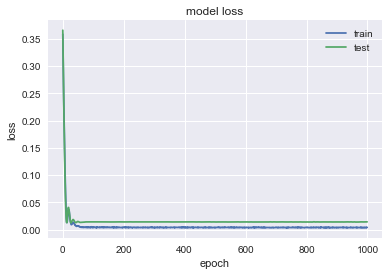

               DVA
MSE        42.5572
MAE        4.83965
R2        0.301499
MAPE (%)   8.27442


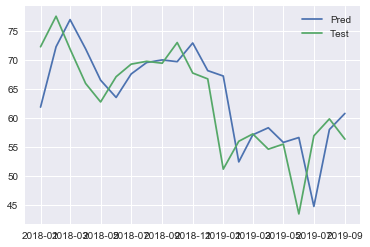

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0412 - val_loss: 0.5581
Epoch 2/1000
0s - loss: 0.0344 - val_loss: 0.4919
Epoch 3/1000
0s - loss: 0.0281 - val_loss: 0.4296
Epoch 4/1000
0s - loss: 0.0229 - val_loss: 0.3705
Epoch 5/1000
0s - loss: 0.0181 - val_loss: 0.3146
Epoch 6/1000
0s - loss: 0.0145 - val_loss: 0.2619
Epoch 7/1000
0s - loss: 0.0110 - val_loss: 0.2132
Epoch 8/1000
0s - loss: 0.0085 - val_loss: 0.1691
Epoch 9/1000
0s - loss: 0.0073 - val_loss: 0.1311
Epoch 10/1000
0s - loss: 0.0069 - val_loss: 0.1001
Epoch 11/1000
0s - loss: 0.0072 - val_loss: 0.0773
Epoch 12/1000
0s - loss: 0.0082 - val_loss: 0.0618
Epoch 13/1000
0s - loss: 0.0086 - val_loss: 0.0523
Epoch 14/1000
0s - loss: 0.0082 - val_loss: 0.0471
Epoch 15/1000
0s - loss: 0.0079 - val_loss: 0.0453
Epoch 16/1000
0s - loss: 0.0068 - val_loss: 0.0457
Epoch 17/1000
0s - loss: 0.0058 - val_loss: 0.0477
Epoch 18/1000
0s - loss: 0.0048 - val_loss: 0.0504
Epoch 19/1000
0s - loss: 0.0

0s - loss: 5.3349e-04 - val_loss: 0.0116
Epoch 154/1000
0s - loss: 4.8860e-04 - val_loss: 0.0115
Epoch 155/1000
0s - loss: 3.7864e-04 - val_loss: 0.0113
Epoch 156/1000
0s - loss: 4.2286e-04 - val_loss: 0.0112
Epoch 157/1000
0s - loss: 4.3399e-04 - val_loss: 0.0112
Epoch 158/1000
0s - loss: 4.5823e-04 - val_loss: 0.0112
Epoch 159/1000
0s - loss: 5.3700e-04 - val_loss: 0.0111
Epoch 160/1000
0s - loss: 4.6019e-04 - val_loss: 0.0110
Epoch 161/1000
0s - loss: 5.3004e-04 - val_loss: 0.0109
Epoch 162/1000
0s - loss: 4.1669e-04 - val_loss: 0.0108
Epoch 163/1000
0s - loss: 4.8128e-04 - val_loss: 0.0107
Epoch 164/1000
0s - loss: 5.2194e-04 - val_loss: 0.0107
Epoch 165/1000
0s - loss: 4.8503e-04 - val_loss: 0.0108
Epoch 166/1000
0s - loss: 4.7121e-04 - val_loss: 0.0109
Epoch 167/1000
0s - loss: 5.1072e-04 - val_loss: 0.0108
Epoch 168/1000
0s - loss: 4.3591e-04 - val_loss: 0.0108
Epoch 169/1000
0s - loss: 5.2604e-04 - val_loss: 0.0107
Epoch 170/1000
0s - loss: 4.4006e-04 - val_loss: 0.0107
Epoch 1

0s - loss: 4.7561e-04 - val_loss: 0.0116
Epoch 306/1000
0s - loss: 5.9771e-04 - val_loss: 0.0116
Epoch 307/1000
0s - loss: 4.5025e-04 - val_loss: 0.0116
Epoch 308/1000
0s - loss: 4.7765e-04 - val_loss: 0.0115
Epoch 309/1000
0s - loss: 4.3212e-04 - val_loss: 0.0115
Epoch 310/1000
0s - loss: 4.6374e-04 - val_loss: 0.0116
Epoch 311/1000
0s - loss: 5.0103e-04 - val_loss: 0.0115
Epoch 312/1000
0s - loss: 4.0996e-04 - val_loss: 0.0118
Epoch 313/1000
0s - loss: 4.3493e-04 - val_loss: 0.0122
Epoch 314/1000
0s - loss: 4.4053e-04 - val_loss: 0.0128
Epoch 315/1000
0s - loss: 3.8948e-04 - val_loss: 0.0131
Epoch 316/1000
0s - loss: 4.6031e-04 - val_loss: 0.0132
Epoch 317/1000
0s - loss: 5.0351e-04 - val_loss: 0.0131
Epoch 318/1000
0s - loss: 5.0861e-04 - val_loss: 0.0129
Epoch 319/1000
0s - loss: 4.3783e-04 - val_loss: 0.0126
Epoch 320/1000
0s - loss: 4.1955e-04 - val_loss: 0.0123
Epoch 321/1000
0s - loss: 4.7787e-04 - val_loss: 0.0119
Epoch 322/1000
0s - loss: 4.2524e-04 - val_loss: 0.0118
Epoch 3

0s - loss: 4.6088e-04 - val_loss: 0.0127
Epoch 459/1000
0s - loss: 4.6800e-04 - val_loss: 0.0122
Epoch 460/1000
0s - loss: 3.9514e-04 - val_loss: 0.0117
Epoch 461/1000
0s - loss: 4.9394e-04 - val_loss: 0.0117
Epoch 462/1000
0s - loss: 4.4041e-04 - val_loss: 0.0118
Epoch 463/1000
0s - loss: 5.7627e-04 - val_loss: 0.0119
Epoch 464/1000
0s - loss: 5.4905e-04 - val_loss: 0.0119
Epoch 465/1000
0s - loss: 4.6765e-04 - val_loss: 0.0121
Epoch 466/1000
0s - loss: 4.7301e-04 - val_loss: 0.0120
Epoch 467/1000
0s - loss: 4.1860e-04 - val_loss: 0.0121
Epoch 468/1000
0s - loss: 4.5476e-04 - val_loss: 0.0122
Epoch 469/1000
0s - loss: 4.6888e-04 - val_loss: 0.0122
Epoch 470/1000
0s - loss: 3.9618e-04 - val_loss: 0.0121
Epoch 471/1000
0s - loss: 4.9994e-04 - val_loss: 0.0121
Epoch 472/1000
0s - loss: 4.3520e-04 - val_loss: 0.0123
Epoch 473/1000
0s - loss: 4.7166e-04 - val_loss: 0.0124
Epoch 474/1000
0s - loss: 3.8494e-04 - val_loss: 0.0127
Epoch 475/1000
0s - loss: 4.4057e-04 - val_loss: 0.0130
Epoch 4

0s - loss: 4.5676e-04 - val_loss: 0.0133
Epoch 615/1000
0s - loss: 4.2283e-04 - val_loss: 0.0137
Epoch 616/1000
0s - loss: 4.4170e-04 - val_loss: 0.0139
Epoch 617/1000
0s - loss: 4.4537e-04 - val_loss: 0.0141
Epoch 618/1000
0s - loss: 4.7226e-04 - val_loss: 0.0139
Epoch 619/1000
0s - loss: 4.2666e-04 - val_loss: 0.0134
Epoch 620/1000
0s - loss: 3.9137e-04 - val_loss: 0.0128
Epoch 621/1000
0s - loss: 4.6432e-04 - val_loss: 0.0124
Epoch 622/1000
0s - loss: 4.4601e-04 - val_loss: 0.0121
Epoch 623/1000
0s - loss: 4.4155e-04 - val_loss: 0.0122
Epoch 624/1000
0s - loss: 4.4644e-04 - val_loss: 0.0126
Epoch 625/1000
0s - loss: 4.5813e-04 - val_loss: 0.0130
Epoch 626/1000
0s - loss: 4.6745e-04 - val_loss: 0.0132
Epoch 627/1000
0s - loss: 4.8010e-04 - val_loss: 0.0131
Epoch 628/1000
0s - loss: 4.7696e-04 - val_loss: 0.0130
Epoch 629/1000
0s - loss: 4.8047e-04 - val_loss: 0.0130
Epoch 630/1000
0s - loss: 4.4974e-04 - val_loss: 0.0130
Epoch 631/1000
0s - loss: 5.0337e-04 - val_loss: 0.0130
Epoch 6

0s - loss: 4.6781e-04 - val_loss: 0.0156
Epoch 762/1000
0s - loss: 4.7609e-04 - val_loss: 0.0153
Epoch 763/1000
0s - loss: 4.0637e-04 - val_loss: 0.0147
Epoch 764/1000
0s - loss: 4.5399e-04 - val_loss: 0.0141
Epoch 765/1000
0s - loss: 4.5500e-04 - val_loss: 0.0139
Epoch 766/1000
0s - loss: 4.1714e-04 - val_loss: 0.0140
Epoch 767/1000
0s - loss: 4.2598e-04 - val_loss: 0.0139
Epoch 768/1000
0s - loss: 4.6653e-04 - val_loss: 0.0140
Epoch 769/1000
0s - loss: 4.1299e-04 - val_loss: 0.0138
Epoch 770/1000
0s - loss: 4.1782e-04 - val_loss: 0.0136
Epoch 771/1000
0s - loss: 5.1126e-04 - val_loss: 0.0136
Epoch 772/1000
0s - loss: 4.8892e-04 - val_loss: 0.0136
Epoch 773/1000
0s - loss: 4.9496e-04 - val_loss: 0.0137
Epoch 774/1000
0s - loss: 4.1537e-04 - val_loss: 0.0137
Epoch 775/1000
0s - loss: 3.7605e-04 - val_loss: 0.0139
Epoch 776/1000
0s - loss: 4.0551e-04 - val_loss: 0.0136
Epoch 777/1000
0s - loss: 4.3607e-04 - val_loss: 0.0134
Epoch 778/1000
0s - loss: 4.0930e-04 - val_loss: 0.0132
Epoch 7

0s - loss: 4.1882e-04 - val_loss: 0.0138
Epoch 912/1000
0s - loss: 4.6659e-04 - val_loss: 0.0137
Epoch 913/1000
0s - loss: 5.3049e-04 - val_loss: 0.0135
Epoch 914/1000
0s - loss: 4.4463e-04 - val_loss: 0.0133
Epoch 915/1000
0s - loss: 4.9417e-04 - val_loss: 0.0133
Epoch 916/1000
0s - loss: 4.2272e-04 - val_loss: 0.0135
Epoch 917/1000
0s - loss: 3.6392e-04 - val_loss: 0.0137
Epoch 918/1000
0s - loss: 4.5354e-04 - val_loss: 0.0137
Epoch 919/1000
0s - loss: 5.2912e-04 - val_loss: 0.0137
Epoch 920/1000
0s - loss: 3.8803e-04 - val_loss: 0.0138
Epoch 921/1000
0s - loss: 4.9711e-04 - val_loss: 0.0141
Epoch 922/1000
0s - loss: 4.0273e-04 - val_loss: 0.0142
Epoch 923/1000
0s - loss: 4.7905e-04 - val_loss: 0.0140
Epoch 924/1000
0s - loss: 4.9364e-04 - val_loss: 0.0140
Epoch 925/1000
0s - loss: 4.2958e-04 - val_loss: 0.0141
Epoch 926/1000
0s - loss: 5.1810e-04 - val_loss: 0.0141
Epoch 927/1000
0s - loss: 3.7466e-04 - val_loss: 0.0139
Epoch 928/1000
0s - loss: 4.2096e-04 - val_loss: 0.0134
Epoch 9

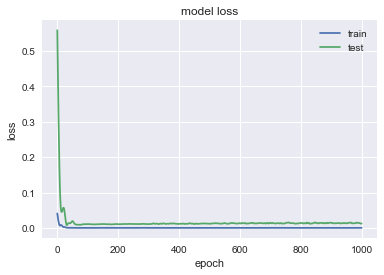

                BA
MSE        1925.38
MAE        34.8196
R2       -0.176111
MAPE (%)   9.86646


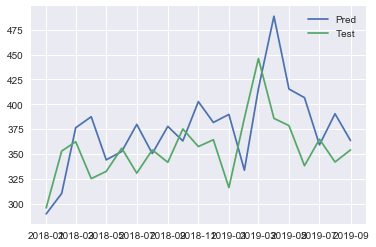

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3696 - val_loss: 0.0829
Epoch 2/1000
0s - loss: 0.3237 - val_loss: 0.0697
Epoch 3/1000
0s - loss: 0.2826 - val_loss: 0.0575
Epoch 4/1000
0s - loss: 0.2436 - val_loss: 0.0465
Epoch 5/1000
0s - loss: 0.2066 - val_loss: 0.0367
Epoch 6/1000
0s - loss: 0.1708 - val_loss: 0.0281
Epoch 7/1000
0s - loss: 0.1385 - val_loss: 0.0209
Epoch 8/1000
0s - loss: 0.1097 - val_loss: 0.0155
Epoch 9/1000
0s - loss: 0.0811 - val_loss: 0.0120
Epoch 10/1000
0s - loss: 0.0587 - val_loss: 0.0109
Epoch 11/1000
0s - loss: 0.0377 - val_loss: 0.0125
Epoch 12/1000
0s - loss: 0.0251 - val_loss: 0.0168
Epoch 13/1000
0s - loss: 0.0147 - val_loss: 0.0239
Epoch 14/1000
0s - loss: 0.0120 - val_loss: 0.0332
Epoch 15/1000
0s - loss: 0.0130 - val_loss: 0.0435
Epoch 16/1000
0s - loss: 0.0181 - val_loss: 0.0532
Epoch 17/1000
0s - loss: 0.0268 - val_loss: 0.0606
Epoch 18/1000
0s - loss: 0.0318 - val_loss: 0.0647
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0065 - val_loss: 0.0142
Epoch 161/1000
0s - loss: 0.0065 - val_loss: 0.0142
Epoch 162/1000
0s - loss: 0.0071 - val_loss: 0.0142
Epoch 163/1000
0s - loss: 0.0064 - val_loss: 0.0142
Epoch 164/1000
0s - loss: 0.0071 - val_loss: 0.0141
Epoch 165/1000
0s - loss: 0.0065 - val_loss: 0.0141
Epoch 166/1000
0s - loss: 0.0060 - val_loss: 0.0140
Epoch 167/1000
0s - loss: 0.0062 - val_loss: 0.0139
Epoch 168/1000
0s - loss: 0.0066 - val_loss: 0.0138
Epoch 169/1000
0s - loss: 0.0062 - val_loss: 0.0138
Epoch 170/1000
0s - loss: 0.0064 - val_loss: 0.0138
Epoch 171/1000
0s - loss: 0.0068 - val_loss: 0.0138
Epoch 172/1000
0s - loss: 0.0071 - val_loss: 0.0139
Epoch 173/1000
0s - loss: 0.0062 - val_loss: 0.0139
Epoch 174/1000
0s - loss: 0.0075 - val_loss: 0.0140
Epoch 175/1000
0s - loss: 0.0061 - val_loss: 0.0141
Epoch 176/1000
0s - loss: 0.0059 - val_loss: 0.0141
Epoch 177/1000
0s - loss: 0.0064 - val_loss: 0.0142
Epoch 178/1000
0s - loss: 0.0067 - val_loss: 0.0143
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0064 - val_loss: 0.0139
Epoch 319/1000
0s - loss: 0.0071 - val_loss: 0.0139
Epoch 320/1000
0s - loss: 0.0061 - val_loss: 0.0140
Epoch 321/1000
0s - loss: 0.0071 - val_loss: 0.0140
Epoch 322/1000
0s - loss: 0.0067 - val_loss: 0.0141
Epoch 323/1000
0s - loss: 0.0059 - val_loss: 0.0142
Epoch 324/1000
0s - loss: 0.0067 - val_loss: 0.0142
Epoch 325/1000
0s - loss: 0.0072 - val_loss: 0.0142
Epoch 326/1000
0s - loss: 0.0066 - val_loss: 0.0142
Epoch 327/1000
0s - loss: 0.0065 - val_loss: 0.0142
Epoch 328/1000
0s - loss: 0.0062 - val_loss: 0.0142
Epoch 329/1000
0s - loss: 0.0072 - val_loss: 0.0141
Epoch 330/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 331/1000
0s - loss: 0.0058 - val_loss: 0.0141
Epoch 332/1000
0s - loss: 0.0062 - val_loss: 0.0141
Epoch 333/1000
0s - loss: 0.0066 - val_loss: 0.0141
Epoch 334/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 335/1000
0s - loss: 0.0069 - val_loss: 0.0141
Epoch 336/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 337/1000
0s - loss: 0

0s - loss: 0.0064 - val_loss: 0.0145
Epoch 483/1000
0s - loss: 0.0069 - val_loss: 0.0145
Epoch 484/1000
0s - loss: 0.0063 - val_loss: 0.0143
Epoch 485/1000
0s - loss: 0.0066 - val_loss: 0.0142
Epoch 486/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 487/1000
0s - loss: 0.0065 - val_loss: 0.0141
Epoch 488/1000
0s - loss: 0.0068 - val_loss: 0.0141
Epoch 489/1000
0s - loss: 0.0064 - val_loss: 0.0141
Epoch 490/1000
0s - loss: 0.0063 - val_loss: 0.0142
Epoch 491/1000
0s - loss: 0.0062 - val_loss: 0.0143
Epoch 492/1000
0s - loss: 0.0062 - val_loss: 0.0144
Epoch 493/1000
0s - loss: 0.0061 - val_loss: 0.0145
Epoch 494/1000
0s - loss: 0.0065 - val_loss: 0.0146
Epoch 495/1000
0s - loss: 0.0060 - val_loss: 0.0146
Epoch 496/1000
0s - loss: 0.0062 - val_loss: 0.0145
Epoch 497/1000
0s - loss: 0.0067 - val_loss: 0.0144
Epoch 498/1000
0s - loss: 0.0064 - val_loss: 0.0143
Epoch 499/1000
0s - loss: 0.0079 - val_loss: 0.0142
Epoch 500/1000
0s - loss: 0.0063 - val_loss: 0.0141
Epoch 501/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0145
Epoch 643/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 644/1000
0s - loss: 0.0065 - val_loss: 0.0143
Epoch 645/1000
0s - loss: 0.0061 - val_loss: 0.0143
Epoch 646/1000
0s - loss: 0.0054 - val_loss: 0.0142
Epoch 647/1000
0s - loss: 0.0062 - val_loss: 0.0143
Epoch 648/1000
0s - loss: 0.0063 - val_loss: 0.0144
Epoch 649/1000
0s - loss: 0.0062 - val_loss: 0.0145
Epoch 650/1000
0s - loss: 0.0063 - val_loss: 0.0146
Epoch 651/1000
0s - loss: 0.0072 - val_loss: 0.0145
Epoch 652/1000
0s - loss: 0.0065 - val_loss: 0.0146
Epoch 653/1000
0s - loss: 0.0066 - val_loss: 0.0146
Epoch 654/1000
0s - loss: 0.0062 - val_loss: 0.0145
Epoch 655/1000
0s - loss: 0.0057 - val_loss: 0.0145
Epoch 656/1000
0s - loss: 0.0065 - val_loss: 0.0145
Epoch 657/1000
0s - loss: 0.0063 - val_loss: 0.0144
Epoch 658/1000
0s - loss: 0.0061 - val_loss: 0.0144
Epoch 659/1000
0s - loss: 0.0063 - val_loss: 0.0145
Epoch 660/1000
0s - loss: 0.0062 - val_loss: 0.0145
Epoch 661/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0149
Epoch 801/1000
0s - loss: 0.0072 - val_loss: 0.0148
Epoch 802/1000
0s - loss: 0.0051 - val_loss: 0.0146
Epoch 803/1000
0s - loss: 0.0065 - val_loss: 0.0145
Epoch 804/1000
0s - loss: 0.0060 - val_loss: 0.0145
Epoch 805/1000
0s - loss: 0.0055 - val_loss: 0.0145
Epoch 806/1000
0s - loss: 0.0066 - val_loss: 0.0146
Epoch 807/1000
0s - loss: 0.0068 - val_loss: 0.0146
Epoch 808/1000
0s - loss: 0.0070 - val_loss: 0.0148
Epoch 809/1000
0s - loss: 0.0065 - val_loss: 0.0148
Epoch 810/1000
0s - loss: 0.0063 - val_loss: 0.0148
Epoch 811/1000
0s - loss: 0.0063 - val_loss: 0.0147
Epoch 812/1000
0s - loss: 0.0068 - val_loss: 0.0146
Epoch 813/1000
0s - loss: 0.0063 - val_loss: 0.0145
Epoch 814/1000
0s - loss: 0.0066 - val_loss: 0.0145
Epoch 815/1000
0s - loss: 0.0065 - val_loss: 0.0145
Epoch 816/1000
0s - loss: 0.0071 - val_loss: 0.0144
Epoch 817/1000
0s - loss: 0.0063 - val_loss: 0.0145
Epoch 818/1000
0s - loss: 0.0067 - val_loss: 0.0145
Epoch 819/1000
0s - loss: 0

Epoch 959/1000
0s - loss: 0.0063 - val_loss: 0.0150
Epoch 960/1000
0s - loss: 0.0069 - val_loss: 0.0150
Epoch 961/1000
0s - loss: 0.0054 - val_loss: 0.0150
Epoch 962/1000
0s - loss: 0.0063 - val_loss: 0.0150
Epoch 963/1000
0s - loss: 0.0062 - val_loss: 0.0150
Epoch 964/1000
0s - loss: 0.0066 - val_loss: 0.0150
Epoch 965/1000
0s - loss: 0.0060 - val_loss: 0.0150
Epoch 966/1000
0s - loss: 0.0065 - val_loss: 0.0149
Epoch 967/1000
0s - loss: 0.0062 - val_loss: 0.0149
Epoch 968/1000
0s - loss: 0.0061 - val_loss: 0.0149
Epoch 969/1000
0s - loss: 0.0067 - val_loss: 0.0149
Epoch 970/1000
0s - loss: 0.0062 - val_loss: 0.0149
Epoch 971/1000
0s - loss: 0.0070 - val_loss: 0.0149
Epoch 972/1000
0s - loss: 0.0068 - val_loss: 0.0149
Epoch 973/1000
0s - loss: 0.0064 - val_loss: 0.0149
Epoch 974/1000
0s - loss: 0.0063 - val_loss: 0.0149
Epoch 975/1000
0s - loss: 0.0063 - val_loss: 0.0149
Epoch 976/1000
0s - loss: 0.0063 - val_loss: 0.0149
Epoch 977/1000
0s - loss: 0.0065 - val_loss: 0.0148
Epoch 978/10

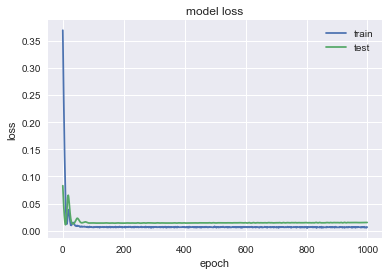

                IBM
MSE         153.325
MAE          8.9705
R2        0.0262653
MAPE (%)    6.82391


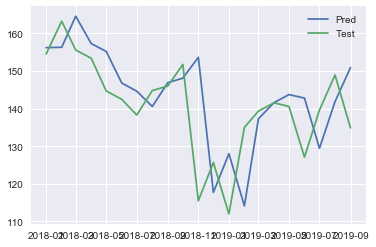

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1250 - val_loss: 0.2447
Epoch 2/1000
0s - loss: 0.1089 - val_loss: 0.2111
Epoch 3/1000
0s - loss: 0.0935 - val_loss: 0.1796
Epoch 4/1000
0s - loss: 0.0802 - val_loss: 0.1500
Epoch 5/1000
0s - loss: 0.0658 - val_loss: 0.1223
Epoch 6/1000
0s - loss: 0.0537 - val_loss: 0.0965
Epoch 7/1000
0s - loss: 0.0426 - val_loss: 0.0730
Epoch 8/1000
0s - loss: 0.0331 - val_loss: 0.0523
Epoch 9/1000
0s - loss: 0.0254 - val_loss: 0.0349
Epoch 10/1000
0s - loss: 0.0181 - val_loss: 0.0214
Epoch 11/1000
0s - loss: 0.0146 - val_loss: 0.0122
Epoch 12/1000
0s - loss: 0.0118 - val_loss: 0.0075
Epoch 13/1000
0s - loss: 0.0130 - val_loss: 0.0065
Epoch 14/1000
0s - loss: 0.0153 - val_loss: 0.0080
Epoch 15/1000
0s - loss: 0.0173 - val_loss: 0.0101
Epoch 16/1000
0s - loss: 0.0193 - val_loss: 0.0115
Epoch 17/1000
0s - loss: 0.0201 - val_loss: 0.0118
Epoch 18/1000
0s - loss: 0.0185 - val_loss: 0.0109
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0031 - val_loss: 0.0089
Epoch 162/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 163/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 164/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 165/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 166/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 167/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 168/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 169/1000
0s - loss: 0.0030 - val_loss: 0.0085
Epoch 170/1000
0s - loss: 0.0030 - val_loss: 0.0085
Epoch 171/1000
0s - loss: 0.0032 - val_loss: 0.0085
Epoch 172/1000
0s - loss: 0.0027 - val_loss: 0.0085
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0084
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 175/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 176/1000
0s - loss: 0.0033 - val_loss: 0.0083
Epoch 177/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 178/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 179/1000
0s - loss: 0.0031 - val_loss: 0.0083
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0094
Epoch 324/1000
0s - loss: 0.0028 - val_loss: 0.0093
Epoch 325/1000
0s - loss: 0.0029 - val_loss: 0.0093
Epoch 326/1000
0s - loss: 0.0028 - val_loss: 0.0090
Epoch 327/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 328/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 329/1000
0s - loss: 0.0029 - val_loss: 0.0082
Epoch 330/1000
0s - loss: 0.0028 - val_loss: 0.0080
Epoch 331/1000
0s - loss: 0.0032 - val_loss: 0.0080
Epoch 332/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 333/1000
0s - loss: 0.0030 - val_loss: 0.0086
Epoch 334/1000
0s - loss: 0.0026 - val_loss: 0.0089
Epoch 335/1000
0s - loss: 0.0027 - val_loss: 0.0091
Epoch 336/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 337/1000
0s - loss: 0.0026 - val_loss: 0.0094
Epoch 338/1000
0s - loss: 0.0027 - val_loss: 0.0094
Epoch 339/1000
0s - loss: 0.0029 - val_loss: 0.0092
Epoch 340/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 341/1000
0s - loss: 0.0027 - val_loss: 0.0083
Epoch 342/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0087
Epoch 482/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 483/1000
0s - loss: 0.0029 - val_loss: 0.0086
Epoch 484/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 485/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 486/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 487/1000
0s - loss: 0.0025 - val_loss: 0.0088
Epoch 488/1000
0s - loss: 0.0023 - val_loss: 0.0088
Epoch 489/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 490/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 491/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 492/1000
0s - loss: 0.0027 - val_loss: 0.0086
Epoch 493/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 494/1000
0s - loss: 0.0029 - val_loss: 0.0085
Epoch 495/1000
0s - loss: 0.0033 - val_loss: 0.0083
Epoch 496/1000
0s - loss: 0.0032 - val_loss: 0.0081
Epoch 497/1000
0s - loss: 0.0028 - val_loss: 0.0082
Epoch 498/1000
0s - loss: 0.0028 - val_loss: 0.0083
Epoch 499/1000
0s - loss: 0.0027 - val_loss: 0.0086
Epoch 500/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0090
Epoch 644/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 645/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 646/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 647/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 648/1000
0s - loss: 0.0028 - val_loss: 0.0088
Epoch 649/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 650/1000
0s - loss: 0.0030 - val_loss: 0.0089
Epoch 651/1000
0s - loss: 0.0030 - val_loss: 0.0088
Epoch 652/1000
0s - loss: 0.0025 - val_loss: 0.0090
Epoch 653/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 654/1000
0s - loss: 0.0028 - val_loss: 0.0092
Epoch 655/1000
0s - loss: 0.0030 - val_loss: 0.0093
Epoch 656/1000
0s - loss: 0.0029 - val_loss: 0.0091
Epoch 657/1000
0s - loss: 0.0033 - val_loss: 0.0086
Epoch 658/1000
0s - loss: 0.0026 - val_loss: 0.0083
Epoch 659/1000
0s - loss: 0.0027 - val_loss: 0.0082
Epoch 660/1000
0s - loss: 0.0027 - val_loss: 0.0082
Epoch 661/1000
0s - loss: 0.0036 - val_loss: 0.0084
Epoch 662/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0081
Epoch 809/1000
0s - loss: 0.0029 - val_loss: 0.0083
Epoch 810/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 811/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 812/1000
0s - loss: 0.0034 - val_loss: 0.0087
Epoch 813/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 814/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 815/1000
0s - loss: 0.0027 - val_loss: 0.0087
Epoch 816/1000
0s - loss: 0.0027 - val_loss: 0.0088
Epoch 817/1000
0s - loss: 0.0029 - val_loss: 0.0088
Epoch 818/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 819/1000
0s - loss: 0.0029 - val_loss: 0.0090
Epoch 820/1000
0s - loss: 0.0029 - val_loss: 0.0089
Epoch 821/1000
0s - loss: 0.0027 - val_loss: 0.0087
Epoch 822/1000
0s - loss: 0.0028 - val_loss: 0.0084
Epoch 823/1000
0s - loss: 0.0030 - val_loss: 0.0083
Epoch 824/1000
0s - loss: 0.0031 - val_loss: 0.0084
Epoch 825/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 826/1000
0s - loss: 0.0029 - val_loss: 0.0087
Epoch 827/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0088
Epoch 974/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 975/1000
0s - loss: 0.0027 - val_loss: 0.0084
Epoch 976/1000
0s - loss: 0.0028 - val_loss: 0.0086
Epoch 977/1000
0s - loss: 0.0028 - val_loss: 0.0089
Epoch 978/1000
0s - loss: 0.0027 - val_loss: 0.0092
Epoch 979/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 980/1000
0s - loss: 0.0031 - val_loss: 0.0091
Epoch 981/1000
0s - loss: 0.0028 - val_loss: 0.0087
Epoch 982/1000
0s - loss: 0.0030 - val_loss: 0.0082
Epoch 983/1000
0s - loss: 0.0027 - val_loss: 0.0080
Epoch 984/1000
0s - loss: 0.0029 - val_loss: 0.0080
Epoch 985/1000
0s - loss: 0.0030 - val_loss: 0.0079
Epoch 986/1000
0s - loss: 0.0027 - val_loss: 0.0080
Epoch 987/1000
0s - loss: 0.0029 - val_loss: 0.0084
Epoch 988/1000
0s - loss: 0.0031 - val_loss: 0.0087
Epoch 989/1000
0s - loss: 0.0027 - val_loss: 0.0089
Epoch 990/1000
0s - loss: 0.0031 - val_loss: 0.0089
Epoch 991/1000
0s - loss: 0.0028 - val_loss: 0.0085
Epoch 992/1000
0s - loss: 0

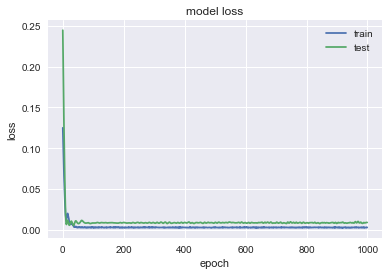

               ALB
MSE        101.345
MAE        7.77015
R2        0.694479
MAPE (%)   9.17281


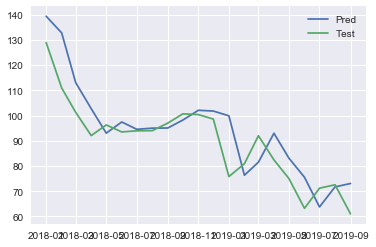

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1461 - val_loss: 0.6357
Epoch 2/1000
0s - loss: 0.1265 - val_loss: 0.5606
Epoch 3/1000
0s - loss: 0.1089 - val_loss: 0.4891
Epoch 4/1000
0s - loss: 0.0908 - val_loss: 0.4209
Epoch 5/1000
0s - loss: 0.0755 - val_loss: 0.3559
Epoch 6/1000
0s - loss: 0.0606 - val_loss: 0.2942
Epoch 7/1000
0s - loss: 0.0474 - val_loss: 0.2365
Epoch 8/1000
0s - loss: 0.0363 - val_loss: 0.1833
Epoch 9/1000
0s - loss: 0.0259 - val_loss: 0.1358
Epoch 10/1000
0s - loss: 0.0170 - val_loss: 0.0949
Epoch 11/1000
0s - loss: 0.0124 - val_loss: 0.0618
Epoch 12/1000
0s - loss: 0.0100 - val_loss: 0.0371
Epoch 13/1000
0s - loss: 0.0105 - val_loss: 0.0208
Epoch 14/1000
0s - loss: 0.0127 - val_loss: 0.0118
Epoch 15/1000
0s - loss: 0.0162 - val_loss: 0.0078
Epoch 16/1000
0s - loss: 0.0183 - val_loss: 0.0064
Epoch 17/1000
0s - loss: 0.0204 - val_loss: 0.0061
Epoch 18/1000
0s - loss: 0.0207 - val_loss: 0.0063
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0067
Epoch 165/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 166/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 167/1000
0s - loss: 0.0029 - val_loss: 0.0067
Epoch 168/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 169/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 170/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 171/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 172/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 173/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 174/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 175/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 176/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 177/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 178/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 179/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 180/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 181/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 182/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 183/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0067
Epoch 332/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 333/1000
0s - loss: 0.0030 - val_loss: 0.0069
Epoch 334/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 335/1000
0s - loss: 0.0030 - val_loss: 0.0070
Epoch 336/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 337/1000
0s - loss: 0.0031 - val_loss: 0.0070
Epoch 338/1000
0s - loss: 0.0032 - val_loss: 0.0069
Epoch 339/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 340/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 341/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 342/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 343/1000
0s - loss: 0.0029 - val_loss: 0.0067
Epoch 344/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 345/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 346/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 347/1000
0s - loss: 0.0028 - val_loss: 0.0069
Epoch 348/1000
0s - loss: 0.0035 - val_loss: 0.0070
Epoch 349/1000
0s - loss: 0.0029 - val_loss: 0.0071
Epoch 350/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0068
Epoch 492/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 493/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 494/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 495/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 496/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 497/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 498/1000
0s - loss: 0.0036 - val_loss: 0.0068
Epoch 499/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 500/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 501/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 502/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 503/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 504/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 505/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 506/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 507/1000
0s - loss: 0.0032 - val_loss: 0.0067
Epoch 508/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 509/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 510/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0069
Epoch 652/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 653/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 654/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 655/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 656/1000
0s - loss: 0.0036 - val_loss: 0.0067
Epoch 657/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 658/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 659/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 660/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 661/1000
0s - loss: 0.0028 - val_loss: 0.0069
Epoch 662/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 663/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 664/1000
0s - loss: 0.0035 - val_loss: 0.0067
Epoch 665/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 666/1000
0s - loss: 0.0034 - val_loss: 0.0067
Epoch 667/1000
0s - loss: 0.0031 - val_loss: 0.0067
Epoch 668/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 669/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 670/1000
0s - loss: 0

0s - loss: 0.0033 - val_loss: 0.0067
Epoch 815/1000
0s - loss: 0.0033 - val_loss: 0.0066
Epoch 816/1000
0s - loss: 0.0035 - val_loss: 0.0066
Epoch 817/1000
0s - loss: 0.0031 - val_loss: 0.0068
Epoch 818/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 819/1000
0s - loss: 0.0032 - val_loss: 0.0071
Epoch 820/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 821/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 822/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 823/1000
0s - loss: 0.0034 - val_loss: 0.0066
Epoch 824/1000
0s - loss: 0.0033 - val_loss: 0.0067
Epoch 825/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 826/1000
0s - loss: 0.0029 - val_loss: 0.0070
Epoch 827/1000
0s - loss: 0.0034 - val_loss: 0.0071
Epoch 828/1000
0s - loss: 0.0035 - val_loss: 0.0072
Epoch 829/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 830/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 831/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 832/1000
0s - loss: 0.0032 - val_loss: 0.0066
Epoch 833/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0068
Epoch 975/1000
0s - loss: 0.0035 - val_loss: 0.0068
Epoch 976/1000
0s - loss: 0.0031 - val_loss: 0.0070
Epoch 977/1000
0s - loss: 0.0035 - val_loss: 0.0071
Epoch 978/1000
0s - loss: 0.0032 - val_loss: 0.0070
Epoch 979/1000
0s - loss: 0.0031 - val_loss: 0.0069
Epoch 980/1000
0s - loss: 0.0029 - val_loss: 0.0068
Epoch 981/1000
0s - loss: 0.0032 - val_loss: 0.0068
Epoch 982/1000
0s - loss: 0.0030 - val_loss: 0.0068
Epoch 983/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 984/1000
0s - loss: 0.0030 - val_loss: 0.0069
Epoch 985/1000
0s - loss: 0.0034 - val_loss: 0.0069
Epoch 986/1000
0s - loss: 0.0035 - val_loss: 0.0069
Epoch 987/1000
0s - loss: 0.0034 - val_loss: 0.0068
Epoch 988/1000
0s - loss: 0.0030 - val_loss: 0.0067
Epoch 989/1000
0s - loss: 0.0033 - val_loss: 0.0068
Epoch 990/1000
0s - loss: 0.0033 - val_loss: 0.0069
Epoch 991/1000
0s - loss: 0.0031 - val_loss: 0.0070
Epoch 992/1000
0s - loss: 0.0033 - val_loss: 0.0071
Epoch 993/1000
0s - loss: 0

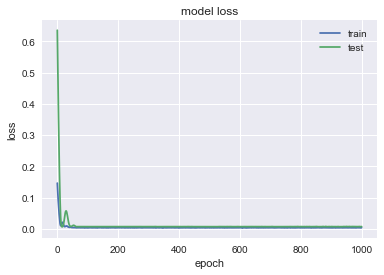

               CBRE
MSE          11.768
MAE         2.82527
R2       -0.0388507
MAPE (%)    6.04227


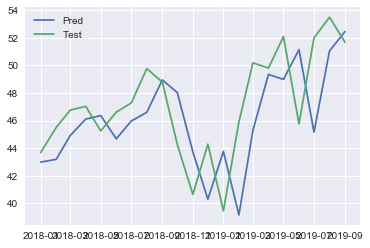

In [134]:
pred_gru_4 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_gru_4[comp] = nn_forec_GRU(df,comp,n_train_time=test.shape[0],first_layer = 256,second_layer=128).values

In [135]:
gru_uni_64_32 = eval(pred_gru_1,test,companies=companies)
gru_uni_64_32

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.62676,57.0848,4.49291,8.7053,1800.98,41.798,2119.56,146.596,99.2043,11.541
MAE,1.23224,6.46482,1.88061,2.27318,35.7952,4.8338,36.1251,8.71011,7.67663,2.77975
R2,0.569504,-0.191064,0.228969,0.394867,0.346211,0.313102,-0.29923,-0.00504706,0.693312,0.00795089
MAPE (%),3.76066,9.69956,3.92722,9.05456,7.8681,8.22644,10.2645,6.63299,9.09154,5.95815


In [136]:
gru_uni_64_32.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.63 &  57.08 &  4.49 &  8.71 &  1800.98 &  41.80 &  2119.56 &  146.60 &  99.20 &  11.54 \\\\\nMAE      &  1.23 &   6.46 &  1.88 &  2.27 &    35.80 &   4.83 &    36.13 &    8.71 &   7.68 &   2.78 \\\\\nR2       &  0.57 &  -0.19 &  0.23 &  0.39 &     0.35 &   0.31 &    -0.30 &   -0.01 &   0.69 &   0.01 \\\\\nMAPE (\\%) &  3.76 &   9.70 &  3.93 &  9.05 &     7.87 &   8.23 &    10.26 &    6.63 &   9.09 &   5.96 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [137]:
print("Average = ",gru_uni_64_32.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.447999999999999


In [138]:
gru_uni_32_16 = eval(pred_gru_2,test,companies=companies)
gru_uni_32_16

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.58571,56.721,4.32539,8.72392,1630.67,41.607,1928.2,143.278,96.7131,11.7814
MAE,1.21775,6.53341,1.84435,2.29526,34.386,4.90205,34.7204,8.50315,7.59082,2.80559
R2,0.570926,-0.205686,0.305774,0.325188,0.386022,0.321688,-0.244084,-0.106075,0.700999,0.0476854
MAPE (%),3.71234,9.77255,3.86215,9.1784,7.55548,8.29684,9.84966,6.49064,8.99547,6.01626


In [139]:
gru_uni_32_16.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.59 &  56.72 &  4.33 &  8.72 &  1630.67 &  41.61 &  1928.20 &  143.28 &  96.71 &  11.78 \\\\\nMAE      &  1.22 &   6.53 &  1.84 &  2.30 &    34.39 &   4.90 &    34.72 &    8.50 &   7.59 &   2.81 \\\\\nR2       &  0.57 &  -0.21 &  0.31 &  0.33 &     0.39 &   0.32 &    -0.24 &   -0.11 &   0.70 &   0.05 \\\\\nMAPE (\\%) &  3.71 &   9.77 &  3.86 &  9.18 &     7.56 &   8.30 &     9.85 &    6.49 &   9.00 &   6.02 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [140]:
print("Average = ",gru_uni_32_16.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.374


In [141]:
gru_uni_128_64 = eval(pred_gru_3,test,companies=companies)
gru_uni_128_64

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.70645,56.9479,4.53643,8.56427,1770.59,42.009,2022.15,150.778,97.0613,11.3923
MAE,1.25351,6.57227,1.87219,2.26325,35.6119,4.82588,35.4505,8.87766,7.59242,2.75022
R2,0.55199,-0.208265,0.152977,0.439984,0.361353,0.309013,-0.217936,0.0192636,0.698884,0.0206774
MAPE (%),3.83364,9.81881,3.90008,8.97952,7.82327,8.22494,10.058,6.75511,8.99846,5.90106


In [142]:
gru_uni_128_64.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &    ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.71 &  56.95 &  4.54 &  8.56 &  1770.59 &  42.01 &  2022.15 &  150.78 &  97.06 &  11.39 \\\\\nMAE      &  1.25 &   6.57 &  1.87 &  2.26 &    35.61 &   4.83 &    35.45 &    8.88 &   7.59 &   2.75 \\\\\nR2       &  0.55 &  -0.21 &  0.15 &  0.44 &     0.36 &   0.31 &    -0.22 &    0.02 &   0.70 &   0.02 \\\\\nMAPE (\\%) &  3.83 &   9.82 &  3.90 &  8.98 &     7.82 &   8.22 &    10.06 &    6.76 &   9.00 &   5.90 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [143]:
print("Average = ",gru_uni_128_64.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.429


In [144]:
gru_uni_256_128 = eval(pred_gru_4,test,companies=companies)
gru_uni_256_128

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.70492,57.3304,4.79405,8.99697,1738.46,42.5572,1925.38,153.325,101.345,11.768
MAE,1.25306,6.46212,1.93519,2.30132,35.4054,4.83965,34.8196,8.9705,7.77015,2.82527
R2,0.554662,-0.185738,0.0876812,0.435898,0.377373,0.301499,-0.176111,0.0262653,0.694479,-0.0388507
MAPE (%),3.83151,9.70144,4.02544,9.14742,7.77322,8.27442,9.86646,6.82391,9.17281,6.04227


In [145]:
gru_uni_256_128.astype(float).round(2).to_latex()

'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &     T &    BBY &    KO &   FTI &      BLK &    DVA &       BA &     IBM &     ALB &   CBRE \\\\\n\\midrule\nMSE      &  2.70 &  57.33 &  4.79 &  9.00 &  1738.46 &  42.56 &  1925.38 &  153.33 &  101.34 &  11.77 \\\\\nMAE      &  1.25 &   6.46 &  1.94 &  2.30 &    35.41 &   4.84 &    34.82 &    8.97 &    7.77 &   2.83 \\\\\nR2       &  0.55 &  -0.19 &  0.09 &  0.44 &     0.38 &   0.30 &    -0.18 &    0.03 &    0.69 &  -0.04 \\\\\nMAPE (\\%) &  3.83 &   9.70 &  4.03 &  9.15 &     7.77 &   8.27 &     9.87 &    6.82 &    9.17 &   6.04 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [146]:
print("Average = ",gru_uni_256_128.astype(float).round(2).loc['MAPE (%)',:].mean())

Average =  7.465000000000001


## Multivariate Forecasting using LSTM

In [330]:
companies = ["T","BBY","KO","FTI","BLK","DVA","BA","IBM","ALB","CBRE"] 
#AT&T,Best Buy, TechnitFMPI, Coca Cola, Blackrock, Davita Inc.,Boeing,IBM,Albemarle Corp, CBRE Group
df = pd.DataFrame(columns = companies)
df["T"] = yf.download("T",'2010-01-01','2019-09-11',interval = '1mo')["Open"]
for i in companies[1:]:
    z = yf.download(i,'2010-01-01','2019-09-11',interval = '1mo')["Open"]
    z = pd.DataFrame(z.values,columns=[i],index=z.index)
    df = pd.merge(df,z,left_on=df.index,right_on=z.index)
    df = df.set_index("key_0")
df = df.drop(list(df.columns[1:10]),axis = 1)
df.columns = companies
df = df.dropna()

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded


In [331]:
train = df[:"2018-01-01"].copy()
test = df["2018-01-01":].copy()
print("Train has shape",train.shape)
print("Test has shape",test.shape)

Train has shape (97, 10)
Test has shape (21, 10)


In [336]:
def nn_forec_multi(df,company_,n_lags = 1,feature_range=(0, 1),n_train_time_ = 172,first_layer = 64,second_layer = 32):
    print("Predicting for ", company_)
    comp = df.copy()

    scaler_1 = MinMaxScaler(feature_range=feature_range)
    scaler = MinMaxScaler(feature_range=feature_range)
    comp[company_] = scaler_1.fit_transform(comp[company_])
    scal_2 = []
    for i in enumerate(list(map(lambda x:  x!= company_, companies))):
        if(i[1]):
            scal_2.append(i[0])
    
    comp.iloc[:,scal_2] = scaler.fit_transform(comp.iloc[:,scal_2])
    
    comp = pd.DataFrame(comp,columns=df.columns,index=df.index)
    for company in companies:
        for i in range(1,n_lags+1):
            comp.loc[:,company+"(t-"+str(i)+")"] = comp[company].shift(i)
    
    comp = comp.dropna()
    cols_to_del = []
    for c in companies:
        if c != company_:
            cols_to_del.append(c)
    comp = comp.drop(cols_to_del,axis = 1)
    values = comp.values

    n_train_time = n_train_time_
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))




    model = Sequential()
    model.add(LSTM(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(LSTM(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='Adamax')



    # fit network
    history = model.fit(train_X, train_y, epochs=700, batch_size=150, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    print(test_X.shape)
    # invert scaling for forecast
    inv_yhat_sc = scaler_1.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler_1.inverse_transform(test_y)
    test = df["2018-01-01":].copy()
    train = df[:"2018-01-01"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company_],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company_])
    print(lstm_eval)
    
    plt.plot(predictions[company_])
    plt.plot(test[company_])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3318 - val_loss: 0.2397
Epoch 2/700
0s - loss: 0.3142 - val_loss: 0.2213
Epoch 3/700
0s - loss: 0.2962 - val_loss: 0.2041
Epoch 4/700
0s - loss: 0.2806 - val_loss: 0.1878
Epoch 5/700
0s - loss: 0.2660 - val_loss: 0.1722
Epoch 6/700
0s - loss: 0.2491 - val_loss: 0.1572
Epoch 7/700
0s - loss: 0.2347 - val_loss: 0.1427
Epoch 8/700
0s - loss: 0.2229 - val_loss: 0.1286
Epoch 9/700
0s - loss: 0.2097 - val_loss: 0.1149
Epoch 10/700
0s - loss: 0.1951 - val_loss: 0.1017
Epoch 11/700
0s - loss: 0.1793 - val_loss: 0.0889
Epoch 12/700
0s - loss: 0.1660 - val_loss: 0.0767
Epoch 13/700
0s - loss: 0.1553 - val_loss: 0.0650
Epoch 14/700
0s - loss: 0.1412 - val_loss: 0.0540
Epoch 15/700
0s - loss: 0.1266 - val_loss: 0.0439
Epoch 16/700
0s - loss: 0.1149 - val_loss: 0.0348
Epoch 17/700
0s - loss: 0.1006 - val_loss: 0.0270
Epoch 18/700
0s - loss: 0.0861 - val_loss: 0.0208
Epoch 19/700
0s - loss: 0.0772 - val_loss: 0.01

0s - loss: 0.0153 - val_loss: 0.0637
Epoch 185/700
0s - loss: 0.0126 - val_loss: 0.0627
Epoch 186/700
0s - loss: 0.0138 - val_loss: 0.0616
Epoch 187/700
0s - loss: 0.0152 - val_loss: 0.0605
Epoch 188/700
0s - loss: 0.0141 - val_loss: 0.0596
Epoch 189/700
0s - loss: 0.0152 - val_loss: 0.0589
Epoch 190/700
0s - loss: 0.0144 - val_loss: 0.0579
Epoch 191/700
0s - loss: 0.0131 - val_loss: 0.0571
Epoch 192/700
0s - loss: 0.0146 - val_loss: 0.0566
Epoch 193/700
0s - loss: 0.0116 - val_loss: 0.0562
Epoch 194/700
0s - loss: 0.0121 - val_loss: 0.0558
Epoch 195/700
0s - loss: 0.0124 - val_loss: 0.0557
Epoch 196/700
0s - loss: 0.0127 - val_loss: 0.0557
Epoch 197/700
0s - loss: 0.0119 - val_loss: 0.0555
Epoch 198/700
0s - loss: 0.0127 - val_loss: 0.0555
Epoch 199/700
0s - loss: 0.0117 - val_loss: 0.0555
Epoch 200/700
0s - loss: 0.0124 - val_loss: 0.0551
Epoch 201/700
0s - loss: 0.0138 - val_loss: 0.0544
Epoch 202/700
0s - loss: 0.0119 - val_loss: 0.0537
Epoch 203/700
0s - loss: 0.0127 - val_loss: 0

0s - loss: 0.0080 - val_loss: 0.0072
Epoch 353/700
0s - loss: 0.0074 - val_loss: 0.0073
Epoch 354/700
0s - loss: 0.0083 - val_loss: 0.0073
Epoch 355/700
0s - loss: 0.0082 - val_loss: 0.0074
Epoch 356/700
0s - loss: 0.0093 - val_loss: 0.0074
Epoch 357/700
0s - loss: 0.0077 - val_loss: 0.0074
Epoch 358/700
0s - loss: 0.0084 - val_loss: 0.0073
Epoch 359/700
0s - loss: 0.0077 - val_loss: 0.0073
Epoch 360/700
0s - loss: 0.0076 - val_loss: 0.0073
Epoch 361/700
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 362/700
0s - loss: 0.0079 - val_loss: 0.0072
Epoch 363/700
0s - loss: 0.0079 - val_loss: 0.0072
Epoch 364/700
0s - loss: 0.0093 - val_loss: 0.0072
Epoch 365/700
0s - loss: 0.0085 - val_loss: 0.0072
Epoch 366/700
0s - loss: 0.0087 - val_loss: 0.0072
Epoch 367/700
0s - loss: 0.0084 - val_loss: 0.0073
Epoch 368/700
0s - loss: 0.0079 - val_loss: 0.0074
Epoch 369/700
0s - loss: 0.0069 - val_loss: 0.0075
Epoch 370/700
0s - loss: 0.0088 - val_loss: 0.0075
Epoch 371/700
0s - loss: 0.0086 - val_loss: 0

0s - loss: 0.0070 - val_loss: 0.0083
Epoch 521/700
0s - loss: 0.0077 - val_loss: 0.0083
Epoch 522/700
0s - loss: 0.0086 - val_loss: 0.0082
Epoch 523/700
0s - loss: 0.0081 - val_loss: 0.0083
Epoch 524/700
0s - loss: 0.0092 - val_loss: 0.0083
Epoch 525/700
0s - loss: 0.0069 - val_loss: 0.0084
Epoch 526/700
0s - loss: 0.0084 - val_loss: 0.0084
Epoch 527/700
0s - loss: 0.0070 - val_loss: 0.0085
Epoch 528/700
0s - loss: 0.0080 - val_loss: 0.0085
Epoch 529/700
0s - loss: 0.0090 - val_loss: 0.0085
Epoch 530/700
0s - loss: 0.0077 - val_loss: 0.0084
Epoch 531/700
0s - loss: 0.0082 - val_loss: 0.0084
Epoch 532/700
0s - loss: 0.0081 - val_loss: 0.0083
Epoch 533/700
0s - loss: 0.0072 - val_loss: 0.0084
Epoch 534/700
0s - loss: 0.0092 - val_loss: 0.0084
Epoch 535/700
0s - loss: 0.0066 - val_loss: 0.0084
Epoch 536/700
0s - loss: 0.0082 - val_loss: 0.0084
Epoch 537/700
0s - loss: 0.0074 - val_loss: 0.0084
Epoch 538/700
0s - loss: 0.0085 - val_loss: 0.0084
Epoch 539/700
0s - loss: 0.0078 - val_loss: 0

0s - loss: 0.0072 - val_loss: 0.0084
Epoch 688/700
0s - loss: 0.0080 - val_loss: 0.0084
Epoch 689/700
0s - loss: 0.0058 - val_loss: 0.0084
Epoch 690/700
0s - loss: 0.0075 - val_loss: 0.0085
Epoch 691/700
0s - loss: 0.0069 - val_loss: 0.0088
Epoch 692/700
0s - loss: 0.0079 - val_loss: 0.0092
Epoch 693/700
0s - loss: 0.0071 - val_loss: 0.0096
Epoch 694/700
0s - loss: 0.0073 - val_loss: 0.0098
Epoch 695/700
0s - loss: 0.0073 - val_loss: 0.0100
Epoch 696/700
0s - loss: 0.0077 - val_loss: 0.0101
Epoch 697/700
0s - loss: 0.0070 - val_loss: 0.0101
Epoch 698/700
0s - loss: 0.0082 - val_loss: 0.0099
Epoch 699/700
0s - loss: 0.0083 - val_loss: 0.0098
Epoch 700/700
0s - loss: 0.0060 - val_loss: 0.0094


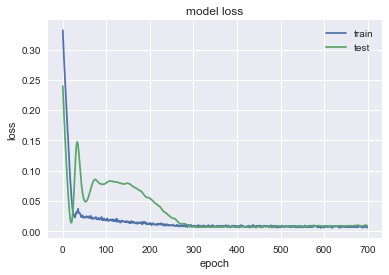

(21, 1, 10)
                T
MSE       3.40191
MAE       1.51015
R2        0.32162
MAPE (%)  4.54559


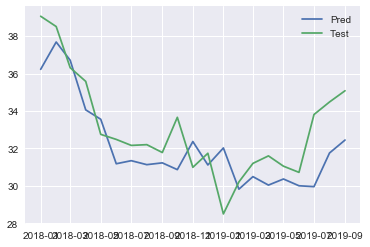

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1259 - val_loss: 0.7111
Epoch 2/700
0s - loss: 0.1164 - val_loss: 0.6802
Epoch 3/700
0s - loss: 0.1070 - val_loss: 0.6505
Epoch 4/700
0s - loss: 0.0988 - val_loss: 0.6217
Epoch 5/700
0s - loss: 0.0907 - val_loss: 0.5931
Epoch 6/700
0s - loss: 0.0841 - val_loss: 0.5644
Epoch 7/700
0s - loss: 0.0760 - val_loss: 0.5356
Epoch 8/700
0s - loss: 0.0700 - val_loss: 0.5064
Epoch 9/700
0s - loss: 0.0637 - val_loss: 0.4770
Epoch 10/700
0s - loss: 0.0577 - val_loss: 0.4472
Epoch 11/700
0s - loss: 0.0513 - val_loss: 0.4171
Epoch 12/700
0s - loss: 0.0456 - val_loss: 0.3869
Epoch 13/700
0s - loss: 0.0398 - val_loss: 0.3566
Epoch 14/700
0s - loss: 0.0360 - val_loss: 0.3265
Epoch 15/700
0s - loss: 0.0309 - val_loss: 0.2971
Epoch 16/700
0s - loss: 0.0273 - val_loss: 0.2687
Epoch 17/700
0s - loss: 0.0242 - val_loss: 0.2419
Epoch 18/700
0s - loss: 0.0233 - val_loss: 0.2169
Epoch 19/700
0s - loss: 0.0224 - val_loss: 0.

0s - loss: 0.0045 - val_loss: 0.0086
Epoch 184/700
0s - loss: 0.0050 - val_loss: 0.0086
Epoch 185/700
0s - loss: 0.0048 - val_loss: 0.0086
Epoch 186/700
0s - loss: 0.0050 - val_loss: 0.0086
Epoch 187/700
0s - loss: 0.0043 - val_loss: 0.0087
Epoch 188/700
0s - loss: 0.0046 - val_loss: 0.0087
Epoch 189/700
0s - loss: 0.0055 - val_loss: 0.0088
Epoch 190/700
0s - loss: 0.0041 - val_loss: 0.0088
Epoch 191/700
0s - loss: 0.0047 - val_loss: 0.0089
Epoch 192/700
0s - loss: 0.0042 - val_loss: 0.0088
Epoch 193/700
0s - loss: 0.0043 - val_loss: 0.0088
Epoch 194/700
0s - loss: 0.0043 - val_loss: 0.0088
Epoch 195/700
0s - loss: 0.0044 - val_loss: 0.0087
Epoch 196/700
0s - loss: 0.0043 - val_loss: 0.0087
Epoch 197/700
0s - loss: 0.0049 - val_loss: 0.0087
Epoch 198/700
0s - loss: 0.0045 - val_loss: 0.0087
Epoch 199/700
0s - loss: 0.0043 - val_loss: 0.0088
Epoch 200/700
0s - loss: 0.0037 - val_loss: 0.0089
Epoch 201/700
0s - loss: 0.0049 - val_loss: 0.0089
Epoch 202/700
0s - loss: 0.0047 - val_loss: 0

0s - loss: 0.0037 - val_loss: 0.0101
Epoch 345/700
0s - loss: 0.0034 - val_loss: 0.0102
Epoch 346/700
0s - loss: 0.0036 - val_loss: 0.0102
Epoch 347/700
0s - loss: 0.0039 - val_loss: 0.0102
Epoch 348/700
0s - loss: 0.0032 - val_loss: 0.0102
Epoch 349/700
0s - loss: 0.0035 - val_loss: 0.0101
Epoch 350/700
0s - loss: 0.0033 - val_loss: 0.0102
Epoch 351/700
0s - loss: 0.0039 - val_loss: 0.0102
Epoch 352/700
0s - loss: 0.0032 - val_loss: 0.0101
Epoch 353/700
0s - loss: 0.0037 - val_loss: 0.0101
Epoch 354/700
0s - loss: 0.0029 - val_loss: 0.0101
Epoch 355/700
0s - loss: 0.0031 - val_loss: 0.0101
Epoch 356/700
0s - loss: 0.0030 - val_loss: 0.0100
Epoch 357/700
0s - loss: 0.0032 - val_loss: 0.0100
Epoch 358/700
0s - loss: 0.0040 - val_loss: 0.0100
Epoch 359/700
0s - loss: 0.0035 - val_loss: 0.0100
Epoch 360/700
0s - loss: 0.0042 - val_loss: 0.0102
Epoch 361/700
0s - loss: 0.0033 - val_loss: 0.0104
Epoch 362/700
0s - loss: 0.0032 - val_loss: 0.0106
Epoch 363/700
0s - loss: 0.0035 - val_loss: 0

0s - loss: 0.0030 - val_loss: 0.0130
Epoch 508/700
0s - loss: 0.0033 - val_loss: 0.0130
Epoch 509/700
0s - loss: 0.0033 - val_loss: 0.0130
Epoch 510/700
0s - loss: 0.0034 - val_loss: 0.0131
Epoch 511/700
0s - loss: 0.0034 - val_loss: 0.0131
Epoch 512/700
0s - loss: 0.0036 - val_loss: 0.0131
Epoch 513/700
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 514/700
0s - loss: 0.0038 - val_loss: 0.0128
Epoch 515/700
0s - loss: 0.0027 - val_loss: 0.0128
Epoch 516/700
0s - loss: 0.0042 - val_loss: 0.0128
Epoch 517/700
0s - loss: 0.0032 - val_loss: 0.0130
Epoch 518/700
0s - loss: 0.0032 - val_loss: 0.0132
Epoch 519/700
0s - loss: 0.0030 - val_loss: 0.0134
Epoch 520/700
0s - loss: 0.0032 - val_loss: 0.0138
Epoch 521/700
0s - loss: 0.0030 - val_loss: 0.0140
Epoch 522/700
0s - loss: 0.0033 - val_loss: 0.0142
Epoch 523/700
0s - loss: 0.0032 - val_loss: 0.0143
Epoch 524/700
0s - loss: 0.0033 - val_loss: 0.0143
Epoch 525/700
0s - loss: 0.0031 - val_loss: 0.0142
Epoch 526/700
0s - loss: 0.0035 - val_loss: 0

0s - loss: 0.0031 - val_loss: 0.0147
Epoch 682/700
0s - loss: 0.0033 - val_loss: 0.0148
Epoch 683/700
0s - loss: 0.0036 - val_loss: 0.0148
Epoch 684/700
0s - loss: 0.0034 - val_loss: 0.0148
Epoch 685/700
0s - loss: 0.0032 - val_loss: 0.0149
Epoch 686/700
0s - loss: 0.0032 - val_loss: 0.0148
Epoch 687/700
0s - loss: 0.0037 - val_loss: 0.0147
Epoch 688/700
0s - loss: 0.0032 - val_loss: 0.0147
Epoch 689/700
0s - loss: 0.0030 - val_loss: 0.0145
Epoch 690/700
0s - loss: 0.0031 - val_loss: 0.0146
Epoch 691/700
0s - loss: 0.0029 - val_loss: 0.0147
Epoch 692/700
0s - loss: 0.0035 - val_loss: 0.0146
Epoch 693/700
0s - loss: 0.0031 - val_loss: 0.0148
Epoch 694/700
0s - loss: 0.0031 - val_loss: 0.0150
Epoch 695/700
0s - loss: 0.0043 - val_loss: 0.0150
Epoch 696/700
0s - loss: 0.0031 - val_loss: 0.0149
Epoch 697/700
0s - loss: 0.0034 - val_loss: 0.0147
Epoch 698/700
0s - loss: 0.0032 - val_loss: 0.0145
Epoch 699/700
0s - loss: 0.0032 - val_loss: 0.0141
Epoch 700/700
0s - loss: 0.0032 - val_loss: 0

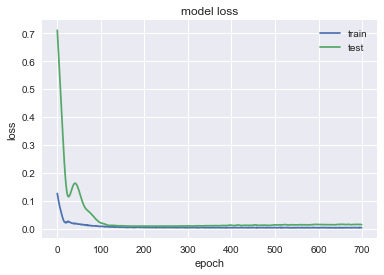

(21, 1, 10)
               BBY
MSE        63.3757
MAE        6.93641
R2       -0.979158
MAPE (%)   9.86906


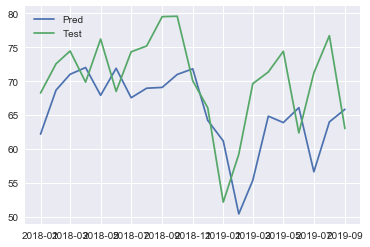

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.2319 - val_loss: 0.5120
Epoch 2/700
0s - loss: 0.2172 - val_loss: 0.4872
Epoch 3/700
0s - loss: 0.2048 - val_loss: 0.4634
Epoch 4/700
0s - loss: 0.1925 - val_loss: 0.4399
Epoch 5/700
0s - loss: 0.1805 - val_loss: 0.4165
Epoch 6/700
0s - loss: 0.1679 - val_loss: 0.3931
Epoch 7/700
0s - loss: 0.1573 - val_loss: 0.3694
Epoch 8/700
0s - loss: 0.1455 - val_loss: 0.3454
Epoch 9/700
0s - loss: 0.1345 - val_loss: 0.3210
Epoch 10/700
0s - loss: 0.1209 - val_loss: 0.2965
Epoch 11/700
0s - loss: 0.1092 - val_loss: 0.2718
Epoch 12/700
0s - loss: 0.0984 - val_loss: 0.2469
Epoch 13/700
0s - loss: 0.0877 - val_loss: 0.2219
Epoch 14/700
0s - loss: 0.0758 - val_loss: 0.1970
Epoch 15/700
0s - loss: 0.0659 - val_loss: 0.1724
Epoch 16/700
0s - loss: 0.0563 - val_loss: 0.1484
Epoch 17/700
0s - loss: 0.0449 - val_loss: 0.1252
Epoch 18/700
0s - loss: 0.0360 - val_loss: 0.1035
Epoch 19/700
0s - loss: 0.0294 - val_loss: 0.0

0s - loss: 0.0061 - val_loss: 0.0214
Epoch 178/700
0s - loss: 0.0054 - val_loss: 0.0214
Epoch 179/700
0s - loss: 0.0057 - val_loss: 0.0215
Epoch 180/700
0s - loss: 0.0065 - val_loss: 0.0216
Epoch 181/700
0s - loss: 0.0053 - val_loss: 0.0217
Epoch 182/700
0s - loss: 0.0073 - val_loss: 0.0218
Epoch 183/700
0s - loss: 0.0052 - val_loss: 0.0218
Epoch 184/700
0s - loss: 0.0046 - val_loss: 0.0218
Epoch 185/700
0s - loss: 0.0050 - val_loss: 0.0218
Epoch 186/700
0s - loss: 0.0053 - val_loss: 0.0219
Epoch 187/700
0s - loss: 0.0049 - val_loss: 0.0219
Epoch 188/700
0s - loss: 0.0055 - val_loss: 0.0219
Epoch 189/700
0s - loss: 0.0056 - val_loss: 0.0219
Epoch 190/700
0s - loss: 0.0057 - val_loss: 0.0219
Epoch 191/700
0s - loss: 0.0061 - val_loss: 0.0219
Epoch 192/700
0s - loss: 0.0052 - val_loss: 0.0219
Epoch 193/700
0s - loss: 0.0057 - val_loss: 0.0219
Epoch 194/700
0s - loss: 0.0047 - val_loss: 0.0218
Epoch 195/700
0s - loss: 0.0052 - val_loss: 0.0218
Epoch 196/700
0s - loss: 0.0051 - val_loss: 0

0s - loss: 0.0039 - val_loss: 0.0259
Epoch 349/700
0s - loss: 0.0045 - val_loss: 0.0259
Epoch 350/700
0s - loss: 0.0040 - val_loss: 0.0258
Epoch 351/700
0s - loss: 0.0042 - val_loss: 0.0258
Epoch 352/700
0s - loss: 0.0051 - val_loss: 0.0257
Epoch 353/700
0s - loss: 0.0045 - val_loss: 0.0256
Epoch 354/700
0s - loss: 0.0053 - val_loss: 0.0254
Epoch 355/700
0s - loss: 0.0039 - val_loss: 0.0253
Epoch 356/700
0s - loss: 0.0044 - val_loss: 0.0253
Epoch 357/700
0s - loss: 0.0050 - val_loss: 0.0253
Epoch 358/700
0s - loss: 0.0041 - val_loss: 0.0253
Epoch 359/700
0s - loss: 0.0044 - val_loss: 0.0253
Epoch 360/700
0s - loss: 0.0038 - val_loss: 0.0253
Epoch 361/700
0s - loss: 0.0036 - val_loss: 0.0254
Epoch 362/700
0s - loss: 0.0045 - val_loss: 0.0254
Epoch 363/700
0s - loss: 0.0041 - val_loss: 0.0254
Epoch 364/700
0s - loss: 0.0047 - val_loss: 0.0255
Epoch 365/700
0s - loss: 0.0042 - val_loss: 0.0256
Epoch 366/700
0s - loss: 0.0049 - val_loss: 0.0257
Epoch 367/700
0s - loss: 0.0049 - val_loss: 0

0s - loss: 0.0040 - val_loss: 0.0269
Epoch 514/700
0s - loss: 0.0046 - val_loss: 0.0268
Epoch 515/700
0s - loss: 0.0037 - val_loss: 0.0266
Epoch 516/700
0s - loss: 0.0033 - val_loss: 0.0265
Epoch 517/700
0s - loss: 0.0038 - val_loss: 0.0264
Epoch 518/700
0s - loss: 0.0038 - val_loss: 0.0263
Epoch 519/700
0s - loss: 0.0029 - val_loss: 0.0261
Epoch 520/700
0s - loss: 0.0042 - val_loss: 0.0259
Epoch 521/700
0s - loss: 0.0027 - val_loss: 0.0255
Epoch 522/700
0s - loss: 0.0048 - val_loss: 0.0252
Epoch 523/700
0s - loss: 0.0045 - val_loss: 0.0249
Epoch 524/700
0s - loss: 0.0036 - val_loss: 0.0247
Epoch 525/700
0s - loss: 0.0035 - val_loss: 0.0246
Epoch 526/700
0s - loss: 0.0034 - val_loss: 0.0245
Epoch 527/700
0s - loss: 0.0040 - val_loss: 0.0245
Epoch 528/700
0s - loss: 0.0041 - val_loss: 0.0245
Epoch 529/700
0s - loss: 0.0045 - val_loss: 0.0247
Epoch 530/700
0s - loss: 0.0043 - val_loss: 0.0248
Epoch 531/700
0s - loss: 0.0047 - val_loss: 0.0251
Epoch 532/700
0s - loss: 0.0042 - val_loss: 0

0s - loss: 0.0038 - val_loss: 0.0221
Epoch 676/700
0s - loss: 0.0031 - val_loss: 0.0219
Epoch 677/700
0s - loss: 0.0043 - val_loss: 0.0218
Epoch 678/700
0s - loss: 0.0037 - val_loss: 0.0218
Epoch 679/700
0s - loss: 0.0038 - val_loss: 0.0219
Epoch 680/700
0s - loss: 0.0035 - val_loss: 0.0220
Epoch 681/700
0s - loss: 0.0041 - val_loss: 0.0222
Epoch 682/700
0s - loss: 0.0034 - val_loss: 0.0224
Epoch 683/700
0s - loss: 0.0043 - val_loss: 0.0226
Epoch 684/700
0s - loss: 0.0033 - val_loss: 0.0226
Epoch 685/700
0s - loss: 0.0042 - val_loss: 0.0225
Epoch 686/700
0s - loss: 0.0039 - val_loss: 0.0225
Epoch 687/700
0s - loss: 0.0037 - val_loss: 0.0225
Epoch 688/700
0s - loss: 0.0041 - val_loss: 0.0224
Epoch 689/700
0s - loss: 0.0042 - val_loss: 0.0223
Epoch 690/700
0s - loss: 0.0034 - val_loss: 0.0221
Epoch 691/700
0s - loss: 0.0045 - val_loss: 0.0219
Epoch 692/700
0s - loss: 0.0036 - val_loss: 0.0217
Epoch 693/700
0s - loss: 0.0036 - val_loss: 0.0217
Epoch 694/700
0s - loss: 0.0037 - val_loss: 0

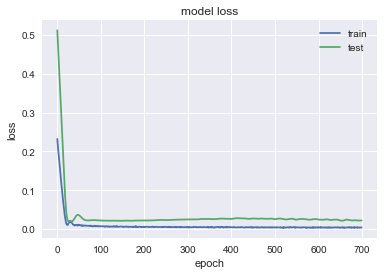

(21, 1, 10)
               KO
MSE       19.6266
MAE        3.4104
R2       -8.36969
MAPE (%)  6.94195


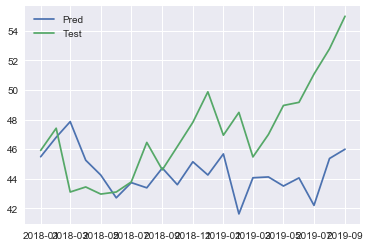

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3301 - val_loss: 0.0426
Epoch 2/700
0s - loss: 0.3152 - val_loss: 0.0371
Epoch 3/700
0s - loss: 0.3022 - val_loss: 0.0324
Epoch 4/700
0s - loss: 0.2891 - val_loss: 0.0281
Epoch 5/700
0s - loss: 0.2772 - val_loss: 0.0243
Epoch 6/700
0s - loss: 0.2654 - val_loss: 0.0208
Epoch 7/700
0s - loss: 0.2555 - val_loss: 0.0176
Epoch 8/700
0s - loss: 0.2433 - val_loss: 0.0148
Epoch 9/700
0s - loss: 0.2333 - val_loss: 0.0123
Epoch 10/700
0s - loss: 0.2196 - val_loss: 0.0103
Epoch 11/700
0s - loss: 0.2087 - val_loss: 0.0088
Epoch 12/700
0s - loss: 0.1993 - val_loss: 0.0079
Epoch 13/700
0s - loss: 0.1876 - val_loss: 0.0076
Epoch 14/700
0s - loss: 0.1775 - val_loss: 0.0082
Epoch 15/700
0s - loss: 0.1684 - val_loss: 0.0097
Epoch 16/700
0s - loss: 0.1539 - val_loss: 0.0122
Epoch 17/700
0s - loss: 0.1467 - val_loss: 0.0161
Epoch 18/700
0s - loss: 0.1413 - val_loss: 0.0214
Epoch 19/700
0s - loss: 0.1274 - val_loss: 0.

0s - loss: 0.0110 - val_loss: 0.0081
Epoch 173/700
0s - loss: 0.0119 - val_loss: 0.0080
Epoch 174/700
0s - loss: 0.0107 - val_loss: 0.0079
Epoch 175/700
0s - loss: 0.0110 - val_loss: 0.0078
Epoch 176/700
0s - loss: 0.0101 - val_loss: 0.0076
Epoch 177/700
0s - loss: 0.0092 - val_loss: 0.0075
Epoch 178/700
0s - loss: 0.0091 - val_loss: 0.0073
Epoch 179/700
0s - loss: 0.0109 - val_loss: 0.0071
Epoch 180/700
0s - loss: 0.0102 - val_loss: 0.0070
Epoch 181/700
0s - loss: 0.0100 - val_loss: 0.0069
Epoch 182/700
0s - loss: 0.0096 - val_loss: 0.0069
Epoch 183/700
0s - loss: 0.0108 - val_loss: 0.0069
Epoch 184/700
0s - loss: 0.0091 - val_loss: 0.0070
Epoch 185/700
0s - loss: 0.0079 - val_loss: 0.0071
Epoch 186/700
0s - loss: 0.0101 - val_loss: 0.0071
Epoch 187/700
0s - loss: 0.0114 - val_loss: 0.0072
Epoch 188/700
0s - loss: 0.0087 - val_loss: 0.0072
Epoch 189/700
0s - loss: 0.0096 - val_loss: 0.0074
Epoch 190/700
0s - loss: 0.0094 - val_loss: 0.0074
Epoch 191/700
0s - loss: 0.0089 - val_loss: 0

0s - loss: 0.0081 - val_loss: 0.0040
Epoch 347/700
0s - loss: 0.0070 - val_loss: 0.0040
Epoch 348/700
0s - loss: 0.0084 - val_loss: 0.0041
Epoch 349/700
0s - loss: 0.0078 - val_loss: 0.0041
Epoch 350/700
0s - loss: 0.0082 - val_loss: 0.0042
Epoch 351/700
0s - loss: 0.0076 - val_loss: 0.0042
Epoch 352/700
0s - loss: 0.0087 - val_loss: 0.0042
Epoch 353/700
0s - loss: 0.0068 - val_loss: 0.0042
Epoch 354/700
0s - loss: 0.0082 - val_loss: 0.0041
Epoch 355/700
0s - loss: 0.0075 - val_loss: 0.0041
Epoch 356/700
0s - loss: 0.0076 - val_loss: 0.0041
Epoch 357/700
0s - loss: 0.0060 - val_loss: 0.0041
Epoch 358/700
0s - loss: 0.0092 - val_loss: 0.0041
Epoch 359/700
0s - loss: 0.0092 - val_loss: 0.0040
Epoch 360/700
0s - loss: 0.0065 - val_loss: 0.0040
Epoch 361/700
0s - loss: 0.0083 - val_loss: 0.0040
Epoch 362/700
0s - loss: 0.0077 - val_loss: 0.0040
Epoch 363/700
0s - loss: 0.0074 - val_loss: 0.0040
Epoch 364/700
0s - loss: 0.0082 - val_loss: 0.0041
Epoch 365/700
0s - loss: 0.0079 - val_loss: 0

0s - loss: 0.0088 - val_loss: 0.0040
Epoch 521/700
0s - loss: 0.0074 - val_loss: 0.0041
Epoch 522/700
0s - loss: 0.0086 - val_loss: 0.0042
Epoch 523/700
0s - loss: 0.0070 - val_loss: 0.0043
Epoch 524/700
0s - loss: 0.0066 - val_loss: 0.0043
Epoch 525/700
0s - loss: 0.0067 - val_loss: 0.0043
Epoch 526/700
0s - loss: 0.0074 - val_loss: 0.0042
Epoch 527/700
0s - loss: 0.0090 - val_loss: 0.0040
Epoch 528/700
0s - loss: 0.0064 - val_loss: 0.0039
Epoch 529/700
0s - loss: 0.0084 - val_loss: 0.0039
Epoch 530/700
0s - loss: 0.0080 - val_loss: 0.0038
Epoch 531/700
0s - loss: 0.0078 - val_loss: 0.0038
Epoch 532/700
0s - loss: 0.0077 - val_loss: 0.0038
Epoch 533/700
0s - loss: 0.0072 - val_loss: 0.0038
Epoch 534/700
0s - loss: 0.0079 - val_loss: 0.0038
Epoch 535/700
0s - loss: 0.0088 - val_loss: 0.0038
Epoch 536/700
0s - loss: 0.0085 - val_loss: 0.0038
Epoch 537/700
0s - loss: 0.0079 - val_loss: 0.0039
Epoch 538/700
0s - loss: 0.0066 - val_loss: 0.0039
Epoch 539/700
0s - loss: 0.0095 - val_loss: 0

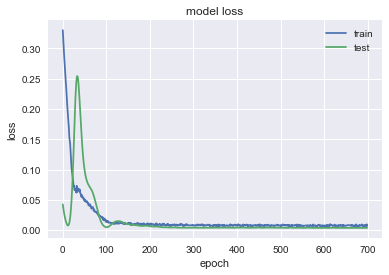

(21, 1, 10)
               FTI
MSE        6.80017
MAE        2.17783
R2        0.166134
MAPE (%)   8.33472


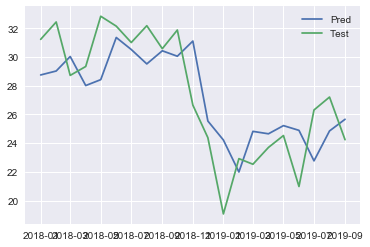

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1549 - val_loss: 0.6026
Epoch 2/700
0s - loss: 0.1439 - val_loss: 0.5739
Epoch 3/700
0s - loss: 0.1329 - val_loss: 0.5462
Epoch 4/700
0s - loss: 0.1235 - val_loss: 0.5192
Epoch 5/700
0s - loss: 0.1142 - val_loss: 0.4923
Epoch 6/700
0s - loss: 0.1049 - val_loss: 0.4655
Epoch 7/700
0s - loss: 0.0969 - val_loss: 0.4387
Epoch 8/700
0s - loss: 0.0882 - val_loss: 0.4117
Epoch 9/700
0s - loss: 0.0804 - val_loss: 0.3844
Epoch 10/700
0s - loss: 0.0732 - val_loss: 0.3570
Epoch 11/700
0s - loss: 0.0651 - val_loss: 0.3294
Epoch 12/700
0s - loss: 0.0573 - val_loss: 0.3017
Epoch 13/700
0s - loss: 0.0503 - val_loss: 0.2740
Epoch 14/700
0s - loss: 0.0438 - val_loss: 0.2465
Epoch 15/700
0s - loss: 0.0392 - val_loss: 0.2196
Epoch 16/700
0s - loss: 0.0340 - val_loss: 0.1935
Epoch 17/700
0s - loss: 0.0311 - val_loss: 0.1689
Epoch 18/700
0s - loss: 0.0270 - val_loss: 0.1459
Epoch 19/700
0s - loss: 0.0248 - val_loss: 0.

0s - loss: 0.0041 - val_loss: 0.0177
Epoch 164/700
0s - loss: 0.0036 - val_loss: 0.0178
Epoch 165/700
0s - loss: 0.0044 - val_loss: 0.0179
Epoch 166/700
0s - loss: 0.0036 - val_loss: 0.0181
Epoch 167/700
0s - loss: 0.0051 - val_loss: 0.0183
Epoch 168/700
0s - loss: 0.0034 - val_loss: 0.0184
Epoch 169/700
0s - loss: 0.0032 - val_loss: 0.0184
Epoch 170/700
0s - loss: 0.0032 - val_loss: 0.0186
Epoch 171/700
0s - loss: 0.0043 - val_loss: 0.0188
Epoch 172/700
0s - loss: 0.0039 - val_loss: 0.0189
Epoch 173/700
0s - loss: 0.0032 - val_loss: 0.0189
Epoch 174/700
0s - loss: 0.0037 - val_loss: 0.0189
Epoch 175/700
0s - loss: 0.0039 - val_loss: 0.0191
Epoch 176/700
0s - loss: 0.0036 - val_loss: 0.0193
Epoch 177/700
0s - loss: 0.0038 - val_loss: 0.0196
Epoch 178/700
0s - loss: 0.0036 - val_loss: 0.0199
Epoch 179/700
0s - loss: 0.0038 - val_loss: 0.0201
Epoch 180/700
0s - loss: 0.0036 - val_loss: 0.0203
Epoch 181/700
0s - loss: 0.0038 - val_loss: 0.0203
Epoch 182/700
0s - loss: 0.0037 - val_loss: 0

0s - loss: 0.0038 - val_loss: 0.0192
Epoch 339/700
0s - loss: 0.0030 - val_loss: 0.0194
Epoch 340/700
0s - loss: 0.0036 - val_loss: 0.0197
Epoch 341/700
0s - loss: 0.0029 - val_loss: 0.0200
Epoch 342/700
0s - loss: 0.0037 - val_loss: 0.0200
Epoch 343/700
0s - loss: 0.0036 - val_loss: 0.0200
Epoch 344/700
0s - loss: 0.0036 - val_loss: 0.0198
Epoch 345/700
0s - loss: 0.0036 - val_loss: 0.0196
Epoch 346/700
0s - loss: 0.0028 - val_loss: 0.0195
Epoch 347/700
0s - loss: 0.0028 - val_loss: 0.0194
Epoch 348/700
0s - loss: 0.0039 - val_loss: 0.0194
Epoch 349/700
0s - loss: 0.0022 - val_loss: 0.0195
Epoch 350/700
0s - loss: 0.0035 - val_loss: 0.0194
Epoch 351/700
0s - loss: 0.0039 - val_loss: 0.0194
Epoch 352/700
0s - loss: 0.0028 - val_loss: 0.0194
Epoch 353/700
0s - loss: 0.0031 - val_loss: 0.0193
Epoch 354/700
0s - loss: 0.0034 - val_loss: 0.0192
Epoch 355/700
0s - loss: 0.0035 - val_loss: 0.0190
Epoch 356/700
0s - loss: 0.0031 - val_loss: 0.0188
Epoch 357/700
0s - loss: 0.0028 - val_loss: 0

0s - loss: 0.0031 - val_loss: 0.0167
Epoch 508/700
0s - loss: 0.0031 - val_loss: 0.0166
Epoch 509/700
0s - loss: 0.0035 - val_loss: 0.0165
Epoch 510/700
0s - loss: 0.0026 - val_loss: 0.0165
Epoch 511/700
0s - loss: 0.0031 - val_loss: 0.0167
Epoch 512/700
0s - loss: 0.0031 - val_loss: 0.0169
Epoch 513/700
0s - loss: 0.0031 - val_loss: 0.0171
Epoch 514/700
0s - loss: 0.0032 - val_loss: 0.0173
Epoch 515/700
0s - loss: 0.0028 - val_loss: 0.0176
Epoch 516/700
0s - loss: 0.0032 - val_loss: 0.0178
Epoch 517/700
0s - loss: 0.0026 - val_loss: 0.0181
Epoch 518/700
0s - loss: 0.0043 - val_loss: 0.0183
Epoch 519/700
0s - loss: 0.0031 - val_loss: 0.0186
Epoch 520/700
0s - loss: 0.0030 - val_loss: 0.0187
Epoch 521/700
0s - loss: 0.0031 - val_loss: 0.0187
Epoch 522/700
0s - loss: 0.0034 - val_loss: 0.0186
Epoch 523/700
0s - loss: 0.0031 - val_loss: 0.0184
Epoch 524/700
0s - loss: 0.0030 - val_loss: 0.0183
Epoch 525/700
0s - loss: 0.0034 - val_loss: 0.0181
Epoch 526/700
0s - loss: 0.0030 - val_loss: 0

0s - loss: 0.0024 - val_loss: 0.0168
Epoch 672/700
0s - loss: 0.0027 - val_loss: 0.0164
Epoch 673/700
0s - loss: 0.0028 - val_loss: 0.0161
Epoch 674/700
0s - loss: 0.0022 - val_loss: 0.0160
Epoch 675/700
0s - loss: 0.0029 - val_loss: 0.0161
Epoch 676/700
0s - loss: 0.0026 - val_loss: 0.0162
Epoch 677/700
0s - loss: 0.0031 - val_loss: 0.0162
Epoch 678/700
0s - loss: 0.0029 - val_loss: 0.0161
Epoch 679/700
0s - loss: 0.0022 - val_loss: 0.0161
Epoch 680/700
0s - loss: 0.0032 - val_loss: 0.0161
Epoch 681/700
0s - loss: 0.0026 - val_loss: 0.0164
Epoch 682/700
0s - loss: 0.0032 - val_loss: 0.0168
Epoch 683/700
0s - loss: 0.0025 - val_loss: 0.0172
Epoch 684/700
0s - loss: 0.0027 - val_loss: 0.0173
Epoch 685/700
0s - loss: 0.0030 - val_loss: 0.0174
Epoch 686/700
0s - loss: 0.0033 - val_loss: 0.0172
Epoch 687/700
0s - loss: 0.0031 - val_loss: 0.0170
Epoch 688/700
0s - loss: 0.0026 - val_loss: 0.0168
Epoch 689/700
0s - loss: 0.0030 - val_loss: 0.0167
Epoch 690/700
0s - loss: 0.0028 - val_loss: 0

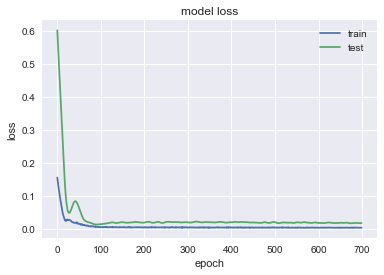

(21, 1, 10)
              BLK
MSE       2945.02
MAE       42.4313
R2       -1.13727
MAPE (%)   9.5823


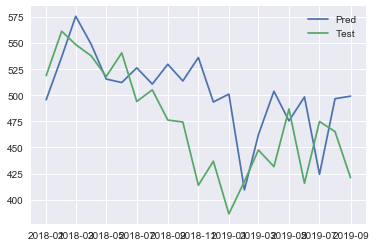

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3436 - val_loss: 0.3697
Epoch 2/700
0s - loss: 0.3254 - val_loss: 0.3455
Epoch 3/700
0s - loss: 0.3087 - val_loss: 0.3223
Epoch 4/700
0s - loss: 0.2907 - val_loss: 0.2999
Epoch 5/700
0s - loss: 0.2761 - val_loss: 0.2778
Epoch 6/700
0s - loss: 0.2569 - val_loss: 0.2561
Epoch 7/700
0s - loss: 0.2412 - val_loss: 0.2345
Epoch 8/700
0s - loss: 0.2263 - val_loss: 0.2129
Epoch 9/700
0s - loss: 0.2094 - val_loss: 0.1915
Epoch 10/700
0s - loss: 0.1966 - val_loss: 0.1702
Epoch 11/700
0s - loss: 0.1779 - val_loss: 0.1493
Epoch 12/700
0s - loss: 0.1628 - val_loss: 0.1289
Epoch 13/700
0s - loss: 0.1457 - val_loss: 0.1092
Epoch 14/700
0s - loss: 0.1347 - val_loss: 0.0904
Epoch 15/700
0s - loss: 0.1196 - val_loss: 0.0728
Epoch 16/700
0s - loss: 0.1042 - val_loss: 0.0568
Epoch 17/700
0s - loss: 0.0893 - val_loss: 0.0429
Epoch 18/700
0s - loss: 0.0782 - val_loss: 0.0314
Epoch 19/700
0s - loss: 0.0673 - val_loss: 0.

0s - loss: 0.0062 - val_loss: 0.0368
Epoch 171/700
0s - loss: 0.0067 - val_loss: 0.0368
Epoch 172/700
0s - loss: 0.0059 - val_loss: 0.0367
Epoch 173/700
0s - loss: 0.0064 - val_loss: 0.0362
Epoch 174/700
0s - loss: 0.0050 - val_loss: 0.0357
Epoch 175/700
0s - loss: 0.0057 - val_loss: 0.0352
Epoch 176/700
0s - loss: 0.0067 - val_loss: 0.0346
Epoch 177/700
0s - loss: 0.0069 - val_loss: 0.0341
Epoch 178/700
0s - loss: 0.0055 - val_loss: 0.0333
Epoch 179/700
0s - loss: 0.0058 - val_loss: 0.0327
Epoch 180/700
0s - loss: 0.0065 - val_loss: 0.0321
Epoch 181/700
0s - loss: 0.0061 - val_loss: 0.0319
Epoch 182/700
0s - loss: 0.0080 - val_loss: 0.0317
Epoch 183/700
0s - loss: 0.0059 - val_loss: 0.0316
Epoch 184/700
0s - loss: 0.0056 - val_loss: 0.0313
Epoch 185/700
0s - loss: 0.0060 - val_loss: 0.0312
Epoch 186/700
0s - loss: 0.0063 - val_loss: 0.0309
Epoch 187/700
0s - loss: 0.0062 - val_loss: 0.0305
Epoch 188/700
0s - loss: 0.0060 - val_loss: 0.0300
Epoch 189/700
0s - loss: 0.0065 - val_loss: 0

0s - loss: 0.0078 - val_loss: 0.0305
Epoch 334/700
0s - loss: 0.0065 - val_loss: 0.0298
Epoch 335/700
0s - loss: 0.0058 - val_loss: 0.0290
Epoch 336/700
0s - loss: 0.0057 - val_loss: 0.0285
Epoch 337/700
0s - loss: 0.0069 - val_loss: 0.0281
Epoch 338/700
0s - loss: 0.0076 - val_loss: 0.0280
Epoch 339/700
0s - loss: 0.0041 - val_loss: 0.0280
Epoch 340/700
0s - loss: 0.0059 - val_loss: 0.0281
Epoch 341/700
0s - loss: 0.0058 - val_loss: 0.0284
Epoch 342/700
0s - loss: 0.0056 - val_loss: 0.0287
Epoch 343/700
0s - loss: 0.0053 - val_loss: 0.0291
Epoch 344/700
0s - loss: 0.0055 - val_loss: 0.0296
Epoch 345/700
0s - loss: 0.0077 - val_loss: 0.0301
Epoch 346/700
0s - loss: 0.0058 - val_loss: 0.0304
Epoch 347/700
0s - loss: 0.0066 - val_loss: 0.0306
Epoch 348/700
0s - loss: 0.0054 - val_loss: 0.0308
Epoch 349/700
0s - loss: 0.0063 - val_loss: 0.0307
Epoch 350/700
0s - loss: 0.0072 - val_loss: 0.0303
Epoch 351/700
0s - loss: 0.0065 - val_loss: 0.0299
Epoch 352/700
0s - loss: 0.0058 - val_loss: 0

0s - loss: 0.0056 - val_loss: 0.0316
Epoch 509/700
0s - loss: 0.0060 - val_loss: 0.0312
Epoch 510/700
0s - loss: 0.0036 - val_loss: 0.0308
Epoch 511/700
0s - loss: 0.0056 - val_loss: 0.0307
Epoch 512/700
0s - loss: 0.0063 - val_loss: 0.0308
Epoch 513/700
0s - loss: 0.0051 - val_loss: 0.0311
Epoch 514/700
0s - loss: 0.0055 - val_loss: 0.0313
Epoch 515/700
0s - loss: 0.0048 - val_loss: 0.0313
Epoch 516/700
0s - loss: 0.0051 - val_loss: 0.0314
Epoch 517/700
0s - loss: 0.0066 - val_loss: 0.0315
Epoch 518/700
0s - loss: 0.0057 - val_loss: 0.0314
Epoch 519/700
0s - loss: 0.0064 - val_loss: 0.0309
Epoch 520/700
0s - loss: 0.0062 - val_loss: 0.0307
Epoch 521/700
0s - loss: 0.0052 - val_loss: 0.0307
Epoch 522/700
0s - loss: 0.0052 - val_loss: 0.0306
Epoch 523/700
0s - loss: 0.0067 - val_loss: 0.0306
Epoch 524/700
0s - loss: 0.0052 - val_loss: 0.0304
Epoch 525/700
0s - loss: 0.0049 - val_loss: 0.0303
Epoch 526/700
0s - loss: 0.0052 - val_loss: 0.0302
Epoch 527/700
0s - loss: 0.0063 - val_loss: 0

0s - loss: 0.0045 - val_loss: 0.0321
Epoch 683/700
0s - loss: 0.0055 - val_loss: 0.0325
Epoch 684/700
0s - loss: 0.0052 - val_loss: 0.0328
Epoch 685/700
0s - loss: 0.0046 - val_loss: 0.0330
Epoch 686/700
0s - loss: 0.0044 - val_loss: 0.0333
Epoch 687/700
0s - loss: 0.0053 - val_loss: 0.0335
Epoch 688/700
0s - loss: 0.0058 - val_loss: 0.0337
Epoch 689/700
0s - loss: 0.0049 - val_loss: 0.0340
Epoch 690/700
0s - loss: 0.0046 - val_loss: 0.0343
Epoch 691/700
0s - loss: 0.0041 - val_loss: 0.0345
Epoch 692/700
0s - loss: 0.0045 - val_loss: 0.0347
Epoch 693/700
0s - loss: 0.0049 - val_loss: 0.0347
Epoch 694/700
0s - loss: 0.0059 - val_loss: 0.0344
Epoch 695/700
0s - loss: 0.0048 - val_loss: 0.0342
Epoch 696/700
0s - loss: 0.0050 - val_loss: 0.0341
Epoch 697/700
0s - loss: 0.0060 - val_loss: 0.0337
Epoch 698/700
0s - loss: 0.0059 - val_loss: 0.0335
Epoch 699/700
0s - loss: 0.0058 - val_loss: 0.0333
Epoch 700/700
0s - loss: 0.0059 - val_loss: 0.0329


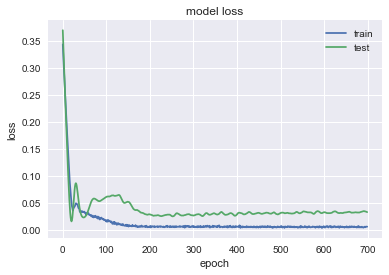

(21, 1, 10)
              DVA
MSE       98.8661
MAE       7.87692
R2       -3.11898
MAPE (%)  13.7699


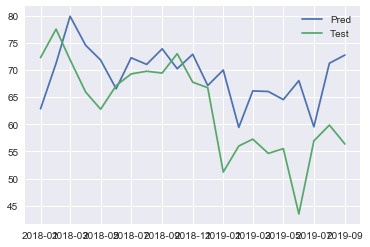

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.0415 - val_loss: 0.5745
Epoch 2/700
0s - loss: 0.0360 - val_loss: 0.5487
Epoch 3/700
0s - loss: 0.0319 - val_loss: 0.5246
Epoch 4/700
0s - loss: 0.0278 - val_loss: 0.5016
Epoch 5/700
0s - loss: 0.0243 - val_loss: 0.4791
Epoch 6/700
0s - loss: 0.0211 - val_loss: 0.4571
Epoch 7/700
0s - loss: 0.0190 - val_loss: 0.4353
Epoch 8/700
0s - loss: 0.0168 - val_loss: 0.4138
Epoch 9/700
0s - loss: 0.0151 - val_loss: 0.3927
Epoch 10/700
0s - loss: 0.0128 - val_loss: 0.3719
Epoch 11/700
0s - loss: 0.0122 - val_loss: 0.3517
Epoch 12/700
0s - loss: 0.0110 - val_loss: 0.3325
Epoch 13/700
0s - loss: 0.0101 - val_loss: 0.3143
Epoch 14/700
0s - loss: 0.0097 - val_loss: 0.2975
Epoch 15/700
0s - loss: 0.0091 - val_loss: 0.2824
Epoch 16/700
0s - loss: 0.0092 - val_loss: 0.2691
Epoch 17/700
0s - loss: 0.0095 - val_loss: 0.2577
Epoch 18/700
0s - loss: 0.0096 - val_loss: 0.2482
Epoch 19/700
0s - loss: 0.0103 - val_loss: 0.2

0s - loss: 9.1699e-04 - val_loss: 0.0644
Epoch 180/700
0s - loss: 0.0010 - val_loss: 0.0645
Epoch 181/700
0s - loss: 0.0012 - val_loss: 0.0644
Epoch 182/700
0s - loss: 0.0014 - val_loss: 0.0638
Epoch 183/700
0s - loss: 0.0014 - val_loss: 0.0630
Epoch 184/700
0s - loss: 0.0011 - val_loss: 0.0622
Epoch 185/700
0s - loss: 9.4126e-04 - val_loss: 0.0615
Epoch 186/700
0s - loss: 0.0010 - val_loss: 0.0616
Epoch 187/700
0s - loss: 0.0012 - val_loss: 0.0616
Epoch 188/700
0s - loss: 9.1447e-04 - val_loss: 0.0616
Epoch 189/700
0s - loss: 0.0015 - val_loss: 0.0614
Epoch 190/700
0s - loss: 9.2595e-04 - val_loss: 0.0614
Epoch 191/700
0s - loss: 0.0013 - val_loss: 0.0617
Epoch 192/700
0s - loss: 0.0013 - val_loss: 0.0620
Epoch 193/700
0s - loss: 0.0013 - val_loss: 0.0621
Epoch 194/700
0s - loss: 0.0012 - val_loss: 0.0618
Epoch 195/700
0s - loss: 0.0011 - val_loss: 0.0616
Epoch 196/700
0s - loss: 9.6596e-04 - val_loss: 0.0615
Epoch 197/700
0s - loss: 0.0013 - val_loss: 0.0615
Epoch 198/700
0s - loss: 

0s - loss: 0.0013 - val_loss: 0.0419
Epoch 340/700
0s - loss: 0.0010 - val_loss: 0.0426
Epoch 341/700
0s - loss: 9.3807e-04 - val_loss: 0.0432
Epoch 342/700
0s - loss: 7.0112e-04 - val_loss: 0.0436
Epoch 343/700
0s - loss: 9.3610e-04 - val_loss: 0.0438
Epoch 344/700
0s - loss: 8.5670e-04 - val_loss: 0.0438
Epoch 345/700
0s - loss: 0.0011 - val_loss: 0.0432
Epoch 346/700
0s - loss: 0.0011 - val_loss: 0.0423
Epoch 347/700
0s - loss: 9.5476e-04 - val_loss: 0.0417
Epoch 348/700
0s - loss: 7.6727e-04 - val_loss: 0.0411
Epoch 349/700
0s - loss: 9.8598e-04 - val_loss: 0.0404
Epoch 350/700
0s - loss: 0.0010 - val_loss: 0.0396
Epoch 351/700
0s - loss: 8.8643e-04 - val_loss: 0.0392
Epoch 352/700
0s - loss: 0.0011 - val_loss: 0.0390
Epoch 353/700
0s - loss: 8.2761e-04 - val_loss: 0.0389
Epoch 354/700
0s - loss: 9.5202e-04 - val_loss: 0.0388
Epoch 355/700
0s - loss: 0.0010 - val_loss: 0.0394
Epoch 356/700
0s - loss: 7.3391e-04 - val_loss: 0.0400
Epoch 357/700
0s - loss: 9.4593e-04 - val_loss: 0.04

0s - loss: 8.1262e-04 - val_loss: 0.0310
Epoch 494/700
0s - loss: 9.2727e-04 - val_loss: 0.0310
Epoch 495/700
0s - loss: 8.3030e-04 - val_loss: 0.0314
Epoch 496/700
0s - loss: 8.7862e-04 - val_loss: 0.0315
Epoch 497/700
0s - loss: 8.0804e-04 - val_loss: 0.0312
Epoch 498/700
0s - loss: 9.1612e-04 - val_loss: 0.0314
Epoch 499/700
0s - loss: 9.5416e-04 - val_loss: 0.0313
Epoch 500/700
0s - loss: 9.3469e-04 - val_loss: 0.0310
Epoch 501/700
0s - loss: 6.0598e-04 - val_loss: 0.0310
Epoch 502/700
0s - loss: 5.7882e-04 - val_loss: 0.0310
Epoch 503/700
0s - loss: 8.3678e-04 - val_loss: 0.0309
Epoch 504/700
0s - loss: 8.6056e-04 - val_loss: 0.0307
Epoch 505/700
0s - loss: 9.4296e-04 - val_loss: 0.0302
Epoch 506/700
0s - loss: 8.3281e-04 - val_loss: 0.0296
Epoch 507/700
0s - loss: 6.1080e-04 - val_loss: 0.0293
Epoch 508/700
0s - loss: 7.5335e-04 - val_loss: 0.0291
Epoch 509/700
0s - loss: 7.1531e-04 - val_loss: 0.0291
Epoch 510/700
0s - loss: 9.2509e-04 - val_loss: 0.0289
Epoch 511/700
0s - loss:

0s - loss: 8.0856e-04 - val_loss: 0.0230
Epoch 659/700
0s - loss: 8.2209e-04 - val_loss: 0.0229
Epoch 660/700
0s - loss: 8.0581e-04 - val_loss: 0.0230
Epoch 661/700
0s - loss: 6.7887e-04 - val_loss: 0.0232
Epoch 662/700
0s - loss: 6.7854e-04 - val_loss: 0.0234
Epoch 663/700
0s - loss: 5.9258e-04 - val_loss: 0.0237
Epoch 664/700
0s - loss: 9.3488e-04 - val_loss: 0.0241
Epoch 665/700
0s - loss: 8.7587e-04 - val_loss: 0.0239
Epoch 666/700
0s - loss: 7.3608e-04 - val_loss: 0.0237
Epoch 667/700
0s - loss: 7.0085e-04 - val_loss: 0.0232
Epoch 668/700
0s - loss: 5.1728e-04 - val_loss: 0.0228
Epoch 669/700
0s - loss: 7.8156e-04 - val_loss: 0.0225
Epoch 670/700
0s - loss: 9.5600e-04 - val_loss: 0.0222
Epoch 671/700
0s - loss: 8.4093e-04 - val_loss: 0.0222
Epoch 672/700
0s - loss: 6.9536e-04 - val_loss: 0.0224
Epoch 673/700
0s - loss: 8.0016e-04 - val_loss: 0.0230
Epoch 674/700
0s - loss: 8.9439e-04 - val_loss: 0.0238
Epoch 675/700
0s - loss: 7.6737e-04 - val_loss: 0.0242
Epoch 676/700
0s - loss:

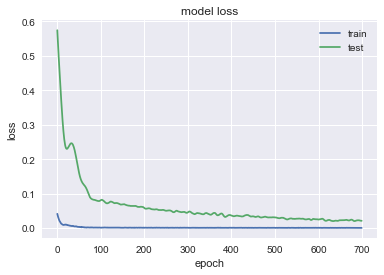

(21, 1, 10)
               BA
MSE        3225.1
MAE       38.4406
R2       -3.05997
MAPE (%)  10.1979


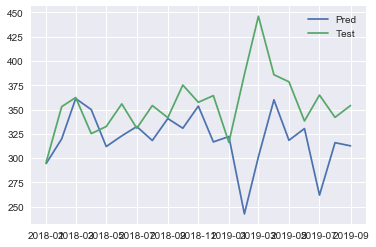

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3690 - val_loss: 0.0838
Epoch 2/700
0s - loss: 0.3505 - val_loss: 0.0727
Epoch 3/700
0s - loss: 0.3312 - val_loss: 0.0628
Epoch 4/700
0s - loss: 0.3152 - val_loss: 0.0538
Epoch 5/700
0s - loss: 0.2980 - val_loss: 0.0456
Epoch 6/700
0s - loss: 0.2815 - val_loss: 0.0382
Epoch 7/700
0s - loss: 0.2644 - val_loss: 0.0316
Epoch 8/700
0s - loss: 0.2488 - val_loss: 0.0259
Epoch 9/700
0s - loss: 0.2342 - val_loss: 0.0212
Epoch 10/700
0s - loss: 0.2178 - val_loss: 0.0175
Epoch 11/700
0s - loss: 0.2043 - val_loss: 0.0150
Epoch 12/700
0s - loss: 0.1888 - val_loss: 0.0139
Epoch 13/700
0s - loss: 0.1747 - val_loss: 0.0144
Epoch 14/700
0s - loss: 0.1587 - val_loss: 0.0168
Epoch 15/700
0s - loss: 0.1433 - val_loss: 0.0212
Epoch 16/700
0s - loss: 0.1291 - val_loss: 0.0281
Epoch 17/700
0s - loss: 0.1187 - val_loss: 0.0377
Epoch 18/700
0s - loss: 0.1058 - val_loss: 0.0503
Epoch 19/700
0s - loss: 0.0939 - val_loss: 0.

0s - loss: 0.0100 - val_loss: 0.0208
Epoch 173/700
0s - loss: 0.0117 - val_loss: 0.0211
Epoch 174/700
0s - loss: 0.0082 - val_loss: 0.0213
Epoch 175/700
0s - loss: 0.0083 - val_loss: 0.0215
Epoch 176/700
0s - loss: 0.0097 - val_loss: 0.0216
Epoch 177/700
0s - loss: 0.0098 - val_loss: 0.0216
Epoch 178/700
0s - loss: 0.0087 - val_loss: 0.0215
Epoch 179/700
0s - loss: 0.0101 - val_loss: 0.0214
Epoch 180/700
0s - loss: 0.0090 - val_loss: 0.0213
Epoch 181/700
0s - loss: 0.0099 - val_loss: 0.0211
Epoch 182/700
0s - loss: 0.0075 - val_loss: 0.0209
Epoch 183/700
0s - loss: 0.0087 - val_loss: 0.0207
Epoch 184/700
0s - loss: 0.0100 - val_loss: 0.0204
Epoch 185/700
0s - loss: 0.0088 - val_loss: 0.0202
Epoch 186/700
0s - loss: 0.0084 - val_loss: 0.0201
Epoch 187/700
0s - loss: 0.0110 - val_loss: 0.0199
Epoch 188/700
0s - loss: 0.0082 - val_loss: 0.0199
Epoch 189/700
0s - loss: 0.0080 - val_loss: 0.0199
Epoch 190/700
0s - loss: 0.0085 - val_loss: 0.0200
Epoch 191/700
0s - loss: 0.0096 - val_loss: 0

0s - loss: 0.0070 - val_loss: 0.0220
Epoch 349/700
0s - loss: 0.0081 - val_loss: 0.0222
Epoch 350/700
0s - loss: 0.0070 - val_loss: 0.0222
Epoch 351/700
0s - loss: 0.0070 - val_loss: 0.0222
Epoch 352/700
0s - loss: 0.0073 - val_loss: 0.0221
Epoch 353/700
0s - loss: 0.0072 - val_loss: 0.0221
Epoch 354/700
0s - loss: 0.0084 - val_loss: 0.0220
Epoch 355/700
0s - loss: 0.0090 - val_loss: 0.0219
Epoch 356/700
0s - loss: 0.0072 - val_loss: 0.0218
Epoch 357/700
0s - loss: 0.0085 - val_loss: 0.0217
Epoch 358/700
0s - loss: 0.0076 - val_loss: 0.0215
Epoch 359/700
0s - loss: 0.0066 - val_loss: 0.0214
Epoch 360/700
0s - loss: 0.0067 - val_loss: 0.0214
Epoch 361/700
0s - loss: 0.0077 - val_loss: 0.0213
Epoch 362/700
0s - loss: 0.0060 - val_loss: 0.0213
Epoch 363/700
0s - loss: 0.0089 - val_loss: 0.0211
Epoch 364/700
0s - loss: 0.0091 - val_loss: 0.0210
Epoch 365/700
0s - loss: 0.0076 - val_loss: 0.0208
Epoch 366/700
0s - loss: 0.0073 - val_loss: 0.0207
Epoch 367/700
0s - loss: 0.0081 - val_loss: 0

0s - loss: 0.0073 - val_loss: 0.0196
Epoch 524/700
0s - loss: 0.0071 - val_loss: 0.0197
Epoch 525/700
0s - loss: 0.0088 - val_loss: 0.0197
Epoch 526/700
0s - loss: 0.0057 - val_loss: 0.0197
Epoch 527/700
0s - loss: 0.0068 - val_loss: 0.0197
Epoch 528/700
0s - loss: 0.0065 - val_loss: 0.0197
Epoch 529/700
0s - loss: 0.0061 - val_loss: 0.0197
Epoch 530/700
0s - loss: 0.0071 - val_loss: 0.0199
Epoch 531/700
0s - loss: 0.0085 - val_loss: 0.0202
Epoch 532/700
0s - loss: 0.0083 - val_loss: 0.0203
Epoch 533/700
0s - loss: 0.0071 - val_loss: 0.0204
Epoch 534/700
0s - loss: 0.0077 - val_loss: 0.0206
Epoch 535/700
0s - loss: 0.0073 - val_loss: 0.0208
Epoch 536/700
0s - loss: 0.0067 - val_loss: 0.0211
Epoch 537/700
0s - loss: 0.0068 - val_loss: 0.0213
Epoch 538/700
0s - loss: 0.0064 - val_loss: 0.0214
Epoch 539/700
0s - loss: 0.0095 - val_loss: 0.0213
Epoch 540/700
0s - loss: 0.0070 - val_loss: 0.0211
Epoch 541/700
0s - loss: 0.0054 - val_loss: 0.0210
Epoch 542/700
0s - loss: 0.0069 - val_loss: 0

0s - loss: 0.0066 - val_loss: 0.0197
Epoch 699/700
0s - loss: 0.0063 - val_loss: 0.0196
Epoch 700/700
0s - loss: 0.0081 - val_loss: 0.0197


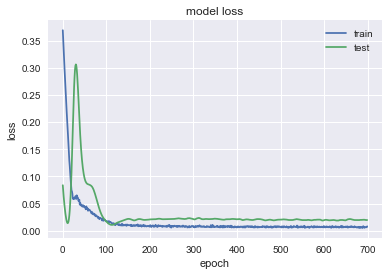

(21, 1, 10)
              IBM
MSE       200.405
MAE       12.9082
R2       -1.77545
MAPE (%)  9.20556


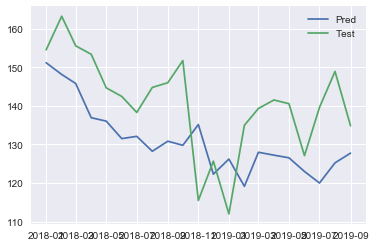

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1345 - val_loss: 0.2660
Epoch 2/700
0s - loss: 0.1240 - val_loss: 0.2483
Epoch 3/700
0s - loss: 0.1145 - val_loss: 0.2320
Epoch 4/700
0s - loss: 0.1074 - val_loss: 0.2165
Epoch 5/700
0s - loss: 0.0992 - val_loss: 0.2015
Epoch 6/700
0s - loss: 0.0928 - val_loss: 0.1870
Epoch 7/700
0s - loss: 0.0865 - val_loss: 0.1727
Epoch 8/700
0s - loss: 0.0787 - val_loss: 0.1589
Epoch 9/700
0s - loss: 0.0732 - val_loss: 0.1452
Epoch 10/700
0s - loss: 0.0673 - val_loss: 0.1318
Epoch 11/700
0s - loss: 0.0617 - val_loss: 0.1187
Epoch 12/700
0s - loss: 0.0564 - val_loss: 0.1059
Epoch 13/700
0s - loss: 0.0508 - val_loss: 0.0935
Epoch 14/700
0s - loss: 0.0455 - val_loss: 0.0816
Epoch 15/700
0s - loss: 0.0412 - val_loss: 0.0704
Epoch 16/700
0s - loss: 0.0391 - val_loss: 0.0599
Epoch 17/700
0s - loss: 0.0349 - val_loss: 0.0504
Epoch 18/700
0s - loss: 0.0325 - val_loss: 0.0421
Epoch 19/700
0s - loss: 0.0294 - val_loss: 0.

0s - loss: 0.0040 - val_loss: 0.1087
Epoch 170/700
0s - loss: 0.0041 - val_loss: 0.1055
Epoch 171/700
0s - loss: 0.0040 - val_loss: 0.1012
Epoch 172/700
0s - loss: 0.0035 - val_loss: 0.0976
Epoch 173/700
0s - loss: 0.0042 - val_loss: 0.0949
Epoch 174/700
0s - loss: 0.0034 - val_loss: 0.0926
Epoch 175/700
0s - loss: 0.0046 - val_loss: 0.0911
Epoch 176/700
0s - loss: 0.0035 - val_loss: 0.0900
Epoch 177/700
0s - loss: 0.0039 - val_loss: 0.0900
Epoch 178/700
0s - loss: 0.0035 - val_loss: 0.0906
Epoch 179/700
0s - loss: 0.0035 - val_loss: 0.0913
Epoch 180/700
0s - loss: 0.0045 - val_loss: 0.0920
Epoch 181/700
0s - loss: 0.0043 - val_loss: 0.0927
Epoch 182/700
0s - loss: 0.0037 - val_loss: 0.0922
Epoch 183/700
0s - loss: 0.0040 - val_loss: 0.0917
Epoch 184/700
0s - loss: 0.0039 - val_loss: 0.0909
Epoch 185/700
0s - loss: 0.0035 - val_loss: 0.0909
Epoch 186/700
0s - loss: 0.0036 - val_loss: 0.0912
Epoch 187/700
0s - loss: 0.0038 - val_loss: 0.0925
Epoch 188/700
0s - loss: 0.0036 - val_loss: 0

0s - loss: 0.0032 - val_loss: 0.0549
Epoch 337/700
0s - loss: 0.0033 - val_loss: 0.0552
Epoch 338/700
0s - loss: 0.0028 - val_loss: 0.0561
Epoch 339/700
0s - loss: 0.0033 - val_loss: 0.0568
Epoch 340/700
0s - loss: 0.0030 - val_loss: 0.0575
Epoch 341/700
0s - loss: 0.0035 - val_loss: 0.0575
Epoch 342/700
0s - loss: 0.0033 - val_loss: 0.0570
Epoch 343/700
0s - loss: 0.0029 - val_loss: 0.0572
Epoch 344/700
0s - loss: 0.0028 - val_loss: 0.0579
Epoch 345/700
0s - loss: 0.0029 - val_loss: 0.0583
Epoch 346/700
0s - loss: 0.0035 - val_loss: 0.0591
Epoch 347/700
0s - loss: 0.0030 - val_loss: 0.0595
Epoch 348/700
0s - loss: 0.0045 - val_loss: 0.0597
Epoch 349/700
0s - loss: 0.0032 - val_loss: 0.0597
Epoch 350/700
0s - loss: 0.0029 - val_loss: 0.0600
Epoch 351/700
0s - loss: 0.0029 - val_loss: 0.0598
Epoch 352/700
0s - loss: 0.0037 - val_loss: 0.0599
Epoch 353/700
0s - loss: 0.0036 - val_loss: 0.0606
Epoch 354/700
0s - loss: 0.0037 - val_loss: 0.0614
Epoch 355/700
0s - loss: 0.0031 - val_loss: 0

0s - loss: 0.0028 - val_loss: 0.0515
Epoch 506/700
0s - loss: 0.0031 - val_loss: 0.0517
Epoch 507/700
0s - loss: 0.0034 - val_loss: 0.0511
Epoch 508/700
0s - loss: 0.0028 - val_loss: 0.0500
Epoch 509/700
0s - loss: 0.0032 - val_loss: 0.0490
Epoch 510/700
0s - loss: 0.0031 - val_loss: 0.0485
Epoch 511/700
0s - loss: 0.0030 - val_loss: 0.0483
Epoch 512/700
0s - loss: 0.0031 - val_loss: 0.0489
Epoch 513/700
0s - loss: 0.0031 - val_loss: 0.0501
Epoch 514/700
0s - loss: 0.0031 - val_loss: 0.0517
Epoch 515/700
0s - loss: 0.0031 - val_loss: 0.0521
Epoch 516/700
0s - loss: 0.0033 - val_loss: 0.0522
Epoch 517/700
0s - loss: 0.0034 - val_loss: 0.0513
Epoch 518/700
0s - loss: 0.0029 - val_loss: 0.0503
Epoch 519/700
0s - loss: 0.0029 - val_loss: 0.0491
Epoch 520/700
0s - loss: 0.0027 - val_loss: 0.0480
Epoch 521/700
0s - loss: 0.0028 - val_loss: 0.0472
Epoch 522/700
0s - loss: 0.0036 - val_loss: 0.0466
Epoch 523/700
0s - loss: 0.0037 - val_loss: 0.0462
Epoch 524/700
0s - loss: 0.0034 - val_loss: 0

0s - loss: 0.0029 - val_loss: 0.0456
Epoch 677/700
0s - loss: 0.0029 - val_loss: 0.0451
Epoch 678/700
0s - loss: 0.0030 - val_loss: 0.0443
Epoch 679/700
0s - loss: 0.0031 - val_loss: 0.0439
Epoch 680/700
0s - loss: 0.0029 - val_loss: 0.0437
Epoch 681/700
0s - loss: 0.0033 - val_loss: 0.0437
Epoch 682/700
0s - loss: 0.0034 - val_loss: 0.0441
Epoch 683/700
0s - loss: 0.0026 - val_loss: 0.0449
Epoch 684/700
0s - loss: 0.0026 - val_loss: 0.0457
Epoch 685/700
0s - loss: 0.0029 - val_loss: 0.0461
Epoch 686/700
0s - loss: 0.0030 - val_loss: 0.0450
Epoch 687/700
0s - loss: 0.0025 - val_loss: 0.0442
Epoch 688/700
0s - loss: 0.0026 - val_loss: 0.0436
Epoch 689/700
0s - loss: 0.0027 - val_loss: 0.0431
Epoch 690/700
0s - loss: 0.0029 - val_loss: 0.0431
Epoch 691/700
0s - loss: 0.0027 - val_loss: 0.0429
Epoch 692/700
0s - loss: 0.0038 - val_loss: 0.0427
Epoch 693/700
0s - loss: 0.0029 - val_loss: 0.0437
Epoch 694/700
0s - loss: 0.0033 - val_loss: 0.0450
Epoch 695/700
0s - loss: 0.0036 - val_loss: 0

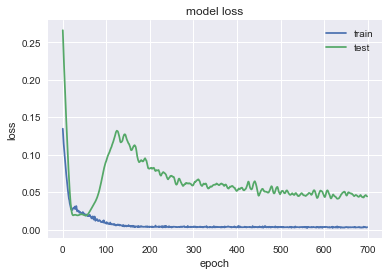

(21, 1, 10)
              ALB
MSE       496.619
MAE       19.4383
R2       -1.44108
MAPE (%)  23.6925


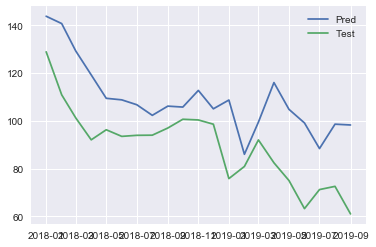

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1430 - val_loss: 0.6873
Epoch 2/700
0s - loss: 0.1319 - val_loss: 0.6563
Epoch 3/700
0s - loss: 0.1209 - val_loss: 0.6269
Epoch 4/700
0s - loss: 0.1115 - val_loss: 0.5982
Epoch 5/700
0s - loss: 0.1021 - val_loss: 0.5699
Epoch 6/700
0s - loss: 0.0945 - val_loss: 0.5416
Epoch 7/700
0s - loss: 0.0871 - val_loss: 0.5131
Epoch 8/700
0s - loss: 0.0781 - val_loss: 0.4844
Epoch 9/700
0s - loss: 0.0702 - val_loss: 0.4554
Epoch 10/700
0s - loss: 0.0625 - val_loss: 0.4260
Epoch 11/700
0s - loss: 0.0551 - val_loss: 0.3962
Epoch 12/700
0s - loss: 0.0501 - val_loss: 0.3662
Epoch 13/700
0s - loss: 0.0430 - val_loss: 0.3361
Epoch 14/700
0s - loss: 0.0353 - val_loss: 0.3061
Epoch 15/700
0s - loss: 0.0311 - val_loss: 0.2766
Epoch 16/700
0s - loss: 0.0269 - val_loss: 0.2479
Epoch 17/700
0s - loss: 0.0238 - val_loss: 0.2206
Epoch 18/700
0s - loss: 0.0200 - val_loss: 0.1950
Epoch 19/700
0s - loss: 0.0193 - val_loss: 0

0s - loss: 0.0043 - val_loss: 0.0165
Epoch 182/700
0s - loss: 0.0050 - val_loss: 0.0165
Epoch 183/700
0s - loss: 0.0049 - val_loss: 0.0165
Epoch 184/700
0s - loss: 0.0044 - val_loss: 0.0165
Epoch 185/700
0s - loss: 0.0049 - val_loss: 0.0165
Epoch 186/700
0s - loss: 0.0042 - val_loss: 0.0165
Epoch 187/700
0s - loss: 0.0041 - val_loss: 0.0165
Epoch 188/700
0s - loss: 0.0044 - val_loss: 0.0165
Epoch 189/700
0s - loss: 0.0042 - val_loss: 0.0165
Epoch 190/700
0s - loss: 0.0044 - val_loss: 0.0166
Epoch 191/700
0s - loss: 0.0040 - val_loss: 0.0166
Epoch 192/700
0s - loss: 0.0041 - val_loss: 0.0166
Epoch 193/700
0s - loss: 0.0044 - val_loss: 0.0167
Epoch 194/700
0s - loss: 0.0039 - val_loss: 0.0166
Epoch 195/700
0s - loss: 0.0046 - val_loss: 0.0167
Epoch 196/700
0s - loss: 0.0049 - val_loss: 0.0166
Epoch 197/700
0s - loss: 0.0044 - val_loss: 0.0166
Epoch 198/700
0s - loss: 0.0040 - val_loss: 0.0166
Epoch 199/700
0s - loss: 0.0048 - val_loss: 0.0166
Epoch 200/700
0s - loss: 0.0042 - val_loss: 0

Epoch 353/700
0s - loss: 0.0034 - val_loss: 0.0185
Epoch 354/700
0s - loss: 0.0040 - val_loss: 0.0186
Epoch 355/700
0s - loss: 0.0038 - val_loss: 0.0187
Epoch 356/700
0s - loss: 0.0038 - val_loss: 0.0190
Epoch 357/700
0s - loss: 0.0040 - val_loss: 0.0190
Epoch 358/700
0s - loss: 0.0035 - val_loss: 0.0191
Epoch 359/700
0s - loss: 0.0040 - val_loss: 0.0190
Epoch 360/700
0s - loss: 0.0040 - val_loss: 0.0190
Epoch 361/700
0s - loss: 0.0043 - val_loss: 0.0188
Epoch 362/700
0s - loss: 0.0043 - val_loss: 0.0187
Epoch 363/700
0s - loss: 0.0048 - val_loss: 0.0186
Epoch 364/700
0s - loss: 0.0045 - val_loss: 0.0186
Epoch 365/700
0s - loss: 0.0040 - val_loss: 0.0186
Epoch 366/700
0s - loss: 0.0038 - val_loss: 0.0188
Epoch 367/700
0s - loss: 0.0035 - val_loss: 0.0189
Epoch 368/700
0s - loss: 0.0039 - val_loss: 0.0190
Epoch 369/700
0s - loss: 0.0040 - val_loss: 0.0191
Epoch 370/700
0s - loss: 0.0038 - val_loss: 0.0192
Epoch 371/700
0s - loss: 0.0033 - val_loss: 0.0195
Epoch 372/700
0s - loss: 0.0037

0s - loss: 0.0038 - val_loss: 0.0191
Epoch 533/700
0s - loss: 0.0034 - val_loss: 0.0193
Epoch 534/700
0s - loss: 0.0038 - val_loss: 0.0194
Epoch 535/700
0s - loss: 0.0030 - val_loss: 0.0195
Epoch 536/700
0s - loss: 0.0034 - val_loss: 0.0195
Epoch 537/700
0s - loss: 0.0045 - val_loss: 0.0195
Epoch 538/700
0s - loss: 0.0036 - val_loss: 0.0192
Epoch 539/700
0s - loss: 0.0035 - val_loss: 0.0188
Epoch 540/700
0s - loss: 0.0036 - val_loss: 0.0184
Epoch 541/700
0s - loss: 0.0037 - val_loss: 0.0182
Epoch 542/700
0s - loss: 0.0037 - val_loss: 0.0179
Epoch 543/700
0s - loss: 0.0045 - val_loss: 0.0177
Epoch 544/700
0s - loss: 0.0035 - val_loss: 0.0176
Epoch 545/700
0s - loss: 0.0043 - val_loss: 0.0175
Epoch 546/700
0s - loss: 0.0031 - val_loss: 0.0174
Epoch 547/700
0s - loss: 0.0036 - val_loss: 0.0175
Epoch 548/700
0s - loss: 0.0039 - val_loss: 0.0176
Epoch 549/700
0s - loss: 0.0039 - val_loss: 0.0177
Epoch 550/700
0s - loss: 0.0035 - val_loss: 0.0178
Epoch 551/700
0s - loss: 0.0038 - val_loss: 0

0s - loss: 0.0034 - val_loss: 0.0179
Epoch 695/700
0s - loss: 0.0035 - val_loss: 0.0181
Epoch 696/700
0s - loss: 0.0034 - val_loss: 0.0181
Epoch 697/700
0s - loss: 0.0039 - val_loss: 0.0180
Epoch 698/700
0s - loss: 0.0038 - val_loss: 0.0177
Epoch 699/700
0s - loss: 0.0035 - val_loss: 0.0174
Epoch 700/700
0s - loss: 0.0033 - val_loss: 0.0173


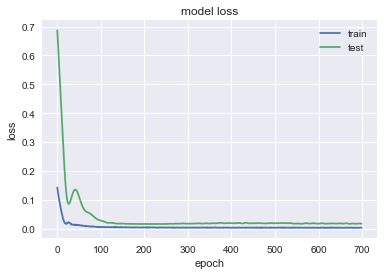

(21, 1, 10)
             CBRE
MSE       29.0507
MAE       4.59738
R2       -1.07283
MAPE (%)  9.90651


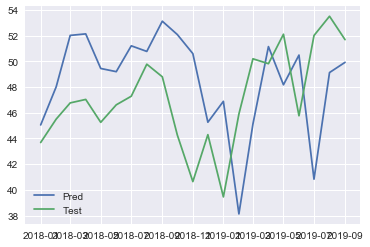

In [337]:
pred_multi = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi[comp] = nn_forec_multi(df,comp,n_train_time_=test.shape[0],first_layer = 64,second_layer=32).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3184 - val_loss: 0.2027
Epoch 2/700
0s - loss: 0.2946 - val_loss: 0.1814
Epoch 3/700
0s - loss: 0.2731 - val_loss: 0.1611
Epoch 4/700
0s - loss: 0.2514 - val_loss: 0.1415
Epoch 5/700
0s - loss: 0.2309 - val_loss: 0.1221
Epoch 6/700
0s - loss: 0.2091 - val_loss: 0.1030
Epoch 7/700
0s - loss: 0.1887 - val_loss: 0.0845
Epoch 8/700
0s - loss: 0.1685 - val_loss: 0.0667
Epoch 9/700
0s - loss: 0.1472 - val_loss: 0.0503
Epoch 10/700
0s - loss: 0.1269 - val_loss: 0.0357
Epoch 11/700
0s - loss: 0.1081 - val_loss: 0.0240
Epoch 12/700
0s - loss: 0.0875 - val_loss: 0.0161
Epoch 13/700
0s - loss: 0.0692 - val_loss: 0.0135
Epoch 14/700
0s - loss: 0.0514 - val_loss: 0.0175
Epoch 15/700
0s - loss: 0.0374 - val_loss: 0.0291
Epoch 16/700
0s - loss: 0.0279 - val_loss: 0.0488
Epoch 17/700
0s - loss: 0.0219 - val_loss: 0.0760
Epoch 18/700
0s - loss: 0.0200 - val_loss: 0.1078
Epoch 19/700
0s - loss: 0.0216 - val_loss: 0.14

0s - loss: 0.0095 - val_loss: 0.0333
Epoch 168/700
0s - loss: 0.0093 - val_loss: 0.0327
Epoch 169/700
0s - loss: 0.0098 - val_loss: 0.0321
Epoch 170/700
0s - loss: 0.0085 - val_loss: 0.0315
Epoch 171/700
0s - loss: 0.0091 - val_loss: 0.0308
Epoch 172/700
0s - loss: 0.0093 - val_loss: 0.0302
Epoch 173/700
0s - loss: 0.0081 - val_loss: 0.0297
Epoch 174/700
0s - loss: 0.0086 - val_loss: 0.0290
Epoch 175/700
0s - loss: 0.0095 - val_loss: 0.0282
Epoch 176/700
0s - loss: 0.0097 - val_loss: 0.0276
Epoch 177/700
0s - loss: 0.0077 - val_loss: 0.0271
Epoch 178/700
0s - loss: 0.0095 - val_loss: 0.0265
Epoch 179/700
0s - loss: 0.0076 - val_loss: 0.0261
Epoch 180/700
0s - loss: 0.0092 - val_loss: 0.0258
Epoch 181/700
0s - loss: 0.0093 - val_loss: 0.0256
Epoch 182/700
0s - loss: 0.0086 - val_loss: 0.0252
Epoch 183/700
0s - loss: 0.0073 - val_loss: 0.0250
Epoch 184/700
0s - loss: 0.0098 - val_loss: 0.0245
Epoch 185/700
0s - loss: 0.0089 - val_loss: 0.0238
Epoch 186/700
0s - loss: 0.0070 - val_loss: 0

0s - loss: 0.0066 - val_loss: 0.0074
Epoch 332/700
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 333/700
0s - loss: 0.0076 - val_loss: 0.0074
Epoch 334/700
0s - loss: 0.0081 - val_loss: 0.0074
Epoch 335/700
0s - loss: 0.0074 - val_loss: 0.0074
Epoch 336/700
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 337/700
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 338/700
0s - loss: 0.0073 - val_loss: 0.0074
Epoch 339/700
0s - loss: 0.0082 - val_loss: 0.0074
Epoch 340/700
0s - loss: 0.0075 - val_loss: 0.0074
Epoch 341/700
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 342/700
0s - loss: 0.0080 - val_loss: 0.0075
Epoch 343/700
0s - loss: 0.0084 - val_loss: 0.0075
Epoch 344/700
0s - loss: 0.0069 - val_loss: 0.0075
Epoch 345/700
0s - loss: 0.0068 - val_loss: 0.0075
Epoch 346/700
0s - loss: 0.0066 - val_loss: 0.0075
Epoch 347/700
0s - loss: 0.0068 - val_loss: 0.0074
Epoch 348/700
0s - loss: 0.0066 - val_loss: 0.0074
Epoch 349/700
0s - loss: 0.0060 - val_loss: 0.0073
Epoch 350/700
0s - loss: 0.0074 - val_loss: 0

0s - loss: 0.0074 - val_loss: 0.0076
Epoch 496/700
0s - loss: 0.0062 - val_loss: 0.0077
Epoch 497/700
0s - loss: 0.0069 - val_loss: 0.0077
Epoch 498/700
0s - loss: 0.0069 - val_loss: 0.0078
Epoch 499/700
0s - loss: 0.0060 - val_loss: 0.0079
Epoch 500/700
0s - loss: 0.0082 - val_loss: 0.0079
Epoch 501/700
0s - loss: 0.0064 - val_loss: 0.0080
Epoch 502/700
0s - loss: 0.0073 - val_loss: 0.0080
Epoch 503/700
0s - loss: 0.0067 - val_loss: 0.0080
Epoch 504/700
0s - loss: 0.0069 - val_loss: 0.0079
Epoch 505/700
0s - loss: 0.0067 - val_loss: 0.0079
Epoch 506/700
0s - loss: 0.0064 - val_loss: 0.0078
Epoch 507/700
0s - loss: 0.0071 - val_loss: 0.0077
Epoch 508/700
0s - loss: 0.0061 - val_loss: 0.0077
Epoch 509/700
0s - loss: 0.0067 - val_loss: 0.0076
Epoch 510/700
0s - loss: 0.0082 - val_loss: 0.0076
Epoch 511/700
0s - loss: 0.0066 - val_loss: 0.0077
Epoch 512/700
0s - loss: 0.0077 - val_loss: 0.0078
Epoch 513/700
0s - loss: 0.0071 - val_loss: 0.0079
Epoch 514/700
0s - loss: 0.0073 - val_loss: 0

0s - loss: 0.0070 - val_loss: 0.0086
Epoch 667/700
0s - loss: 0.0068 - val_loss: 0.0086
Epoch 668/700
0s - loss: 0.0068 - val_loss: 0.0087
Epoch 669/700
0s - loss: 0.0072 - val_loss: 0.0088
Epoch 670/700
0s - loss: 0.0067 - val_loss: 0.0089
Epoch 671/700
0s - loss: 0.0069 - val_loss: 0.0089
Epoch 672/700
0s - loss: 0.0070 - val_loss: 0.0088
Epoch 673/700
0s - loss: 0.0069 - val_loss: 0.0087
Epoch 674/700
0s - loss: 0.0069 - val_loss: 0.0085
Epoch 675/700
0s - loss: 0.0080 - val_loss: 0.0085
Epoch 676/700
0s - loss: 0.0056 - val_loss: 0.0086
Epoch 677/700
0s - loss: 0.0064 - val_loss: 0.0086
Epoch 678/700
0s - loss: 0.0068 - val_loss: 0.0086
Epoch 679/700
0s - loss: 0.0080 - val_loss: 0.0087
Epoch 680/700
0s - loss: 0.0064 - val_loss: 0.0088
Epoch 681/700
0s - loss: 0.0072 - val_loss: 0.0089
Epoch 682/700
0s - loss: 0.0068 - val_loss: 0.0090
Epoch 683/700
0s - loss: 0.0064 - val_loss: 0.0091
Epoch 684/700
0s - loss: 0.0061 - val_loss: 0.0093
Epoch 685/700
0s - loss: 0.0070 - val_loss: 0

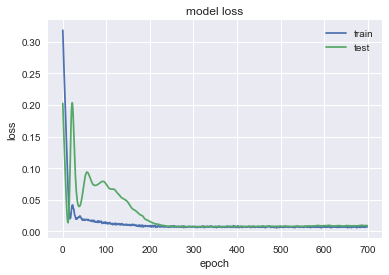

(21, 1, 10)
                 T
MSE        3.29976
MAE        1.43721
R2        0.275647
MAPE (%)   4.32215


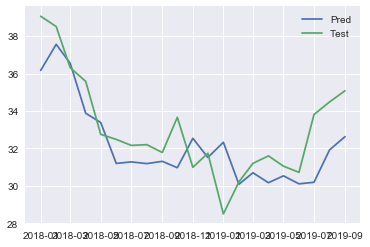

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1198 - val_loss: 0.6821
Epoch 2/700
0s - loss: 0.1051 - val_loss: 0.6334
Epoch 3/700
0s - loss: 0.0914 - val_loss: 0.5858
Epoch 4/700
0s - loss: 0.0794 - val_loss: 0.5378
Epoch 5/700
0s - loss: 0.0684 - val_loss: 0.4891
Epoch 6/700
0s - loss: 0.0578 - val_loss: 0.4393
Epoch 7/700
0s - loss: 0.0480 - val_loss: 0.3888
Epoch 8/700
0s - loss: 0.0386 - val_loss: 0.3381
Epoch 9/700
0s - loss: 0.0328 - val_loss: 0.2888
Epoch 10/700
0s - loss: 0.0268 - val_loss: 0.2426
Epoch 11/700
0s - loss: 0.0242 - val_loss: 0.2014
Epoch 12/700
0s - loss: 0.0240 - val_loss: 0.1670
Epoch 13/700
0s - loss: 0.0256 - val_loss: 0.1406
Epoch 14/700
0s - loss: 0.0272 - val_loss: 0.1223
Epoch 15/700
0s - loss: 0.0295 - val_loss: 0.1115
Epoch 16/700
0s - loss: 0.0305 - val_loss: 0.1068
Epoch 17/700
0s - loss: 0.0294 - val_loss: 0.1068
Epoch 18/700
0s - loss: 0.0287 - val_loss: 0.1107
Epoch 19/700
0s - loss: 0.0261 - val_loss: 0.

0s - loss: 0.0037 - val_loss: 0.0095
Epoch 166/700
0s - loss: 0.0038 - val_loss: 0.0095
Epoch 167/700
0s - loss: 0.0030 - val_loss: 0.0094
Epoch 168/700
0s - loss: 0.0036 - val_loss: 0.0094
Epoch 169/700
0s - loss: 0.0039 - val_loss: 0.0093
Epoch 170/700
0s - loss: 0.0034 - val_loss: 0.0092
Epoch 171/700
0s - loss: 0.0036 - val_loss: 0.0091
Epoch 172/700
0s - loss: 0.0036 - val_loss: 0.0091
Epoch 173/700
0s - loss: 0.0036 - val_loss: 0.0091
Epoch 174/700
0s - loss: 0.0033 - val_loss: 0.0090
Epoch 175/700
0s - loss: 0.0031 - val_loss: 0.0090
Epoch 176/700
0s - loss: 0.0036 - val_loss: 0.0090
Epoch 177/700
0s - loss: 0.0036 - val_loss: 0.0090
Epoch 178/700
0s - loss: 0.0037 - val_loss: 0.0090
Epoch 179/700
0s - loss: 0.0037 - val_loss: 0.0090
Epoch 180/700
0s - loss: 0.0036 - val_loss: 0.0090
Epoch 181/700
0s - loss: 0.0034 - val_loss: 0.0091
Epoch 182/700
0s - loss: 0.0037 - val_loss: 0.0092
Epoch 183/700
0s - loss: 0.0033 - val_loss: 0.0091
Epoch 184/700
0s - loss: 0.0036 - val_loss: 0

0s - loss: 0.0032 - val_loss: 0.0103
Epoch 331/700
0s - loss: 0.0028 - val_loss: 0.0101
Epoch 332/700
0s - loss: 0.0030 - val_loss: 0.0101
Epoch 333/700
0s - loss: 0.0026 - val_loss: 0.0101
Epoch 334/700
0s - loss: 0.0032 - val_loss: 0.0101
Epoch 335/700
0s - loss: 0.0032 - val_loss: 0.0101
Epoch 336/700
0s - loss: 0.0030 - val_loss: 0.0102
Epoch 337/700
0s - loss: 0.0026 - val_loss: 0.0103
Epoch 338/700
0s - loss: 0.0027 - val_loss: 0.0104
Epoch 339/700
0s - loss: 0.0027 - val_loss: 0.0104
Epoch 340/700
0s - loss: 0.0027 - val_loss: 0.0104
Epoch 341/700
0s - loss: 0.0028 - val_loss: 0.0103
Epoch 342/700
0s - loss: 0.0031 - val_loss: 0.0103
Epoch 343/700
0s - loss: 0.0029 - val_loss: 0.0104
Epoch 344/700
0s - loss: 0.0029 - val_loss: 0.0105
Epoch 345/700
0s - loss: 0.0033 - val_loss: 0.0106
Epoch 346/700
0s - loss: 0.0029 - val_loss: 0.0107
Epoch 347/700
0s - loss: 0.0028 - val_loss: 0.0107
Epoch 348/700
0s - loss: 0.0028 - val_loss: 0.0106
Epoch 349/700
0s - loss: 0.0026 - val_loss: 0

0s - loss: 0.0027 - val_loss: 0.0129
Epoch 492/700
0s - loss: 0.0026 - val_loss: 0.0130
Epoch 493/700
0s - loss: 0.0026 - val_loss: 0.0129
Epoch 494/700
0s - loss: 0.0025 - val_loss: 0.0129
Epoch 495/700
0s - loss: 0.0031 - val_loss: 0.0131
Epoch 496/700
0s - loss: 0.0027 - val_loss: 0.0132
Epoch 497/700
0s - loss: 0.0026 - val_loss: 0.0133
Epoch 498/700
0s - loss: 0.0026 - val_loss: 0.0133
Epoch 499/700
0s - loss: 0.0027 - val_loss: 0.0134
Epoch 500/700
0s - loss: 0.0027 - val_loss: 0.0136
Epoch 501/700
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 502/700
0s - loss: 0.0025 - val_loss: 0.0142
Epoch 503/700
0s - loss: 0.0026 - val_loss: 0.0142
Epoch 504/700
0s - loss: 0.0029 - val_loss: 0.0143
Epoch 505/700
0s - loss: 0.0027 - val_loss: 0.0142
Epoch 506/700
0s - loss: 0.0027 - val_loss: 0.0140
Epoch 507/700
0s - loss: 0.0028 - val_loss: 0.0137
Epoch 508/700
0s - loss: 0.0026 - val_loss: 0.0134
Epoch 509/700
0s - loss: 0.0029 - val_loss: 0.0132
Epoch 510/700
0s - loss: 0.0029 - val_loss: 0

Epoch 653/700
0s - loss: 0.0027 - val_loss: 0.0152
Epoch 654/700
0s - loss: 0.0031 - val_loss: 0.0151
Epoch 655/700
0s - loss: 0.0027 - val_loss: 0.0150
Epoch 656/700
0s - loss: 0.0029 - val_loss: 0.0148
Epoch 657/700
0s - loss: 0.0026 - val_loss: 0.0149
Epoch 658/700
0s - loss: 0.0034 - val_loss: 0.0151
Epoch 659/700
0s - loss: 0.0029 - val_loss: 0.0154
Epoch 660/700
0s - loss: 0.0035 - val_loss: 0.0156
Epoch 661/700
0s - loss: 0.0026 - val_loss: 0.0159
Epoch 662/700
0s - loss: 0.0031 - val_loss: 0.0159
Epoch 663/700
0s - loss: 0.0029 - val_loss: 0.0154
Epoch 664/700
0s - loss: 0.0027 - val_loss: 0.0149
Epoch 665/700
0s - loss: 0.0026 - val_loss: 0.0143
Epoch 666/700
0s - loss: 0.0026 - val_loss: 0.0138
Epoch 667/700
0s - loss: 0.0024 - val_loss: 0.0136
Epoch 668/700
0s - loss: 0.0033 - val_loss: 0.0136
Epoch 669/700
0s - loss: 0.0025 - val_loss: 0.0138
Epoch 670/700
0s - loss: 0.0028 - val_loss: 0.0142
Epoch 671/700
0s - loss: 0.0024 - val_loss: 0.0143
Epoch 672/700
0s - loss: 0.0029

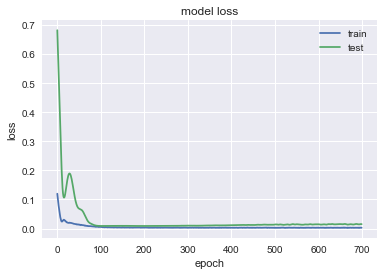

(21, 1, 10)
               BBY
MSE        69.2698
MAE        7.21192
R2       -0.742528
MAPE (%)   10.2588


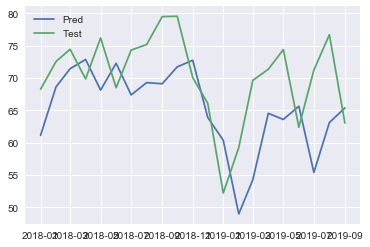

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.2381 - val_loss: 0.5005
Epoch 2/700
0s - loss: 0.2128 - val_loss: 0.4566
Epoch 3/700
0s - loss: 0.1899 - val_loss: 0.4149
Epoch 4/700
0s - loss: 0.1698 - val_loss: 0.3742
Epoch 5/700
0s - loss: 0.1483 - val_loss: 0.3339
Epoch 6/700
0s - loss: 0.1296 - val_loss: 0.2937
Epoch 7/700
0s - loss: 0.1098 - val_loss: 0.2536
Epoch 8/700
0s - loss: 0.0933 - val_loss: 0.2139
Epoch 9/700
0s - loss: 0.0745 - val_loss: 0.1752
Epoch 10/700
0s - loss: 0.0581 - val_loss: 0.1382
Epoch 11/700
0s - loss: 0.0421 - val_loss: 0.1042
Epoch 12/700
0s - loss: 0.0287 - val_loss: 0.0748
Epoch 13/700
0s - loss: 0.0177 - val_loss: 0.0514
Epoch 14/700
0s - loss: 0.0104 - val_loss: 0.0351
Epoch 15/700
0s - loss: 0.0084 - val_loss: 0.0260
Epoch 16/700
0s - loss: 0.0093 - val_loss: 0.0231
Epoch 17/700
0s - loss: 0.0118 - val_loss: 0.0246
Epoch 18/700
0s - loss: 0.0166 - val_loss: 0.0278
Epoch 19/700
0s - loss: 0.0215 - val_loss: 0.0

0s - loss: 0.0040 - val_loss: 0.0267
Epoch 168/700
0s - loss: 0.0040 - val_loss: 0.0267
Epoch 169/700
0s - loss: 0.0046 - val_loss: 0.0268
Epoch 170/700
0s - loss: 0.0048 - val_loss: 0.0269
Epoch 171/700
0s - loss: 0.0043 - val_loss: 0.0270
Epoch 172/700
0s - loss: 0.0046 - val_loss: 0.0272
Epoch 173/700
0s - loss: 0.0042 - val_loss: 0.0274
Epoch 174/700
0s - loss: 0.0037 - val_loss: 0.0277
Epoch 175/700
0s - loss: 0.0045 - val_loss: 0.0278
Epoch 176/700
0s - loss: 0.0039 - val_loss: 0.0280
Epoch 177/700
0s - loss: 0.0046 - val_loss: 0.0281
Epoch 178/700
0s - loss: 0.0043 - val_loss: 0.0282
Epoch 179/700
0s - loss: 0.0044 - val_loss: 0.0283
Epoch 180/700
0s - loss: 0.0042 - val_loss: 0.0283
Epoch 181/700
0s - loss: 0.0036 - val_loss: 0.0284
Epoch 182/700
0s - loss: 0.0047 - val_loss: 0.0284
Epoch 183/700
0s - loss: 0.0040 - val_loss: 0.0285
Epoch 184/700
0s - loss: 0.0045 - val_loss: 0.0286
Epoch 185/700
0s - loss: 0.0044 - val_loss: 0.0287
Epoch 186/700
0s - loss: 0.0046 - val_loss: 0

0s - loss: 0.0032 - val_loss: 0.0304
Epoch 339/700
0s - loss: 0.0037 - val_loss: 0.0304
Epoch 340/700
0s - loss: 0.0032 - val_loss: 0.0302
Epoch 341/700
0s - loss: 0.0036 - val_loss: 0.0302
Epoch 342/700
0s - loss: 0.0033 - val_loss: 0.0302
Epoch 343/700
0s - loss: 0.0033 - val_loss: 0.0302
Epoch 344/700
0s - loss: 0.0039 - val_loss: 0.0302
Epoch 345/700
0s - loss: 0.0033 - val_loss: 0.0301
Epoch 346/700
0s - loss: 0.0037 - val_loss: 0.0300
Epoch 347/700
0s - loss: 0.0033 - val_loss: 0.0298
Epoch 348/700
0s - loss: 0.0029 - val_loss: 0.0295
Epoch 349/700
0s - loss: 0.0033 - val_loss: 0.0293
Epoch 350/700
0s - loss: 0.0034 - val_loss: 0.0293
Epoch 351/700
0s - loss: 0.0035 - val_loss: 0.0295
Epoch 352/700
0s - loss: 0.0033 - val_loss: 0.0297
Epoch 353/700
0s - loss: 0.0031 - val_loss: 0.0298
Epoch 354/700
0s - loss: 0.0037 - val_loss: 0.0299
Epoch 355/700
0s - loss: 0.0032 - val_loss: 0.0300
Epoch 356/700
0s - loss: 0.0036 - val_loss: 0.0299
Epoch 357/700
0s - loss: 0.0034 - val_loss: 0

0s - loss: 0.0028 - val_loss: 0.0196
Epoch 502/700
0s - loss: 0.0027 - val_loss: 0.0193
Epoch 503/700
0s - loss: 0.0032 - val_loss: 0.0191
Epoch 504/700
0s - loss: 0.0027 - val_loss: 0.0190
Epoch 505/700
0s - loss: 0.0028 - val_loss: 0.0190
Epoch 506/700
0s - loss: 0.0027 - val_loss: 0.0194
Epoch 507/700
0s - loss: 0.0033 - val_loss: 0.0198
Epoch 508/700
0s - loss: 0.0031 - val_loss: 0.0201
Epoch 509/700
0s - loss: 0.0026 - val_loss: 0.0202
Epoch 510/700
0s - loss: 0.0025 - val_loss: 0.0202
Epoch 511/700
0s - loss: 0.0026 - val_loss: 0.0202
Epoch 512/700
0s - loss: 0.0028 - val_loss: 0.0204
Epoch 513/700
0s - loss: 0.0029 - val_loss: 0.0202
Epoch 514/700
0s - loss: 0.0027 - val_loss: 0.0198
Epoch 515/700
0s - loss: 0.0031 - val_loss: 0.0192
Epoch 516/700
0s - loss: 0.0027 - val_loss: 0.0186
Epoch 517/700
0s - loss: 0.0028 - val_loss: 0.0182
Epoch 518/700
0s - loss: 0.0022 - val_loss: 0.0178
Epoch 519/700
0s - loss: 0.0030 - val_loss: 0.0176
Epoch 520/700
0s - loss: 0.0027 - val_loss: 0

0s - loss: 0.0033 - val_loss: 0.0139
Epoch 663/700
0s - loss: 0.0024 - val_loss: 0.0137
Epoch 664/700
0s - loss: 0.0027 - val_loss: 0.0134
Epoch 665/700
0s - loss: 0.0028 - val_loss: 0.0133
Epoch 666/700
0s - loss: 0.0025 - val_loss: 0.0133
Epoch 667/700
0s - loss: 0.0022 - val_loss: 0.0133
Epoch 668/700
0s - loss: 0.0022 - val_loss: 0.0134
Epoch 669/700
0s - loss: 0.0019 - val_loss: 0.0134
Epoch 670/700
0s - loss: 0.0024 - val_loss: 0.0134
Epoch 671/700
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 672/700
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 673/700
0s - loss: 0.0026 - val_loss: 0.0134
Epoch 674/700
0s - loss: 0.0026 - val_loss: 0.0134
Epoch 675/700
0s - loss: 0.0028 - val_loss: 0.0134
Epoch 676/700
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 677/700
0s - loss: 0.0025 - val_loss: 0.0137
Epoch 678/700
0s - loss: 0.0027 - val_loss: 0.0137
Epoch 679/700
0s - loss: 0.0027 - val_loss: 0.0137
Epoch 680/700
0s - loss: 0.0026 - val_loss: 0.0138
Epoch 681/700
0s - loss: 0.0030 - val_loss: 0

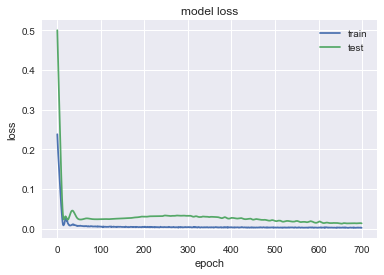

(21, 1, 10)
               KO
MSE       12.0078
MAE       2.67663
R2       -4.05997
MAPE (%)  5.45272


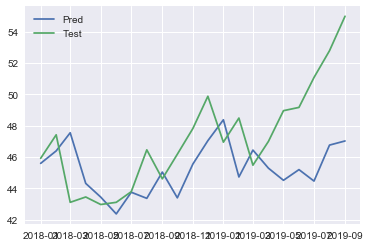

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3076 - val_loss: 0.0291
Epoch 2/700
0s - loss: 0.2832 - val_loss: 0.0209
Epoch 3/700
0s - loss: 0.2591 - val_loss: 0.0145
Epoch 4/700
0s - loss: 0.2356 - val_loss: 0.0100
Epoch 5/700
0s - loss: 0.2134 - val_loss: 0.0078
Epoch 6/700
0s - loss: 0.1918 - val_loss: 0.0085
Epoch 7/700
0s - loss: 0.1718 - val_loss: 0.0128
Epoch 8/700
0s - loss: 0.1493 - val_loss: 0.0218
Epoch 9/700
0s - loss: 0.1307 - val_loss: 0.0367
Epoch 10/700
0s - loss: 0.1117 - val_loss: 0.0587
Epoch 11/700
0s - loss: 0.0958 - val_loss: 0.0886
Epoch 12/700
0s - loss: 0.0853 - val_loss: 0.1263
Epoch 13/700
0s - loss: 0.0752 - val_loss: 0.1703
Epoch 14/700
0s - loss: 0.0667 - val_loss: 0.2175
Epoch 15/700
0s - loss: 0.0685 - val_loss: 0.2621
Epoch 16/700
0s - loss: 0.0666 - val_loss: 0.2994
Epoch 17/700
0s - loss: 0.0732 - val_loss: 0.3241
Epoch 18/700
0s - loss: 0.0753 - val_loss: 0.3359
Epoch 19/700
0s - loss: 0.0759 - val_loss: 0.

0s - loss: 0.0072 - val_loss: 0.0054
Epoch 169/700
0s - loss: 0.0081 - val_loss: 0.0053
Epoch 170/700
0s - loss: 0.0071 - val_loss: 0.0054
Epoch 171/700
0s - loss: 0.0077 - val_loss: 0.0053
Epoch 172/700
0s - loss: 0.0085 - val_loss: 0.0052
Epoch 173/700
0s - loss: 0.0083 - val_loss: 0.0051
Epoch 174/700
0s - loss: 0.0078 - val_loss: 0.0051
Epoch 175/700
0s - loss: 0.0072 - val_loss: 0.0050
Epoch 176/700
0s - loss: 0.0088 - val_loss: 0.0050
Epoch 177/700
0s - loss: 0.0079 - val_loss: 0.0049
Epoch 178/700
0s - loss: 0.0082 - val_loss: 0.0049
Epoch 179/700
0s - loss: 0.0079 - val_loss: 0.0048
Epoch 180/700
0s - loss: 0.0075 - val_loss: 0.0048
Epoch 181/700
0s - loss: 0.0072 - val_loss: 0.0047
Epoch 182/700
0s - loss: 0.0081 - val_loss: 0.0046
Epoch 183/700
0s - loss: 0.0077 - val_loss: 0.0046
Epoch 184/700
0s - loss: 0.0078 - val_loss: 0.0045
Epoch 185/700
0s - loss: 0.0076 - val_loss: 0.0044
Epoch 186/700
0s - loss: 0.0073 - val_loss: 0.0044
Epoch 187/700
0s - loss: 0.0078 - val_loss: 0

0s - loss: 0.0073 - val_loss: 0.0037
Epoch 340/700
0s - loss: 0.0073 - val_loss: 0.0037
Epoch 341/700
0s - loss: 0.0071 - val_loss: 0.0037
Epoch 342/700
0s - loss: 0.0062 - val_loss: 0.0037
Epoch 343/700
0s - loss: 0.0080 - val_loss: 0.0037
Epoch 344/700
0s - loss: 0.0064 - val_loss: 0.0037
Epoch 345/700
0s - loss: 0.0064 - val_loss: 0.0037
Epoch 346/700
0s - loss: 0.0076 - val_loss: 0.0037
Epoch 347/700
0s - loss: 0.0072 - val_loss: 0.0037
Epoch 348/700
0s - loss: 0.0070 - val_loss: 0.0038
Epoch 349/700
0s - loss: 0.0078 - val_loss: 0.0038
Epoch 350/700
0s - loss: 0.0068 - val_loss: 0.0039
Epoch 351/700
0s - loss: 0.0067 - val_loss: 0.0039
Epoch 352/700
0s - loss: 0.0076 - val_loss: 0.0039
Epoch 353/700
0s - loss: 0.0079 - val_loss: 0.0039
Epoch 354/700
0s - loss: 0.0073 - val_loss: 0.0039
Epoch 355/700
0s - loss: 0.0083 - val_loss: 0.0039
Epoch 356/700
0s - loss: 0.0072 - val_loss: 0.0038
Epoch 357/700
0s - loss: 0.0076 - val_loss: 0.0037
Epoch 358/700
0s - loss: 0.0074 - val_loss: 0

0s - loss: 0.0064 - val_loss: 0.0036
Epoch 514/700
0s - loss: 0.0063 - val_loss: 0.0036
Epoch 515/700
0s - loss: 0.0064 - val_loss: 0.0037
Epoch 516/700
0s - loss: 0.0073 - val_loss: 0.0037
Epoch 517/700
0s - loss: 0.0076 - val_loss: 0.0037
Epoch 518/700
0s - loss: 0.0060 - val_loss: 0.0037
Epoch 519/700
0s - loss: 0.0059 - val_loss: 0.0036
Epoch 520/700
0s - loss: 0.0077 - val_loss: 0.0036
Epoch 521/700
0s - loss: 0.0071 - val_loss: 0.0036
Epoch 522/700
0s - loss: 0.0072 - val_loss: 0.0036
Epoch 523/700
0s - loss: 0.0070 - val_loss: 0.0036
Epoch 524/700
0s - loss: 0.0061 - val_loss: 0.0036
Epoch 525/700
0s - loss: 0.0065 - val_loss: 0.0036
Epoch 526/700
0s - loss: 0.0065 - val_loss: 0.0036
Epoch 527/700
0s - loss: 0.0076 - val_loss: 0.0036
Epoch 528/700
0s - loss: 0.0073 - val_loss: 0.0036
Epoch 529/700
0s - loss: 0.0064 - val_loss: 0.0037
Epoch 530/700
0s - loss: 0.0069 - val_loss: 0.0038
Epoch 531/700
0s - loss: 0.0063 - val_loss: 0.0039
Epoch 532/700
0s - loss: 0.0068 - val_loss: 0

0s - loss: 0.0073 - val_loss: 0.0041
Epoch 688/700
0s - loss: 0.0060 - val_loss: 0.0041
Epoch 689/700
0s - loss: 0.0070 - val_loss: 0.0040
Epoch 690/700
0s - loss: 0.0068 - val_loss: 0.0039
Epoch 691/700
0s - loss: 0.0059 - val_loss: 0.0038
Epoch 692/700
0s - loss: 0.0069 - val_loss: 0.0038
Epoch 693/700
0s - loss: 0.0060 - val_loss: 0.0038
Epoch 694/700
0s - loss: 0.0068 - val_loss: 0.0038
Epoch 695/700
0s - loss: 0.0063 - val_loss: 0.0038
Epoch 696/700
0s - loss: 0.0067 - val_loss: 0.0039
Epoch 697/700
0s - loss: 0.0070 - val_loss: 0.0040
Epoch 698/700
0s - loss: 0.0071 - val_loss: 0.0041
Epoch 699/700
0s - loss: 0.0076 - val_loss: 0.0041
Epoch 700/700
0s - loss: 0.0063 - val_loss: 0.0042


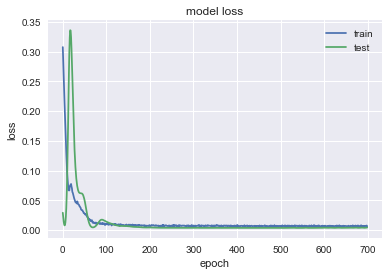

(21, 1, 10)
                FTI
MSE          7.7289
MAE         2.35804
R2        0.0993892
MAPE (%)    8.68845


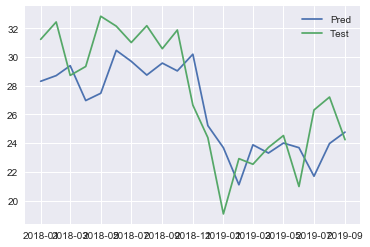

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1499 - val_loss: 0.5748
Epoch 2/700
0s - loss: 0.1321 - val_loss: 0.5255
Epoch 3/700
0s - loss: 0.1156 - val_loss: 0.4784
Epoch 4/700
0s - loss: 0.0996 - val_loss: 0.4322
Epoch 5/700
0s - loss: 0.0858 - val_loss: 0.3860
Epoch 6/700
0s - loss: 0.0722 - val_loss: 0.3397
Epoch 7/700
0s - loss: 0.0587 - val_loss: 0.2934
Epoch 8/700
0s - loss: 0.0504 - val_loss: 0.2477
Epoch 9/700
0s - loss: 0.0388 - val_loss: 0.2037
Epoch 10/700
0s - loss: 0.0310 - val_loss: 0.1625
Epoch 11/700
0s - loss: 0.0257 - val_loss: 0.1259
Epoch 12/700
0s - loss: 0.0233 - val_loss: 0.0951
Epoch 13/700
0s - loss: 0.0229 - val_loss: 0.0712
Epoch 14/700
0s - loss: 0.0241 - val_loss: 0.0541
Epoch 15/700
0s - loss: 0.0264 - val_loss: 0.0429
Epoch 16/700
0s - loss: 0.0286 - val_loss: 0.0362
Epoch 17/700
0s - loss: 0.0303 - val_loss: 0.0332
Epoch 18/700
0s - loss: 0.0281 - val_loss: 0.0327
Epoch 19/700
0s - loss: 0.0284 - val_loss: 0.

0s - loss: 0.0029 - val_loss: 0.0176
Epoch 165/700
0s - loss: 0.0027 - val_loss: 0.0175
Epoch 166/700
0s - loss: 0.0028 - val_loss: 0.0175
Epoch 167/700
0s - loss: 0.0026 - val_loss: 0.0175
Epoch 168/700
0s - loss: 0.0032 - val_loss: 0.0176
Epoch 169/700
0s - loss: 0.0030 - val_loss: 0.0177
Epoch 170/700
0s - loss: 0.0031 - val_loss: 0.0176
Epoch 171/700
0s - loss: 0.0024 - val_loss: 0.0176
Epoch 172/700
0s - loss: 0.0031 - val_loss: 0.0177
Epoch 173/700
0s - loss: 0.0027 - val_loss: 0.0178
Epoch 174/700
0s - loss: 0.0031 - val_loss: 0.0179
Epoch 175/700
0s - loss: 0.0031 - val_loss: 0.0181
Epoch 176/700
0s - loss: 0.0030 - val_loss: 0.0183
Epoch 177/700
0s - loss: 0.0025 - val_loss: 0.0185
Epoch 178/700
0s - loss: 0.0027 - val_loss: 0.0186
Epoch 179/700
0s - loss: 0.0034 - val_loss: 0.0187
Epoch 180/700
0s - loss: 0.0027 - val_loss: 0.0189
Epoch 181/700
0s - loss: 0.0028 - val_loss: 0.0189
Epoch 182/700
0s - loss: 0.0030 - val_loss: 0.0189
Epoch 183/700
0s - loss: 0.0029 - val_loss: 0

Epoch 337/700
0s - loss: 0.0028 - val_loss: 0.0195
Epoch 338/700
0s - loss: 0.0024 - val_loss: 0.0198
Epoch 339/700
0s - loss: 0.0027 - val_loss: 0.0197
Epoch 340/700
0s - loss: 0.0024 - val_loss: 0.0195
Epoch 341/700
0s - loss: 0.0026 - val_loss: 0.0192
Epoch 342/700
0s - loss: 0.0020 - val_loss: 0.0190
Epoch 343/700
0s - loss: 0.0020 - val_loss: 0.0190
Epoch 344/700
0s - loss: 0.0026 - val_loss: 0.0190
Epoch 345/700
0s - loss: 0.0024 - val_loss: 0.0190
Epoch 346/700
0s - loss: 0.0022 - val_loss: 0.0191
Epoch 347/700
0s - loss: 0.0029 - val_loss: 0.0192
Epoch 348/700
0s - loss: 0.0025 - val_loss: 0.0194
Epoch 349/700
0s - loss: 0.0025 - val_loss: 0.0195
Epoch 350/700
0s - loss: 0.0023 - val_loss: 0.0194
Epoch 351/700
0s - loss: 0.0026 - val_loss: 0.0193
Epoch 352/700
0s - loss: 0.0020 - val_loss: 0.0193
Epoch 353/700
0s - loss: 0.0023 - val_loss: 0.0192
Epoch 354/700
0s - loss: 0.0025 - val_loss: 0.0192
Epoch 355/700
0s - loss: 0.0024 - val_loss: 0.0190
Epoch 356/700
0s - loss: 0.0023

0s - loss: 0.0026 - val_loss: 0.0168
Epoch 509/700
0s - loss: 0.0021 - val_loss: 0.0171
Epoch 510/700
0s - loss: 0.0019 - val_loss: 0.0175
Epoch 511/700
0s - loss: 0.0022 - val_loss: 0.0177
Epoch 512/700
0s - loss: 0.0021 - val_loss: 0.0179
Epoch 513/700
0s - loss: 0.0022 - val_loss: 0.0178
Epoch 514/700
0s - loss: 0.0023 - val_loss: 0.0177
Epoch 515/700
0s - loss: 0.0024 - val_loss: 0.0176
Epoch 516/700
0s - loss: 0.0020 - val_loss: 0.0177
Epoch 517/700
0s - loss: 0.0021 - val_loss: 0.0180
Epoch 518/700
0s - loss: 0.0021 - val_loss: 0.0181
Epoch 519/700
0s - loss: 0.0023 - val_loss: 0.0182
Epoch 520/700
0s - loss: 0.0021 - val_loss: 0.0181
Epoch 521/700
0s - loss: 0.0022 - val_loss: 0.0179
Epoch 522/700
0s - loss: 0.0025 - val_loss: 0.0179
Epoch 523/700
0s - loss: 0.0022 - val_loss: 0.0180
Epoch 524/700
0s - loss: 0.0021 - val_loss: 0.0181
Epoch 525/700
0s - loss: 0.0022 - val_loss: 0.0184
Epoch 526/700
0s - loss: 0.0023 - val_loss: 0.0186
Epoch 527/700
0s - loss: 0.0022 - val_loss: 0

0s - loss: 0.0023 - val_loss: 0.0172
Epoch 684/700
0s - loss: 0.0017 - val_loss: 0.0172
Epoch 685/700
0s - loss: 0.0021 - val_loss: 0.0173
Epoch 686/700
0s - loss: 0.0019 - val_loss: 0.0176
Epoch 687/700
0s - loss: 0.0020 - val_loss: 0.0176
Epoch 688/700
0s - loss: 0.0023 - val_loss: 0.0177
Epoch 689/700
0s - loss: 0.0020 - val_loss: 0.0177
Epoch 690/700
0s - loss: 0.0019 - val_loss: 0.0180
Epoch 691/700
0s - loss: 0.0019 - val_loss: 0.0181
Epoch 692/700
0s - loss: 0.0023 - val_loss: 0.0179
Epoch 693/700
0s - loss: 0.0018 - val_loss: 0.0179
Epoch 694/700
0s - loss: 0.0019 - val_loss: 0.0180
Epoch 695/700
0s - loss: 0.0021 - val_loss: 0.0180
Epoch 696/700
0s - loss: 0.0018 - val_loss: 0.0180
Epoch 697/700
0s - loss: 0.0019 - val_loss: 0.0182
Epoch 698/700
0s - loss: 0.0019 - val_loss: 0.0184
Epoch 699/700
0s - loss: 0.0020 - val_loss: 0.0187
Epoch 700/700
0s - loss: 0.0023 - val_loss: 0.0188


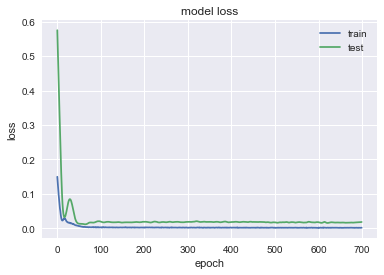

(21, 1, 10)
              BLK
MSE       3265.81
MAE       44.7472
R2       -1.16858
MAPE (%)  10.0869


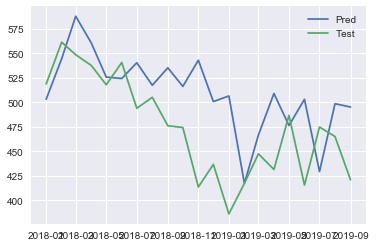

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3595 - val_loss: 0.3858
Epoch 2/700
0s - loss: 0.3331 - val_loss: 0.3534
Epoch 3/700
0s - loss: 0.3091 - val_loss: 0.3224
Epoch 4/700
0s - loss: 0.2872 - val_loss: 0.2920
Epoch 5/700
0s - loss: 0.2658 - val_loss: 0.2618
Epoch 6/700
0s - loss: 0.2413 - val_loss: 0.2318
Epoch 7/700
0s - loss: 0.2210 - val_loss: 0.2019
Epoch 8/700
0s - loss: 0.1996 - val_loss: 0.1720
Epoch 9/700
0s - loss: 0.1775 - val_loss: 0.1427
Epoch 10/700
0s - loss: 0.1552 - val_loss: 0.1144
Epoch 11/700
0s - loss: 0.1339 - val_loss: 0.0876
Epoch 12/700
0s - loss: 0.1132 - val_loss: 0.0634
Epoch 13/700
0s - loss: 0.0934 - val_loss: 0.0428
Epoch 14/700
0s - loss: 0.0770 - val_loss: 0.0273
Epoch 15/700
0s - loss: 0.0613 - val_loss: 0.0181
Epoch 16/700
0s - loss: 0.0490 - val_loss: 0.0163
Epoch 17/700
0s - loss: 0.0400 - val_loss: 0.0223
Epoch 18/700
0s - loss: 0.0398 - val_loss: 0.0353
Epoch 19/700
0s - loss: 0.0390 - val_loss: 0.

0s - loss: 0.0070 - val_loss: 0.0376
Epoch 172/700
0s - loss: 0.0062 - val_loss: 0.0371
Epoch 173/700
0s - loss: 0.0055 - val_loss: 0.0366
Epoch 174/700
0s - loss: 0.0049 - val_loss: 0.0362
Epoch 175/700
0s - loss: 0.0046 - val_loss: 0.0357
Epoch 176/700
0s - loss: 0.0050 - val_loss: 0.0352
Epoch 177/700
0s - loss: 0.0052 - val_loss: 0.0346
Epoch 178/700
0s - loss: 0.0044 - val_loss: 0.0345
Epoch 179/700
0s - loss: 0.0058 - val_loss: 0.0342
Epoch 180/700
0s - loss: 0.0064 - val_loss: 0.0340
Epoch 181/700
0s - loss: 0.0056 - val_loss: 0.0338
Epoch 182/700
0s - loss: 0.0055 - val_loss: 0.0337
Epoch 183/700
0s - loss: 0.0052 - val_loss: 0.0339
Epoch 184/700
0s - loss: 0.0053 - val_loss: 0.0341
Epoch 185/700
0s - loss: 0.0058 - val_loss: 0.0343
Epoch 186/700
0s - loss: 0.0056 - val_loss: 0.0348
Epoch 187/700
0s - loss: 0.0056 - val_loss: 0.0349
Epoch 188/700
0s - loss: 0.0057 - val_loss: 0.0348
Epoch 189/700
0s - loss: 0.0060 - val_loss: 0.0342
Epoch 190/700
0s - loss: 0.0041 - val_loss: 0

0s - loss: 0.0042 - val_loss: 0.0307
Epoch 343/700
0s - loss: 0.0044 - val_loss: 0.0308
Epoch 344/700
0s - loss: 0.0047 - val_loss: 0.0312
Epoch 345/700
0s - loss: 0.0039 - val_loss: 0.0315
Epoch 346/700
0s - loss: 0.0046 - val_loss: 0.0318
Epoch 347/700
0s - loss: 0.0046 - val_loss: 0.0324
Epoch 348/700
0s - loss: 0.0046 - val_loss: 0.0326
Epoch 349/700
0s - loss: 0.0048 - val_loss: 0.0328
Epoch 350/700
0s - loss: 0.0052 - val_loss: 0.0329
Epoch 351/700
0s - loss: 0.0046 - val_loss: 0.0328
Epoch 352/700
0s - loss: 0.0055 - val_loss: 0.0325
Epoch 353/700
0s - loss: 0.0051 - val_loss: 0.0323
Epoch 354/700
0s - loss: 0.0043 - val_loss: 0.0322
Epoch 355/700
0s - loss: 0.0044 - val_loss: 0.0320
Epoch 356/700
0s - loss: 0.0054 - val_loss: 0.0316
Epoch 357/700
0s - loss: 0.0055 - val_loss: 0.0317
Epoch 358/700
0s - loss: 0.0050 - val_loss: 0.0317
Epoch 359/700
0s - loss: 0.0043 - val_loss: 0.0318
Epoch 360/700
0s - loss: 0.0041 - val_loss: 0.0318
Epoch 361/700
0s - loss: 0.0051 - val_loss: 0

0s - loss: 0.0057 - val_loss: 0.0310
Epoch 506/700
0s - loss: 0.0044 - val_loss: 0.0307
Epoch 507/700
0s - loss: 0.0046 - val_loss: 0.0303
Epoch 508/700
0s - loss: 0.0041 - val_loss: 0.0302
Epoch 509/700
0s - loss: 0.0045 - val_loss: 0.0305
Epoch 510/700
0s - loss: 0.0048 - val_loss: 0.0309
Epoch 511/700
0s - loss: 0.0047 - val_loss: 0.0316
Epoch 512/700
0s - loss: 0.0048 - val_loss: 0.0327
Epoch 513/700
0s - loss: 0.0055 - val_loss: 0.0334
Epoch 514/700
0s - loss: 0.0042 - val_loss: 0.0341
Epoch 515/700
0s - loss: 0.0048 - val_loss: 0.0347
Epoch 516/700
0s - loss: 0.0050 - val_loss: 0.0349
Epoch 517/700
0s - loss: 0.0044 - val_loss: 0.0346
Epoch 518/700
0s - loss: 0.0042 - val_loss: 0.0340
Epoch 519/700
0s - loss: 0.0045 - val_loss: 0.0333
Epoch 520/700
0s - loss: 0.0048 - val_loss: 0.0324
Epoch 521/700
0s - loss: 0.0060 - val_loss: 0.0318
Epoch 522/700
0s - loss: 0.0048 - val_loss: 0.0314
Epoch 523/700
0s - loss: 0.0042 - val_loss: 0.0311
Epoch 524/700
0s - loss: 0.0044 - val_loss: 0

0s - loss: 0.0050 - val_loss: 0.0332
Epoch 672/700
0s - loss: 0.0033 - val_loss: 0.0332
Epoch 673/700
0s - loss: 0.0040 - val_loss: 0.0332
Epoch 674/700
0s - loss: 0.0039 - val_loss: 0.0331
Epoch 675/700
0s - loss: 0.0046 - val_loss: 0.0333
Epoch 676/700
0s - loss: 0.0044 - val_loss: 0.0333
Epoch 677/700
0s - loss: 0.0047 - val_loss: 0.0333
Epoch 678/700
0s - loss: 0.0040 - val_loss: 0.0335
Epoch 679/700
0s - loss: 0.0042 - val_loss: 0.0335
Epoch 680/700
0s - loss: 0.0036 - val_loss: 0.0334
Epoch 681/700
0s - loss: 0.0054 - val_loss: 0.0334
Epoch 682/700
0s - loss: 0.0045 - val_loss: 0.0334
Epoch 683/700
0s - loss: 0.0033 - val_loss: 0.0334
Epoch 684/700
0s - loss: 0.0040 - val_loss: 0.0332
Epoch 685/700
0s - loss: 0.0044 - val_loss: 0.0334
Epoch 686/700
0s - loss: 0.0039 - val_loss: 0.0337
Epoch 687/700
0s - loss: 0.0037 - val_loss: 0.0341
Epoch 688/700
0s - loss: 0.0033 - val_loss: 0.0343
Epoch 689/700
0s - loss: 0.0042 - val_loss: 0.0345
Epoch 690/700
0s - loss: 0.0051 - val_loss: 0

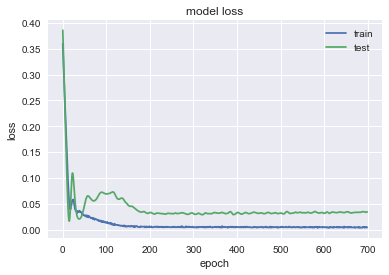

(21, 1, 10)
              DVA
MSE       103.169
MAE       8.01468
R2        -3.0716
MAPE (%)  14.0136


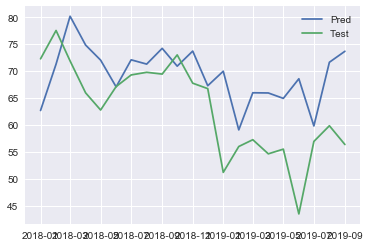

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.0434 - val_loss: 0.5674
Epoch 2/700
0s - loss: 0.0348 - val_loss: 0.5242
Epoch 3/700
0s - loss: 0.0284 - val_loss: 0.4840
Epoch 4/700
0s - loss: 0.0229 - val_loss: 0.4452
Epoch 5/700
0s - loss: 0.0187 - val_loss: 0.4070
Epoch 6/700
0s - loss: 0.0145 - val_loss: 0.3693
Epoch 7/700
0s - loss: 0.0118 - val_loss: 0.3328
Epoch 8/700
0s - loss: 0.0100 - val_loss: 0.2984
Epoch 9/700
0s - loss: 0.0088 - val_loss: 0.2678
Epoch 10/700
0s - loss: 0.0085 - val_loss: 0.2416
Epoch 11/700
0s - loss: 0.0094 - val_loss: 0.2210
Epoch 12/700
0s - loss: 0.0099 - val_loss: 0.2061
Epoch 13/700
0s - loss: 0.0100 - val_loss: 0.1961
Epoch 14/700
0s - loss: 0.0102 - val_loss: 0.1912
Epoch 15/700
0s - loss: 0.0102 - val_loss: 0.1901
Epoch 16/700
0s - loss: 0.0091 - val_loss: 0.1924
Epoch 17/700
0s - loss: 0.0083 - val_loss: 0.1968
Epoch 18/700
0s - loss: 0.0076 - val_loss: 0.2024
Epoch 19/700
0s - loss: 0.0071 - val_loss: 0.2

0s - loss: 8.4462e-04 - val_loss: 0.0473
Epoch 173/700
0s - loss: 8.3116e-04 - val_loss: 0.0473
Epoch 174/700
0s - loss: 8.4256e-04 - val_loss: 0.0468
Epoch 175/700
0s - loss: 9.4012e-04 - val_loss: 0.0463
Epoch 176/700
0s - loss: 9.1328e-04 - val_loss: 0.0456
Epoch 177/700
0s - loss: 9.7171e-04 - val_loss: 0.0448
Epoch 178/700
0s - loss: 8.1569e-04 - val_loss: 0.0442
Epoch 179/700
0s - loss: 0.0011 - val_loss: 0.0436
Epoch 180/700
0s - loss: 6.9373e-04 - val_loss: 0.0431
Epoch 181/700
0s - loss: 7.6690e-04 - val_loss: 0.0430
Epoch 182/700
0s - loss: 8.8631e-04 - val_loss: 0.0428
Epoch 183/700
0s - loss: 9.4157e-04 - val_loss: 0.0427
Epoch 184/700
0s - loss: 8.6739e-04 - val_loss: 0.0426
Epoch 185/700
0s - loss: 8.1997e-04 - val_loss: 0.0427
Epoch 186/700
0s - loss: 9.8541e-04 - val_loss: 0.0426
Epoch 187/700
0s - loss: 8.8489e-04 - val_loss: 0.0427
Epoch 188/700
0s - loss: 8.2851e-04 - val_loss: 0.0428
Epoch 189/700
0s - loss: 6.9250e-04 - val_loss: 0.0430
Epoch 190/700
0s - loss: 7.9

0s - loss: 6.5947e-04 - val_loss: 0.0284
Epoch 329/700
0s - loss: 6.1350e-04 - val_loss: 0.0280
Epoch 330/700
0s - loss: 7.9964e-04 - val_loss: 0.0276
Epoch 331/700
0s - loss: 7.2488e-04 - val_loss: 0.0276
Epoch 332/700
0s - loss: 6.8400e-04 - val_loss: 0.0275
Epoch 333/700
0s - loss: 7.2970e-04 - val_loss: 0.0277
Epoch 334/700
0s - loss: 7.2870e-04 - val_loss: 0.0278
Epoch 335/700
0s - loss: 6.1072e-04 - val_loss: 0.0279
Epoch 336/700
0s - loss: 7.1978e-04 - val_loss: 0.0278
Epoch 337/700
0s - loss: 7.4517e-04 - val_loss: 0.0279
Epoch 338/700
0s - loss: 7.1930e-04 - val_loss: 0.0281
Epoch 339/700
0s - loss: 7.7783e-04 - val_loss: 0.0279
Epoch 340/700
0s - loss: 8.5853e-04 - val_loss: 0.0275
Epoch 341/700
0s - loss: 8.3124e-04 - val_loss: 0.0274
Epoch 342/700
0s - loss: 7.4551e-04 - val_loss: 0.0272
Epoch 343/700
0s - loss: 7.4138e-04 - val_loss: 0.0272
Epoch 344/700
0s - loss: 7.1943e-04 - val_loss: 0.0273
Epoch 345/700
0s - loss: 6.4540e-04 - val_loss: 0.0276
Epoch 346/700
0s - loss:

0s - loss: 7.1463e-04 - val_loss: 0.0177
Epoch 489/700
0s - loss: 4.9969e-04 - val_loss: 0.0182
Epoch 490/700
0s - loss: 5.4928e-04 - val_loss: 0.0184
Epoch 491/700
0s - loss: 5.5560e-04 - val_loss: 0.0186
Epoch 492/700
0s - loss: 8.6232e-04 - val_loss: 0.0183
Epoch 493/700
0s - loss: 6.0429e-04 - val_loss: 0.0180
Epoch 494/700
0s - loss: 4.0569e-04 - val_loss: 0.0176
Epoch 495/700
0s - loss: 6.2081e-04 - val_loss: 0.0175
Epoch 496/700
0s - loss: 6.7379e-04 - val_loss: 0.0174
Epoch 497/700
0s - loss: 6.1888e-04 - val_loss: 0.0176
Epoch 498/700
0s - loss: 6.7769e-04 - val_loss: 0.0178
Epoch 499/700
0s - loss: 5.0609e-04 - val_loss: 0.0180
Epoch 500/700
0s - loss: 5.7418e-04 - val_loss: 0.0182
Epoch 501/700
0s - loss: 5.9949e-04 - val_loss: 0.0181
Epoch 502/700
0s - loss: 6.2010e-04 - val_loss: 0.0179
Epoch 503/700
0s - loss: 7.3028e-04 - val_loss: 0.0176
Epoch 504/700
0s - loss: 5.2289e-04 - val_loss: 0.0175
Epoch 505/700
0s - loss: 6.4889e-04 - val_loss: 0.0175
Epoch 506/700
0s - loss:

0s - loss: 4.9440e-04 - val_loss: 0.0137
Epoch 638/700
0s - loss: 5.2717e-04 - val_loss: 0.0137
Epoch 639/700
0s - loss: 4.5020e-04 - val_loss: 0.0136
Epoch 640/700
0s - loss: 6.5165e-04 - val_loss: 0.0136
Epoch 641/700
0s - loss: 5.5756e-04 - val_loss: 0.0135
Epoch 642/700
0s - loss: 4.7996e-04 - val_loss: 0.0135
Epoch 643/700
0s - loss: 5.2750e-04 - val_loss: 0.0135
Epoch 644/700
0s - loss: 5.1668e-04 - val_loss: 0.0135
Epoch 645/700
0s - loss: 5.3960e-04 - val_loss: 0.0136
Epoch 646/700
0s - loss: 5.0448e-04 - val_loss: 0.0136
Epoch 647/700
0s - loss: 5.4297e-04 - val_loss: 0.0137
Epoch 648/700
0s - loss: 4.9012e-04 - val_loss: 0.0139
Epoch 649/700
0s - loss: 6.6379e-04 - val_loss: 0.0139
Epoch 650/700
0s - loss: 4.7709e-04 - val_loss: 0.0140
Epoch 651/700
0s - loss: 5.6214e-04 - val_loss: 0.0138
Epoch 652/700
0s - loss: 5.0818e-04 - val_loss: 0.0137
Epoch 653/700
0s - loss: 6.3030e-04 - val_loss: 0.0137
Epoch 654/700
0s - loss: 4.6192e-04 - val_loss: 0.0137
Epoch 655/700
0s - loss:

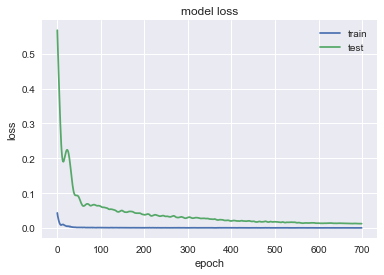

(21, 1, 10)
                BA
MSE        1918.57
MAE        32.4361
R2       -0.872541
MAPE (%)   8.84088


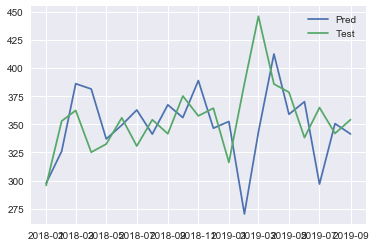

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3743 - val_loss: 0.0861
Epoch 2/700
0s - loss: 0.3471 - val_loss: 0.0723
Epoch 3/700
0s - loss: 0.3224 - val_loss: 0.0602
Epoch 4/700
0s - loss: 0.3000 - val_loss: 0.0492
Epoch 5/700
0s - loss: 0.2765 - val_loss: 0.0393
Epoch 6/700
0s - loss: 0.2556 - val_loss: 0.0305
Epoch 7/700
0s - loss: 0.2348 - val_loss: 0.0231
Epoch 8/700
0s - loss: 0.2108 - val_loss: 0.0174
Epoch 9/700
0s - loss: 0.1897 - val_loss: 0.0140
Epoch 10/700
0s - loss: 0.1674 - val_loss: 0.0136
Epoch 11/700
0s - loss: 0.1485 - val_loss: 0.0170
Epoch 12/700
0s - loss: 0.1274 - val_loss: 0.0254
Epoch 13/700
0s - loss: 0.1101 - val_loss: 0.0399
Epoch 14/700
0s - loss: 0.0877 - val_loss: 0.0614
Epoch 15/700
0s - loss: 0.0751 - val_loss: 0.0904
Epoch 16/700
0s - loss: 0.0621 - val_loss: 0.1268
Epoch 17/700
0s - loss: 0.0566 - val_loss: 0.1688
Epoch 18/700
0s - loss: 0.0517 - val_loss: 0.2130
Epoch 19/700
0s - loss: 0.0501 - val_loss: 0.

0s - loss: 0.0075 - val_loss: 0.0220
Epoch 171/700
0s - loss: 0.0065 - val_loss: 0.0223
Epoch 172/700
0s - loss: 0.0068 - val_loss: 0.0225
Epoch 173/700
0s - loss: 0.0066 - val_loss: 0.0227
Epoch 174/700
0s - loss: 0.0074 - val_loss: 0.0227
Epoch 175/700
0s - loss: 0.0074 - val_loss: 0.0228
Epoch 176/700
0s - loss: 0.0073 - val_loss: 0.0228
Epoch 177/700
0s - loss: 0.0069 - val_loss: 0.0227
Epoch 178/700
0s - loss: 0.0060 - val_loss: 0.0225
Epoch 179/700
0s - loss: 0.0072 - val_loss: 0.0224
Epoch 180/700
0s - loss: 0.0067 - val_loss: 0.0223
Epoch 181/700
0s - loss: 0.0067 - val_loss: 0.0222
Epoch 182/700
0s - loss: 0.0058 - val_loss: 0.0221
Epoch 183/700
0s - loss: 0.0062 - val_loss: 0.0221
Epoch 184/700
0s - loss: 0.0066 - val_loss: 0.0221
Epoch 185/700
0s - loss: 0.0059 - val_loss: 0.0221
Epoch 186/700
0s - loss: 0.0063 - val_loss: 0.0221
Epoch 187/700
0s - loss: 0.0068 - val_loss: 0.0222
Epoch 188/700
0s - loss: 0.0072 - val_loss: 0.0224
Epoch 189/700
0s - loss: 0.0080 - val_loss: 0

0s - loss: 0.0062 - val_loss: 0.0222
Epoch 334/700
0s - loss: 0.0065 - val_loss: 0.0224
Epoch 335/700
0s - loss: 0.0056 - val_loss: 0.0226
Epoch 336/700
0s - loss: 0.0074 - val_loss: 0.0228
Epoch 337/700
0s - loss: 0.0057 - val_loss: 0.0230
Epoch 338/700
0s - loss: 0.0063 - val_loss: 0.0231
Epoch 339/700
0s - loss: 0.0067 - val_loss: 0.0232
Epoch 340/700
0s - loss: 0.0062 - val_loss: 0.0231
Epoch 341/700
0s - loss: 0.0055 - val_loss: 0.0231
Epoch 342/700
0s - loss: 0.0071 - val_loss: 0.0229
Epoch 343/700
0s - loss: 0.0058 - val_loss: 0.0228
Epoch 344/700
0s - loss: 0.0056 - val_loss: 0.0226
Epoch 345/700
0s - loss: 0.0073 - val_loss: 0.0225
Epoch 346/700
0s - loss: 0.0062 - val_loss: 0.0224
Epoch 347/700
0s - loss: 0.0053 - val_loss: 0.0224
Epoch 348/700
0s - loss: 0.0058 - val_loss: 0.0223
Epoch 349/700
0s - loss: 0.0063 - val_loss: 0.0222
Epoch 350/700
0s - loss: 0.0057 - val_loss: 0.0221
Epoch 351/700
0s - loss: 0.0059 - val_loss: 0.0222
Epoch 352/700
0s - loss: 0.0061 - val_loss: 0

0s - loss: 0.0060 - val_loss: 0.0211
Epoch 496/700
0s - loss: 0.0074 - val_loss: 0.0215
Epoch 497/700
0s - loss: 0.0064 - val_loss: 0.0217
Epoch 498/700
0s - loss: 0.0071 - val_loss: 0.0217
Epoch 499/700
0s - loss: 0.0052 - val_loss: 0.0217
Epoch 500/700
0s - loss: 0.0059 - val_loss: 0.0215
Epoch 501/700
0s - loss: 0.0053 - val_loss: 0.0213
Epoch 502/700
0s - loss: 0.0066 - val_loss: 0.0209
Epoch 503/700
0s - loss: 0.0056 - val_loss: 0.0208
Epoch 504/700
0s - loss: 0.0061 - val_loss: 0.0207
Epoch 505/700
0s - loss: 0.0054 - val_loss: 0.0206
Epoch 506/700
0s - loss: 0.0050 - val_loss: 0.0205
Epoch 507/700
0s - loss: 0.0062 - val_loss: 0.0204
Epoch 508/700
0s - loss: 0.0047 - val_loss: 0.0204
Epoch 509/700
0s - loss: 0.0052 - val_loss: 0.0205
Epoch 510/700
0s - loss: 0.0071 - val_loss: 0.0207
Epoch 511/700
0s - loss: 0.0055 - val_loss: 0.0211
Epoch 512/700
0s - loss: 0.0053 - val_loss: 0.0214
Epoch 513/700
0s - loss: 0.0056 - val_loss: 0.0217
Epoch 514/700
0s - loss: 0.0058 - val_loss: 0

0s - loss: 0.0066 - val_loss: 0.0221
Epoch 660/700
0s - loss: 0.0063 - val_loss: 0.0218
Epoch 661/700
0s - loss: 0.0055 - val_loss: 0.0216
Epoch 662/700
0s - loss: 0.0052 - val_loss: 0.0215
Epoch 663/700
0s - loss: 0.0056 - val_loss: 0.0213
Epoch 664/700
0s - loss: 0.0054 - val_loss: 0.0213
Epoch 665/700
0s - loss: 0.0059 - val_loss: 0.0213
Epoch 666/700
0s - loss: 0.0058 - val_loss: 0.0215
Epoch 667/700
0s - loss: 0.0055 - val_loss: 0.0217
Epoch 668/700
0s - loss: 0.0063 - val_loss: 0.0219
Epoch 669/700
0s - loss: 0.0061 - val_loss: 0.0221
Epoch 670/700
0s - loss: 0.0062 - val_loss: 0.0222
Epoch 671/700
0s - loss: 0.0057 - val_loss: 0.0222
Epoch 672/700
0s - loss: 0.0063 - val_loss: 0.0221
Epoch 673/700
0s - loss: 0.0062 - val_loss: 0.0218
Epoch 674/700
0s - loss: 0.0058 - val_loss: 0.0213
Epoch 675/700
0s - loss: 0.0056 - val_loss: 0.0210
Epoch 676/700
0s - loss: 0.0066 - val_loss: 0.0208
Epoch 677/700
0s - loss: 0.0053 - val_loss: 0.0207
Epoch 678/700
0s - loss: 0.0065 - val_loss: 0

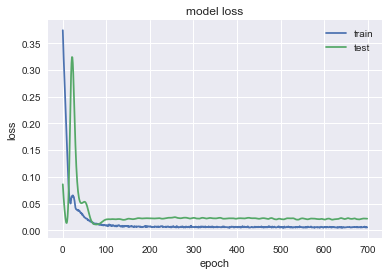

(21, 1, 10)
              IBM
MSE       220.729
MAE       13.5347
R2       -1.33252
MAPE (%)  9.67177


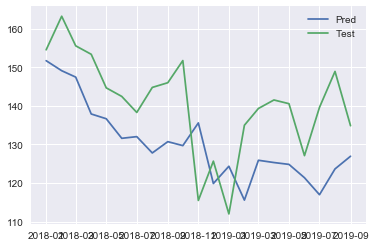

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1221 - val_loss: 0.2493
Epoch 2/700
0s - loss: 0.1104 - val_loss: 0.2273
Epoch 3/700
0s - loss: 0.0996 - val_loss: 0.2064
Epoch 4/700
0s - loss: 0.0897 - val_loss: 0.1859
Epoch 5/700
0s - loss: 0.0808 - val_loss: 0.1655
Epoch 6/700
0s - loss: 0.0713 - val_loss: 0.1452
Epoch 7/700
0s - loss: 0.0630 - val_loss: 0.1250
Epoch 8/700
0s - loss: 0.0549 - val_loss: 0.1051
Epoch 9/700
0s - loss: 0.0472 - val_loss: 0.0858
Epoch 10/700
0s - loss: 0.0425 - val_loss: 0.0678
Epoch 11/700
0s - loss: 0.0356 - val_loss: 0.0517
Epoch 12/700
0s - loss: 0.0308 - val_loss: 0.0384
Epoch 13/700
0s - loss: 0.0276 - val_loss: 0.0283
Epoch 14/700
0s - loss: 0.0270 - val_loss: 0.0218
Epoch 15/700
0s - loss: 0.0267 - val_loss: 0.0184
Epoch 16/700
0s - loss: 0.0301 - val_loss: 0.0173
Epoch 17/700
0s - loss: 0.0304 - val_loss: 0.0175
Epoch 18/700
0s - loss: 0.0315 - val_loss: 0.0179
Epoch 19/700
0s - loss: 0.0319 - val_loss: 0.

0s - loss: 0.0026 - val_loss: 0.0502
Epoch 170/700
0s - loss: 0.0031 - val_loss: 0.0499
Epoch 171/700
0s - loss: 0.0031 - val_loss: 0.0503
Epoch 172/700
0s - loss: 0.0038 - val_loss: 0.0504
Epoch 173/700
0s - loss: 0.0028 - val_loss: 0.0511
Epoch 174/700
0s - loss: 0.0032 - val_loss: 0.0508
Epoch 175/700
0s - loss: 0.0030 - val_loss: 0.0507
Epoch 176/700
0s - loss: 0.0029 - val_loss: 0.0510
Epoch 177/700
0s - loss: 0.0028 - val_loss: 0.0519
Epoch 178/700
0s - loss: 0.0027 - val_loss: 0.0523
Epoch 179/700
0s - loss: 0.0028 - val_loss: 0.0522
Epoch 180/700
0s - loss: 0.0029 - val_loss: 0.0510
Epoch 181/700
0s - loss: 0.0027 - val_loss: 0.0505
Epoch 182/700
0s - loss: 0.0029 - val_loss: 0.0505
Epoch 183/700
0s - loss: 0.0030 - val_loss: 0.0503
Epoch 184/700
0s - loss: 0.0031 - val_loss: 0.0511
Epoch 185/700
0s - loss: 0.0027 - val_loss: 0.0512
Epoch 186/700
0s - loss: 0.0032 - val_loss: 0.0515
Epoch 187/700
0s - loss: 0.0032 - val_loss: 0.0518
Epoch 188/700
0s - loss: 0.0028 - val_loss: 0

0s - loss: 0.0027 - val_loss: 0.0443
Epoch 346/700
0s - loss: 0.0028 - val_loss: 0.0460
Epoch 347/700
0s - loss: 0.0030 - val_loss: 0.0474
Epoch 348/700
0s - loss: 0.0029 - val_loss: 0.0476
Epoch 349/700
0s - loss: 0.0023 - val_loss: 0.0476
Epoch 350/700
0s - loss: 0.0025 - val_loss: 0.0465
Epoch 351/700
0s - loss: 0.0033 - val_loss: 0.0456
Epoch 352/700
0s - loss: 0.0031 - val_loss: 0.0433
Epoch 353/700
0s - loss: 0.0030 - val_loss: 0.0416
Epoch 354/700
0s - loss: 0.0026 - val_loss: 0.0410
Epoch 355/700
0s - loss: 0.0030 - val_loss: 0.0419
Epoch 356/700
0s - loss: 0.0033 - val_loss: 0.0423
Epoch 357/700
0s - loss: 0.0031 - val_loss: 0.0423
Epoch 358/700
0s - loss: 0.0023 - val_loss: 0.0419
Epoch 359/700
0s - loss: 0.0023 - val_loss: 0.0422
Epoch 360/700
0s - loss: 0.0030 - val_loss: 0.0421
Epoch 361/700
0s - loss: 0.0030 - val_loss: 0.0413
Epoch 362/700
0s - loss: 0.0027 - val_loss: 0.0405
Epoch 363/700
0s - loss: 0.0029 - val_loss: 0.0401
Epoch 364/700
0s - loss: 0.0027 - val_loss: 0

0s - loss: 0.0031 - val_loss: 0.0357
Epoch 521/700
0s - loss: 0.0027 - val_loss: 0.0360
Epoch 522/700
0s - loss: 0.0029 - val_loss: 0.0359
Epoch 523/700
0s - loss: 0.0023 - val_loss: 0.0354
Epoch 524/700
0s - loss: 0.0026 - val_loss: 0.0344
Epoch 525/700
0s - loss: 0.0028 - val_loss: 0.0338
Epoch 526/700
0s - loss: 0.0022 - val_loss: 0.0339
Epoch 527/700
0s - loss: 0.0024 - val_loss: 0.0342
Epoch 528/700
0s - loss: 0.0025 - val_loss: 0.0353
Epoch 529/700
0s - loss: 0.0028 - val_loss: 0.0360
Epoch 530/700
0s - loss: 0.0026 - val_loss: 0.0378
Epoch 531/700
0s - loss: 0.0027 - val_loss: 0.0390
Epoch 532/700
0s - loss: 0.0027 - val_loss: 0.0392
Epoch 533/700
0s - loss: 0.0030 - val_loss: 0.0382
Epoch 534/700
0s - loss: 0.0029 - val_loss: 0.0364
Epoch 535/700
0s - loss: 0.0027 - val_loss: 0.0343
Epoch 536/700
0s - loss: 0.0025 - val_loss: 0.0328
Epoch 537/700
0s - loss: 0.0024 - val_loss: 0.0322
Epoch 538/700
0s - loss: 0.0021 - val_loss: 0.0321
Epoch 539/700
0s - loss: 0.0029 - val_loss: 0

0s - loss: 0.0029 - val_loss: 0.0346
Epoch 691/700
0s - loss: 0.0024 - val_loss: 0.0348
Epoch 692/700
0s - loss: 0.0028 - val_loss: 0.0352
Epoch 693/700
0s - loss: 0.0025 - val_loss: 0.0356
Epoch 694/700
0s - loss: 0.0027 - val_loss: 0.0362
Epoch 695/700
0s - loss: 0.0021 - val_loss: 0.0367
Epoch 696/700
0s - loss: 0.0029 - val_loss: 0.0375
Epoch 697/700
0s - loss: 0.0021 - val_loss: 0.0391
Epoch 698/700
0s - loss: 0.0025 - val_loss: 0.0396
Epoch 699/700
0s - loss: 0.0033 - val_loss: 0.0382
Epoch 700/700
0s - loss: 0.0028 - val_loss: 0.0354


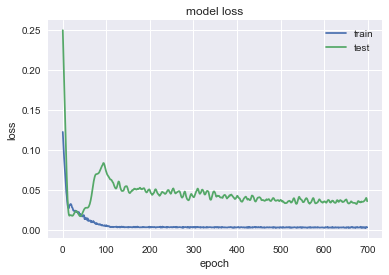

(21, 1, 10)
               ALB
MSE        398.191
MAE        17.1665
R2       -0.966564
MAPE (%)   20.9639


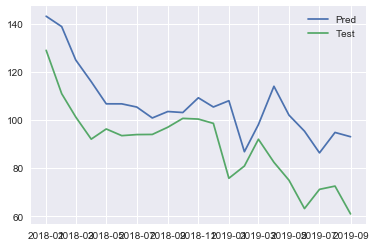

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1357 - val_loss: 0.6300
Epoch 2/700
0s - loss: 0.1180 - val_loss: 0.5788
Epoch 3/700
0s - loss: 0.1012 - val_loss: 0.5283
Epoch 4/700
0s - loss: 0.0854 - val_loss: 0.4775
Epoch 5/700
0s - loss: 0.0707 - val_loss: 0.4262
Epoch 6/700
0s - loss: 0.0580 - val_loss: 0.3741
Epoch 7/700
0s - loss: 0.0453 - val_loss: 0.3219
Epoch 8/700
0s - loss: 0.0360 - val_loss: 0.2705
Epoch 9/700
0s - loss: 0.0270 - val_loss: 0.2219
Epoch 10/700
0s - loss: 0.0213 - val_loss: 0.1778
Epoch 11/700
0s - loss: 0.0188 - val_loss: 0.1402
Epoch 12/700
0s - loss: 0.0182 - val_loss: 0.1104
Epoch 13/700
0s - loss: 0.0203 - val_loss: 0.0887
Epoch 14/700
0s - loss: 0.0204 - val_loss: 0.0743
Epoch 15/700
0s - loss: 0.0235 - val_loss: 0.0664
Epoch 16/700
0s - loss: 0.0270 - val_loss: 0.0636
Epoch 17/700
0s - loss: 0.0256 - val_loss: 0.0646
Epoch 18/700
0s - loss: 0.0240 - val_loss: 0.0686
Epoch 19/700
0s - loss: 0.0220 - val_loss: 0

0s - loss: 0.0038 - val_loss: 0.0139
Epoch 167/700
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 168/700
0s - loss: 0.0047 - val_loss: 0.0140
Epoch 169/700
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 170/700
0s - loss: 0.0042 - val_loss: 0.0140
Epoch 171/700
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 172/700
0s - loss: 0.0041 - val_loss: 0.0141
Epoch 173/700
0s - loss: 0.0042 - val_loss: 0.0141
Epoch 174/700
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 175/700
0s - loss: 0.0038 - val_loss: 0.0142
Epoch 176/700
0s - loss: 0.0042 - val_loss: 0.0142
Epoch 177/700
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 178/700
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 179/700
0s - loss: 0.0037 - val_loss: 0.0142
Epoch 180/700
0s - loss: 0.0044 - val_loss: 0.0142
Epoch 181/700
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 182/700
0s - loss: 0.0041 - val_loss: 0.0142
Epoch 183/700
0s - loss: 0.0039 - val_loss: 0.0143
Epoch 184/700
0s - loss: 0.0036 - val_loss: 0.0144
Epoch 185/700
0s - loss: 0.0038 - val_loss: 0

0s - loss: 0.0035 - val_loss: 0.0200
Epoch 332/700
0s - loss: 0.0035 - val_loss: 0.0196
Epoch 333/700
0s - loss: 0.0034 - val_loss: 0.0192
Epoch 334/700
0s - loss: 0.0036 - val_loss: 0.0191
Epoch 335/700
0s - loss: 0.0030 - val_loss: 0.0193
Epoch 336/700
0s - loss: 0.0033 - val_loss: 0.0198
Epoch 337/700
0s - loss: 0.0037 - val_loss: 0.0205
Epoch 338/700
0s - loss: 0.0034 - val_loss: 0.0212
Epoch 339/700
0s - loss: 0.0035 - val_loss: 0.0221
Epoch 340/700
0s - loss: 0.0034 - val_loss: 0.0231
Epoch 341/700
0s - loss: 0.0036 - val_loss: 0.0237
Epoch 342/700
0s - loss: 0.0036 - val_loss: 0.0243
Epoch 343/700
0s - loss: 0.0036 - val_loss: 0.0241
Epoch 344/700
0s - loss: 0.0032 - val_loss: 0.0234
Epoch 345/700
0s - loss: 0.0032 - val_loss: 0.0223
Epoch 346/700
0s - loss: 0.0038 - val_loss: 0.0213
Epoch 347/700
0s - loss: 0.0039 - val_loss: 0.0205
Epoch 348/700
0s - loss: 0.0036 - val_loss: 0.0199
Epoch 349/700
0s - loss: 0.0034 - val_loss: 0.0196
Epoch 350/700
0s - loss: 0.0032 - val_loss: 0

0s - loss: 0.0034 - val_loss: 0.0194
Epoch 497/700
0s - loss: 0.0034 - val_loss: 0.0200
Epoch 498/700
0s - loss: 0.0030 - val_loss: 0.0206
Epoch 499/700
0s - loss: 0.0033 - val_loss: 0.0210
Epoch 500/700
0s - loss: 0.0032 - val_loss: 0.0213
Epoch 501/700
0s - loss: 0.0033 - val_loss: 0.0213
Epoch 502/700
0s - loss: 0.0030 - val_loss: 0.0210
Epoch 503/700
0s - loss: 0.0033 - val_loss: 0.0204
Epoch 504/700
0s - loss: 0.0031 - val_loss: 0.0198
Epoch 505/700
0s - loss: 0.0032 - val_loss: 0.0196
Epoch 506/700
0s - loss: 0.0032 - val_loss: 0.0193
Epoch 507/700
0s - loss: 0.0035 - val_loss: 0.0190
Epoch 508/700
0s - loss: 0.0036 - val_loss: 0.0192
Epoch 509/700
0s - loss: 0.0029 - val_loss: 0.0195
Epoch 510/700
0s - loss: 0.0032 - val_loss: 0.0200
Epoch 511/700
0s - loss: 0.0034 - val_loss: 0.0204
Epoch 512/700
0s - loss: 0.0037 - val_loss: 0.0205
Epoch 513/700
0s - loss: 0.0034 - val_loss: 0.0203
Epoch 514/700
0s - loss: 0.0033 - val_loss: 0.0200
Epoch 515/700
0s - loss: 0.0037 - val_loss: 0

0s - loss: 0.0033 - val_loss: 0.0175
Epoch 662/700
0s - loss: 0.0030 - val_loss: 0.0172
Epoch 663/700
0s - loss: 0.0032 - val_loss: 0.0171
Epoch 664/700
0s - loss: 0.0032 - val_loss: 0.0171
Epoch 665/700
0s - loss: 0.0031 - val_loss: 0.0171
Epoch 666/700
0s - loss: 0.0029 - val_loss: 0.0170
Epoch 667/700
0s - loss: 0.0030 - val_loss: 0.0171
Epoch 668/700
0s - loss: 0.0036 - val_loss: 0.0172
Epoch 669/700
0s - loss: 0.0031 - val_loss: 0.0171
Epoch 670/700
0s - loss: 0.0031 - val_loss: 0.0172
Epoch 671/700
0s - loss: 0.0034 - val_loss: 0.0170
Epoch 672/700
0s - loss: 0.0027 - val_loss: 0.0169
Epoch 673/700
0s - loss: 0.0027 - val_loss: 0.0168
Epoch 674/700
0s - loss: 0.0030 - val_loss: 0.0170
Epoch 675/700
0s - loss: 0.0029 - val_loss: 0.0172
Epoch 676/700
0s - loss: 0.0029 - val_loss: 0.0174
Epoch 677/700
0s - loss: 0.0034 - val_loss: 0.0175
Epoch 678/700
0s - loss: 0.0036 - val_loss: 0.0174
Epoch 679/700
0s - loss: 0.0027 - val_loss: 0.0172
Epoch 680/700
0s - loss: 0.0032 - val_loss: 0

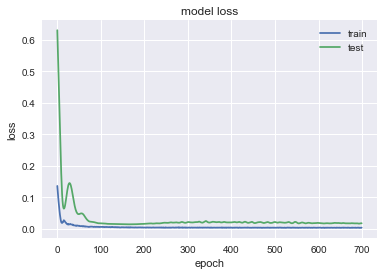

(21, 1, 10)
             CBRE
MSE        28.776
MAE       4.54963
R2       -1.24443
MAPE (%)  9.93215


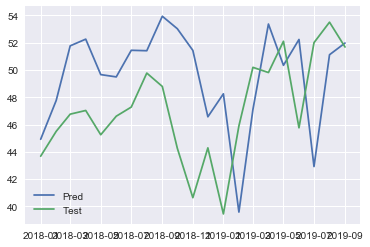

In [351]:
pred_multi_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_2[comp] = nn_forec_multi(df,comp,n_train_time_=test.shape[0],first_layer = 128,second_layer=64).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3212 - val_loss: 0.1878
Epoch 2/700
0s - loss: 0.2808 - val_loss: 0.1510
Epoch 3/700
0s - loss: 0.2432 - val_loss: 0.1166
Epoch 4/700
0s - loss: 0.2080 - val_loss: 0.0841
Epoch 5/700
0s - loss: 0.1740 - val_loss: 0.0547
Epoch 6/700
0s - loss: 0.1403 - val_loss: 0.0308
Epoch 7/700
0s - loss: 0.1067 - val_loss: 0.0161
Epoch 8/700
0s - loss: 0.0745 - val_loss: 0.0159
Epoch 9/700
0s - loss: 0.0463 - val_loss: 0.0356
Epoch 10/700
0s - loss: 0.0280 - val_loss: 0.0787
Epoch 11/700
0s - loss: 0.0198 - val_loss: 0.1418
Epoch 12/700
0s - loss: 0.0241 - val_loss: 0.2111
Epoch 13/700
0s - loss: 0.0361 - val_loss: 0.2642
Epoch 14/700
0s - loss: 0.0475 - val_loss: 0.2883
Epoch 15/700
0s - loss: 0.0529 - val_loss: 0.2850
Epoch 16/700
0s - loss: 0.0517 - val_loss: 0.2609
Epoch 17/700
0s - loss: 0.0450 - val_loss: 0.2247
Epoch 18/700
0s - loss: 0.0405 - val_loss: 0.1839
Epoch 19/700
0s - loss: 0.0314 - val_loss: 0.14

0s - loss: 0.0069 - val_loss: 0.0130
Epoch 169/700
0s - loss: 0.0072 - val_loss: 0.0129
Epoch 170/700
0s - loss: 0.0071 - val_loss: 0.0128
Epoch 171/700
0s - loss: 0.0068 - val_loss: 0.0126
Epoch 172/700
0s - loss: 0.0072 - val_loss: 0.0123
Epoch 173/700
0s - loss: 0.0069 - val_loss: 0.0120
Epoch 174/700
0s - loss: 0.0061 - val_loss: 0.0117
Epoch 175/700
0s - loss: 0.0072 - val_loss: 0.0114
Epoch 176/700
0s - loss: 0.0068 - val_loss: 0.0110
Epoch 177/700
0s - loss: 0.0079 - val_loss: 0.0106
Epoch 178/700
0s - loss: 0.0071 - val_loss: 0.0103
Epoch 179/700
0s - loss: 0.0076 - val_loss: 0.0100
Epoch 180/700
0s - loss: 0.0068 - val_loss: 0.0098
Epoch 181/700
0s - loss: 0.0062 - val_loss: 0.0095
Epoch 182/700
0s - loss: 0.0067 - val_loss: 0.0092
Epoch 183/700
0s - loss: 0.0066 - val_loss: 0.0090
Epoch 184/700
0s - loss: 0.0063 - val_loss: 0.0088
Epoch 185/700
0s - loss: 0.0067 - val_loss: 0.0087
Epoch 186/700
0s - loss: 0.0073 - val_loss: 0.0086
Epoch 187/700
0s - loss: 0.0074 - val_loss: 0

0s - loss: 0.0069 - val_loss: 0.0085
Epoch 337/700
0s - loss: 0.0072 - val_loss: 0.0084
Epoch 338/700
0s - loss: 0.0059 - val_loss: 0.0084
Epoch 339/700
0s - loss: 0.0065 - val_loss: 0.0084
Epoch 340/700
0s - loss: 0.0061 - val_loss: 0.0084
Epoch 341/700
0s - loss: 0.0067 - val_loss: 0.0084
Epoch 342/700
0s - loss: 0.0065 - val_loss: 0.0085
Epoch 343/700
0s - loss: 0.0067 - val_loss: 0.0086
Epoch 344/700
0s - loss: 0.0063 - val_loss: 0.0087
Epoch 345/700
0s - loss: 0.0074 - val_loss: 0.0088
Epoch 346/700
0s - loss: 0.0069 - val_loss: 0.0090
Epoch 347/700
0s - loss: 0.0068 - val_loss: 0.0090
Epoch 348/700
0s - loss: 0.0070 - val_loss: 0.0090
Epoch 349/700
0s - loss: 0.0072 - val_loss: 0.0089
Epoch 350/700
0s - loss: 0.0058 - val_loss: 0.0088
Epoch 351/700
0s - loss: 0.0062 - val_loss: 0.0087
Epoch 352/700
0s - loss: 0.0070 - val_loss: 0.0087
Epoch 353/700
0s - loss: 0.0067 - val_loss: 0.0088
Epoch 354/700
0s - loss: 0.0068 - val_loss: 0.0089
Epoch 355/700
0s - loss: 0.0068 - val_loss: 0

0s - loss: 0.0059 - val_loss: 0.0120
Epoch 505/700
0s - loss: 0.0068 - val_loss: 0.0120
Epoch 506/700
0s - loss: 0.0068 - val_loss: 0.0119
Epoch 507/700
0s - loss: 0.0059 - val_loss: 0.0118
Epoch 508/700
0s - loss: 0.0060 - val_loss: 0.0118
Epoch 509/700
0s - loss: 0.0068 - val_loss: 0.0119
Epoch 510/700
0s - loss: 0.0061 - val_loss: 0.0120
Epoch 511/700
0s - loss: 0.0065 - val_loss: 0.0122
Epoch 512/700
0s - loss: 0.0059 - val_loss: 0.0121
Epoch 513/700
0s - loss: 0.0054 - val_loss: 0.0119
Epoch 514/700
0s - loss: 0.0061 - val_loss: 0.0117
Epoch 515/700
0s - loss: 0.0070 - val_loss: 0.0115
Epoch 516/700
0s - loss: 0.0063 - val_loss: 0.0115
Epoch 517/700
0s - loss: 0.0064 - val_loss: 0.0115
Epoch 518/700
0s - loss: 0.0056 - val_loss: 0.0115
Epoch 519/700
0s - loss: 0.0060 - val_loss: 0.0117
Epoch 520/700
0s - loss: 0.0059 - val_loss: 0.0118
Epoch 521/700
0s - loss: 0.0063 - val_loss: 0.0119
Epoch 522/700
0s - loss: 0.0058 - val_loss: 0.0120
Epoch 523/700
0s - loss: 0.0068 - val_loss: 0

0s - loss: 0.0067 - val_loss: 0.0146
Epoch 673/700
0s - loss: 0.0068 - val_loss: 0.0146
Epoch 674/700
0s - loss: 0.0064 - val_loss: 0.0144
Epoch 675/700
0s - loss: 0.0066 - val_loss: 0.0143
Epoch 676/700
0s - loss: 0.0056 - val_loss: 0.0139
Epoch 677/700
0s - loss: 0.0056 - val_loss: 0.0137
Epoch 678/700
0s - loss: 0.0065 - val_loss: 0.0136
Epoch 679/700
0s - loss: 0.0059 - val_loss: 0.0135
Epoch 680/700
0s - loss: 0.0060 - val_loss: 0.0136
Epoch 681/700
0s - loss: 0.0062 - val_loss: 0.0140
Epoch 682/700
0s - loss: 0.0060 - val_loss: 0.0142
Epoch 683/700
0s - loss: 0.0053 - val_loss: 0.0144
Epoch 684/700
0s - loss: 0.0064 - val_loss: 0.0146
Epoch 685/700
0s - loss: 0.0065 - val_loss: 0.0150
Epoch 686/700
0s - loss: 0.0062 - val_loss: 0.0152
Epoch 687/700
0s - loss: 0.0061 - val_loss: 0.0150
Epoch 688/700
0s - loss: 0.0065 - val_loss: 0.0148
Epoch 689/700
0s - loss: 0.0059 - val_loss: 0.0146
Epoch 690/700
0s - loss: 0.0067 - val_loss: 0.0143
Epoch 691/700
0s - loss: 0.0065 - val_loss: 0

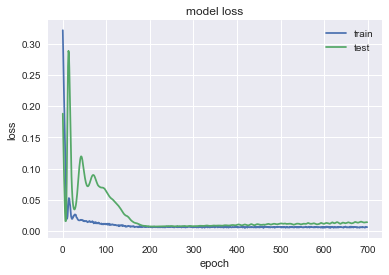

(21, 1, 10)
                  T
MSE         5.13333
MAE         1.94057
R2        0.0209494
MAPE (%)    5.83793


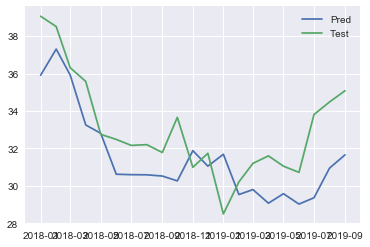

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1246 - val_loss: 0.6671
Epoch 2/700
0s - loss: 0.1016 - val_loss: 0.5942
Epoch 3/700
0s - loss: 0.0831 - val_loss: 0.5211
Epoch 4/700
0s - loss: 0.0662 - val_loss: 0.4457
Epoch 5/700
0s - loss: 0.0507 - val_loss: 0.3678
Epoch 6/700
0s - loss: 0.0384 - val_loss: 0.2901
Epoch 7/700
0s - loss: 0.0284 - val_loss: 0.2178
Epoch 8/700
0s - loss: 0.0235 - val_loss: 0.1579
Epoch 9/700
0s - loss: 0.0245 - val_loss: 0.1154
Epoch 10/700
0s - loss: 0.0276 - val_loss: 0.0906
Epoch 11/700
0s - loss: 0.0307 - val_loss: 0.0798
Epoch 12/700
0s - loss: 0.0321 - val_loss: 0.0790
Epoch 13/700
0s - loss: 0.0316 - val_loss: 0.0854
Epoch 14/700
0s - loss: 0.0285 - val_loss: 0.0975
Epoch 15/700
0s - loss: 0.0251 - val_loss: 0.1130
Epoch 16/700
0s - loss: 0.0219 - val_loss: 0.1300
Epoch 17/700
0s - loss: 0.0199 - val_loss: 0.1465
Epoch 18/700
0s - loss: 0.0190 - val_loss: 0.1613
Epoch 19/700
0s - loss: 0.0176 - val_loss: 0.

0s - loss: 0.0032 - val_loss: 0.0094
Epoch 169/700
0s - loss: 0.0034 - val_loss: 0.0095
Epoch 170/700
0s - loss: 0.0031 - val_loss: 0.0096
Epoch 171/700
0s - loss: 0.0035 - val_loss: 0.0098
Epoch 172/700
0s - loss: 0.0030 - val_loss: 0.0100
Epoch 173/700
0s - loss: 0.0029 - val_loss: 0.0100
Epoch 174/700
0s - loss: 0.0029 - val_loss: 0.0099
Epoch 175/700
0s - loss: 0.0033 - val_loss: 0.0098
Epoch 176/700
0s - loss: 0.0034 - val_loss: 0.0097
Epoch 177/700
0s - loss: 0.0031 - val_loss: 0.0096
Epoch 178/700
0s - loss: 0.0031 - val_loss: 0.0095
Epoch 179/700
0s - loss: 0.0034 - val_loss: 0.0094
Epoch 180/700
0s - loss: 0.0032 - val_loss: 0.0095
Epoch 181/700
0s - loss: 0.0028 - val_loss: 0.0096
Epoch 182/700
0s - loss: 0.0029 - val_loss: 0.0098
Epoch 183/700
0s - loss: 0.0035 - val_loss: 0.0101
Epoch 184/700
0s - loss: 0.0030 - val_loss: 0.0103
Epoch 185/700
0s - loss: 0.0029 - val_loss: 0.0105
Epoch 186/700
0s - loss: 0.0029 - val_loss: 0.0105
Epoch 187/700
0s - loss: 0.0032 - val_loss: 0

0s - loss: 0.0025 - val_loss: 0.0138
Epoch 333/700
0s - loss: 0.0027 - val_loss: 0.0134
Epoch 334/700
0s - loss: 0.0028 - val_loss: 0.0128
Epoch 335/700
0s - loss: 0.0025 - val_loss: 0.0124
Epoch 336/700
0s - loss: 0.0029 - val_loss: 0.0122
Epoch 337/700
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 338/700
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 339/700
0s - loss: 0.0025 - val_loss: 0.0136
Epoch 340/700
0s - loss: 0.0027 - val_loss: 0.0139
Epoch 341/700
0s - loss: 0.0030 - val_loss: 0.0142
Epoch 342/700
0s - loss: 0.0030 - val_loss: 0.0145
Epoch 343/700
0s - loss: 0.0026 - val_loss: 0.0145
Epoch 344/700
0s - loss: 0.0026 - val_loss: 0.0142
Epoch 345/700
0s - loss: 0.0027 - val_loss: 0.0140
Epoch 346/700
0s - loss: 0.0028 - val_loss: 0.0137
Epoch 347/700
0s - loss: 0.0027 - val_loss: 0.0134
Epoch 348/700
0s - loss: 0.0028 - val_loss: 0.0132
Epoch 349/700
0s - loss: 0.0029 - val_loss: 0.0130
Epoch 350/700
0s - loss: 0.0027 - val_loss: 0.0130
Epoch 351/700
0s - loss: 0.0029 - val_loss: 0

0s - loss: 0.0023 - val_loss: 0.0136
Epoch 499/700
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 500/700
0s - loss: 0.0027 - val_loss: 0.0136
Epoch 501/700
0s - loss: 0.0025 - val_loss: 0.0139
Epoch 502/700
0s - loss: 0.0026 - val_loss: 0.0146
Epoch 503/700
0s - loss: 0.0026 - val_loss: 0.0153
Epoch 504/700
0s - loss: 0.0028 - val_loss: 0.0159
Epoch 505/700
0s - loss: 0.0029 - val_loss: 0.0162
Epoch 506/700
0s - loss: 0.0025 - val_loss: 0.0162
Epoch 507/700
0s - loss: 0.0028 - val_loss: 0.0158
Epoch 508/700
0s - loss: 0.0025 - val_loss: 0.0153
Epoch 509/700
0s - loss: 0.0030 - val_loss: 0.0148
Epoch 510/700
0s - loss: 0.0026 - val_loss: 0.0146
Epoch 511/700
0s - loss: 0.0026 - val_loss: 0.0146
Epoch 512/700
0s - loss: 0.0024 - val_loss: 0.0149
Epoch 513/700
0s - loss: 0.0028 - val_loss: 0.0152
Epoch 514/700
0s - loss: 0.0029 - val_loss: 0.0155
Epoch 515/700
0s - loss: 0.0027 - val_loss: 0.0159
Epoch 516/700
0s - loss: 0.0026 - val_loss: 0.0162
Epoch 517/700
0s - loss: 0.0024 - val_loss: 0

0s - loss: 0.0023 - val_loss: 0.0149
Epoch 666/700
0s - loss: 0.0024 - val_loss: 0.0151
Epoch 667/700
0s - loss: 0.0025 - val_loss: 0.0153
Epoch 668/700
0s - loss: 0.0026 - val_loss: 0.0155
Epoch 669/700
0s - loss: 0.0026 - val_loss: 0.0161
Epoch 670/700
0s - loss: 0.0029 - val_loss: 0.0163
Epoch 671/700
0s - loss: 0.0025 - val_loss: 0.0165
Epoch 672/700
0s - loss: 0.0025 - val_loss: 0.0168
Epoch 673/700
0s - loss: 0.0029 - val_loss: 0.0169
Epoch 674/700
0s - loss: 0.0024 - val_loss: 0.0166
Epoch 675/700
0s - loss: 0.0028 - val_loss: 0.0162
Epoch 676/700
0s - loss: 0.0029 - val_loss: 0.0160
Epoch 677/700
0s - loss: 0.0026 - val_loss: 0.0160
Epoch 678/700
0s - loss: 0.0028 - val_loss: 0.0163
Epoch 679/700
0s - loss: 0.0024 - val_loss: 0.0164
Epoch 680/700
0s - loss: 0.0027 - val_loss: 0.0167
Epoch 681/700
0s - loss: 0.0024 - val_loss: 0.0168
Epoch 682/700
0s - loss: 0.0028 - val_loss: 0.0171
Epoch 683/700
0s - loss: 0.0026 - val_loss: 0.0171
Epoch 684/700
0s - loss: 0.0022 - val_loss: 0

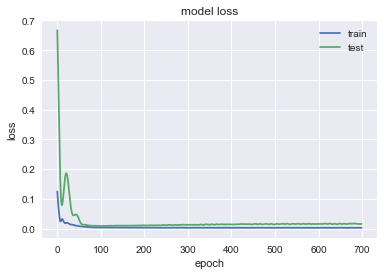

(21, 1, 10)
               BBY
MSE        70.6364
MAE        7.22624
R2       -0.770893
MAPE (%)   10.2648


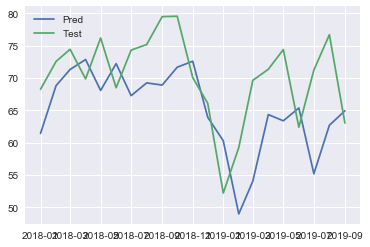

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.2308 - val_loss: 0.4741
Epoch 2/700
0s - loss: 0.1911 - val_loss: 0.4063
Epoch 3/700
0s - loss: 0.1577 - val_loss: 0.3404
Epoch 4/700
0s - loss: 0.1254 - val_loss: 0.2750
Epoch 5/700
0s - loss: 0.0954 - val_loss: 0.2103
Epoch 6/700
0s - loss: 0.0668 - val_loss: 0.1487
Epoch 7/700
0s - loss: 0.0417 - val_loss: 0.0943
Epoch 8/700
0s - loss: 0.0228 - val_loss: 0.0528
Epoch 9/700
0s - loss: 0.0103 - val_loss: 0.0291
Epoch 10/700
0s - loss: 0.0074 - val_loss: 0.0235
Epoch 11/700
0s - loss: 0.0136 - val_loss: 0.0293
Epoch 12/700
0s - loss: 0.0219 - val_loss: 0.0365
Epoch 13/700
0s - loss: 0.0276 - val_loss: 0.0390
Epoch 14/700
0s - loss: 0.0300 - val_loss: 0.0364
Epoch 15/700
0s - loss: 0.0297 - val_loss: 0.0307
Epoch 16/700
0s - loss: 0.0251 - val_loss: 0.0252
Epoch 17/700
0s - loss: 0.0179 - val_loss: 0.0227
Epoch 18/700
0s - loss: 0.0131 - val_loss: 0.0240
Epoch 19/700
0s - loss: 0.0091 - val_loss: 0.0

0s - loss: 0.0034 - val_loss: 0.0272
Epoch 168/700
0s - loss: 0.0039 - val_loss: 0.0272
Epoch 169/700
0s - loss: 0.0034 - val_loss: 0.0271
Epoch 170/700
0s - loss: 0.0037 - val_loss: 0.0271
Epoch 171/700
0s - loss: 0.0038 - val_loss: 0.0269
Epoch 172/700
0s - loss: 0.0036 - val_loss: 0.0267
Epoch 173/700
0s - loss: 0.0035 - val_loss: 0.0266
Epoch 174/700
0s - loss: 0.0034 - val_loss: 0.0265
Epoch 175/700
0s - loss: 0.0038 - val_loss: 0.0265
Epoch 176/700
0s - loss: 0.0032 - val_loss: 0.0265
Epoch 177/700
0s - loss: 0.0033 - val_loss: 0.0266
Epoch 178/700
0s - loss: 0.0035 - val_loss: 0.0267
Epoch 179/700
0s - loss: 0.0038 - val_loss: 0.0269
Epoch 180/700
0s - loss: 0.0037 - val_loss: 0.0271
Epoch 181/700
0s - loss: 0.0035 - val_loss: 0.0272
Epoch 182/700
0s - loss: 0.0038 - val_loss: 0.0274
Epoch 183/700
0s - loss: 0.0033 - val_loss: 0.0274
Epoch 184/700
0s - loss: 0.0032 - val_loss: 0.0275
Epoch 185/700
0s - loss: 0.0035 - val_loss: 0.0277
Epoch 186/700
0s - loss: 0.0034 - val_loss: 0

0s - loss: 0.0027 - val_loss: 0.0224
Epoch 331/700
0s - loss: 0.0026 - val_loss: 0.0219
Epoch 332/700
0s - loss: 0.0029 - val_loss: 0.0213
Epoch 333/700
0s - loss: 0.0031 - val_loss: 0.0210
Epoch 334/700
0s - loss: 0.0028 - val_loss: 0.0209
Epoch 335/700
0s - loss: 0.0032 - val_loss: 0.0210
Epoch 336/700
0s - loss: 0.0029 - val_loss: 0.0210
Epoch 337/700
0s - loss: 0.0029 - val_loss: 0.0211
Epoch 338/700
0s - loss: 0.0032 - val_loss: 0.0212
Epoch 339/700
0s - loss: 0.0027 - val_loss: 0.0214
Epoch 340/700
0s - loss: 0.0030 - val_loss: 0.0218
Epoch 341/700
0s - loss: 0.0028 - val_loss: 0.0221
Epoch 342/700
0s - loss: 0.0027 - val_loss: 0.0225
Epoch 343/700
0s - loss: 0.0027 - val_loss: 0.0226
Epoch 344/700
0s - loss: 0.0026 - val_loss: 0.0225
Epoch 345/700
0s - loss: 0.0026 - val_loss: 0.0223
Epoch 346/700
0s - loss: 0.0030 - val_loss: 0.0218
Epoch 347/700
0s - loss: 0.0029 - val_loss: 0.0213
Epoch 348/700
0s - loss: 0.0026 - val_loss: 0.0207
Epoch 349/700
0s - loss: 0.0025 - val_loss: 0

0s - loss: 0.0023 - val_loss: 0.0093
Epoch 498/700
0s - loss: 0.0020 - val_loss: 0.0093
Epoch 499/700
0s - loss: 0.0022 - val_loss: 0.0093
Epoch 500/700
0s - loss: 0.0024 - val_loss: 0.0092
Epoch 501/700
0s - loss: 0.0025 - val_loss: 0.0092
Epoch 502/700
0s - loss: 0.0026 - val_loss: 0.0092
Epoch 503/700
0s - loss: 0.0025 - val_loss: 0.0091
Epoch 504/700
0s - loss: 0.0026 - val_loss: 0.0090
Epoch 505/700
0s - loss: 0.0023 - val_loss: 0.0088
Epoch 506/700
0s - loss: 0.0022 - val_loss: 0.0086
Epoch 507/700
0s - loss: 0.0026 - val_loss: 0.0084
Epoch 508/700
0s - loss: 0.0024 - val_loss: 0.0083
Epoch 509/700
0s - loss: 0.0024 - val_loss: 0.0083
Epoch 510/700
0s - loss: 0.0023 - val_loss: 0.0084
Epoch 511/700
0s - loss: 0.0021 - val_loss: 0.0085
Epoch 512/700
0s - loss: 0.0022 - val_loss: 0.0085
Epoch 513/700
0s - loss: 0.0021 - val_loss: 0.0086
Epoch 514/700
0s - loss: 0.0023 - val_loss: 0.0086
Epoch 515/700
0s - loss: 0.0024 - val_loss: 0.0087
Epoch 516/700
0s - loss: 0.0023 - val_loss: 0

0s - loss: 0.0026 - val_loss: 0.0067
Epoch 659/700
0s - loss: 0.0020 - val_loss: 0.0067
Epoch 660/700
0s - loss: 0.0022 - val_loss: 0.0067
Epoch 661/700
0s - loss: 0.0027 - val_loss: 0.0067
Epoch 662/700
0s - loss: 0.0022 - val_loss: 0.0067
Epoch 663/700
0s - loss: 0.0019 - val_loss: 0.0067
Epoch 664/700
0s - loss: 0.0023 - val_loss: 0.0067
Epoch 665/700
0s - loss: 0.0023 - val_loss: 0.0066
Epoch 666/700
0s - loss: 0.0021 - val_loss: 0.0067
Epoch 667/700
0s - loss: 0.0022 - val_loss: 0.0067
Epoch 668/700
0s - loss: 0.0025 - val_loss: 0.0067
Epoch 669/700
0s - loss: 0.0024 - val_loss: 0.0067
Epoch 670/700
0s - loss: 0.0021 - val_loss: 0.0066
Epoch 671/700
0s - loss: 0.0018 - val_loss: 0.0066
Epoch 672/700
0s - loss: 0.0022 - val_loss: 0.0067
Epoch 673/700
0s - loss: 0.0024 - val_loss: 0.0068
Epoch 674/700
0s - loss: 0.0023 - val_loss: 0.0068
Epoch 675/700
0s - loss: 0.0024 - val_loss: 0.0067
Epoch 676/700
0s - loss: 0.0023 - val_loss: 0.0066
Epoch 677/700
0s - loss: 0.0024 - val_loss: 0

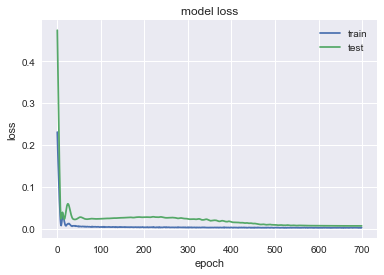

(21, 1, 10)
                KO
MSE        5.88132
MAE        1.85577
R2       -0.117361
MAPE (%)   3.86252


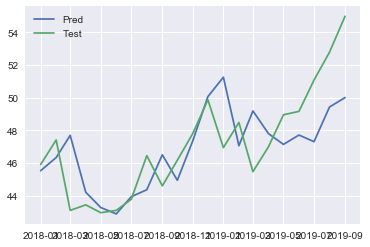

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3296 - val_loss: 0.0344
Epoch 2/700
0s - loss: 0.2920 - val_loss: 0.0225
Epoch 3/700
0s - loss: 0.2594 - val_loss: 0.0137
Epoch 4/700
0s - loss: 0.2277 - val_loss: 0.0085
Epoch 5/700
0s - loss: 0.1980 - val_loss: 0.0081
Epoch 6/700
0s - loss: 0.1687 - val_loss: 0.0148
Epoch 7/700
0s - loss: 0.1404 - val_loss: 0.0317
Epoch 8/700
0s - loss: 0.1117 - val_loss: 0.0627
Epoch 9/700
0s - loss: 0.0881 - val_loss: 0.1103
Epoch 10/700
0s - loss: 0.0732 - val_loss: 0.1735
Epoch 11/700
0s - loss: 0.0643 - val_loss: 0.2449
Epoch 12/700
0s - loss: 0.0653 - val_loss: 0.3088
Epoch 13/700
0s - loss: 0.0728 - val_loss: 0.3505
Epoch 14/700
0s - loss: 0.0770 - val_loss: 0.3663
Epoch 15/700
0s - loss: 0.0819 - val_loss: 0.3588
Epoch 16/700
0s - loss: 0.0782 - val_loss: 0.3330
Epoch 17/700
0s - loss: 0.0785 - val_loss: 0.2949
Epoch 18/700
0s - loss: 0.0687 - val_loss: 0.2517
Epoch 19/700
0s - loss: 0.0603 - val_loss: 0.

0s - loss: 0.0066 - val_loss: 0.0039
Epoch 169/700
0s - loss: 0.0070 - val_loss: 0.0038
Epoch 170/700
0s - loss: 0.0072 - val_loss: 0.0038
Epoch 171/700
0s - loss: 0.0068 - val_loss: 0.0038
Epoch 172/700
0s - loss: 0.0070 - val_loss: 0.0038
Epoch 173/700
0s - loss: 0.0073 - val_loss: 0.0038
Epoch 174/700
0s - loss: 0.0062 - val_loss: 0.0037
Epoch 175/700
0s - loss: 0.0063 - val_loss: 0.0037
Epoch 176/700
0s - loss: 0.0072 - val_loss: 0.0037
Epoch 177/700
0s - loss: 0.0079 - val_loss: 0.0037
Epoch 178/700
0s - loss: 0.0072 - val_loss: 0.0037
Epoch 179/700
0s - loss: 0.0071 - val_loss: 0.0038
Epoch 180/700
0s - loss: 0.0076 - val_loss: 0.0038
Epoch 181/700
0s - loss: 0.0067 - val_loss: 0.0039
Epoch 182/700
0s - loss: 0.0073 - val_loss: 0.0039
Epoch 183/700
0s - loss: 0.0065 - val_loss: 0.0040
Epoch 184/700
0s - loss: 0.0068 - val_loss: 0.0040
Epoch 185/700
0s - loss: 0.0068 - val_loss: 0.0039
Epoch 186/700
0s - loss: 0.0072 - val_loss: 0.0038
Epoch 187/700
0s - loss: 0.0067 - val_loss: 0

0s - loss: 0.0055 - val_loss: 0.0037
Epoch 336/700
0s - loss: 0.0062 - val_loss: 0.0037
Epoch 337/700
0s - loss: 0.0062 - val_loss: 0.0037
Epoch 338/700
0s - loss: 0.0061 - val_loss: 0.0037
Epoch 339/700
0s - loss: 0.0065 - val_loss: 0.0037
Epoch 340/700
0s - loss: 0.0068 - val_loss: 0.0037
Epoch 341/700
0s - loss: 0.0070 - val_loss: 0.0037
Epoch 342/700
0s - loss: 0.0068 - val_loss: 0.0037
Epoch 343/700
0s - loss: 0.0066 - val_loss: 0.0037
Epoch 344/700
0s - loss: 0.0061 - val_loss: 0.0037
Epoch 345/700
0s - loss: 0.0069 - val_loss: 0.0037
Epoch 346/700
0s - loss: 0.0060 - val_loss: 0.0037
Epoch 347/700
0s - loss: 0.0072 - val_loss: 0.0037
Epoch 348/700
0s - loss: 0.0064 - val_loss: 0.0037
Epoch 349/700
0s - loss: 0.0060 - val_loss: 0.0037
Epoch 350/700
0s - loss: 0.0068 - val_loss: 0.0037
Epoch 351/700
0s - loss: 0.0057 - val_loss: 0.0037
Epoch 352/700
0s - loss: 0.0069 - val_loss: 0.0037
Epoch 353/700
0s - loss: 0.0065 - val_loss: 0.0037
Epoch 354/700
0s - loss: 0.0059 - val_loss: 0

0s - loss: 0.0067 - val_loss: 0.0037
Epoch 497/700
0s - loss: 0.0053 - val_loss: 0.0037
Epoch 498/700
0s - loss: 0.0062 - val_loss: 0.0037
Epoch 499/700
0s - loss: 0.0066 - val_loss: 0.0037
Epoch 500/700
0s - loss: 0.0064 - val_loss: 0.0037
Epoch 501/700
0s - loss: 0.0060 - val_loss: 0.0038
Epoch 502/700
0s - loss: 0.0060 - val_loss: 0.0039
Epoch 503/700
0s - loss: 0.0057 - val_loss: 0.0039
Epoch 504/700
0s - loss: 0.0064 - val_loss: 0.0039
Epoch 505/700
0s - loss: 0.0062 - val_loss: 0.0039
Epoch 506/700
0s - loss: 0.0066 - val_loss: 0.0039
Epoch 507/700
0s - loss: 0.0056 - val_loss: 0.0038
Epoch 508/700
0s - loss: 0.0054 - val_loss: 0.0038
Epoch 509/700
0s - loss: 0.0067 - val_loss: 0.0038
Epoch 510/700
0s - loss: 0.0065 - val_loss: 0.0038
Epoch 511/700
0s - loss: 0.0059 - val_loss: 0.0038
Epoch 512/700
0s - loss: 0.0065 - val_loss: 0.0038
Epoch 513/700
0s - loss: 0.0060 - val_loss: 0.0039
Epoch 514/700
0s - loss: 0.0067 - val_loss: 0.0040
Epoch 515/700
0s - loss: 0.0071 - val_loss: 0

0s - loss: 0.0068 - val_loss: 0.0042
Epoch 664/700
0s - loss: 0.0062 - val_loss: 0.0044
Epoch 665/700
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 666/700
0s - loss: 0.0064 - val_loss: 0.0046
Epoch 667/700
0s - loss: 0.0069 - val_loss: 0.0045
Epoch 668/700
0s - loss: 0.0057 - val_loss: 0.0044
Epoch 669/700
0s - loss: 0.0070 - val_loss: 0.0044
Epoch 670/700
0s - loss: 0.0061 - val_loss: 0.0042
Epoch 671/700
0s - loss: 0.0064 - val_loss: 0.0041
Epoch 672/700
0s - loss: 0.0065 - val_loss: 0.0041
Epoch 673/700
0s - loss: 0.0064 - val_loss: 0.0040
Epoch 674/700
0s - loss: 0.0057 - val_loss: 0.0040
Epoch 675/700
0s - loss: 0.0064 - val_loss: 0.0040
Epoch 676/700
0s - loss: 0.0059 - val_loss: 0.0040
Epoch 677/700
0s - loss: 0.0068 - val_loss: 0.0041
Epoch 678/700
0s - loss: 0.0060 - val_loss: 0.0043
Epoch 679/700
0s - loss: 0.0061 - val_loss: 0.0044
Epoch 680/700
0s - loss: 0.0068 - val_loss: 0.0044
Epoch 681/700
0s - loss: 0.0067 - val_loss: 0.0043
Epoch 682/700
0s - loss: 0.0064 - val_loss: 0

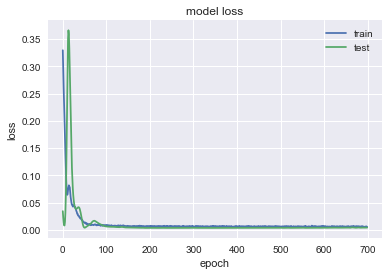

(21, 1, 10)
              FTI
MSE       7.77783
MAE        2.3308
R2        0.28829
MAPE (%)  8.67249


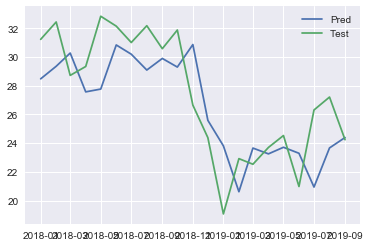

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1535 - val_loss: 0.5733
Epoch 2/700
0s - loss: 0.1293 - val_loss: 0.5134
Epoch 3/700
0s - loss: 0.1083 - val_loss: 0.4541
Epoch 4/700
0s - loss: 0.0896 - val_loss: 0.3929
Epoch 5/700
0s - loss: 0.0716 - val_loss: 0.3294
Epoch 6/700
0s - loss: 0.0545 - val_loss: 0.2643
Epoch 7/700
0s - loss: 0.0407 - val_loss: 0.2003
Epoch 8/700
0s - loss: 0.0285 - val_loss: 0.1417
Epoch 9/700
0s - loss: 0.0237 - val_loss: 0.0933
Epoch 10/700
0s - loss: 0.0223 - val_loss: 0.0590
Epoch 11/700
0s - loss: 0.0253 - val_loss: 0.0384
Epoch 12/700
0s - loss: 0.0312 - val_loss: 0.0287
Epoch 13/700
0s - loss: 0.0358 - val_loss: 0.0257
Epoch 14/700
0s - loss: 0.0336 - val_loss: 0.0269
Epoch 15/700
0s - loss: 0.0324 - val_loss: 0.0317
Epoch 16/700
0s - loss: 0.0277 - val_loss: 0.0394
Epoch 17/700
0s - loss: 0.0234 - val_loss: 0.0495
Epoch 18/700
0s - loss: 0.0198 - val_loss: 0.0610
Epoch 19/700
0s - loss: 0.0173 - val_loss: 0.

0s - loss: 0.0025 - val_loss: 0.0164
Epoch 166/700
0s - loss: 0.0025 - val_loss: 0.0164
Epoch 167/700
0s - loss: 0.0024 - val_loss: 0.0163
Epoch 168/700
0s - loss: 0.0027 - val_loss: 0.0162
Epoch 169/700
0s - loss: 0.0025 - val_loss: 0.0161
Epoch 170/700
0s - loss: 0.0025 - val_loss: 0.0161
Epoch 171/700
0s - loss: 0.0023 - val_loss: 0.0161
Epoch 172/700
0s - loss: 0.0023 - val_loss: 0.0161
Epoch 173/700
0s - loss: 0.0024 - val_loss: 0.0160
Epoch 174/700
0s - loss: 0.0023 - val_loss: 0.0161
Epoch 175/700
0s - loss: 0.0029 - val_loss: 0.0163
Epoch 176/700
0s - loss: 0.0025 - val_loss: 0.0164
Epoch 177/700
0s - loss: 0.0023 - val_loss: 0.0166
Epoch 178/700
0s - loss: 0.0022 - val_loss: 0.0167
Epoch 179/700
0s - loss: 0.0028 - val_loss: 0.0168
Epoch 180/700
0s - loss: 0.0026 - val_loss: 0.0169
Epoch 181/700
0s - loss: 0.0025 - val_loss: 0.0170
Epoch 182/700
0s - loss: 0.0023 - val_loss: 0.0171
Epoch 183/700
0s - loss: 0.0027 - val_loss: 0.0172
Epoch 184/700
0s - loss: 0.0024 - val_loss: 0

0s - loss: 0.0022 - val_loss: 0.0171
Epoch 332/700
0s - loss: 0.0022 - val_loss: 0.0169
Epoch 333/700
0s - loss: 0.0021 - val_loss: 0.0170
Epoch 334/700
0s - loss: 0.0020 - val_loss: 0.0170
Epoch 335/700
0s - loss: 0.0023 - val_loss: 0.0170
Epoch 336/700
0s - loss: 0.0019 - val_loss: 0.0172
Epoch 337/700
0s - loss: 0.0018 - val_loss: 0.0173
Epoch 338/700
0s - loss: 0.0020 - val_loss: 0.0174
Epoch 339/700
0s - loss: 0.0020 - val_loss: 0.0176
Epoch 340/700
0s - loss: 0.0021 - val_loss: 0.0177
Epoch 341/700
0s - loss: 0.0019 - val_loss: 0.0178
Epoch 342/700
0s - loss: 0.0021 - val_loss: 0.0178
Epoch 343/700
0s - loss: 0.0019 - val_loss: 0.0176
Epoch 344/700
0s - loss: 0.0023 - val_loss: 0.0174
Epoch 345/700
0s - loss: 0.0018 - val_loss: 0.0173
Epoch 346/700
0s - loss: 0.0022 - val_loss: 0.0173
Epoch 347/700
0s - loss: 0.0023 - val_loss: 0.0173
Epoch 348/700
0s - loss: 0.0020 - val_loss: 0.0173
Epoch 349/700
0s - loss: 0.0020 - val_loss: 0.0174
Epoch 350/700
0s - loss: 0.0021 - val_loss: 0

0s - loss: 0.0020 - val_loss: 0.0171
Epoch 493/700
0s - loss: 0.0016 - val_loss: 0.0172
Epoch 494/700
0s - loss: 0.0016 - val_loss: 0.0171
Epoch 495/700
0s - loss: 0.0020 - val_loss: 0.0169
Epoch 496/700
0s - loss: 0.0018 - val_loss: 0.0166
Epoch 497/700
0s - loss: 0.0018 - val_loss: 0.0165
Epoch 498/700
0s - loss: 0.0018 - val_loss: 0.0165
Epoch 499/700
0s - loss: 0.0022 - val_loss: 0.0167
Epoch 500/700
0s - loss: 0.0018 - val_loss: 0.0167
Epoch 501/700
0s - loss: 0.0016 - val_loss: 0.0167
Epoch 502/700
0s - loss: 0.0019 - val_loss: 0.0165
Epoch 503/700
0s - loss: 0.0017 - val_loss: 0.0163
Epoch 504/700
0s - loss: 0.0017 - val_loss: 0.0162
Epoch 505/700
0s - loss: 0.0015 - val_loss: 0.0161
Epoch 506/700
0s - loss: 0.0016 - val_loss: 0.0162
Epoch 507/700
0s - loss: 0.0017 - val_loss: 0.0163
Epoch 508/700
0s - loss: 0.0017 - val_loss: 0.0162
Epoch 509/700
0s - loss: 0.0016 - val_loss: 0.0162
Epoch 510/700
0s - loss: 0.0018 - val_loss: 0.0160
Epoch 511/700
0s - loss: 0.0018 - val_loss: 0

0s - loss: 0.0017 - val_loss: 0.0143
Epoch 654/700
0s - loss: 0.0018 - val_loss: 0.0145
Epoch 655/700
0s - loss: 0.0016 - val_loss: 0.0148
Epoch 656/700
0s - loss: 0.0019 - val_loss: 0.0153
Epoch 657/700
0s - loss: 0.0017 - val_loss: 0.0157
Epoch 658/700
0s - loss: 0.0017 - val_loss: 0.0158
Epoch 659/700
0s - loss: 0.0014 - val_loss: 0.0157
Epoch 660/700
0s - loss: 0.0015 - val_loss: 0.0152
Epoch 661/700
0s - loss: 0.0017 - val_loss: 0.0147
Epoch 662/700
0s - loss: 0.0015 - val_loss: 0.0143
Epoch 663/700
0s - loss: 0.0018 - val_loss: 0.0142
Epoch 664/700
0s - loss: 0.0018 - val_loss: 0.0143
Epoch 665/700
0s - loss: 0.0018 - val_loss: 0.0148
Epoch 666/700
0s - loss: 0.0016 - val_loss: 0.0155
Epoch 667/700
0s - loss: 0.0017 - val_loss: 0.0159
Epoch 668/700
0s - loss: 0.0016 - val_loss: 0.0159
Epoch 669/700
0s - loss: 0.0019 - val_loss: 0.0159
Epoch 670/700
0s - loss: 0.0016 - val_loss: 0.0156
Epoch 671/700
0s - loss: 0.0016 - val_loss: 0.0150
Epoch 672/700
0s - loss: 0.0017 - val_loss: 0

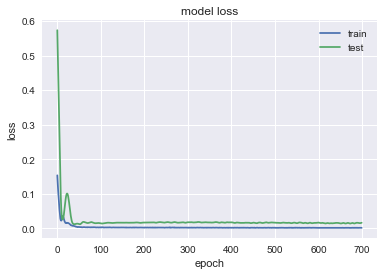

(21, 1, 10)
               BLK
MSE        2838.67
MAE        41.8361
R2       -0.610253
MAPE (%)   9.38824


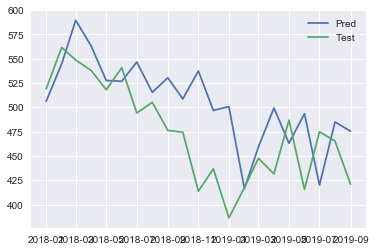

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3549 - val_loss: 0.3565
Epoch 2/700
0s - loss: 0.3124 - val_loss: 0.3046
Epoch 3/700
0s - loss: 0.2763 - val_loss: 0.2552
Epoch 4/700
0s - loss: 0.2400 - val_loss: 0.2069
Epoch 5/700
0s - loss: 0.2053 - val_loss: 0.1595
Epoch 6/700
0s - loss: 0.1702 - val_loss: 0.1139
Epoch 7/700
0s - loss: 0.1340 - val_loss: 0.0727
Epoch 8/700
0s - loss: 0.1029 - val_loss: 0.0394
Epoch 9/700
0s - loss: 0.0741 - val_loss: 0.0194
Epoch 10/700
0s - loss: 0.0514 - val_loss: 0.0180
Epoch 11/700
0s - loss: 0.0371 - val_loss: 0.0377
Epoch 12/700
0s - loss: 0.0347 - val_loss: 0.0747
Epoch 13/700
0s - loss: 0.0416 - val_loss: 0.1181
Epoch 14/700
0s - loss: 0.0532 - val_loss: 0.1511
Epoch 15/700
0s - loss: 0.0605 - val_loss: 0.1658
Epoch 16/700
0s - loss: 0.0665 - val_loss: 0.1625
Epoch 17/700
0s - loss: 0.0623 - val_loss: 0.1455
Epoch 18/700
0s - loss: 0.0562 - val_loss: 0.1209
Epoch 19/700
0s - loss: 0.0486 - val_loss: 0.

0s - loss: 0.0037 - val_loss: 0.0340
Epoch 169/700
0s - loss: 0.0048 - val_loss: 0.0343
Epoch 170/700
0s - loss: 0.0037 - val_loss: 0.0343
Epoch 171/700
0s - loss: 0.0040 - val_loss: 0.0339
Epoch 172/700
0s - loss: 0.0049 - val_loss: 0.0338
Epoch 173/700
0s - loss: 0.0045 - val_loss: 0.0337
Epoch 174/700
0s - loss: 0.0043 - val_loss: 0.0337
Epoch 175/700
0s - loss: 0.0043 - val_loss: 0.0339
Epoch 176/700
0s - loss: 0.0041 - val_loss: 0.0340
Epoch 177/700
0s - loss: 0.0043 - val_loss: 0.0342
Epoch 178/700
0s - loss: 0.0052 - val_loss: 0.0345
Epoch 179/700
0s - loss: 0.0041 - val_loss: 0.0347
Epoch 180/700
0s - loss: 0.0043 - val_loss: 0.0349
Epoch 181/700
0s - loss: 0.0040 - val_loss: 0.0352
Epoch 182/700
0s - loss: 0.0045 - val_loss: 0.0351
Epoch 183/700
0s - loss: 0.0044 - val_loss: 0.0349
Epoch 184/700
0s - loss: 0.0043 - val_loss: 0.0346
Epoch 185/700
0s - loss: 0.0043 - val_loss: 0.0342
Epoch 186/700
0s - loss: 0.0043 - val_loss: 0.0336
Epoch 187/700
0s - loss: 0.0046 - val_loss: 0

0s - loss: 0.0037 - val_loss: 0.0346
Epoch 331/700
0s - loss: 0.0038 - val_loss: 0.0342
Epoch 332/700
0s - loss: 0.0039 - val_loss: 0.0338
Epoch 333/700
0s - loss: 0.0044 - val_loss: 0.0338
Epoch 334/700
0s - loss: 0.0038 - val_loss: 0.0339
Epoch 335/700
0s - loss: 0.0044 - val_loss: 0.0342
Epoch 336/700
0s - loss: 0.0042 - val_loss: 0.0345
Epoch 337/700
0s - loss: 0.0041 - val_loss: 0.0347
Epoch 338/700
0s - loss: 0.0040 - val_loss: 0.0347
Epoch 339/700
0s - loss: 0.0043 - val_loss: 0.0352
Epoch 340/700
0s - loss: 0.0038 - val_loss: 0.0356
Epoch 341/700
0s - loss: 0.0037 - val_loss: 0.0361
Epoch 342/700
0s - loss: 0.0031 - val_loss: 0.0363
Epoch 343/700
0s - loss: 0.0041 - val_loss: 0.0359
Epoch 344/700
0s - loss: 0.0038 - val_loss: 0.0353
Epoch 345/700
0s - loss: 0.0036 - val_loss: 0.0348
Epoch 346/700
0s - loss: 0.0038 - val_loss: 0.0343
Epoch 347/700
0s - loss: 0.0039 - val_loss: 0.0337
Epoch 348/700
0s - loss: 0.0037 - val_loss: 0.0335
Epoch 349/700
0s - loss: 0.0041 - val_loss: 0

0s - loss: 0.0040 - val_loss: 0.0368
Epoch 492/700
0s - loss: 0.0034 - val_loss: 0.0366
Epoch 493/700
0s - loss: 0.0035 - val_loss: 0.0361
Epoch 494/700
0s - loss: 0.0041 - val_loss: 0.0356
Epoch 495/700
0s - loss: 0.0033 - val_loss: 0.0355
Epoch 496/700
0s - loss: 0.0035 - val_loss: 0.0353
Epoch 497/700
0s - loss: 0.0032 - val_loss: 0.0356
Epoch 498/700
0s - loss: 0.0036 - val_loss: 0.0356
Epoch 499/700
0s - loss: 0.0044 - val_loss: 0.0356
Epoch 500/700
0s - loss: 0.0038 - val_loss: 0.0356
Epoch 501/700
0s - loss: 0.0044 - val_loss: 0.0356
Epoch 502/700
0s - loss: 0.0038 - val_loss: 0.0354
Epoch 503/700
0s - loss: 0.0044 - val_loss: 0.0354
Epoch 504/700
0s - loss: 0.0032 - val_loss: 0.0356
Epoch 505/700
0s - loss: 0.0033 - val_loss: 0.0358
Epoch 506/700
0s - loss: 0.0039 - val_loss: 0.0363
Epoch 507/700
0s - loss: 0.0035 - val_loss: 0.0366
Epoch 508/700
0s - loss: 0.0041 - val_loss: 0.0373
Epoch 509/700
0s - loss: 0.0041 - val_loss: 0.0378
Epoch 510/700
0s - loss: 0.0040 - val_loss: 0

0s - loss: 0.0043 - val_loss: 0.0343
Epoch 655/700
0s - loss: 0.0038 - val_loss: 0.0344
Epoch 656/700
0s - loss: 0.0036 - val_loss: 0.0349
Epoch 657/700
0s - loss: 0.0035 - val_loss: 0.0356
Epoch 658/700
0s - loss: 0.0037 - val_loss: 0.0361
Epoch 659/700
0s - loss: 0.0037 - val_loss: 0.0364
Epoch 660/700
0s - loss: 0.0036 - val_loss: 0.0364
Epoch 661/700
0s - loss: 0.0039 - val_loss: 0.0362
Epoch 662/700
0s - loss: 0.0037 - val_loss: 0.0362
Epoch 663/700
0s - loss: 0.0036 - val_loss: 0.0361
Epoch 664/700
0s - loss: 0.0037 - val_loss: 0.0355
Epoch 665/700
0s - loss: 0.0033 - val_loss: 0.0350
Epoch 666/700
0s - loss: 0.0035 - val_loss: 0.0346
Epoch 667/700
0s - loss: 0.0040 - val_loss: 0.0343
Epoch 668/700
0s - loss: 0.0033 - val_loss: 0.0345
Epoch 669/700
0s - loss: 0.0039 - val_loss: 0.0347
Epoch 670/700
0s - loss: 0.0039 - val_loss: 0.0350
Epoch 671/700
0s - loss: 0.0034 - val_loss: 0.0354
Epoch 672/700
0s - loss: 0.0034 - val_loss: 0.0356
Epoch 673/700
0s - loss: 0.0035 - val_loss: 0

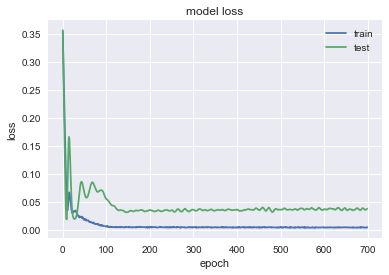

(21, 1, 10)
              DVA
MSE       111.673
MAE       8.63739
R2       -3.15069
MAPE (%)  15.0121


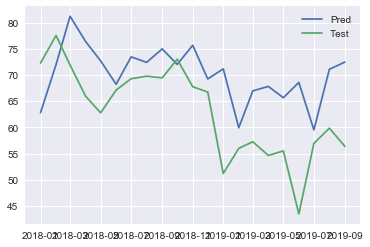

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.0388 - val_loss: 0.5103
Epoch 2/700
0s - loss: 0.0262 - val_loss: 0.4404
Epoch 3/700
0s - loss: 0.0177 - val_loss: 0.3743
Epoch 4/700
0s - loss: 0.0122 - val_loss: 0.3126
Epoch 5/700
0s - loss: 0.0090 - val_loss: 0.2602
Epoch 6/700
0s - loss: 0.0091 - val_loss: 0.2217
Epoch 7/700
0s - loss: 0.0097 - val_loss: 0.1984
Epoch 8/700
0s - loss: 0.0106 - val_loss: 0.1880
Epoch 9/700
0s - loss: 0.0106 - val_loss: 0.1877
Epoch 10/700
0s - loss: 0.0092 - val_loss: 0.1945
Epoch 11/700
0s - loss: 0.0078 - val_loss: 0.2047
Epoch 12/700
0s - loss: 0.0064 - val_loss: 0.2159
Epoch 13/700
0s - loss: 0.0056 - val_loss: 0.2263
Epoch 14/700
0s - loss: 0.0052 - val_loss: 0.2340
Epoch 15/700
0s - loss: 0.0048 - val_loss: 0.2379
Epoch 16/700
0s - loss: 0.0050 - val_loss: 0.2376
Epoch 17/700
0s - loss: 0.0048 - val_loss: 0.2330
Epoch 18/700
0s - loss: 0.0047 - val_loss: 0.2246
Epoch 19/700
0s - loss: 0.0044 - val_loss: 0.2

0s - loss: 6.7803e-04 - val_loss: 0.0402
Epoch 162/700
0s - loss: 6.8109e-04 - val_loss: 0.0394
Epoch 163/700
0s - loss: 6.4872e-04 - val_loss: 0.0389
Epoch 164/700
0s - loss: 7.8049e-04 - val_loss: 0.0388
Epoch 165/700
0s - loss: 8.6046e-04 - val_loss: 0.0387
Epoch 166/700
0s - loss: 6.2374e-04 - val_loss: 0.0387
Epoch 167/700
0s - loss: 7.2477e-04 - val_loss: 0.0389
Epoch 168/700
0s - loss: 6.2672e-04 - val_loss: 0.0393
Epoch 169/700
0s - loss: 8.0293e-04 - val_loss: 0.0395
Epoch 170/700
0s - loss: 6.0608e-04 - val_loss: 0.0396
Epoch 171/700
0s - loss: 7.2589e-04 - val_loss: 0.0395
Epoch 172/700
0s - loss: 7.5328e-04 - val_loss: 0.0390
Epoch 173/700
0s - loss: 6.9500e-04 - val_loss: 0.0385
Epoch 174/700
0s - loss: 6.9246e-04 - val_loss: 0.0381
Epoch 175/700
0s - loss: 5.8518e-04 - val_loss: 0.0378
Epoch 176/700
0s - loss: 8.0920e-04 - val_loss: 0.0376
Epoch 177/700
0s - loss: 7.1561e-04 - val_loss: 0.0371
Epoch 178/700
0s - loss: 8.3893e-04 - val_loss: 0.0366
Epoch 179/700
0s - loss:

0s - loss: 6.1098e-04 - val_loss: 0.0241
Epoch 316/700
0s - loss: 6.2584e-04 - val_loss: 0.0238
Epoch 317/700
0s - loss: 5.4475e-04 - val_loss: 0.0233
Epoch 318/700
0s - loss: 5.6902e-04 - val_loss: 0.0225
Epoch 319/700
0s - loss: 6.4710e-04 - val_loss: 0.0218
Epoch 320/700
0s - loss: 5.8052e-04 - val_loss: 0.0216
Epoch 321/700
0s - loss: 6.0332e-04 - val_loss: 0.0215
Epoch 322/700
0s - loss: 5.5396e-04 - val_loss: 0.0217
Epoch 323/700
0s - loss: 5.6870e-04 - val_loss: 0.0222
Epoch 324/700
0s - loss: 5.3516e-04 - val_loss: 0.0225
Epoch 325/700
0s - loss: 6.1511e-04 - val_loss: 0.0227
Epoch 326/700
0s - loss: 5.4632e-04 - val_loss: 0.0228
Epoch 327/700
0s - loss: 5.4477e-04 - val_loss: 0.0227
Epoch 328/700
0s - loss: 6.1975e-04 - val_loss: 0.0227
Epoch 329/700
0s - loss: 6.1079e-04 - val_loss: 0.0226
Epoch 330/700
0s - loss: 7.2570e-04 - val_loss: 0.0225
Epoch 331/700
0s - loss: 5.8870e-04 - val_loss: 0.0221
Epoch 332/700
0s - loss: 7.3472e-04 - val_loss: 0.0214
Epoch 333/700
0s - loss:

0s - loss: 4.8036e-04 - val_loss: 0.0136
Epoch 470/700
0s - loss: 5.5973e-04 - val_loss: 0.0139
Epoch 471/700
0s - loss: 5.2378e-04 - val_loss: 0.0142
Epoch 472/700
0s - loss: 4.3071e-04 - val_loss: 0.0144
Epoch 473/700
0s - loss: 4.9697e-04 - val_loss: 0.0145
Epoch 474/700
0s - loss: 5.1660e-04 - val_loss: 0.0143
Epoch 475/700
0s - loss: 4.9448e-04 - val_loss: 0.0139
Epoch 476/700
0s - loss: 6.1996e-04 - val_loss: 0.0136
Epoch 477/700
0s - loss: 5.0004e-04 - val_loss: 0.0134
Epoch 478/700
0s - loss: 5.7223e-04 - val_loss: 0.0133
Epoch 479/700
0s - loss: 5.1728e-04 - val_loss: 0.0134
Epoch 480/700
0s - loss: 5.3095e-04 - val_loss: 0.0135
Epoch 481/700
0s - loss: 5.1455e-04 - val_loss: 0.0137
Epoch 482/700
0s - loss: 4.7670e-04 - val_loss: 0.0138
Epoch 483/700
0s - loss: 4.3585e-04 - val_loss: 0.0138
Epoch 484/700
0s - loss: 4.4982e-04 - val_loss: 0.0136
Epoch 485/700
0s - loss: 4.4751e-04 - val_loss: 0.0134
Epoch 486/700
0s - loss: 4.4182e-04 - val_loss: 0.0133
Epoch 487/700
0s - loss:

0s - loss: 4.0017e-04 - val_loss: 0.0126
Epoch 623/700
0s - loss: 4.3715e-04 - val_loss: 0.0126
Epoch 624/700
0s - loss: 4.3733e-04 - val_loss: 0.0125
Epoch 625/700
0s - loss: 4.3876e-04 - val_loss: 0.0125
Epoch 626/700
0s - loss: 4.9185e-04 - val_loss: 0.0125
Epoch 627/700
0s - loss: 4.2026e-04 - val_loss: 0.0125
Epoch 628/700
0s - loss: 4.3999e-04 - val_loss: 0.0125
Epoch 629/700
0s - loss: 4.4476e-04 - val_loss: 0.0124
Epoch 630/700
0s - loss: 4.7118e-04 - val_loss: 0.0125
Epoch 631/700
0s - loss: 4.1302e-04 - val_loss: 0.0125
Epoch 632/700
0s - loss: 4.6337e-04 - val_loss: 0.0125
Epoch 633/700
0s - loss: 4.1536e-04 - val_loss: 0.0125
Epoch 634/700
0s - loss: 4.3924e-04 - val_loss: 0.0125
Epoch 635/700
0s - loss: 4.2449e-04 - val_loss: 0.0125
Epoch 636/700
0s - loss: 4.3820e-04 - val_loss: 0.0124
Epoch 637/700
0s - loss: 4.3602e-04 - val_loss: 0.0124
Epoch 638/700
0s - loss: 3.7613e-04 - val_loss: 0.0124
Epoch 639/700
0s - loss: 5.9714e-04 - val_loss: 0.0124
Epoch 640/700
0s - loss:

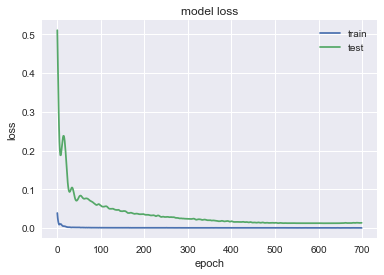

(21, 1, 10)
               BA
MSE       2054.72
MAE       35.3297
R2       -0.66648
MAPE (%)   9.8269


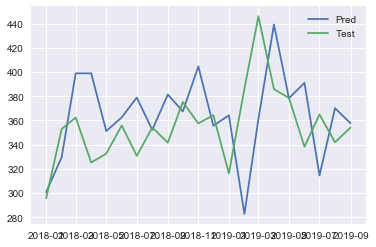

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3697 - val_loss: 0.0741
Epoch 2/700
0s - loss: 0.3255 - val_loss: 0.0532
Epoch 3/700
0s - loss: 0.2869 - val_loss: 0.0362
Epoch 4/700
0s - loss: 0.2512 - val_loss: 0.0230
Epoch 5/700
0s - loss: 0.2148 - val_loss: 0.0148
Epoch 6/700
0s - loss: 0.1809 - val_loss: 0.0140
Epoch 7/700
0s - loss: 0.1463 - val_loss: 0.0239
Epoch 8/700
0s - loss: 0.1134 - val_loss: 0.0489
Epoch 9/700
0s - loss: 0.0864 - val_loss: 0.0931
Epoch 10/700
0s - loss: 0.0659 - val_loss: 0.1576
Epoch 11/700
0s - loss: 0.0547 - val_loss: 0.2367
Epoch 12/700
0s - loss: 0.0518 - val_loss: 0.3160
Epoch 13/700
0s - loss: 0.0607 - val_loss: 0.3754
Epoch 14/700
0s - loss: 0.0663 - val_loss: 0.4062
Epoch 15/700
0s - loss: 0.0759 - val_loss: 0.4076
Epoch 16/700
0s - loss: 0.0792 - val_loss: 0.3848
Epoch 17/700
0s - loss: 0.0724 - val_loss: 0.3451
Epoch 18/700
0s - loss: 0.0701 - val_loss: 0.2957
Epoch 19/700
0s - loss: 0.0567 - val_loss: 0.

0s - loss: 0.0065 - val_loss: 0.0228
Epoch 164/700
0s - loss: 0.0056 - val_loss: 0.0227
Epoch 165/700
0s - loss: 0.0059 - val_loss: 0.0224
Epoch 166/700
0s - loss: 0.0057 - val_loss: 0.0223
Epoch 167/700
0s - loss: 0.0057 - val_loss: 0.0223
Epoch 168/700
0s - loss: 0.0064 - val_loss: 0.0223
Epoch 169/700
0s - loss: 0.0055 - val_loss: 0.0223
Epoch 170/700
0s - loss: 0.0063 - val_loss: 0.0224
Epoch 171/700
0s - loss: 0.0065 - val_loss: 0.0227
Epoch 172/700
0s - loss: 0.0056 - val_loss: 0.0230
Epoch 173/700
0s - loss: 0.0062 - val_loss: 0.0232
Epoch 174/700
0s - loss: 0.0068 - val_loss: 0.0234
Epoch 175/700
0s - loss: 0.0068 - val_loss: 0.0236
Epoch 176/700
0s - loss: 0.0063 - val_loss: 0.0235
Epoch 177/700
0s - loss: 0.0060 - val_loss: 0.0234
Epoch 178/700
0s - loss: 0.0050 - val_loss: 0.0232
Epoch 179/700
0s - loss: 0.0057 - val_loss: 0.0231
Epoch 180/700
0s - loss: 0.0061 - val_loss: 0.0229
Epoch 181/700
0s - loss: 0.0057 - val_loss: 0.0228
Epoch 182/700
0s - loss: 0.0058 - val_loss: 0

0s - loss: 0.0058 - val_loss: 0.0208
Epoch 326/700
0s - loss: 0.0055 - val_loss: 0.0206
Epoch 327/700
0s - loss: 0.0054 - val_loss: 0.0205
Epoch 328/700
0s - loss: 0.0055 - val_loss: 0.0204
Epoch 329/700
0s - loss: 0.0055 - val_loss: 0.0203
Epoch 330/700
0s - loss: 0.0058 - val_loss: 0.0202
Epoch 331/700
0s - loss: 0.0063 - val_loss: 0.0204
Epoch 332/700
0s - loss: 0.0050 - val_loss: 0.0206
Epoch 333/700
0s - loss: 0.0055 - val_loss: 0.0209
Epoch 334/700
0s - loss: 0.0059 - val_loss: 0.0210
Epoch 335/700
0s - loss: 0.0062 - val_loss: 0.0212
Epoch 336/700
0s - loss: 0.0057 - val_loss: 0.0213
Epoch 337/700
0s - loss: 0.0063 - val_loss: 0.0214
Epoch 338/700
0s - loss: 0.0057 - val_loss: 0.0215
Epoch 339/700
0s - loss: 0.0058 - val_loss: 0.0215
Epoch 340/700
0s - loss: 0.0057 - val_loss: 0.0214
Epoch 341/700
0s - loss: 0.0058 - val_loss: 0.0212
Epoch 342/700
0s - loss: 0.0056 - val_loss: 0.0209
Epoch 343/700
0s - loss: 0.0055 - val_loss: 0.0207
Epoch 344/700
0s - loss: 0.0060 - val_loss: 0

0s - loss: 0.0055 - val_loss: 0.0200
Epoch 490/700
0s - loss: 0.0057 - val_loss: 0.0204
Epoch 491/700
0s - loss: 0.0057 - val_loss: 0.0206
Epoch 492/700
0s - loss: 0.0051 - val_loss: 0.0206
Epoch 493/700
0s - loss: 0.0058 - val_loss: 0.0205
Epoch 494/700
0s - loss: 0.0057 - val_loss: 0.0203
Epoch 495/700
0s - loss: 0.0053 - val_loss: 0.0199
Epoch 496/700
0s - loss: 0.0049 - val_loss: 0.0196
Epoch 497/700
0s - loss: 0.0052 - val_loss: 0.0192
Epoch 498/700
0s - loss: 0.0055 - val_loss: 0.0189
Epoch 499/700
0s - loss: 0.0051 - val_loss: 0.0187
Epoch 500/700
0s - loss: 0.0057 - val_loss: 0.0187
Epoch 501/700
0s - loss: 0.0050 - val_loss: 0.0189
Epoch 502/700
0s - loss: 0.0049 - val_loss: 0.0190
Epoch 503/700
0s - loss: 0.0059 - val_loss: 0.0191
Epoch 504/700
0s - loss: 0.0055 - val_loss: 0.0194
Epoch 505/700
0s - loss: 0.0048 - val_loss: 0.0197
Epoch 506/700
0s - loss: 0.0052 - val_loss: 0.0199
Epoch 507/700
0s - loss: 0.0047 - val_loss: 0.0202
Epoch 508/700
0s - loss: 0.0059 - val_loss: 0

0s - loss: 0.0046 - val_loss: 0.0194
Epoch 652/700
0s - loss: 0.0052 - val_loss: 0.0195
Epoch 653/700
0s - loss: 0.0057 - val_loss: 0.0196
Epoch 654/700
0s - loss: 0.0051 - val_loss: 0.0195
Epoch 655/700
0s - loss: 0.0050 - val_loss: 0.0193
Epoch 656/700
0s - loss: 0.0053 - val_loss: 0.0193
Epoch 657/700
0s - loss: 0.0057 - val_loss: 0.0193
Epoch 658/700
0s - loss: 0.0052 - val_loss: 0.0193
Epoch 659/700
0s - loss: 0.0051 - val_loss: 0.0193
Epoch 660/700
0s - loss: 0.0051 - val_loss: 0.0193
Epoch 661/700
0s - loss: 0.0054 - val_loss: 0.0194
Epoch 662/700
0s - loss: 0.0052 - val_loss: 0.0194
Epoch 663/700
0s - loss: 0.0052 - val_loss: 0.0194
Epoch 664/700
0s - loss: 0.0047 - val_loss: 0.0194
Epoch 665/700
0s - loss: 0.0051 - val_loss: 0.0194
Epoch 666/700
0s - loss: 0.0047 - val_loss: 0.0195
Epoch 667/700
0s - loss: 0.0054 - val_loss: 0.0196
Epoch 668/700
0s - loss: 0.0051 - val_loss: 0.0197
Epoch 669/700
0s - loss: 0.0051 - val_loss: 0.0195
Epoch 670/700
0s - loss: 0.0052 - val_loss: 0

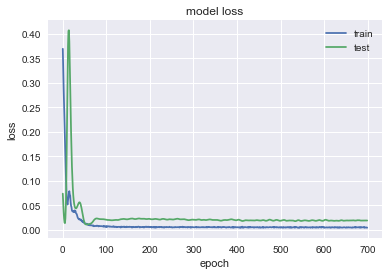

(21, 1, 10)
              IBM
MSE       196.382
MAE       12.5436
R2       -1.10307
MAPE (%)  8.99906


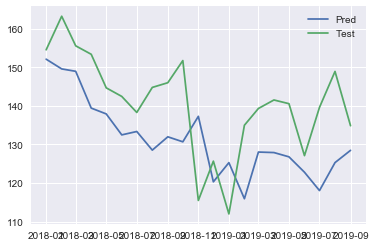

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1221 - val_loss: 0.2214
Epoch 2/700
0s - loss: 0.0973 - val_loss: 0.1762
Epoch 3/700
0s - loss: 0.0771 - val_loss: 0.1347
Epoch 4/700
0s - loss: 0.0600 - val_loss: 0.0963
Epoch 5/700
0s - loss: 0.0454 - val_loss: 0.0627
Epoch 6/700
0s - loss: 0.0336 - val_loss: 0.0367
Epoch 7/700
0s - loss: 0.0266 - val_loss: 0.0215
Epoch 8/700
0s - loss: 0.0256 - val_loss: 0.0171
Epoch 9/700
0s - loss: 0.0273 - val_loss: 0.0195
Epoch 10/700
0s - loss: 0.0305 - val_loss: 0.0230
Epoch 11/700
0s - loss: 0.0338 - val_loss: 0.0243
Epoch 12/700
0s - loss: 0.0335 - val_loss: 0.0230
Epoch 13/700
0s - loss: 0.0300 - val_loss: 0.0204
Epoch 14/700
0s - loss: 0.0276 - val_loss: 0.0180
Epoch 15/700
0s - loss: 0.0234 - val_loss: 0.0169
Epoch 16/700
0s - loss: 0.0214 - val_loss: 0.0170
Epoch 17/700
0s - loss: 0.0191 - val_loss: 0.0179
Epoch 18/700
0s - loss: 0.0198 - val_loss: 0.0193
Epoch 19/700
0s - loss: 0.0208 - val_loss: 0.

0s - loss: 0.0026 - val_loss: 0.0461
Epoch 169/700
0s - loss: 0.0025 - val_loss: 0.0466
Epoch 170/700
0s - loss: 0.0027 - val_loss: 0.0472
Epoch 171/700
0s - loss: 0.0028 - val_loss: 0.0474
Epoch 172/700
0s - loss: 0.0027 - val_loss: 0.0475
Epoch 173/700
0s - loss: 0.0029 - val_loss: 0.0473
Epoch 174/700
0s - loss: 0.0028 - val_loss: 0.0463
Epoch 175/700
0s - loss: 0.0029 - val_loss: 0.0459
Epoch 176/700
0s - loss: 0.0027 - val_loss: 0.0456
Epoch 177/700
0s - loss: 0.0023 - val_loss: 0.0464
Epoch 178/700
0s - loss: 0.0025 - val_loss: 0.0476
Epoch 179/700
0s - loss: 0.0026 - val_loss: 0.0483
Epoch 180/700
0s - loss: 0.0032 - val_loss: 0.0486
Epoch 181/700
0s - loss: 0.0027 - val_loss: 0.0482
Epoch 182/700
0s - loss: 0.0026 - val_loss: 0.0469
Epoch 183/700
0s - loss: 0.0025 - val_loss: 0.0455
Epoch 184/700
0s - loss: 0.0025 - val_loss: 0.0446
Epoch 185/700
0s - loss: 0.0027 - val_loss: 0.0436
Epoch 186/700
0s - loss: 0.0031 - val_loss: 0.0426
Epoch 187/700
0s - loss: 0.0027 - val_loss: 0

0s - loss: 0.0026 - val_loss: 0.0374
Epoch 332/700
0s - loss: 0.0027 - val_loss: 0.0387
Epoch 333/700
0s - loss: 0.0026 - val_loss: 0.0397
Epoch 334/700
0s - loss: 0.0023 - val_loss: 0.0394
Epoch 335/700
0s - loss: 0.0027 - val_loss: 0.0382
Epoch 336/700
0s - loss: 0.0027 - val_loss: 0.0363
Epoch 337/700
0s - loss: 0.0025 - val_loss: 0.0346
Epoch 338/700
0s - loss: 0.0024 - val_loss: 0.0341
Epoch 339/700
0s - loss: 0.0026 - val_loss: 0.0343
Epoch 340/700
0s - loss: 0.0025 - val_loss: 0.0350
Epoch 341/700
0s - loss: 0.0024 - val_loss: 0.0362
Epoch 342/700
0s - loss: 0.0026 - val_loss: 0.0377
Epoch 343/700
0s - loss: 0.0026 - val_loss: 0.0386
Epoch 344/700
0s - loss: 0.0030 - val_loss: 0.0380
Epoch 345/700
0s - loss: 0.0026 - val_loss: 0.0373
Epoch 346/700
0s - loss: 0.0027 - val_loss: 0.0359
Epoch 347/700
0s - loss: 0.0024 - val_loss: 0.0343
Epoch 348/700
0s - loss: 0.0026 - val_loss: 0.0339
Epoch 349/700
0s - loss: 0.0027 - val_loss: 0.0342
Epoch 350/700
0s - loss: 0.0023 - val_loss: 0

0s - loss: 0.0022 - val_loss: 0.0352
Epoch 495/700
0s - loss: 0.0022 - val_loss: 0.0351
Epoch 496/700
0s - loss: 0.0026 - val_loss: 0.0346
Epoch 497/700
0s - loss: 0.0022 - val_loss: 0.0340
Epoch 498/700
0s - loss: 0.0022 - val_loss: 0.0336
Epoch 499/700
0s - loss: 0.0022 - val_loss: 0.0332
Epoch 500/700
0s - loss: 0.0025 - val_loss: 0.0330
Epoch 501/700
0s - loss: 0.0027 - val_loss: 0.0328
Epoch 502/700
0s - loss: 0.0024 - val_loss: 0.0333
Epoch 503/700
0s - loss: 0.0025 - val_loss: 0.0334
Epoch 504/700
0s - loss: 0.0023 - val_loss: 0.0338
Epoch 505/700
0s - loss: 0.0025 - val_loss: 0.0338
Epoch 506/700
0s - loss: 0.0024 - val_loss: 0.0339
Epoch 507/700
0s - loss: 0.0025 - val_loss: 0.0333
Epoch 508/700
0s - loss: 0.0023 - val_loss: 0.0328
Epoch 509/700
0s - loss: 0.0021 - val_loss: 0.0326
Epoch 510/700
0s - loss: 0.0027 - val_loss: 0.0323
Epoch 511/700
0s - loss: 0.0024 - val_loss: 0.0324
Epoch 512/700
0s - loss: 0.0023 - val_loss: 0.0335
Epoch 513/700
0s - loss: 0.0024 - val_loss: 0

0s - loss: 0.0022 - val_loss: 0.0320
Epoch 661/700
0s - loss: 0.0021 - val_loss: 0.0329
Epoch 662/700
0s - loss: 0.0026 - val_loss: 0.0341
Epoch 663/700
0s - loss: 0.0023 - val_loss: 0.0349
Epoch 664/700
0s - loss: 0.0026 - val_loss: 0.0347
Epoch 665/700
0s - loss: 0.0021 - val_loss: 0.0338
Epoch 666/700
0s - loss: 0.0026 - val_loss: 0.0324
Epoch 667/700
0s - loss: 0.0026 - val_loss: 0.0325
Epoch 668/700
0s - loss: 0.0024 - val_loss: 0.0329
Epoch 669/700
0s - loss: 0.0024 - val_loss: 0.0333
Epoch 670/700
0s - loss: 0.0025 - val_loss: 0.0335
Epoch 671/700
0s - loss: 0.0019 - val_loss: 0.0332
Epoch 672/700
0s - loss: 0.0024 - val_loss: 0.0336
Epoch 673/700
0s - loss: 0.0025 - val_loss: 0.0348
Epoch 674/700
0s - loss: 0.0027 - val_loss: 0.0354
Epoch 675/700
0s - loss: 0.0026 - val_loss: 0.0346
Epoch 676/700
0s - loss: 0.0022 - val_loss: 0.0339
Epoch 677/700
0s - loss: 0.0022 - val_loss: 0.0324
Epoch 678/700
0s - loss: 0.0021 - val_loss: 0.0315
Epoch 679/700
0s - loss: 0.0024 - val_loss: 0

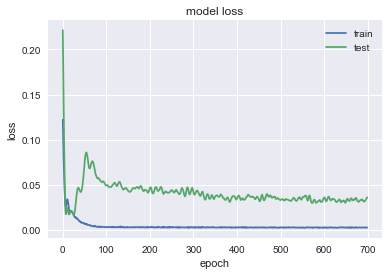

(21, 1, 10)
              ALB
MSE       404.286
MAE       17.5213
R2       -1.05998
MAPE (%)  21.3524


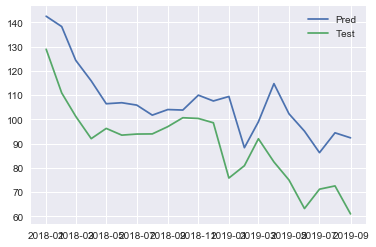

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1500 - val_loss: 0.6441
Epoch 2/700
0s - loss: 0.1231 - val_loss: 0.5724
Epoch 3/700
0s - loss: 0.1010 - val_loss: 0.5022
Epoch 4/700
0s - loss: 0.0807 - val_loss: 0.4304
Epoch 5/700
0s - loss: 0.0618 - val_loss: 0.3567
Epoch 6/700
0s - loss: 0.0437 - val_loss: 0.2824
Epoch 7/700
0s - loss: 0.0301 - val_loss: 0.2109
Epoch 8/700
0s - loss: 0.0192 - val_loss: 0.1478
Epoch 9/700
0s - loss: 0.0151 - val_loss: 0.0987
Epoch 10/700
0s - loss: 0.0155 - val_loss: 0.0660
Epoch 11/700
0s - loss: 0.0208 - val_loss: 0.0485
Epoch 12/700
0s - loss: 0.0262 - val_loss: 0.0416
Epoch 13/700
0s - loss: 0.0277 - val_loss: 0.0412
Epoch 14/700
0s - loss: 0.0280 - val_loss: 0.0458
Epoch 15/700
0s - loss: 0.0252 - val_loss: 0.0549
Epoch 16/700
0s - loss: 0.0203 - val_loss: 0.0676
Epoch 17/700
0s - loss: 0.0161 - val_loss: 0.0827
Epoch 18/700
0s - loss: 0.0134 - val_loss: 0.0986
Epoch 19/700
0s - loss: 0.0122 - val_loss: 0

0s - loss: 0.0035 - val_loss: 0.0144
Epoch 169/700
0s - loss: 0.0033 - val_loss: 0.0144
Epoch 170/700
0s - loss: 0.0035 - val_loss: 0.0144
Epoch 171/700
0s - loss: 0.0034 - val_loss: 0.0145
Epoch 172/700
0s - loss: 0.0033 - val_loss: 0.0145
Epoch 173/700
0s - loss: 0.0037 - val_loss: 0.0146
Epoch 174/700
0s - loss: 0.0038 - val_loss: 0.0146
Epoch 175/700
0s - loss: 0.0034 - val_loss: 0.0147
Epoch 176/700
0s - loss: 0.0035 - val_loss: 0.0148
Epoch 177/700
0s - loss: 0.0033 - val_loss: 0.0149
Epoch 178/700
0s - loss: 0.0031 - val_loss: 0.0150
Epoch 179/700
0s - loss: 0.0035 - val_loss: 0.0150
Epoch 180/700
0s - loss: 0.0037 - val_loss: 0.0150
Epoch 181/700
0s - loss: 0.0037 - val_loss: 0.0149
Epoch 182/700
0s - loss: 0.0033 - val_loss: 0.0148
Epoch 183/700
0s - loss: 0.0037 - val_loss: 0.0147
Epoch 184/700
0s - loss: 0.0030 - val_loss: 0.0147
Epoch 185/700
0s - loss: 0.0032 - val_loss: 0.0146
Epoch 186/700
0s - loss: 0.0034 - val_loss: 0.0146
Epoch 187/700
0s - loss: 0.0032 - val_loss: 0

0s - loss: 0.0026 - val_loss: 0.0166
Epoch 330/700
0s - loss: 0.0030 - val_loss: 0.0167
Epoch 331/700
0s - loss: 0.0033 - val_loss: 0.0165
Epoch 332/700
0s - loss: 0.0034 - val_loss: 0.0167
Epoch 333/700
0s - loss: 0.0033 - val_loss: 0.0170
Epoch 334/700
0s - loss: 0.0035 - val_loss: 0.0173
Epoch 335/700
0s - loss: 0.0027 - val_loss: 0.0174
Epoch 336/700
0s - loss: 0.0029 - val_loss: 0.0176
Epoch 337/700
0s - loss: 0.0030 - val_loss: 0.0178
Epoch 338/700
0s - loss: 0.0029 - val_loss: 0.0178
Epoch 339/700
0s - loss: 0.0029 - val_loss: 0.0177
Epoch 340/700
0s - loss: 0.0031 - val_loss: 0.0176
Epoch 341/700
0s - loss: 0.0032 - val_loss: 0.0175
Epoch 342/700
0s - loss: 0.0034 - val_loss: 0.0175
Epoch 343/700
0s - loss: 0.0029 - val_loss: 0.0173
Epoch 344/700
0s - loss: 0.0035 - val_loss: 0.0173
Epoch 345/700
0s - loss: 0.0030 - val_loss: 0.0172
Epoch 346/700
0s - loss: 0.0032 - val_loss: 0.0172
Epoch 347/700
0s - loss: 0.0030 - val_loss: 0.0170
Epoch 348/700
0s - loss: 0.0030 - val_loss: 0

0s - loss: 0.0030 - val_loss: 0.0154
Epoch 491/700
0s - loss: 0.0030 - val_loss: 0.0155
Epoch 492/700
0s - loss: 0.0030 - val_loss: 0.0155
Epoch 493/700
0s - loss: 0.0031 - val_loss: 0.0155
Epoch 494/700
0s - loss: 0.0030 - val_loss: 0.0155
Epoch 495/700
0s - loss: 0.0028 - val_loss: 0.0155
Epoch 496/700
0s - loss: 0.0027 - val_loss: 0.0154
Epoch 497/700
0s - loss: 0.0029 - val_loss: 0.0153
Epoch 498/700
0s - loss: 0.0028 - val_loss: 0.0154
Epoch 499/700
0s - loss: 0.0030 - val_loss: 0.0153
Epoch 500/700
0s - loss: 0.0030 - val_loss: 0.0151
Epoch 501/700
0s - loss: 0.0028 - val_loss: 0.0150
Epoch 502/700
0s - loss: 0.0028 - val_loss: 0.0151
Epoch 503/700
0s - loss: 0.0031 - val_loss: 0.0151
Epoch 504/700
0s - loss: 0.0027 - val_loss: 0.0151
Epoch 505/700
0s - loss: 0.0030 - val_loss: 0.0154
Epoch 506/700
0s - loss: 0.0027 - val_loss: 0.0154
Epoch 507/700
0s - loss: 0.0030 - val_loss: 0.0153
Epoch 508/700
0s - loss: 0.0028 - val_loss: 0.0151
Epoch 509/700
0s - loss: 0.0031 - val_loss: 0

0s - loss: 0.0027 - val_loss: 0.0157
Epoch 652/700
0s - loss: 0.0028 - val_loss: 0.0155
Epoch 653/700
0s - loss: 0.0027 - val_loss: 0.0151
Epoch 654/700
0s - loss: 0.0029 - val_loss: 0.0147
Epoch 655/700
0s - loss: 0.0029 - val_loss: 0.0145
Epoch 656/700
0s - loss: 0.0027 - val_loss: 0.0145
Epoch 657/700
0s - loss: 0.0029 - val_loss: 0.0146
Epoch 658/700
0s - loss: 0.0026 - val_loss: 0.0145
Epoch 659/700
0s - loss: 0.0030 - val_loss: 0.0147
Epoch 660/700
0s - loss: 0.0029 - val_loss: 0.0151
Epoch 661/700
0s - loss: 0.0028 - val_loss: 0.0154
Epoch 662/700
0s - loss: 0.0032 - val_loss: 0.0155
Epoch 663/700
0s - loss: 0.0031 - val_loss: 0.0155
Epoch 664/700
0s - loss: 0.0028 - val_loss: 0.0152
Epoch 665/700
0s - loss: 0.0028 - val_loss: 0.0146
Epoch 666/700
0s - loss: 0.0028 - val_loss: 0.0143
Epoch 667/700
0s - loss: 0.0027 - val_loss: 0.0142
Epoch 668/700
0s - loss: 0.0027 - val_loss: 0.0144
Epoch 669/700
0s - loss: 0.0027 - val_loss: 0.0148
Epoch 670/700
0s - loss: 0.0028 - val_loss: 0

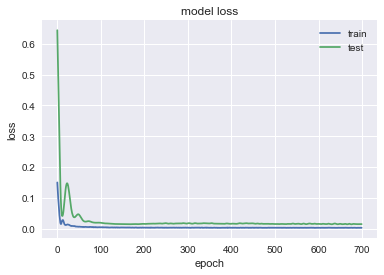

(21, 1, 10)
             CBRE
MSE       24.8758
MAE       4.15481
R2       -1.00136
MAPE (%)  9.04267


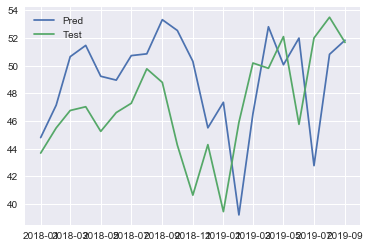

In [352]:
pred_multi_3 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_3[comp] = nn_forec_multi(df,comp,n_train_time_=test.shape[0],first_layer = 256,second_layer=128).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3052 - val_loss: 0.1945
Epoch 2/700
0s - loss: 0.2928 - val_loss: 0.1832
Epoch 3/700
0s - loss: 0.2824 - val_loss: 0.1725
Epoch 4/700
0s - loss: 0.2717 - val_loss: 0.1621
Epoch 5/700
0s - loss: 0.2607 - val_loss: 0.1522
Epoch 6/700
0s - loss: 0.2497 - val_loss: 0.1426
Epoch 7/700
0s - loss: 0.2407 - val_loss: 0.1332
Epoch 8/700
0s - loss: 0.2266 - val_loss: 0.1242
Epoch 9/700
0s - loss: 0.2196 - val_loss: 0.1154
Epoch 10/700
0s - loss: 0.2097 - val_loss: 0.1068
Epoch 11/700
0s - loss: 0.2006 - val_loss: 0.0983
Epoch 12/700
0s - loss: 0.1915 - val_loss: 0.0902
Epoch 13/700
0s - loss: 0.1818 - val_loss: 0.0822
Epoch 14/700
0s - loss: 0.1717 - val_loss: 0.0746
Epoch 15/700
0s - loss: 0.1636 - val_loss: 0.0671
Epoch 16/700
0s - loss: 0.1510 - val_loss: 0.0600
Epoch 17/700
0s - loss: 0.1463 - val_loss: 0.0533
Epoch 18/700
0s - loss: 0.1366 - val_loss: 0.0469
Epoch 19/700
0s - loss: 0.1303 - val_loss: 0.04

0s - loss: 0.0143 - val_loss: 0.0681
Epoch 176/700
0s - loss: 0.0164 - val_loss: 0.0674
Epoch 177/700
0s - loss: 0.0169 - val_loss: 0.0664
Epoch 178/700
0s - loss: 0.0137 - val_loss: 0.0653
Epoch 179/700
0s - loss: 0.0177 - val_loss: 0.0643
Epoch 180/700
0s - loss: 0.0172 - val_loss: 0.0636
Epoch 181/700
0s - loss: 0.0121 - val_loss: 0.0628
Epoch 182/700
0s - loss: 0.0158 - val_loss: 0.0620
Epoch 183/700
0s - loss: 0.0192 - val_loss: 0.0610
Epoch 184/700
0s - loss: 0.0146 - val_loss: 0.0600
Epoch 185/700
0s - loss: 0.0131 - val_loss: 0.0590
Epoch 186/700
0s - loss: 0.0175 - val_loss: 0.0580
Epoch 187/700
0s - loss: 0.0161 - val_loss: 0.0568
Epoch 188/700
0s - loss: 0.0151 - val_loss: 0.0559
Epoch 189/700
0s - loss: 0.0138 - val_loss: 0.0550
Epoch 190/700
0s - loss: 0.0156 - val_loss: 0.0540
Epoch 191/700
0s - loss: 0.0137 - val_loss: 0.0529
Epoch 192/700
0s - loss: 0.0152 - val_loss: 0.0519
Epoch 193/700
0s - loss: 0.0177 - val_loss: 0.0510
Epoch 194/700
0s - loss: 0.0158 - val_loss: 0

0s - loss: 0.0105 - val_loss: 0.0072
Epoch 349/700
0s - loss: 0.0119 - val_loss: 0.0072
Epoch 350/700
0s - loss: 0.0110 - val_loss: 0.0072
Epoch 351/700
0s - loss: 0.0115 - val_loss: 0.0072
Epoch 352/700
0s - loss: 0.0093 - val_loss: 0.0072
Epoch 353/700
0s - loss: 0.0120 - val_loss: 0.0072
Epoch 354/700
0s - loss: 0.0087 - val_loss: 0.0072
Epoch 355/700
0s - loss: 0.0094 - val_loss: 0.0072
Epoch 356/700
0s - loss: 0.0127 - val_loss: 0.0072
Epoch 357/700
0s - loss: 0.0091 - val_loss: 0.0072
Epoch 358/700
0s - loss: 0.0100 - val_loss: 0.0072
Epoch 359/700
0s - loss: 0.0099 - val_loss: 0.0071
Epoch 360/700
0s - loss: 0.0102 - val_loss: 0.0071
Epoch 361/700
0s - loss: 0.0123 - val_loss: 0.0070
Epoch 362/700
0s - loss: 0.0088 - val_loss: 0.0070
Epoch 363/700
0s - loss: 0.0102 - val_loss: 0.0071
Epoch 364/700
0s - loss: 0.0111 - val_loss: 0.0071
Epoch 365/700
0s - loss: 0.0091 - val_loss: 0.0071
Epoch 366/700
0s - loss: 0.0076 - val_loss: 0.0071
Epoch 367/700
0s - loss: 0.0110 - val_loss: 0

0s - loss: 0.0107 - val_loss: 0.0103
Epoch 523/700
0s - loss: 0.0088 - val_loss: 0.0101
Epoch 524/700
0s - loss: 0.0083 - val_loss: 0.0100
Epoch 525/700
0s - loss: 0.0099 - val_loss: 0.0099
Epoch 526/700
0s - loss: 0.0098 - val_loss: 0.0099
Epoch 527/700
0s - loss: 0.0116 - val_loss: 0.0099
Epoch 528/700
0s - loss: 0.0100 - val_loss: 0.0099
Epoch 529/700
0s - loss: 0.0103 - val_loss: 0.0098
Epoch 530/700
0s - loss: 0.0110 - val_loss: 0.0098
Epoch 531/700
0s - loss: 0.0091 - val_loss: 0.0098
Epoch 532/700
0s - loss: 0.0109 - val_loss: 0.0099
Epoch 533/700
0s - loss: 0.0105 - val_loss: 0.0099
Epoch 534/700
0s - loss: 0.0107 - val_loss: 0.0100
Epoch 535/700
0s - loss: 0.0100 - val_loss: 0.0100
Epoch 536/700
0s - loss: 0.0084 - val_loss: 0.0101
Epoch 537/700
0s - loss: 0.0088 - val_loss: 0.0102
Epoch 538/700
0s - loss: 0.0082 - val_loss: 0.0104
Epoch 539/700
0s - loss: 0.0114 - val_loss: 0.0106
Epoch 540/700
0s - loss: 0.0103 - val_loss: 0.0108
Epoch 541/700
0s - loss: 0.0089 - val_loss: 0

0s - loss: 0.0083 - val_loss: 0.0109
Epoch 698/700
0s - loss: 0.0092 - val_loss: 0.0109
Epoch 699/700
0s - loss: 0.0087 - val_loss: 0.0109
Epoch 700/700
0s - loss: 0.0097 - val_loss: 0.0108


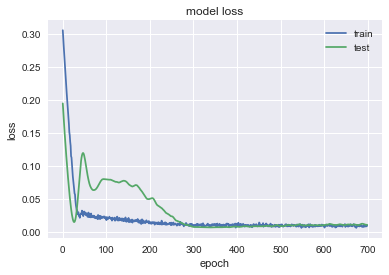

(21, 1, 10)
                 T
MSE        3.90766
MAE        1.62484
R2        0.180804
MAPE (%)   4.88967


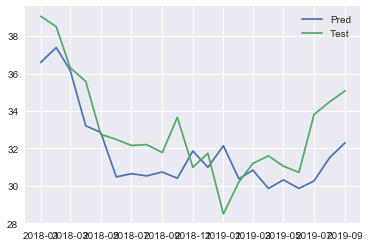

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1270 - val_loss: 0.7301
Epoch 2/700
0s - loss: 0.1218 - val_loss: 0.7141
Epoch 3/700
0s - loss: 0.1161 - val_loss: 0.6988
Epoch 4/700
0s - loss: 0.1115 - val_loss: 0.6839
Epoch 5/700
0s - loss: 0.1078 - val_loss: 0.6692
Epoch 6/700
0s - loss: 0.1031 - val_loss: 0.6547
Epoch 7/700
0s - loss: 0.0985 - val_loss: 0.6404
Epoch 8/700
0s - loss: 0.0954 - val_loss: 0.6261
Epoch 9/700
0s - loss: 0.0905 - val_loss: 0.6118
Epoch 10/700
0s - loss: 0.0864 - val_loss: 0.5974
Epoch 11/700
0s - loss: 0.0828 - val_loss: 0.5830
Epoch 12/700
0s - loss: 0.0782 - val_loss: 0.5684
Epoch 13/700
0s - loss: 0.0757 - val_loss: 0.5536
Epoch 14/700
0s - loss: 0.0701 - val_loss: 0.5387
Epoch 15/700
0s - loss: 0.0687 - val_loss: 0.5235
Epoch 16/700
0s - loss: 0.0653 - val_loss: 0.5082
Epoch 17/700
0s - loss: 0.0608 - val_loss: 0.4926
Epoch 18/700
0s - loss: 0.0583 - val_loss: 0.4769
Epoch 19/700
0s - loss: 0.0550 - val_loss: 0.

0s - loss: 0.0070 - val_loss: 0.0156
Epoch 175/700
0s - loss: 0.0074 - val_loss: 0.0154
Epoch 176/700
0s - loss: 0.0077 - val_loss: 0.0152
Epoch 177/700
0s - loss: 0.0073 - val_loss: 0.0151
Epoch 178/700
0s - loss: 0.0089 - val_loss: 0.0151
Epoch 179/700
0s - loss: 0.0087 - val_loss: 0.0149
Epoch 180/700
0s - loss: 0.0074 - val_loss: 0.0148
Epoch 181/700
0s - loss: 0.0066 - val_loss: 0.0147
Epoch 182/700
0s - loss: 0.0060 - val_loss: 0.0144
Epoch 183/700
0s - loss: 0.0079 - val_loss: 0.0142
Epoch 184/700
0s - loss: 0.0070 - val_loss: 0.0138
Epoch 185/700
0s - loss: 0.0081 - val_loss: 0.0136
Epoch 186/700
0s - loss: 0.0076 - val_loss: 0.0133
Epoch 187/700
0s - loss: 0.0071 - val_loss: 0.0130
Epoch 188/700
0s - loss: 0.0066 - val_loss: 0.0128
Epoch 189/700
0s - loss: 0.0064 - val_loss: 0.0127
Epoch 190/700
0s - loss: 0.0069 - val_loss: 0.0126
Epoch 191/700
0s - loss: 0.0069 - val_loss: 0.0124
Epoch 192/700
0s - loss: 0.0065 - val_loss: 0.0122
Epoch 193/700
0s - loss: 0.0071 - val_loss: 0

0s - loss: 0.0047 - val_loss: 0.0100
Epoch 342/700
0s - loss: 0.0046 - val_loss: 0.0101
Epoch 343/700
0s - loss: 0.0037 - val_loss: 0.0101
Epoch 344/700
0s - loss: 0.0050 - val_loss: 0.0102
Epoch 345/700
0s - loss: 0.0047 - val_loss: 0.0102
Epoch 346/700
0s - loss: 0.0056 - val_loss: 0.0103
Epoch 347/700
0s - loss: 0.0052 - val_loss: 0.0103
Epoch 348/700
0s - loss: 0.0052 - val_loss: 0.0104
Epoch 349/700
0s - loss: 0.0048 - val_loss: 0.0105
Epoch 350/700
0s - loss: 0.0044 - val_loss: 0.0106
Epoch 351/700
0s - loss: 0.0048 - val_loss: 0.0106
Epoch 352/700
0s - loss: 0.0051 - val_loss: 0.0108
Epoch 353/700
0s - loss: 0.0045 - val_loss: 0.0109
Epoch 354/700
0s - loss: 0.0048 - val_loss: 0.0111
Epoch 355/700
0s - loss: 0.0044 - val_loss: 0.0112
Epoch 356/700
0s - loss: 0.0052 - val_loss: 0.0112
Epoch 357/700
0s - loss: 0.0042 - val_loss: 0.0112
Epoch 358/700
0s - loss: 0.0045 - val_loss: 0.0112
Epoch 359/700
0s - loss: 0.0048 - val_loss: 0.0111
Epoch 360/700
0s - loss: 0.0048 - val_loss: 0

0s - loss: 0.0043 - val_loss: 0.0147
Epoch 516/700
0s - loss: 0.0049 - val_loss: 0.0147
Epoch 517/700
0s - loss: 0.0033 - val_loss: 0.0145
Epoch 518/700
0s - loss: 0.0038 - val_loss: 0.0145
Epoch 519/700
0s - loss: 0.0041 - val_loss: 0.0144
Epoch 520/700
0s - loss: 0.0031 - val_loss: 0.0143
Epoch 521/700
0s - loss: 0.0040 - val_loss: 0.0143
Epoch 522/700
0s - loss: 0.0042 - val_loss: 0.0142
Epoch 523/700
0s - loss: 0.0035 - val_loss: 0.0141
Epoch 524/700
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 525/700
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 526/700
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 527/700
0s - loss: 0.0043 - val_loss: 0.0138
Epoch 528/700
0s - loss: 0.0042 - val_loss: 0.0138
Epoch 529/700
0s - loss: 0.0036 - val_loss: 0.0140
Epoch 530/700
0s - loss: 0.0045 - val_loss: 0.0141
Epoch 531/700
0s - loss: 0.0035 - val_loss: 0.0142
Epoch 532/700
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 533/700
0s - loss: 0.0040 - val_loss: 0.0142
Epoch 534/700
0s - loss: 0.0037 - val_loss: 0

0s - loss: 0.0037 - val_loss: 0.0156
Epoch 692/700
0s - loss: 0.0035 - val_loss: 0.0156
Epoch 693/700
0s - loss: 0.0031 - val_loss: 0.0156
Epoch 694/700
0s - loss: 0.0034 - val_loss: 0.0158
Epoch 695/700
0s - loss: 0.0039 - val_loss: 0.0159
Epoch 696/700
0s - loss: 0.0035 - val_loss: 0.0161
Epoch 697/700
0s - loss: 0.0032 - val_loss: 0.0164
Epoch 698/700
0s - loss: 0.0039 - val_loss: 0.0167
Epoch 699/700
0s - loss: 0.0035 - val_loss: 0.0170
Epoch 700/700
0s - loss: 0.0038 - val_loss: 0.0172


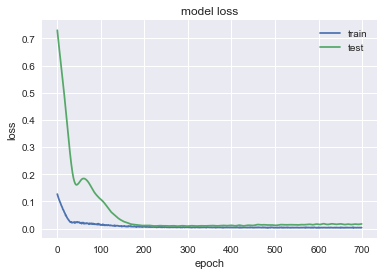

(21, 1, 10)
              BBY
MSE       78.1316
MAE       7.40564
R2       -2.03564
MAPE (%)   10.402


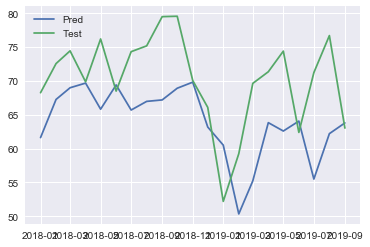

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.2413 - val_loss: 0.5484
Epoch 2/700
0s - loss: 0.2311 - val_loss: 0.5313
Epoch 3/700
0s - loss: 0.2220 - val_loss: 0.5150
Epoch 4/700
0s - loss: 0.2122 - val_loss: 0.4994
Epoch 5/700
0s - loss: 0.2056 - val_loss: 0.4843
Epoch 6/700
0s - loss: 0.1976 - val_loss: 0.4696
Epoch 7/700
0s - loss: 0.1893 - val_loss: 0.4552
Epoch 8/700
0s - loss: 0.1813 - val_loss: 0.4410
Epoch 9/700
0s - loss: 0.1740 - val_loss: 0.4269
Epoch 10/700
0s - loss: 0.1662 - val_loss: 0.4129
Epoch 11/700
0s - loss: 0.1583 - val_loss: 0.3990
Epoch 12/700
0s - loss: 0.1520 - val_loss: 0.3851
Epoch 13/700
0s - loss: 0.1441 - val_loss: 0.3712
Epoch 14/700
0s - loss: 0.1395 - val_loss: 0.3573
Epoch 15/700
0s - loss: 0.1311 - val_loss: 0.3433
Epoch 16/700
0s - loss: 0.1225 - val_loss: 0.3292
Epoch 17/700
0s - loss: 0.1184 - val_loss: 0.3151
Epoch 18/700
0s - loss: 0.1126 - val_loss: 0.3008
Epoch 19/700
0s - loss: 0.1055 - val_loss: 0.2

0s - loss: 0.0075 - val_loss: 0.0242
Epoch 187/700
0s - loss: 0.0081 - val_loss: 0.0242
Epoch 188/700
0s - loss: 0.0073 - val_loss: 0.0241
Epoch 189/700
0s - loss: 0.0073 - val_loss: 0.0241
Epoch 190/700
0s - loss: 0.0076 - val_loss: 0.0240
Epoch 191/700
0s - loss: 0.0090 - val_loss: 0.0240
Epoch 192/700
0s - loss: 0.0082 - val_loss: 0.0239
Epoch 193/700
0s - loss: 0.0080 - val_loss: 0.0238
Epoch 194/700
0s - loss: 0.0078 - val_loss: 0.0238
Epoch 195/700
0s - loss: 0.0088 - val_loss: 0.0237
Epoch 196/700
0s - loss: 0.0085 - val_loss: 0.0236
Epoch 197/700
0s - loss: 0.0081 - val_loss: 0.0235
Epoch 198/700
0s - loss: 0.0085 - val_loss: 0.0233
Epoch 199/700
0s - loss: 0.0079 - val_loss: 0.0232
Epoch 200/700
0s - loss: 0.0077 - val_loss: 0.0231
Epoch 201/700
0s - loss: 0.0087 - val_loss: 0.0230
Epoch 202/700
0s - loss: 0.0095 - val_loss: 0.0230
Epoch 203/700
0s - loss: 0.0082 - val_loss: 0.0229
Epoch 204/700
0s - loss: 0.0082 - val_loss: 0.0229
Epoch 205/700
0s - loss: 0.0079 - val_loss: 0

0s - loss: 0.0065 - val_loss: 0.0247
Epoch 371/700
0s - loss: 0.0069 - val_loss: 0.0249
Epoch 372/700
0s - loss: 0.0061 - val_loss: 0.0251
Epoch 373/700
0s - loss: 0.0065 - val_loss: 0.0254
Epoch 374/700
0s - loss: 0.0051 - val_loss: 0.0257
Epoch 375/700
0s - loss: 0.0074 - val_loss: 0.0260
Epoch 376/700
0s - loss: 0.0067 - val_loss: 0.0263
Epoch 377/700
0s - loss: 0.0064 - val_loss: 0.0266
Epoch 378/700
0s - loss: 0.0057 - val_loss: 0.0268
Epoch 379/700
0s - loss: 0.0047 - val_loss: 0.0270
Epoch 380/700
0s - loss: 0.0071 - val_loss: 0.0270
Epoch 381/700
0s - loss: 0.0074 - val_loss: 0.0271
Epoch 382/700
0s - loss: 0.0051 - val_loss: 0.0271
Epoch 383/700
0s - loss: 0.0055 - val_loss: 0.0272
Epoch 384/700
0s - loss: 0.0066 - val_loss: 0.0271
Epoch 385/700
0s - loss: 0.0059 - val_loss: 0.0270
Epoch 386/700
0s - loss: 0.0064 - val_loss: 0.0270
Epoch 387/700
0s - loss: 0.0072 - val_loss: 0.0270
Epoch 388/700
0s - loss: 0.0061 - val_loss: 0.0270
Epoch 389/700
0s - loss: 0.0077 - val_loss: 0

0s - loss: 0.0045 - val_loss: 0.0305
Epoch 556/700
0s - loss: 0.0044 - val_loss: 0.0307
Epoch 557/700
0s - loss: 0.0044 - val_loss: 0.0309
Epoch 558/700
0s - loss: 0.0052 - val_loss: 0.0311
Epoch 559/700
0s - loss: 0.0053 - val_loss: 0.0311
Epoch 560/700
0s - loss: 0.0047 - val_loss: 0.0312
Epoch 561/700
0s - loss: 0.0055 - val_loss: 0.0311
Epoch 562/700
0s - loss: 0.0055 - val_loss: 0.0310
Epoch 563/700
0s - loss: 0.0039 - val_loss: 0.0308
Epoch 564/700
0s - loss: 0.0044 - val_loss: 0.0305
Epoch 565/700
0s - loss: 0.0048 - val_loss: 0.0303
Epoch 566/700
0s - loss: 0.0055 - val_loss: 0.0302
Epoch 567/700
0s - loss: 0.0056 - val_loss: 0.0303
Epoch 568/700
0s - loss: 0.0047 - val_loss: 0.0302
Epoch 569/700
0s - loss: 0.0050 - val_loss: 0.0301
Epoch 570/700
0s - loss: 0.0050 - val_loss: 0.0300
Epoch 571/700
0s - loss: 0.0062 - val_loss: 0.0299
Epoch 572/700
0s - loss: 0.0042 - val_loss: 0.0300
Epoch 573/700
0s - loss: 0.0044 - val_loss: 0.0300
Epoch 574/700
0s - loss: 0.0052 - val_loss: 0

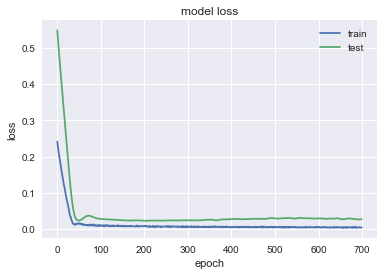

(21, 1, 10)
               KO
MSE       24.5385
MAE       3.87441
R2       -8.60569
MAPE (%)  7.88916


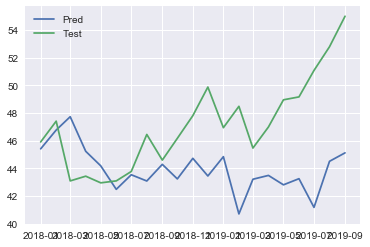

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3193 - val_loss: 0.0384
Epoch 2/700
0s - loss: 0.3099 - val_loss: 0.0346
Epoch 3/700
0s - loss: 0.3002 - val_loss: 0.0311
Epoch 4/700
0s - loss: 0.2912 - val_loss: 0.0278
Epoch 5/700
0s - loss: 0.2806 - val_loss: 0.0248
Epoch 6/700
0s - loss: 0.2725 - val_loss: 0.0219
Epoch 7/700
0s - loss: 0.2651 - val_loss: 0.0193
Epoch 8/700
0s - loss: 0.2550 - val_loss: 0.0170
Epoch 9/700
0s - loss: 0.2454 - val_loss: 0.0148
Epoch 10/700
0s - loss: 0.2380 - val_loss: 0.0129
Epoch 11/700
0s - loss: 0.2273 - val_loss: 0.0113
Epoch 12/700
0s - loss: 0.2201 - val_loss: 0.0100
Epoch 13/700
0s - loss: 0.2111 - val_loss: 0.0089
Epoch 14/700
0s - loss: 0.2039 - val_loss: 0.0083
Epoch 15/700
0s - loss: 0.1935 - val_loss: 0.0079
Epoch 16/700
0s - loss: 0.1901 - val_loss: 0.0080
Epoch 17/700
0s - loss: 0.1775 - val_loss: 0.0086
Epoch 18/700
0s - loss: 0.1735 - val_loss: 0.0096
Epoch 19/700
0s - loss: 0.1609 - val_loss: 0.

0s - loss: 0.0099 - val_loss: 0.0141
Epoch 185/700
0s - loss: 0.0112 - val_loss: 0.0141
Epoch 186/700
0s - loss: 0.0110 - val_loss: 0.0141
Epoch 187/700
0s - loss: 0.0115 - val_loss: 0.0141
Epoch 188/700
0s - loss: 0.0116 - val_loss: 0.0141
Epoch 189/700
0s - loss: 0.0106 - val_loss: 0.0141
Epoch 190/700
0s - loss: 0.0095 - val_loss: 0.0140
Epoch 191/700
0s - loss: 0.0106 - val_loss: 0.0138
Epoch 192/700
0s - loss: 0.0102 - val_loss: 0.0136
Epoch 193/700
0s - loss: 0.0120 - val_loss: 0.0132
Epoch 194/700
0s - loss: 0.0132 - val_loss: 0.0129
Epoch 195/700
0s - loss: 0.0126 - val_loss: 0.0126
Epoch 196/700
0s - loss: 0.0090 - val_loss: 0.0123
Epoch 197/700
0s - loss: 0.0116 - val_loss: 0.0121
Epoch 198/700
0s - loss: 0.0104 - val_loss: 0.0118
Epoch 199/700
0s - loss: 0.0128 - val_loss: 0.0117
Epoch 200/700
0s - loss: 0.0108 - val_loss: 0.0115
Epoch 201/700
0s - loss: 0.0095 - val_loss: 0.0115
Epoch 202/700
0s - loss: 0.0110 - val_loss: 0.0115
Epoch 203/700
0s - loss: 0.0125 - val_loss: 0

0s - loss: 0.0104 - val_loss: 0.0051
Epoch 364/700
0s - loss: 0.0097 - val_loss: 0.0052
Epoch 365/700
0s - loss: 0.0100 - val_loss: 0.0052
Epoch 366/700
0s - loss: 0.0071 - val_loss: 0.0052
Epoch 367/700
0s - loss: 0.0098 - val_loss: 0.0052
Epoch 368/700
0s - loss: 0.0085 - val_loss: 0.0052
Epoch 369/700
0s - loss: 0.0076 - val_loss: 0.0053
Epoch 370/700
0s - loss: 0.0092 - val_loss: 0.0054
Epoch 371/700
0s - loss: 0.0084 - val_loss: 0.0054
Epoch 372/700
0s - loss: 0.0097 - val_loss: 0.0053
Epoch 373/700
0s - loss: 0.0093 - val_loss: 0.0053
Epoch 374/700
0s - loss: 0.0093 - val_loss: 0.0052
Epoch 375/700
0s - loss: 0.0088 - val_loss: 0.0051
Epoch 376/700
0s - loss: 0.0101 - val_loss: 0.0050
Epoch 377/700
0s - loss: 0.0093 - val_loss: 0.0050
Epoch 378/700
0s - loss: 0.0070 - val_loss: 0.0049
Epoch 379/700
0s - loss: 0.0083 - val_loss: 0.0049
Epoch 380/700
0s - loss: 0.0097 - val_loss: 0.0050
Epoch 381/700
0s - loss: 0.0088 - val_loss: 0.0050
Epoch 382/700
0s - loss: 0.0087 - val_loss: 0

0s - loss: 0.0101 - val_loss: 0.0037
Epoch 541/700
0s - loss: 0.0099 - val_loss: 0.0037
Epoch 542/700
0s - loss: 0.0083 - val_loss: 0.0038
Epoch 543/700
0s - loss: 0.0077 - val_loss: 0.0038
Epoch 544/700
0s - loss: 0.0089 - val_loss: 0.0038
Epoch 545/700
0s - loss: 0.0082 - val_loss: 0.0038
Epoch 546/700
0s - loss: 0.0094 - val_loss: 0.0039
Epoch 547/700
0s - loss: 0.0087 - val_loss: 0.0039
Epoch 548/700
0s - loss: 0.0088 - val_loss: 0.0039
Epoch 549/700
0s - loss: 0.0102 - val_loss: 0.0040
Epoch 550/700
0s - loss: 0.0101 - val_loss: 0.0040
Epoch 551/700
0s - loss: 0.0111 - val_loss: 0.0040
Epoch 552/700
0s - loss: 0.0104 - val_loss: 0.0040
Epoch 553/700
0s - loss: 0.0091 - val_loss: 0.0041
Epoch 554/700
0s - loss: 0.0103 - val_loss: 0.0041
Epoch 555/700
0s - loss: 0.0096 - val_loss: 0.0041
Epoch 556/700
0s - loss: 0.0075 - val_loss: 0.0041
Epoch 557/700
0s - loss: 0.0104 - val_loss: 0.0041
Epoch 558/700
0s - loss: 0.0075 - val_loss: 0.0040
Epoch 559/700
0s - loss: 0.0087 - val_loss: 0

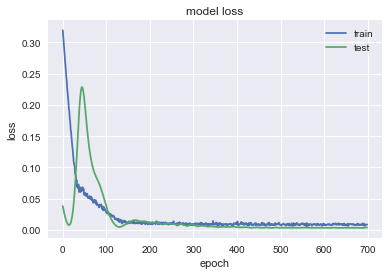

(21, 1, 10)
               FTI
MSE        7.76496
MAE        2.34597
R2       -0.550221
MAPE (%)   8.52523


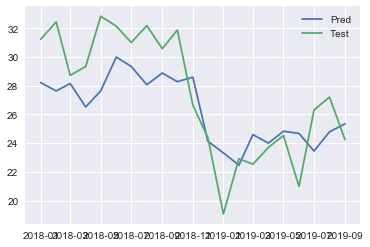

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1511 - val_loss: 0.5943
Epoch 2/700
0s - loss: 0.1433 - val_loss: 0.5760
Epoch 3/700
0s - loss: 0.1381 - val_loss: 0.5584
Epoch 4/700
0s - loss: 0.1306 - val_loss: 0.5412
Epoch 5/700
0s - loss: 0.1258 - val_loss: 0.5242
Epoch 6/700
0s - loss: 0.1192 - val_loss: 0.5076
Epoch 7/700
0s - loss: 0.1152 - val_loss: 0.4911
Epoch 8/700
0s - loss: 0.1093 - val_loss: 0.4748
Epoch 9/700
0s - loss: 0.1028 - val_loss: 0.4587
Epoch 10/700
0s - loss: 0.0989 - val_loss: 0.4426
Epoch 11/700
0s - loss: 0.0946 - val_loss: 0.4266
Epoch 12/700
0s - loss: 0.0899 - val_loss: 0.4107
Epoch 13/700
0s - loss: 0.0850 - val_loss: 0.3948
Epoch 14/700
0s - loss: 0.0785 - val_loss: 0.3790
Epoch 15/700
0s - loss: 0.0759 - val_loss: 0.3633
Epoch 16/700
0s - loss: 0.0710 - val_loss: 0.3476
Epoch 17/700
0s - loss: 0.0642 - val_loss: 0.3320
Epoch 18/700
0s - loss: 0.0639 - val_loss: 0.3164
Epoch 19/700
0s - loss: 0.0582 - val_loss: 0.

0s - loss: 0.0050 - val_loss: 0.0136
Epoch 181/700
0s - loss: 0.0039 - val_loss: 0.0137
Epoch 182/700
0s - loss: 0.0050 - val_loss: 0.0137
Epoch 183/700
0s - loss: 0.0043 - val_loss: 0.0138
Epoch 184/700
0s - loss: 0.0045 - val_loss: 0.0138
Epoch 185/700
0s - loss: 0.0060 - val_loss: 0.0138
Epoch 186/700
0s - loss: 0.0048 - val_loss: 0.0139
Epoch 187/700
0s - loss: 0.0055 - val_loss: 0.0139
Epoch 188/700
0s - loss: 0.0051 - val_loss: 0.0140
Epoch 189/700
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 190/700
0s - loss: 0.0065 - val_loss: 0.0140
Epoch 191/700
0s - loss: 0.0052 - val_loss: 0.0141
Epoch 192/700
0s - loss: 0.0059 - val_loss: 0.0142
Epoch 193/700
0s - loss: 0.0049 - val_loss: 0.0142
Epoch 194/700
0s - loss: 0.0047 - val_loss: 0.0142
Epoch 195/700
0s - loss: 0.0047 - val_loss: 0.0142
Epoch 196/700
0s - loss: 0.0040 - val_loss: 0.0141
Epoch 197/700
0s - loss: 0.0048 - val_loss: 0.0140
Epoch 198/700
0s - loss: 0.0049 - val_loss: 0.0139
Epoch 199/700
0s - loss: 0.0048 - val_loss: 0

0s - loss: 0.0046 - val_loss: 0.0132
Epoch 361/700
0s - loss: 0.0038 - val_loss: 0.0132
Epoch 362/700
0s - loss: 0.0048 - val_loss: 0.0132
Epoch 363/700
0s - loss: 0.0033 - val_loss: 0.0132
Epoch 364/700
0s - loss: 0.0045 - val_loss: 0.0133
Epoch 365/700
0s - loss: 0.0038 - val_loss: 0.0134
Epoch 366/700
0s - loss: 0.0041 - val_loss: 0.0134
Epoch 367/700
0s - loss: 0.0044 - val_loss: 0.0135
Epoch 368/700
0s - loss: 0.0041 - val_loss: 0.0135
Epoch 369/700
0s - loss: 0.0054 - val_loss: 0.0135
Epoch 370/700
0s - loss: 0.0042 - val_loss: 0.0133
Epoch 371/700
0s - loss: 0.0041 - val_loss: 0.0132
Epoch 372/700
0s - loss: 0.0040 - val_loss: 0.0132
Epoch 373/700
0s - loss: 0.0042 - val_loss: 0.0131
Epoch 374/700
0s - loss: 0.0042 - val_loss: 0.0130
Epoch 375/700
0s - loss: 0.0043 - val_loss: 0.0130
Epoch 376/700
0s - loss: 0.0044 - val_loss: 0.0130
Epoch 377/700
0s - loss: 0.0045 - val_loss: 0.0131
Epoch 378/700
0s - loss: 0.0042 - val_loss: 0.0131
Epoch 379/700
0s - loss: 0.0038 - val_loss: 0

0s - loss: 0.0043 - val_loss: 0.0129
Epoch 537/700
0s - loss: 0.0037 - val_loss: 0.0129
Epoch 538/700
0s - loss: 0.0029 - val_loss: 0.0130
Epoch 539/700
0s - loss: 0.0035 - val_loss: 0.0131
Epoch 540/700
0s - loss: 0.0039 - val_loss: 0.0132
Epoch 541/700
0s - loss: 0.0034 - val_loss: 0.0132
Epoch 542/700
0s - loss: 0.0038 - val_loss: 0.0133
Epoch 543/700
0s - loss: 0.0055 - val_loss: 0.0134
Epoch 544/700
0s - loss: 0.0044 - val_loss: 0.0135
Epoch 545/700
0s - loss: 0.0037 - val_loss: 0.0135
Epoch 546/700
0s - loss: 0.0042 - val_loss: 0.0135
Epoch 547/700
0s - loss: 0.0032 - val_loss: 0.0135
Epoch 548/700
0s - loss: 0.0033 - val_loss: 0.0136
Epoch 549/700
0s - loss: 0.0034 - val_loss: 0.0136
Epoch 550/700
0s - loss: 0.0030 - val_loss: 0.0136
Epoch 551/700
0s - loss: 0.0045 - val_loss: 0.0135
Epoch 552/700
0s - loss: 0.0033 - val_loss: 0.0134
Epoch 553/700
0s - loss: 0.0032 - val_loss: 0.0133
Epoch 554/700
0s - loss: 0.0031 - val_loss: 0.0132
Epoch 555/700
0s - loss: 0.0040 - val_loss: 0

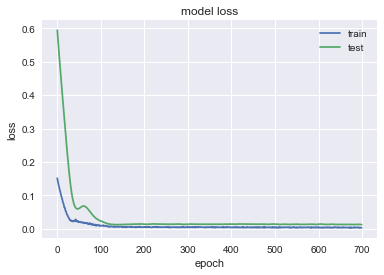

(21, 1, 10)
              BLK
MSE       2126.68
MAE       37.4136
R2       -1.24996
MAPE (%)  8.28699


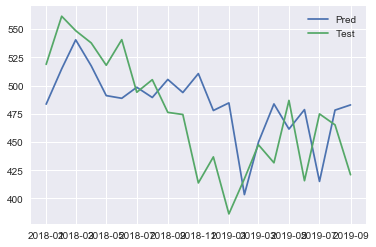

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3376 - val_loss: 0.3867
Epoch 2/700
0s - loss: 0.3241 - val_loss: 0.3719
Epoch 3/700
0s - loss: 0.3132 - val_loss: 0.3576
Epoch 4/700
0s - loss: 0.3024 - val_loss: 0.3437
Epoch 5/700
0s - loss: 0.2938 - val_loss: 0.3301
Epoch 6/700
0s - loss: 0.2814 - val_loss: 0.3167
Epoch 7/700
0s - loss: 0.2720 - val_loss: 0.3035
Epoch 8/700
0s - loss: 0.2627 - val_loss: 0.2903
Epoch 9/700
0s - loss: 0.2545 - val_loss: 0.2773
Epoch 10/700
0s - loss: 0.2443 - val_loss: 0.2644
Epoch 11/700
0s - loss: 0.2347 - val_loss: 0.2516
Epoch 12/700
0s - loss: 0.2272 - val_loss: 0.2387
Epoch 13/700
0s - loss: 0.2170 - val_loss: 0.2260
Epoch 14/700
0s - loss: 0.2047 - val_loss: 0.2134
Epoch 15/700
0s - loss: 0.1981 - val_loss: 0.2009
Epoch 16/700
0s - loss: 0.1888 - val_loss: 0.1884
Epoch 17/700
0s - loss: 0.1752 - val_loss: 0.1761
Epoch 18/700
0s - loss: 0.1659 - val_loss: 0.1639
Epoch 19/700
0s - loss: 0.1611 - val_loss: 0.

0s - loss: 0.0195 - val_loss: 0.0715
Epoch 168/700
0s - loss: 0.0205 - val_loss: 0.0719
Epoch 169/700
0s - loss: 0.0156 - val_loss: 0.0722
Epoch 170/700
0s - loss: 0.0206 - val_loss: 0.0725
Epoch 171/700
0s - loss: 0.0180 - val_loss: 0.0726
Epoch 172/700
0s - loss: 0.0181 - val_loss: 0.0726
Epoch 173/700
0s - loss: 0.0159 - val_loss: 0.0723
Epoch 174/700
0s - loss: 0.0178 - val_loss: 0.0717
Epoch 175/700
0s - loss: 0.0180 - val_loss: 0.0713
Epoch 176/700
0s - loss: 0.0165 - val_loss: 0.0707
Epoch 177/700
0s - loss: 0.0190 - val_loss: 0.0702
Epoch 178/700
0s - loss: 0.0175 - val_loss: 0.0699
Epoch 179/700
0s - loss: 0.0140 - val_loss: 0.0694
Epoch 180/700
0s - loss: 0.0183 - val_loss: 0.0693
Epoch 181/700
0s - loss: 0.0168 - val_loss: 0.0689
Epoch 182/700
0s - loss: 0.0154 - val_loss: 0.0688
Epoch 183/700
0s - loss: 0.0161 - val_loss: 0.0683
Epoch 184/700
0s - loss: 0.0144 - val_loss: 0.0678
Epoch 185/700
0s - loss: 0.0178 - val_loss: 0.0678
Epoch 186/700
0s - loss: 0.0168 - val_loss: 0

0s - loss: 0.0076 - val_loss: 0.0301
Epoch 340/700
0s - loss: 0.0087 - val_loss: 0.0293
Epoch 341/700
0s - loss: 0.0059 - val_loss: 0.0287
Epoch 342/700
0s - loss: 0.0095 - val_loss: 0.0284
Epoch 343/700
0s - loss: 0.0073 - val_loss: 0.0281
Epoch 344/700
0s - loss: 0.0066 - val_loss: 0.0281
Epoch 345/700
0s - loss: 0.0091 - val_loss: 0.0282
Epoch 346/700
0s - loss: 0.0075 - val_loss: 0.0285
Epoch 347/700
0s - loss: 0.0082 - val_loss: 0.0288
Epoch 348/700
0s - loss: 0.0097 - val_loss: 0.0291
Epoch 349/700
0s - loss: 0.0071 - val_loss: 0.0296
Epoch 350/700
0s - loss: 0.0081 - val_loss: 0.0298
Epoch 351/700
0s - loss: 0.0096 - val_loss: 0.0300
Epoch 352/700
0s - loss: 0.0079 - val_loss: 0.0302
Epoch 353/700
0s - loss: 0.0082 - val_loss: 0.0303
Epoch 354/700
0s - loss: 0.0086 - val_loss: 0.0305
Epoch 355/700
0s - loss: 0.0091 - val_loss: 0.0308
Epoch 356/700
0s - loss: 0.0094 - val_loss: 0.0308
Epoch 357/700
0s - loss: 0.0078 - val_loss: 0.0307
Epoch 358/700
0s - loss: 0.0077 - val_loss: 0

0s - loss: 0.0077 - val_loss: 0.0310
Epoch 511/700
0s - loss: 0.0069 - val_loss: 0.0315
Epoch 512/700
0s - loss: 0.0055 - val_loss: 0.0320
Epoch 513/700
0s - loss: 0.0073 - val_loss: 0.0323
Epoch 514/700
0s - loss: 0.0077 - val_loss: 0.0324
Epoch 515/700
0s - loss: 0.0079 - val_loss: 0.0322
Epoch 516/700
0s - loss: 0.0065 - val_loss: 0.0320
Epoch 517/700
0s - loss: 0.0065 - val_loss: 0.0317
Epoch 518/700
0s - loss: 0.0057 - val_loss: 0.0315
Epoch 519/700
0s - loss: 0.0067 - val_loss: 0.0310
Epoch 520/700
0s - loss: 0.0076 - val_loss: 0.0305
Epoch 521/700
0s - loss: 0.0065 - val_loss: 0.0300
Epoch 522/700
0s - loss: 0.0054 - val_loss: 0.0294
Epoch 523/700
0s - loss: 0.0061 - val_loss: 0.0289
Epoch 524/700
0s - loss: 0.0072 - val_loss: 0.0282
Epoch 525/700
0s - loss: 0.0054 - val_loss: 0.0276
Epoch 526/700
0s - loss: 0.0081 - val_loss: 0.0273
Epoch 527/700
0s - loss: 0.0064 - val_loss: 0.0271
Epoch 528/700
0s - loss: 0.0087 - val_loss: 0.0273
Epoch 529/700
0s - loss: 0.0080 - val_loss: 0

0s - loss: 0.0081 - val_loss: 0.0304
Epoch 686/700
0s - loss: 0.0062 - val_loss: 0.0307
Epoch 687/700
0s - loss: 0.0062 - val_loss: 0.0314
Epoch 688/700
0s - loss: 0.0064 - val_loss: 0.0324
Epoch 689/700
0s - loss: 0.0068 - val_loss: 0.0333
Epoch 690/700
0s - loss: 0.0069 - val_loss: 0.0340
Epoch 691/700
0s - loss: 0.0070 - val_loss: 0.0344
Epoch 692/700
0s - loss: 0.0082 - val_loss: 0.0341
Epoch 693/700
0s - loss: 0.0096 - val_loss: 0.0341
Epoch 694/700
0s - loss: 0.0104 - val_loss: 0.0339
Epoch 695/700
0s - loss: 0.0059 - val_loss: 0.0338
Epoch 696/700
0s - loss: 0.0082 - val_loss: 0.0337
Epoch 697/700
0s - loss: 0.0078 - val_loss: 0.0334
Epoch 698/700
0s - loss: 0.0076 - val_loss: 0.0330
Epoch 699/700
0s - loss: 0.0074 - val_loss: 0.0328
Epoch 700/700
0s - loss: 0.0080 - val_loss: 0.0323


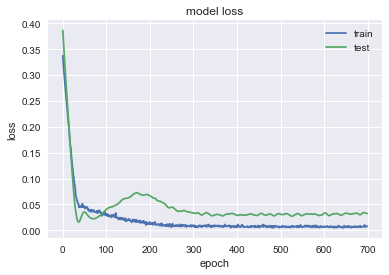

(21, 1, 10)
              DVA
MSE       97.1406
MAE        7.7689
R2       -3.04092
MAPE (%)   13.578


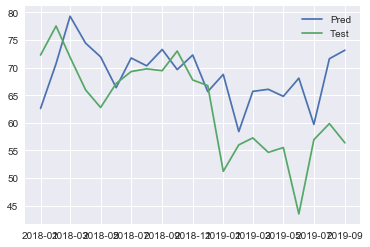

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.0376 - val_loss: 0.5514
Epoch 2/700
0s - loss: 0.0339 - val_loss: 0.5343
Epoch 3/700
0s - loss: 0.0319 - val_loss: 0.5180
Epoch 4/700
0s - loss: 0.0282 - val_loss: 0.5021
Epoch 5/700
0s - loss: 0.0261 - val_loss: 0.4866
Epoch 6/700
0s - loss: 0.0246 - val_loss: 0.4715
Epoch 7/700
0s - loss: 0.0221 - val_loss: 0.4567
Epoch 8/700
0s - loss: 0.0206 - val_loss: 0.4422
Epoch 9/700
0s - loss: 0.0184 - val_loss: 0.4278
Epoch 10/700
0s - loss: 0.0162 - val_loss: 0.4136
Epoch 11/700
0s - loss: 0.0152 - val_loss: 0.3996
Epoch 12/700
0s - loss: 0.0142 - val_loss: 0.3858
Epoch 13/700
0s - loss: 0.0126 - val_loss: 0.3723
Epoch 14/700
0s - loss: 0.0124 - val_loss: 0.3590
Epoch 15/700
0s - loss: 0.0117 - val_loss: 0.3460
Epoch 16/700
0s - loss: 0.0104 - val_loss: 0.3335
Epoch 17/700
0s - loss: 0.0098 - val_loss: 0.3214
Epoch 18/700
0s - loss: 0.0091 - val_loss: 0.3100
Epoch 19/700
0s - loss: 0.0097 - val_loss: 0.2

0s - loss: 0.0013 - val_loss: 0.0623
Epoch 177/700
0s - loss: 0.0013 - val_loss: 0.0619
Epoch 178/700
0s - loss: 0.0017 - val_loss: 0.0620
Epoch 179/700
0s - loss: 0.0014 - val_loss: 0.0620
Epoch 180/700
0s - loss: 0.0014 - val_loss: 0.0619
Epoch 181/700
0s - loss: 0.0011 - val_loss: 0.0618
Epoch 182/700
0s - loss: 0.0016 - val_loss: 0.0621
Epoch 183/700
0s - loss: 0.0017 - val_loss: 0.0622
Epoch 184/700
0s - loss: 0.0015 - val_loss: 0.0626
Epoch 185/700
0s - loss: 0.0015 - val_loss: 0.0627
Epoch 186/700
0s - loss: 0.0011 - val_loss: 0.0630
Epoch 187/700
0s - loss: 0.0013 - val_loss: 0.0627
Epoch 188/700
0s - loss: 0.0019 - val_loss: 0.0620
Epoch 189/700
0s - loss: 0.0016 - val_loss: 0.0611
Epoch 190/700
0s - loss: 0.0019 - val_loss: 0.0603
Epoch 191/700
0s - loss: 0.0015 - val_loss: 0.0592
Epoch 192/700
0s - loss: 0.0017 - val_loss: 0.0588
Epoch 193/700
0s - loss: 0.0015 - val_loss: 0.0584
Epoch 194/700
0s - loss: 0.0016 - val_loss: 0.0579
Epoch 195/700
0s - loss: 0.0013 - val_loss: 0

0s - loss: 9.5430e-04 - val_loss: 0.0407
Epoch 349/700
0s - loss: 0.0013 - val_loss: 0.0403
Epoch 350/700
0s - loss: 9.9334e-04 - val_loss: 0.0400
Epoch 351/700
0s - loss: 0.0014 - val_loss: 0.0397
Epoch 352/700
0s - loss: 0.0010 - val_loss: 0.0393
Epoch 353/700
0s - loss: 0.0015 - val_loss: 0.0386
Epoch 354/700
0s - loss: 0.0011 - val_loss: 0.0379
Epoch 355/700
0s - loss: 0.0012 - val_loss: 0.0373
Epoch 356/700
0s - loss: 0.0010 - val_loss: 0.0370
Epoch 357/700
0s - loss: 0.0011 - val_loss: 0.0371
Epoch 358/700
0s - loss: 7.9519e-04 - val_loss: 0.0373
Epoch 359/700
0s - loss: 0.0011 - val_loss: 0.0377
Epoch 360/700
0s - loss: 0.0010 - val_loss: 0.0380
Epoch 361/700
0s - loss: 0.0018 - val_loss: 0.0378
Epoch 362/700
0s - loss: 8.5049e-04 - val_loss: 0.0376
Epoch 363/700
0s - loss: 0.0010 - val_loss: 0.0376
Epoch 364/700
0s - loss: 0.0010 - val_loss: 0.0377
Epoch 365/700
0s - loss: 0.0012 - val_loss: 0.0378
Epoch 366/700
0s - loss: 0.0012 - val_loss: 0.0378
Epoch 367/700
0s - loss: 9.14

0s - loss: 0.0012 - val_loss: 0.0324
Epoch 521/700
0s - loss: 9.0000e-04 - val_loss: 0.0324
Epoch 522/700
0s - loss: 9.8572e-04 - val_loss: 0.0322
Epoch 523/700
0s - loss: 0.0011 - val_loss: 0.0318
Epoch 524/700
0s - loss: 0.0011 - val_loss: 0.0311
Epoch 525/700
0s - loss: 8.2003e-04 - val_loss: 0.0305
Epoch 526/700
0s - loss: 0.0010 - val_loss: 0.0298
Epoch 527/700
0s - loss: 0.0012 - val_loss: 0.0295
Epoch 528/700
0s - loss: 0.0011 - val_loss: 0.0291
Epoch 529/700
0s - loss: 0.0010 - val_loss: 0.0292
Epoch 530/700
0s - loss: 9.9874e-04 - val_loss: 0.0293
Epoch 531/700
0s - loss: 8.9681e-04 - val_loss: 0.0296
Epoch 532/700
0s - loss: 8.3927e-04 - val_loss: 0.0300
Epoch 533/700
0s - loss: 0.0012 - val_loss: 0.0303
Epoch 534/700
0s - loss: 0.0011 - val_loss: 0.0311
Epoch 535/700
0s - loss: 9.4078e-04 - val_loss: 0.0316
Epoch 536/700
0s - loss: 0.0011 - val_loss: 0.0321
Epoch 537/700
0s - loss: 9.1953e-04 - val_loss: 0.0325
Epoch 538/700
0s - loss: 9.9196e-04 - val_loss: 0.0327
Epoch 539

0s - loss: 8.3920e-04 - val_loss: 0.0259
Epoch 690/700
0s - loss: 9.2461e-04 - val_loss: 0.0260
Epoch 691/700
0s - loss: 6.2683e-04 - val_loss: 0.0262
Epoch 692/700
0s - loss: 9.7888e-04 - val_loss: 0.0264
Epoch 693/700
0s - loss: 8.8265e-04 - val_loss: 0.0266
Epoch 694/700
0s - loss: 9.5298e-04 - val_loss: 0.0267
Epoch 695/700
0s - loss: 8.8585e-04 - val_loss: 0.0266
Epoch 696/700
0s - loss: 8.7689e-04 - val_loss: 0.0264
Epoch 697/700
0s - loss: 8.3795e-04 - val_loss: 0.0261
Epoch 698/700
0s - loss: 8.3818e-04 - val_loss: 0.0258
Epoch 699/700
0s - loss: 7.5485e-04 - val_loss: 0.0257
Epoch 700/700
0s - loss: 8.9657e-04 - val_loss: 0.0260


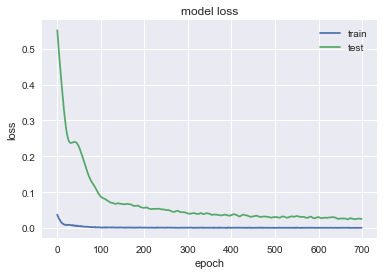

(21, 1, 10)
               BA
MSE       3957.06
MAE       46.7722
R2       -5.30549
MAPE (%)  12.4824


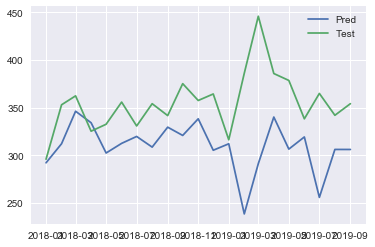

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.3572 - val_loss: 0.0886
Epoch 2/700
0s - loss: 0.3452 - val_loss: 0.0826
Epoch 3/700
0s - loss: 0.3344 - val_loss: 0.0769
Epoch 4/700
0s - loss: 0.3237 - val_loss: 0.0715
Epoch 5/700
0s - loss: 0.3142 - val_loss: 0.0662
Epoch 6/700
0s - loss: 0.3042 - val_loss: 0.0611
Epoch 7/700
0s - loss: 0.2934 - val_loss: 0.0562
Epoch 8/700
0s - loss: 0.2809 - val_loss: 0.0515
Epoch 9/700
0s - loss: 0.2731 - val_loss: 0.0470
Epoch 10/700
0s - loss: 0.2620 - val_loss: 0.0426
Epoch 11/700
0s - loss: 0.2523 - val_loss: 0.0385
Epoch 12/700
0s - loss: 0.2451 - val_loss: 0.0346
Epoch 13/700
0s - loss: 0.2360 - val_loss: 0.0308
Epoch 14/700
0s - loss: 0.2246 - val_loss: 0.0274
Epoch 15/700
0s - loss: 0.2119 - val_loss: 0.0242
Epoch 16/700
0s - loss: 0.2072 - val_loss: 0.0214
Epoch 17/700
0s - loss: 0.1953 - val_loss: 0.0189
Epoch 18/700
0s - loss: 0.1885 - val_loss: 0.0168
Epoch 19/700
0s - loss: 0.1750 - val_loss: 0.

0s - loss: 0.0145 - val_loss: 0.0140
Epoch 175/700
0s - loss: 0.0116 - val_loss: 0.0142
Epoch 176/700
0s - loss: 0.0143 - val_loss: 0.0143
Epoch 177/700
0s - loss: 0.0142 - val_loss: 0.0145
Epoch 178/700
0s - loss: 0.0123 - val_loss: 0.0147
Epoch 179/700
0s - loss: 0.0116 - val_loss: 0.0148
Epoch 180/700
0s - loss: 0.0163 - val_loss: 0.0150
Epoch 181/700
0s - loss: 0.0115 - val_loss: 0.0151
Epoch 182/700
0s - loss: 0.0132 - val_loss: 0.0153
Epoch 183/700
0s - loss: 0.0126 - val_loss: 0.0156
Epoch 184/700
0s - loss: 0.0125 - val_loss: 0.0158
Epoch 185/700
0s - loss: 0.0119 - val_loss: 0.0160
Epoch 186/700
0s - loss: 0.0138 - val_loss: 0.0162
Epoch 187/700
0s - loss: 0.0114 - val_loss: 0.0164
Epoch 188/700
0s - loss: 0.0132 - val_loss: 0.0166
Epoch 189/700
0s - loss: 0.0128 - val_loss: 0.0168
Epoch 190/700
0s - loss: 0.0128 - val_loss: 0.0170
Epoch 191/700
0s - loss: 0.0141 - val_loss: 0.0172
Epoch 192/700
0s - loss: 0.0108 - val_loss: 0.0174
Epoch 193/700
0s - loss: 0.0118 - val_loss: 0

0s - loss: 0.0094 - val_loss: 0.0209
Epoch 341/700
0s - loss: 0.0121 - val_loss: 0.0206
Epoch 342/700
0s - loss: 0.0089 - val_loss: 0.0203
Epoch 343/700
0s - loss: 0.0122 - val_loss: 0.0200
Epoch 344/700
0s - loss: 0.0089 - val_loss: 0.0198
Epoch 345/700
0s - loss: 0.0107 - val_loss: 0.0196
Epoch 346/700
0s - loss: 0.0114 - val_loss: 0.0195
Epoch 347/700
0s - loss: 0.0094 - val_loss: 0.0194
Epoch 348/700
0s - loss: 0.0102 - val_loss: 0.0194
Epoch 349/700
0s - loss: 0.0099 - val_loss: 0.0194
Epoch 350/700
0s - loss: 0.0066 - val_loss: 0.0195
Epoch 351/700
0s - loss: 0.0114 - val_loss: 0.0197
Epoch 352/700
0s - loss: 0.0109 - val_loss: 0.0199
Epoch 353/700
0s - loss: 0.0112 - val_loss: 0.0201
Epoch 354/700
0s - loss: 0.0093 - val_loss: 0.0204
Epoch 355/700
0s - loss: 0.0117 - val_loss: 0.0207
Epoch 356/700
0s - loss: 0.0119 - val_loss: 0.0210
Epoch 357/700
0s - loss: 0.0088 - val_loss: 0.0212
Epoch 358/700
0s - loss: 0.0116 - val_loss: 0.0214
Epoch 359/700
0s - loss: 0.0094 - val_loss: 0

0s - loss: 0.0075 - val_loss: 0.0213
Epoch 522/700
0s - loss: 0.0102 - val_loss: 0.0213
Epoch 523/700
0s - loss: 0.0091 - val_loss: 0.0214
Epoch 524/700
0s - loss: 0.0088 - val_loss: 0.0215
Epoch 525/700
0s - loss: 0.0106 - val_loss: 0.0216
Epoch 526/700
0s - loss: 0.0096 - val_loss: 0.0216
Epoch 527/700
0s - loss: 0.0112 - val_loss: 0.0216
Epoch 528/700
0s - loss: 0.0097 - val_loss: 0.0217
Epoch 529/700
0s - loss: 0.0079 - val_loss: 0.0217
Epoch 530/700
0s - loss: 0.0080 - val_loss: 0.0218
Epoch 531/700
0s - loss: 0.0098 - val_loss: 0.0219
Epoch 532/700
0s - loss: 0.0084 - val_loss: 0.0221
Epoch 533/700
0s - loss: 0.0069 - val_loss: 0.0223
Epoch 534/700
0s - loss: 0.0086 - val_loss: 0.0225
Epoch 535/700
0s - loss: 0.0074 - val_loss: 0.0227
Epoch 536/700
0s - loss: 0.0077 - val_loss: 0.0230
Epoch 537/700
0s - loss: 0.0103 - val_loss: 0.0232
Epoch 538/700
0s - loss: 0.0083 - val_loss: 0.0234
Epoch 539/700
0s - loss: 0.0111 - val_loss: 0.0234
Epoch 540/700
0s - loss: 0.0097 - val_loss: 0

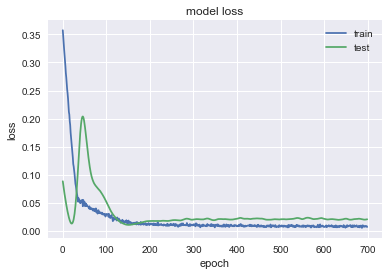

(21, 1, 10)
              IBM
MSE       213.721
MAE       13.4478
R2       -2.72677
MAPE (%)  9.54142


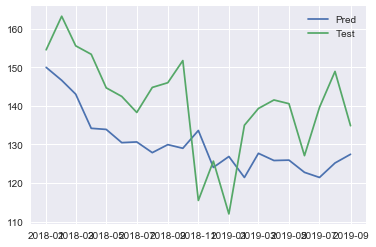

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1284 - val_loss: 0.2979
Epoch 2/700
0s - loss: 0.1215 - val_loss: 0.2846
Epoch 3/700
0s - loss: 0.1157 - val_loss: 0.2718
Epoch 4/700
0s - loss: 0.1102 - val_loss: 0.2595
Epoch 5/700
0s - loss: 0.1033 - val_loss: 0.2476
Epoch 6/700
0s - loss: 0.0985 - val_loss: 0.2361
Epoch 7/700
0s - loss: 0.0925 - val_loss: 0.2250
Epoch 8/700
0s - loss: 0.0889 - val_loss: 0.2140
Epoch 9/700
0s - loss: 0.0820 - val_loss: 0.2034
Epoch 10/700
0s - loss: 0.0784 - val_loss: 0.1929
Epoch 11/700
0s - loss: 0.0742 - val_loss: 0.1826
Epoch 12/700
0s - loss: 0.0698 - val_loss: 0.1726
Epoch 13/700
0s - loss: 0.0673 - val_loss: 0.1627
Epoch 14/700
0s - loss: 0.0637 - val_loss: 0.1530
Epoch 15/700
0s - loss: 0.0592 - val_loss: 0.1434
Epoch 16/700
0s - loss: 0.0558 - val_loss: 0.1341
Epoch 17/700
0s - loss: 0.0513 - val_loss: 0.1250
Epoch 18/700
0s - loss: 0.0471 - val_loss: 0.1161
Epoch 19/700
0s - loss: 0.0474 - val_loss: 0.

0s - loss: 0.0066 - val_loss: 0.0505
Epoch 196/700
0s - loss: 0.0056 - val_loss: 0.0501
Epoch 197/700
0s - loss: 0.0064 - val_loss: 0.0499
Epoch 198/700
0s - loss: 0.0065 - val_loss: 0.0500
Epoch 199/700
0s - loss: 0.0062 - val_loss: 0.0501
Epoch 200/700
0s - loss: 0.0054 - val_loss: 0.0502
Epoch 201/700
0s - loss: 0.0058 - val_loss: 0.0505
Epoch 202/700
0s - loss: 0.0072 - val_loss: 0.0513
Epoch 203/700
0s - loss: 0.0060 - val_loss: 0.0528
Epoch 204/700
0s - loss: 0.0060 - val_loss: 0.0542
Epoch 205/700
0s - loss: 0.0047 - val_loss: 0.0551
Epoch 206/700
0s - loss: 0.0080 - val_loss: 0.0561
Epoch 207/700
0s - loss: 0.0056 - val_loss: 0.0564
Epoch 208/700
0s - loss: 0.0045 - val_loss: 0.0568
Epoch 209/700
0s - loss: 0.0053 - val_loss: 0.0568
Epoch 210/700
0s - loss: 0.0051 - val_loss: 0.0560
Epoch 211/700
0s - loss: 0.0064 - val_loss: 0.0554
Epoch 212/700
0s - loss: 0.0051 - val_loss: 0.0545
Epoch 213/700
0s - loss: 0.0057 - val_loss: 0.0528
Epoch 214/700
0s - loss: 0.0055 - val_loss: 0

0s - loss: 0.0040 - val_loss: 0.0369
Epoch 361/700
0s - loss: 0.0047 - val_loss: 0.0375
Epoch 362/700
0s - loss: 0.0042 - val_loss: 0.0380
Epoch 363/700
0s - loss: 0.0044 - val_loss: 0.0389
Epoch 364/700
0s - loss: 0.0042 - val_loss: 0.0392
Epoch 365/700
0s - loss: 0.0039 - val_loss: 0.0391
Epoch 366/700
0s - loss: 0.0046 - val_loss: 0.0393
Epoch 367/700
0s - loss: 0.0035 - val_loss: 0.0396
Epoch 368/700
0s - loss: 0.0043 - val_loss: 0.0397
Epoch 369/700
0s - loss: 0.0047 - val_loss: 0.0399
Epoch 370/700
0s - loss: 0.0041 - val_loss: 0.0405
Epoch 371/700
0s - loss: 0.0051 - val_loss: 0.0412
Epoch 372/700
0s - loss: 0.0036 - val_loss: 0.0419
Epoch 373/700
0s - loss: 0.0041 - val_loss: 0.0423
Epoch 374/700
0s - loss: 0.0044 - val_loss: 0.0418
Epoch 375/700
0s - loss: 0.0045 - val_loss: 0.0412
Epoch 376/700
0s - loss: 0.0041 - val_loss: 0.0407
Epoch 377/700
0s - loss: 0.0040 - val_loss: 0.0400
Epoch 378/700
0s - loss: 0.0036 - val_loss: 0.0393
Epoch 379/700
0s - loss: 0.0044 - val_loss: 0

0s - loss: 0.0040 - val_loss: 0.0411
Epoch 553/700
0s - loss: 0.0029 - val_loss: 0.0418
Epoch 554/700
0s - loss: 0.0033 - val_loss: 0.0419
Epoch 555/700
0s - loss: 0.0042 - val_loss: 0.0409
Epoch 556/700
0s - loss: 0.0040 - val_loss: 0.0392
Epoch 557/700
0s - loss: 0.0045 - val_loss: 0.0367
Epoch 558/700
0s - loss: 0.0036 - val_loss: 0.0345
Epoch 559/700
0s - loss: 0.0042 - val_loss: 0.0322
Epoch 560/700
0s - loss: 0.0040 - val_loss: 0.0308
Epoch 561/700
0s - loss: 0.0041 - val_loss: 0.0304
Epoch 562/700
0s - loss: 0.0041 - val_loss: 0.0307
Epoch 563/700
0s - loss: 0.0045 - val_loss: 0.0318
Epoch 564/700
0s - loss: 0.0027 - val_loss: 0.0331
Epoch 565/700
0s - loss: 0.0040 - val_loss: 0.0344
Epoch 566/700
0s - loss: 0.0038 - val_loss: 0.0361
Epoch 567/700
0s - loss: 0.0035 - val_loss: 0.0380
Epoch 568/700
0s - loss: 0.0035 - val_loss: 0.0397
Epoch 569/700
0s - loss: 0.0032 - val_loss: 0.0414
Epoch 570/700
0s - loss: 0.0051 - val_loss: 0.0425
Epoch 571/700
0s - loss: 0.0052 - val_loss: 0

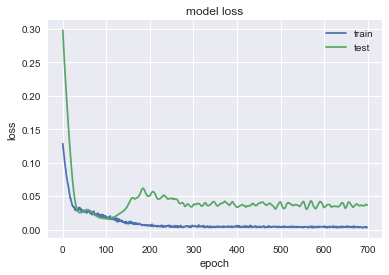

(21, 1, 10)
              ALB
MSE       411.887
MAE       17.1743
R2       -0.58955
MAPE (%)  20.7002


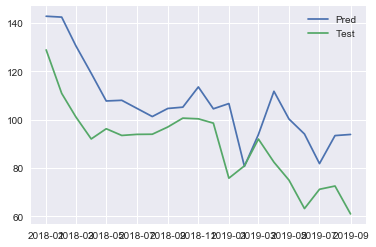

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/700
0s - loss: 0.1432 - val_loss: 0.6610
Epoch 2/700
0s - loss: 0.1359 - val_loss: 0.6399
Epoch 3/700
0s - loss: 0.1306 - val_loss: 0.6193
Epoch 4/700
0s - loss: 0.1223 - val_loss: 0.5992
Epoch 5/700
0s - loss: 0.1168 - val_loss: 0.5795
Epoch 6/700
0s - loss: 0.1104 - val_loss: 0.5600
Epoch 7/700
0s - loss: 0.1031 - val_loss: 0.5407
Epoch 8/700
0s - loss: 0.0971 - val_loss: 0.5216
Epoch 9/700
0s - loss: 0.0919 - val_loss: 0.5024
Epoch 10/700
0s - loss: 0.0867 - val_loss: 0.4833
Epoch 11/700
0s - loss: 0.0806 - val_loss: 0.4641
Epoch 12/700
0s - loss: 0.0760 - val_loss: 0.4449
Epoch 13/700
0s - loss: 0.0702 - val_loss: 0.4256
Epoch 14/700
0s - loss: 0.0655 - val_loss: 0.4063
Epoch 15/700
0s - loss: 0.0623 - val_loss: 0.3869
Epoch 16/700
0s - loss: 0.0556 - val_loss: 0.3676
Epoch 17/700
0s - loss: 0.0519 - val_loss: 0.3483
Epoch 18/700
0s - loss: 0.0470 - val_loss: 0.3291
Epoch 19/700
0s - loss: 0.0428 - val_loss: 0

0s - loss: 0.0065 - val_loss: 0.0224
Epoch 177/700
0s - loss: 0.0077 - val_loss: 0.0223
Epoch 178/700
0s - loss: 0.0071 - val_loss: 0.0222
Epoch 179/700
0s - loss: 0.0068 - val_loss: 0.0221
Epoch 180/700
0s - loss: 0.0068 - val_loss: 0.0219
Epoch 181/700
0s - loss: 0.0056 - val_loss: 0.0218
Epoch 182/700
0s - loss: 0.0080 - val_loss: 0.0215
Epoch 183/700
0s - loss: 0.0079 - val_loss: 0.0214
Epoch 184/700
0s - loss: 0.0061 - val_loss: 0.0213
Epoch 185/700
0s - loss: 0.0071 - val_loss: 0.0211
Epoch 186/700
0s - loss: 0.0073 - val_loss: 0.0211
Epoch 187/700
0s - loss: 0.0069 - val_loss: 0.0211
Epoch 188/700
0s - loss: 0.0060 - val_loss: 0.0210
Epoch 189/700
0s - loss: 0.0080 - val_loss: 0.0209
Epoch 190/700
0s - loss: 0.0060 - val_loss: 0.0209
Epoch 191/700
0s - loss: 0.0073 - val_loss: 0.0210
Epoch 192/700
0s - loss: 0.0071 - val_loss: 0.0209
Epoch 193/700
0s - loss: 0.0063 - val_loss: 0.0209
Epoch 194/700
0s - loss: 0.0065 - val_loss: 0.0209
Epoch 195/700
0s - loss: 0.0064 - val_loss: 0

0s - loss: 0.0051 - val_loss: 0.0165
Epoch 360/700
0s - loss: 0.0049 - val_loss: 0.0165
Epoch 361/700
0s - loss: 0.0052 - val_loss: 0.0165
Epoch 362/700
0s - loss: 0.0042 - val_loss: 0.0165
Epoch 363/700
0s - loss: 0.0058 - val_loss: 0.0165
Epoch 364/700
0s - loss: 0.0048 - val_loss: 0.0165
Epoch 365/700
0s - loss: 0.0045 - val_loss: 0.0165
Epoch 366/700
0s - loss: 0.0063 - val_loss: 0.0165
Epoch 367/700
0s - loss: 0.0053 - val_loss: 0.0165
Epoch 368/700
0s - loss: 0.0054 - val_loss: 0.0165
Epoch 369/700
0s - loss: 0.0053 - val_loss: 0.0165
Epoch 370/700
0s - loss: 0.0055 - val_loss: 0.0165
Epoch 371/700
0s - loss: 0.0052 - val_loss: 0.0165
Epoch 372/700
0s - loss: 0.0051 - val_loss: 0.0165
Epoch 373/700
0s - loss: 0.0056 - val_loss: 0.0165
Epoch 374/700
0s - loss: 0.0049 - val_loss: 0.0165
Epoch 375/700
0s - loss: 0.0057 - val_loss: 0.0165
Epoch 376/700
0s - loss: 0.0050 - val_loss: 0.0165
Epoch 377/700
0s - loss: 0.0049 - val_loss: 0.0165
Epoch 378/700
0s - loss: 0.0048 - val_loss: 0

0s - loss: 0.0051 - val_loss: 0.0172
Epoch 521/700
0s - loss: 0.0045 - val_loss: 0.0173
Epoch 522/700
0s - loss: 0.0042 - val_loss: 0.0174
Epoch 523/700
0s - loss: 0.0050 - val_loss: 0.0174
Epoch 524/700
0s - loss: 0.0055 - val_loss: 0.0174
Epoch 525/700
0s - loss: 0.0048 - val_loss: 0.0174
Epoch 526/700
0s - loss: 0.0051 - val_loss: 0.0173
Epoch 527/700
0s - loss: 0.0047 - val_loss: 0.0172
Epoch 528/700
0s - loss: 0.0055 - val_loss: 0.0172
Epoch 529/700
0s - loss: 0.0051 - val_loss: 0.0171
Epoch 530/700
0s - loss: 0.0048 - val_loss: 0.0171
Epoch 531/700
0s - loss: 0.0036 - val_loss: 0.0171
Epoch 532/700
0s - loss: 0.0051 - val_loss: 0.0171
Epoch 533/700
0s - loss: 0.0044 - val_loss: 0.0172
Epoch 534/700
0s - loss: 0.0050 - val_loss: 0.0173
Epoch 535/700
0s - loss: 0.0055 - val_loss: 0.0173
Epoch 536/700
0s - loss: 0.0038 - val_loss: 0.0174
Epoch 537/700
0s - loss: 0.0048 - val_loss: 0.0174
Epoch 538/700
0s - loss: 0.0050 - val_loss: 0.0173
Epoch 539/700
0s - loss: 0.0054 - val_loss: 0

0s - loss: 0.0042 - val_loss: 0.0166
Epoch 694/700
0s - loss: 0.0044 - val_loss: 0.0167
Epoch 695/700
0s - loss: 0.0036 - val_loss: 0.0167
Epoch 696/700
0s - loss: 0.0046 - val_loss: 0.0167
Epoch 697/700
0s - loss: 0.0038 - val_loss: 0.0167
Epoch 698/700
0s - loss: 0.0041 - val_loss: 0.0167
Epoch 699/700
0s - loss: 0.0046 - val_loss: 0.0167
Epoch 700/700
0s - loss: 0.0047 - val_loss: 0.0167


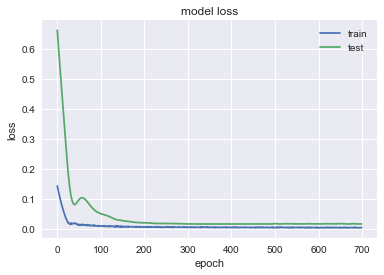

(21, 1, 10)
             CBRE
MSE       28.0189
MAE       4.23126
R2       -1.33095
MAPE (%)  9.13143


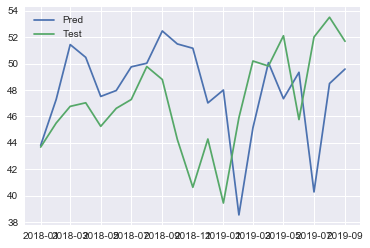

In [353]:
pred_multi_4 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_4[comp] = nn_forec_multi(df,comp,n_train_time_=test.shape[0],first_layer = 32,second_layer=16).values

In [338]:
pred_multi_64_32 = eval(pred_multi,test,companies=companies)
pred_multi_64_32

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,3.40191,63.3757,19.6266,6.80017,2945.02,98.8661,3225.1,200.405,496.619,29.0507
MAE,1.51015,6.93641,3.4104,2.17783,42.4313,7.87692,38.4406,12.9082,19.4383,4.59738
R2,0.32162,-0.979158,-8.36969,0.166134,-1.13727,-3.11898,-3.05997,-1.77545,-1.44108,-1.07283
MAPE (%),4.54559,9.86906,6.94195,8.33472,9.5823,13.7699,10.1979,9.20556,23.6925,9.90651


In [342]:
pred_multi_128_64 = eval(pred_multi_2,test,companies=companies)
pred_multi_128_64

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,3.68798,80.785,11.2866,7.65151,2741.5,92.6112,2025.11,217.219,375.308,26.6515
MAE,1.57683,7.61694,2.56655,2.30723,40.8211,7.59806,34.4094,13.412,16.4826,4.39475
R2,0.255739,-1.15191,-4.20347,0.0991712,-0.829947,-2.79563,-0.761184,-1.3374,-0.83451,-1.14931
MAPE (%),4.74562,10.7473,5.26124,8.90429,9.2039,13.2544,9.48304,9.58908,20.163,9.55721


In [354]:
pred_multi_256_128 = eval(pred_multi_3,test,companies=companies)
pred_multi_256_128

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,5.13333,70.6364,5.88132,7.77783,2838.67,111.673,2054.72,196.382,404.286,24.8758
MAE,1.94057,7.22624,1.85577,2.3308,41.8361,8.63739,35.3297,12.5436,17.5213,4.15481
R2,0.0209494,-0.770893,-0.117361,0.28829,-0.610253,-3.15069,-0.66648,-1.10307,-1.05998,-1.00136
MAPE (%),5.83793,10.2648,3.86252,8.67249,9.38824,15.0121,9.8269,8.99906,21.3524,9.04267


In [355]:
pred_multi_32_16 = eval(pred_multi_4,test,companies=companies)
pred_multi_32_16

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,3.90766,78.1316,24.5385,7.76496,2126.68,97.1406,3957.06,213.721,411.887,28.0189
MAE,1.62484,7.40564,3.87441,2.34597,37.4136,7.7689,46.7722,13.4478,17.1743,4.23126
R2,0.180804,-2.03564,-8.60569,-0.550221,-1.24996,-3.04092,-5.30549,-2.72677,-0.58955,-1.33095
MAPE (%),4.88967,10.402,7.88916,8.52523,8.28699,13.578,12.4824,9.54142,20.7002,9.13143


In [348]:
def nn_forec_multi_GRU(df,company_,n_lags = 1,feature_range=(0, 1),n_train_time = 21,first_layer = 64,second_layer = 32):
    print("Predicting for ", company_)
    comp = df.copy()

    scaler_1 = MinMaxScaler(feature_range=feature_range)
    scaler = MinMaxScaler(feature_range=feature_range)
    comp[company_] = scaler_1.fit_transform(comp[company_])
    scal_2 = []
    for i in enumerate(list(map(lambda x:  x!= company_, companies))):
        if(i[1]):
            scal_2.append(i[0])
    
    comp.iloc[:,scal_2] = scaler.fit_transform(comp.iloc[:,scal_2])
    
    comp = pd.DataFrame(comp,columns=df.columns,index=df.index)
    for company in companies:
        for i in range(1,n_lags+1):
            comp.loc[:,company+"(t-"+str(i)+")"] = comp[company].shift(i)
    
    comp = comp.dropna()
    cols_to_del = []
    for c in companies:
        if c != company_:
            cols_to_del.append(c)
    comp = comp.drop(cols_to_del,axis = 1)
    values = comp.values

    n_train_time = n_train_time
    train = values[:comp.shape[0] -n_train_time, :]
    test = values[comp.shape[0] - n_train_time :, :]
    train_X, train_y = train[:, 1:], train[:, 0]
    test_X, test_y = test[:, 1:], test[:, 0]
    train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
    test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

    model = Sequential()
    model.add(GRU(first_layer, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(Dropout(0.1))
    model.add(GRU(second_layer))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer='Adamax')



    # fit network
    history = model.fit(train_X, train_y, epochs=1000, batch_size=150, validation_data=(test_X, test_y), verbose=2, shuffle=False)

    # summarize history for loss
    plt.plot(history.history['loss'][200:])
    plt.plot(history.history['val_loss'][200:])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper right')
    plt.show()
    
    # make a prediction
    yhat = model.predict(test_X)
    # invert scaling for forecast
    inv_yhat_sc = scaler_1.inverse_transform(yhat)
    # invert scaling for actual

    inv_y = scaler_1.inverse_transform(test_y)
    test = df["2018-01-01":].copy()
    train = df[:"2018-01-01"].copy()
    predictions = pd.DataFrame(inv_yhat_sc,columns=[company_],index = test.index)
    
    lstm_eval = eval(predictions,test,companies=[company_])
    print(lstm_eval)
    
    plt.plot(predictions[company_])
    plt.plot(test[company_])
    plt.legend(['Pred', 'Test'])
    plt.show()
    return predictions

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3100 - val_loss: 0.1665
Epoch 2/1000
0s - loss: 0.2448 - val_loss: 0.1145
Epoch 3/1000
0s - loss: 0.1921 - val_loss: 0.0749
Epoch 4/1000
0s - loss: 0.1486 - val_loss: 0.0459
Epoch 5/1000
0s - loss: 0.1152 - val_loss: 0.0266
Epoch 6/1000
0s - loss: 0.0887 - val_loss: 0.0163
Epoch 7/1000
0s - loss: 0.0657 - val_loss: 0.0142
Epoch 8/1000
0s - loss: 0.0439 - val_loss: 0.0197
Epoch 9/1000
0s - loss: 0.0312 - val_loss: 0.0317
Epoch 10/1000
0s - loss: 0.0249 - val_loss: 0.0487
Epoch 11/1000
0s - loss: 0.0236 - val_loss: 0.0686
Epoch 12/1000
0s - loss: 0.0228 - val_loss: 0.0894
Epoch 13/1000
0s - loss: 0.0280 - val_loss: 0.1090
Epoch 14/1000
0s - loss: 0.0303 - val_loss: 0.1254
Epoch 15/1000
0s - loss: 0.0298 - val_loss: 0.1374
Epoch 16/1000
0s - loss: 0.0324 - val_loss: 0.1448
Epoch 17/1000
0s - loss: 0.0375 - val_loss: 0.1472
Epoch 18/1000
0s - loss: 0.0350 - val_loss: 0.1452
Epoch 19/1000
0s - loss: 0.03

0s - loss: 0.0102 - val_loss: 0.0293
Epoch 179/1000
0s - loss: 0.0090 - val_loss: 0.0289
Epoch 180/1000
0s - loss: 0.0098 - val_loss: 0.0286
Epoch 181/1000
0s - loss: 0.0100 - val_loss: 0.0283
Epoch 182/1000
0s - loss: 0.0106 - val_loss: 0.0282
Epoch 183/1000
0s - loss: 0.0108 - val_loss: 0.0281
Epoch 184/1000
0s - loss: 0.0087 - val_loss: 0.0278
Epoch 185/1000
0s - loss: 0.0084 - val_loss: 0.0276
Epoch 186/1000
0s - loss: 0.0110 - val_loss: 0.0272
Epoch 187/1000
0s - loss: 0.0125 - val_loss: 0.0269
Epoch 188/1000
0s - loss: 0.0125 - val_loss: 0.0267
Epoch 189/1000
0s - loss: 0.0104 - val_loss: 0.0264
Epoch 190/1000
0s - loss: 0.0092 - val_loss: 0.0259
Epoch 191/1000
0s - loss: 0.0115 - val_loss: 0.0253
Epoch 192/1000
0s - loss: 0.0094 - val_loss: 0.0247
Epoch 193/1000
0s - loss: 0.0093 - val_loss: 0.0243
Epoch 194/1000
0s - loss: 0.0113 - val_loss: 0.0240
Epoch 195/1000
0s - loss: 0.0085 - val_loss: 0.0239
Epoch 196/1000
0s - loss: 0.0099 - val_loss: 0.0239
Epoch 197/1000
0s - loss: 0

0s - loss: 0.0101 - val_loss: 0.0079
Epoch 352/1000
0s - loss: 0.0095 - val_loss: 0.0079
Epoch 353/1000
0s - loss: 0.0073 - val_loss: 0.0079
Epoch 354/1000
0s - loss: 0.0069 - val_loss: 0.0079
Epoch 355/1000
0s - loss: 0.0100 - val_loss: 0.0080
Epoch 356/1000
0s - loss: 0.0079 - val_loss: 0.0080
Epoch 357/1000
0s - loss: 0.0112 - val_loss: 0.0080
Epoch 358/1000
0s - loss: 0.0083 - val_loss: 0.0080
Epoch 359/1000
0s - loss: 0.0078 - val_loss: 0.0080
Epoch 360/1000
0s - loss: 0.0084 - val_loss: 0.0079
Epoch 361/1000
0s - loss: 0.0095 - val_loss: 0.0079
Epoch 362/1000
0s - loss: 0.0075 - val_loss: 0.0079
Epoch 363/1000
0s - loss: 0.0089 - val_loss: 0.0079
Epoch 364/1000
0s - loss: 0.0072 - val_loss: 0.0079
Epoch 365/1000
0s - loss: 0.0086 - val_loss: 0.0080
Epoch 366/1000
0s - loss: 0.0080 - val_loss: 0.0080
Epoch 367/1000
0s - loss: 0.0115 - val_loss: 0.0081
Epoch 368/1000
0s - loss: 0.0081 - val_loss: 0.0082
Epoch 369/1000
0s - loss: 0.0083 - val_loss: 0.0082
Epoch 370/1000
0s - loss: 0

0s - loss: 0.0079 - val_loss: 0.0076
Epoch 515/1000
0s - loss: 0.0073 - val_loss: 0.0076
Epoch 516/1000
0s - loss: 0.0083 - val_loss: 0.0077
Epoch 517/1000
0s - loss: 0.0079 - val_loss: 0.0077
Epoch 518/1000
0s - loss: 0.0084 - val_loss: 0.0077
Epoch 519/1000
0s - loss: 0.0076 - val_loss: 0.0077
Epoch 520/1000
0s - loss: 0.0077 - val_loss: 0.0077
Epoch 521/1000
0s - loss: 0.0082 - val_loss: 0.0077
Epoch 522/1000
0s - loss: 0.0086 - val_loss: 0.0076
Epoch 523/1000
0s - loss: 0.0072 - val_loss: 0.0075
Epoch 524/1000
0s - loss: 0.0069 - val_loss: 0.0074
Epoch 525/1000
0s - loss: 0.0077 - val_loss: 0.0073
Epoch 526/1000
0s - loss: 0.0078 - val_loss: 0.0073
Epoch 527/1000
0s - loss: 0.0083 - val_loss: 0.0073
Epoch 528/1000
0s - loss: 0.0070 - val_loss: 0.0073
Epoch 529/1000
0s - loss: 0.0078 - val_loss: 0.0073
Epoch 530/1000
0s - loss: 0.0093 - val_loss: 0.0073
Epoch 531/1000
0s - loss: 0.0091 - val_loss: 0.0073
Epoch 532/1000
0s - loss: 0.0075 - val_loss: 0.0073
Epoch 533/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0091
Epoch 674/1000
0s - loss: 0.0085 - val_loss: 0.0091
Epoch 675/1000
0s - loss: 0.0065 - val_loss: 0.0090
Epoch 676/1000
0s - loss: 0.0074 - val_loss: 0.0089
Epoch 677/1000
0s - loss: 0.0076 - val_loss: 0.0088
Epoch 678/1000
0s - loss: 0.0081 - val_loss: 0.0086
Epoch 679/1000
0s - loss: 0.0075 - val_loss: 0.0085
Epoch 680/1000
0s - loss: 0.0090 - val_loss: 0.0084
Epoch 681/1000
0s - loss: 0.0067 - val_loss: 0.0084
Epoch 682/1000
0s - loss: 0.0063 - val_loss: 0.0084
Epoch 683/1000
0s - loss: 0.0083 - val_loss: 0.0084
Epoch 684/1000
0s - loss: 0.0086 - val_loss: 0.0086
Epoch 685/1000
0s - loss: 0.0085 - val_loss: 0.0088
Epoch 686/1000
0s - loss: 0.0073 - val_loss: 0.0091
Epoch 687/1000
0s - loss: 0.0084 - val_loss: 0.0093
Epoch 688/1000
0s - loss: 0.0078 - val_loss: 0.0096
Epoch 689/1000
0s - loss: 0.0082 - val_loss: 0.0099
Epoch 690/1000
0s - loss: 0.0079 - val_loss: 0.0101
Epoch 691/1000
0s - loss: 0.0079 - val_loss: 0.0101
Epoch 692/1000
0s - loss: 0

0s - loss: 0.0088 - val_loss: 0.0099
Epoch 840/1000
0s - loss: 0.0083 - val_loss: 0.0097
Epoch 841/1000
0s - loss: 0.0083 - val_loss: 0.0096
Epoch 842/1000
0s - loss: 0.0077 - val_loss: 0.0096
Epoch 843/1000
0s - loss: 0.0075 - val_loss: 0.0097
Epoch 844/1000
0s - loss: 0.0074 - val_loss: 0.0101
Epoch 845/1000
0s - loss: 0.0071 - val_loss: 0.0106
Epoch 846/1000
0s - loss: 0.0084 - val_loss: 0.0111
Epoch 847/1000
0s - loss: 0.0067 - val_loss: 0.0116
Epoch 848/1000
0s - loss: 0.0075 - val_loss: 0.0118
Epoch 849/1000
0s - loss: 0.0077 - val_loss: 0.0119
Epoch 850/1000
0s - loss: 0.0069 - val_loss: 0.0119
Epoch 851/1000
0s - loss: 0.0071 - val_loss: 0.0118
Epoch 852/1000
0s - loss: 0.0073 - val_loss: 0.0116
Epoch 853/1000
0s - loss: 0.0073 - val_loss: 0.0115
Epoch 854/1000
0s - loss: 0.0086 - val_loss: 0.0112
Epoch 855/1000
0s - loss: 0.0062 - val_loss: 0.0110
Epoch 856/1000
0s - loss: 0.0080 - val_loss: 0.0110
Epoch 857/1000
0s - loss: 0.0064 - val_loss: 0.0109
Epoch 858/1000
0s - loss: 0

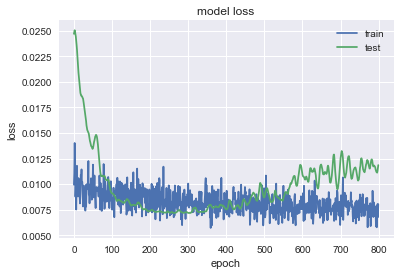

                 T
MSE         4.2755
MAE        1.72855
R2        0.153963
MAPE (%)   5.20666


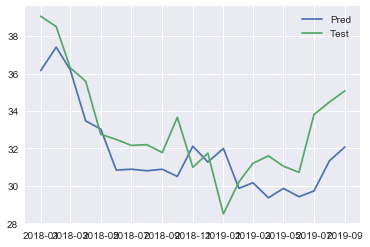

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1469 - val_loss: 0.6244
Epoch 2/1000
0s - loss: 0.1116 - val_loss: 0.5296
Epoch 3/1000
0s - loss: 0.0847 - val_loss: 0.4482
Epoch 4/1000
0s - loss: 0.0656 - val_loss: 0.3778
Epoch 5/1000
0s - loss: 0.0479 - val_loss: 0.3168
Epoch 6/1000
0s - loss: 0.0384 - val_loss: 0.2645
Epoch 7/1000
0s - loss: 0.0326 - val_loss: 0.2202
Epoch 8/1000
0s - loss: 0.0277 - val_loss: 0.1832
Epoch 9/1000
0s - loss: 0.0260 - val_loss: 0.1530
Epoch 10/1000
0s - loss: 0.0230 - val_loss: 0.1293
Epoch 11/1000
0s - loss: 0.0267 - val_loss: 0.1112
Epoch 12/1000
0s - loss: 0.0249 - val_loss: 0.0978
Epoch 13/1000
0s - loss: 0.0263 - val_loss: 0.0886
Epoch 14/1000
0s - loss: 0.0267 - val_loss: 0.0826
Epoch 15/1000
0s - loss: 0.0295 - val_loss: 0.0796
Epoch 16/1000
0s - loss: 0.0298 - val_loss: 0.0791
Epoch 17/1000
0s - loss: 0.0277 - val_loss: 0.0805
Epoch 18/1000
0s - loss: 0.0240 - val_loss: 0.0832
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0054 - val_loss: 0.0093
Epoch 184/1000
0s - loss: 0.0049 - val_loss: 0.0094
Epoch 185/1000
0s - loss: 0.0041 - val_loss: 0.0094
Epoch 186/1000
0s - loss: 0.0047 - val_loss: 0.0094
Epoch 187/1000
0s - loss: 0.0047 - val_loss: 0.0095
Epoch 188/1000
0s - loss: 0.0042 - val_loss: 0.0095
Epoch 189/1000
0s - loss: 0.0048 - val_loss: 0.0094
Epoch 190/1000
0s - loss: 0.0036 - val_loss: 0.0094
Epoch 191/1000
0s - loss: 0.0047 - val_loss: 0.0094
Epoch 192/1000
0s - loss: 0.0044 - val_loss: 0.0094
Epoch 193/1000
0s - loss: 0.0046 - val_loss: 0.0093
Epoch 194/1000
0s - loss: 0.0049 - val_loss: 0.0093
Epoch 195/1000
0s - loss: 0.0056 - val_loss: 0.0093
Epoch 196/1000
0s - loss: 0.0059 - val_loss: 0.0093
Epoch 197/1000
0s - loss: 0.0044 - val_loss: 0.0093
Epoch 198/1000
0s - loss: 0.0044 - val_loss: 0.0093
Epoch 199/1000
0s - loss: 0.0047 - val_loss: 0.0092
Epoch 200/1000
0s - loss: 0.0046 - val_loss: 0.0093
Epoch 201/1000
0s - loss: 0.0053 - val_loss: 0.0092
Epoch 202/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0084
Epoch 368/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 369/1000
0s - loss: 0.0043 - val_loss: 0.0084
Epoch 370/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 371/1000
0s - loss: 0.0047 - val_loss: 0.0084
Epoch 372/1000
0s - loss: 0.0037 - val_loss: 0.0084
Epoch 373/1000
0s - loss: 0.0041 - val_loss: 0.0084
Epoch 374/1000
0s - loss: 0.0038 - val_loss: 0.0084
Epoch 375/1000
0s - loss: 0.0047 - val_loss: 0.0084
Epoch 376/1000
0s - loss: 0.0039 - val_loss: 0.0084
Epoch 377/1000
0s - loss: 0.0034 - val_loss: 0.0084
Epoch 378/1000
0s - loss: 0.0034 - val_loss: 0.0084
Epoch 379/1000
0s - loss: 0.0045 - val_loss: 0.0084
Epoch 380/1000
0s - loss: 0.0038 - val_loss: 0.0084
Epoch 381/1000
0s - loss: 0.0040 - val_loss: 0.0084
Epoch 382/1000
0s - loss: 0.0039 - val_loss: 0.0084
Epoch 383/1000
0s - loss: 0.0040 - val_loss: 0.0084
Epoch 384/1000
0s - loss: 0.0030 - val_loss: 0.0084
Epoch 385/1000
0s - loss: 0.0035 - val_loss: 0.0084
Epoch 386/1000
0s - loss: 0

0s - loss: 0.0037 - val_loss: 0.0085
Epoch 550/1000
0s - loss: 0.0031 - val_loss: 0.0086
Epoch 551/1000
0s - loss: 0.0039 - val_loss: 0.0087
Epoch 552/1000
0s - loss: 0.0035 - val_loss: 0.0088
Epoch 553/1000
0s - loss: 0.0041 - val_loss: 0.0088
Epoch 554/1000
0s - loss: 0.0042 - val_loss: 0.0088
Epoch 555/1000
0s - loss: 0.0035 - val_loss: 0.0088
Epoch 556/1000
0s - loss: 0.0034 - val_loss: 0.0089
Epoch 557/1000
0s - loss: 0.0040 - val_loss: 0.0089
Epoch 558/1000
0s - loss: 0.0046 - val_loss: 0.0089
Epoch 559/1000
0s - loss: 0.0046 - val_loss: 0.0090
Epoch 560/1000
0s - loss: 0.0034 - val_loss: 0.0089
Epoch 561/1000
0s - loss: 0.0038 - val_loss: 0.0088
Epoch 562/1000
0s - loss: 0.0036 - val_loss: 0.0088
Epoch 563/1000
0s - loss: 0.0030 - val_loss: 0.0087
Epoch 564/1000
0s - loss: 0.0041 - val_loss: 0.0087
Epoch 565/1000
0s - loss: 0.0036 - val_loss: 0.0086
Epoch 566/1000
0s - loss: 0.0036 - val_loss: 0.0085
Epoch 567/1000
0s - loss: 0.0036 - val_loss: 0.0085
Epoch 568/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0103
Epoch 734/1000
0s - loss: 0.0041 - val_loss: 0.0103
Epoch 735/1000
0s - loss: 0.0038 - val_loss: 0.0104
Epoch 736/1000
0s - loss: 0.0036 - val_loss: 0.0104
Epoch 737/1000
0s - loss: 0.0036 - val_loss: 0.0103
Epoch 738/1000
0s - loss: 0.0026 - val_loss: 0.0101
Epoch 739/1000
0s - loss: 0.0036 - val_loss: 0.0099
Epoch 740/1000
0s - loss: 0.0033 - val_loss: 0.0098
Epoch 741/1000
0s - loss: 0.0032 - val_loss: 0.0097
Epoch 742/1000
0s - loss: 0.0036 - val_loss: 0.0096
Epoch 743/1000
0s - loss: 0.0032 - val_loss: 0.0095
Epoch 744/1000
0s - loss: 0.0038 - val_loss: 0.0096
Epoch 745/1000
0s - loss: 0.0034 - val_loss: 0.0097
Epoch 746/1000
0s - loss: 0.0032 - val_loss: 0.0098
Epoch 747/1000
0s - loss: 0.0029 - val_loss: 0.0101
Epoch 748/1000
0s - loss: 0.0028 - val_loss: 0.0103
Epoch 749/1000
0s - loss: 0.0033 - val_loss: 0.0106
Epoch 750/1000
0s - loss: 0.0039 - val_loss: 0.0108
Epoch 751/1000
0s - loss: 0.0034 - val_loss: 0.0109
Epoch 752/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0104
Epoch 918/1000
0s - loss: 0.0034 - val_loss: 0.0103
Epoch 919/1000
0s - loss: 0.0032 - val_loss: 0.0102
Epoch 920/1000
0s - loss: 0.0033 - val_loss: 0.0103
Epoch 921/1000
0s - loss: 0.0034 - val_loss: 0.0106
Epoch 922/1000
0s - loss: 0.0030 - val_loss: 0.0110
Epoch 923/1000
0s - loss: 0.0034 - val_loss: 0.0115
Epoch 924/1000
0s - loss: 0.0033 - val_loss: 0.0119
Epoch 925/1000
0s - loss: 0.0032 - val_loss: 0.0122
Epoch 926/1000
0s - loss: 0.0037 - val_loss: 0.0122
Epoch 927/1000
0s - loss: 0.0042 - val_loss: 0.0121
Epoch 928/1000
0s - loss: 0.0032 - val_loss: 0.0119
Epoch 929/1000
0s - loss: 0.0030 - val_loss: 0.0116
Epoch 930/1000
0s - loss: 0.0036 - val_loss: 0.0114
Epoch 931/1000
0s - loss: 0.0029 - val_loss: 0.0109
Epoch 932/1000
0s - loss: 0.0033 - val_loss: 0.0106
Epoch 933/1000
0s - loss: 0.0030 - val_loss: 0.0103
Epoch 934/1000
0s - loss: 0.0034 - val_loss: 0.0103
Epoch 935/1000
0s - loss: 0.0032 - val_loss: 0.0104
Epoch 936/1000
0s - loss: 0

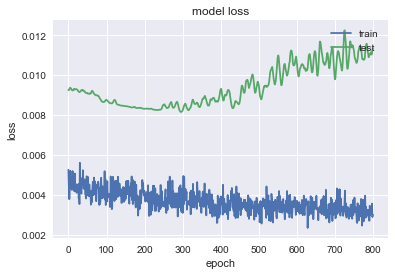

              BBY
MSE       51.6213
MAE       6.42378
R2       -1.10449
MAPE (%)  9.18741


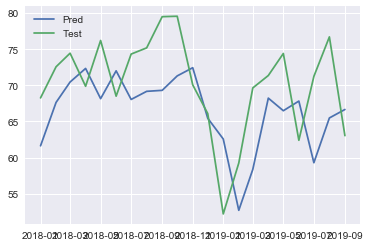

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2193 - val_loss: 0.4556
Epoch 2/1000
0s - loss: 0.1740 - val_loss: 0.3790
Epoch 3/1000
0s - loss: 0.1394 - val_loss: 0.3117
Epoch 4/1000
0s - loss: 0.1078 - val_loss: 0.2521
Epoch 5/1000
0s - loss: 0.0822 - val_loss: 0.1997
Epoch 6/1000
0s - loss: 0.0618 - val_loss: 0.1544
Epoch 7/1000
0s - loss: 0.0429 - val_loss: 0.1163
Epoch 8/1000
0s - loss: 0.0278 - val_loss: 0.0854
Epoch 9/1000
0s - loss: 0.0183 - val_loss: 0.0616
Epoch 10/1000
0s - loss: 0.0133 - val_loss: 0.0446
Epoch 11/1000
0s - loss: 0.0111 - val_loss: 0.0334
Epoch 12/1000
0s - loss: 0.0117 - val_loss: 0.0268
Epoch 13/1000
0s - loss: 0.0119 - val_loss: 0.0236
Epoch 14/1000
0s - loss: 0.0157 - val_loss: 0.0224
Epoch 15/1000
0s - loss: 0.0204 - val_loss: 0.0223
Epoch 16/1000
0s - loss: 0.0197 - val_loss: 0.0223
Epoch 17/1000
0s - loss: 0.0249 - val_loss: 0.0222
Epoch 18/1000
0s - loss: 0.0240 - val_loss: 0.0220
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0052 - val_loss: 0.0268
Epoch 182/1000
0s - loss: 0.0061 - val_loss: 0.0268
Epoch 183/1000
0s - loss: 0.0061 - val_loss: 0.0268
Epoch 184/1000
0s - loss: 0.0049 - val_loss: 0.0267
Epoch 185/1000
0s - loss: 0.0052 - val_loss: 0.0266
Epoch 186/1000
0s - loss: 0.0057 - val_loss: 0.0265
Epoch 187/1000
0s - loss: 0.0045 - val_loss: 0.0262
Epoch 188/1000
0s - loss: 0.0053 - val_loss: 0.0259
Epoch 189/1000
0s - loss: 0.0050 - val_loss: 0.0256
Epoch 190/1000
0s - loss: 0.0047 - val_loss: 0.0254
Epoch 191/1000
0s - loss: 0.0059 - val_loss: 0.0252
Epoch 192/1000
0s - loss: 0.0049 - val_loss: 0.0250
Epoch 193/1000
0s - loss: 0.0054 - val_loss: 0.0249
Epoch 194/1000
0s - loss: 0.0056 - val_loss: 0.0248
Epoch 195/1000
0s - loss: 0.0056 - val_loss: 0.0248
Epoch 196/1000
0s - loss: 0.0055 - val_loss: 0.0248
Epoch 197/1000
0s - loss: 0.0052 - val_loss: 0.0249
Epoch 198/1000
0s - loss: 0.0065 - val_loss: 0.0250
Epoch 199/1000
0s - loss: 0.0057 - val_loss: 0.0251
Epoch 200/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0273
Epoch 362/1000
0s - loss: 0.0040 - val_loss: 0.0274
Epoch 363/1000
0s - loss: 0.0049 - val_loss: 0.0273
Epoch 364/1000
0s - loss: 0.0047 - val_loss: 0.0272
Epoch 365/1000
0s - loss: 0.0030 - val_loss: 0.0272
Epoch 366/1000
0s - loss: 0.0042 - val_loss: 0.0273
Epoch 367/1000
0s - loss: 0.0048 - val_loss: 0.0273
Epoch 368/1000
0s - loss: 0.0040 - val_loss: 0.0273
Epoch 369/1000
0s - loss: 0.0049 - val_loss: 0.0272
Epoch 370/1000
0s - loss: 0.0044 - val_loss: 0.0271
Epoch 371/1000
0s - loss: 0.0039 - val_loss: 0.0270
Epoch 372/1000
0s - loss: 0.0045 - val_loss: 0.0268
Epoch 373/1000
0s - loss: 0.0046 - val_loss: 0.0268
Epoch 374/1000
0s - loss: 0.0050 - val_loss: 0.0268
Epoch 375/1000
0s - loss: 0.0037 - val_loss: 0.0269
Epoch 376/1000
0s - loss: 0.0050 - val_loss: 0.0269
Epoch 377/1000
0s - loss: 0.0046 - val_loss: 0.0269
Epoch 378/1000
0s - loss: 0.0045 - val_loss: 0.0268
Epoch 379/1000
0s - loss: 0.0038 - val_loss: 0.0267
Epoch 380/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0239
Epoch 525/1000
0s - loss: 0.0049 - val_loss: 0.0237
Epoch 526/1000
0s - loss: 0.0046 - val_loss: 0.0235
Epoch 527/1000
0s - loss: 0.0046 - val_loss: 0.0233
Epoch 528/1000
0s - loss: 0.0035 - val_loss: 0.0232
Epoch 529/1000
0s - loss: 0.0037 - val_loss: 0.0230
Epoch 530/1000
0s - loss: 0.0042 - val_loss: 0.0230
Epoch 531/1000
0s - loss: 0.0041 - val_loss: 0.0230
Epoch 532/1000
0s - loss: 0.0042 - val_loss: 0.0231
Epoch 533/1000
0s - loss: 0.0044 - val_loss: 0.0230
Epoch 534/1000
0s - loss: 0.0026 - val_loss: 0.0231
Epoch 535/1000
0s - loss: 0.0048 - val_loss: 0.0231
Epoch 536/1000
0s - loss: 0.0046 - val_loss: 0.0231
Epoch 537/1000
0s - loss: 0.0046 - val_loss: 0.0232
Epoch 538/1000
0s - loss: 0.0054 - val_loss: 0.0234
Epoch 539/1000
0s - loss: 0.0040 - val_loss: 0.0236
Epoch 540/1000
0s - loss: 0.0039 - val_loss: 0.0237
Epoch 541/1000
0s - loss: 0.0044 - val_loss: 0.0237
Epoch 542/1000
0s - loss: 0.0038 - val_loss: 0.0237
Epoch 543/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0203
Epoch 692/1000
0s - loss: 0.0037 - val_loss: 0.0203
Epoch 693/1000
0s - loss: 0.0040 - val_loss: 0.0202
Epoch 694/1000
0s - loss: 0.0039 - val_loss: 0.0201
Epoch 695/1000
0s - loss: 0.0039 - val_loss: 0.0201
Epoch 696/1000
0s - loss: 0.0032 - val_loss: 0.0199
Epoch 697/1000
0s - loss: 0.0036 - val_loss: 0.0200
Epoch 698/1000
0s - loss: 0.0031 - val_loss: 0.0199
Epoch 699/1000
0s - loss: 0.0030 - val_loss: 0.0199
Epoch 700/1000
0s - loss: 0.0037 - val_loss: 0.0197
Epoch 701/1000
0s - loss: 0.0039 - val_loss: 0.0195
Epoch 702/1000
0s - loss: 0.0038 - val_loss: 0.0194
Epoch 703/1000
0s - loss: 0.0036 - val_loss: 0.0194
Epoch 704/1000
0s - loss: 0.0034 - val_loss: 0.0194
Epoch 705/1000
0s - loss: 0.0034 - val_loss: 0.0194
Epoch 706/1000
0s - loss: 0.0035 - val_loss: 0.0193
Epoch 707/1000
0s - loss: 0.0033 - val_loss: 0.0192
Epoch 708/1000
0s - loss: 0.0039 - val_loss: 0.0192
Epoch 709/1000
0s - loss: 0.0035 - val_loss: 0.0193
Epoch 710/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0166
Epoch 877/1000
0s - loss: 0.0033 - val_loss: 0.0168
Epoch 878/1000
0s - loss: 0.0026 - val_loss: 0.0169
Epoch 879/1000
0s - loss: 0.0026 - val_loss: 0.0169
Epoch 880/1000
0s - loss: 0.0031 - val_loss: 0.0169
Epoch 881/1000
0s - loss: 0.0040 - val_loss: 0.0169
Epoch 882/1000
0s - loss: 0.0028 - val_loss: 0.0170
Epoch 883/1000
0s - loss: 0.0024 - val_loss: 0.0169
Epoch 884/1000
0s - loss: 0.0034 - val_loss: 0.0168
Epoch 885/1000
0s - loss: 0.0029 - val_loss: 0.0167
Epoch 886/1000
0s - loss: 0.0034 - val_loss: 0.0165
Epoch 887/1000
0s - loss: 0.0032 - val_loss: 0.0164
Epoch 888/1000
0s - loss: 0.0031 - val_loss: 0.0163
Epoch 889/1000
0s - loss: 0.0027 - val_loss: 0.0161
Epoch 890/1000
0s - loss: 0.0027 - val_loss: 0.0160
Epoch 891/1000
0s - loss: 0.0026 - val_loss: 0.0159
Epoch 892/1000
0s - loss: 0.0039 - val_loss: 0.0158
Epoch 893/1000
0s - loss: 0.0033 - val_loss: 0.0159
Epoch 894/1000
0s - loss: 0.0027 - val_loss: 0.0161
Epoch 895/1000
0s - loss: 0

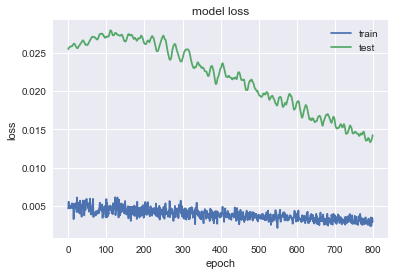

               KO
MSE       12.6634
MAE       2.68593
R2       -5.72287
MAPE (%)  5.45217


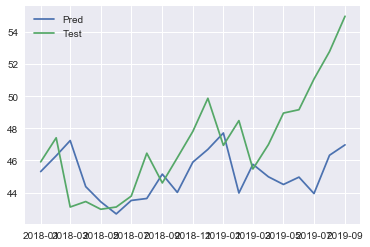

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2841 - val_loss: 0.0221
Epoch 2/1000
0s - loss: 0.2331 - val_loss: 0.0109
Epoch 3/1000
0s - loss: 0.1897 - val_loss: 0.0071
Epoch 4/1000
0s - loss: 0.1548 - val_loss: 0.0103
Epoch 5/1000
0s - loss: 0.1254 - val_loss: 0.0201
Epoch 6/1000
0s - loss: 0.1016 - val_loss: 0.0358
Epoch 7/1000
0s - loss: 0.0807 - val_loss: 0.0567
Epoch 8/1000
0s - loss: 0.0677 - val_loss: 0.0812
Epoch 9/1000
0s - loss: 0.0589 - val_loss: 0.1079
Epoch 10/1000
0s - loss: 0.0538 - val_loss: 0.1345
Epoch 11/1000
0s - loss: 0.0519 - val_loss: 0.1585
Epoch 12/1000
0s - loss: 0.0525 - val_loss: 0.1782
Epoch 13/1000
0s - loss: 0.0505 - val_loss: 0.1917
Epoch 14/1000
0s - loss: 0.0547 - val_loss: 0.1989
Epoch 15/1000
0s - loss: 0.0516 - val_loss: 0.1999
Epoch 16/1000
0s - loss: 0.0581 - val_loss: 0.1948
Epoch 17/1000
0s - loss: 0.0584 - val_loss: 0.1848
Epoch 18/1000
0s - loss: 0.0548 - val_loss: 0.1708
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0094 - val_loss: 0.0044
Epoch 189/1000
0s - loss: 0.0079 - val_loss: 0.0044
Epoch 190/1000
0s - loss: 0.0097 - val_loss: 0.0044
Epoch 191/1000
0s - loss: 0.0100 - val_loss: 0.0045
Epoch 192/1000
0s - loss: 0.0076 - val_loss: 0.0045
Epoch 193/1000
0s - loss: 0.0095 - val_loss: 0.0045
Epoch 194/1000
0s - loss: 0.0091 - val_loss: 0.0045
Epoch 195/1000
0s - loss: 0.0087 - val_loss: 0.0046
Epoch 196/1000
0s - loss: 0.0089 - val_loss: 0.0046
Epoch 197/1000
0s - loss: 0.0097 - val_loss: 0.0046
Epoch 198/1000
0s - loss: 0.0093 - val_loss: 0.0046
Epoch 199/1000
0s - loss: 0.0105 - val_loss: 0.0047
Epoch 200/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 201/1000
0s - loss: 0.0078 - val_loss: 0.0047
Epoch 202/1000
0s - loss: 0.0085 - val_loss: 0.0047
Epoch 203/1000
0s - loss: 0.0082 - val_loss: 0.0046
Epoch 204/1000
0s - loss: 0.0075 - val_loss: 0.0046
Epoch 205/1000
0s - loss: 0.0086 - val_loss: 0.0046
Epoch 206/1000
0s - loss: 0.0083 - val_loss: 0.0046
Epoch 207/1000
0s - loss: 0

0s - loss: 0.0099 - val_loss: 0.0054
Epoch 365/1000
0s - loss: 0.0091 - val_loss: 0.0053
Epoch 366/1000
0s - loss: 0.0077 - val_loss: 0.0053
Epoch 367/1000
0s - loss: 0.0100 - val_loss: 0.0052
Epoch 368/1000
0s - loss: 0.0081 - val_loss: 0.0051
Epoch 369/1000
0s - loss: 0.0086 - val_loss: 0.0051
Epoch 370/1000
0s - loss: 0.0092 - val_loss: 0.0051
Epoch 371/1000
0s - loss: 0.0106 - val_loss: 0.0051
Epoch 372/1000
0s - loss: 0.0084 - val_loss: 0.0051
Epoch 373/1000
0s - loss: 0.0090 - val_loss: 0.0052
Epoch 374/1000
0s - loss: 0.0077 - val_loss: 0.0051
Epoch 375/1000
0s - loss: 0.0108 - val_loss: 0.0052
Epoch 376/1000
0s - loss: 0.0084 - val_loss: 0.0053
Epoch 377/1000
0s - loss: 0.0071 - val_loss: 0.0055
Epoch 378/1000
0s - loss: 0.0088 - val_loss: 0.0055
Epoch 379/1000
0s - loss: 0.0092 - val_loss: 0.0055
Epoch 380/1000
0s - loss: 0.0081 - val_loss: 0.0056
Epoch 381/1000
0s - loss: 0.0094 - val_loss: 0.0056
Epoch 382/1000
0s - loss: 0.0071 - val_loss: 0.0058
Epoch 383/1000
0s - loss: 0

0s - loss: 0.0062 - val_loss: 0.0040
Epoch 533/1000
0s - loss: 0.0071 - val_loss: 0.0040
Epoch 534/1000
0s - loss: 0.0071 - val_loss: 0.0040
Epoch 535/1000
0s - loss: 0.0078 - val_loss: 0.0040
Epoch 536/1000
0s - loss: 0.0084 - val_loss: 0.0040
Epoch 537/1000
0s - loss: 0.0081 - val_loss: 0.0040
Epoch 538/1000
0s - loss: 0.0075 - val_loss: 0.0040
Epoch 539/1000
0s - loss: 0.0082 - val_loss: 0.0040
Epoch 540/1000
0s - loss: 0.0095 - val_loss: 0.0040
Epoch 541/1000
0s - loss: 0.0082 - val_loss: 0.0040
Epoch 542/1000
0s - loss: 0.0098 - val_loss: 0.0040
Epoch 543/1000
0s - loss: 0.0085 - val_loss: 0.0040
Epoch 544/1000
0s - loss: 0.0063 - val_loss: 0.0040
Epoch 545/1000
0s - loss: 0.0075 - val_loss: 0.0040
Epoch 546/1000
0s - loss: 0.0080 - val_loss: 0.0041
Epoch 547/1000
0s - loss: 0.0068 - val_loss: 0.0041
Epoch 548/1000
0s - loss: 0.0092 - val_loss: 0.0041
Epoch 549/1000
0s - loss: 0.0067 - val_loss: 0.0041
Epoch 550/1000
0s - loss: 0.0093 - val_loss: 0.0041
Epoch 551/1000
0s - loss: 0

0s - loss: 0.0078 - val_loss: 0.0039
Epoch 705/1000
0s - loss: 0.0073 - val_loss: 0.0039
Epoch 706/1000
0s - loss: 0.0080 - val_loss: 0.0039
Epoch 707/1000
0s - loss: 0.0088 - val_loss: 0.0039
Epoch 708/1000
0s - loss: 0.0089 - val_loss: 0.0039
Epoch 709/1000
0s - loss: 0.0086 - val_loss: 0.0039
Epoch 710/1000
0s - loss: 0.0070 - val_loss: 0.0039
Epoch 711/1000
0s - loss: 0.0077 - val_loss: 0.0039
Epoch 712/1000
0s - loss: 0.0066 - val_loss: 0.0039
Epoch 713/1000
0s - loss: 0.0084 - val_loss: 0.0039
Epoch 714/1000
0s - loss: 0.0073 - val_loss: 0.0039
Epoch 715/1000
0s - loss: 0.0086 - val_loss: 0.0039
Epoch 716/1000
0s - loss: 0.0091 - val_loss: 0.0039
Epoch 717/1000
0s - loss: 0.0072 - val_loss: 0.0039
Epoch 718/1000
0s - loss: 0.0072 - val_loss: 0.0039
Epoch 719/1000
0s - loss: 0.0064 - val_loss: 0.0040
Epoch 720/1000
0s - loss: 0.0092 - val_loss: 0.0040
Epoch 721/1000
0s - loss: 0.0061 - val_loss: 0.0040
Epoch 722/1000
0s - loss: 0.0087 - val_loss: 0.0040
Epoch 723/1000
0s - loss: 0

0s - loss: 0.0082 - val_loss: 0.0041
Epoch 872/1000
0s - loss: 0.0089 - val_loss: 0.0041
Epoch 873/1000
0s - loss: 0.0075 - val_loss: 0.0041
Epoch 874/1000
0s - loss: 0.0075 - val_loss: 0.0041
Epoch 875/1000
0s - loss: 0.0085 - val_loss: 0.0041
Epoch 876/1000
0s - loss: 0.0068 - val_loss: 0.0041
Epoch 877/1000
0s - loss: 0.0078 - val_loss: 0.0041
Epoch 878/1000
0s - loss: 0.0082 - val_loss: 0.0041
Epoch 879/1000
0s - loss: 0.0070 - val_loss: 0.0042
Epoch 880/1000
0s - loss: 0.0081 - val_loss: 0.0042
Epoch 881/1000
0s - loss: 0.0077 - val_loss: 0.0042
Epoch 882/1000
0s - loss: 0.0070 - val_loss: 0.0042
Epoch 883/1000
0s - loss: 0.0068 - val_loss: 0.0042
Epoch 884/1000
0s - loss: 0.0080 - val_loss: 0.0043
Epoch 885/1000
0s - loss: 0.0078 - val_loss: 0.0043
Epoch 886/1000
0s - loss: 0.0071 - val_loss: 0.0043
Epoch 887/1000
0s - loss: 0.0073 - val_loss: 0.0042
Epoch 888/1000
0s - loss: 0.0086 - val_loss: 0.0043
Epoch 889/1000
0s - loss: 0.0084 - val_loss: 0.0043
Epoch 890/1000
0s - loss: 0

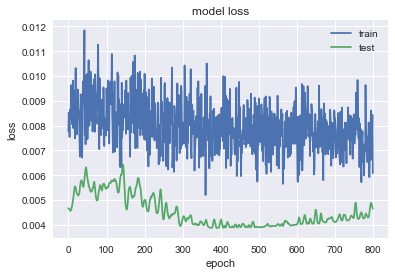

               FTI
MSE        8.50468
MAE        2.43574
R2        0.232049
MAPE (%)   9.06253


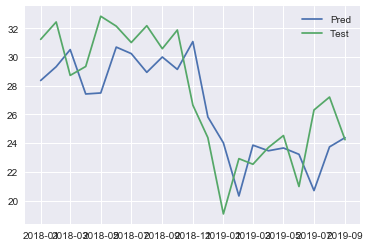

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1703 - val_loss: 0.6142
Epoch 2/1000
0s - loss: 0.1320 - val_loss: 0.5226
Epoch 3/1000
0s - loss: 0.0987 - val_loss: 0.4436
Epoch 4/1000
0s - loss: 0.0788 - val_loss: 0.3746
Epoch 5/1000
0s - loss: 0.0585 - val_loss: 0.3142
Epoch 6/1000
0s - loss: 0.0464 - val_loss: 0.2616
Epoch 7/1000
0s - loss: 0.0364 - val_loss: 0.2161
Epoch 8/1000
0s - loss: 0.0289 - val_loss: 0.1775
Epoch 9/1000
0s - loss: 0.0266 - val_loss: 0.1456
Epoch 10/1000
0s - loss: 0.0240 - val_loss: 0.1198
Epoch 11/1000
0s - loss: 0.0219 - val_loss: 0.0997
Epoch 12/1000
0s - loss: 0.0246 - val_loss: 0.0845
Epoch 13/1000
0s - loss: 0.0289 - val_loss: 0.0737
Epoch 14/1000
0s - loss: 0.0262 - val_loss: 0.0666
Epoch 15/1000
0s - loss: 0.0289 - val_loss: 0.0621
Epoch 16/1000
0s - loss: 0.0265 - val_loss: 0.0600
Epoch 17/1000
0s - loss: 0.0270 - val_loss: 0.0596
Epoch 18/1000
0s - loss: 0.0258 - val_loss: 0.0609
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0046 - val_loss: 0.0121
Epoch 180/1000
0s - loss: 0.0051 - val_loss: 0.0121
Epoch 181/1000
0s - loss: 0.0035 - val_loss: 0.0121
Epoch 182/1000
0s - loss: 0.0036 - val_loss: 0.0120
Epoch 183/1000
0s - loss: 0.0055 - val_loss: 0.0120
Epoch 184/1000
0s - loss: 0.0046 - val_loss: 0.0120
Epoch 185/1000
0s - loss: 0.0037 - val_loss: 0.0120
Epoch 186/1000
0s - loss: 0.0042 - val_loss: 0.0120
Epoch 187/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 188/1000
0s - loss: 0.0044 - val_loss: 0.0120
Epoch 189/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 190/1000
0s - loss: 0.0045 - val_loss: 0.0120
Epoch 191/1000
0s - loss: 0.0042 - val_loss: 0.0120
Epoch 192/1000
0s - loss: 0.0040 - val_loss: 0.0120
Epoch 193/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 194/1000
0s - loss: 0.0036 - val_loss: 0.0120
Epoch 195/1000
0s - loss: 0.0040 - val_loss: 0.0120
Epoch 196/1000
0s - loss: 0.0031 - val_loss: 0.0120
Epoch 197/1000
0s - loss: 0.0047 - val_loss: 0.0120
Epoch 198/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0120
Epoch 360/1000
0s - loss: 0.0038 - val_loss: 0.0120
Epoch 361/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 362/1000
0s - loss: 0.0028 - val_loss: 0.0120
Epoch 363/1000
0s - loss: 0.0021 - val_loss: 0.0120
Epoch 364/1000
0s - loss: 0.0033 - val_loss: 0.0120
Epoch 365/1000
0s - loss: 0.0031 - val_loss: 0.0120
Epoch 366/1000
0s - loss: 0.0029 - val_loss: 0.0120
Epoch 367/1000
0s - loss: 0.0027 - val_loss: 0.0120
Epoch 368/1000
0s - loss: 0.0035 - val_loss: 0.0120
Epoch 369/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 370/1000
0s - loss: 0.0034 - val_loss: 0.0120
Epoch 371/1000
0s - loss: 0.0033 - val_loss: 0.0120
Epoch 372/1000
0s - loss: 0.0031 - val_loss: 0.0120
Epoch 373/1000
0s - loss: 0.0040 - val_loss: 0.0119
Epoch 374/1000
0s - loss: 0.0035 - val_loss: 0.0119
Epoch 375/1000
0s - loss: 0.0031 - val_loss: 0.0119
Epoch 376/1000
0s - loss: 0.0036 - val_loss: 0.0119
Epoch 377/1000
0s - loss: 0.0032 - val_loss: 0.0118
Epoch 378/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0120
Epoch 539/1000
0s - loss: 0.0027 - val_loss: 0.0120
Epoch 540/1000
0s - loss: 0.0026 - val_loss: 0.0120
Epoch 541/1000
0s - loss: 0.0024 - val_loss: 0.0120
Epoch 542/1000
0s - loss: 0.0032 - val_loss: 0.0119
Epoch 543/1000
0s - loss: 0.0029 - val_loss: 0.0119
Epoch 544/1000
0s - loss: 0.0029 - val_loss: 0.0118
Epoch 545/1000
0s - loss: 0.0029 - val_loss: 0.0117
Epoch 546/1000
0s - loss: 0.0030 - val_loss: 0.0117
Epoch 547/1000
0s - loss: 0.0023 - val_loss: 0.0116
Epoch 548/1000
0s - loss: 0.0027 - val_loss: 0.0116
Epoch 549/1000
0s - loss: 0.0026 - val_loss: 0.0116
Epoch 550/1000
0s - loss: 0.0032 - val_loss: 0.0116
Epoch 551/1000
0s - loss: 0.0035 - val_loss: 0.0116
Epoch 552/1000
0s - loss: 0.0023 - val_loss: 0.0117
Epoch 553/1000
0s - loss: 0.0034 - val_loss: 0.0119
Epoch 554/1000
0s - loss: 0.0028 - val_loss: 0.0119
Epoch 555/1000
0s - loss: 0.0031 - val_loss: 0.0120
Epoch 556/1000
0s - loss: 0.0029 - val_loss: 0.0119
Epoch 557/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0116
Epoch 719/1000
0s - loss: 0.0028 - val_loss: 0.0116
Epoch 720/1000
0s - loss: 0.0020 - val_loss: 0.0116
Epoch 721/1000
0s - loss: 0.0036 - val_loss: 0.0117
Epoch 722/1000
0s - loss: 0.0026 - val_loss: 0.0116
Epoch 723/1000
0s - loss: 0.0027 - val_loss: 0.0115
Epoch 724/1000
0s - loss: 0.0019 - val_loss: 0.0114
Epoch 725/1000
0s - loss: 0.0021 - val_loss: 0.0114
Epoch 726/1000
0s - loss: 0.0027 - val_loss: 0.0113
Epoch 727/1000
0s - loss: 0.0022 - val_loss: 0.0113
Epoch 728/1000
0s - loss: 0.0027 - val_loss: 0.0113
Epoch 729/1000
0s - loss: 0.0022 - val_loss: 0.0113
Epoch 730/1000
0s - loss: 0.0023 - val_loss: 0.0113
Epoch 731/1000
0s - loss: 0.0019 - val_loss: 0.0114
Epoch 732/1000
0s - loss: 0.0026 - val_loss: 0.0114
Epoch 733/1000
0s - loss: 0.0021 - val_loss: 0.0115
Epoch 734/1000
0s - loss: 0.0025 - val_loss: 0.0115
Epoch 735/1000
0s - loss: 0.0024 - val_loss: 0.0116
Epoch 736/1000
0s - loss: 0.0023 - val_loss: 0.0116
Epoch 737/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0108
Epoch 895/1000
0s - loss: 0.0020 - val_loss: 0.0108
Epoch 896/1000
0s - loss: 0.0023 - val_loss: 0.0108
Epoch 897/1000
0s - loss: 0.0028 - val_loss: 0.0108
Epoch 898/1000
0s - loss: 0.0029 - val_loss: 0.0108
Epoch 899/1000
0s - loss: 0.0024 - val_loss: 0.0108
Epoch 900/1000
0s - loss: 0.0024 - val_loss: 0.0109
Epoch 901/1000
0s - loss: 0.0024 - val_loss: 0.0110
Epoch 902/1000
0s - loss: 0.0020 - val_loss: 0.0111
Epoch 903/1000
0s - loss: 0.0020 - val_loss: 0.0112
Epoch 904/1000
0s - loss: 0.0026 - val_loss: 0.0111
Epoch 905/1000
0s - loss: 0.0024 - val_loss: 0.0110
Epoch 906/1000
0s - loss: 0.0023 - val_loss: 0.0110
Epoch 907/1000
0s - loss: 0.0024 - val_loss: 0.0109
Epoch 908/1000
0s - loss: 0.0031 - val_loss: 0.0107
Epoch 909/1000
0s - loss: 0.0022 - val_loss: 0.0107
Epoch 910/1000
0s - loss: 0.0025 - val_loss: 0.0107
Epoch 911/1000
0s - loss: 0.0027 - val_loss: 0.0107
Epoch 912/1000
0s - loss: 0.0023 - val_loss: 0.0108
Epoch 913/1000
0s - loss: 0

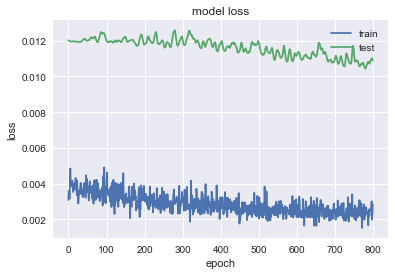

               BLK
MSE        1889.76
MAE        33.9378
R2       -0.365247
MAPE (%)   7.54505


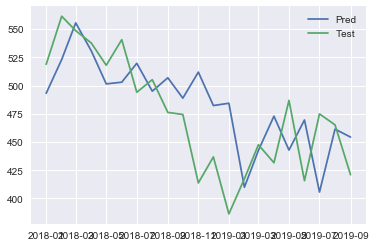

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3396 - val_loss: 0.2784
Epoch 2/1000
0s - loss: 0.2784 - val_loss: 0.2131
Epoch 3/1000
0s - loss: 0.2334 - val_loss: 0.1590
Epoch 4/1000
0s - loss: 0.1954 - val_loss: 0.1145
Epoch 5/1000
0s - loss: 0.1493 - val_loss: 0.0787
Epoch 6/1000
0s - loss: 0.1237 - val_loss: 0.0510
Epoch 7/1000
0s - loss: 0.0973 - val_loss: 0.0313
Epoch 8/1000
0s - loss: 0.0778 - val_loss: 0.0193
Epoch 9/1000
0s - loss: 0.0632 - val_loss: 0.0148
Epoch 10/1000
0s - loss: 0.0480 - val_loss: 0.0172
Epoch 11/1000
0s - loss: 0.0390 - val_loss: 0.0255
Epoch 12/1000
0s - loss: 0.0371 - val_loss: 0.0382
Epoch 13/1000
0s - loss: 0.0338 - val_loss: 0.0538
Epoch 14/1000
0s - loss: 0.0362 - val_loss: 0.0700
Epoch 15/1000
0s - loss: 0.0368 - val_loss: 0.0849
Epoch 16/1000
0s - loss: 0.0442 - val_loss: 0.0971
Epoch 17/1000
0s - loss: 0.0466 - val_loss: 0.1056
Epoch 18/1000
0s - loss: 0.0460 - val_loss: 0.1096
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0052 - val_loss: 0.0202
Epoch 178/1000
0s - loss: 0.0049 - val_loss: 0.0197
Epoch 179/1000
0s - loss: 0.0078 - val_loss: 0.0193
Epoch 180/1000
0s - loss: 0.0073 - val_loss: 0.0189
Epoch 181/1000
0s - loss: 0.0075 - val_loss: 0.0185
Epoch 182/1000
0s - loss: 0.0057 - val_loss: 0.0184
Epoch 183/1000
0s - loss: 0.0081 - val_loss: 0.0183
Epoch 184/1000
0s - loss: 0.0063 - val_loss: 0.0182
Epoch 185/1000
0s - loss: 0.0086 - val_loss: 0.0182
Epoch 186/1000
0s - loss: 0.0049 - val_loss: 0.0182
Epoch 187/1000
0s - loss: 0.0056 - val_loss: 0.0183
Epoch 188/1000
0s - loss: 0.0062 - val_loss: 0.0185
Epoch 189/1000
0s - loss: 0.0077 - val_loss: 0.0189
Epoch 190/1000
0s - loss: 0.0062 - val_loss: 0.0192
Epoch 191/1000
0s - loss: 0.0053 - val_loss: 0.0195
Epoch 192/1000
0s - loss: 0.0057 - val_loss: 0.0196
Epoch 193/1000
0s - loss: 0.0095 - val_loss: 0.0195
Epoch 194/1000
0s - loss: 0.0060 - val_loss: 0.0192
Epoch 195/1000
0s - loss: 0.0062 - val_loss: 0.0191
Epoch 196/1000
0s - loss: 0

0s - loss: 0.0047 - val_loss: 0.0216
Epoch 358/1000
0s - loss: 0.0062 - val_loss: 0.0212
Epoch 359/1000
0s - loss: 0.0056 - val_loss: 0.0210
Epoch 360/1000
0s - loss: 0.0062 - val_loss: 0.0207
Epoch 361/1000
0s - loss: 0.0078 - val_loss: 0.0204
Epoch 362/1000
0s - loss: 0.0054 - val_loss: 0.0201
Epoch 363/1000
0s - loss: 0.0059 - val_loss: 0.0200
Epoch 364/1000
0s - loss: 0.0059 - val_loss: 0.0199
Epoch 365/1000
0s - loss: 0.0057 - val_loss: 0.0200
Epoch 366/1000
0s - loss: 0.0073 - val_loss: 0.0202
Epoch 367/1000
0s - loss: 0.0057 - val_loss: 0.0204
Epoch 368/1000
0s - loss: 0.0056 - val_loss: 0.0206
Epoch 369/1000
0s - loss: 0.0060 - val_loss: 0.0209
Epoch 370/1000
0s - loss: 0.0062 - val_loss: 0.0210
Epoch 371/1000
0s - loss: 0.0068 - val_loss: 0.0211
Epoch 372/1000
0s - loss: 0.0083 - val_loss: 0.0214
Epoch 373/1000
0s - loss: 0.0078 - val_loss: 0.0215
Epoch 374/1000
0s - loss: 0.0068 - val_loss: 0.0217
Epoch 375/1000
0s - loss: 0.0045 - val_loss: 0.0218
Epoch 376/1000
0s - loss: 0

0s - loss: 0.0057 - val_loss: 0.0248
Epoch 536/1000
0s - loss: 0.0058 - val_loss: 0.0244
Epoch 537/1000
0s - loss: 0.0055 - val_loss: 0.0239
Epoch 538/1000
0s - loss: 0.0059 - val_loss: 0.0235
Epoch 539/1000
0s - loss: 0.0056 - val_loss: 0.0231
Epoch 540/1000
0s - loss: 0.0047 - val_loss: 0.0228
Epoch 541/1000
0s - loss: 0.0049 - val_loss: 0.0227
Epoch 542/1000
0s - loss: 0.0081 - val_loss: 0.0226
Epoch 543/1000
0s - loss: 0.0045 - val_loss: 0.0228
Epoch 544/1000
0s - loss: 0.0064 - val_loss: 0.0229
Epoch 545/1000
0s - loss: 0.0063 - val_loss: 0.0230
Epoch 546/1000
0s - loss: 0.0051 - val_loss: 0.0232
Epoch 547/1000
0s - loss: 0.0053 - val_loss: 0.0236
Epoch 548/1000
0s - loss: 0.0050 - val_loss: 0.0237
Epoch 549/1000
0s - loss: 0.0039 - val_loss: 0.0241
Epoch 550/1000
0s - loss: 0.0061 - val_loss: 0.0243
Epoch 551/1000
0s - loss: 0.0050 - val_loss: 0.0245
Epoch 552/1000
0s - loss: 0.0050 - val_loss: 0.0245
Epoch 553/1000
0s - loss: 0.0049 - val_loss: 0.0244
Epoch 554/1000
0s - loss: 0

0s - loss: 0.0061 - val_loss: 0.0248
Epoch 715/1000
0s - loss: 0.0040 - val_loss: 0.0250
Epoch 716/1000
0s - loss: 0.0052 - val_loss: 0.0252
Epoch 717/1000
0s - loss: 0.0062 - val_loss: 0.0257
Epoch 718/1000
0s - loss: 0.0045 - val_loss: 0.0261
Epoch 719/1000
0s - loss: 0.0058 - val_loss: 0.0262
Epoch 720/1000
0s - loss: 0.0061 - val_loss: 0.0262
Epoch 721/1000
0s - loss: 0.0048 - val_loss: 0.0264
Epoch 722/1000
0s - loss: 0.0053 - val_loss: 0.0264
Epoch 723/1000
0s - loss: 0.0067 - val_loss: 0.0263
Epoch 724/1000
0s - loss: 0.0057 - val_loss: 0.0260
Epoch 725/1000
0s - loss: 0.0047 - val_loss: 0.0259
Epoch 726/1000
0s - loss: 0.0054 - val_loss: 0.0258
Epoch 727/1000
0s - loss: 0.0062 - val_loss: 0.0254
Epoch 728/1000
0s - loss: 0.0053 - val_loss: 0.0250
Epoch 729/1000
0s - loss: 0.0059 - val_loss: 0.0249
Epoch 730/1000
0s - loss: 0.0049 - val_loss: 0.0251
Epoch 731/1000
0s - loss: 0.0062 - val_loss: 0.0254
Epoch 732/1000
0s - loss: 0.0054 - val_loss: 0.0256
Epoch 733/1000
0s - loss: 0

0s - loss: 0.0051 - val_loss: 0.0281
Epoch 893/1000
0s - loss: 0.0053 - val_loss: 0.0291
Epoch 894/1000
0s - loss: 0.0055 - val_loss: 0.0296
Epoch 895/1000
0s - loss: 0.0059 - val_loss: 0.0298
Epoch 896/1000
0s - loss: 0.0049 - val_loss: 0.0295
Epoch 897/1000
0s - loss: 0.0066 - val_loss: 0.0292
Epoch 898/1000
0s - loss: 0.0056 - val_loss: 0.0288
Epoch 899/1000
0s - loss: 0.0044 - val_loss: 0.0285
Epoch 900/1000
0s - loss: 0.0045 - val_loss: 0.0285
Epoch 901/1000
0s - loss: 0.0052 - val_loss: 0.0288
Epoch 902/1000
0s - loss: 0.0059 - val_loss: 0.0289
Epoch 903/1000
0s - loss: 0.0044 - val_loss: 0.0292
Epoch 904/1000
0s - loss: 0.0044 - val_loss: 0.0294
Epoch 905/1000
0s - loss: 0.0047 - val_loss: 0.0295
Epoch 906/1000
0s - loss: 0.0043 - val_loss: 0.0293
Epoch 907/1000
0s - loss: 0.0048 - val_loss: 0.0288
Epoch 908/1000
0s - loss: 0.0047 - val_loss: 0.0283
Epoch 909/1000
0s - loss: 0.0038 - val_loss: 0.0280
Epoch 910/1000
0s - loss: 0.0049 - val_loss: 0.0279
Epoch 911/1000
0s - loss: 0

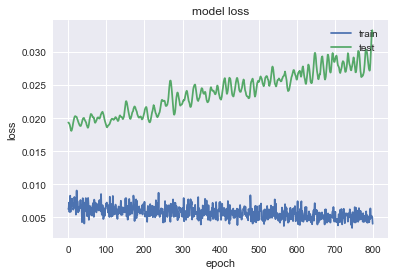

              DVA
MSE       97.5147
MAE       7.97664
R2       -2.94273
MAPE (%)  13.8998


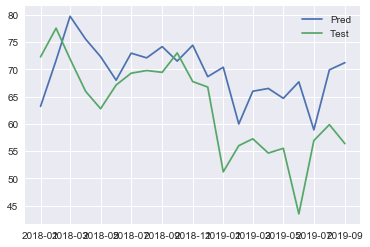

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0306 - val_loss: 0.4207
Epoch 2/1000
0s - loss: 0.0187 - val_loss: 0.3456
Epoch 3/1000
0s - loss: 0.0110 - val_loss: 0.2887
Epoch 4/1000
0s - loss: 0.0094 - val_loss: 0.2475
Epoch 5/1000
0s - loss: 0.0091 - val_loss: 0.2191
Epoch 6/1000
0s - loss: 0.0095 - val_loss: 0.2003
Epoch 7/1000
0s - loss: 0.0099 - val_loss: 0.1899
Epoch 8/1000
0s - loss: 0.0103 - val_loss: 0.1860
Epoch 9/1000
0s - loss: 0.0107 - val_loss: 0.1865
Epoch 10/1000
0s - loss: 0.0094 - val_loss: 0.1905
Epoch 11/1000
0s - loss: 0.0078 - val_loss: 0.1965
Epoch 12/1000
0s - loss: 0.0063 - val_loss: 0.2029
Epoch 13/1000
0s - loss: 0.0057 - val_loss: 0.2087
Epoch 14/1000
0s - loss: 0.0060 - val_loss: 0.2129
Epoch 15/1000
0s - loss: 0.0051 - val_loss: 0.2155
Epoch 16/1000
0s - loss: 0.0043 - val_loss: 0.2161
Epoch 17/1000
0s - loss: 0.0046 - val_loss: 0.2144
Epoch 18/1000
0s - loss: 0.0045 - val_loss: 0.2108
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0012 - val_loss: 0.0515
Epoch 172/1000
0s - loss: 0.0016 - val_loss: 0.0511
Epoch 173/1000
0s - loss: 0.0014 - val_loss: 0.0509
Epoch 174/1000
0s - loss: 0.0014 - val_loss: 0.0508
Epoch 175/1000
0s - loss: 9.0590e-04 - val_loss: 0.0509
Epoch 176/1000
0s - loss: 0.0014 - val_loss: 0.0510
Epoch 177/1000
0s - loss: 0.0012 - val_loss: 0.0509
Epoch 178/1000
0s - loss: 0.0012 - val_loss: 0.0511
Epoch 179/1000
0s - loss: 0.0015 - val_loss: 0.0515
Epoch 180/1000
0s - loss: 0.0014 - val_loss: 0.0522
Epoch 181/1000
0s - loss: 0.0013 - val_loss: 0.0532
Epoch 182/1000
0s - loss: 0.0011 - val_loss: 0.0540
Epoch 183/1000
0s - loss: 9.1050e-04 - val_loss: 0.0545
Epoch 184/1000
0s - loss: 0.0014 - val_loss: 0.0545
Epoch 185/1000
0s - loss: 0.0013 - val_loss: 0.0543
Epoch 186/1000
0s - loss: 0.0017 - val_loss: 0.0536
Epoch 187/1000
0s - loss: 0.0012 - val_loss: 0.0532
Epoch 188/1000
0s - loss: 0.0018 - val_loss: 0.0525
Epoch 189/1000
0s - loss: 0.0011 - val_loss: 0.0519
Epoch 190/1000
0s -

0s - loss: 9.8476e-04 - val_loss: 0.0373
Epoch 346/1000
0s - loss: 0.0012 - val_loss: 0.0379
Epoch 347/1000
0s - loss: 9.8495e-04 - val_loss: 0.0387
Epoch 348/1000
0s - loss: 9.0850e-04 - val_loss: 0.0394
Epoch 349/1000
0s - loss: 9.2055e-04 - val_loss: 0.0400
Epoch 350/1000
0s - loss: 0.0011 - val_loss: 0.0402
Epoch 351/1000
0s - loss: 0.0011 - val_loss: 0.0400
Epoch 352/1000
0s - loss: 9.7266e-04 - val_loss: 0.0397
Epoch 353/1000
0s - loss: 0.0012 - val_loss: 0.0391
Epoch 354/1000
0s - loss: 0.0013 - val_loss: 0.0382
Epoch 355/1000
0s - loss: 8.4500e-04 - val_loss: 0.0375
Epoch 356/1000
0s - loss: 0.0011 - val_loss: 0.0371
Epoch 357/1000
0s - loss: 9.1525e-04 - val_loss: 0.0369
Epoch 358/1000
0s - loss: 0.0010 - val_loss: 0.0366
Epoch 359/1000
0s - loss: 7.6763e-04 - val_loss: 0.0366
Epoch 360/1000
0s - loss: 7.6343e-04 - val_loss: 0.0366
Epoch 361/1000
0s - loss: 9.8035e-04 - val_loss: 0.0368
Epoch 362/1000
0s - loss: 0.0013 - val_loss: 0.0369
Epoch 363/1000
0s - loss: 9.1416e-04 - 

0s - loss: 8.2105e-04 - val_loss: 0.0253
Epoch 519/1000
0s - loss: 7.4457e-04 - val_loss: 0.0251
Epoch 520/1000
0s - loss: 9.1888e-04 - val_loss: 0.0250
Epoch 521/1000
0s - loss: 9.3049e-04 - val_loss: 0.0249
Epoch 522/1000
0s - loss: 8.2245e-04 - val_loss: 0.0249
Epoch 523/1000
0s - loss: 7.2652e-04 - val_loss: 0.0252
Epoch 524/1000
0s - loss: 7.1259e-04 - val_loss: 0.0254
Epoch 525/1000
0s - loss: 8.1487e-04 - val_loss: 0.0258
Epoch 526/1000
0s - loss: 6.2533e-04 - val_loss: 0.0260
Epoch 527/1000
0s - loss: 6.7931e-04 - val_loss: 0.0261
Epoch 528/1000
0s - loss: 8.7076e-04 - val_loss: 0.0258
Epoch 529/1000
0s - loss: 0.0011 - val_loss: 0.0251
Epoch 530/1000
0s - loss: 8.7098e-04 - val_loss: 0.0246
Epoch 531/1000
0s - loss: 7.2600e-04 - val_loss: 0.0240
Epoch 532/1000
0s - loss: 6.5481e-04 - val_loss: 0.0234
Epoch 533/1000
0s - loss: 9.0732e-04 - val_loss: 0.0232
Epoch 534/1000
0s - loss: 8.5673e-04 - val_loss: 0.0233
Epoch 535/1000
0s - loss: 9.2824e-04 - val_loss: 0.0234
Epoch 536/1

0s - loss: 7.5658e-04 - val_loss: 0.0180
Epoch 690/1000
0s - loss: 6.1902e-04 - val_loss: 0.0180
Epoch 691/1000
0s - loss: 5.8047e-04 - val_loss: 0.0180
Epoch 692/1000
0s - loss: 5.9172e-04 - val_loss: 0.0179
Epoch 693/1000
0s - loss: 7.6383e-04 - val_loss: 0.0182
Epoch 694/1000
0s - loss: 6.3840e-04 - val_loss: 0.0186
Epoch 695/1000
0s - loss: 7.5021e-04 - val_loss: 0.0189
Epoch 696/1000
0s - loss: 8.4044e-04 - val_loss: 0.0191
Epoch 697/1000
0s - loss: 8.4588e-04 - val_loss: 0.0192
Epoch 698/1000
0s - loss: 9.4614e-04 - val_loss: 0.0193
Epoch 699/1000
0s - loss: 6.8948e-04 - val_loss: 0.0193
Epoch 700/1000
0s - loss: 8.5446e-04 - val_loss: 0.0193
Epoch 701/1000
0s - loss: 8.7583e-04 - val_loss: 0.0189
Epoch 702/1000
0s - loss: 0.0010 - val_loss: 0.0182
Epoch 703/1000
0s - loss: 5.7017e-04 - val_loss: 0.0175
Epoch 704/1000
0s - loss: 8.7017e-04 - val_loss: 0.0169
Epoch 705/1000
0s - loss: 7.8591e-04 - val_loss: 0.0167
Epoch 706/1000
0s - loss: 5.4835e-04 - val_loss: 0.0166
Epoch 707/1

0s - loss: 8.1752e-04 - val_loss: 0.0144
Epoch 842/1000
0s - loss: 9.9735e-04 - val_loss: 0.0141
Epoch 843/1000
0s - loss: 6.1181e-04 - val_loss: 0.0140
Epoch 844/1000
0s - loss: 7.4483e-04 - val_loss: 0.0141
Epoch 845/1000
0s - loss: 6.1635e-04 - val_loss: 0.0140
Epoch 846/1000
0s - loss: 6.7611e-04 - val_loss: 0.0139
Epoch 847/1000
0s - loss: 5.9101e-04 - val_loss: 0.0137
Epoch 848/1000
0s - loss: 5.2608e-04 - val_loss: 0.0133
Epoch 849/1000
0s - loss: 5.3150e-04 - val_loss: 0.0133
Epoch 850/1000
0s - loss: 5.6020e-04 - val_loss: 0.0132
Epoch 851/1000
0s - loss: 8.9384e-04 - val_loss: 0.0130
Epoch 852/1000
0s - loss: 4.8536e-04 - val_loss: 0.0129
Epoch 853/1000
0s - loss: 8.2244e-04 - val_loss: 0.0131
Epoch 854/1000
0s - loss: 7.0525e-04 - val_loss: 0.0132
Epoch 855/1000
0s - loss: 6.7935e-04 - val_loss: 0.0133
Epoch 856/1000
0s - loss: 7.3700e-04 - val_loss: 0.0134
Epoch 857/1000
0s - loss: 6.6281e-04 - val_loss: 0.0135
Epoch 858/1000
0s - loss: 5.3328e-04 - val_loss: 0.0137
Epoch 8

0s - loss: 6.6401e-04 - val_loss: 0.0109
Epoch 994/1000
0s - loss: 6.7293e-04 - val_loss: 0.0111
Epoch 995/1000
0s - loss: 5.8951e-04 - val_loss: 0.0111
Epoch 996/1000
0s - loss: 6.1401e-04 - val_loss: 0.0110
Epoch 997/1000
0s - loss: 6.1690e-04 - val_loss: 0.0108
Epoch 998/1000
0s - loss: 9.4590e-04 - val_loss: 0.0107
Epoch 999/1000
0s - loss: 5.0991e-04 - val_loss: 0.0107
Epoch 1000/1000
0s - loss: 6.4243e-04 - val_loss: 0.0107


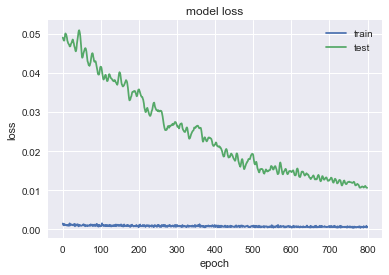

               BA
MSE       1622.82
MAE       29.2847
R2       -1.35987
MAPE (%)  7.91287


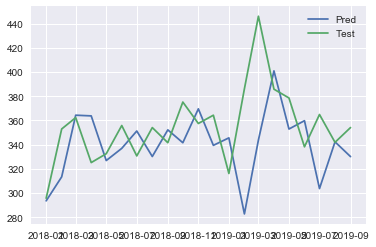

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3266 - val_loss: 0.0209
Epoch 2/1000
0s - loss: 0.2691 - val_loss: 0.0150
Epoch 3/1000
0s - loss: 0.2247 - val_loss: 0.0180
Epoch 4/1000
0s - loss: 0.1905 - val_loss: 0.0296
Epoch 5/1000
0s - loss: 0.1577 - val_loss: 0.0499
Epoch 6/1000
0s - loss: 0.1332 - val_loss: 0.0786
Epoch 7/1000
0s - loss: 0.1052 - val_loss: 0.1145
Epoch 8/1000
0s - loss: 0.0903 - val_loss: 0.1560
Epoch 9/1000
0s - loss: 0.0801 - val_loss: 0.2000
Epoch 10/1000
0s - loss: 0.0699 - val_loss: 0.2434
Epoch 11/1000
0s - loss: 0.0660 - val_loss: 0.2833
Epoch 12/1000
0s - loss: 0.0675 - val_loss: 0.3155
Epoch 13/1000
0s - loss: 0.0707 - val_loss: 0.3376
Epoch 14/1000
0s - loss: 0.0784 - val_loss: 0.3483
Epoch 15/1000
0s - loss: 0.0705 - val_loss: 0.3485
Epoch 16/1000
0s - loss: 0.0697 - val_loss: 0.3399
Epoch 17/1000
0s - loss: 0.0706 - val_loss: 0.3238
Epoch 18/1000
0s - loss: 0.0710 - val_loss: 0.3021
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0098 - val_loss: 0.0287
Epoch 180/1000
0s - loss: 0.0090 - val_loss: 0.0288
Epoch 181/1000
0s - loss: 0.0098 - val_loss: 0.0288
Epoch 182/1000
0s - loss: 0.0091 - val_loss: 0.0287
Epoch 183/1000
0s - loss: 0.0088 - val_loss: 0.0285
Epoch 184/1000
0s - loss: 0.0084 - val_loss: 0.0283
Epoch 185/1000
0s - loss: 0.0100 - val_loss: 0.0282
Epoch 186/1000
0s - loss: 0.0103 - val_loss: 0.0282
Epoch 187/1000
0s - loss: 0.0082 - val_loss: 0.0283
Epoch 188/1000
0s - loss: 0.0087 - val_loss: 0.0283
Epoch 189/1000
0s - loss: 0.0091 - val_loss: 0.0283
Epoch 190/1000
0s - loss: 0.0094 - val_loss: 0.0283
Epoch 191/1000
0s - loss: 0.0105 - val_loss: 0.0283
Epoch 192/1000
0s - loss: 0.0093 - val_loss: 0.0283
Epoch 193/1000
0s - loss: 0.0081 - val_loss: 0.0285
Epoch 194/1000
0s - loss: 0.0088 - val_loss: 0.0289
Epoch 195/1000
0s - loss: 0.0092 - val_loss: 0.0292
Epoch 196/1000
0s - loss: 0.0085 - val_loss: 0.0294
Epoch 197/1000
0s - loss: 0.0066 - val_loss: 0.0297
Epoch 198/1000
0s - loss: 0

0s - loss: 0.0066 - val_loss: 0.0276
Epoch 358/1000
0s - loss: 0.0077 - val_loss: 0.0273
Epoch 359/1000
0s - loss: 0.0066 - val_loss: 0.0270
Epoch 360/1000
0s - loss: 0.0090 - val_loss: 0.0266
Epoch 361/1000
0s - loss: 0.0090 - val_loss: 0.0266
Epoch 362/1000
0s - loss: 0.0075 - val_loss: 0.0265
Epoch 363/1000
0s - loss: 0.0075 - val_loss: 0.0264
Epoch 364/1000
0s - loss: 0.0086 - val_loss: 0.0263
Epoch 365/1000
0s - loss: 0.0070 - val_loss: 0.0263
Epoch 366/1000
0s - loss: 0.0067 - val_loss: 0.0265
Epoch 367/1000
0s - loss: 0.0097 - val_loss: 0.0267
Epoch 368/1000
0s - loss: 0.0066 - val_loss: 0.0270
Epoch 369/1000
0s - loss: 0.0086 - val_loss: 0.0272
Epoch 370/1000
0s - loss: 0.0067 - val_loss: 0.0273
Epoch 371/1000
0s - loss: 0.0084 - val_loss: 0.0277
Epoch 372/1000
0s - loss: 0.0084 - val_loss: 0.0279
Epoch 373/1000
0s - loss: 0.0086 - val_loss: 0.0278
Epoch 374/1000
0s - loss: 0.0093 - val_loss: 0.0277
Epoch 375/1000
0s - loss: 0.0080 - val_loss: 0.0273
Epoch 376/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0250
Epoch 527/1000
0s - loss: 0.0085 - val_loss: 0.0248
Epoch 528/1000
0s - loss: 0.0066 - val_loss: 0.0246
Epoch 529/1000
0s - loss: 0.0069 - val_loss: 0.0243
Epoch 530/1000
0s - loss: 0.0055 - val_loss: 0.0240
Epoch 531/1000
0s - loss: 0.0078 - val_loss: 0.0238
Epoch 532/1000
0s - loss: 0.0071 - val_loss: 0.0236
Epoch 533/1000
0s - loss: 0.0075 - val_loss: 0.0234
Epoch 534/1000
0s - loss: 0.0075 - val_loss: 0.0233
Epoch 535/1000
0s - loss: 0.0073 - val_loss: 0.0233
Epoch 536/1000
0s - loss: 0.0064 - val_loss: 0.0231
Epoch 537/1000
0s - loss: 0.0072 - val_loss: 0.0232
Epoch 538/1000
0s - loss: 0.0099 - val_loss: 0.0231
Epoch 539/1000
0s - loss: 0.0075 - val_loss: 0.0231
Epoch 540/1000
0s - loss: 0.0071 - val_loss: 0.0229
Epoch 541/1000
0s - loss: 0.0097 - val_loss: 0.0229
Epoch 542/1000
0s - loss: 0.0070 - val_loss: 0.0229
Epoch 543/1000
0s - loss: 0.0059 - val_loss: 0.0229
Epoch 544/1000
0s - loss: 0.0073 - val_loss: 0.0229
Epoch 545/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0222
Epoch 698/1000
0s - loss: 0.0077 - val_loss: 0.0224
Epoch 699/1000
0s - loss: 0.0063 - val_loss: 0.0225
Epoch 700/1000
0s - loss: 0.0074 - val_loss: 0.0227
Epoch 701/1000
0s - loss: 0.0069 - val_loss: 0.0230
Epoch 702/1000
0s - loss: 0.0055 - val_loss: 0.0234
Epoch 703/1000
0s - loss: 0.0063 - val_loss: 0.0236
Epoch 704/1000
0s - loss: 0.0071 - val_loss: 0.0238
Epoch 705/1000
0s - loss: 0.0063 - val_loss: 0.0238
Epoch 706/1000
0s - loss: 0.0085 - val_loss: 0.0238
Epoch 707/1000
0s - loss: 0.0063 - val_loss: 0.0238
Epoch 708/1000
0s - loss: 0.0056 - val_loss: 0.0237
Epoch 709/1000
0s - loss: 0.0081 - val_loss: 0.0234
Epoch 710/1000
0s - loss: 0.0085 - val_loss: 0.0233
Epoch 711/1000
0s - loss: 0.0071 - val_loss: 0.0232
Epoch 712/1000
0s - loss: 0.0071 - val_loss: 0.0231
Epoch 713/1000
0s - loss: 0.0077 - val_loss: 0.0231
Epoch 714/1000
0s - loss: 0.0055 - val_loss: 0.0230
Epoch 715/1000
0s - loss: 0.0074 - val_loss: 0.0228
Epoch 716/1000
0s - loss: 0

0s - loss: 0.0069 - val_loss: 0.0222
Epoch 876/1000
0s - loss: 0.0068 - val_loss: 0.0224
Epoch 877/1000
0s - loss: 0.0059 - val_loss: 0.0224
Epoch 878/1000
0s - loss: 0.0065 - val_loss: 0.0225
Epoch 879/1000
0s - loss: 0.0059 - val_loss: 0.0224
Epoch 880/1000
0s - loss: 0.0068 - val_loss: 0.0223
Epoch 881/1000
0s - loss: 0.0059 - val_loss: 0.0225
Epoch 882/1000
0s - loss: 0.0068 - val_loss: 0.0226
Epoch 883/1000
0s - loss: 0.0070 - val_loss: 0.0228
Epoch 884/1000
0s - loss: 0.0074 - val_loss: 0.0230
Epoch 885/1000
0s - loss: 0.0067 - val_loss: 0.0234
Epoch 886/1000
0s - loss: 0.0058 - val_loss: 0.0236
Epoch 887/1000
0s - loss: 0.0064 - val_loss: 0.0238
Epoch 888/1000
0s - loss: 0.0064 - val_loss: 0.0239
Epoch 889/1000
0s - loss: 0.0059 - val_loss: 0.0240
Epoch 890/1000
0s - loss: 0.0067 - val_loss: 0.0239
Epoch 891/1000
0s - loss: 0.0059 - val_loss: 0.0234
Epoch 892/1000
0s - loss: 0.0060 - val_loss: 0.0230
Epoch 893/1000
0s - loss: 0.0067 - val_loss: 0.0226
Epoch 894/1000
0s - loss: 0

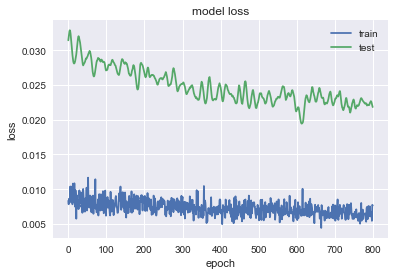

              IBM
MSE       221.714
MAE       13.4039
R2       -1.04048
MAPE (%)  9.60349


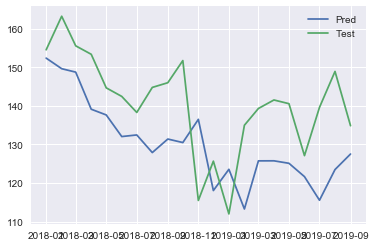

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1102 - val_loss: 0.2270
Epoch 2/1000
0s - loss: 0.0804 - val_loss: 0.1714
Epoch 3/1000
0s - loss: 0.0624 - val_loss: 0.1279
Epoch 4/1000
0s - loss: 0.0517 - val_loss: 0.0940
Epoch 5/1000
0s - loss: 0.0405 - val_loss: 0.0683
Epoch 6/1000
0s - loss: 0.0342 - val_loss: 0.0495
Epoch 7/1000
0s - loss: 0.0300 - val_loss: 0.0366
Epoch 8/1000
0s - loss: 0.0293 - val_loss: 0.0282
Epoch 9/1000
0s - loss: 0.0326 - val_loss: 0.0231
Epoch 10/1000
0s - loss: 0.0313 - val_loss: 0.0203
Epoch 11/1000
0s - loss: 0.0315 - val_loss: 0.0188
Epoch 12/1000
0s - loss: 0.0342 - val_loss: 0.0180
Epoch 13/1000
0s - loss: 0.0335 - val_loss: 0.0177
Epoch 14/1000
0s - loss: 0.0317 - val_loss: 0.0176
Epoch 15/1000
0s - loss: 0.0308 - val_loss: 0.0178
Epoch 16/1000
0s - loss: 0.0307 - val_loss: 0.0181
Epoch 17/1000
0s - loss: 0.0294 - val_loss: 0.0186
Epoch 18/1000
0s - loss: 0.0252 - val_loss: 0.0194
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0038 - val_loss: 0.0384
Epoch 179/1000
0s - loss: 0.0047 - val_loss: 0.0371
Epoch 180/1000
0s - loss: 0.0034 - val_loss: 0.0361
Epoch 181/1000
0s - loss: 0.0034 - val_loss: 0.0347
Epoch 182/1000
0s - loss: 0.0045 - val_loss: 0.0344
Epoch 183/1000
0s - loss: 0.0037 - val_loss: 0.0343
Epoch 184/1000
0s - loss: 0.0038 - val_loss: 0.0350
Epoch 185/1000
0s - loss: 0.0037 - val_loss: 0.0364
Epoch 186/1000
0s - loss: 0.0035 - val_loss: 0.0371
Epoch 187/1000
0s - loss: 0.0038 - val_loss: 0.0382
Epoch 188/1000
0s - loss: 0.0043 - val_loss: 0.0391
Epoch 189/1000
0s - loss: 0.0034 - val_loss: 0.0396
Epoch 190/1000
0s - loss: 0.0048 - val_loss: 0.0401
Epoch 191/1000
0s - loss: 0.0036 - val_loss: 0.0403
Epoch 192/1000
0s - loss: 0.0032 - val_loss: 0.0400
Epoch 193/1000
0s - loss: 0.0029 - val_loss: 0.0397
Epoch 194/1000
0s - loss: 0.0043 - val_loss: 0.0396
Epoch 195/1000
0s - loss: 0.0037 - val_loss: 0.0394
Epoch 196/1000
0s - loss: 0.0048 - val_loss: 0.0394
Epoch 197/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0386
Epoch 360/1000
0s - loss: 0.0034 - val_loss: 0.0382
Epoch 361/1000
0s - loss: 0.0032 - val_loss: 0.0373
Epoch 362/1000
0s - loss: 0.0039 - val_loss: 0.0366
Epoch 363/1000
0s - loss: 0.0033 - val_loss: 0.0354
Epoch 364/1000
0s - loss: 0.0033 - val_loss: 0.0350
Epoch 365/1000
0s - loss: 0.0028 - val_loss: 0.0345
Epoch 366/1000
0s - loss: 0.0035 - val_loss: 0.0337
Epoch 367/1000
0s - loss: 0.0032 - val_loss: 0.0335
Epoch 368/1000
0s - loss: 0.0027 - val_loss: 0.0340
Epoch 369/1000
0s - loss: 0.0041 - val_loss: 0.0352
Epoch 370/1000
0s - loss: 0.0036 - val_loss: 0.0369
Epoch 371/1000
0s - loss: 0.0036 - val_loss: 0.0382
Epoch 372/1000
0s - loss: 0.0035 - val_loss: 0.0401
Epoch 373/1000
0s - loss: 0.0030 - val_loss: 0.0421
Epoch 374/1000
0s - loss: 0.0045 - val_loss: 0.0433
Epoch 375/1000
0s - loss: 0.0034 - val_loss: 0.0439
Epoch 376/1000
0s - loss: 0.0035 - val_loss: 0.0431
Epoch 377/1000
0s - loss: 0.0041 - val_loss: 0.0415
Epoch 378/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0308
Epoch 545/1000
0s - loss: 0.0041 - val_loss: 0.0326
Epoch 546/1000
0s - loss: 0.0036 - val_loss: 0.0339
Epoch 547/1000
0s - loss: 0.0035 - val_loss: 0.0354
Epoch 548/1000
0s - loss: 0.0032 - val_loss: 0.0362
Epoch 549/1000
0s - loss: 0.0033 - val_loss: 0.0360
Epoch 550/1000
0s - loss: 0.0034 - val_loss: 0.0358
Epoch 551/1000
0s - loss: 0.0028 - val_loss: 0.0354
Epoch 552/1000
0s - loss: 0.0037 - val_loss: 0.0352
Epoch 553/1000
0s - loss: 0.0033 - val_loss: 0.0346
Epoch 554/1000
0s - loss: 0.0037 - val_loss: 0.0331
Epoch 555/1000
0s - loss: 0.0034 - val_loss: 0.0323
Epoch 556/1000
0s - loss: 0.0027 - val_loss: 0.0313
Epoch 557/1000
0s - loss: 0.0032 - val_loss: 0.0302
Epoch 558/1000
0s - loss: 0.0026 - val_loss: 0.0299
Epoch 559/1000
0s - loss: 0.0026 - val_loss: 0.0292
Epoch 560/1000
0s - loss: 0.0029 - val_loss: 0.0292
Epoch 561/1000
0s - loss: 0.0030 - val_loss: 0.0299
Epoch 562/1000
0s - loss: 0.0030 - val_loss: 0.0312
Epoch 563/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0312
Epoch 728/1000
0s - loss: 0.0030 - val_loss: 0.0311
Epoch 729/1000
0s - loss: 0.0035 - val_loss: 0.0309
Epoch 730/1000
0s - loss: 0.0033 - val_loss: 0.0308
Epoch 731/1000
0s - loss: 0.0033 - val_loss: 0.0306
Epoch 732/1000
0s - loss: 0.0034 - val_loss: 0.0308
Epoch 733/1000
0s - loss: 0.0036 - val_loss: 0.0309
Epoch 734/1000
0s - loss: 0.0031 - val_loss: 0.0313
Epoch 735/1000
0s - loss: 0.0032 - val_loss: 0.0328
Epoch 736/1000
0s - loss: 0.0031 - val_loss: 0.0343
Epoch 737/1000
0s - loss: 0.0030 - val_loss: 0.0349
Epoch 738/1000
0s - loss: 0.0036 - val_loss: 0.0343
Epoch 739/1000
0s - loss: 0.0029 - val_loss: 0.0330
Epoch 740/1000
0s - loss: 0.0025 - val_loss: 0.0319
Epoch 741/1000
0s - loss: 0.0030 - val_loss: 0.0315
Epoch 742/1000
0s - loss: 0.0028 - val_loss: 0.0303
Epoch 743/1000
0s - loss: 0.0033 - val_loss: 0.0298
Epoch 744/1000
0s - loss: 0.0029 - val_loss: 0.0291
Epoch 745/1000
0s - loss: 0.0032 - val_loss: 0.0285
Epoch 746/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0333
Epoch 909/1000
0s - loss: 0.0042 - val_loss: 0.0340
Epoch 910/1000
0s - loss: 0.0022 - val_loss: 0.0346
Epoch 911/1000
0s - loss: 0.0027 - val_loss: 0.0353
Epoch 912/1000
0s - loss: 0.0032 - val_loss: 0.0358
Epoch 913/1000
0s - loss: 0.0028 - val_loss: 0.0358
Epoch 914/1000
0s - loss: 0.0033 - val_loss: 0.0356
Epoch 915/1000
0s - loss: 0.0033 - val_loss: 0.0362
Epoch 916/1000
0s - loss: 0.0035 - val_loss: 0.0379
Epoch 917/1000
0s - loss: 0.0025 - val_loss: 0.0394
Epoch 918/1000
0s - loss: 0.0032 - val_loss: 0.0393
Epoch 919/1000
0s - loss: 0.0030 - val_loss: 0.0381
Epoch 920/1000
0s - loss: 0.0029 - val_loss: 0.0364
Epoch 921/1000
0s - loss: 0.0029 - val_loss: 0.0361
Epoch 922/1000
0s - loss: 0.0026 - val_loss: 0.0361
Epoch 923/1000
0s - loss: 0.0025 - val_loss: 0.0356
Epoch 924/1000
0s - loss: 0.0044 - val_loss: 0.0352
Epoch 925/1000
0s - loss: 0.0027 - val_loss: 0.0353
Epoch 926/1000
0s - loss: 0.0031 - val_loss: 0.0364
Epoch 927/1000
0s - loss: 0

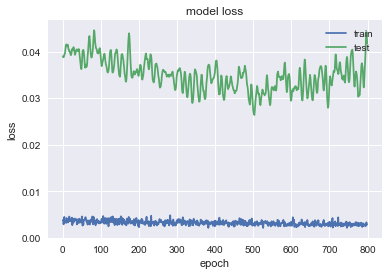

              ALB
MSE       469.724
MAE       19.3755
R2       -1.71596
MAPE (%)  23.5963


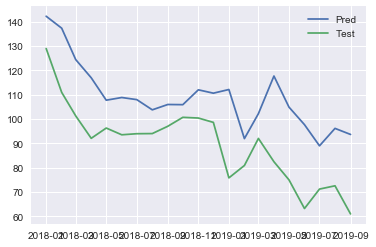

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1794 - val_loss: 0.6966
Epoch 2/1000
0s - loss: 0.1382 - val_loss: 0.5941
Epoch 3/1000
0s - loss: 0.1044 - val_loss: 0.5033
Epoch 4/1000
0s - loss: 0.0785 - val_loss: 0.4224
Epoch 5/1000
0s - loss: 0.0571 - val_loss: 0.3505
Epoch 6/1000
0s - loss: 0.0401 - val_loss: 0.2873
Epoch 7/1000
0s - loss: 0.0278 - val_loss: 0.2329
Epoch 8/1000
0s - loss: 0.0244 - val_loss: 0.1872
Epoch 9/1000
0s - loss: 0.0203 - val_loss: 0.1502
Epoch 10/1000
0s - loss: 0.0191 - val_loss: 0.1212
Epoch 11/1000
0s - loss: 0.0192 - val_loss: 0.0997
Epoch 12/1000
0s - loss: 0.0213 - val_loss: 0.0846
Epoch 13/1000
0s - loss: 0.0248 - val_loss: 0.0751
Epoch 14/1000
0s - loss: 0.0261 - val_loss: 0.0697
Epoch 15/1000
0s - loss: 0.0241 - val_loss: 0.0675
Epoch 16/1000
0s - loss: 0.0256 - val_loss: 0.0681
Epoch 17/1000
0s - loss: 0.0242 - val_loss: 0.0708
Epoch 18/1000
0s - loss: 0.0223 - val_loss: 0.0751
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0212
Epoch 167/1000
0s - loss: 0.0050 - val_loss: 0.0211
Epoch 168/1000
0s - loss: 0.0057 - val_loss: 0.0210
Epoch 169/1000
0s - loss: 0.0054 - val_loss: 0.0207
Epoch 170/1000
0s - loss: 0.0049 - val_loss: 0.0203
Epoch 171/1000
0s - loss: 0.0063 - val_loss: 0.0199
Epoch 172/1000
0s - loss: 0.0054 - val_loss: 0.0194
Epoch 173/1000
0s - loss: 0.0047 - val_loss: 0.0191
Epoch 174/1000
0s - loss: 0.0049 - val_loss: 0.0187
Epoch 175/1000
0s - loss: 0.0047 - val_loss: 0.0184
Epoch 176/1000
0s - loss: 0.0059 - val_loss: 0.0181
Epoch 177/1000
0s - loss: 0.0053 - val_loss: 0.0180
Epoch 178/1000
0s - loss: 0.0058 - val_loss: 0.0180
Epoch 179/1000
0s - loss: 0.0056 - val_loss: 0.0180
Epoch 180/1000
0s - loss: 0.0042 - val_loss: 0.0180
Epoch 181/1000
0s - loss: 0.0053 - val_loss: 0.0181
Epoch 182/1000
0s - loss: 0.0041 - val_loss: 0.0183
Epoch 183/1000
0s - loss: 0.0050 - val_loss: 0.0184
Epoch 184/1000
0s - loss: 0.0048 - val_loss: 0.0185
Epoch 185/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0138
Epoch 343/1000
0s - loss: 0.0050 - val_loss: 0.0138
Epoch 344/1000
0s - loss: 0.0042 - val_loss: 0.0137
Epoch 345/1000
0s - loss: 0.0046 - val_loss: 0.0136
Epoch 346/1000
0s - loss: 0.0035 - val_loss: 0.0136
Epoch 347/1000
0s - loss: 0.0040 - val_loss: 0.0135
Epoch 348/1000
0s - loss: 0.0045 - val_loss: 0.0135
Epoch 349/1000
0s - loss: 0.0046 - val_loss: 0.0134
Epoch 350/1000
0s - loss: 0.0049 - val_loss: 0.0134
Epoch 351/1000
0s - loss: 0.0043 - val_loss: 0.0134
Epoch 352/1000
0s - loss: 0.0045 - val_loss: 0.0134
Epoch 353/1000
0s - loss: 0.0041 - val_loss: 0.0134
Epoch 354/1000
0s - loss: 0.0048 - val_loss: 0.0134
Epoch 355/1000
0s - loss: 0.0045 - val_loss: 0.0134
Epoch 356/1000
0s - loss: 0.0053 - val_loss: 0.0134
Epoch 357/1000
0s - loss: 0.0048 - val_loss: 0.0134
Epoch 358/1000
0s - loss: 0.0041 - val_loss: 0.0134
Epoch 359/1000
0s - loss: 0.0042 - val_loss: 0.0134
Epoch 360/1000
0s - loss: 0.0046 - val_loss: 0.0134
Epoch 361/1000
0s - loss: 0

0s - loss: 0.0043 - val_loss: 0.0127
Epoch 514/1000
0s - loss: 0.0050 - val_loss: 0.0127
Epoch 515/1000
0s - loss: 0.0040 - val_loss: 0.0127
Epoch 516/1000
0s - loss: 0.0044 - val_loss: 0.0127
Epoch 517/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 518/1000
0s - loss: 0.0043 - val_loss: 0.0127
Epoch 519/1000
0s - loss: 0.0049 - val_loss: 0.0127
Epoch 520/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 521/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 522/1000
0s - loss: 0.0042 - val_loss: 0.0127
Epoch 523/1000
0s - loss: 0.0041 - val_loss: 0.0127
Epoch 524/1000
0s - loss: 0.0043 - val_loss: 0.0127
Epoch 525/1000
0s - loss: 0.0043 - val_loss: 0.0127
Epoch 526/1000
0s - loss: 0.0045 - val_loss: 0.0127
Epoch 527/1000
0s - loss: 0.0040 - val_loss: 0.0126
Epoch 528/1000
0s - loss: 0.0036 - val_loss: 0.0126
Epoch 529/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 530/1000
0s - loss: 0.0036 - val_loss: 0.0126
Epoch 531/1000
0s - loss: 0.0037 - val_loss: 0.0126
Epoch 532/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0121
Epoch 679/1000
0s - loss: 0.0045 - val_loss: 0.0121
Epoch 680/1000
0s - loss: 0.0031 - val_loss: 0.0121
Epoch 681/1000
0s - loss: 0.0036 - val_loss: 0.0121
Epoch 682/1000
0s - loss: 0.0038 - val_loss: 0.0121
Epoch 683/1000
0s - loss: 0.0034 - val_loss: 0.0121
Epoch 684/1000
0s - loss: 0.0034 - val_loss: 0.0121
Epoch 685/1000
0s - loss: 0.0036 - val_loss: 0.0121
Epoch 686/1000
0s - loss: 0.0047 - val_loss: 0.0120
Epoch 687/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 688/1000
0s - loss: 0.0034 - val_loss: 0.0121
Epoch 689/1000
0s - loss: 0.0030 - val_loss: 0.0121
Epoch 690/1000
0s - loss: 0.0039 - val_loss: 0.0121
Epoch 691/1000
0s - loss: 0.0038 - val_loss: 0.0121
Epoch 692/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 693/1000
0s - loss: 0.0037 - val_loss: 0.0120
Epoch 694/1000
0s - loss: 0.0038 - val_loss: 0.0120
Epoch 695/1000
0s - loss: 0.0035 - val_loss: 0.0120
Epoch 696/1000
0s - loss: 0.0039 - val_loss: 0.0120
Epoch 697/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0116
Epoch 841/1000
0s - loss: 0.0040 - val_loss: 0.0116
Epoch 842/1000
0s - loss: 0.0038 - val_loss: 0.0116
Epoch 843/1000
0s - loss: 0.0044 - val_loss: 0.0116
Epoch 844/1000
0s - loss: 0.0032 - val_loss: 0.0116
Epoch 845/1000
0s - loss: 0.0033 - val_loss: 0.0116
Epoch 846/1000
0s - loss: 0.0032 - val_loss: 0.0116
Epoch 847/1000
0s - loss: 0.0033 - val_loss: 0.0116
Epoch 848/1000
0s - loss: 0.0030 - val_loss: 0.0116
Epoch 849/1000
0s - loss: 0.0039 - val_loss: 0.0116
Epoch 850/1000
0s - loss: 0.0042 - val_loss: 0.0117
Epoch 851/1000
0s - loss: 0.0031 - val_loss: 0.0117
Epoch 852/1000
0s - loss: 0.0036 - val_loss: 0.0116
Epoch 853/1000
0s - loss: 0.0042 - val_loss: 0.0116
Epoch 854/1000
0s - loss: 0.0037 - val_loss: 0.0116
Epoch 855/1000
0s - loss: 0.0036 - val_loss: 0.0116
Epoch 856/1000
0s - loss: 0.0034 - val_loss: 0.0116
Epoch 857/1000
0s - loss: 0.0036 - val_loss: 0.0116
Epoch 858/1000
0s - loss: 0.0039 - val_loss: 0.0116
Epoch 859/1000
0s - loss: 0

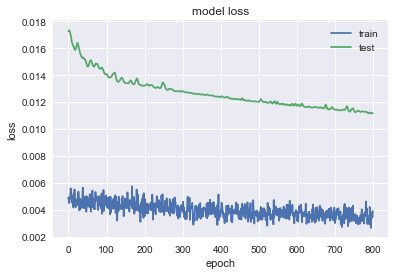

             CBRE
MSE       18.7635
MAE       3.30107
R2        -1.4539
MAPE (%)  7.06127


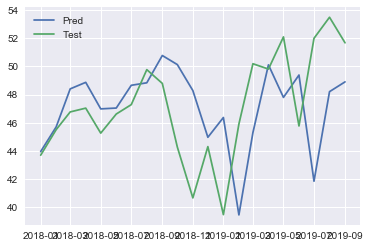

In [349]:
pred_multi_GRU = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_GRU[comp] = nn_forec_multi_GRU(df,comp,n_train_time = test.shape[0],first_layer = 64,second_layer=32).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.4185 - val_loss: 0.2588
Epoch 2/1000
0s - loss: 0.3160 - val_loss: 0.1628
Epoch 3/1000
0s - loss: 0.2313 - val_loss: 0.0936
Epoch 4/1000
0s - loss: 0.1705 - val_loss: 0.0462
Epoch 5/1000
0s - loss: 0.1152 - val_loss: 0.0198
Epoch 6/1000
0s - loss: 0.0739 - val_loss: 0.0144
Epoch 7/1000
0s - loss: 0.0429 - val_loss: 0.0297
Epoch 8/1000
0s - loss: 0.0267 - val_loss: 0.0629
Epoch 9/1000
0s - loss: 0.0182 - val_loss: 0.1082
Epoch 10/1000
0s - loss: 0.0207 - val_loss: 0.1566
Epoch 11/1000
0s - loss: 0.0288 - val_loss: 0.1990
Epoch 12/1000
0s - loss: 0.0383 - val_loss: 0.2275
Epoch 13/1000
0s - loss: 0.0437 - val_loss: 0.2395
Epoch 14/1000
0s - loss: 0.0492 - val_loss: 0.2355
Epoch 15/1000
0s - loss: 0.0486 - val_loss: 0.2191
Epoch 16/1000
0s - loss: 0.0416 - val_loss: 0.1953
Epoch 17/1000
0s - loss: 0.0370 - val_loss: 0.1678
Epoch 18/1000
0s - loss: 0.0319 - val_loss: 0.1406
Epoch 19/1000
0s - loss: 0.02

0s - loss: 0.0090 - val_loss: 0.0201
Epoch 168/1000
0s - loss: 0.0082 - val_loss: 0.0195
Epoch 169/1000
0s - loss: 0.0088 - val_loss: 0.0189
Epoch 170/1000
0s - loss: 0.0087 - val_loss: 0.0183
Epoch 171/1000
0s - loss: 0.0081 - val_loss: 0.0178
Epoch 172/1000
0s - loss: 0.0075 - val_loss: 0.0174
Epoch 173/1000
0s - loss: 0.0089 - val_loss: 0.0171
Epoch 174/1000
0s - loss: 0.0091 - val_loss: 0.0168
Epoch 175/1000
0s - loss: 0.0082 - val_loss: 0.0165
Epoch 176/1000
0s - loss: 0.0077 - val_loss: 0.0163
Epoch 177/1000
0s - loss: 0.0073 - val_loss: 0.0161
Epoch 178/1000
0s - loss: 0.0073 - val_loss: 0.0161
Epoch 179/1000
0s - loss: 0.0098 - val_loss: 0.0160
Epoch 180/1000
0s - loss: 0.0080 - val_loss: 0.0159
Epoch 181/1000
0s - loss: 0.0082 - val_loss: 0.0158
Epoch 182/1000
0s - loss: 0.0074 - val_loss: 0.0158
Epoch 183/1000
0s - loss: 0.0083 - val_loss: 0.0157
Epoch 184/1000
0s - loss: 0.0074 - val_loss: 0.0158
Epoch 185/1000
0s - loss: 0.0081 - val_loss: 0.0158
Epoch 186/1000
0s - loss: 0

0s - loss: 0.0069 - val_loss: 0.0078
Epoch 338/1000
0s - loss: 0.0067 - val_loss: 0.0078
Epoch 339/1000
0s - loss: 0.0067 - val_loss: 0.0077
Epoch 340/1000
0s - loss: 0.0076 - val_loss: 0.0077
Epoch 341/1000
0s - loss: 0.0077 - val_loss: 0.0077
Epoch 342/1000
0s - loss: 0.0066 - val_loss: 0.0077
Epoch 343/1000
0s - loss: 0.0068 - val_loss: 0.0077
Epoch 344/1000
0s - loss: 0.0068 - val_loss: 0.0077
Epoch 345/1000
0s - loss: 0.0068 - val_loss: 0.0077
Epoch 346/1000
0s - loss: 0.0075 - val_loss: 0.0077
Epoch 347/1000
0s - loss: 0.0070 - val_loss: 0.0077
Epoch 348/1000
0s - loss: 0.0068 - val_loss: 0.0078
Epoch 349/1000
0s - loss: 0.0071 - val_loss: 0.0078
Epoch 350/1000
0s - loss: 0.0081 - val_loss: 0.0079
Epoch 351/1000
0s - loss: 0.0066 - val_loss: 0.0080
Epoch 352/1000
0s - loss: 0.0087 - val_loss: 0.0080
Epoch 353/1000
0s - loss: 0.0071 - val_loss: 0.0081
Epoch 354/1000
0s - loss: 0.0078 - val_loss: 0.0080
Epoch 355/1000
0s - loss: 0.0075 - val_loss: 0.0080
Epoch 356/1000
0s - loss: 0

0s - loss: 0.0076 - val_loss: 0.0092
Epoch 510/1000
0s - loss: 0.0065 - val_loss: 0.0091
Epoch 511/1000
0s - loss: 0.0087 - val_loss: 0.0090
Epoch 512/1000
0s - loss: 0.0078 - val_loss: 0.0089
Epoch 513/1000
0s - loss: 0.0067 - val_loss: 0.0088
Epoch 514/1000
0s - loss: 0.0072 - val_loss: 0.0088
Epoch 515/1000
0s - loss: 0.0059 - val_loss: 0.0087
Epoch 516/1000
0s - loss: 0.0072 - val_loss: 0.0086
Epoch 517/1000
0s - loss: 0.0070 - val_loss: 0.0085
Epoch 518/1000
0s - loss: 0.0081 - val_loss: 0.0085
Epoch 519/1000
0s - loss: 0.0072 - val_loss: 0.0085
Epoch 520/1000
0s - loss: 0.0065 - val_loss: 0.0086
Epoch 521/1000
0s - loss: 0.0071 - val_loss: 0.0087
Epoch 522/1000
0s - loss: 0.0077 - val_loss: 0.0088
Epoch 523/1000
0s - loss: 0.0065 - val_loss: 0.0089
Epoch 524/1000
0s - loss: 0.0067 - val_loss: 0.0089
Epoch 525/1000
0s - loss: 0.0072 - val_loss: 0.0090
Epoch 526/1000
0s - loss: 0.0069 - val_loss: 0.0091
Epoch 527/1000
0s - loss: 0.0070 - val_loss: 0.0092
Epoch 528/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0106
Epoch 684/1000
0s - loss: 0.0062 - val_loss: 0.0107
Epoch 685/1000
0s - loss: 0.0060 - val_loss: 0.0109
Epoch 686/1000
0s - loss: 0.0079 - val_loss: 0.0110
Epoch 687/1000
0s - loss: 0.0063 - val_loss: 0.0110
Epoch 688/1000
0s - loss: 0.0070 - val_loss: 0.0112
Epoch 689/1000
0s - loss: 0.0069 - val_loss: 0.0112
Epoch 690/1000
0s - loss: 0.0084 - val_loss: 0.0113
Epoch 691/1000
0s - loss: 0.0063 - val_loss: 0.0113
Epoch 692/1000
0s - loss: 0.0061 - val_loss: 0.0112
Epoch 693/1000
0s - loss: 0.0059 - val_loss: 0.0111
Epoch 694/1000
0s - loss: 0.0068 - val_loss: 0.0109
Epoch 695/1000
0s - loss: 0.0072 - val_loss: 0.0107
Epoch 696/1000
0s - loss: 0.0064 - val_loss: 0.0105
Epoch 697/1000
0s - loss: 0.0072 - val_loss: 0.0103
Epoch 698/1000
0s - loss: 0.0065 - val_loss: 0.0101
Epoch 699/1000
0s - loss: 0.0072 - val_loss: 0.0101
Epoch 700/1000
0s - loss: 0.0072 - val_loss: 0.0102
Epoch 701/1000
0s - loss: 0.0068 - val_loss: 0.0103
Epoch 702/1000
0s - loss: 0

0s - loss: 0.0067 - val_loss: 0.0127
Epoch 855/1000
0s - loss: 0.0073 - val_loss: 0.0127
Epoch 856/1000
0s - loss: 0.0075 - val_loss: 0.0129
Epoch 857/1000
0s - loss: 0.0070 - val_loss: 0.0134
Epoch 858/1000
0s - loss: 0.0073 - val_loss: 0.0140
Epoch 859/1000
0s - loss: 0.0072 - val_loss: 0.0147
Epoch 860/1000
0s - loss: 0.0071 - val_loss: 0.0152
Epoch 861/1000
0s - loss: 0.0070 - val_loss: 0.0155
Epoch 862/1000
0s - loss: 0.0054 - val_loss: 0.0157
Epoch 863/1000
0s - loss: 0.0058 - val_loss: 0.0158
Epoch 864/1000
0s - loss: 0.0060 - val_loss: 0.0156
Epoch 865/1000
0s - loss: 0.0067 - val_loss: 0.0150
Epoch 866/1000
0s - loss: 0.0072 - val_loss: 0.0145
Epoch 867/1000
0s - loss: 0.0068 - val_loss: 0.0140
Epoch 868/1000
0s - loss: 0.0068 - val_loss: 0.0136
Epoch 869/1000
0s - loss: 0.0057 - val_loss: 0.0132
Epoch 870/1000
0s - loss: 0.0076 - val_loss: 0.0131
Epoch 871/1000
0s - loss: 0.0078 - val_loss: 0.0130
Epoch 872/1000
0s - loss: 0.0058 - val_loss: 0.0130
Epoch 873/1000
0s - loss: 0

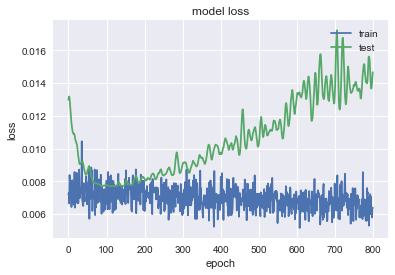

                T
MSE        5.2894
MAE       1.94393
R2        0.11624
MAPE (%)  5.87283


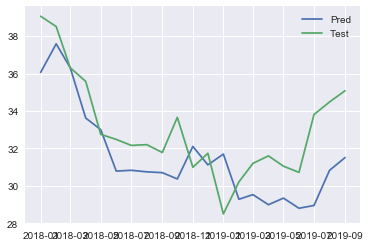

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1198 - val_loss: 0.5479
Epoch 2/1000
0s - loss: 0.0700 - val_loss: 0.3931
Epoch 3/1000
0s - loss: 0.0406 - val_loss: 0.2770
Epoch 4/1000
0s - loss: 0.0277 - val_loss: 0.1937
Epoch 5/1000
0s - loss: 0.0237 - val_loss: 0.1377
Epoch 6/1000
0s - loss: 0.0277 - val_loss: 0.1042
Epoch 7/1000
0s - loss: 0.0305 - val_loss: 0.0860
Epoch 8/1000
0s - loss: 0.0314 - val_loss: 0.0781
Epoch 9/1000
0s - loss: 0.0324 - val_loss: 0.0777
Epoch 10/1000
0s - loss: 0.0276 - val_loss: 0.0820
Epoch 11/1000
0s - loss: 0.0282 - val_loss: 0.0902
Epoch 12/1000
0s - loss: 0.0214 - val_loss: 0.0995
Epoch 13/1000
0s - loss: 0.0189 - val_loss: 0.1090
Epoch 14/1000
0s - loss: 0.0169 - val_loss: 0.1173
Epoch 15/1000
0s - loss: 0.0164 - val_loss: 0.1242
Epoch 16/1000
0s - loss: 0.0164 - val_loss: 0.1286
Epoch 17/1000
0s - loss: 0.0164 - val_loss: 0.1305
Epoch 18/1000
0s - loss: 0.0157 - val_loss: 0.1296
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0036 - val_loss: 0.0137
Epoch 162/1000
0s - loss: 0.0038 - val_loss: 0.0136
Epoch 163/1000
0s - loss: 0.0037 - val_loss: 0.0136
Epoch 164/1000
0s - loss: 0.0031 - val_loss: 0.0136
Epoch 165/1000
0s - loss: 0.0033 - val_loss: 0.0136
Epoch 166/1000
0s - loss: 0.0037 - val_loss: 0.0136
Epoch 167/1000
0s - loss: 0.0031 - val_loss: 0.0136
Epoch 168/1000
0s - loss: 0.0033 - val_loss: 0.0137
Epoch 169/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 170/1000
0s - loss: 0.0031 - val_loss: 0.0141
Epoch 171/1000
0s - loss: 0.0037 - val_loss: 0.0144
Epoch 172/1000
0s - loss: 0.0034 - val_loss: 0.0147
Epoch 173/1000
0s - loss: 0.0035 - val_loss: 0.0150
Epoch 174/1000
0s - loss: 0.0041 - val_loss: 0.0152
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0154
Epoch 176/1000
0s - loss: 0.0036 - val_loss: 0.0153
Epoch 177/1000
0s - loss: 0.0033 - val_loss: 0.0151
Epoch 178/1000
0s - loss: 0.0042 - val_loss: 0.0149
Epoch 179/1000
0s - loss: 0.0038 - val_loss: 0.0149
Epoch 180/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0164
Epoch 325/1000
0s - loss: 0.0032 - val_loss: 0.0162
Epoch 326/1000
0s - loss: 0.0030 - val_loss: 0.0160
Epoch 327/1000
0s - loss: 0.0025 - val_loss: 0.0159
Epoch 328/1000
0s - loss: 0.0028 - val_loss: 0.0160
Epoch 329/1000
0s - loss: 0.0032 - val_loss: 0.0161
Epoch 330/1000
0s - loss: 0.0024 - val_loss: 0.0162
Epoch 331/1000
0s - loss: 0.0040 - val_loss: 0.0162
Epoch 332/1000
0s - loss: 0.0027 - val_loss: 0.0163
Epoch 333/1000
0s - loss: 0.0028 - val_loss: 0.0166
Epoch 334/1000
0s - loss: 0.0030 - val_loss: 0.0170
Epoch 335/1000
0s - loss: 0.0029 - val_loss: 0.0170
Epoch 336/1000
0s - loss: 0.0033 - val_loss: 0.0171
Epoch 337/1000
0s - loss: 0.0029 - val_loss: 0.0172
Epoch 338/1000
0s - loss: 0.0034 - val_loss: 0.0173
Epoch 339/1000
0s - loss: 0.0041 - val_loss: 0.0174
Epoch 340/1000
0s - loss: 0.0034 - val_loss: 0.0174
Epoch 341/1000
0s - loss: 0.0028 - val_loss: 0.0174
Epoch 342/1000
0s - loss: 0.0036 - val_loss: 0.0171
Epoch 343/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0176
Epoch 485/1000
0s - loss: 0.0033 - val_loss: 0.0173
Epoch 486/1000
0s - loss: 0.0030 - val_loss: 0.0169
Epoch 487/1000
0s - loss: 0.0027 - val_loss: 0.0170
Epoch 488/1000
0s - loss: 0.0033 - val_loss: 0.0172
Epoch 489/1000
0s - loss: 0.0026 - val_loss: 0.0178
Epoch 490/1000
0s - loss: 0.0029 - val_loss: 0.0183
Epoch 491/1000
0s - loss: 0.0029 - val_loss: 0.0189
Epoch 492/1000
0s - loss: 0.0024 - val_loss: 0.0188
Epoch 493/1000
0s - loss: 0.0032 - val_loss: 0.0190
Epoch 494/1000
0s - loss: 0.0034 - val_loss: 0.0188
Epoch 495/1000
0s - loss: 0.0030 - val_loss: 0.0185
Epoch 496/1000
0s - loss: 0.0030 - val_loss: 0.0181
Epoch 497/1000
0s - loss: 0.0031 - val_loss: 0.0180
Epoch 498/1000
0s - loss: 0.0036 - val_loss: 0.0177
Epoch 499/1000
0s - loss: 0.0034 - val_loss: 0.0177
Epoch 500/1000
0s - loss: 0.0030 - val_loss: 0.0178
Epoch 501/1000
0s - loss: 0.0027 - val_loss: 0.0180
Epoch 502/1000
0s - loss: 0.0032 - val_loss: 0.0183
Epoch 503/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0175
Epoch 660/1000
0s - loss: 0.0029 - val_loss: 0.0177
Epoch 661/1000
0s - loss: 0.0028 - val_loss: 0.0176
Epoch 662/1000
0s - loss: 0.0029 - val_loss: 0.0175
Epoch 663/1000
0s - loss: 0.0029 - val_loss: 0.0171
Epoch 664/1000
0s - loss: 0.0029 - val_loss: 0.0168
Epoch 665/1000
0s - loss: 0.0032 - val_loss: 0.0164
Epoch 666/1000
0s - loss: 0.0028 - val_loss: 0.0163
Epoch 667/1000
0s - loss: 0.0028 - val_loss: 0.0166
Epoch 668/1000
0s - loss: 0.0033 - val_loss: 0.0170
Epoch 669/1000
0s - loss: 0.0029 - val_loss: 0.0180
Epoch 670/1000
0s - loss: 0.0030 - val_loss: 0.0190
Epoch 671/1000
0s - loss: 0.0033 - val_loss: 0.0196
Epoch 672/1000
0s - loss: 0.0027 - val_loss: 0.0199
Epoch 673/1000
0s - loss: 0.0026 - val_loss: 0.0194
Epoch 674/1000
0s - loss: 0.0031 - val_loss: 0.0183
Epoch 675/1000
0s - loss: 0.0032 - val_loss: 0.0171
Epoch 676/1000
0s - loss: 0.0023 - val_loss: 0.0159
Epoch 677/1000
0s - loss: 0.0030 - val_loss: 0.0151
Epoch 678/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0171
Epoch 837/1000
0s - loss: 0.0029 - val_loss: 0.0172
Epoch 838/1000
0s - loss: 0.0028 - val_loss: 0.0173
Epoch 839/1000
0s - loss: 0.0025 - val_loss: 0.0172
Epoch 840/1000
0s - loss: 0.0032 - val_loss: 0.0167
Epoch 841/1000
0s - loss: 0.0026 - val_loss: 0.0162
Epoch 842/1000
0s - loss: 0.0025 - val_loss: 0.0158
Epoch 843/1000
0s - loss: 0.0028 - val_loss: 0.0157
Epoch 844/1000
0s - loss: 0.0029 - val_loss: 0.0159
Epoch 845/1000
0s - loss: 0.0031 - val_loss: 0.0160
Epoch 846/1000
0s - loss: 0.0028 - val_loss: 0.0162
Epoch 847/1000
0s - loss: 0.0029 - val_loss: 0.0167
Epoch 848/1000
0s - loss: 0.0028 - val_loss: 0.0171
Epoch 849/1000
0s - loss: 0.0026 - val_loss: 0.0171
Epoch 850/1000
0s - loss: 0.0028 - val_loss: 0.0168
Epoch 851/1000
0s - loss: 0.0028 - val_loss: 0.0163
Epoch 852/1000
0s - loss: 0.0028 - val_loss: 0.0157
Epoch 853/1000
0s - loss: 0.0026 - val_loss: 0.0153
Epoch 854/1000
0s - loss: 0.0030 - val_loss: 0.0149
Epoch 855/1000
0s - loss: 0

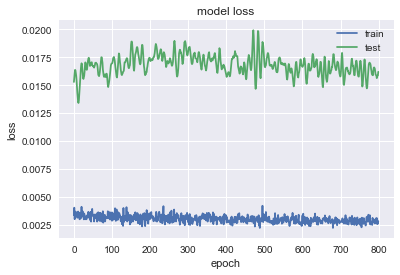

              BBY
MSE       73.6544
MAE       7.33492
R2       -1.15857
MAPE (%)  10.3747


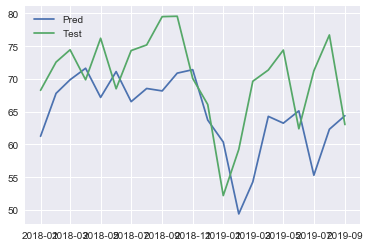

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2502 - val_loss: 0.3540
Epoch 2/1000
0s - loss: 0.1681 - val_loss: 0.2345
Epoch 3/1000
0s - loss: 0.1049 - val_loss: 0.1452
Epoch 4/1000
0s - loss: 0.0613 - val_loss: 0.0816
Epoch 5/1000
0s - loss: 0.0310 - val_loss: 0.0422
Epoch 6/1000
0s - loss: 0.0130 - val_loss: 0.0248
Epoch 7/1000
0s - loss: 0.0082 - val_loss: 0.0242
Epoch 8/1000
0s - loss: 0.0124 - val_loss: 0.0327
Epoch 9/1000
0s - loss: 0.0190 - val_loss: 0.0423
Epoch 10/1000
0s - loss: 0.0254 - val_loss: 0.0479
Epoch 11/1000
0s - loss: 0.0293 - val_loss: 0.0478
Epoch 12/1000
0s - loss: 0.0320 - val_loss: 0.0430
Epoch 13/1000
0s - loss: 0.0251 - val_loss: 0.0364
Epoch 14/1000
0s - loss: 0.0218 - val_loss: 0.0299
Epoch 15/1000
0s - loss: 0.0166 - val_loss: 0.0251
Epoch 16/1000
0s - loss: 0.0117 - val_loss: 0.0228
Epoch 17/1000
0s - loss: 0.0091 - val_loss: 0.0227
Epoch 18/1000
0s - loss: 0.0084 - val_loss: 0.0244
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0031 - val_loss: 0.0304
Epoch 161/1000
0s - loss: 0.0052 - val_loss: 0.0304
Epoch 162/1000
0s - loss: 0.0035 - val_loss: 0.0303
Epoch 163/1000
0s - loss: 0.0040 - val_loss: 0.0302
Epoch 164/1000
0s - loss: 0.0044 - val_loss: 0.0302
Epoch 165/1000
0s - loss: 0.0041 - val_loss: 0.0303
Epoch 166/1000
0s - loss: 0.0037 - val_loss: 0.0305
Epoch 167/1000
0s - loss: 0.0038 - val_loss: 0.0305
Epoch 168/1000
0s - loss: 0.0035 - val_loss: 0.0305
Epoch 169/1000
0s - loss: 0.0040 - val_loss: 0.0303
Epoch 170/1000
0s - loss: 0.0040 - val_loss: 0.0302
Epoch 171/1000
0s - loss: 0.0036 - val_loss: 0.0300
Epoch 172/1000
0s - loss: 0.0048 - val_loss: 0.0298
Epoch 173/1000
0s - loss: 0.0038 - val_loss: 0.0296
Epoch 174/1000
0s - loss: 0.0040 - val_loss: 0.0295
Epoch 175/1000
0s - loss: 0.0035 - val_loss: 0.0294
Epoch 176/1000
0s - loss: 0.0046 - val_loss: 0.0294
Epoch 177/1000
0s - loss: 0.0042 - val_loss: 0.0294
Epoch 178/1000
0s - loss: 0.0039 - val_loss: 0.0294
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0247
Epoch 321/1000
0s - loss: 0.0041 - val_loss: 0.0246
Epoch 322/1000
0s - loss: 0.0040 - val_loss: 0.0245
Epoch 323/1000
0s - loss: 0.0035 - val_loss: 0.0244
Epoch 324/1000
0s - loss: 0.0029 - val_loss: 0.0243
Epoch 325/1000
0s - loss: 0.0032 - val_loss: 0.0242
Epoch 326/1000
0s - loss: 0.0037 - val_loss: 0.0243
Epoch 327/1000
0s - loss: 0.0038 - val_loss: 0.0244
Epoch 328/1000
0s - loss: 0.0034 - val_loss: 0.0247
Epoch 329/1000
0s - loss: 0.0035 - val_loss: 0.0250
Epoch 330/1000
0s - loss: 0.0027 - val_loss: 0.0253
Epoch 331/1000
0s - loss: 0.0035 - val_loss: 0.0255
Epoch 332/1000
0s - loss: 0.0032 - val_loss: 0.0256
Epoch 333/1000
0s - loss: 0.0039 - val_loss: 0.0254
Epoch 334/1000
0s - loss: 0.0039 - val_loss: 0.0251
Epoch 335/1000
0s - loss: 0.0038 - val_loss: 0.0247
Epoch 336/1000
0s - loss: 0.0034 - val_loss: 0.0243
Epoch 337/1000
0s - loss: 0.0034 - val_loss: 0.0241
Epoch 338/1000
0s - loss: 0.0031 - val_loss: 0.0238
Epoch 339/1000
0s - loss: 0

0s - loss: 0.0030 - val_loss: 0.0167
Epoch 496/1000
0s - loss: 0.0027 - val_loss: 0.0166
Epoch 497/1000
0s - loss: 0.0037 - val_loss: 0.0164
Epoch 498/1000
0s - loss: 0.0025 - val_loss: 0.0161
Epoch 499/1000
0s - loss: 0.0028 - val_loss: 0.0158
Epoch 500/1000
0s - loss: 0.0033 - val_loss: 0.0156
Epoch 501/1000
0s - loss: 0.0030 - val_loss: 0.0154
Epoch 502/1000
0s - loss: 0.0028 - val_loss: 0.0154
Epoch 503/1000
0s - loss: 0.0030 - val_loss: 0.0155
Epoch 504/1000
0s - loss: 0.0032 - val_loss: 0.0155
Epoch 505/1000
0s - loss: 0.0032 - val_loss: 0.0155
Epoch 506/1000
0s - loss: 0.0029 - val_loss: 0.0155
Epoch 507/1000
0s - loss: 0.0031 - val_loss: 0.0154
Epoch 508/1000
0s - loss: 0.0025 - val_loss: 0.0152
Epoch 509/1000
0s - loss: 0.0033 - val_loss: 0.0149
Epoch 510/1000
0s - loss: 0.0029 - val_loss: 0.0148
Epoch 511/1000
0s - loss: 0.0029 - val_loss: 0.0146
Epoch 512/1000
0s - loss: 0.0035 - val_loss: 0.0143
Epoch 513/1000
0s - loss: 0.0027 - val_loss: 0.0142
Epoch 514/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0098
Epoch 655/1000
0s - loss: 0.0028 - val_loss: 0.0098
Epoch 656/1000
0s - loss: 0.0028 - val_loss: 0.0098
Epoch 657/1000
0s - loss: 0.0026 - val_loss: 0.0098
Epoch 658/1000
0s - loss: 0.0023 - val_loss: 0.0099
Epoch 659/1000
0s - loss: 0.0027 - val_loss: 0.0099
Epoch 660/1000
0s - loss: 0.0027 - val_loss: 0.0099
Epoch 661/1000
0s - loss: 0.0023 - val_loss: 0.0099
Epoch 662/1000
0s - loss: 0.0030 - val_loss: 0.0099
Epoch 663/1000
0s - loss: 0.0027 - val_loss: 0.0098
Epoch 664/1000
0s - loss: 0.0034 - val_loss: 0.0097
Epoch 665/1000
0s - loss: 0.0027 - val_loss: 0.0095
Epoch 666/1000
0s - loss: 0.0028 - val_loss: 0.0094
Epoch 667/1000
0s - loss: 0.0029 - val_loss: 0.0094
Epoch 668/1000
0s - loss: 0.0023 - val_loss: 0.0095
Epoch 669/1000
0s - loss: 0.0025 - val_loss: 0.0097
Epoch 670/1000
0s - loss: 0.0028 - val_loss: 0.0098
Epoch 671/1000
0s - loss: 0.0028 - val_loss: 0.0099
Epoch 672/1000
0s - loss: 0.0027 - val_loss: 0.0099
Epoch 673/1000
0s - loss: 0

0s - loss: 0.0024 - val_loss: 0.0079
Epoch 815/1000
0s - loss: 0.0024 - val_loss: 0.0078
Epoch 816/1000
0s - loss: 0.0032 - val_loss: 0.0077
Epoch 817/1000
0s - loss: 0.0022 - val_loss: 0.0077
Epoch 818/1000
0s - loss: 0.0028 - val_loss: 0.0077
Epoch 819/1000
0s - loss: 0.0028 - val_loss: 0.0077
Epoch 820/1000
0s - loss: 0.0028 - val_loss: 0.0079
Epoch 821/1000
0s - loss: 0.0023 - val_loss: 0.0081
Epoch 822/1000
0s - loss: 0.0023 - val_loss: 0.0082
Epoch 823/1000
0s - loss: 0.0022 - val_loss: 0.0083
Epoch 824/1000
0s - loss: 0.0026 - val_loss: 0.0082
Epoch 825/1000
0s - loss: 0.0027 - val_loss: 0.0081
Epoch 826/1000
0s - loss: 0.0024 - val_loss: 0.0080
Epoch 827/1000
0s - loss: 0.0031 - val_loss: 0.0079
Epoch 828/1000
0s - loss: 0.0029 - val_loss: 0.0078
Epoch 829/1000
0s - loss: 0.0025 - val_loss: 0.0078
Epoch 830/1000
0s - loss: 0.0020 - val_loss: 0.0079
Epoch 831/1000
0s - loss: 0.0027 - val_loss: 0.0079
Epoch 832/1000
0s - loss: 0.0028 - val_loss: 0.0080
Epoch 833/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0074
Epoch 975/1000
0s - loss: 0.0022 - val_loss: 0.0074
Epoch 976/1000
0s - loss: 0.0025 - val_loss: 0.0073
Epoch 977/1000
0s - loss: 0.0025 - val_loss: 0.0073
Epoch 978/1000
0s - loss: 0.0032 - val_loss: 0.0073
Epoch 979/1000
0s - loss: 0.0024 - val_loss: 0.0074
Epoch 980/1000
0s - loss: 0.0027 - val_loss: 0.0075
Epoch 981/1000
0s - loss: 0.0025 - val_loss: 0.0076
Epoch 982/1000
0s - loss: 0.0028 - val_loss: 0.0075
Epoch 983/1000
0s - loss: 0.0023 - val_loss: 0.0074
Epoch 984/1000
0s - loss: 0.0027 - val_loss: 0.0073
Epoch 985/1000
0s - loss: 0.0023 - val_loss: 0.0072
Epoch 986/1000
0s - loss: 0.0024 - val_loss: 0.0071
Epoch 987/1000
0s - loss: 0.0022 - val_loss: 0.0071
Epoch 988/1000
0s - loss: 0.0029 - val_loss: 0.0071
Epoch 989/1000
0s - loss: 0.0020 - val_loss: 0.0071
Epoch 990/1000
0s - loss: 0.0026 - val_loss: 0.0072
Epoch 991/1000
0s - loss: 0.0029 - val_loss: 0.0072
Epoch 992/1000
0s - loss: 0.0028 - val_loss: 0.0072
Epoch 993/1000
0s - loss: 0

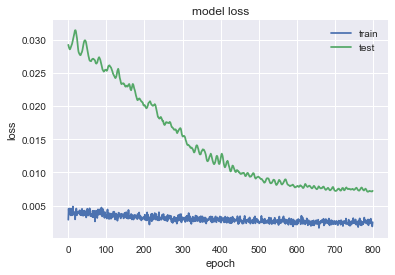

                KO
MSE        6.42743
MAE        1.93528
R2       -0.852418
MAPE (%)   4.01037


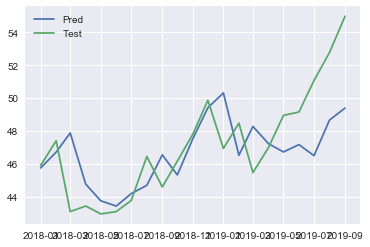

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3358 - val_loss: 0.0189
Epoch 2/1000
0s - loss: 0.2514 - val_loss: 0.0078
Epoch 3/1000
0s - loss: 0.1796 - val_loss: 0.0147
Epoch 4/1000
0s - loss: 0.1306 - val_loss: 0.0391
Epoch 5/1000
0s - loss: 0.0935 - val_loss: 0.0798
Epoch 6/1000
0s - loss: 0.0715 - val_loss: 0.1321
Epoch 7/1000
0s - loss: 0.0555 - val_loss: 0.1887
Epoch 8/1000
0s - loss: 0.0531 - val_loss: 0.2389
Epoch 9/1000
0s - loss: 0.0607 - val_loss: 0.2733
Epoch 10/1000
0s - loss: 0.0653 - val_loss: 0.2867
Epoch 11/1000
0s - loss: 0.0654 - val_loss: 0.2805
Epoch 12/1000
0s - loss: 0.0631 - val_loss: 0.2592
Epoch 13/1000
0s - loss: 0.0598 - val_loss: 0.2274
Epoch 14/1000
0s - loss: 0.0584 - val_loss: 0.1897
Epoch 15/1000
0s - loss: 0.0535 - val_loss: 0.1513
Epoch 16/1000
0s - loss: 0.0428 - val_loss: 0.1163
Epoch 17/1000
0s - loss: 0.0390 - val_loss: 0.0868
Epoch 18/1000
0s - loss: 0.0340 - val_loss: 0.0633
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0059 - val_loss: 0.0048
Epoch 166/1000
0s - loss: 0.0076 - val_loss: 0.0048
Epoch 167/1000
0s - loss: 0.0086 - val_loss: 0.0048
Epoch 168/1000
0s - loss: 0.0078 - val_loss: 0.0047
Epoch 169/1000
0s - loss: 0.0073 - val_loss: 0.0047
Epoch 170/1000
0s - loss: 0.0082 - val_loss: 0.0047
Epoch 171/1000
0s - loss: 0.0083 - val_loss: 0.0048
Epoch 172/1000
0s - loss: 0.0090 - val_loss: 0.0048
Epoch 173/1000
0s - loss: 0.0075 - val_loss: 0.0048
Epoch 174/1000
0s - loss: 0.0096 - val_loss: 0.0048
Epoch 175/1000
0s - loss: 0.0079 - val_loss: 0.0049
Epoch 176/1000
0s - loss: 0.0078 - val_loss: 0.0049
Epoch 177/1000
0s - loss: 0.0072 - val_loss: 0.0050
Epoch 178/1000
0s - loss: 0.0093 - val_loss: 0.0050
Epoch 179/1000
0s - loss: 0.0074 - val_loss: 0.0050
Epoch 180/1000
0s - loss: 0.0070 - val_loss: 0.0050
Epoch 181/1000
0s - loss: 0.0092 - val_loss: 0.0051
Epoch 182/1000
0s - loss: 0.0074 - val_loss: 0.0051
Epoch 183/1000
0s - loss: 0.0080 - val_loss: 0.0050
Epoch 184/1000
0s - loss: 0

0s - loss: 0.0067 - val_loss: 0.0051
Epoch 336/1000
0s - loss: 0.0073 - val_loss: 0.0050
Epoch 337/1000
0s - loss: 0.0076 - val_loss: 0.0050
Epoch 338/1000
0s - loss: 0.0068 - val_loss: 0.0049
Epoch 339/1000
0s - loss: 0.0074 - val_loss: 0.0049
Epoch 340/1000
0s - loss: 0.0070 - val_loss: 0.0049
Epoch 341/1000
0s - loss: 0.0075 - val_loss: 0.0048
Epoch 342/1000
0s - loss: 0.0077 - val_loss: 0.0048
Epoch 343/1000
0s - loss: 0.0070 - val_loss: 0.0049
Epoch 344/1000
0s - loss: 0.0069 - val_loss: 0.0050
Epoch 345/1000
0s - loss: 0.0082 - val_loss: 0.0050
Epoch 346/1000
0s - loss: 0.0073 - val_loss: 0.0051
Epoch 347/1000
0s - loss: 0.0081 - val_loss: 0.0051
Epoch 348/1000
0s - loss: 0.0076 - val_loss: 0.0051
Epoch 349/1000
0s - loss: 0.0070 - val_loss: 0.0051
Epoch 350/1000
0s - loss: 0.0081 - val_loss: 0.0051
Epoch 351/1000
0s - loss: 0.0079 - val_loss: 0.0051
Epoch 352/1000
0s - loss: 0.0069 - val_loss: 0.0051
Epoch 353/1000
0s - loss: 0.0064 - val_loss: 0.0051
Epoch 354/1000
0s - loss: 0

0s - loss: 0.0070 - val_loss: 0.0042
Epoch 506/1000
0s - loss: 0.0091 - val_loss: 0.0041
Epoch 507/1000
0s - loss: 0.0074 - val_loss: 0.0041
Epoch 508/1000
0s - loss: 0.0070 - val_loss: 0.0041
Epoch 509/1000
0s - loss: 0.0066 - val_loss: 0.0041
Epoch 510/1000
0s - loss: 0.0068 - val_loss: 0.0041
Epoch 511/1000
0s - loss: 0.0077 - val_loss: 0.0041
Epoch 512/1000
0s - loss: 0.0076 - val_loss: 0.0041
Epoch 513/1000
0s - loss: 0.0067 - val_loss: 0.0041
Epoch 514/1000
0s - loss: 0.0071 - val_loss: 0.0042
Epoch 515/1000
0s - loss: 0.0067 - val_loss: 0.0042
Epoch 516/1000
0s - loss: 0.0060 - val_loss: 0.0042
Epoch 517/1000
0s - loss: 0.0066 - val_loss: 0.0042
Epoch 518/1000
0s - loss: 0.0064 - val_loss: 0.0041
Epoch 519/1000
0s - loss: 0.0071 - val_loss: 0.0041
Epoch 520/1000
0s - loss: 0.0081 - val_loss: 0.0041
Epoch 521/1000
0s - loss: 0.0071 - val_loss: 0.0041
Epoch 522/1000
0s - loss: 0.0077 - val_loss: 0.0040
Epoch 523/1000
0s - loss: 0.0073 - val_loss: 0.0040
Epoch 524/1000
0s - loss: 0

0s - loss: 0.0075 - val_loss: 0.0040
Epoch 679/1000
0s - loss: 0.0075 - val_loss: 0.0040
Epoch 680/1000
0s - loss: 0.0059 - val_loss: 0.0040
Epoch 681/1000
0s - loss: 0.0072 - val_loss: 0.0040
Epoch 682/1000
0s - loss: 0.0076 - val_loss: 0.0040
Epoch 683/1000
0s - loss: 0.0073 - val_loss: 0.0040
Epoch 684/1000
0s - loss: 0.0068 - val_loss: 0.0040
Epoch 685/1000
0s - loss: 0.0062 - val_loss: 0.0039
Epoch 686/1000
0s - loss: 0.0067 - val_loss: 0.0039
Epoch 687/1000
0s - loss: 0.0068 - val_loss: 0.0040
Epoch 688/1000
0s - loss: 0.0056 - val_loss: 0.0039
Epoch 689/1000
0s - loss: 0.0069 - val_loss: 0.0039
Epoch 690/1000
0s - loss: 0.0076 - val_loss: 0.0039
Epoch 691/1000
0s - loss: 0.0072 - val_loss: 0.0039
Epoch 692/1000
0s - loss: 0.0072 - val_loss: 0.0039
Epoch 693/1000
0s - loss: 0.0082 - val_loss: 0.0039
Epoch 694/1000
0s - loss: 0.0061 - val_loss: 0.0039
Epoch 695/1000
0s - loss: 0.0063 - val_loss: 0.0039
Epoch 696/1000
0s - loss: 0.0062 - val_loss: 0.0039
Epoch 697/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0043
Epoch 837/1000
0s - loss: 0.0078 - val_loss: 0.0042
Epoch 838/1000
0s - loss: 0.0070 - val_loss: 0.0043
Epoch 839/1000
0s - loss: 0.0076 - val_loss: 0.0043
Epoch 840/1000
0s - loss: 0.0065 - val_loss: 0.0043
Epoch 841/1000
0s - loss: 0.0053 - val_loss: 0.0044
Epoch 842/1000
0s - loss: 0.0069 - val_loss: 0.0045
Epoch 843/1000
0s - loss: 0.0056 - val_loss: 0.0045
Epoch 844/1000
0s - loss: 0.0075 - val_loss: 0.0044
Epoch 845/1000
0s - loss: 0.0060 - val_loss: 0.0043
Epoch 846/1000
0s - loss: 0.0071 - val_loss: 0.0043
Epoch 847/1000
0s - loss: 0.0062 - val_loss: 0.0042
Epoch 848/1000
0s - loss: 0.0074 - val_loss: 0.0042
Epoch 849/1000
0s - loss: 0.0075 - val_loss: 0.0041
Epoch 850/1000
0s - loss: 0.0062 - val_loss: 0.0041
Epoch 851/1000
0s - loss: 0.0070 - val_loss: 0.0041
Epoch 852/1000
0s - loss: 0.0068 - val_loss: 0.0042
Epoch 853/1000
0s - loss: 0.0063 - val_loss: 0.0043
Epoch 854/1000
0s - loss: 0.0064 - val_loss: 0.0044
Epoch 855/1000
0s - loss: 0

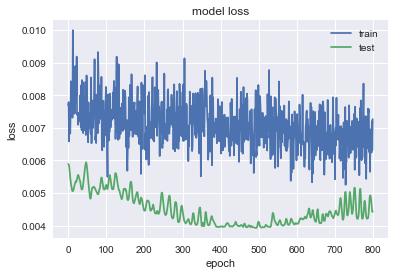

               FTI
MSE        8.11342
MAE         2.3768
R2        0.231007
MAPE (%)    8.9209


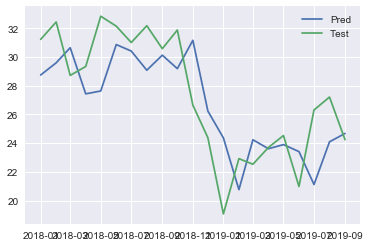

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1439 - val_loss: 0.4096
Epoch 2/1000
0s - loss: 0.0895 - val_loss: 0.2868
Epoch 3/1000
0s - loss: 0.0530 - val_loss: 0.1909
Epoch 4/1000
0s - loss: 0.0308 - val_loss: 0.1186
Epoch 5/1000
0s - loss: 0.0176 - val_loss: 0.0689
Epoch 6/1000
0s - loss: 0.0151 - val_loss: 0.0386
Epoch 7/1000
0s - loss: 0.0170 - val_loss: 0.0226
Epoch 8/1000
0s - loss: 0.0215 - val_loss: 0.0157
Epoch 9/1000
0s - loss: 0.0242 - val_loss: 0.0134
Epoch 10/1000
0s - loss: 0.0245 - val_loss: 0.0133
Epoch 11/1000
0s - loss: 0.0254 - val_loss: 0.0147
Epoch 12/1000
0s - loss: 0.0204 - val_loss: 0.0178
Epoch 13/1000
0s - loss: 0.0167 - val_loss: 0.0224
Epoch 14/1000
0s - loss: 0.0122 - val_loss: 0.0279
Epoch 15/1000
0s - loss: 0.0095 - val_loss: 0.0339
Epoch 16/1000
0s - loss: 0.0081 - val_loss: 0.0397
Epoch 17/1000
0s - loss: 0.0078 - val_loss: 0.0445
Epoch 18/1000
0s - loss: 0.0083 - val_loss: 0.0480
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0033 - val_loss: 0.0122
Epoch 163/1000
0s - loss: 0.0032 - val_loss: 0.0122
Epoch 164/1000
0s - loss: 0.0027 - val_loss: 0.0122
Epoch 165/1000
0s - loss: 0.0028 - val_loss: 0.0123
Epoch 166/1000
0s - loss: 0.0026 - val_loss: 0.0123
Epoch 167/1000
0s - loss: 0.0036 - val_loss: 0.0123
Epoch 168/1000
0s - loss: 0.0028 - val_loss: 0.0123
Epoch 169/1000
0s - loss: 0.0029 - val_loss: 0.0123
Epoch 170/1000
0s - loss: 0.0032 - val_loss: 0.0123
Epoch 171/1000
0s - loss: 0.0029 - val_loss: 0.0123
Epoch 172/1000
0s - loss: 0.0026 - val_loss: 0.0123
Epoch 173/1000
0s - loss: 0.0032 - val_loss: 0.0123
Epoch 174/1000
0s - loss: 0.0034 - val_loss: 0.0124
Epoch 175/1000
0s - loss: 0.0031 - val_loss: 0.0124
Epoch 176/1000
0s - loss: 0.0032 - val_loss: 0.0125
Epoch 177/1000
0s - loss: 0.0023 - val_loss: 0.0125
Epoch 178/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 180/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0152
Epoch 323/1000
0s - loss: 0.0028 - val_loss: 0.0152
Epoch 324/1000
0s - loss: 0.0023 - val_loss: 0.0150
Epoch 325/1000
0s - loss: 0.0026 - val_loss: 0.0149
Epoch 326/1000
0s - loss: 0.0025 - val_loss: 0.0146
Epoch 327/1000
0s - loss: 0.0024 - val_loss: 0.0144
Epoch 328/1000
0s - loss: 0.0023 - val_loss: 0.0143
Epoch 329/1000
0s - loss: 0.0027 - val_loss: 0.0146
Epoch 330/1000
0s - loss: 0.0023 - val_loss: 0.0149
Epoch 331/1000
0s - loss: 0.0020 - val_loss: 0.0150
Epoch 332/1000
0s - loss: 0.0027 - val_loss: 0.0152
Epoch 333/1000
0s - loss: 0.0023 - val_loss: 0.0154
Epoch 334/1000
0s - loss: 0.0024 - val_loss: 0.0155
Epoch 335/1000
0s - loss: 0.0024 - val_loss: 0.0157
Epoch 336/1000
0s - loss: 0.0029 - val_loss: 0.0158
Epoch 337/1000
0s - loss: 0.0023 - val_loss: 0.0157
Epoch 338/1000
0s - loss: 0.0024 - val_loss: 0.0154
Epoch 339/1000
0s - loss: 0.0022 - val_loss: 0.0149
Epoch 340/1000
0s - loss: 0.0027 - val_loss: 0.0147
Epoch 341/1000
0s - loss: 0

0s - loss: 0.0019 - val_loss: 0.0147
Epoch 482/1000
0s - loss: 0.0018 - val_loss: 0.0150
Epoch 483/1000
0s - loss: 0.0021 - val_loss: 0.0153
Epoch 484/1000
0s - loss: 0.0022 - val_loss: 0.0154
Epoch 485/1000
0s - loss: 0.0023 - val_loss: 0.0153
Epoch 486/1000
0s - loss: 0.0019 - val_loss: 0.0150
Epoch 487/1000
0s - loss: 0.0017 - val_loss: 0.0150
Epoch 488/1000
0s - loss: 0.0025 - val_loss: 0.0150
Epoch 489/1000
0s - loss: 0.0020 - val_loss: 0.0150
Epoch 490/1000
0s - loss: 0.0022 - val_loss: 0.0152
Epoch 491/1000
0s - loss: 0.0025 - val_loss: 0.0154
Epoch 492/1000
0s - loss: 0.0024 - val_loss: 0.0157
Epoch 493/1000
0s - loss: 0.0021 - val_loss: 0.0161
Epoch 494/1000
0s - loss: 0.0022 - val_loss: 0.0161
Epoch 495/1000
0s - loss: 0.0021 - val_loss: 0.0162
Epoch 496/1000
0s - loss: 0.0017 - val_loss: 0.0162
Epoch 497/1000
0s - loss: 0.0025 - val_loss: 0.0160
Epoch 498/1000
0s - loss: 0.0024 - val_loss: 0.0160
Epoch 499/1000
0s - loss: 0.0023 - val_loss: 0.0162
Epoch 500/1000
0s - loss: 0

0s - loss: 0.0018 - val_loss: 0.0137
Epoch 649/1000
0s - loss: 0.0022 - val_loss: 0.0135
Epoch 650/1000
0s - loss: 0.0019 - val_loss: 0.0134
Epoch 651/1000
0s - loss: 0.0021 - val_loss: 0.0135
Epoch 652/1000
0s - loss: 0.0022 - val_loss: 0.0138
Epoch 653/1000
0s - loss: 0.0023 - val_loss: 0.0143
Epoch 654/1000
0s - loss: 0.0020 - val_loss: 0.0149
Epoch 655/1000
0s - loss: 0.0019 - val_loss: 0.0157
Epoch 656/1000
0s - loss: 0.0016 - val_loss: 0.0161
Epoch 657/1000
0s - loss: 0.0019 - val_loss: 0.0161
Epoch 658/1000
0s - loss: 0.0023 - val_loss: 0.0159
Epoch 659/1000
0s - loss: 0.0020 - val_loss: 0.0159
Epoch 660/1000
0s - loss: 0.0022 - val_loss: 0.0158
Epoch 661/1000
0s - loss: 0.0022 - val_loss: 0.0153
Epoch 662/1000
0s - loss: 0.0016 - val_loss: 0.0148
Epoch 663/1000
0s - loss: 0.0025 - val_loss: 0.0142
Epoch 664/1000
0s - loss: 0.0019 - val_loss: 0.0139
Epoch 665/1000
0s - loss: 0.0020 - val_loss: 0.0139
Epoch 666/1000
0s - loss: 0.0023 - val_loss: 0.0143
Epoch 667/1000
0s - loss: 0

0s - loss: 0.0019 - val_loss: 0.0145
Epoch 818/1000
0s - loss: 0.0019 - val_loss: 0.0146
Epoch 819/1000
0s - loss: 0.0023 - val_loss: 0.0146
Epoch 820/1000
0s - loss: 0.0021 - val_loss: 0.0146
Epoch 821/1000
0s - loss: 0.0017 - val_loss: 0.0144
Epoch 822/1000
0s - loss: 0.0018 - val_loss: 0.0142
Epoch 823/1000
0s - loss: 0.0017 - val_loss: 0.0141
Epoch 824/1000
0s - loss: 0.0018 - val_loss: 0.0143
Epoch 825/1000
0s - loss: 0.0021 - val_loss: 0.0143
Epoch 826/1000
0s - loss: 0.0014 - val_loss: 0.0144
Epoch 827/1000
0s - loss: 0.0019 - val_loss: 0.0141
Epoch 828/1000
0s - loss: 0.0017 - val_loss: 0.0138
Epoch 829/1000
0s - loss: 0.0016 - val_loss: 0.0138
Epoch 830/1000
0s - loss: 0.0019 - val_loss: 0.0138
Epoch 831/1000
0s - loss: 0.0021 - val_loss: 0.0141
Epoch 832/1000
0s - loss: 0.0027 - val_loss: 0.0145
Epoch 833/1000
0s - loss: 0.0023 - val_loss: 0.0148
Epoch 834/1000
0s - loss: 0.0019 - val_loss: 0.0146
Epoch 835/1000
0s - loss: 0.0018 - val_loss: 0.0143
Epoch 836/1000
0s - loss: 0

0s - loss: 0.0021 - val_loss: 0.0127
Epoch 988/1000
0s - loss: 0.0017 - val_loss: 0.0130
Epoch 989/1000
0s - loss: 0.0018 - val_loss: 0.0127
Epoch 990/1000
0s - loss: 0.0019 - val_loss: 0.0126
Epoch 991/1000
0s - loss: 0.0017 - val_loss: 0.0126
Epoch 992/1000
0s - loss: 0.0021 - val_loss: 0.0125
Epoch 993/1000
0s - loss: 0.0024 - val_loss: 0.0123
Epoch 994/1000
0s - loss: 0.0018 - val_loss: 0.0123
Epoch 995/1000
0s - loss: 0.0017 - val_loss: 0.0123
Epoch 996/1000
0s - loss: 0.0020 - val_loss: 0.0127
Epoch 997/1000
0s - loss: 0.0017 - val_loss: 0.0134
Epoch 998/1000
0s - loss: 0.0019 - val_loss: 0.0139
Epoch 999/1000
0s - loss: 0.0022 - val_loss: 0.0144
Epoch 1000/1000
0s - loss: 0.0016 - val_loss: 0.0148


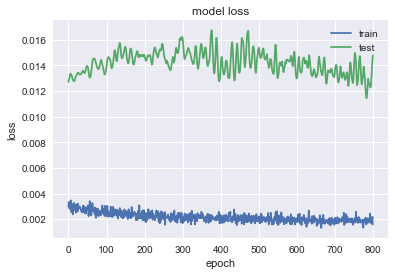

               BLK
MSE        2568.38
MAE        39.9648
R2       -0.702881
MAPE (%)   8.98486


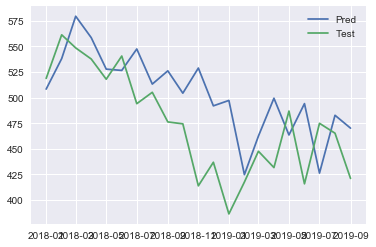

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3776 - val_loss: 0.2721
Epoch 2/1000
0s - loss: 0.2666 - val_loss: 0.1672
Epoch 3/1000
0s - loss: 0.1875 - val_loss: 0.0917
Epoch 4/1000
0s - loss: 0.1243 - val_loss: 0.0424
Epoch 5/1000
0s - loss: 0.0811 - val_loss: 0.0181
Epoch 6/1000
0s - loss: 0.0540 - val_loss: 0.0175
Epoch 7/1000
0s - loss: 0.0387 - val_loss: 0.0357
Epoch 8/1000
0s - loss: 0.0370 - val_loss: 0.0650
Epoch 9/1000
0s - loss: 0.0404 - val_loss: 0.0960
Epoch 10/1000
0s - loss: 0.0508 - val_loss: 0.1194
Epoch 11/1000
0s - loss: 0.0594 - val_loss: 0.1311
Epoch 12/1000
0s - loss: 0.0575 - val_loss: 0.1314
Epoch 13/1000
0s - loss: 0.0578 - val_loss: 0.1222
Epoch 14/1000
0s - loss: 0.0529 - val_loss: 0.1071
Epoch 15/1000
0s - loss: 0.0496 - val_loss: 0.0895
Epoch 16/1000
0s - loss: 0.0394 - val_loss: 0.0725
Epoch 17/1000
0s - loss: 0.0360 - val_loss: 0.0579
Epoch 18/1000
0s - loss: 0.0306 - val_loss: 0.0460
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0053 - val_loss: 0.0362
Epoch 170/1000
0s - loss: 0.0048 - val_loss: 0.0363
Epoch 171/1000
0s - loss: 0.0049 - val_loss: 0.0359
Epoch 172/1000
0s - loss: 0.0039 - val_loss: 0.0358
Epoch 173/1000
0s - loss: 0.0048 - val_loss: 0.0353
Epoch 174/1000
0s - loss: 0.0060 - val_loss: 0.0346
Epoch 175/1000
0s - loss: 0.0067 - val_loss: 0.0341
Epoch 176/1000
0s - loss: 0.0045 - val_loss: 0.0336
Epoch 177/1000
0s - loss: 0.0042 - val_loss: 0.0333
Epoch 178/1000
0s - loss: 0.0040 - val_loss: 0.0329
Epoch 179/1000
0s - loss: 0.0052 - val_loss: 0.0329
Epoch 180/1000
0s - loss: 0.0045 - val_loss: 0.0330
Epoch 181/1000
0s - loss: 0.0060 - val_loss: 0.0333
Epoch 182/1000
0s - loss: 0.0047 - val_loss: 0.0335
Epoch 183/1000
0s - loss: 0.0059 - val_loss: 0.0340
Epoch 184/1000
0s - loss: 0.0057 - val_loss: 0.0346
Epoch 185/1000
0s - loss: 0.0049 - val_loss: 0.0353
Epoch 186/1000
0s - loss: 0.0046 - val_loss: 0.0360
Epoch 187/1000
0s - loss: 0.0044 - val_loss: 0.0369
Epoch 188/1000
0s - loss: 0

0s - loss: 0.0041 - val_loss: 0.0331
Epoch 341/1000
0s - loss: 0.0041 - val_loss: 0.0328
Epoch 342/1000
0s - loss: 0.0040 - val_loss: 0.0322
Epoch 343/1000
0s - loss: 0.0056 - val_loss: 0.0319
Epoch 344/1000
0s - loss: 0.0043 - val_loss: 0.0318
Epoch 345/1000
0s - loss: 0.0037 - val_loss: 0.0317
Epoch 346/1000
0s - loss: 0.0058 - val_loss: 0.0318
Epoch 347/1000
0s - loss: 0.0054 - val_loss: 0.0319
Epoch 348/1000
0s - loss: 0.0046 - val_loss: 0.0319
Epoch 349/1000
0s - loss: 0.0054 - val_loss: 0.0319
Epoch 350/1000
0s - loss: 0.0046 - val_loss: 0.0320
Epoch 351/1000
0s - loss: 0.0042 - val_loss: 0.0321
Epoch 352/1000
0s - loss: 0.0046 - val_loss: 0.0323
Epoch 353/1000
0s - loss: 0.0046 - val_loss: 0.0324
Epoch 354/1000
0s - loss: 0.0051 - val_loss: 0.0323
Epoch 355/1000
0s - loss: 0.0046 - val_loss: 0.0322
Epoch 356/1000
0s - loss: 0.0041 - val_loss: 0.0322
Epoch 357/1000
0s - loss: 0.0047 - val_loss: 0.0321
Epoch 358/1000
0s - loss: 0.0041 - val_loss: 0.0318
Epoch 359/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0307
Epoch 512/1000
0s - loss: 0.0045 - val_loss: 0.0304
Epoch 513/1000
0s - loss: 0.0050 - val_loss: 0.0299
Epoch 514/1000
0s - loss: 0.0053 - val_loss: 0.0294
Epoch 515/1000
0s - loss: 0.0048 - val_loss: 0.0289
Epoch 516/1000
0s - loss: 0.0047 - val_loss: 0.0287
Epoch 517/1000
0s - loss: 0.0049 - val_loss: 0.0289
Epoch 518/1000
0s - loss: 0.0057 - val_loss: 0.0293
Epoch 519/1000
0s - loss: 0.0043 - val_loss: 0.0296
Epoch 520/1000
0s - loss: 0.0041 - val_loss: 0.0299
Epoch 521/1000
0s - loss: 0.0043 - val_loss: 0.0304
Epoch 522/1000
0s - loss: 0.0043 - val_loss: 0.0307
Epoch 523/1000
0s - loss: 0.0042 - val_loss: 0.0312
Epoch 524/1000
0s - loss: 0.0042 - val_loss: 0.0318
Epoch 525/1000
0s - loss: 0.0049 - val_loss: 0.0324
Epoch 526/1000
0s - loss: 0.0039 - val_loss: 0.0330
Epoch 527/1000
0s - loss: 0.0046 - val_loss: 0.0333
Epoch 528/1000
0s - loss: 0.0048 - val_loss: 0.0332
Epoch 529/1000
0s - loss: 0.0052 - val_loss: 0.0328
Epoch 530/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0310
Epoch 683/1000
0s - loss: 0.0042 - val_loss: 0.0311
Epoch 684/1000
0s - loss: 0.0041 - val_loss: 0.0309
Epoch 685/1000
0s - loss: 0.0036 - val_loss: 0.0305
Epoch 686/1000
0s - loss: 0.0043 - val_loss: 0.0301
Epoch 687/1000
0s - loss: 0.0044 - val_loss: 0.0299
Epoch 688/1000
0s - loss: 0.0039 - val_loss: 0.0297
Epoch 689/1000
0s - loss: 0.0047 - val_loss: 0.0300
Epoch 690/1000
0s - loss: 0.0037 - val_loss: 0.0303
Epoch 691/1000
0s - loss: 0.0042 - val_loss: 0.0307
Epoch 692/1000
0s - loss: 0.0047 - val_loss: 0.0313
Epoch 693/1000
0s - loss: 0.0046 - val_loss: 0.0319
Epoch 694/1000
0s - loss: 0.0038 - val_loss: 0.0324
Epoch 695/1000
0s - loss: 0.0039 - val_loss: 0.0329
Epoch 696/1000
0s - loss: 0.0046 - val_loss: 0.0327
Epoch 697/1000
0s - loss: 0.0045 - val_loss: 0.0321
Epoch 698/1000
0s - loss: 0.0039 - val_loss: 0.0315
Epoch 699/1000
0s - loss: 0.0043 - val_loss: 0.0307
Epoch 700/1000
0s - loss: 0.0041 - val_loss: 0.0302
Epoch 701/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0324
Epoch 854/1000
0s - loss: 0.0048 - val_loss: 0.0320
Epoch 855/1000
0s - loss: 0.0041 - val_loss: 0.0312
Epoch 856/1000
0s - loss: 0.0038 - val_loss: 0.0301
Epoch 857/1000
0s - loss: 0.0050 - val_loss: 0.0292
Epoch 858/1000
0s - loss: 0.0034 - val_loss: 0.0286
Epoch 859/1000
0s - loss: 0.0038 - val_loss: 0.0281
Epoch 860/1000
0s - loss: 0.0036 - val_loss: 0.0281
Epoch 861/1000
0s - loss: 0.0050 - val_loss: 0.0282
Epoch 862/1000
0s - loss: 0.0040 - val_loss: 0.0286
Epoch 863/1000
0s - loss: 0.0033 - val_loss: 0.0292
Epoch 864/1000
0s - loss: 0.0039 - val_loss: 0.0301
Epoch 865/1000
0s - loss: 0.0043 - val_loss: 0.0311
Epoch 866/1000
0s - loss: 0.0053 - val_loss: 0.0319
Epoch 867/1000
0s - loss: 0.0040 - val_loss: 0.0321
Epoch 868/1000
0s - loss: 0.0044 - val_loss: 0.0316
Epoch 869/1000
0s - loss: 0.0045 - val_loss: 0.0309
Epoch 870/1000
0s - loss: 0.0056 - val_loss: 0.0294
Epoch 871/1000
0s - loss: 0.0040 - val_loss: 0.0280
Epoch 872/1000
0s - loss: 0

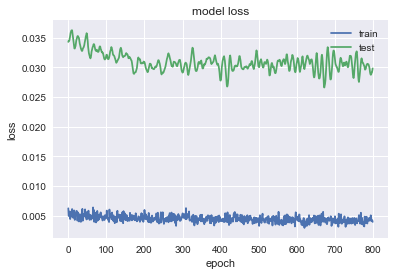

              DVA
MSE       89.6976
MAE       7.54317
R2       -2.54245
MAPE (%)  13.1309


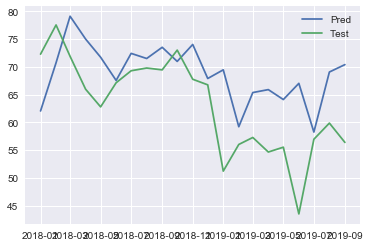

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0366 - val_loss: 0.3839
Epoch 2/1000
0s - loss: 0.0150 - val_loss: 0.2780
Epoch 3/1000
0s - loss: 0.0102 - val_loss: 0.2140
Epoch 4/1000
0s - loss: 0.0117 - val_loss: 0.1791
Epoch 5/1000
0s - loss: 0.0114 - val_loss: 0.1633
Epoch 6/1000
0s - loss: 0.0119 - val_loss: 0.1597
Epoch 7/1000
0s - loss: 0.0086 - val_loss: 0.1629
Epoch 8/1000
0s - loss: 0.0067 - val_loss: 0.1685
Epoch 9/1000
0s - loss: 0.0048 - val_loss: 0.1746
Epoch 10/1000
0s - loss: 0.0039 - val_loss: 0.1795
Epoch 11/1000
0s - loss: 0.0031 - val_loss: 0.1817
Epoch 12/1000
0s - loss: 0.0034 - val_loss: 0.1805
Epoch 13/1000
0s - loss: 0.0038 - val_loss: 0.1755
Epoch 14/1000
0s - loss: 0.0035 - val_loss: 0.1669
Epoch 15/1000
0s - loss: 0.0043 - val_loss: 0.1554
Epoch 16/1000
0s - loss: 0.0033 - val_loss: 0.1425
Epoch 17/1000
0s - loss: 0.0031 - val_loss: 0.1288
Epoch 18/1000
0s - loss: 0.0024 - val_loss: 0.1157
Epoch 19/1000
0s - loss: 0.0

0s - loss: 9.8324e-04 - val_loss: 0.0485
Epoch 163/1000
0s - loss: 9.9074e-04 - val_loss: 0.0484
Epoch 164/1000
0s - loss: 9.2648e-04 - val_loss: 0.0481
Epoch 165/1000
0s - loss: 8.0394e-04 - val_loss: 0.0477
Epoch 166/1000
0s - loss: 9.8079e-04 - val_loss: 0.0474
Epoch 167/1000
0s - loss: 0.0013 - val_loss: 0.0470
Epoch 168/1000
0s - loss: 9.7212e-04 - val_loss: 0.0464
Epoch 169/1000
0s - loss: 7.9751e-04 - val_loss: 0.0458
Epoch 170/1000
0s - loss: 9.5435e-04 - val_loss: 0.0451
Epoch 171/1000
0s - loss: 9.0457e-04 - val_loss: 0.0447
Epoch 172/1000
0s - loss: 8.7063e-04 - val_loss: 0.0445
Epoch 173/1000
0s - loss: 8.3043e-04 - val_loss: 0.0439
Epoch 174/1000
0s - loss: 8.2409e-04 - val_loss: 0.0435
Epoch 175/1000
0s - loss: 8.2497e-04 - val_loss: 0.0432
Epoch 176/1000
0s - loss: 8.9892e-04 - val_loss: 0.0428
Epoch 177/1000
0s - loss: 8.6961e-04 - val_loss: 0.0430
Epoch 178/1000
0s - loss: 9.1855e-04 - val_loss: 0.0429
Epoch 179/1000
0s - loss: 0.0010 - val_loss: 0.0424
Epoch 180/1000


0s - loss: 6.5660e-04 - val_loss: 0.0248
Epoch 312/1000
0s - loss: 7.7193e-04 - val_loss: 0.0255
Epoch 313/1000
0s - loss: 7.3200e-04 - val_loss: 0.0261
Epoch 314/1000
0s - loss: 7.8224e-04 - val_loss: 0.0265
Epoch 315/1000
0s - loss: 7.6780e-04 - val_loss: 0.0270
Epoch 316/1000
0s - loss: 9.6498e-04 - val_loss: 0.0271
Epoch 317/1000
0s - loss: 8.3160e-04 - val_loss: 0.0269
Epoch 318/1000
0s - loss: 7.6611e-04 - val_loss: 0.0265
Epoch 319/1000
0s - loss: 6.7505e-04 - val_loss: 0.0259
Epoch 320/1000
0s - loss: 6.0069e-04 - val_loss: 0.0255
Epoch 321/1000
0s - loss: 7.6584e-04 - val_loss: 0.0251
Epoch 322/1000
0s - loss: 6.2453e-04 - val_loss: 0.0248
Epoch 323/1000
0s - loss: 6.2567e-04 - val_loss: 0.0243
Epoch 324/1000
0s - loss: 6.6952e-04 - val_loss: 0.0238
Epoch 325/1000
0s - loss: 7.2467e-04 - val_loss: 0.0234
Epoch 326/1000
0s - loss: 8.9867e-04 - val_loss: 0.0229
Epoch 327/1000
0s - loss: 7.8507e-04 - val_loss: 0.0230
Epoch 328/1000
0s - loss: 8.5931e-04 - val_loss: 0.0230
Epoch 3

0s - loss: 7.4252e-04 - val_loss: 0.0170
Epoch 465/1000
0s - loss: 5.8980e-04 - val_loss: 0.0174
Epoch 466/1000
0s - loss: 6.3933e-04 - val_loss: 0.0177
Epoch 467/1000
0s - loss: 6.3652e-04 - val_loss: 0.0180
Epoch 468/1000
0s - loss: 8.0653e-04 - val_loss: 0.0183
Epoch 469/1000
0s - loss: 5.8261e-04 - val_loss: 0.0183
Epoch 470/1000
0s - loss: 6.5629e-04 - val_loss: 0.0182
Epoch 471/1000
0s - loss: 6.8558e-04 - val_loss: 0.0178
Epoch 472/1000
0s - loss: 7.1257e-04 - val_loss: 0.0173
Epoch 473/1000
0s - loss: 7.7129e-04 - val_loss: 0.0169
Epoch 474/1000
0s - loss: 5.4817e-04 - val_loss: 0.0164
Epoch 475/1000
0s - loss: 6.8053e-04 - val_loss: 0.0160
Epoch 476/1000
0s - loss: 6.1313e-04 - val_loss: 0.0156
Epoch 477/1000
0s - loss: 5.6273e-04 - val_loss: 0.0153
Epoch 478/1000
0s - loss: 7.5822e-04 - val_loss: 0.0151
Epoch 479/1000
0s - loss: 5.4775e-04 - val_loss: 0.0152
Epoch 480/1000
0s - loss: 5.7889e-04 - val_loss: 0.0155
Epoch 481/1000
0s - loss: 7.2480e-04 - val_loss: 0.0158
Epoch 4

0s - loss: 6.7810e-04 - val_loss: 0.0122
Epoch 617/1000
0s - loss: 6.7327e-04 - val_loss: 0.0121
Epoch 618/1000
0s - loss: 8.3498e-04 - val_loss: 0.0119
Epoch 619/1000
0s - loss: 6.9129e-04 - val_loss: 0.0119
Epoch 620/1000
0s - loss: 5.9709e-04 - val_loss: 0.0120
Epoch 621/1000
0s - loss: 7.3080e-04 - val_loss: 0.0120
Epoch 622/1000
0s - loss: 6.3748e-04 - val_loss: 0.0119
Epoch 623/1000
0s - loss: 6.5946e-04 - val_loss: 0.0117
Epoch 624/1000
0s - loss: 6.5318e-04 - val_loss: 0.0116
Epoch 625/1000
0s - loss: 4.9913e-04 - val_loss: 0.0115
Epoch 626/1000
0s - loss: 5.3517e-04 - val_loss: 0.0113
Epoch 627/1000
0s - loss: 6.8012e-04 - val_loss: 0.0112
Epoch 628/1000
0s - loss: 4.2236e-04 - val_loss: 0.0111
Epoch 629/1000
0s - loss: 5.8610e-04 - val_loss: 0.0112
Epoch 630/1000
0s - loss: 7.4403e-04 - val_loss: 0.0114
Epoch 631/1000
0s - loss: 6.3590e-04 - val_loss: 0.0118
Epoch 632/1000
0s - loss: 6.7691e-04 - val_loss: 0.0121
Epoch 633/1000
0s - loss: 4.0909e-04 - val_loss: 0.0123
Epoch 6

0s - loss: 7.5476e-04 - val_loss: 0.0101
Epoch 769/1000
0s - loss: 4.5466e-04 - val_loss: 0.0103
Epoch 770/1000
0s - loss: 5.2580e-04 - val_loss: 0.0104
Epoch 771/1000
0s - loss: 5.9868e-04 - val_loss: 0.0104
Epoch 772/1000
0s - loss: 5.6074e-04 - val_loss: 0.0103
Epoch 773/1000
0s - loss: 4.5119e-04 - val_loss: 0.0101
Epoch 774/1000
0s - loss: 6.4311e-04 - val_loss: 0.0100
Epoch 775/1000
0s - loss: 4.3834e-04 - val_loss: 0.0099
Epoch 776/1000
0s - loss: 5.1088e-04 - val_loss: 0.0099
Epoch 777/1000
0s - loss: 4.9386e-04 - val_loss: 0.0100
Epoch 778/1000
0s - loss: 5.3329e-04 - val_loss: 0.0100
Epoch 779/1000
0s - loss: 5.0620e-04 - val_loss: 0.0101
Epoch 780/1000
0s - loss: 5.0793e-04 - val_loss: 0.0101
Epoch 781/1000
0s - loss: 7.3083e-04 - val_loss: 0.0100
Epoch 782/1000
0s - loss: 5.0014e-04 - val_loss: 0.0100
Epoch 783/1000
0s - loss: 3.9633e-04 - val_loss: 0.0100
Epoch 784/1000
0s - loss: 4.2064e-04 - val_loss: 0.0101
Epoch 785/1000
0s - loss: 6.5191e-04 - val_loss: 0.0101
Epoch 7

0s - loss: 6.4141e-04 - val_loss: 0.0096
Epoch 921/1000
0s - loss: 5.2117e-04 - val_loss: 0.0095
Epoch 922/1000
0s - loss: 4.0684e-04 - val_loss: 0.0094
Epoch 923/1000
0s - loss: 5.7247e-04 - val_loss: 0.0093
Epoch 924/1000
0s - loss: 5.4862e-04 - val_loss: 0.0093
Epoch 925/1000
0s - loss: 6.2834e-04 - val_loss: 0.0093
Epoch 926/1000
0s - loss: 4.8086e-04 - val_loss: 0.0094
Epoch 927/1000
0s - loss: 4.0114e-04 - val_loss: 0.0095
Epoch 928/1000
0s - loss: 5.7519e-04 - val_loss: 0.0097
Epoch 929/1000
0s - loss: 3.8878e-04 - val_loss: 0.0097
Epoch 930/1000
0s - loss: 4.1565e-04 - val_loss: 0.0097
Epoch 931/1000
0s - loss: 4.7115e-04 - val_loss: 0.0097
Epoch 932/1000
0s - loss: 4.2448e-04 - val_loss: 0.0096
Epoch 933/1000
0s - loss: 5.2384e-04 - val_loss: 0.0096
Epoch 934/1000
0s - loss: 5.4329e-04 - val_loss: 0.0095
Epoch 935/1000
0s - loss: 6.3992e-04 - val_loss: 0.0095
Epoch 936/1000
0s - loss: 5.3365e-04 - val_loss: 0.0095
Epoch 937/1000
0s - loss: 5.2317e-04 - val_loss: 0.0095
Epoch 9

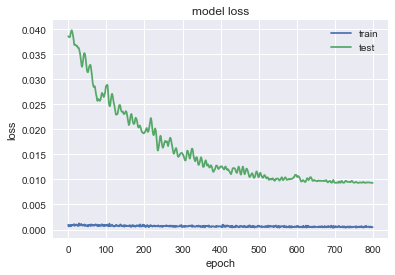

                BA
MSE        1418.25
MAE        29.2594
R2       -0.626825
MAPE (%)   8.04095


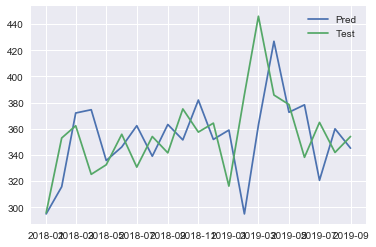

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3664 - val_loss: 0.0455
Epoch 2/1000
0s - loss: 0.2676 - val_loss: 0.0183
Epoch 3/1000
0s - loss: 0.1890 - val_loss: 0.0149
Epoch 4/1000
0s - loss: 0.1314 - val_loss: 0.0329
Epoch 5/1000
0s - loss: 0.0925 - val_loss: 0.0700
Epoch 6/1000
0s - loss: 0.0681 - val_loss: 0.1223
Epoch 7/1000
0s - loss: 0.0541 - val_loss: 0.1814
Epoch 8/1000
0s - loss: 0.0483 - val_loss: 0.2364
Epoch 9/1000
0s - loss: 0.0558 - val_loss: 0.2748
Epoch 10/1000
0s - loss: 0.0630 - val_loss: 0.2914
Epoch 11/1000
0s - loss: 0.0662 - val_loss: 0.2875
Epoch 12/1000
0s - loss: 0.0686 - val_loss: 0.2670
Epoch 13/1000
0s - loss: 0.0601 - val_loss: 0.2359
Epoch 14/1000
0s - loss: 0.0577 - val_loss: 0.1994
Epoch 15/1000
0s - loss: 0.0543 - val_loss: 0.1622
Epoch 16/1000
0s - loss: 0.0441 - val_loss: 0.1282
Epoch 17/1000
0s - loss: 0.0365 - val_loss: 0.0990
Epoch 18/1000
0s - loss: 0.0331 - val_loss: 0.0754
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0069 - val_loss: 0.0209
Epoch 165/1000
0s - loss: 0.0056 - val_loss: 0.0211
Epoch 166/1000
0s - loss: 0.0059 - val_loss: 0.0211
Epoch 167/1000
0s - loss: 0.0065 - val_loss: 0.0213
Epoch 168/1000
0s - loss: 0.0066 - val_loss: 0.0215
Epoch 169/1000
0s - loss: 0.0067 - val_loss: 0.0216
Epoch 170/1000
0s - loss: 0.0070 - val_loss: 0.0218
Epoch 171/1000
0s - loss: 0.0062 - val_loss: 0.0221
Epoch 172/1000
0s - loss: 0.0071 - val_loss: 0.0222
Epoch 173/1000
0s - loss: 0.0080 - val_loss: 0.0223
Epoch 174/1000
0s - loss: 0.0077 - val_loss: 0.0223
Epoch 175/1000
0s - loss: 0.0073 - val_loss: 0.0222
Epoch 176/1000
0s - loss: 0.0076 - val_loss: 0.0220
Epoch 177/1000
0s - loss: 0.0067 - val_loss: 0.0217
Epoch 178/1000
0s - loss: 0.0052 - val_loss: 0.0212
Epoch 179/1000
0s - loss: 0.0061 - val_loss: 0.0209
Epoch 180/1000
0s - loss: 0.0058 - val_loss: 0.0206
Epoch 181/1000
0s - loss: 0.0068 - val_loss: 0.0203
Epoch 182/1000
0s - loss: 0.0059 - val_loss: 0.0201
Epoch 183/1000
0s - loss: 0

0s - loss: 0.0066 - val_loss: 0.0199
Epoch 328/1000
0s - loss: 0.0075 - val_loss: 0.0202
Epoch 329/1000
0s - loss: 0.0071 - val_loss: 0.0202
Epoch 330/1000
0s - loss: 0.0064 - val_loss: 0.0203
Epoch 331/1000
0s - loss: 0.0056 - val_loss: 0.0203
Epoch 332/1000
0s - loss: 0.0063 - val_loss: 0.0205
Epoch 333/1000
0s - loss: 0.0072 - val_loss: 0.0208
Epoch 334/1000
0s - loss: 0.0069 - val_loss: 0.0208
Epoch 335/1000
0s - loss: 0.0076 - val_loss: 0.0209
Epoch 336/1000
0s - loss: 0.0061 - val_loss: 0.0210
Epoch 337/1000
0s - loss: 0.0071 - val_loss: 0.0208
Epoch 338/1000
0s - loss: 0.0069 - val_loss: 0.0206
Epoch 339/1000
0s - loss: 0.0072 - val_loss: 0.0203
Epoch 340/1000
0s - loss: 0.0065 - val_loss: 0.0201
Epoch 341/1000
0s - loss: 0.0070 - val_loss: 0.0199
Epoch 342/1000
0s - loss: 0.0057 - val_loss: 0.0199
Epoch 343/1000
0s - loss: 0.0070 - val_loss: 0.0198
Epoch 344/1000
0s - loss: 0.0058 - val_loss: 0.0196
Epoch 345/1000
0s - loss: 0.0058 - val_loss: 0.0195
Epoch 346/1000
0s - loss: 0

0s - loss: 0.0072 - val_loss: 0.0211
Epoch 486/1000
0s - loss: 0.0066 - val_loss: 0.0209
Epoch 487/1000
0s - loss: 0.0053 - val_loss: 0.0208
Epoch 488/1000
0s - loss: 0.0064 - val_loss: 0.0205
Epoch 489/1000
0s - loss: 0.0063 - val_loss: 0.0204
Epoch 490/1000
0s - loss: 0.0062 - val_loss: 0.0204
Epoch 491/1000
0s - loss: 0.0054 - val_loss: 0.0205
Epoch 492/1000
0s - loss: 0.0064 - val_loss: 0.0206
Epoch 493/1000
0s - loss: 0.0063 - val_loss: 0.0208
Epoch 494/1000
0s - loss: 0.0075 - val_loss: 0.0209
Epoch 495/1000
0s - loss: 0.0061 - val_loss: 0.0208
Epoch 496/1000
0s - loss: 0.0051 - val_loss: 0.0206
Epoch 497/1000
0s - loss: 0.0056 - val_loss: 0.0204
Epoch 498/1000
0s - loss: 0.0056 - val_loss: 0.0200
Epoch 499/1000
0s - loss: 0.0058 - val_loss: 0.0196
Epoch 500/1000
0s - loss: 0.0067 - val_loss: 0.0193
Epoch 501/1000
0s - loss: 0.0061 - val_loss: 0.0191
Epoch 502/1000
0s - loss: 0.0063 - val_loss: 0.0192
Epoch 503/1000
0s - loss: 0.0055 - val_loss: 0.0194
Epoch 504/1000
0s - loss: 0

0s - loss: 0.0059 - val_loss: 0.0199
Epoch 657/1000
0s - loss: 0.0061 - val_loss: 0.0204
Epoch 658/1000
0s - loss: 0.0066 - val_loss: 0.0210
Epoch 659/1000
0s - loss: 0.0050 - val_loss: 0.0215
Epoch 660/1000
0s - loss: 0.0060 - val_loss: 0.0218
Epoch 661/1000
0s - loss: 0.0059 - val_loss: 0.0220
Epoch 662/1000
0s - loss: 0.0052 - val_loss: 0.0219
Epoch 663/1000
0s - loss: 0.0060 - val_loss: 0.0217
Epoch 664/1000
0s - loss: 0.0055 - val_loss: 0.0214
Epoch 665/1000
0s - loss: 0.0061 - val_loss: 0.0209
Epoch 666/1000
0s - loss: 0.0060 - val_loss: 0.0207
Epoch 667/1000
0s - loss: 0.0055 - val_loss: 0.0204
Epoch 668/1000
0s - loss: 0.0066 - val_loss: 0.0204
Epoch 669/1000
0s - loss: 0.0063 - val_loss: 0.0204
Epoch 670/1000
0s - loss: 0.0056 - val_loss: 0.0203
Epoch 671/1000
0s - loss: 0.0060 - val_loss: 0.0201
Epoch 672/1000
0s - loss: 0.0047 - val_loss: 0.0200
Epoch 673/1000
0s - loss: 0.0062 - val_loss: 0.0202
Epoch 674/1000
0s - loss: 0.0056 - val_loss: 0.0206
Epoch 675/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0231
Epoch 826/1000
0s - loss: 0.0060 - val_loss: 0.0231
Epoch 827/1000
0s - loss: 0.0052 - val_loss: 0.0228
Epoch 828/1000
0s - loss: 0.0053 - val_loss: 0.0226
Epoch 829/1000
0s - loss: 0.0056 - val_loss: 0.0223
Epoch 830/1000
0s - loss: 0.0061 - val_loss: 0.0218
Epoch 831/1000
0s - loss: 0.0060 - val_loss: 0.0213
Epoch 832/1000
0s - loss: 0.0053 - val_loss: 0.0210
Epoch 833/1000
0s - loss: 0.0058 - val_loss: 0.0209
Epoch 834/1000
0s - loss: 0.0057 - val_loss: 0.0209
Epoch 835/1000
0s - loss: 0.0055 - val_loss: 0.0209
Epoch 836/1000
0s - loss: 0.0058 - val_loss: 0.0208
Epoch 837/1000
0s - loss: 0.0052 - val_loss: 0.0208
Epoch 838/1000
0s - loss: 0.0052 - val_loss: 0.0208
Epoch 839/1000
0s - loss: 0.0058 - val_loss: 0.0206
Epoch 840/1000
0s - loss: 0.0049 - val_loss: 0.0207
Epoch 841/1000
0s - loss: 0.0055 - val_loss: 0.0207
Epoch 842/1000
0s - loss: 0.0064 - val_loss: 0.0210
Epoch 843/1000
0s - loss: 0.0065 - val_loss: 0.0212
Epoch 844/1000
0s - loss: 0

0s - loss: 0.0059 - val_loss: 0.0232
Epoch 988/1000
0s - loss: 0.0052 - val_loss: 0.0225
Epoch 989/1000
0s - loss: 0.0050 - val_loss: 0.0219
Epoch 990/1000
0s - loss: 0.0056 - val_loss: 0.0213
Epoch 991/1000
0s - loss: 0.0049 - val_loss: 0.0209
Epoch 992/1000
0s - loss: 0.0057 - val_loss: 0.0208
Epoch 993/1000
0s - loss: 0.0053 - val_loss: 0.0211
Epoch 994/1000
0s - loss: 0.0050 - val_loss: 0.0219
Epoch 995/1000
0s - loss: 0.0051 - val_loss: 0.0228
Epoch 996/1000
0s - loss: 0.0046 - val_loss: 0.0233
Epoch 997/1000
0s - loss: 0.0056 - val_loss: 0.0236
Epoch 998/1000
0s - loss: 0.0067 - val_loss: 0.0238
Epoch 999/1000
0s - loss: 0.0059 - val_loss: 0.0237
Epoch 1000/1000
0s - loss: 0.0060 - val_loss: 0.0234


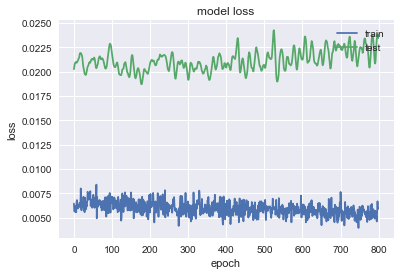

              IBM
MSE       238.071
MAE       13.8983
R2       -1.04899
MAPE (%)  9.95507


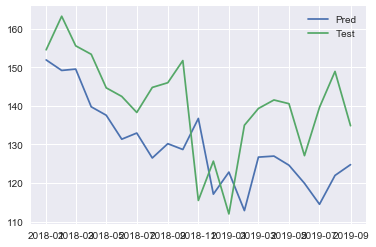

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1052 - val_loss: 0.1183
Epoch 2/1000
0s - loss: 0.0602 - val_loss: 0.0604
Epoch 3/1000
0s - loss: 0.0358 - val_loss: 0.0294
Epoch 4/1000
0s - loss: 0.0231 - val_loss: 0.0181
Epoch 5/1000
0s - loss: 0.0240 - val_loss: 0.0186
Epoch 6/1000
0s - loss: 0.0255 - val_loss: 0.0238
Epoch 7/1000
0s - loss: 0.0287 - val_loss: 0.0286
Epoch 8/1000
0s - loss: 0.0304 - val_loss: 0.0307
Epoch 9/1000
0s - loss: 0.0289 - val_loss: 0.0302
Epoch 10/1000
0s - loss: 0.0267 - val_loss: 0.0279
Epoch 11/1000
0s - loss: 0.0216 - val_loss: 0.0249
Epoch 12/1000
0s - loss: 0.0199 - val_loss: 0.0223
Epoch 13/1000
0s - loss: 0.0172 - val_loss: 0.0204
Epoch 14/1000
0s - loss: 0.0164 - val_loss: 0.0191
Epoch 15/1000
0s - loss: 0.0172 - val_loss: 0.0183
Epoch 16/1000
0s - loss: 0.0156 - val_loss: 0.0180
Epoch 17/1000
0s - loss: 0.0156 - val_loss: 0.0179
Epoch 18/1000
0s - loss: 0.0173 - val_loss: 0.0182
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0031 - val_loss: 0.0540
Epoch 174/1000
0s - loss: 0.0026 - val_loss: 0.0548
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0552
Epoch 176/1000
0s - loss: 0.0031 - val_loss: 0.0547
Epoch 177/1000
0s - loss: 0.0027 - val_loss: 0.0538
Epoch 178/1000
0s - loss: 0.0029 - val_loss: 0.0531
Epoch 179/1000
0s - loss: 0.0034 - val_loss: 0.0522
Epoch 180/1000
0s - loss: 0.0031 - val_loss: 0.0516
Epoch 181/1000
0s - loss: 0.0033 - val_loss: 0.0519
Epoch 182/1000
0s - loss: 0.0028 - val_loss: 0.0519
Epoch 183/1000
0s - loss: 0.0039 - val_loss: 0.0528
Epoch 184/1000
0s - loss: 0.0033 - val_loss: 0.0539
Epoch 185/1000
0s - loss: 0.0031 - val_loss: 0.0555
Epoch 186/1000
0s - loss: 0.0036 - val_loss: 0.0566
Epoch 187/1000
0s - loss: 0.0033 - val_loss: 0.0570
Epoch 188/1000
0s - loss: 0.0029 - val_loss: 0.0574
Epoch 189/1000
0s - loss: 0.0034 - val_loss: 0.0573
Epoch 190/1000
0s - loss: 0.0027 - val_loss: 0.0567
Epoch 191/1000
0s - loss: 0.0034 - val_loss: 0.0546
Epoch 192/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0460
Epoch 336/1000
0s - loss: 0.0030 - val_loss: 0.0468
Epoch 337/1000
0s - loss: 0.0032 - val_loss: 0.0469
Epoch 338/1000
0s - loss: 0.0030 - val_loss: 0.0462
Epoch 339/1000
0s - loss: 0.0030 - val_loss: 0.0447
Epoch 340/1000
0s - loss: 0.0026 - val_loss: 0.0427
Epoch 341/1000
0s - loss: 0.0035 - val_loss: 0.0408
Epoch 342/1000
0s - loss: 0.0035 - val_loss: 0.0401
Epoch 343/1000
0s - loss: 0.0033 - val_loss: 0.0400
Epoch 344/1000
0s - loss: 0.0029 - val_loss: 0.0408
Epoch 345/1000
0s - loss: 0.0030 - val_loss: 0.0420
Epoch 346/1000
0s - loss: 0.0032 - val_loss: 0.0435
Epoch 347/1000
0s - loss: 0.0031 - val_loss: 0.0455
Epoch 348/1000
0s - loss: 0.0029 - val_loss: 0.0474
Epoch 349/1000
0s - loss: 0.0030 - val_loss: 0.0477
Epoch 350/1000
0s - loss: 0.0025 - val_loss: 0.0479
Epoch 351/1000
0s - loss: 0.0034 - val_loss: 0.0467
Epoch 352/1000
0s - loss: 0.0028 - val_loss: 0.0456
Epoch 353/1000
0s - loss: 0.0029 - val_loss: 0.0444
Epoch 354/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0399
Epoch 499/1000
0s - loss: 0.0028 - val_loss: 0.0401
Epoch 500/1000
0s - loss: 0.0031 - val_loss: 0.0409
Epoch 501/1000
0s - loss: 0.0031 - val_loss: 0.0406
Epoch 502/1000
0s - loss: 0.0028 - val_loss: 0.0397
Epoch 503/1000
0s - loss: 0.0030 - val_loss: 0.0381
Epoch 504/1000
0s - loss: 0.0024 - val_loss: 0.0367
Epoch 505/1000
0s - loss: 0.0028 - val_loss: 0.0366
Epoch 506/1000
0s - loss: 0.0032 - val_loss: 0.0366
Epoch 507/1000
0s - loss: 0.0024 - val_loss: 0.0374
Epoch 508/1000
0s - loss: 0.0024 - val_loss: 0.0386
Epoch 509/1000
0s - loss: 0.0028 - val_loss: 0.0395
Epoch 510/1000
0s - loss: 0.0029 - val_loss: 0.0406
Epoch 511/1000
0s - loss: 0.0025 - val_loss: 0.0410
Epoch 512/1000
0s - loss: 0.0031 - val_loss: 0.0406
Epoch 513/1000
0s - loss: 0.0028 - val_loss: 0.0396
Epoch 514/1000
0s - loss: 0.0030 - val_loss: 0.0387
Epoch 515/1000
0s - loss: 0.0028 - val_loss: 0.0381
Epoch 516/1000
0s - loss: 0.0026 - val_loss: 0.0382
Epoch 517/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0405
Epoch 661/1000
0s - loss: 0.0028 - val_loss: 0.0412
Epoch 662/1000
0s - loss: 0.0025 - val_loss: 0.0411
Epoch 663/1000
0s - loss: 0.0023 - val_loss: 0.0404
Epoch 664/1000
0s - loss: 0.0027 - val_loss: 0.0400
Epoch 665/1000
0s - loss: 0.0027 - val_loss: 0.0401
Epoch 666/1000
0s - loss: 0.0029 - val_loss: 0.0405
Epoch 667/1000
0s - loss: 0.0031 - val_loss: 0.0397
Epoch 668/1000
0s - loss: 0.0027 - val_loss: 0.0387
Epoch 669/1000
0s - loss: 0.0028 - val_loss: 0.0391
Epoch 670/1000
0s - loss: 0.0028 - val_loss: 0.0396
Epoch 671/1000
0s - loss: 0.0024 - val_loss: 0.0401
Epoch 672/1000
0s - loss: 0.0029 - val_loss: 0.0412
Epoch 673/1000
0s - loss: 0.0027 - val_loss: 0.0412
Epoch 674/1000
0s - loss: 0.0029 - val_loss: 0.0405
Epoch 675/1000
0s - loss: 0.0033 - val_loss: 0.0398
Epoch 676/1000
0s - loss: 0.0031 - val_loss: 0.0383
Epoch 677/1000
0s - loss: 0.0029 - val_loss: 0.0381
Epoch 678/1000
0s - loss: 0.0021 - val_loss: 0.0383
Epoch 679/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0419
Epoch 820/1000
0s - loss: 0.0024 - val_loss: 0.0423
Epoch 821/1000
0s - loss: 0.0024 - val_loss: 0.0425
Epoch 822/1000
0s - loss: 0.0021 - val_loss: 0.0418
Epoch 823/1000
0s - loss: 0.0024 - val_loss: 0.0404
Epoch 824/1000
0s - loss: 0.0026 - val_loss: 0.0391
Epoch 825/1000
0s - loss: 0.0024 - val_loss: 0.0375
Epoch 826/1000
0s - loss: 0.0029 - val_loss: 0.0362
Epoch 827/1000
0s - loss: 0.0027 - val_loss: 0.0361
Epoch 828/1000
0s - loss: 0.0022 - val_loss: 0.0369
Epoch 829/1000
0s - loss: 0.0033 - val_loss: 0.0376
Epoch 830/1000
0s - loss: 0.0024 - val_loss: 0.0391
Epoch 831/1000
0s - loss: 0.0024 - val_loss: 0.0400
Epoch 832/1000
0s - loss: 0.0028 - val_loss: 0.0399
Epoch 833/1000
0s - loss: 0.0027 - val_loss: 0.0397
Epoch 834/1000
0s - loss: 0.0026 - val_loss: 0.0388
Epoch 835/1000
0s - loss: 0.0031 - val_loss: 0.0379
Epoch 836/1000
0s - loss: 0.0026 - val_loss: 0.0364
Epoch 837/1000
0s - loss: 0.0029 - val_loss: 0.0363
Epoch 838/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0396
Epoch 981/1000
0s - loss: 0.0027 - val_loss: 0.0374
Epoch 982/1000
0s - loss: 0.0025 - val_loss: 0.0366
Epoch 983/1000
0s - loss: 0.0025 - val_loss: 0.0367
Epoch 984/1000
0s - loss: 0.0023 - val_loss: 0.0381
Epoch 985/1000
0s - loss: 0.0024 - val_loss: 0.0406
Epoch 986/1000
0s - loss: 0.0027 - val_loss: 0.0428
Epoch 987/1000
0s - loss: 0.0028 - val_loss: 0.0447
Epoch 988/1000
0s - loss: 0.0026 - val_loss: 0.0435
Epoch 989/1000
0s - loss: 0.0023 - val_loss: 0.0423
Epoch 990/1000
0s - loss: 0.0025 - val_loss: 0.0403
Epoch 991/1000
0s - loss: 0.0026 - val_loss: 0.0389
Epoch 992/1000
0s - loss: 0.0028 - val_loss: 0.0393
Epoch 993/1000
0s - loss: 0.0026 - val_loss: 0.0394
Epoch 994/1000
0s - loss: 0.0027 - val_loss: 0.0407
Epoch 995/1000
0s - loss: 0.0022 - val_loss: 0.0428
Epoch 996/1000
0s - loss: 0.0025 - val_loss: 0.0439
Epoch 997/1000
0s - loss: 0.0025 - val_loss: 0.0456
Epoch 998/1000
0s - loss: 0.0028 - val_loss: 0.0461
Epoch 999/1000
0s - loss: 0

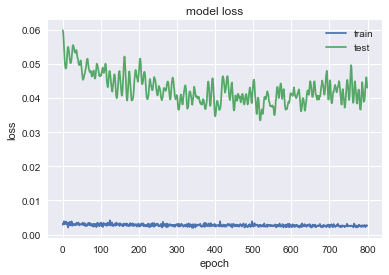

              ALB
MSE       483.989
MAE       19.7094
R2        -1.8907
MAPE (%)   23.998


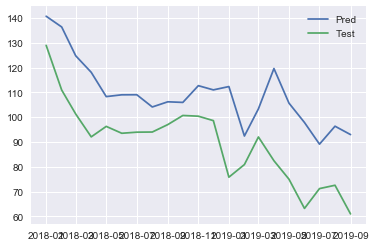

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1883 - val_loss: 0.6505
Epoch 2/1000
0s - loss: 0.1269 - val_loss: 0.5190
Epoch 3/1000
0s - loss: 0.0841 - val_loss: 0.4073
Epoch 4/1000
0s - loss: 0.0538 - val_loss: 0.3110
Epoch 5/1000
0s - loss: 0.0328 - val_loss: 0.2298
Epoch 6/1000
0s - loss: 0.0203 - val_loss: 0.1652
Epoch 7/1000
0s - loss: 0.0173 - val_loss: 0.1176
Epoch 8/1000
0s - loss: 0.0189 - val_loss: 0.0857
Epoch 9/1000
0s - loss: 0.0245 - val_loss: 0.0664
Epoch 10/1000
0s - loss: 0.0262 - val_loss: 0.0563
Epoch 11/1000
0s - loss: 0.0310 - val_loss: 0.0532
Epoch 12/1000
0s - loss: 0.0292 - val_loss: 0.0547
Epoch 13/1000
0s - loss: 0.0258 - val_loss: 0.0597
Epoch 14/1000
0s - loss: 0.0223 - val_loss: 0.0675
Epoch 15/1000
0s - loss: 0.0210 - val_loss: 0.0778
Epoch 16/1000
0s - loss: 0.0176 - val_loss: 0.0892
Epoch 17/1000
0s - loss: 0.0161 - val_loss: 0.1008
Epoch 18/1000
0s - loss: 0.0118 - val_loss: 0.1117
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0170
Epoch 174/1000
0s - loss: 0.0047 - val_loss: 0.0170
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0170
Epoch 176/1000
0s - loss: 0.0032 - val_loss: 0.0169
Epoch 177/1000
0s - loss: 0.0038 - val_loss: 0.0168
Epoch 178/1000
0s - loss: 0.0032 - val_loss: 0.0168
Epoch 179/1000
0s - loss: 0.0035 - val_loss: 0.0166
Epoch 180/1000
0s - loss: 0.0040 - val_loss: 0.0166
Epoch 181/1000
0s - loss: 0.0040 - val_loss: 0.0164
Epoch 182/1000
0s - loss: 0.0044 - val_loss: 0.0163
Epoch 183/1000
0s - loss: 0.0046 - val_loss: 0.0163
Epoch 184/1000
0s - loss: 0.0041 - val_loss: 0.0162
Epoch 185/1000
0s - loss: 0.0036 - val_loss: 0.0162
Epoch 186/1000
0s - loss: 0.0034 - val_loss: 0.0161
Epoch 187/1000
0s - loss: 0.0045 - val_loss: 0.0160
Epoch 188/1000
0s - loss: 0.0036 - val_loss: 0.0159
Epoch 189/1000
0s - loss: 0.0041 - val_loss: 0.0158
Epoch 190/1000
0s - loss: 0.0039 - val_loss: 0.0157
Epoch 191/1000
0s - loss: 0.0041 - val_loss: 0.0157
Epoch 192/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0141
Epoch 348/1000
0s - loss: 0.0033 - val_loss: 0.0141
Epoch 349/1000
0s - loss: 0.0036 - val_loss: 0.0141
Epoch 350/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 351/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 352/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 353/1000
0s - loss: 0.0031 - val_loss: 0.0140
Epoch 354/1000
0s - loss: 0.0034 - val_loss: 0.0140
Epoch 355/1000
0s - loss: 0.0038 - val_loss: 0.0140
Epoch 356/1000
0s - loss: 0.0039 - val_loss: 0.0140
Epoch 357/1000
0s - loss: 0.0035 - val_loss: 0.0140
Epoch 358/1000
0s - loss: 0.0033 - val_loss: 0.0140
Epoch 359/1000
0s - loss: 0.0032 - val_loss: 0.0140
Epoch 360/1000
0s - loss: 0.0040 - val_loss: 0.0140
Epoch 361/1000
0s - loss: 0.0033 - val_loss: 0.0140
Epoch 362/1000
0s - loss: 0.0035 - val_loss: 0.0139
Epoch 363/1000
0s - loss: 0.0034 - val_loss: 0.0139
Epoch 364/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 365/1000
0s - loss: 0.0034 - val_loss: 0.0139
Epoch 366/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0132
Epoch 519/1000
0s - loss: 0.0032 - val_loss: 0.0133
Epoch 520/1000
0s - loss: 0.0027 - val_loss: 0.0133
Epoch 521/1000
0s - loss: 0.0029 - val_loss: 0.0133
Epoch 522/1000
0s - loss: 0.0031 - val_loss: 0.0132
Epoch 523/1000
0s - loss: 0.0036 - val_loss: 0.0132
Epoch 524/1000
0s - loss: 0.0035 - val_loss: 0.0132
Epoch 525/1000
0s - loss: 0.0034 - val_loss: 0.0132
Epoch 526/1000
0s - loss: 0.0027 - val_loss: 0.0132
Epoch 527/1000
0s - loss: 0.0034 - val_loss: 0.0132
Epoch 528/1000
0s - loss: 0.0032 - val_loss: 0.0131
Epoch 529/1000
0s - loss: 0.0029 - val_loss: 0.0130
Epoch 530/1000
0s - loss: 0.0031 - val_loss: 0.0130
Epoch 531/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 532/1000
0s - loss: 0.0034 - val_loss: 0.0129
Epoch 533/1000
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 534/1000
0s - loss: 0.0038 - val_loss: 0.0128
Epoch 535/1000
0s - loss: 0.0035 - val_loss: 0.0128
Epoch 536/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 537/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0127
Epoch 689/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 690/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 691/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 692/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 693/1000
0s - loss: 0.0027 - val_loss: 0.0126
Epoch 694/1000
0s - loss: 0.0033 - val_loss: 0.0125
Epoch 695/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 696/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 697/1000
0s - loss: 0.0030 - val_loss: 0.0127
Epoch 698/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 699/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 700/1000
0s - loss: 0.0034 - val_loss: 0.0126
Epoch 701/1000
0s - loss: 0.0033 - val_loss: 0.0126
Epoch 702/1000
0s - loss: 0.0029 - val_loss: 0.0126
Epoch 703/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 704/1000
0s - loss: 0.0035 - val_loss: 0.0129
Epoch 705/1000
0s - loss: 0.0032 - val_loss: 0.0129
Epoch 706/1000
0s - loss: 0.0030 - val_loss: 0.0131
Epoch 707/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0127
Epoch 862/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 863/1000
0s - loss: 0.0025 - val_loss: 0.0128
Epoch 864/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 865/1000
0s - loss: 0.0035 - val_loss: 0.0128
Epoch 866/1000
0s - loss: 0.0026 - val_loss: 0.0129
Epoch 867/1000
0s - loss: 0.0026 - val_loss: 0.0130
Epoch 868/1000
0s - loss: 0.0032 - val_loss: 0.0130
Epoch 869/1000
0s - loss: 0.0028 - val_loss: 0.0129
Epoch 870/1000
0s - loss: 0.0031 - val_loss: 0.0129
Epoch 871/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 872/1000
0s - loss: 0.0031 - val_loss: 0.0127
Epoch 873/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 874/1000
0s - loss: 0.0030 - val_loss: 0.0123
Epoch 875/1000
0s - loss: 0.0029 - val_loss: 0.0122
Epoch 876/1000
0s - loss: 0.0029 - val_loss: 0.0123
Epoch 877/1000
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 878/1000
0s - loss: 0.0028 - val_loss: 0.0124
Epoch 879/1000
0s - loss: 0.0035 - val_loss: 0.0126
Epoch 880/1000
0s - loss: 0

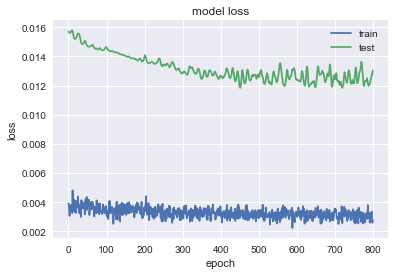

             CBRE
MSE       21.9203
MAE       3.86239
R2       -1.17347
MAPE (%)  8.44148


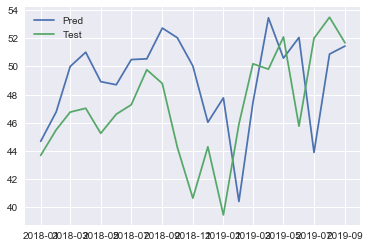

In [356]:
pred_multi_GRU_1 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_GRU_1[comp] = nn_forec_multi_GRU(df,comp,n_train_time = test.shape[0],first_layer = 128,second_layer=64).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3706 - val_loss: 0.1243
Epoch 2/1000
0s - loss: 0.2142 - val_loss: 0.0397
Epoch 3/1000
0s - loss: 0.1152 - val_loss: 0.0135
Epoch 4/1000
0s - loss: 0.0527 - val_loss: 0.0434
Epoch 5/1000
0s - loss: 0.0233 - val_loss: 0.1185
Epoch 6/1000
0s - loss: 0.0223 - val_loss: 0.2062
Epoch 7/1000
0s - loss: 0.0387 - val_loss: 0.2665
Epoch 8/1000
0s - loss: 0.0524 - val_loss: 0.2808
Epoch 9/1000
0s - loss: 0.0572 - val_loss: 0.2570
Epoch 10/1000
0s - loss: 0.0474 - val_loss: 0.2121
Epoch 11/1000
0s - loss: 0.0385 - val_loss: 0.1622
Epoch 12/1000
0s - loss: 0.0268 - val_loss: 0.1186
Epoch 13/1000
0s - loss: 0.0192 - val_loss: 0.0850
Epoch 14/1000
0s - loss: 0.0174 - val_loss: 0.0614
Epoch 15/1000
0s - loss: 0.0181 - val_loss: 0.0458
Epoch 16/1000
0s - loss: 0.0186 - val_loss: 0.0361
Epoch 17/1000
0s - loss: 0.0207 - val_loss: 0.0307
Epoch 18/1000
0s - loss: 0.0238 - val_loss: 0.0281
Epoch 19/1000
0s - loss: 0.02

0s - loss: 0.0072 - val_loss: 0.0080
Epoch 166/1000
0s - loss: 0.0059 - val_loss: 0.0079
Epoch 167/1000
0s - loss: 0.0074 - val_loss: 0.0080
Epoch 168/1000
0s - loss: 0.0064 - val_loss: 0.0080
Epoch 169/1000
0s - loss: 0.0076 - val_loss: 0.0080
Epoch 170/1000
0s - loss: 0.0066 - val_loss: 0.0080
Epoch 171/1000
0s - loss: 0.0060 - val_loss: 0.0081
Epoch 172/1000
0s - loss: 0.0067 - val_loss: 0.0082
Epoch 173/1000
0s - loss: 0.0071 - val_loss: 0.0082
Epoch 174/1000
0s - loss: 0.0069 - val_loss: 0.0082
Epoch 175/1000
0s - loss: 0.0071 - val_loss: 0.0081
Epoch 176/1000
0s - loss: 0.0066 - val_loss: 0.0079
Epoch 177/1000
0s - loss: 0.0062 - val_loss: 0.0077
Epoch 178/1000
0s - loss: 0.0069 - val_loss: 0.0076
Epoch 179/1000
0s - loss: 0.0060 - val_loss: 0.0075
Epoch 180/1000
0s - loss: 0.0065 - val_loss: 0.0074
Epoch 181/1000
0s - loss: 0.0059 - val_loss: 0.0073
Epoch 182/1000
0s - loss: 0.0067 - val_loss: 0.0073
Epoch 183/1000
0s - loss: 0.0063 - val_loss: 0.0073
Epoch 184/1000
0s - loss: 0

0s - loss: 0.0066 - val_loss: 0.0081
Epoch 329/1000
0s - loss: 0.0061 - val_loss: 0.0083
Epoch 330/1000
0s - loss: 0.0065 - val_loss: 0.0084
Epoch 331/1000
0s - loss: 0.0063 - val_loss: 0.0084
Epoch 332/1000
0s - loss: 0.0064 - val_loss: 0.0083
Epoch 333/1000
0s - loss: 0.0063 - val_loss: 0.0082
Epoch 334/1000
0s - loss: 0.0068 - val_loss: 0.0081
Epoch 335/1000
0s - loss: 0.0049 - val_loss: 0.0079
Epoch 336/1000
0s - loss: 0.0069 - val_loss: 0.0078
Epoch 337/1000
0s - loss: 0.0061 - val_loss: 0.0078
Epoch 338/1000
0s - loss: 0.0072 - val_loss: 0.0079
Epoch 339/1000
0s - loss: 0.0064 - val_loss: 0.0080
Epoch 340/1000
0s - loss: 0.0067 - val_loss: 0.0082
Epoch 341/1000
0s - loss: 0.0066 - val_loss: 0.0084
Epoch 342/1000
0s - loss: 0.0067 - val_loss: 0.0086
Epoch 343/1000
0s - loss: 0.0058 - val_loss: 0.0087
Epoch 344/1000
0s - loss: 0.0063 - val_loss: 0.0087
Epoch 345/1000
0s - loss: 0.0061 - val_loss: 0.0087
Epoch 346/1000
0s - loss: 0.0068 - val_loss: 0.0085
Epoch 347/1000
0s - loss: 0

0s - loss: 0.0074 - val_loss: 0.0104
Epoch 487/1000
0s - loss: 0.0063 - val_loss: 0.0108
Epoch 488/1000
0s - loss: 0.0061 - val_loss: 0.0110
Epoch 489/1000
0s - loss: 0.0069 - val_loss: 0.0110
Epoch 490/1000
0s - loss: 0.0069 - val_loss: 0.0111
Epoch 491/1000
0s - loss: 0.0062 - val_loss: 0.0110
Epoch 492/1000
0s - loss: 0.0065 - val_loss: 0.0109
Epoch 493/1000
0s - loss: 0.0077 - val_loss: 0.0109
Epoch 494/1000
0s - loss: 0.0067 - val_loss: 0.0109
Epoch 495/1000
0s - loss: 0.0067 - val_loss: 0.0109
Epoch 496/1000
0s - loss: 0.0062 - val_loss: 0.0106
Epoch 497/1000
0s - loss: 0.0064 - val_loss: 0.0106
Epoch 498/1000
0s - loss: 0.0063 - val_loss: 0.0106
Epoch 499/1000
0s - loss: 0.0063 - val_loss: 0.0107
Epoch 500/1000
0s - loss: 0.0062 - val_loss: 0.0107
Epoch 501/1000
0s - loss: 0.0062 - val_loss: 0.0107
Epoch 502/1000
0s - loss: 0.0055 - val_loss: 0.0105
Epoch 503/1000
0s - loss: 0.0073 - val_loss: 0.0105
Epoch 504/1000
0s - loss: 0.0064 - val_loss: 0.0104
Epoch 505/1000
0s - loss: 0

0s - loss: 0.0062 - val_loss: 0.0136
Epoch 649/1000
0s - loss: 0.0058 - val_loss: 0.0132
Epoch 650/1000
0s - loss: 0.0061 - val_loss: 0.0128
Epoch 651/1000
0s - loss: 0.0065 - val_loss: 0.0127
Epoch 652/1000
0s - loss: 0.0059 - val_loss: 0.0127
Epoch 653/1000
0s - loss: 0.0058 - val_loss: 0.0127
Epoch 654/1000
0s - loss: 0.0062 - val_loss: 0.0127
Epoch 655/1000
0s - loss: 0.0055 - val_loss: 0.0127
Epoch 656/1000
0s - loss: 0.0057 - val_loss: 0.0126
Epoch 657/1000
0s - loss: 0.0061 - val_loss: 0.0128
Epoch 658/1000
0s - loss: 0.0056 - val_loss: 0.0130
Epoch 659/1000
0s - loss: 0.0068 - val_loss: 0.0133
Epoch 660/1000
0s - loss: 0.0053 - val_loss: 0.0135
Epoch 661/1000
0s - loss: 0.0055 - val_loss: 0.0134
Epoch 662/1000
0s - loss: 0.0064 - val_loss: 0.0130
Epoch 663/1000
0s - loss: 0.0059 - val_loss: 0.0126
Epoch 664/1000
0s - loss: 0.0062 - val_loss: 0.0125
Epoch 665/1000
0s - loss: 0.0058 - val_loss: 0.0123
Epoch 666/1000
0s - loss: 0.0070 - val_loss: 0.0124
Epoch 667/1000
0s - loss: 0

0s - loss: 0.0062 - val_loss: 0.0151
Epoch 808/1000
0s - loss: 0.0053 - val_loss: 0.0152
Epoch 809/1000
0s - loss: 0.0068 - val_loss: 0.0152
Epoch 810/1000
0s - loss: 0.0067 - val_loss: 0.0152
Epoch 811/1000
0s - loss: 0.0062 - val_loss: 0.0151
Epoch 812/1000
0s - loss: 0.0051 - val_loss: 0.0149
Epoch 813/1000
0s - loss: 0.0068 - val_loss: 0.0145
Epoch 814/1000
0s - loss: 0.0063 - val_loss: 0.0142
Epoch 815/1000
0s - loss: 0.0058 - val_loss: 0.0146
Epoch 816/1000
0s - loss: 0.0063 - val_loss: 0.0149
Epoch 817/1000
0s - loss: 0.0057 - val_loss: 0.0154
Epoch 818/1000
0s - loss: 0.0060 - val_loss: 0.0157
Epoch 819/1000
0s - loss: 0.0055 - val_loss: 0.0157
Epoch 820/1000
0s - loss: 0.0067 - val_loss: 0.0157
Epoch 821/1000
0s - loss: 0.0061 - val_loss: 0.0156
Epoch 822/1000
0s - loss: 0.0057 - val_loss: 0.0155
Epoch 823/1000
0s - loss: 0.0061 - val_loss: 0.0151
Epoch 824/1000
0s - loss: 0.0058 - val_loss: 0.0147
Epoch 825/1000
0s - loss: 0.0062 - val_loss: 0.0143
Epoch 826/1000
0s - loss: 0

0s - loss: 0.0063 - val_loss: 0.0182
Epoch 966/1000
0s - loss: 0.0058 - val_loss: 0.0185
Epoch 967/1000
0s - loss: 0.0057 - val_loss: 0.0186
Epoch 968/1000
0s - loss: 0.0067 - val_loss: 0.0184
Epoch 969/1000
0s - loss: 0.0068 - val_loss: 0.0182
Epoch 970/1000
0s - loss: 0.0057 - val_loss: 0.0180
Epoch 971/1000
0s - loss: 0.0061 - val_loss: 0.0181
Epoch 972/1000
0s - loss: 0.0062 - val_loss: 0.0185
Epoch 973/1000
0s - loss: 0.0059 - val_loss: 0.0188
Epoch 974/1000
0s - loss: 0.0057 - val_loss: 0.0190
Epoch 975/1000
0s - loss: 0.0053 - val_loss: 0.0189
Epoch 976/1000
0s - loss: 0.0063 - val_loss: 0.0187
Epoch 977/1000
0s - loss: 0.0062 - val_loss: 0.0185
Epoch 978/1000
0s - loss: 0.0061 - val_loss: 0.0184
Epoch 979/1000
0s - loss: 0.0061 - val_loss: 0.0184
Epoch 980/1000
0s - loss: 0.0059 - val_loss: 0.0185
Epoch 981/1000
0s - loss: 0.0063 - val_loss: 0.0189
Epoch 982/1000
0s - loss: 0.0063 - val_loss: 0.0193
Epoch 983/1000
0s - loss: 0.0057 - val_loss: 0.0197
Epoch 984/1000
0s - loss: 0

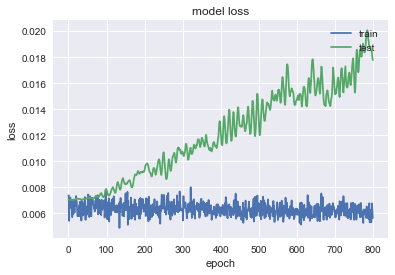

                  T
MSE         6.41056
MAE         2.15648
R2        0.0153808
MAPE (%)    6.51664


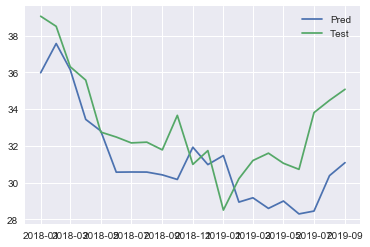

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1378 - val_loss: 0.4869
Epoch 2/1000
0s - loss: 0.0561 - val_loss: 0.2747
Epoch 3/1000
0s - loss: 0.0265 - val_loss: 0.1487
Epoch 4/1000
0s - loss: 0.0266 - val_loss: 0.0874
Epoch 5/1000
0s - loss: 0.0342 - val_loss: 0.0651
Epoch 6/1000
0s - loss: 0.0393 - val_loss: 0.0629
Epoch 7/1000
0s - loss: 0.0327 - val_loss: 0.0718
Epoch 8/1000
0s - loss: 0.0270 - val_loss: 0.0866
Epoch 9/1000
0s - loss: 0.0212 - val_loss: 0.1035
Epoch 10/1000
0s - loss: 0.0180 - val_loss: 0.1192
Epoch 11/1000
0s - loss: 0.0164 - val_loss: 0.1304
Epoch 12/1000
0s - loss: 0.0169 - val_loss: 0.1354
Epoch 13/1000
0s - loss: 0.0185 - val_loss: 0.1342
Epoch 14/1000
0s - loss: 0.0176 - val_loss: 0.1271
Epoch 15/1000
0s - loss: 0.0176 - val_loss: 0.1153
Epoch 16/1000
0s - loss: 0.0175 - val_loss: 0.0999
Epoch 17/1000
0s - loss: 0.0148 - val_loss: 0.0832
Epoch 18/1000
0s - loss: 0.0138 - val_loss: 0.0668
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0030 - val_loss: 0.0102
Epoch 163/1000
0s - loss: 0.0029 - val_loss: 0.0102
Epoch 164/1000
0s - loss: 0.0030 - val_loss: 0.0103
Epoch 165/1000
0s - loss: 0.0032 - val_loss: 0.0104
Epoch 166/1000
0s - loss: 0.0029 - val_loss: 0.0105
Epoch 167/1000
0s - loss: 0.0031 - val_loss: 0.0106
Epoch 168/1000
0s - loss: 0.0033 - val_loss: 0.0106
Epoch 169/1000
0s - loss: 0.0028 - val_loss: 0.0105
Epoch 170/1000
0s - loss: 0.0028 - val_loss: 0.0103
Epoch 171/1000
0s - loss: 0.0027 - val_loss: 0.0102
Epoch 172/1000
0s - loss: 0.0028 - val_loss: 0.0102
Epoch 173/1000
0s - loss: 0.0029 - val_loss: 0.0102
Epoch 174/1000
0s - loss: 0.0027 - val_loss: 0.0102
Epoch 175/1000
0s - loss: 0.0032 - val_loss: 0.0102
Epoch 176/1000
0s - loss: 0.0028 - val_loss: 0.0103
Epoch 177/1000
0s - loss: 0.0027 - val_loss: 0.0106
Epoch 178/1000
0s - loss: 0.0028 - val_loss: 0.0107
Epoch 179/1000
0s - loss: 0.0028 - val_loss: 0.0108
Epoch 180/1000
0s - loss: 0.0030 - val_loss: 0.0109
Epoch 181/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0134
Epoch 325/1000
0s - loss: 0.0031 - val_loss: 0.0132
Epoch 326/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 327/1000
0s - loss: 0.0028 - val_loss: 0.0126
Epoch 328/1000
0s - loss: 0.0025 - val_loss: 0.0125
Epoch 329/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 330/1000
0s - loss: 0.0025 - val_loss: 0.0126
Epoch 331/1000
0s - loss: 0.0030 - val_loss: 0.0126
Epoch 332/1000
0s - loss: 0.0025 - val_loss: 0.0126
Epoch 333/1000
0s - loss: 0.0025 - val_loss: 0.0125
Epoch 334/1000
0s - loss: 0.0026 - val_loss: 0.0126
Epoch 335/1000
0s - loss: 0.0025 - val_loss: 0.0125
Epoch 336/1000
0s - loss: 0.0025 - val_loss: 0.0125
Epoch 337/1000
0s - loss: 0.0030 - val_loss: 0.0124
Epoch 338/1000
0s - loss: 0.0029 - val_loss: 0.0123
Epoch 339/1000
0s - loss: 0.0025 - val_loss: 0.0122
Epoch 340/1000
0s - loss: 0.0025 - val_loss: 0.0123
Epoch 341/1000
0s - loss: 0.0031 - val_loss: 0.0122
Epoch 342/1000
0s - loss: 0.0025 - val_loss: 0.0121
Epoch 343/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0135
Epoch 483/1000
0s - loss: 0.0029 - val_loss: 0.0135
Epoch 484/1000
0s - loss: 0.0023 - val_loss: 0.0135
Epoch 485/1000
0s - loss: 0.0026 - val_loss: 0.0136
Epoch 486/1000
0s - loss: 0.0027 - val_loss: 0.0139
Epoch 487/1000
0s - loss: 0.0023 - val_loss: 0.0144
Epoch 488/1000
0s - loss: 0.0023 - val_loss: 0.0148
Epoch 489/1000
0s - loss: 0.0026 - val_loss: 0.0148
Epoch 490/1000
0s - loss: 0.0031 - val_loss: 0.0146
Epoch 491/1000
0s - loss: 0.0029 - val_loss: 0.0140
Epoch 492/1000
0s - loss: 0.0026 - val_loss: 0.0135
Epoch 493/1000
0s - loss: 0.0030 - val_loss: 0.0132
Epoch 494/1000
0s - loss: 0.0024 - val_loss: 0.0132
Epoch 495/1000
0s - loss: 0.0031 - val_loss: 0.0131
Epoch 496/1000
0s - loss: 0.0031 - val_loss: 0.0133
Epoch 497/1000
0s - loss: 0.0028 - val_loss: 0.0135
Epoch 498/1000
0s - loss: 0.0023 - val_loss: 0.0137
Epoch 499/1000
0s - loss: 0.0026 - val_loss: 0.0139
Epoch 500/1000
0s - loss: 0.0030 - val_loss: 0.0139
Epoch 501/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0143
Epoch 644/1000
0s - loss: 0.0027 - val_loss: 0.0142
Epoch 645/1000
0s - loss: 0.0028 - val_loss: 0.0143
Epoch 646/1000
0s - loss: 0.0028 - val_loss: 0.0142
Epoch 647/1000
0s - loss: 0.0025 - val_loss: 0.0142
Epoch 648/1000
0s - loss: 0.0026 - val_loss: 0.0140
Epoch 649/1000
0s - loss: 0.0026 - val_loss: 0.0138
Epoch 650/1000
0s - loss: 0.0024 - val_loss: 0.0136
Epoch 651/1000
0s - loss: 0.0031 - val_loss: 0.0135
Epoch 652/1000
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 653/1000
0s - loss: 0.0025 - val_loss: 0.0138
Epoch 654/1000
0s - loss: 0.0027 - val_loss: 0.0142
Epoch 655/1000
0s - loss: 0.0028 - val_loss: 0.0145
Epoch 656/1000
0s - loss: 0.0029 - val_loss: 0.0147
Epoch 657/1000
0s - loss: 0.0031 - val_loss: 0.0147
Epoch 658/1000
0s - loss: 0.0027 - val_loss: 0.0145
Epoch 659/1000
0s - loss: 0.0032 - val_loss: 0.0139
Epoch 660/1000
0s - loss: 0.0027 - val_loss: 0.0132
Epoch 661/1000
0s - loss: 0.0027 - val_loss: 0.0128
Epoch 662/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0148
Epoch 803/1000
0s - loss: 0.0025 - val_loss: 0.0150
Epoch 804/1000
0s - loss: 0.0027 - val_loss: 0.0151
Epoch 805/1000
0s - loss: 0.0027 - val_loss: 0.0150
Epoch 806/1000
0s - loss: 0.0028 - val_loss: 0.0149
Epoch 807/1000
0s - loss: 0.0025 - val_loss: 0.0145
Epoch 808/1000
0s - loss: 0.0027 - val_loss: 0.0144
Epoch 809/1000
0s - loss: 0.0029 - val_loss: 0.0143
Epoch 810/1000
0s - loss: 0.0027 - val_loss: 0.0146
Epoch 811/1000
0s - loss: 0.0026 - val_loss: 0.0148
Epoch 812/1000
0s - loss: 0.0023 - val_loss: 0.0150
Epoch 813/1000
0s - loss: 0.0025 - val_loss: 0.0152
Epoch 814/1000
0s - loss: 0.0028 - val_loss: 0.0152
Epoch 815/1000
0s - loss: 0.0025 - val_loss: 0.0152
Epoch 816/1000
0s - loss: 0.0025 - val_loss: 0.0152
Epoch 817/1000
0s - loss: 0.0025 - val_loss: 0.0150
Epoch 818/1000
0s - loss: 0.0025 - val_loss: 0.0147
Epoch 819/1000
0s - loss: 0.0027 - val_loss: 0.0146
Epoch 820/1000
0s - loss: 0.0029 - val_loss: 0.0146
Epoch 821/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0150
Epoch 966/1000
0s - loss: 0.0026 - val_loss: 0.0156
Epoch 967/1000
0s - loss: 0.0025 - val_loss: 0.0164
Epoch 968/1000
0s - loss: 0.0028 - val_loss: 0.0167
Epoch 969/1000
0s - loss: 0.0025 - val_loss: 0.0165
Epoch 970/1000
0s - loss: 0.0027 - val_loss: 0.0159
Epoch 971/1000
0s - loss: 0.0027 - val_loss: 0.0154
Epoch 972/1000
0s - loss: 0.0030 - val_loss: 0.0151
Epoch 973/1000
0s - loss: 0.0024 - val_loss: 0.0147
Epoch 974/1000
0s - loss: 0.0031 - val_loss: 0.0146
Epoch 975/1000
0s - loss: 0.0028 - val_loss: 0.0150
Epoch 976/1000
0s - loss: 0.0025 - val_loss: 0.0154
Epoch 977/1000
0s - loss: 0.0026 - val_loss: 0.0156
Epoch 978/1000
0s - loss: 0.0025 - val_loss: 0.0151
Epoch 979/1000
0s - loss: 0.0026 - val_loss: 0.0143
Epoch 980/1000
0s - loss: 0.0025 - val_loss: 0.0137
Epoch 981/1000
0s - loss: 0.0026 - val_loss: 0.0134
Epoch 982/1000
0s - loss: 0.0025 - val_loss: 0.0134
Epoch 983/1000
0s - loss: 0.0027 - val_loss: 0.0136
Epoch 984/1000
0s - loss: 0

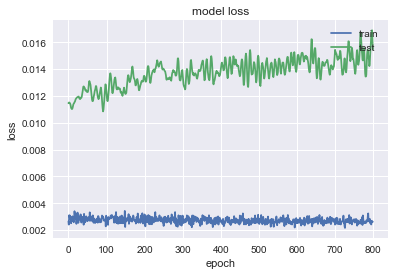

              BBY
MSE       70.3023
MAE         7.239
R2       -1.18808
MAPE (%)  10.2536


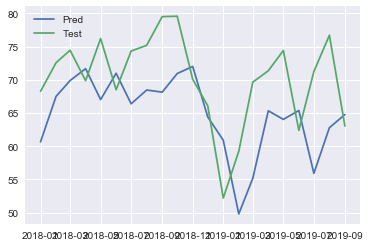

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2192 - val_loss: 0.2446
Epoch 2/1000
0s - loss: 0.0912 - val_loss: 0.0998
Epoch 3/1000
0s - loss: 0.0269 - val_loss: 0.0329
Epoch 4/1000
0s - loss: 0.0066 - val_loss: 0.0248
Epoch 5/1000
0s - loss: 0.0161 - val_loss: 0.0380
Epoch 6/1000
0s - loss: 0.0322 - val_loss: 0.0428
Epoch 7/1000
0s - loss: 0.0369 - val_loss: 0.0362
Epoch 8/1000
0s - loss: 0.0270 - val_loss: 0.0274
Epoch 9/1000
0s - loss: 0.0188 - val_loss: 0.0231
Epoch 10/1000
0s - loss: 0.0103 - val_loss: 0.0255
Epoch 11/1000
0s - loss: 0.0063 - val_loss: 0.0329
Epoch 12/1000
0s - loss: 0.0056 - val_loss: 0.0421
Epoch 13/1000
0s - loss: 0.0069 - val_loss: 0.0507
Epoch 14/1000
0s - loss: 0.0097 - val_loss: 0.0566
Epoch 15/1000
0s - loss: 0.0113 - val_loss: 0.0593
Epoch 16/1000
0s - loss: 0.0121 - val_loss: 0.0588
Epoch 17/1000
0s - loss: 0.0119 - val_loss: 0.0557
Epoch 18/1000
0s - loss: 0.0112 - val_loss: 0.0508
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0029 - val_loss: 0.0259
Epoch 161/1000
0s - loss: 0.0034 - val_loss: 0.0261
Epoch 162/1000
0s - loss: 0.0030 - val_loss: 0.0262
Epoch 163/1000
0s - loss: 0.0031 - val_loss: 0.0263
Epoch 164/1000
0s - loss: 0.0030 - val_loss: 0.0263
Epoch 165/1000
0s - loss: 0.0031 - val_loss: 0.0264
Epoch 166/1000
0s - loss: 0.0031 - val_loss: 0.0263
Epoch 167/1000
0s - loss: 0.0033 - val_loss: 0.0261
Epoch 168/1000
0s - loss: 0.0030 - val_loss: 0.0259
Epoch 169/1000
0s - loss: 0.0027 - val_loss: 0.0257
Epoch 170/1000
0s - loss: 0.0030 - val_loss: 0.0255
Epoch 171/1000
0s - loss: 0.0030 - val_loss: 0.0253
Epoch 172/1000
0s - loss: 0.0036 - val_loss: 0.0252
Epoch 173/1000
0s - loss: 0.0029 - val_loss: 0.0251
Epoch 174/1000
0s - loss: 0.0035 - val_loss: 0.0251
Epoch 175/1000
0s - loss: 0.0031 - val_loss: 0.0252
Epoch 176/1000
0s - loss: 0.0030 - val_loss: 0.0253
Epoch 177/1000
0s - loss: 0.0033 - val_loss: 0.0252
Epoch 178/1000
0s - loss: 0.0029 - val_loss: 0.0253
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0179
Epoch 320/1000
0s - loss: 0.0025 - val_loss: 0.0178
Epoch 321/1000
0s - loss: 0.0030 - val_loss: 0.0177
Epoch 322/1000
0s - loss: 0.0025 - val_loss: 0.0176
Epoch 323/1000
0s - loss: 0.0022 - val_loss: 0.0175
Epoch 324/1000
0s - loss: 0.0030 - val_loss: 0.0176
Epoch 325/1000
0s - loss: 0.0031 - val_loss: 0.0176
Epoch 326/1000
0s - loss: 0.0024 - val_loss: 0.0176
Epoch 327/1000
0s - loss: 0.0025 - val_loss: 0.0176
Epoch 328/1000
0s - loss: 0.0028 - val_loss: 0.0177
Epoch 329/1000
0s - loss: 0.0031 - val_loss: 0.0178
Epoch 330/1000
0s - loss: 0.0025 - val_loss: 0.0180
Epoch 331/1000
0s - loss: 0.0029 - val_loss: 0.0183
Epoch 332/1000
0s - loss: 0.0025 - val_loss: 0.0183
Epoch 333/1000
0s - loss: 0.0027 - val_loss: 0.0181
Epoch 334/1000
0s - loss: 0.0026 - val_loss: 0.0179
Epoch 335/1000
0s - loss: 0.0028 - val_loss: 0.0176
Epoch 336/1000
0s - loss: 0.0032 - val_loss: 0.0174
Epoch 337/1000
0s - loss: 0.0022 - val_loss: 0.0172
Epoch 338/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0113
Epoch 482/1000
0s - loss: 0.0025 - val_loss: 0.0113
Epoch 483/1000
0s - loss: 0.0022 - val_loss: 0.0112
Epoch 484/1000
0s - loss: 0.0026 - val_loss: 0.0110
Epoch 485/1000
0s - loss: 0.0024 - val_loss: 0.0108
Epoch 486/1000
0s - loss: 0.0022 - val_loss: 0.0106
Epoch 487/1000
0s - loss: 0.0025 - val_loss: 0.0105
Epoch 488/1000
0s - loss: 0.0023 - val_loss: 0.0105
Epoch 489/1000
0s - loss: 0.0023 - val_loss: 0.0106
Epoch 490/1000
0s - loss: 0.0021 - val_loss: 0.0107
Epoch 491/1000
0s - loss: 0.0024 - val_loss: 0.0109
Epoch 492/1000
0s - loss: 0.0025 - val_loss: 0.0111
Epoch 493/1000
0s - loss: 0.0024 - val_loss: 0.0111
Epoch 494/1000
0s - loss: 0.0027 - val_loss: 0.0111
Epoch 495/1000
0s - loss: 0.0022 - val_loss: 0.0109
Epoch 496/1000
0s - loss: 0.0021 - val_loss: 0.0108
Epoch 497/1000
0s - loss: 0.0020 - val_loss: 0.0106
Epoch 498/1000
0s - loss: 0.0027 - val_loss: 0.0104
Epoch 499/1000
0s - loss: 0.0024 - val_loss: 0.0103
Epoch 500/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0082
Epoch 648/1000
0s - loss: 0.0022 - val_loss: 0.0081
Epoch 649/1000
0s - loss: 0.0027 - val_loss: 0.0081
Epoch 650/1000
0s - loss: 0.0021 - val_loss: 0.0082
Epoch 651/1000
0s - loss: 0.0022 - val_loss: 0.0086
Epoch 652/1000
0s - loss: 0.0025 - val_loss: 0.0090
Epoch 653/1000
0s - loss: 0.0021 - val_loss: 0.0092
Epoch 654/1000
0s - loss: 0.0022 - val_loss: 0.0091
Epoch 655/1000
0s - loss: 0.0024 - val_loss: 0.0089
Epoch 656/1000
0s - loss: 0.0025 - val_loss: 0.0086
Epoch 657/1000
0s - loss: 0.0020 - val_loss: 0.0084
Epoch 658/1000
0s - loss: 0.0022 - val_loss: 0.0082
Epoch 659/1000
0s - loss: 0.0024 - val_loss: 0.0081
Epoch 660/1000
0s - loss: 0.0023 - val_loss: 0.0081
Epoch 661/1000
0s - loss: 0.0025 - val_loss: 0.0082
Epoch 662/1000
0s - loss: 0.0023 - val_loss: 0.0084
Epoch 663/1000
0s - loss: 0.0019 - val_loss: 0.0086
Epoch 664/1000
0s - loss: 0.0021 - val_loss: 0.0089
Epoch 665/1000
0s - loss: 0.0022 - val_loss: 0.0090
Epoch 666/1000
0s - loss: 0

0s - loss: 0.0022 - val_loss: 0.0081
Epoch 807/1000
0s - loss: 0.0019 - val_loss: 0.0083
Epoch 808/1000
0s - loss: 0.0021 - val_loss: 0.0083
Epoch 809/1000
0s - loss: 0.0021 - val_loss: 0.0083
Epoch 810/1000
0s - loss: 0.0022 - val_loss: 0.0083
Epoch 811/1000
0s - loss: 0.0020 - val_loss: 0.0083
Epoch 812/1000
0s - loss: 0.0019 - val_loss: 0.0084
Epoch 813/1000
0s - loss: 0.0018 - val_loss: 0.0084
Epoch 814/1000
0s - loss: 0.0022 - val_loss: 0.0083
Epoch 815/1000
0s - loss: 0.0019 - val_loss: 0.0083
Epoch 816/1000
0s - loss: 0.0023 - val_loss: 0.0083
Epoch 817/1000
0s - loss: 0.0023 - val_loss: 0.0082
Epoch 818/1000
0s - loss: 0.0020 - val_loss: 0.0082
Epoch 819/1000
0s - loss: 0.0022 - val_loss: 0.0081
Epoch 820/1000
0s - loss: 0.0024 - val_loss: 0.0081
Epoch 821/1000
0s - loss: 0.0020 - val_loss: 0.0079
Epoch 822/1000
0s - loss: 0.0019 - val_loss: 0.0079
Epoch 823/1000
0s - loss: 0.0021 - val_loss: 0.0079
Epoch 824/1000
0s - loss: 0.0021 - val_loss: 0.0080
Epoch 825/1000
0s - loss: 0

0s - loss: 0.0017 - val_loss: 0.0078
Epoch 967/1000
0s - loss: 0.0023 - val_loss: 0.0078
Epoch 968/1000
0s - loss: 0.0021 - val_loss: 0.0079
Epoch 969/1000
0s - loss: 0.0022 - val_loss: 0.0081
Epoch 970/1000
0s - loss: 0.0020 - val_loss: 0.0082
Epoch 971/1000
0s - loss: 0.0019 - val_loss: 0.0083
Epoch 972/1000
0s - loss: 0.0023 - val_loss: 0.0082
Epoch 973/1000
0s - loss: 0.0020 - val_loss: 0.0080
Epoch 974/1000
0s - loss: 0.0021 - val_loss: 0.0079
Epoch 975/1000
0s - loss: 0.0021 - val_loss: 0.0078
Epoch 976/1000
0s - loss: 0.0021 - val_loss: 0.0077
Epoch 977/1000
0s - loss: 0.0021 - val_loss: 0.0077
Epoch 978/1000
0s - loss: 0.0021 - val_loss: 0.0078
Epoch 979/1000
0s - loss: 0.0022 - val_loss: 0.0081
Epoch 980/1000
0s - loss: 0.0022 - val_loss: 0.0083
Epoch 981/1000
0s - loss: 0.0018 - val_loss: 0.0084
Epoch 982/1000
0s - loss: 0.0022 - val_loss: 0.0084
Epoch 983/1000
0s - loss: 0.0022 - val_loss: 0.0083
Epoch 984/1000
0s - loss: 0.0019 - val_loss: 0.0081
Epoch 985/1000
0s - loss: 0

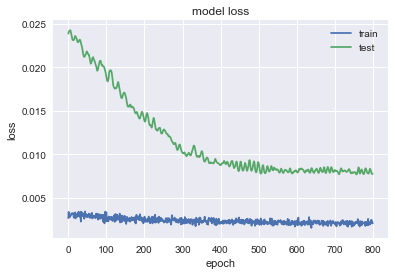

               KO
MSE       6.92294
MAE       1.94286
R2       -0.87602
MAPE (%)  3.99878


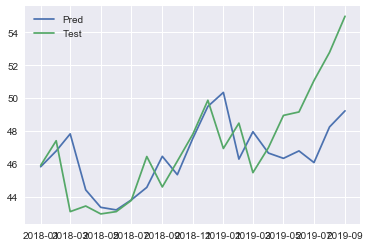

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3039 - val_loss: 0.0071
Epoch 2/1000
0s - loss: 0.1735 - val_loss: 0.0274
Epoch 3/1000
0s - loss: 0.0959 - val_loss: 0.0957
Epoch 4/1000
0s - loss: 0.0567 - val_loss: 0.1889
Epoch 5/1000
0s - loss: 0.0525 - val_loss: 0.2624
Epoch 6/1000
0s - loss: 0.0608 - val_loss: 0.2854
Epoch 7/1000
0s - loss: 0.0709 - val_loss: 0.2616
Epoch 8/1000
0s - loss: 0.0670 - val_loss: 0.2085
Epoch 9/1000
0s - loss: 0.0549 - val_loss: 0.1476
Epoch 10/1000
0s - loss: 0.0443 - val_loss: 0.0931
Epoch 11/1000
0s - loss: 0.0315 - val_loss: 0.0525
Epoch 12/1000
0s - loss: 0.0254 - val_loss: 0.0265
Epoch 13/1000
0s - loss: 0.0243 - val_loss: 0.0121
Epoch 14/1000
0s - loss: 0.0243 - val_loss: 0.0060
Epoch 15/1000
0s - loss: 0.0251 - val_loss: 0.0046
Epoch 16/1000
0s - loss: 0.0258 - val_loss: 0.0051
Epoch 17/1000
0s - loss: 0.0264 - val_loss: 0.0059
Epoch 18/1000
0s - loss: 0.0231 - val_loss: 0.0062
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0063 - val_loss: 0.0057
Epoch 167/1000
0s - loss: 0.0069 - val_loss: 0.0056
Epoch 168/1000
0s - loss: 0.0063 - val_loss: 0.0055
Epoch 169/1000
0s - loss: 0.0060 - val_loss: 0.0053
Epoch 170/1000
0s - loss: 0.0061 - val_loss: 0.0052
Epoch 171/1000
0s - loss: 0.0074 - val_loss: 0.0051
Epoch 172/1000
0s - loss: 0.0070 - val_loss: 0.0050
Epoch 173/1000
0s - loss: 0.0073 - val_loss: 0.0050
Epoch 174/1000
0s - loss: 0.0074 - val_loss: 0.0050
Epoch 175/1000
0s - loss: 0.0063 - val_loss: 0.0051
Epoch 176/1000
0s - loss: 0.0064 - val_loss: 0.0051
Epoch 177/1000
0s - loss: 0.0068 - val_loss: 0.0051
Epoch 178/1000
0s - loss: 0.0066 - val_loss: 0.0051
Epoch 179/1000
0s - loss: 0.0062 - val_loss: 0.0050
Epoch 180/1000
0s - loss: 0.0079 - val_loss: 0.0049
Epoch 181/1000
0s - loss: 0.0068 - val_loss: 0.0048
Epoch 182/1000
0s - loss: 0.0065 - val_loss: 0.0048
Epoch 183/1000
0s - loss: 0.0068 - val_loss: 0.0048
Epoch 184/1000
0s - loss: 0.0066 - val_loss: 0.0048
Epoch 185/1000
0s - loss: 0

0s - loss: 0.0065 - val_loss: 0.0044
Epoch 330/1000
0s - loss: 0.0062 - val_loss: 0.0044
Epoch 331/1000
0s - loss: 0.0062 - val_loss: 0.0043
Epoch 332/1000
0s - loss: 0.0069 - val_loss: 0.0043
Epoch 333/1000
0s - loss: 0.0068 - val_loss: 0.0043
Epoch 334/1000
0s - loss: 0.0070 - val_loss: 0.0043
Epoch 335/1000
0s - loss: 0.0068 - val_loss: 0.0044
Epoch 336/1000
0s - loss: 0.0067 - val_loss: 0.0044
Epoch 337/1000
0s - loss: 0.0070 - val_loss: 0.0044
Epoch 338/1000
0s - loss: 0.0067 - val_loss: 0.0045
Epoch 339/1000
0s - loss: 0.0065 - val_loss: 0.0045
Epoch 340/1000
0s - loss: 0.0064 - val_loss: 0.0045
Epoch 341/1000
0s - loss: 0.0067 - val_loss: 0.0045
Epoch 342/1000
0s - loss: 0.0059 - val_loss: 0.0045
Epoch 343/1000
0s - loss: 0.0062 - val_loss: 0.0045
Epoch 344/1000
0s - loss: 0.0056 - val_loss: 0.0045
Epoch 345/1000
0s - loss: 0.0058 - val_loss: 0.0045
Epoch 346/1000
0s - loss: 0.0067 - val_loss: 0.0044
Epoch 347/1000
0s - loss: 0.0070 - val_loss: 0.0044
Epoch 348/1000
0s - loss: 0

0s - loss: 0.0068 - val_loss: 0.0045
Epoch 495/1000
0s - loss: 0.0059 - val_loss: 0.0046
Epoch 496/1000
0s - loss: 0.0068 - val_loss: 0.0047
Epoch 497/1000
0s - loss: 0.0063 - val_loss: 0.0047
Epoch 498/1000
0s - loss: 0.0069 - val_loss: 0.0048
Epoch 499/1000
0s - loss: 0.0064 - val_loss: 0.0047
Epoch 500/1000
0s - loss: 0.0060 - val_loss: 0.0046
Epoch 501/1000
0s - loss: 0.0066 - val_loss: 0.0045
Epoch 502/1000
0s - loss: 0.0071 - val_loss: 0.0045
Epoch 503/1000
0s - loss: 0.0062 - val_loss: 0.0044
Epoch 504/1000
0s - loss: 0.0070 - val_loss: 0.0044
Epoch 505/1000
0s - loss: 0.0064 - val_loss: 0.0044
Epoch 506/1000
0s - loss: 0.0063 - val_loss: 0.0045
Epoch 507/1000
0s - loss: 0.0063 - val_loss: 0.0045
Epoch 508/1000
0s - loss: 0.0059 - val_loss: 0.0046
Epoch 509/1000
0s - loss: 0.0066 - val_loss: 0.0046
Epoch 510/1000
0s - loss: 0.0056 - val_loss: 0.0046
Epoch 511/1000
0s - loss: 0.0058 - val_loss: 0.0045
Epoch 512/1000
0s - loss: 0.0060 - val_loss: 0.0045
Epoch 513/1000
0s - loss: 0

0s - loss: 0.0061 - val_loss: 0.0054
Epoch 660/1000
0s - loss: 0.0064 - val_loss: 0.0054
Epoch 661/1000
0s - loss: 0.0055 - val_loss: 0.0055
Epoch 662/1000
0s - loss: 0.0055 - val_loss: 0.0053
Epoch 663/1000
0s - loss: 0.0055 - val_loss: 0.0052
Epoch 664/1000
0s - loss: 0.0061 - val_loss: 0.0051
Epoch 665/1000
0s - loss: 0.0065 - val_loss: 0.0051
Epoch 666/1000
0s - loss: 0.0061 - val_loss: 0.0050
Epoch 667/1000
0s - loss: 0.0063 - val_loss: 0.0050
Epoch 668/1000
0s - loss: 0.0061 - val_loss: 0.0049
Epoch 669/1000
0s - loss: 0.0065 - val_loss: 0.0048
Epoch 670/1000
0s - loss: 0.0068 - val_loss: 0.0048
Epoch 671/1000
0s - loss: 0.0057 - val_loss: 0.0047
Epoch 672/1000
0s - loss: 0.0063 - val_loss: 0.0048
Epoch 673/1000
0s - loss: 0.0058 - val_loss: 0.0048
Epoch 674/1000
0s - loss: 0.0066 - val_loss: 0.0049
Epoch 675/1000
0s - loss: 0.0057 - val_loss: 0.0051
Epoch 676/1000
0s - loss: 0.0071 - val_loss: 0.0053
Epoch 677/1000
0s - loss: 0.0059 - val_loss: 0.0053
Epoch 678/1000
0s - loss: 0

0s - loss: 0.0062 - val_loss: 0.0057
Epoch 819/1000
0s - loss: 0.0069 - val_loss: 0.0057
Epoch 820/1000
0s - loss: 0.0063 - val_loss: 0.0058
Epoch 821/1000
0s - loss: 0.0066 - val_loss: 0.0058
Epoch 822/1000
0s - loss: 0.0065 - val_loss: 0.0058
Epoch 823/1000
0s - loss: 0.0060 - val_loss: 0.0059
Epoch 824/1000
0s - loss: 0.0065 - val_loss: 0.0059
Epoch 825/1000
0s - loss: 0.0065 - val_loss: 0.0059
Epoch 826/1000
0s - loss: 0.0055 - val_loss: 0.0057
Epoch 827/1000
0s - loss: 0.0062 - val_loss: 0.0054
Epoch 828/1000
0s - loss: 0.0065 - val_loss: 0.0052
Epoch 829/1000
0s - loss: 0.0072 - val_loss: 0.0051
Epoch 830/1000
0s - loss: 0.0061 - val_loss: 0.0050
Epoch 831/1000
0s - loss: 0.0069 - val_loss: 0.0050
Epoch 832/1000
0s - loss: 0.0063 - val_loss: 0.0051
Epoch 833/1000
0s - loss: 0.0062 - val_loss: 0.0053
Epoch 834/1000
0s - loss: 0.0059 - val_loss: 0.0054
Epoch 835/1000
0s - loss: 0.0067 - val_loss: 0.0055
Epoch 836/1000
0s - loss: 0.0057 - val_loss: 0.0056
Epoch 837/1000
0s - loss: 0

0s - loss: 0.0061 - val_loss: 0.0057
Epoch 979/1000
0s - loss: 0.0062 - val_loss: 0.0059
Epoch 980/1000
0s - loss: 0.0063 - val_loss: 0.0062
Epoch 981/1000
0s - loss: 0.0068 - val_loss: 0.0062
Epoch 982/1000
0s - loss: 0.0056 - val_loss: 0.0062
Epoch 983/1000
0s - loss: 0.0066 - val_loss: 0.0059
Epoch 984/1000
0s - loss: 0.0057 - val_loss: 0.0056
Epoch 985/1000
0s - loss: 0.0069 - val_loss: 0.0054
Epoch 986/1000
0s - loss: 0.0068 - val_loss: 0.0055
Epoch 987/1000
0s - loss: 0.0060 - val_loss: 0.0058
Epoch 988/1000
0s - loss: 0.0060 - val_loss: 0.0063
Epoch 989/1000
0s - loss: 0.0060 - val_loss: 0.0067
Epoch 990/1000
0s - loss: 0.0056 - val_loss: 0.0068
Epoch 991/1000
0s - loss: 0.0058 - val_loss: 0.0068
Epoch 992/1000
0s - loss: 0.0054 - val_loss: 0.0064
Epoch 993/1000
0s - loss: 0.0059 - val_loss: 0.0060
Epoch 994/1000
0s - loss: 0.0066 - val_loss: 0.0057
Epoch 995/1000
0s - loss: 0.0057 - val_loss: 0.0057
Epoch 996/1000
0s - loss: 0.0058 - val_loss: 0.0059
Epoch 997/1000
0s - loss: 0

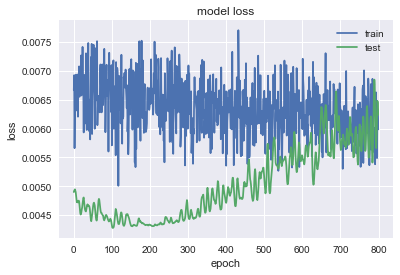

               FTI
MSE        11.4129
MAE        2.88872
R2        0.100905
MAPE (%)   10.5727


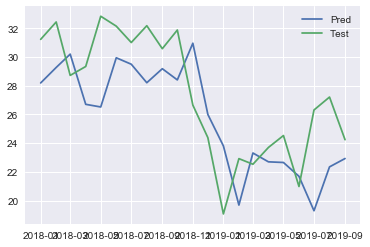

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1799 - val_loss: 0.3858
Epoch 2/1000
0s - loss: 0.0709 - val_loss: 0.1875
Epoch 3/1000
0s - loss: 0.0279 - val_loss: 0.0752
Epoch 4/1000
0s - loss: 0.0191 - val_loss: 0.0279
Epoch 5/1000
0s - loss: 0.0278 - val_loss: 0.0148
Epoch 6/1000
0s - loss: 0.0334 - val_loss: 0.0128
Epoch 7/1000
0s - loss: 0.0336 - val_loss: 0.0146
Epoch 8/1000
0s - loss: 0.0234 - val_loss: 0.0198
Epoch 9/1000
0s - loss: 0.0158 - val_loss: 0.0287
Epoch 10/1000
0s - loss: 0.0093 - val_loss: 0.0394
Epoch 11/1000
0s - loss: 0.0071 - val_loss: 0.0495
Epoch 12/1000
0s - loss: 0.0080 - val_loss: 0.0566
Epoch 13/1000
0s - loss: 0.0091 - val_loss: 0.0592
Epoch 14/1000
0s - loss: 0.0103 - val_loss: 0.0571
Epoch 15/1000
0s - loss: 0.0123 - val_loss: 0.0507
Epoch 16/1000
0s - loss: 0.0106 - val_loss: 0.0418
Epoch 17/1000
0s - loss: 0.0089 - val_loss: 0.0320
Epoch 18/1000
0s - loss: 0.0065 - val_loss: 0.0233
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0023 - val_loss: 0.0134
Epoch 169/1000
0s - loss: 0.0024 - val_loss: 0.0134
Epoch 170/1000
0s - loss: 0.0023 - val_loss: 0.0135
Epoch 171/1000
0s - loss: 0.0024 - val_loss: 0.0138
Epoch 172/1000
0s - loss: 0.0024 - val_loss: 0.0139
Epoch 173/1000
0s - loss: 0.0024 - val_loss: 0.0141
Epoch 174/1000
0s - loss: 0.0022 - val_loss: 0.0142
Epoch 175/1000
0s - loss: 0.0023 - val_loss: 0.0144
Epoch 176/1000
0s - loss: 0.0024 - val_loss: 0.0143
Epoch 177/1000
0s - loss: 0.0024 - val_loss: 0.0143
Epoch 178/1000
0s - loss: 0.0027 - val_loss: 0.0141
Epoch 179/1000
0s - loss: 0.0026 - val_loss: 0.0140
Epoch 180/1000
0s - loss: 0.0024 - val_loss: 0.0138
Epoch 181/1000
0s - loss: 0.0022 - val_loss: 0.0136
Epoch 182/1000
0s - loss: 0.0021 - val_loss: 0.0135
Epoch 183/1000
0s - loss: 0.0024 - val_loss: 0.0135
Epoch 184/1000
0s - loss: 0.0023 - val_loss: 0.0134
Epoch 185/1000
0s - loss: 0.0025 - val_loss: 0.0134
Epoch 186/1000
0s - loss: 0.0019 - val_loss: 0.0134
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0018 - val_loss: 0.0139
Epoch 333/1000
0s - loss: 0.0020 - val_loss: 0.0139
Epoch 334/1000
0s - loss: 0.0019 - val_loss: 0.0141
Epoch 335/1000
0s - loss: 0.0020 - val_loss: 0.0143
Epoch 336/1000
0s - loss: 0.0020 - val_loss: 0.0146
Epoch 337/1000
0s - loss: 0.0019 - val_loss: 0.0147
Epoch 338/1000
0s - loss: 0.0021 - val_loss: 0.0150
Epoch 339/1000
0s - loss: 0.0017 - val_loss: 0.0151
Epoch 340/1000
0s - loss: 0.0018 - val_loss: 0.0153
Epoch 341/1000
0s - loss: 0.0019 - val_loss: 0.0152
Epoch 342/1000
0s - loss: 0.0020 - val_loss: 0.0150
Epoch 343/1000
0s - loss: 0.0018 - val_loss: 0.0148
Epoch 344/1000
0s - loss: 0.0019 - val_loss: 0.0147
Epoch 345/1000
0s - loss: 0.0024 - val_loss: 0.0145
Epoch 346/1000
0s - loss: 0.0022 - val_loss: 0.0143
Epoch 347/1000
0s - loss: 0.0016 - val_loss: 0.0140
Epoch 348/1000
0s - loss: 0.0021 - val_loss: 0.0139
Epoch 349/1000
0s - loss: 0.0018 - val_loss: 0.0139
Epoch 350/1000
0s - loss: 0.0017 - val_loss: 0.0139
Epoch 351/1000
0s - loss: 0

0s - loss: 0.0019 - val_loss: 0.0146
Epoch 494/1000
0s - loss: 0.0019 - val_loss: 0.0145
Epoch 495/1000
0s - loss: 0.0017 - val_loss: 0.0145
Epoch 496/1000
0s - loss: 0.0018 - val_loss: 0.0144
Epoch 497/1000
0s - loss: 0.0015 - val_loss: 0.0146
Epoch 498/1000
0s - loss: 0.0018 - val_loss: 0.0147
Epoch 499/1000
0s - loss: 0.0019 - val_loss: 0.0148
Epoch 500/1000
0s - loss: 0.0015 - val_loss: 0.0149
Epoch 501/1000
0s - loss: 0.0018 - val_loss: 0.0147
Epoch 502/1000
0s - loss: 0.0019 - val_loss: 0.0143
Epoch 503/1000
0s - loss: 0.0020 - val_loss: 0.0139
Epoch 504/1000
0s - loss: 0.0019 - val_loss: 0.0134
Epoch 505/1000
0s - loss: 0.0019 - val_loss: 0.0130
Epoch 506/1000
0s - loss: 0.0019 - val_loss: 0.0127
Epoch 507/1000
0s - loss: 0.0022 - val_loss: 0.0127
Epoch 508/1000
0s - loss: 0.0017 - val_loss: 0.0130
Epoch 509/1000
0s - loss: 0.0017 - val_loss: 0.0135
Epoch 510/1000
0s - loss: 0.0019 - val_loss: 0.0142
Epoch 511/1000
0s - loss: 0.0017 - val_loss: 0.0147
Epoch 512/1000
0s - loss: 0

0s - loss: 0.0018 - val_loss: 0.0142
Epoch 657/1000
0s - loss: 0.0015 - val_loss: 0.0139
Epoch 658/1000
0s - loss: 0.0017 - val_loss: 0.0135
Epoch 659/1000
0s - loss: 0.0015 - val_loss: 0.0131
Epoch 660/1000
0s - loss: 0.0020 - val_loss: 0.0127
Epoch 661/1000
0s - loss: 0.0015 - val_loss: 0.0127
Epoch 662/1000
0s - loss: 0.0018 - val_loss: 0.0130
Epoch 663/1000
0s - loss: 0.0018 - val_loss: 0.0133
Epoch 664/1000
0s - loss: 0.0018 - val_loss: 0.0139
Epoch 665/1000
0s - loss: 0.0016 - val_loss: 0.0145
Epoch 666/1000
0s - loss: 0.0016 - val_loss: 0.0149
Epoch 667/1000
0s - loss: 0.0019 - val_loss: 0.0149
Epoch 668/1000
0s - loss: 0.0018 - val_loss: 0.0148
Epoch 669/1000
0s - loss: 0.0017 - val_loss: 0.0143
Epoch 670/1000
0s - loss: 0.0016 - val_loss: 0.0139
Epoch 671/1000
0s - loss: 0.0016 - val_loss: 0.0137
Epoch 672/1000
0s - loss: 0.0016 - val_loss: 0.0137
Epoch 673/1000
0s - loss: 0.0017 - val_loss: 0.0137
Epoch 674/1000
0s - loss: 0.0019 - val_loss: 0.0139
Epoch 675/1000
0s - loss: 0

0s - loss: 0.0018 - val_loss: 0.0131
Epoch 817/1000
0s - loss: 0.0016 - val_loss: 0.0130
Epoch 818/1000
0s - loss: 0.0017 - val_loss: 0.0129
Epoch 819/1000
0s - loss: 0.0015 - val_loss: 0.0130
Epoch 820/1000
0s - loss: 0.0017 - val_loss: 0.0132
Epoch 821/1000
0s - loss: 0.0017 - val_loss: 0.0135
Epoch 822/1000
0s - loss: 0.0018 - val_loss: 0.0135
Epoch 823/1000
0s - loss: 0.0016 - val_loss: 0.0133
Epoch 824/1000
0s - loss: 0.0016 - val_loss: 0.0133
Epoch 825/1000
0s - loss: 0.0017 - val_loss: 0.0135
Epoch 826/1000
0s - loss: 0.0017 - val_loss: 0.0138
Epoch 827/1000
0s - loss: 0.0018 - val_loss: 0.0138
Epoch 828/1000
0s - loss: 0.0018 - val_loss: 0.0139
Epoch 829/1000
0s - loss: 0.0018 - val_loss: 0.0139
Epoch 830/1000
0s - loss: 0.0016 - val_loss: 0.0139
Epoch 831/1000
0s - loss: 0.0015 - val_loss: 0.0135
Epoch 832/1000
0s - loss: 0.0014 - val_loss: 0.0132
Epoch 833/1000
0s - loss: 0.0017 - val_loss: 0.0130
Epoch 834/1000
0s - loss: 0.0018 - val_loss: 0.0131
Epoch 835/1000
0s - loss: 0

0s - loss: 0.0016 - val_loss: 0.0118
Epoch 977/1000
0s - loss: 0.0017 - val_loss: 0.0117
Epoch 978/1000
0s - loss: 0.0016 - val_loss: 0.0119
Epoch 979/1000
0s - loss: 0.0017 - val_loss: 0.0124
Epoch 980/1000
0s - loss: 0.0018 - val_loss: 0.0127
Epoch 981/1000
0s - loss: 0.0015 - val_loss: 0.0129
Epoch 982/1000
0s - loss: 0.0018 - val_loss: 0.0126
Epoch 983/1000
0s - loss: 0.0015 - val_loss: 0.0124
Epoch 984/1000
0s - loss: 0.0016 - val_loss: 0.0122
Epoch 985/1000
0s - loss: 0.0014 - val_loss: 0.0120
Epoch 986/1000
0s - loss: 0.0016 - val_loss: 0.0120
Epoch 987/1000
0s - loss: 0.0016 - val_loss: 0.0123
Epoch 988/1000
0s - loss: 0.0017 - val_loss: 0.0129
Epoch 989/1000
0s - loss: 0.0018 - val_loss: 0.0134
Epoch 990/1000
0s - loss: 0.0018 - val_loss: 0.0136
Epoch 991/1000
0s - loss: 0.0015 - val_loss: 0.0138
Epoch 992/1000
0s - loss: 0.0016 - val_loss: 0.0133
Epoch 993/1000
0s - loss: 0.0015 - val_loss: 0.0126
Epoch 994/1000
0s - loss: 0.0017 - val_loss: 0.0120
Epoch 995/1000
0s - loss: 0

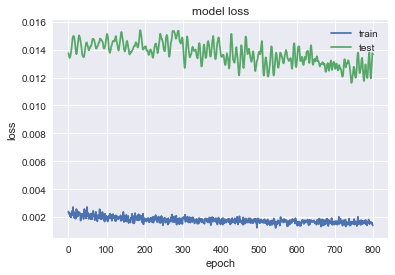

               BLK
MSE        2371.15
MAE        38.1207
R2       -0.414139
MAPE (%)   8.54195


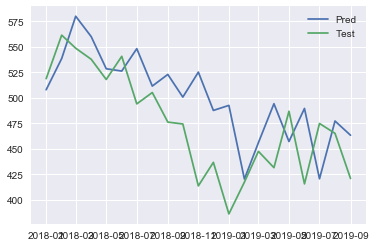

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3658 - val_loss: 0.2237
Epoch 2/1000
0s - loss: 0.2078 - val_loss: 0.0904
Epoch 3/1000
0s - loss: 0.1076 - val_loss: 0.0244
Epoch 4/1000
0s - loss: 0.0537 - val_loss: 0.0215
Epoch 5/1000
0s - loss: 0.0349 - val_loss: 0.0641
Epoch 6/1000
0s - loss: 0.0437 - val_loss: 0.1157
Epoch 7/1000
0s - loss: 0.0616 - val_loss: 0.1439
Epoch 8/1000
0s - loss: 0.0667 - val_loss: 0.1418
Epoch 9/1000
0s - loss: 0.0640 - val_loss: 0.1180
Epoch 10/1000
0s - loss: 0.0547 - val_loss: 0.0859
Epoch 11/1000
0s - loss: 0.0395 - val_loss: 0.0575
Epoch 12/1000
0s - loss: 0.0285 - val_loss: 0.0372
Epoch 13/1000
0s - loss: 0.0266 - val_loss: 0.0254
Epoch 14/1000
0s - loss: 0.0256 - val_loss: 0.0196
Epoch 15/1000
0s - loss: 0.0271 - val_loss: 0.0173
Epoch 16/1000
0s - loss: 0.0281 - val_loss: 0.0166
Epoch 17/1000
0s - loss: 0.0308 - val_loss: 0.0166
Epoch 18/1000
0s - loss: 0.0281 - val_loss: 0.0168
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0039 - val_loss: 0.0295
Epoch 170/1000
0s - loss: 0.0040 - val_loss: 0.0297
Epoch 171/1000
0s - loss: 0.0039 - val_loss: 0.0299
Epoch 172/1000
0s - loss: 0.0044 - val_loss: 0.0299
Epoch 173/1000
0s - loss: 0.0039 - val_loss: 0.0299
Epoch 174/1000
0s - loss: 0.0046 - val_loss: 0.0297
Epoch 175/1000
0s - loss: 0.0034 - val_loss: 0.0299
Epoch 176/1000
0s - loss: 0.0042 - val_loss: 0.0296
Epoch 177/1000
0s - loss: 0.0038 - val_loss: 0.0295
Epoch 178/1000
0s - loss: 0.0042 - val_loss: 0.0296
Epoch 179/1000
0s - loss: 0.0045 - val_loss: 0.0297
Epoch 180/1000
0s - loss: 0.0044 - val_loss: 0.0299
Epoch 181/1000
0s - loss: 0.0049 - val_loss: 0.0298
Epoch 182/1000
0s - loss: 0.0040 - val_loss: 0.0297
Epoch 183/1000
0s - loss: 0.0047 - val_loss: 0.0298
Epoch 184/1000
0s - loss: 0.0044 - val_loss: 0.0301
Epoch 185/1000
0s - loss: 0.0038 - val_loss: 0.0304
Epoch 186/1000
0s - loss: 0.0039 - val_loss: 0.0307
Epoch 187/1000
0s - loss: 0.0043 - val_loss: 0.0310
Epoch 188/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0319
Epoch 330/1000
0s - loss: 0.0039 - val_loss: 0.0320
Epoch 331/1000
0s - loss: 0.0039 - val_loss: 0.0323
Epoch 332/1000
0s - loss: 0.0040 - val_loss: 0.0324
Epoch 333/1000
0s - loss: 0.0041 - val_loss: 0.0324
Epoch 334/1000
0s - loss: 0.0037 - val_loss: 0.0324
Epoch 335/1000
0s - loss: 0.0036 - val_loss: 0.0323
Epoch 336/1000
0s - loss: 0.0034 - val_loss: 0.0325
Epoch 337/1000
0s - loss: 0.0039 - val_loss: 0.0324
Epoch 338/1000
0s - loss: 0.0043 - val_loss: 0.0320
Epoch 339/1000
0s - loss: 0.0051 - val_loss: 0.0318
Epoch 340/1000
0s - loss: 0.0039 - val_loss: 0.0317
Epoch 341/1000
0s - loss: 0.0043 - val_loss: 0.0314
Epoch 342/1000
0s - loss: 0.0034 - val_loss: 0.0313
Epoch 343/1000
0s - loss: 0.0046 - val_loss: 0.0313
Epoch 344/1000
0s - loss: 0.0036 - val_loss: 0.0312
Epoch 345/1000
0s - loss: 0.0038 - val_loss: 0.0312
Epoch 346/1000
0s - loss: 0.0045 - val_loss: 0.0315
Epoch 347/1000
0s - loss: 0.0047 - val_loss: 0.0318
Epoch 348/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0328
Epoch 489/1000
0s - loss: 0.0038 - val_loss: 0.0333
Epoch 490/1000
0s - loss: 0.0044 - val_loss: 0.0337
Epoch 491/1000
0s - loss: 0.0042 - val_loss: 0.0337
Epoch 492/1000
0s - loss: 0.0037 - val_loss: 0.0340
Epoch 493/1000
0s - loss: 0.0036 - val_loss: 0.0338
Epoch 494/1000
0s - loss: 0.0036 - val_loss: 0.0335
Epoch 495/1000
0s - loss: 0.0037 - val_loss: 0.0332
Epoch 496/1000
0s - loss: 0.0035 - val_loss: 0.0329
Epoch 497/1000
0s - loss: 0.0039 - val_loss: 0.0331
Epoch 498/1000
0s - loss: 0.0041 - val_loss: 0.0332
Epoch 499/1000
0s - loss: 0.0041 - val_loss: 0.0336
Epoch 500/1000
0s - loss: 0.0036 - val_loss: 0.0338
Epoch 501/1000
0s - loss: 0.0037 - val_loss: 0.0337
Epoch 502/1000
0s - loss: 0.0043 - val_loss: 0.0336
Epoch 503/1000
0s - loss: 0.0036 - val_loss: 0.0336
Epoch 504/1000
0s - loss: 0.0039 - val_loss: 0.0337
Epoch 505/1000
0s - loss: 0.0039 - val_loss: 0.0339
Epoch 506/1000
0s - loss: 0.0039 - val_loss: 0.0342
Epoch 507/1000
0s - loss: 0

0s - loss: 0.0035 - val_loss: 0.0321
Epoch 649/1000
0s - loss: 0.0038 - val_loss: 0.0327
Epoch 650/1000
0s - loss: 0.0036 - val_loss: 0.0330
Epoch 651/1000
0s - loss: 0.0041 - val_loss: 0.0336
Epoch 652/1000
0s - loss: 0.0033 - val_loss: 0.0344
Epoch 653/1000
0s - loss: 0.0035 - val_loss: 0.0350
Epoch 654/1000
0s - loss: 0.0032 - val_loss: 0.0353
Epoch 655/1000
0s - loss: 0.0039 - val_loss: 0.0353
Epoch 656/1000
0s - loss: 0.0041 - val_loss: 0.0347
Epoch 657/1000
0s - loss: 0.0039 - val_loss: 0.0342
Epoch 658/1000
0s - loss: 0.0035 - val_loss: 0.0337
Epoch 659/1000
0s - loss: 0.0038 - val_loss: 0.0335
Epoch 660/1000
0s - loss: 0.0041 - val_loss: 0.0334
Epoch 661/1000
0s - loss: 0.0031 - val_loss: 0.0331
Epoch 662/1000
0s - loss: 0.0037 - val_loss: 0.0328
Epoch 663/1000
0s - loss: 0.0038 - val_loss: 0.0325
Epoch 664/1000
0s - loss: 0.0038 - val_loss: 0.0325
Epoch 665/1000
0s - loss: 0.0036 - val_loss: 0.0329
Epoch 666/1000
0s - loss: 0.0035 - val_loss: 0.0334
Epoch 667/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0343
Epoch 815/1000
0s - loss: 0.0036 - val_loss: 0.0340
Epoch 816/1000
0s - loss: 0.0039 - val_loss: 0.0334
Epoch 817/1000
0s - loss: 0.0034 - val_loss: 0.0326
Epoch 818/1000
0s - loss: 0.0034 - val_loss: 0.0320
Epoch 819/1000
0s - loss: 0.0033 - val_loss: 0.0322
Epoch 820/1000
0s - loss: 0.0039 - val_loss: 0.0323
Epoch 821/1000
0s - loss: 0.0034 - val_loss: 0.0329
Epoch 822/1000
0s - loss: 0.0036 - val_loss: 0.0337
Epoch 823/1000
0s - loss: 0.0038 - val_loss: 0.0345
Epoch 824/1000
0s - loss: 0.0036 - val_loss: 0.0347
Epoch 825/1000
0s - loss: 0.0039 - val_loss: 0.0348
Epoch 826/1000
0s - loss: 0.0031 - val_loss: 0.0346
Epoch 827/1000
0s - loss: 0.0039 - val_loss: 0.0344
Epoch 828/1000
0s - loss: 0.0032 - val_loss: 0.0342
Epoch 829/1000
0s - loss: 0.0034 - val_loss: 0.0340
Epoch 830/1000
0s - loss: 0.0031 - val_loss: 0.0337
Epoch 831/1000
0s - loss: 0.0033 - val_loss: 0.0336
Epoch 832/1000
0s - loss: 0.0038 - val_loss: 0.0334
Epoch 833/1000
0s - loss: 0

0s - loss: 0.0034 - val_loss: 0.0347
Epoch 980/1000
0s - loss: 0.0037 - val_loss: 0.0340
Epoch 981/1000
0s - loss: 0.0035 - val_loss: 0.0333
Epoch 982/1000
0s - loss: 0.0030 - val_loss: 0.0329
Epoch 983/1000
0s - loss: 0.0043 - val_loss: 0.0330
Epoch 984/1000
0s - loss: 0.0035 - val_loss: 0.0334
Epoch 985/1000
0s - loss: 0.0035 - val_loss: 0.0342
Epoch 986/1000
0s - loss: 0.0031 - val_loss: 0.0356
Epoch 987/1000
0s - loss: 0.0039 - val_loss: 0.0353
Epoch 988/1000
0s - loss: 0.0038 - val_loss: 0.0345
Epoch 989/1000
0s - loss: 0.0036 - val_loss: 0.0340
Epoch 990/1000
0s - loss: 0.0035 - val_loss: 0.0336
Epoch 991/1000
0s - loss: 0.0028 - val_loss: 0.0331
Epoch 992/1000
0s - loss: 0.0035 - val_loss: 0.0329
Epoch 993/1000
0s - loss: 0.0040 - val_loss: 0.0339
Epoch 994/1000
0s - loss: 0.0039 - val_loss: 0.0346
Epoch 995/1000
0s - loss: 0.0039 - val_loss: 0.0351
Epoch 996/1000
0s - loss: 0.0036 - val_loss: 0.0353
Epoch 997/1000
0s - loss: 0.0037 - val_loss: 0.0349
Epoch 998/1000
0s - loss: 0

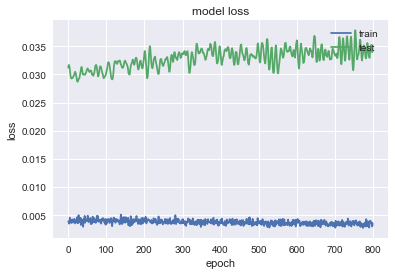

              DVA
MSE       102.814
MAE       8.30415
R2       -2.52037
MAPE (%)  14.3817


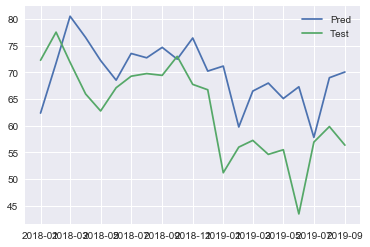

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0405 - val_loss: 0.3095
Epoch 2/1000
0s - loss: 0.0079 - val_loss: 0.1859
Epoch 3/1000
0s - loss: 0.0111 - val_loss: 0.1459
Epoch 4/1000
0s - loss: 0.0141 - val_loss: 0.1452
Epoch 5/1000
0s - loss: 0.0106 - val_loss: 0.1611
Epoch 6/1000
0s - loss: 0.0057 - val_loss: 0.1804
Epoch 7/1000
0s - loss: 0.0033 - val_loss: 0.1961
Epoch 8/1000
0s - loss: 0.0036 - val_loss: 0.2031
Epoch 9/1000
0s - loss: 0.0047 - val_loss: 0.2005
Epoch 10/1000
0s - loss: 0.0051 - val_loss: 0.1891
Epoch 11/1000
0s - loss: 0.0045 - val_loss: 0.1714
Epoch 12/1000
0s - loss: 0.0039 - val_loss: 0.1499
Epoch 13/1000
0s - loss: 0.0030 - val_loss: 0.1277
Epoch 14/1000
0s - loss: 0.0024 - val_loss: 0.1070
Epoch 15/1000
0s - loss: 0.0019 - val_loss: 0.0901
Epoch 16/1000
0s - loss: 0.0021 - val_loss: 0.0780
Epoch 17/1000
0s - loss: 0.0026 - val_loss: 0.0705
Epoch 18/1000
0s - loss: 0.0027 - val_loss: 0.0669
Epoch 19/1000
0s - loss: 0.0

0s - loss: 8.8419e-04 - val_loss: 0.0474
Epoch 160/1000
0s - loss: 8.3295e-04 - val_loss: 0.0469
Epoch 161/1000
0s - loss: 7.5940e-04 - val_loss: 0.0462
Epoch 162/1000
0s - loss: 7.7527e-04 - val_loss: 0.0455
Epoch 163/1000
0s - loss: 8.3736e-04 - val_loss: 0.0447
Epoch 164/1000
0s - loss: 8.5746e-04 - val_loss: 0.0441
Epoch 165/1000
0s - loss: 7.9190e-04 - val_loss: 0.0437
Epoch 166/1000
0s - loss: 7.1809e-04 - val_loss: 0.0433
Epoch 167/1000
0s - loss: 8.3877e-04 - val_loss: 0.0434
Epoch 168/1000
0s - loss: 7.8373e-04 - val_loss: 0.0436
Epoch 169/1000
0s - loss: 9.1239e-04 - val_loss: 0.0435
Epoch 170/1000
0s - loss: 7.1500e-04 - val_loss: 0.0432
Epoch 171/1000
0s - loss: 8.1353e-04 - val_loss: 0.0427
Epoch 172/1000
0s - loss: 0.0011 - val_loss: 0.0424
Epoch 173/1000
0s - loss: 8.7990e-04 - val_loss: 0.0421
Epoch 174/1000
0s - loss: 7.3144e-04 - val_loss: 0.0420
Epoch 175/1000
0s - loss: 7.1486e-04 - val_loss: 0.0418
Epoch 176/1000
0s - loss: 7.1259e-04 - val_loss: 0.0420
Epoch 177/1

0s - loss: 8.1707e-04 - val_loss: 0.0264
Epoch 310/1000
0s - loss: 5.6754e-04 - val_loss: 0.0262
Epoch 311/1000
0s - loss: 6.2381e-04 - val_loss: 0.0258
Epoch 312/1000
0s - loss: 6.0762e-04 - val_loss: 0.0253
Epoch 313/1000
0s - loss: 7.1770e-04 - val_loss: 0.0248
Epoch 314/1000
0s - loss: 5.6485e-04 - val_loss: 0.0244
Epoch 315/1000
0s - loss: 5.8467e-04 - val_loss: 0.0243
Epoch 316/1000
0s - loss: 6.0236e-04 - val_loss: 0.0242
Epoch 317/1000
0s - loss: 6.1522e-04 - val_loss: 0.0240
Epoch 318/1000
0s - loss: 5.3770e-04 - val_loss: 0.0237
Epoch 319/1000
0s - loss: 6.1163e-04 - val_loss: 0.0234
Epoch 320/1000
0s - loss: 5.4810e-04 - val_loss: 0.0234
Epoch 321/1000
0s - loss: 6.4018e-04 - val_loss: 0.0236
Epoch 322/1000
0s - loss: 5.3288e-04 - val_loss: 0.0234
Epoch 323/1000
0s - loss: 6.3433e-04 - val_loss: 0.0231
Epoch 324/1000
0s - loss: 5.7477e-04 - val_loss: 0.0226
Epoch 325/1000
0s - loss: 5.5545e-04 - val_loss: 0.0223
Epoch 326/1000
0s - loss: 5.3103e-04 - val_loss: 0.0223
Epoch 3

0s - loss: 4.8336e-04 - val_loss: 0.0130
Epoch 460/1000
0s - loss: 5.3493e-04 - val_loss: 0.0127
Epoch 461/1000
0s - loss: 5.6309e-04 - val_loss: 0.0123
Epoch 462/1000
0s - loss: 5.2966e-04 - val_loss: 0.0122
Epoch 463/1000
0s - loss: 4.7854e-04 - val_loss: 0.0123
Epoch 464/1000
0s - loss: 5.1063e-04 - val_loss: 0.0122
Epoch 465/1000
0s - loss: 5.3146e-04 - val_loss: 0.0122
Epoch 466/1000
0s - loss: 5.3774e-04 - val_loss: 0.0125
Epoch 467/1000
0s - loss: 5.4013e-04 - val_loss: 0.0128
Epoch 468/1000
0s - loss: 5.7103e-04 - val_loss: 0.0128
Epoch 469/1000
0s - loss: 5.3690e-04 - val_loss: 0.0126
Epoch 470/1000
0s - loss: 4.8028e-04 - val_loss: 0.0123
Epoch 471/1000
0s - loss: 4.9246e-04 - val_loss: 0.0119
Epoch 472/1000
0s - loss: 5.6174e-04 - val_loss: 0.0117
Epoch 473/1000
0s - loss: 5.1000e-04 - val_loss: 0.0117
Epoch 474/1000
0s - loss: 5.4350e-04 - val_loss: 0.0121
Epoch 475/1000
0s - loss: 5.2920e-04 - val_loss: 0.0127
Epoch 476/1000
0s - loss: 5.0538e-04 - val_loss: 0.0132
Epoch 4

0s - loss: 4.3448e-04 - val_loss: 0.0095
Epoch 614/1000
0s - loss: 4.4941e-04 - val_loss: 0.0094
Epoch 615/1000
0s - loss: 4.7450e-04 - val_loss: 0.0095
Epoch 616/1000
0s - loss: 4.1568e-04 - val_loss: 0.0096
Epoch 617/1000
0s - loss: 6.1273e-04 - val_loss: 0.0097
Epoch 618/1000
0s - loss: 4.6055e-04 - val_loss: 0.0098
Epoch 619/1000
0s - loss: 4.3309e-04 - val_loss: 0.0098
Epoch 620/1000
0s - loss: 4.2500e-04 - val_loss: 0.0097
Epoch 621/1000
0s - loss: 4.2045e-04 - val_loss: 0.0095
Epoch 622/1000
0s - loss: 4.3072e-04 - val_loss: 0.0093
Epoch 623/1000
0s - loss: 4.9180e-04 - val_loss: 0.0093
Epoch 624/1000
0s - loss: 5.2877e-04 - val_loss: 0.0094
Epoch 625/1000
0s - loss: 5.0777e-04 - val_loss: 0.0095
Epoch 626/1000
0s - loss: 4.7031e-04 - val_loss: 0.0097
Epoch 627/1000
0s - loss: 4.2103e-04 - val_loss: 0.0100
Epoch 628/1000
0s - loss: 5.7675e-04 - val_loss: 0.0101
Epoch 629/1000
0s - loss: 4.8945e-04 - val_loss: 0.0101
Epoch 630/1000
0s - loss: 4.7144e-04 - val_loss: 0.0099
Epoch 6

0s - loss: 3.9431e-04 - val_loss: 0.0094
Epoch 764/1000
0s - loss: 4.6347e-04 - val_loss: 0.0094
Epoch 765/1000
0s - loss: 5.2224e-04 - val_loss: 0.0094
Epoch 766/1000
0s - loss: 4.9203e-04 - val_loss: 0.0094
Epoch 767/1000
0s - loss: 3.4908e-04 - val_loss: 0.0094
Epoch 768/1000
0s - loss: 5.0189e-04 - val_loss: 0.0094
Epoch 769/1000
0s - loss: 4.9702e-04 - val_loss: 0.0094
Epoch 770/1000
0s - loss: 5.5717e-04 - val_loss: 0.0094
Epoch 771/1000
0s - loss: 4.5816e-04 - val_loss: 0.0095
Epoch 772/1000
0s - loss: 5.6139e-04 - val_loss: 0.0095
Epoch 773/1000
0s - loss: 4.4710e-04 - val_loss: 0.0095
Epoch 774/1000
0s - loss: 4.4051e-04 - val_loss: 0.0095
Epoch 775/1000
0s - loss: 5.1426e-04 - val_loss: 0.0094
Epoch 776/1000
0s - loss: 3.9248e-04 - val_loss: 0.0094
Epoch 777/1000
0s - loss: 4.2945e-04 - val_loss: 0.0094
Epoch 778/1000
0s - loss: 3.7365e-04 - val_loss: 0.0095
Epoch 779/1000
0s - loss: 3.8623e-04 - val_loss: 0.0095
Epoch 780/1000
0s - loss: 3.8174e-04 - val_loss: 0.0096
Epoch 7

0s - loss: 4.9805e-04 - val_loss: 0.0098
Epoch 913/1000
0s - loss: 4.0304e-04 - val_loss: 0.0098
Epoch 914/1000
0s - loss: 4.8287e-04 - val_loss: 0.0100
Epoch 915/1000
0s - loss: 3.5475e-04 - val_loss: 0.0100
Epoch 916/1000
0s - loss: 4.4680e-04 - val_loss: 0.0101
Epoch 917/1000
0s - loss: 4.4987e-04 - val_loss: 0.0100
Epoch 918/1000
0s - loss: 3.2159e-04 - val_loss: 0.0099
Epoch 919/1000
0s - loss: 3.5845e-04 - val_loss: 0.0099
Epoch 920/1000
0s - loss: 4.2637e-04 - val_loss: 0.0099
Epoch 921/1000
0s - loss: 4.3361e-04 - val_loss: 0.0099
Epoch 922/1000
0s - loss: 3.6731e-04 - val_loss: 0.0098
Epoch 923/1000
0s - loss: 4.4593e-04 - val_loss: 0.0098
Epoch 924/1000
0s - loss: 4.2963e-04 - val_loss: 0.0100
Epoch 925/1000
0s - loss: 3.5221e-04 - val_loss: 0.0101
Epoch 926/1000
0s - loss: 4.9148e-04 - val_loss: 0.0103
Epoch 927/1000
0s - loss: 4.9665e-04 - val_loss: 0.0104
Epoch 928/1000
0s - loss: 4.2889e-04 - val_loss: 0.0103
Epoch 929/1000
0s - loss: 5.6713e-04 - val_loss: 0.0100
Epoch 9

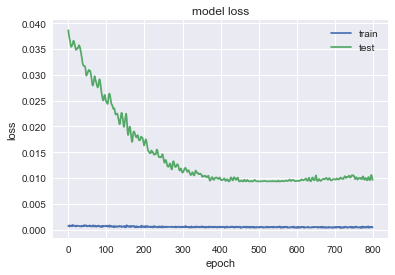

                BA
MSE        1465.45
MAE        30.1596
R2       -0.407499
MAPE (%)   8.35516


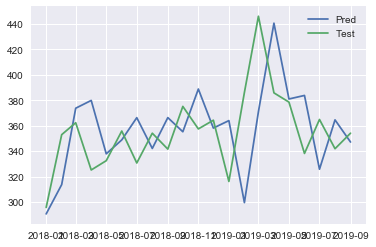

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3781 - val_loss: 0.0183
Epoch 2/1000
0s - loss: 0.2172 - val_loss: 0.0259
Epoch 3/1000
0s - loss: 0.1186 - val_loss: 0.0932
Epoch 4/1000
0s - loss: 0.0662 - val_loss: 0.2028
Epoch 5/1000
0s - loss: 0.0529 - val_loss: 0.3095
Epoch 6/1000
0s - loss: 0.0602 - val_loss: 0.3659
Epoch 7/1000
0s - loss: 0.0763 - val_loss: 0.3597
Epoch 8/1000
0s - loss: 0.0748 - val_loss: 0.3091
Epoch 9/1000
0s - loss: 0.0691 - val_loss: 0.2365
Epoch 10/1000
0s - loss: 0.0539 - val_loss: 0.1649
Epoch 11/1000
0s - loss: 0.0412 - val_loss: 0.1057
Epoch 12/1000
0s - loss: 0.0273 - val_loss: 0.0638
Epoch 13/1000
0s - loss: 0.0248 - val_loss: 0.0371
Epoch 14/1000
0s - loss: 0.0251 - val_loss: 0.0219
Epoch 15/1000
0s - loss: 0.0262 - val_loss: 0.0146
Epoch 16/1000
0s - loss: 0.0272 - val_loss: 0.0119
Epoch 17/1000
0s - loss: 0.0257 - val_loss: 0.0113
Epoch 18/1000
0s - loss: 0.0267 - val_loss: 0.0114
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0053 - val_loss: 0.0268
Epoch 169/1000
0s - loss: 0.0062 - val_loss: 0.0269
Epoch 170/1000
0s - loss: 0.0056 - val_loss: 0.0268
Epoch 171/1000
0s - loss: 0.0054 - val_loss: 0.0265
Epoch 172/1000
0s - loss: 0.0060 - val_loss: 0.0263
Epoch 173/1000
0s - loss: 0.0055 - val_loss: 0.0261
Epoch 174/1000
0s - loss: 0.0060 - val_loss: 0.0261
Epoch 175/1000
0s - loss: 0.0064 - val_loss: 0.0260
Epoch 176/1000
0s - loss: 0.0051 - val_loss: 0.0260
Epoch 177/1000
0s - loss: 0.0054 - val_loss: 0.0259
Epoch 178/1000
0s - loss: 0.0061 - val_loss: 0.0257
Epoch 179/1000
0s - loss: 0.0063 - val_loss: 0.0254
Epoch 180/1000
0s - loss: 0.0056 - val_loss: 0.0252
Epoch 181/1000
0s - loss: 0.0050 - val_loss: 0.0249
Epoch 182/1000
0s - loss: 0.0058 - val_loss: 0.0247
Epoch 183/1000
0s - loss: 0.0054 - val_loss: 0.0244
Epoch 184/1000
0s - loss: 0.0062 - val_loss: 0.0243
Epoch 185/1000
0s - loss: 0.0047 - val_loss: 0.0241
Epoch 186/1000
0s - loss: 0.0051 - val_loss: 0.0241
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0245
Epoch 327/1000
0s - loss: 0.0055 - val_loss: 0.0245
Epoch 328/1000
0s - loss: 0.0050 - val_loss: 0.0247
Epoch 329/1000
0s - loss: 0.0053 - val_loss: 0.0249
Epoch 330/1000
0s - loss: 0.0052 - val_loss: 0.0250
Epoch 331/1000
0s - loss: 0.0054 - val_loss: 0.0248
Epoch 332/1000
0s - loss: 0.0056 - val_loss: 0.0246
Epoch 333/1000
0s - loss: 0.0057 - val_loss: 0.0245
Epoch 334/1000
0s - loss: 0.0056 - val_loss: 0.0242
Epoch 335/1000
0s - loss: 0.0052 - val_loss: 0.0239
Epoch 336/1000
0s - loss: 0.0055 - val_loss: 0.0237
Epoch 337/1000
0s - loss: 0.0048 - val_loss: 0.0234
Epoch 338/1000
0s - loss: 0.0048 - val_loss: 0.0232
Epoch 339/1000
0s - loss: 0.0053 - val_loss: 0.0231
Epoch 340/1000
0s - loss: 0.0055 - val_loss: 0.0232
Epoch 341/1000
0s - loss: 0.0057 - val_loss: 0.0234
Epoch 342/1000
0s - loss: 0.0050 - val_loss: 0.0236
Epoch 343/1000
0s - loss: 0.0054 - val_loss: 0.0240
Epoch 344/1000
0s - loss: 0.0053 - val_loss: 0.0243
Epoch 345/1000
0s - loss: 0

0s - loss: 0.0052 - val_loss: 0.0231
Epoch 494/1000
0s - loss: 0.0056 - val_loss: 0.0232
Epoch 495/1000
0s - loss: 0.0051 - val_loss: 0.0234
Epoch 496/1000
0s - loss: 0.0051 - val_loss: 0.0236
Epoch 497/1000
0s - loss: 0.0053 - val_loss: 0.0237
Epoch 498/1000
0s - loss: 0.0051 - val_loss: 0.0238
Epoch 499/1000
0s - loss: 0.0053 - val_loss: 0.0240
Epoch 500/1000
0s - loss: 0.0058 - val_loss: 0.0242
Epoch 501/1000
0s - loss: 0.0057 - val_loss: 0.0240
Epoch 502/1000
0s - loss: 0.0046 - val_loss: 0.0237
Epoch 503/1000
0s - loss: 0.0057 - val_loss: 0.0233
Epoch 504/1000
0s - loss: 0.0051 - val_loss: 0.0229
Epoch 505/1000
0s - loss: 0.0050 - val_loss: 0.0226
Epoch 506/1000
0s - loss: 0.0055 - val_loss: 0.0225
Epoch 507/1000
0s - loss: 0.0052 - val_loss: 0.0225
Epoch 508/1000
0s - loss: 0.0048 - val_loss: 0.0226
Epoch 509/1000
0s - loss: 0.0051 - val_loss: 0.0228
Epoch 510/1000
0s - loss: 0.0055 - val_loss: 0.0231
Epoch 511/1000
0s - loss: 0.0052 - val_loss: 0.0235
Epoch 512/1000
0s - loss: 0

0s - loss: 0.0052 - val_loss: 0.0236
Epoch 659/1000
0s - loss: 0.0049 - val_loss: 0.0230
Epoch 660/1000
0s - loss: 0.0049 - val_loss: 0.0226
Epoch 661/1000
0s - loss: 0.0051 - val_loss: 0.0224
Epoch 662/1000
0s - loss: 0.0049 - val_loss: 0.0223
Epoch 663/1000
0s - loss: 0.0062 - val_loss: 0.0224
Epoch 664/1000
0s - loss: 0.0055 - val_loss: 0.0226
Epoch 665/1000
0s - loss: 0.0049 - val_loss: 0.0228
Epoch 666/1000
0s - loss: 0.0049 - val_loss: 0.0229
Epoch 667/1000
0s - loss: 0.0052 - val_loss: 0.0230
Epoch 668/1000
0s - loss: 0.0048 - val_loss: 0.0230
Epoch 669/1000
0s - loss: 0.0050 - val_loss: 0.0232
Epoch 670/1000
0s - loss: 0.0057 - val_loss: 0.0233
Epoch 671/1000
0s - loss: 0.0055 - val_loss: 0.0235
Epoch 672/1000
0s - loss: 0.0051 - val_loss: 0.0238
Epoch 673/1000
0s - loss: 0.0048 - val_loss: 0.0240
Epoch 674/1000
0s - loss: 0.0054 - val_loss: 0.0242
Epoch 675/1000
0s - loss: 0.0052 - val_loss: 0.0243
Epoch 676/1000
0s - loss: 0.0055 - val_loss: 0.0241
Epoch 677/1000
0s - loss: 0

0s - loss: 0.0052 - val_loss: 0.0231
Epoch 819/1000
0s - loss: 0.0043 - val_loss: 0.0237
Epoch 820/1000
0s - loss: 0.0057 - val_loss: 0.0241
Epoch 821/1000
0s - loss: 0.0046 - val_loss: 0.0245
Epoch 822/1000
0s - loss: 0.0050 - val_loss: 0.0248
Epoch 823/1000
0s - loss: 0.0054 - val_loss: 0.0249
Epoch 824/1000
0s - loss: 0.0048 - val_loss: 0.0248
Epoch 825/1000
0s - loss: 0.0052 - val_loss: 0.0244
Epoch 826/1000
0s - loss: 0.0053 - val_loss: 0.0239
Epoch 827/1000
0s - loss: 0.0049 - val_loss: 0.0236
Epoch 828/1000
0s - loss: 0.0053 - val_loss: 0.0233
Epoch 829/1000
0s - loss: 0.0052 - val_loss: 0.0230
Epoch 830/1000
0s - loss: 0.0050 - val_loss: 0.0230
Epoch 831/1000
0s - loss: 0.0048 - val_loss: 0.0234
Epoch 832/1000
0s - loss: 0.0054 - val_loss: 0.0238
Epoch 833/1000
0s - loss: 0.0047 - val_loss: 0.0242
Epoch 834/1000
0s - loss: 0.0058 - val_loss: 0.0245
Epoch 835/1000
0s - loss: 0.0047 - val_loss: 0.0247
Epoch 836/1000
0s - loss: 0.0050 - val_loss: 0.0246
Epoch 837/1000
0s - loss: 0

0s - loss: 0.0056 - val_loss: 0.0241
Epoch 983/1000
0s - loss: 0.0047 - val_loss: 0.0241
Epoch 984/1000
0s - loss: 0.0051 - val_loss: 0.0245
Epoch 985/1000
0s - loss: 0.0050 - val_loss: 0.0247
Epoch 986/1000
0s - loss: 0.0052 - val_loss: 0.0245
Epoch 987/1000
0s - loss: 0.0050 - val_loss: 0.0243
Epoch 988/1000
0s - loss: 0.0048 - val_loss: 0.0240
Epoch 989/1000
0s - loss: 0.0048 - val_loss: 0.0238
Epoch 990/1000
0s - loss: 0.0051 - val_loss: 0.0236
Epoch 991/1000
0s - loss: 0.0061 - val_loss: 0.0234
Epoch 992/1000
0s - loss: 0.0049 - val_loss: 0.0233
Epoch 993/1000
0s - loss: 0.0056 - val_loss: 0.0234
Epoch 994/1000
0s - loss: 0.0047 - val_loss: 0.0236
Epoch 995/1000
0s - loss: 0.0051 - val_loss: 0.0239
Epoch 996/1000
0s - loss: 0.0049 - val_loss: 0.0244
Epoch 997/1000
0s - loss: 0.0054 - val_loss: 0.0249
Epoch 998/1000
0s - loss: 0.0054 - val_loss: 0.0251
Epoch 999/1000
0s - loss: 0.0052 - val_loss: 0.0251
Epoch 1000/1000
0s - loss: 0.0054 - val_loss: 0.0255


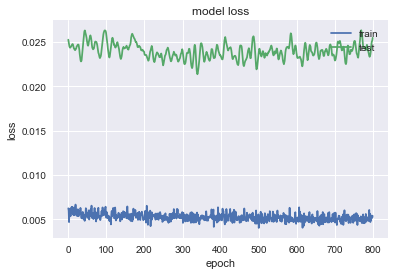

              IBM
MSE        258.82
MAE       14.5359
R2       -1.06697
MAPE (%)  10.3935


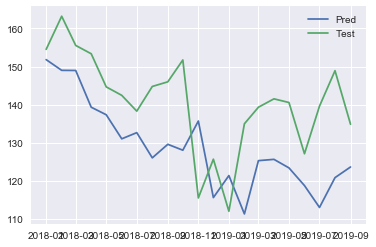

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1064 - val_loss: 0.0925
Epoch 2/1000
0s - loss: 0.0440 - val_loss: 0.0283
Epoch 3/1000
0s - loss: 0.0270 - val_loss: 0.0186
Epoch 4/1000
0s - loss: 0.0310 - val_loss: 0.0255
Epoch 5/1000
0s - loss: 0.0367 - val_loss: 0.0279
Epoch 6/1000
0s - loss: 0.0313 - val_loss: 0.0247
Epoch 7/1000
0s - loss: 0.0258 - val_loss: 0.0204
Epoch 8/1000
0s - loss: 0.0197 - val_loss: 0.0179
Epoch 9/1000
0s - loss: 0.0173 - val_loss: 0.0174
Epoch 10/1000
0s - loss: 0.0167 - val_loss: 0.0176
Epoch 11/1000
0s - loss: 0.0165 - val_loss: 0.0176
Epoch 12/1000
0s - loss: 0.0175 - val_loss: 0.0172
Epoch 13/1000
0s - loss: 0.0172 - val_loss: 0.0168
Epoch 14/1000
0s - loss: 0.0162 - val_loss: 0.0176
Epoch 15/1000
0s - loss: 0.0142 - val_loss: 0.0209
Epoch 16/1000
0s - loss: 0.0120 - val_loss: 0.0273
Epoch 17/1000
0s - loss: 0.0107 - val_loss: 0.0366
Epoch 18/1000
0s - loss: 0.0093 - val_loss: 0.0472
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0026 - val_loss: 0.0528
Epoch 170/1000
0s - loss: 0.0028 - val_loss: 0.0515
Epoch 171/1000
0s - loss: 0.0024 - val_loss: 0.0505
Epoch 172/1000
0s - loss: 0.0029 - val_loss: 0.0499
Epoch 173/1000
0s - loss: 0.0025 - val_loss: 0.0493
Epoch 174/1000
0s - loss: 0.0026 - val_loss: 0.0493
Epoch 175/1000
0s - loss: 0.0026 - val_loss: 0.0497
Epoch 176/1000
0s - loss: 0.0025 - val_loss: 0.0505
Epoch 177/1000
0s - loss: 0.0028 - val_loss: 0.0504
Epoch 178/1000
0s - loss: 0.0028 - val_loss: 0.0500
Epoch 179/1000
0s - loss: 0.0027 - val_loss: 0.0492
Epoch 180/1000
0s - loss: 0.0029 - val_loss: 0.0483
Epoch 181/1000
0s - loss: 0.0026 - val_loss: 0.0474
Epoch 182/1000
0s - loss: 0.0027 - val_loss: 0.0467
Epoch 183/1000
0s - loss: 0.0030 - val_loss: 0.0462
Epoch 184/1000
0s - loss: 0.0024 - val_loss: 0.0461
Epoch 185/1000
0s - loss: 0.0030 - val_loss: 0.0472
Epoch 186/1000
0s - loss: 0.0025 - val_loss: 0.0487
Epoch 187/1000
0s - loss: 0.0028 - val_loss: 0.0501
Epoch 188/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0490
Epoch 331/1000
0s - loss: 0.0025 - val_loss: 0.0486
Epoch 332/1000
0s - loss: 0.0026 - val_loss: 0.0469
Epoch 333/1000
0s - loss: 0.0023 - val_loss: 0.0460
Epoch 334/1000
0s - loss: 0.0023 - val_loss: 0.0459
Epoch 335/1000
0s - loss: 0.0026 - val_loss: 0.0457
Epoch 336/1000
0s - loss: 0.0024 - val_loss: 0.0448
Epoch 337/1000
0s - loss: 0.0024 - val_loss: 0.0445
Epoch 338/1000
0s - loss: 0.0026 - val_loss: 0.0447
Epoch 339/1000
0s - loss: 0.0023 - val_loss: 0.0451
Epoch 340/1000
0s - loss: 0.0027 - val_loss: 0.0449
Epoch 341/1000
0s - loss: 0.0029 - val_loss: 0.0446
Epoch 342/1000
0s - loss: 0.0027 - val_loss: 0.0446
Epoch 343/1000
0s - loss: 0.0026 - val_loss: 0.0448
Epoch 344/1000
0s - loss: 0.0023 - val_loss: 0.0446
Epoch 345/1000
0s - loss: 0.0022 - val_loss: 0.0439
Epoch 346/1000
0s - loss: 0.0025 - val_loss: 0.0432
Epoch 347/1000
0s - loss: 0.0023 - val_loss: 0.0422
Epoch 348/1000
0s - loss: 0.0023 - val_loss: 0.0411
Epoch 349/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0367
Epoch 491/1000
0s - loss: 0.0023 - val_loss: 0.0373
Epoch 492/1000
0s - loss: 0.0026 - val_loss: 0.0385
Epoch 493/1000
0s - loss: 0.0024 - val_loss: 0.0407
Epoch 494/1000
0s - loss: 0.0021 - val_loss: 0.0418
Epoch 495/1000
0s - loss: 0.0028 - val_loss: 0.0421
Epoch 496/1000
0s - loss: 0.0021 - val_loss: 0.0412
Epoch 497/1000
0s - loss: 0.0028 - val_loss: 0.0389
Epoch 498/1000
0s - loss: 0.0024 - val_loss: 0.0369
Epoch 499/1000
0s - loss: 0.0023 - val_loss: 0.0356
Epoch 500/1000
0s - loss: 0.0021 - val_loss: 0.0364
Epoch 501/1000
0s - loss: 0.0025 - val_loss: 0.0391
Epoch 502/1000
0s - loss: 0.0025 - val_loss: 0.0422
Epoch 503/1000
0s - loss: 0.0027 - val_loss: 0.0433
Epoch 504/1000
0s - loss: 0.0024 - val_loss: 0.0426
Epoch 505/1000
0s - loss: 0.0020 - val_loss: 0.0415
Epoch 506/1000
0s - loss: 0.0024 - val_loss: 0.0400
Epoch 507/1000
0s - loss: 0.0023 - val_loss: 0.0387
Epoch 508/1000
0s - loss: 0.0020 - val_loss: 0.0383
Epoch 509/1000
0s - loss: 0

0s - loss: 0.0026 - val_loss: 0.0443
Epoch 651/1000
0s - loss: 0.0021 - val_loss: 0.0444
Epoch 652/1000
0s - loss: 0.0021 - val_loss: 0.0451
Epoch 653/1000
0s - loss: 0.0023 - val_loss: 0.0459
Epoch 654/1000
0s - loss: 0.0020 - val_loss: 0.0466
Epoch 655/1000
0s - loss: 0.0021 - val_loss: 0.0472
Epoch 656/1000
0s - loss: 0.0022 - val_loss: 0.0482
Epoch 657/1000
0s - loss: 0.0024 - val_loss: 0.0475
Epoch 658/1000
0s - loss: 0.0021 - val_loss: 0.0463
Epoch 659/1000
0s - loss: 0.0024 - val_loss: 0.0451
Epoch 660/1000
0s - loss: 0.0030 - val_loss: 0.0438
Epoch 661/1000
0s - loss: 0.0031 - val_loss: 0.0431
Epoch 662/1000
0s - loss: 0.0024 - val_loss: 0.0428
Epoch 663/1000
0s - loss: 0.0022 - val_loss: 0.0431
Epoch 664/1000
0s - loss: 0.0023 - val_loss: 0.0433
Epoch 665/1000
0s - loss: 0.0025 - val_loss: 0.0425
Epoch 666/1000
0s - loss: 0.0026 - val_loss: 0.0409
Epoch 667/1000
0s - loss: 0.0027 - val_loss: 0.0405
Epoch 668/1000
0s - loss: 0.0026 - val_loss: 0.0396
Epoch 669/1000
0s - loss: 0

0s - loss: 0.0025 - val_loss: 0.0481
Epoch 816/1000
0s - loss: 0.0023 - val_loss: 0.0464
Epoch 817/1000
0s - loss: 0.0025 - val_loss: 0.0436
Epoch 818/1000
0s - loss: 0.0023 - val_loss: 0.0421
Epoch 819/1000
0s - loss: 0.0024 - val_loss: 0.0424
Epoch 820/1000
0s - loss: 0.0024 - val_loss: 0.0439
Epoch 821/1000
0s - loss: 0.0027 - val_loss: 0.0468
Epoch 822/1000
0s - loss: 0.0021 - val_loss: 0.0480
Epoch 823/1000
0s - loss: 0.0022 - val_loss: 0.0486
Epoch 824/1000
0s - loss: 0.0022 - val_loss: 0.0474
Epoch 825/1000
0s - loss: 0.0024 - val_loss: 0.0459
Epoch 826/1000
0s - loss: 0.0026 - val_loss: 0.0433
Epoch 827/1000
0s - loss: 0.0022 - val_loss: 0.0418
Epoch 828/1000
0s - loss: 0.0023 - val_loss: 0.0424
Epoch 829/1000
0s - loss: 0.0024 - val_loss: 0.0439
Epoch 830/1000
0s - loss: 0.0025 - val_loss: 0.0448
Epoch 831/1000
0s - loss: 0.0026 - val_loss: 0.0456
Epoch 832/1000
0s - loss: 0.0024 - val_loss: 0.0459
Epoch 833/1000
0s - loss: 0.0025 - val_loss: 0.0448
Epoch 834/1000
0s - loss: 0

0s - loss: 0.0023 - val_loss: 0.0454
Epoch 974/1000
0s - loss: 0.0022 - val_loss: 0.0457
Epoch 975/1000
0s - loss: 0.0024 - val_loss: 0.0476
Epoch 976/1000
0s - loss: 0.0021 - val_loss: 0.0486
Epoch 977/1000
0s - loss: 0.0022 - val_loss: 0.0487
Epoch 978/1000
0s - loss: 0.0025 - val_loss: 0.0482
Epoch 979/1000
0s - loss: 0.0021 - val_loss: 0.0484
Epoch 980/1000
0s - loss: 0.0024 - val_loss: 0.0484
Epoch 981/1000
0s - loss: 0.0023 - val_loss: 0.0477
Epoch 982/1000
0s - loss: 0.0020 - val_loss: 0.0485
Epoch 983/1000
0s - loss: 0.0023 - val_loss: 0.0480
Epoch 984/1000
0s - loss: 0.0023 - val_loss: 0.0494
Epoch 985/1000
0s - loss: 0.0021 - val_loss: 0.0512
Epoch 986/1000
0s - loss: 0.0024 - val_loss: 0.0526
Epoch 987/1000
0s - loss: 0.0023 - val_loss: 0.0515
Epoch 988/1000
0s - loss: 0.0024 - val_loss: 0.0491
Epoch 989/1000
0s - loss: 0.0026 - val_loss: 0.0472
Epoch 990/1000
0s - loss: 0.0022 - val_loss: 0.0473
Epoch 991/1000
0s - loss: 0.0024 - val_loss: 0.0474
Epoch 992/1000
0s - loss: 0

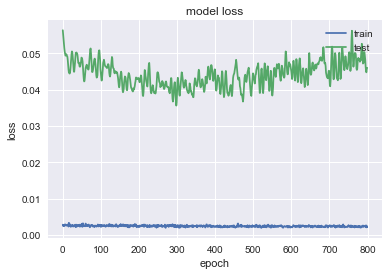

              ALB
MSE       517.646
MAE       20.3772
R2       -2.35415
MAPE (%)  24.8873


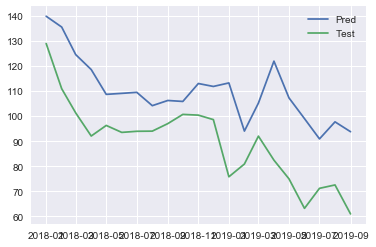

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1308 - val_loss: 0.3905
Epoch 2/1000
0s - loss: 0.0495 - val_loss: 0.2060
Epoch 3/1000
0s - loss: 0.0191 - val_loss: 0.0989
Epoch 4/1000
0s - loss: 0.0183 - val_loss: 0.0521
Epoch 5/1000
0s - loss: 0.0258 - val_loss: 0.0382
Epoch 6/1000
0s - loss: 0.0293 - val_loss: 0.0382
Epoch 7/1000
0s - loss: 0.0277 - val_loss: 0.0469
Epoch 8/1000
0s - loss: 0.0189 - val_loss: 0.0613
Epoch 9/1000
0s - loss: 0.0136 - val_loss: 0.0791
Epoch 10/1000
0s - loss: 0.0098 - val_loss: 0.0961
Epoch 11/1000
0s - loss: 0.0093 - val_loss: 0.1094
Epoch 12/1000
0s - loss: 0.0107 - val_loss: 0.1168
Epoch 13/1000
0s - loss: 0.0117 - val_loss: 0.1176
Epoch 14/1000
0s - loss: 0.0124 - val_loss: 0.1122
Epoch 15/1000
0s - loss: 0.0139 - val_loss: 0.1016
Epoch 16/1000
0s - loss: 0.0117 - val_loss: 0.0879
Epoch 17/1000
0s - loss: 0.0107 - val_loss: 0.0728
Epoch 18/1000
0s - loss: 0.0084 - val_loss: 0.0582
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0032 - val_loss: 0.0128
Epoch 161/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 162/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 163/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 164/1000
0s - loss: 0.0032 - val_loss: 0.0128
Epoch 165/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 166/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 167/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 168/1000
0s - loss: 0.0031 - val_loss: 0.0128
Epoch 169/1000
0s - loss: 0.0034 - val_loss: 0.0128
Epoch 170/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 171/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 172/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 173/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 174/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 175/1000
0s - loss: 0.0033 - val_loss: 0.0127
Epoch 176/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 177/1000
0s - loss: 0.0036 - val_loss: 0.0127
Epoch 178/1000
0s - loss: 0.0032 - val_loss: 0.0127
Epoch 179/1000
0s - loss: 0

0s - loss: 0.0031 - val_loss: 0.0117
Epoch 321/1000
0s - loss: 0.0030 - val_loss: 0.0117
Epoch 322/1000
0s - loss: 0.0032 - val_loss: 0.0117
Epoch 323/1000
0s - loss: 0.0033 - val_loss: 0.0117
Epoch 324/1000
0s - loss: 0.0026 - val_loss: 0.0118
Epoch 325/1000
0s - loss: 0.0028 - val_loss: 0.0118
Epoch 326/1000
0s - loss: 0.0028 - val_loss: 0.0118
Epoch 327/1000
0s - loss: 0.0031 - val_loss: 0.0116
Epoch 328/1000
0s - loss: 0.0034 - val_loss: 0.0115
Epoch 329/1000
0s - loss: 0.0033 - val_loss: 0.0115
Epoch 330/1000
0s - loss: 0.0032 - val_loss: 0.0114
Epoch 331/1000
0s - loss: 0.0029 - val_loss: 0.0114
Epoch 332/1000
0s - loss: 0.0031 - val_loss: 0.0114
Epoch 333/1000
0s - loss: 0.0034 - val_loss: 0.0114
Epoch 334/1000
0s - loss: 0.0030 - val_loss: 0.0116
Epoch 335/1000
0s - loss: 0.0028 - val_loss: 0.0116
Epoch 336/1000
0s - loss: 0.0027 - val_loss: 0.0118
Epoch 337/1000
0s - loss: 0.0026 - val_loss: 0.0118
Epoch 338/1000
0s - loss: 0.0033 - val_loss: 0.0119
Epoch 339/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0107
Epoch 483/1000
0s - loss: 0.0028 - val_loss: 0.0108
Epoch 484/1000
0s - loss: 0.0028 - val_loss: 0.0110
Epoch 485/1000
0s - loss: 0.0031 - val_loss: 0.0113
Epoch 486/1000
0s - loss: 0.0029 - val_loss: 0.0116
Epoch 487/1000
0s - loss: 0.0027 - val_loss: 0.0118
Epoch 488/1000
0s - loss: 0.0028 - val_loss: 0.0119
Epoch 489/1000
0s - loss: 0.0030 - val_loss: 0.0117
Epoch 490/1000
0s - loss: 0.0028 - val_loss: 0.0116
Epoch 491/1000
0s - loss: 0.0029 - val_loss: 0.0113
Epoch 492/1000
0s - loss: 0.0027 - val_loss: 0.0111
Epoch 493/1000
0s - loss: 0.0033 - val_loss: 0.0109
Epoch 494/1000
0s - loss: 0.0032 - val_loss: 0.0109
Epoch 495/1000
0s - loss: 0.0031 - val_loss: 0.0110
Epoch 496/1000
0s - loss: 0.0028 - val_loss: 0.0113
Epoch 497/1000
0s - loss: 0.0034 - val_loss: 0.0115
Epoch 498/1000
0s - loss: 0.0029 - val_loss: 0.0117
Epoch 499/1000
0s - loss: 0.0029 - val_loss: 0.0118
Epoch 500/1000
0s - loss: 0.0025 - val_loss: 0.0117
Epoch 501/1000
0s - loss: 0

0s - loss: 0.0029 - val_loss: 0.0136
Epoch 648/1000
0s - loss: 0.0029 - val_loss: 0.0135
Epoch 649/1000
0s - loss: 0.0026 - val_loss: 0.0131
Epoch 650/1000
0s - loss: 0.0028 - val_loss: 0.0124
Epoch 651/1000
0s - loss: 0.0030 - val_loss: 0.0119
Epoch 652/1000
0s - loss: 0.0031 - val_loss: 0.0115
Epoch 653/1000
0s - loss: 0.0026 - val_loss: 0.0112
Epoch 654/1000
0s - loss: 0.0027 - val_loss: 0.0110
Epoch 655/1000
0s - loss: 0.0027 - val_loss: 0.0111
Epoch 656/1000
0s - loss: 0.0026 - val_loss: 0.0115
Epoch 657/1000
0s - loss: 0.0031 - val_loss: 0.0121
Epoch 658/1000
0s - loss: 0.0031 - val_loss: 0.0125
Epoch 659/1000
0s - loss: 0.0028 - val_loss: 0.0128
Epoch 660/1000
0s - loss: 0.0024 - val_loss: 0.0127
Epoch 661/1000
0s - loss: 0.0029 - val_loss: 0.0124
Epoch 662/1000
0s - loss: 0.0029 - val_loss: 0.0120
Epoch 663/1000
0s - loss: 0.0026 - val_loss: 0.0115
Epoch 664/1000
0s - loss: 0.0028 - val_loss: 0.0111
Epoch 665/1000
0s - loss: 0.0031 - val_loss: 0.0109
Epoch 666/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0123
Epoch 808/1000
0s - loss: 0.0023 - val_loss: 0.0123
Epoch 809/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 810/1000
0s - loss: 0.0028 - val_loss: 0.0125
Epoch 811/1000
0s - loss: 0.0031 - val_loss: 0.0130
Epoch 812/1000
0s - loss: 0.0030 - val_loss: 0.0133
Epoch 813/1000
0s - loss: 0.0027 - val_loss: 0.0135
Epoch 814/1000
0s - loss: 0.0028 - val_loss: 0.0134
Epoch 815/1000
0s - loss: 0.0028 - val_loss: 0.0130
Epoch 816/1000
0s - loss: 0.0030 - val_loss: 0.0125
Epoch 817/1000
0s - loss: 0.0030 - val_loss: 0.0121
Epoch 818/1000
0s - loss: 0.0025 - val_loss: 0.0120
Epoch 819/1000
0s - loss: 0.0032 - val_loss: 0.0123
Epoch 820/1000
0s - loss: 0.0027 - val_loss: 0.0128
Epoch 821/1000
0s - loss: 0.0030 - val_loss: 0.0131
Epoch 822/1000
0s - loss: 0.0030 - val_loss: 0.0132
Epoch 823/1000
0s - loss: 0.0029 - val_loss: 0.0129
Epoch 824/1000
0s - loss: 0.0030 - val_loss: 0.0123
Epoch 825/1000
0s - loss: 0.0027 - val_loss: 0.0120
Epoch 826/1000
0s - loss: 0

0s - loss: 0.0027 - val_loss: 0.0136
Epoch 967/1000
0s - loss: 0.0027 - val_loss: 0.0136
Epoch 968/1000
0s - loss: 0.0026 - val_loss: 0.0137
Epoch 969/1000
0s - loss: 0.0026 - val_loss: 0.0139
Epoch 970/1000
0s - loss: 0.0028 - val_loss: 0.0138
Epoch 971/1000
0s - loss: 0.0027 - val_loss: 0.0138
Epoch 972/1000
0s - loss: 0.0025 - val_loss: 0.0135
Epoch 973/1000
0s - loss: 0.0030 - val_loss: 0.0134
Epoch 974/1000
0s - loss: 0.0027 - val_loss: 0.0132
Epoch 975/1000
0s - loss: 0.0027 - val_loss: 0.0130
Epoch 976/1000
0s - loss: 0.0030 - val_loss: 0.0128
Epoch 977/1000
0s - loss: 0.0025 - val_loss: 0.0127
Epoch 978/1000
0s - loss: 0.0027 - val_loss: 0.0126
Epoch 979/1000
0s - loss: 0.0029 - val_loss: 0.0127
Epoch 980/1000
0s - loss: 0.0026 - val_loss: 0.0131
Epoch 981/1000
0s - loss: 0.0029 - val_loss: 0.0138
Epoch 982/1000
0s - loss: 0.0029 - val_loss: 0.0142
Epoch 983/1000
0s - loss: 0.0027 - val_loss: 0.0138
Epoch 984/1000
0s - loss: 0.0028 - val_loss: 0.0133
Epoch 985/1000
0s - loss: 0

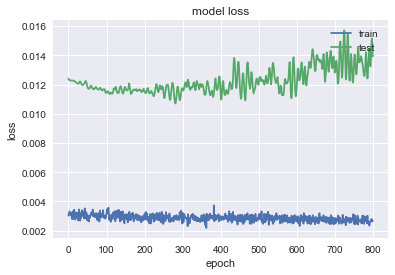

             CBRE
MSE       23.4049
MAE       3.94053
R2       -1.29767
MAPE (%)  8.67439


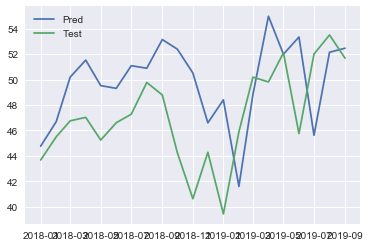

In [363]:
pred_multi_GRU_2 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_GRU_2[comp] = nn_forec_multi_GRU(df,comp,n_train_time = test.shape[0],first_layer = 256,second_layer=128).values

Predicting for  T
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3282 - val_loss: 0.1409
Epoch 2/1000
0s - loss: 0.2790 - val_loss: 0.1054
Epoch 3/1000
0s - loss: 0.2362 - val_loss: 0.0774
Epoch 4/1000
0s - loss: 0.1999 - val_loss: 0.0555
Epoch 5/1000
0s - loss: 0.1635 - val_loss: 0.0391
Epoch 6/1000
0s - loss: 0.1463 - val_loss: 0.0277
Epoch 7/1000
0s - loss: 0.1280 - val_loss: 0.0209
Epoch 8/1000
0s - loss: 0.1074 - val_loss: 0.0182
Epoch 9/1000
0s - loss: 0.0894 - val_loss: 0.0194
Epoch 10/1000
0s - loss: 0.0743 - val_loss: 0.0241
Epoch 11/1000
0s - loss: 0.0616 - val_loss: 0.0317
Epoch 12/1000
0s - loss: 0.0554 - val_loss: 0.0417
Epoch 13/1000
0s - loss: 0.0463 - val_loss: 0.0535
Epoch 14/1000
0s - loss: 0.0507 - val_loss: 0.0665
Epoch 15/1000
0s - loss: 0.0428 - val_loss: 0.0800
Epoch 16/1000
0s - loss: 0.0464 - val_loss: 0.0936
Epoch 17/1000
0s - loss: 0.0471 - val_loss: 0.1064
Epoch 18/1000
0s - loss: 0.0435 - val_loss: 0.1178
Epoch 19/1000
0s - loss: 0.04

0s - loss: 0.0195 - val_loss: 0.0788
Epoch 182/1000
0s - loss: 0.0206 - val_loss: 0.0783
Epoch 183/1000
0s - loss: 0.0202 - val_loss: 0.0780
Epoch 184/1000
0s - loss: 0.0217 - val_loss: 0.0779
Epoch 185/1000
0s - loss: 0.0215 - val_loss: 0.0779
Epoch 186/1000
0s - loss: 0.0191 - val_loss: 0.0781
Epoch 187/1000
0s - loss: 0.0163 - val_loss: 0.0783
Epoch 188/1000
0s - loss: 0.0193 - val_loss: 0.0785
Epoch 189/1000
0s - loss: 0.0163 - val_loss: 0.0790
Epoch 190/1000
0s - loss: 0.0216 - val_loss: 0.0795
Epoch 191/1000
0s - loss: 0.0183 - val_loss: 0.0798
Epoch 192/1000
0s - loss: 0.0193 - val_loss: 0.0801
Epoch 193/1000
0s - loss: 0.0194 - val_loss: 0.0804
Epoch 194/1000
0s - loss: 0.0164 - val_loss: 0.0804
Epoch 195/1000
0s - loss: 0.0124 - val_loss: 0.0803
Epoch 196/1000
0s - loss: 0.0188 - val_loss: 0.0802
Epoch 197/1000
0s - loss: 0.0188 - val_loss: 0.0800
Epoch 198/1000
0s - loss: 0.0183 - val_loss: 0.0797
Epoch 199/1000
0s - loss: 0.0168 - val_loss: 0.0788
Epoch 200/1000
0s - loss: 0

0s - loss: 0.0124 - val_loss: 0.0215
Epoch 359/1000
0s - loss: 0.0090 - val_loss: 0.0213
Epoch 360/1000
0s - loss: 0.0105 - val_loss: 0.0208
Epoch 361/1000
0s - loss: 0.0117 - val_loss: 0.0203
Epoch 362/1000
0s - loss: 0.0121 - val_loss: 0.0199
Epoch 363/1000
0s - loss: 0.0116 - val_loss: 0.0197
Epoch 364/1000
0s - loss: 0.0125 - val_loss: 0.0194
Epoch 365/1000
0s - loss: 0.0104 - val_loss: 0.0192
Epoch 366/1000
0s - loss: 0.0092 - val_loss: 0.0192
Epoch 367/1000
0s - loss: 0.0127 - val_loss: 0.0192
Epoch 368/1000
0s - loss: 0.0116 - val_loss: 0.0193
Epoch 369/1000
0s - loss: 0.0099 - val_loss: 0.0193
Epoch 370/1000
0s - loss: 0.0139 - val_loss: 0.0193
Epoch 371/1000
0s - loss: 0.0092 - val_loss: 0.0192
Epoch 372/1000
0s - loss: 0.0109 - val_loss: 0.0189
Epoch 373/1000
0s - loss: 0.0130 - val_loss: 0.0187
Epoch 374/1000
0s - loss: 0.0117 - val_loss: 0.0184
Epoch 375/1000
0s - loss: 0.0095 - val_loss: 0.0182
Epoch 376/1000
0s - loss: 0.0119 - val_loss: 0.0180
Epoch 377/1000
0s - loss: 0

0s - loss: 0.0126 - val_loss: 0.0082
Epoch 532/1000
0s - loss: 0.0113 - val_loss: 0.0083
Epoch 533/1000
0s - loss: 0.0116 - val_loss: 0.0083
Epoch 534/1000
0s - loss: 0.0098 - val_loss: 0.0082
Epoch 535/1000
0s - loss: 0.0124 - val_loss: 0.0082
Epoch 536/1000
0s - loss: 0.0111 - val_loss: 0.0083
Epoch 537/1000
0s - loss: 0.0080 - val_loss: 0.0083
Epoch 538/1000
0s - loss: 0.0091 - val_loss: 0.0083
Epoch 539/1000
0s - loss: 0.0090 - val_loss: 0.0082
Epoch 540/1000
0s - loss: 0.0107 - val_loss: 0.0082
Epoch 541/1000
0s - loss: 0.0110 - val_loss: 0.0081
Epoch 542/1000
0s - loss: 0.0099 - val_loss: 0.0080
Epoch 543/1000
0s - loss: 0.0096 - val_loss: 0.0080
Epoch 544/1000
0s - loss: 0.0075 - val_loss: 0.0079
Epoch 545/1000
0s - loss: 0.0107 - val_loss: 0.0079
Epoch 546/1000
0s - loss: 0.0139 - val_loss: 0.0079
Epoch 547/1000
0s - loss: 0.0107 - val_loss: 0.0080
Epoch 548/1000
0s - loss: 0.0097 - val_loss: 0.0082
Epoch 549/1000
0s - loss: 0.0106 - val_loss: 0.0083
Epoch 550/1000
0s - loss: 0

0s - loss: 0.0111 - val_loss: 0.0070
Epoch 712/1000
0s - loss: 0.0094 - val_loss: 0.0070
Epoch 713/1000
0s - loss: 0.0107 - val_loss: 0.0070
Epoch 714/1000
0s - loss: 0.0094 - val_loss: 0.0070
Epoch 715/1000
0s - loss: 0.0104 - val_loss: 0.0070
Epoch 716/1000
0s - loss: 0.0090 - val_loss: 0.0070
Epoch 717/1000
0s - loss: 0.0118 - val_loss: 0.0070
Epoch 718/1000
0s - loss: 0.0093 - val_loss: 0.0070
Epoch 719/1000
0s - loss: 0.0088 - val_loss: 0.0070
Epoch 720/1000
0s - loss: 0.0092 - val_loss: 0.0070
Epoch 721/1000
0s - loss: 0.0104 - val_loss: 0.0070
Epoch 722/1000
0s - loss: 0.0091 - val_loss: 0.0071
Epoch 723/1000
0s - loss: 0.0127 - val_loss: 0.0071
Epoch 724/1000
0s - loss: 0.0084 - val_loss: 0.0071
Epoch 725/1000
0s - loss: 0.0104 - val_loss: 0.0071
Epoch 726/1000
0s - loss: 0.0097 - val_loss: 0.0071
Epoch 727/1000
0s - loss: 0.0089 - val_loss: 0.0070
Epoch 728/1000
0s - loss: 0.0114 - val_loss: 0.0070
Epoch 729/1000
0s - loss: 0.0118 - val_loss: 0.0070
Epoch 730/1000
0s - loss: 0

0s - loss: 0.0082 - val_loss: 0.0075
Epoch 895/1000
0s - loss: 0.0128 - val_loss: 0.0075
Epoch 896/1000
0s - loss: 0.0089 - val_loss: 0.0076
Epoch 897/1000
0s - loss: 0.0094 - val_loss: 0.0076
Epoch 898/1000
0s - loss: 0.0095 - val_loss: 0.0076
Epoch 899/1000
0s - loss: 0.0075 - val_loss: 0.0076
Epoch 900/1000
0s - loss: 0.0097 - val_loss: 0.0076
Epoch 901/1000
0s - loss: 0.0089 - val_loss: 0.0076
Epoch 902/1000
0s - loss: 0.0101 - val_loss: 0.0076
Epoch 903/1000
0s - loss: 0.0083 - val_loss: 0.0076
Epoch 904/1000
0s - loss: 0.0094 - val_loss: 0.0075
Epoch 905/1000
0s - loss: 0.0099 - val_loss: 0.0075
Epoch 906/1000
0s - loss: 0.0080 - val_loss: 0.0075
Epoch 907/1000
0s - loss: 0.0094 - val_loss: 0.0075
Epoch 908/1000
0s - loss: 0.0090 - val_loss: 0.0075
Epoch 909/1000
0s - loss: 0.0071 - val_loss: 0.0074
Epoch 910/1000
0s - loss: 0.0090 - val_loss: 0.0074
Epoch 911/1000
0s - loss: 0.0070 - val_loss: 0.0074
Epoch 912/1000
0s - loss: 0.0102 - val_loss: 0.0074
Epoch 913/1000
0s - loss: 0

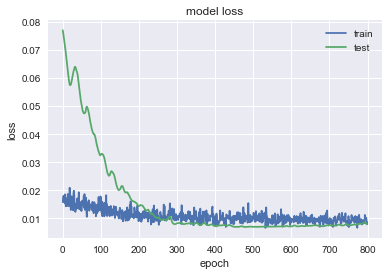

                 T
MSE         2.8906
MAE         1.2529
R2        0.382568
MAPE (%)   3.78072


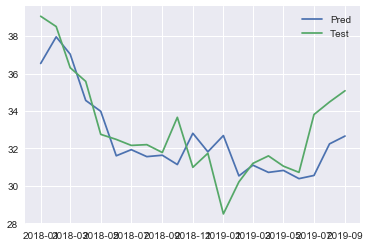

Predicting for  BBY
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1130 - val_loss: 0.6174
Epoch 2/1000
0s - loss: 0.0938 - val_loss: 0.5614
Epoch 3/1000
0s - loss: 0.0803 - val_loss: 0.5100
Epoch 4/1000
0s - loss: 0.0656 - val_loss: 0.4630
Epoch 5/1000
0s - loss: 0.0565 - val_loss: 0.4196
Epoch 6/1000
0s - loss: 0.0477 - val_loss: 0.3799
Epoch 7/1000
0s - loss: 0.0415 - val_loss: 0.3433
Epoch 8/1000
0s - loss: 0.0333 - val_loss: 0.3101
Epoch 9/1000
0s - loss: 0.0284 - val_loss: 0.2802
Epoch 10/1000
0s - loss: 0.0272 - val_loss: 0.2535
Epoch 11/1000
0s - loss: 0.0246 - val_loss: 0.2303
Epoch 12/1000
0s - loss: 0.0274 - val_loss: 0.2100
Epoch 13/1000
0s - loss: 0.0245 - val_loss: 0.1928
Epoch 14/1000
0s - loss: 0.0250 - val_loss: 0.1781
Epoch 15/1000
0s - loss: 0.0227 - val_loss: 0.1660
Epoch 16/1000
0s - loss: 0.0261 - val_loss: 0.1563
Epoch 17/1000
0s - loss: 0.0225 - val_loss: 0.1487
Epoch 18/1000
0s - loss: 0.0222 - val_loss: 0.1432
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0051 - val_loss: 0.0098
Epoch 180/1000
0s - loss: 0.0065 - val_loss: 0.0098
Epoch 181/1000
0s - loss: 0.0051 - val_loss: 0.0098
Epoch 182/1000
0s - loss: 0.0057 - val_loss: 0.0098
Epoch 183/1000
0s - loss: 0.0056 - val_loss: 0.0097
Epoch 184/1000
0s - loss: 0.0065 - val_loss: 0.0095
Epoch 185/1000
0s - loss: 0.0056 - val_loss: 0.0094
Epoch 186/1000
0s - loss: 0.0058 - val_loss: 0.0093
Epoch 187/1000
0s - loss: 0.0055 - val_loss: 0.0093
Epoch 188/1000
0s - loss: 0.0050 - val_loss: 0.0093
Epoch 189/1000
0s - loss: 0.0049 - val_loss: 0.0094
Epoch 190/1000
0s - loss: 0.0062 - val_loss: 0.0095
Epoch 191/1000
0s - loss: 0.0048 - val_loss: 0.0097
Epoch 192/1000
0s - loss: 0.0050 - val_loss: 0.0098
Epoch 193/1000
0s - loss: 0.0053 - val_loss: 0.0099
Epoch 194/1000
0s - loss: 0.0047 - val_loss: 0.0100
Epoch 195/1000
0s - loss: 0.0046 - val_loss: 0.0100
Epoch 196/1000
0s - loss: 0.0052 - val_loss: 0.0101
Epoch 197/1000
0s - loss: 0.0061 - val_loss: 0.0101
Epoch 198/1000
0s - loss: 0

0s - loss: 0.0052 - val_loss: 0.0088
Epoch 361/1000
0s - loss: 0.0040 - val_loss: 0.0088
Epoch 362/1000
0s - loss: 0.0049 - val_loss: 0.0088
Epoch 363/1000
0s - loss: 0.0057 - val_loss: 0.0088
Epoch 364/1000
0s - loss: 0.0056 - val_loss: 0.0089
Epoch 365/1000
0s - loss: 0.0052 - val_loss: 0.0090
Epoch 366/1000
0s - loss: 0.0048 - val_loss: 0.0091
Epoch 367/1000
0s - loss: 0.0045 - val_loss: 0.0094
Epoch 368/1000
0s - loss: 0.0045 - val_loss: 0.0096
Epoch 369/1000
0s - loss: 0.0052 - val_loss: 0.0097
Epoch 370/1000
0s - loss: 0.0051 - val_loss: 0.0099
Epoch 371/1000
0s - loss: 0.0056 - val_loss: 0.0099
Epoch 372/1000
0s - loss: 0.0040 - val_loss: 0.0100
Epoch 373/1000
0s - loss: 0.0050 - val_loss: 0.0100
Epoch 374/1000
0s - loss: 0.0051 - val_loss: 0.0098
Epoch 375/1000
0s - loss: 0.0048 - val_loss: 0.0097
Epoch 376/1000
0s - loss: 0.0045 - val_loss: 0.0095
Epoch 377/1000
0s - loss: 0.0054 - val_loss: 0.0093
Epoch 378/1000
0s - loss: 0.0054 - val_loss: 0.0092
Epoch 379/1000
0s - loss: 0

0s - loss: 0.0045 - val_loss: 0.0104
Epoch 543/1000
0s - loss: 0.0050 - val_loss: 0.0101
Epoch 544/1000
0s - loss: 0.0048 - val_loss: 0.0099
Epoch 545/1000
0s - loss: 0.0048 - val_loss: 0.0097
Epoch 546/1000
0s - loss: 0.0041 - val_loss: 0.0095
Epoch 547/1000
0s - loss: 0.0038 - val_loss: 0.0095
Epoch 548/1000
0s - loss: 0.0053 - val_loss: 0.0095
Epoch 549/1000
0s - loss: 0.0040 - val_loss: 0.0097
Epoch 550/1000
0s - loss: 0.0042 - val_loss: 0.0098
Epoch 551/1000
0s - loss: 0.0044 - val_loss: 0.0100
Epoch 552/1000
0s - loss: 0.0038 - val_loss: 0.0101
Epoch 553/1000
0s - loss: 0.0042 - val_loss: 0.0102
Epoch 554/1000
0s - loss: 0.0050 - val_loss: 0.0104
Epoch 555/1000
0s - loss: 0.0040 - val_loss: 0.0106
Epoch 556/1000
0s - loss: 0.0029 - val_loss: 0.0108
Epoch 557/1000
0s - loss: 0.0045 - val_loss: 0.0109
Epoch 558/1000
0s - loss: 0.0042 - val_loss: 0.0108
Epoch 559/1000
0s - loss: 0.0051 - val_loss: 0.0107
Epoch 560/1000
0s - loss: 0.0047 - val_loss: 0.0104
Epoch 561/1000
0s - loss: 0

0s - loss: 0.0049 - val_loss: 0.0130
Epoch 713/1000
0s - loss: 0.0042 - val_loss: 0.0128
Epoch 714/1000
0s - loss: 0.0051 - val_loss: 0.0126
Epoch 715/1000
0s - loss: 0.0048 - val_loss: 0.0123
Epoch 716/1000
0s - loss: 0.0043 - val_loss: 0.0121
Epoch 717/1000
0s - loss: 0.0035 - val_loss: 0.0120
Epoch 718/1000
0s - loss: 0.0031 - val_loss: 0.0119
Epoch 719/1000
0s - loss: 0.0036 - val_loss: 0.0117
Epoch 720/1000
0s - loss: 0.0048 - val_loss: 0.0117
Epoch 721/1000
0s - loss: 0.0037 - val_loss: 0.0118
Epoch 722/1000
0s - loss: 0.0041 - val_loss: 0.0120
Epoch 723/1000
0s - loss: 0.0040 - val_loss: 0.0122
Epoch 724/1000
0s - loss: 0.0034 - val_loss: 0.0124
Epoch 725/1000
0s - loss: 0.0034 - val_loss: 0.0127
Epoch 726/1000
0s - loss: 0.0037 - val_loss: 0.0129
Epoch 727/1000
0s - loss: 0.0045 - val_loss: 0.0131
Epoch 728/1000
0s - loss: 0.0046 - val_loss: 0.0132
Epoch 729/1000
0s - loss: 0.0040 - val_loss: 0.0132
Epoch 730/1000
0s - loss: 0.0039 - val_loss: 0.0131
Epoch 731/1000
0s - loss: 0

0s - loss: 0.0028 - val_loss: 0.0132
Epoch 878/1000
0s - loss: 0.0033 - val_loss: 0.0134
Epoch 879/1000
0s - loss: 0.0038 - val_loss: 0.0135
Epoch 880/1000
0s - loss: 0.0033 - val_loss: 0.0136
Epoch 881/1000
0s - loss: 0.0049 - val_loss: 0.0136
Epoch 882/1000
0s - loss: 0.0036 - val_loss: 0.0135
Epoch 883/1000
0s - loss: 0.0030 - val_loss: 0.0135
Epoch 884/1000
0s - loss: 0.0040 - val_loss: 0.0137
Epoch 885/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 886/1000
0s - loss: 0.0038 - val_loss: 0.0139
Epoch 887/1000
0s - loss: 0.0039 - val_loss: 0.0139
Epoch 888/1000
0s - loss: 0.0041 - val_loss: 0.0139
Epoch 889/1000
0s - loss: 0.0031 - val_loss: 0.0139
Epoch 890/1000
0s - loss: 0.0041 - val_loss: 0.0139
Epoch 891/1000
0s - loss: 0.0043 - val_loss: 0.0141
Epoch 892/1000
0s - loss: 0.0033 - val_loss: 0.0143
Epoch 893/1000
0s - loss: 0.0038 - val_loss: 0.0143
Epoch 894/1000
0s - loss: 0.0050 - val_loss: 0.0143
Epoch 895/1000
0s - loss: 0.0037 - val_loss: 0.0143
Epoch 896/1000
0s - loss: 0

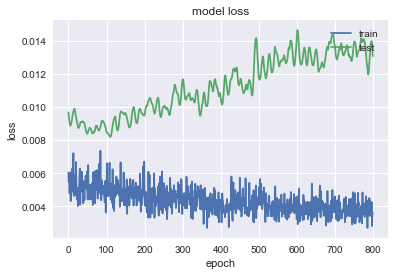

              BBY
MSE       59.4228
MAE       6.83316
R2       -1.44499
MAPE (%)  9.69956


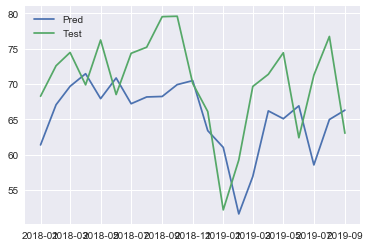

Predicting for  KO
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1998 - val_loss: 0.3858
Epoch 2/1000
0s - loss: 0.1684 - val_loss: 0.3362
Epoch 3/1000
0s - loss: 0.1480 - val_loss: 0.2913
Epoch 4/1000
0s - loss: 0.1196 - val_loss: 0.2509
Epoch 5/1000
0s - loss: 0.1008 - val_loss: 0.2144
Epoch 6/1000
0s - loss: 0.0869 - val_loss: 0.1815
Epoch 7/1000
0s - loss: 0.0725 - val_loss: 0.1520
Epoch 8/1000
0s - loss: 0.0556 - val_loss: 0.1257
Epoch 9/1000
0s - loss: 0.0466 - val_loss: 0.1028
Epoch 10/1000
0s - loss: 0.0369 - val_loss: 0.0830
Epoch 11/1000
0s - loss: 0.0278 - val_loss: 0.0662
Epoch 12/1000
0s - loss: 0.0226 - val_loss: 0.0524
Epoch 13/1000
0s - loss: 0.0165 - val_loss: 0.0413
Epoch 14/1000
0s - loss: 0.0140 - val_loss: 0.0328
Epoch 15/1000
0s - loss: 0.0145 - val_loss: 0.0264
Epoch 16/1000
0s - loss: 0.0139 - val_loss: 0.0218
Epoch 17/1000
0s - loss: 0.0126 - val_loss: 0.0189
Epoch 18/1000
0s - loss: 0.0134 - val_loss: 0.0172
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0065 - val_loss: 0.0176
Epoch 169/1000
0s - loss: 0.0085 - val_loss: 0.0175
Epoch 170/1000
0s - loss: 0.0078 - val_loss: 0.0175
Epoch 171/1000
0s - loss: 0.0063 - val_loss: 0.0175
Epoch 172/1000
0s - loss: 0.0088 - val_loss: 0.0175
Epoch 173/1000
0s - loss: 0.0096 - val_loss: 0.0175
Epoch 174/1000
0s - loss: 0.0079 - val_loss: 0.0175
Epoch 175/1000
0s - loss: 0.0071 - val_loss: 0.0176
Epoch 176/1000
0s - loss: 0.0070 - val_loss: 0.0176
Epoch 177/1000
0s - loss: 0.0089 - val_loss: 0.0176
Epoch 178/1000
0s - loss: 0.0083 - val_loss: 0.0176
Epoch 179/1000
0s - loss: 0.0076 - val_loss: 0.0176
Epoch 180/1000
0s - loss: 0.0075 - val_loss: 0.0176
Epoch 181/1000
0s - loss: 0.0071 - val_loss: 0.0176
Epoch 182/1000
0s - loss: 0.0079 - val_loss: 0.0176
Epoch 183/1000
0s - loss: 0.0069 - val_loss: 0.0176
Epoch 184/1000
0s - loss: 0.0094 - val_loss: 0.0176
Epoch 185/1000
0s - loss: 0.0080 - val_loss: 0.0175
Epoch 186/1000
0s - loss: 0.0094 - val_loss: 0.0175
Epoch 187/1000
0s - loss: 0

0s - loss: 0.0078 - val_loss: 0.0224
Epoch 335/1000
0s - loss: 0.0061 - val_loss: 0.0223
Epoch 336/1000
0s - loss: 0.0059 - val_loss: 0.0222
Epoch 337/1000
0s - loss: 0.0065 - val_loss: 0.0221
Epoch 338/1000
0s - loss: 0.0045 - val_loss: 0.0221
Epoch 339/1000
0s - loss: 0.0060 - val_loss: 0.0220
Epoch 340/1000
0s - loss: 0.0053 - val_loss: 0.0220
Epoch 341/1000
0s - loss: 0.0063 - val_loss: 0.0221
Epoch 342/1000
0s - loss: 0.0060 - val_loss: 0.0222
Epoch 343/1000
0s - loss: 0.0061 - val_loss: 0.0224
Epoch 344/1000
0s - loss: 0.0056 - val_loss: 0.0225
Epoch 345/1000
0s - loss: 0.0076 - val_loss: 0.0227
Epoch 346/1000
0s - loss: 0.0065 - val_loss: 0.0228
Epoch 347/1000
0s - loss: 0.0062 - val_loss: 0.0229
Epoch 348/1000
0s - loss: 0.0063 - val_loss: 0.0230
Epoch 349/1000
0s - loss: 0.0061 - val_loss: 0.0231
Epoch 350/1000
0s - loss: 0.0058 - val_loss: 0.0231
Epoch 351/1000
0s - loss: 0.0079 - val_loss: 0.0230
Epoch 352/1000
0s - loss: 0.0070 - val_loss: 0.0229
Epoch 353/1000
0s - loss: 0

0s - loss: 0.0053 - val_loss: 0.0236
Epoch 504/1000
0s - loss: 0.0062 - val_loss: 0.0233
Epoch 505/1000
0s - loss: 0.0053 - val_loss: 0.0231
Epoch 506/1000
0s - loss: 0.0051 - val_loss: 0.0229
Epoch 507/1000
0s - loss: 0.0046 - val_loss: 0.0227
Epoch 508/1000
0s - loss: 0.0052 - val_loss: 0.0227
Epoch 509/1000
0s - loss: 0.0053 - val_loss: 0.0227
Epoch 510/1000
0s - loss: 0.0055 - val_loss: 0.0226
Epoch 511/1000
0s - loss: 0.0056 - val_loss: 0.0226
Epoch 512/1000
0s - loss: 0.0052 - val_loss: 0.0227
Epoch 513/1000
0s - loss: 0.0061 - val_loss: 0.0228
Epoch 514/1000
0s - loss: 0.0063 - val_loss: 0.0229
Epoch 515/1000
0s - loss: 0.0063 - val_loss: 0.0230
Epoch 516/1000
0s - loss: 0.0069 - val_loss: 0.0231
Epoch 517/1000
0s - loss: 0.0052 - val_loss: 0.0232
Epoch 518/1000
0s - loss: 0.0050 - val_loss: 0.0233
Epoch 519/1000
0s - loss: 0.0044 - val_loss: 0.0235
Epoch 520/1000
0s - loss: 0.0042 - val_loss: 0.0237
Epoch 521/1000
0s - loss: 0.0050 - val_loss: 0.0238
Epoch 522/1000
0s - loss: 0

0s - loss: 0.0057 - val_loss: 0.0211
Epoch 683/1000
0s - loss: 0.0048 - val_loss: 0.0209
Epoch 684/1000
0s - loss: 0.0041 - val_loss: 0.0206
Epoch 685/1000
0s - loss: 0.0042 - val_loss: 0.0204
Epoch 686/1000
0s - loss: 0.0059 - val_loss: 0.0200
Epoch 687/1000
0s - loss: 0.0053 - val_loss: 0.0198
Epoch 688/1000
0s - loss: 0.0059 - val_loss: 0.0196
Epoch 689/1000
0s - loss: 0.0055 - val_loss: 0.0195
Epoch 690/1000
0s - loss: 0.0043 - val_loss: 0.0196
Epoch 691/1000
0s - loss: 0.0049 - val_loss: 0.0197
Epoch 692/1000
0s - loss: 0.0053 - val_loss: 0.0199
Epoch 693/1000
0s - loss: 0.0045 - val_loss: 0.0201
Epoch 694/1000
0s - loss: 0.0053 - val_loss: 0.0202
Epoch 695/1000
0s - loss: 0.0041 - val_loss: 0.0201
Epoch 696/1000
0s - loss: 0.0044 - val_loss: 0.0200
Epoch 697/1000
0s - loss: 0.0046 - val_loss: 0.0200
Epoch 698/1000
0s - loss: 0.0046 - val_loss: 0.0201
Epoch 699/1000
0s - loss: 0.0046 - val_loss: 0.0202
Epoch 700/1000
0s - loss: 0.0052 - val_loss: 0.0207
Epoch 701/1000
0s - loss: 0

0s - loss: 0.0048 - val_loss: 0.0177
Epoch 868/1000
0s - loss: 0.0043 - val_loss: 0.0177
Epoch 869/1000
0s - loss: 0.0044 - val_loss: 0.0177
Epoch 870/1000
0s - loss: 0.0045 - val_loss: 0.0177
Epoch 871/1000
0s - loss: 0.0053 - val_loss: 0.0177
Epoch 872/1000
0s - loss: 0.0049 - val_loss: 0.0178
Epoch 873/1000
0s - loss: 0.0055 - val_loss: 0.0179
Epoch 874/1000
0s - loss: 0.0055 - val_loss: 0.0179
Epoch 875/1000
0s - loss: 0.0045 - val_loss: 0.0179
Epoch 876/1000
0s - loss: 0.0057 - val_loss: 0.0179
Epoch 877/1000
0s - loss: 0.0043 - val_loss: 0.0179
Epoch 878/1000
0s - loss: 0.0041 - val_loss: 0.0180
Epoch 879/1000
0s - loss: 0.0041 - val_loss: 0.0182
Epoch 880/1000
0s - loss: 0.0055 - val_loss: 0.0184
Epoch 881/1000
0s - loss: 0.0052 - val_loss: 0.0185
Epoch 882/1000
0s - loss: 0.0040 - val_loss: 0.0186
Epoch 883/1000
0s - loss: 0.0041 - val_loss: 0.0188
Epoch 884/1000
0s - loss: 0.0042 - val_loss: 0.0187
Epoch 885/1000
0s - loss: 0.0044 - val_loss: 0.0185
Epoch 886/1000
0s - loss: 0

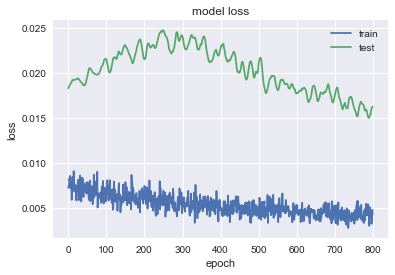

               KO
MSE       14.4823
MAE       2.80627
R2       -11.1788
MAPE (%)  5.66828


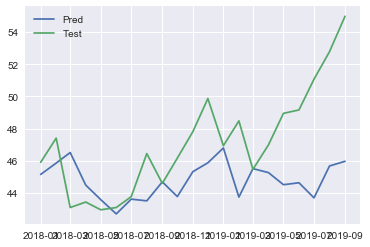

Predicting for  FTI
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2431 - val_loss: 0.0101
Epoch 2/1000
0s - loss: 0.2113 - val_loss: 0.0159
Epoch 3/1000
0s - loss: 0.1866 - val_loss: 0.0242
Epoch 4/1000
0s - loss: 0.1625 - val_loss: 0.0347
Epoch 5/1000
0s - loss: 0.1474 - val_loss: 0.0469
Epoch 6/1000
0s - loss: 0.1316 - val_loss: 0.0607
Epoch 7/1000
0s - loss: 0.1175 - val_loss: 0.0757
Epoch 8/1000
0s - loss: 0.1042 - val_loss: 0.0914
Epoch 9/1000
0s - loss: 0.0900 - val_loss: 0.1075
Epoch 10/1000
0s - loss: 0.0912 - val_loss: 0.1236
Epoch 11/1000
0s - loss: 0.0885 - val_loss: 0.1392
Epoch 12/1000
0s - loss: 0.0777 - val_loss: 0.1534
Epoch 13/1000
0s - loss: 0.0777 - val_loss: 0.1666
Epoch 14/1000
0s - loss: 0.0750 - val_loss: 0.1780
Epoch 15/1000
0s - loss: 0.0685 - val_loss: 0.1871
Epoch 16/1000
0s - loss: 0.0683 - val_loss: 0.1939
Epoch 17/1000
0s - loss: 0.0746 - val_loss: 0.1982
Epoch 18/1000
0s - loss: 0.0648 - val_loss: 0.2002
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0142 - val_loss: 0.0055
Epoch 176/1000
0s - loss: 0.0150 - val_loss: 0.0054
Epoch 177/1000
0s - loss: 0.0116 - val_loss: 0.0054
Epoch 178/1000
0s - loss: 0.0121 - val_loss: 0.0053
Epoch 179/1000
0s - loss: 0.0128 - val_loss: 0.0053
Epoch 180/1000
0s - loss: 0.0138 - val_loss: 0.0053
Epoch 181/1000
0s - loss: 0.0141 - val_loss: 0.0052
Epoch 182/1000
0s - loss: 0.0137 - val_loss: 0.0052
Epoch 183/1000
0s - loss: 0.0113 - val_loss: 0.0052
Epoch 184/1000
0s - loss: 0.0139 - val_loss: 0.0052
Epoch 185/1000
0s - loss: 0.0165 - val_loss: 0.0052
Epoch 186/1000
0s - loss: 0.0122 - val_loss: 0.0052
Epoch 187/1000
0s - loss: 0.0129 - val_loss: 0.0053
Epoch 188/1000
0s - loss: 0.0169 - val_loss: 0.0053
Epoch 189/1000
0s - loss: 0.0117 - val_loss: 0.0054
Epoch 190/1000
0s - loss: 0.0150 - val_loss: 0.0054
Epoch 191/1000
0s - loss: 0.0121 - val_loss: 0.0054
Epoch 192/1000
0s - loss: 0.0124 - val_loss: 0.0055
Epoch 193/1000
0s - loss: 0.0133 - val_loss: 0.0055
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0129 - val_loss: 0.0065
Epoch 351/1000
0s - loss: 0.0101 - val_loss: 0.0065
Epoch 352/1000
0s - loss: 0.0104 - val_loss: 0.0066
Epoch 353/1000
0s - loss: 0.0133 - val_loss: 0.0067
Epoch 354/1000
0s - loss: 0.0126 - val_loss: 0.0068
Epoch 355/1000
0s - loss: 0.0113 - val_loss: 0.0068
Epoch 356/1000
0s - loss: 0.0095 - val_loss: 0.0069
Epoch 357/1000
0s - loss: 0.0103 - val_loss: 0.0071
Epoch 358/1000
0s - loss: 0.0094 - val_loss: 0.0072
Epoch 359/1000
0s - loss: 0.0098 - val_loss: 0.0073
Epoch 360/1000
0s - loss: 0.0095 - val_loss: 0.0073
Epoch 361/1000
0s - loss: 0.0110 - val_loss: 0.0074
Epoch 362/1000
0s - loss: 0.0094 - val_loss: 0.0073
Epoch 363/1000
0s - loss: 0.0111 - val_loss: 0.0073
Epoch 364/1000
0s - loss: 0.0124 - val_loss: 0.0074
Epoch 365/1000
0s - loss: 0.0118 - val_loss: 0.0075
Epoch 366/1000
0s - loss: 0.0131 - val_loss: 0.0076
Epoch 367/1000
0s - loss: 0.0120 - val_loss: 0.0076
Epoch 368/1000
0s - loss: 0.0118 - val_loss: 0.0076
Epoch 369/1000
0s - loss: 0

0s - loss: 0.0089 - val_loss: 0.0067
Epoch 522/1000
0s - loss: 0.0112 - val_loss: 0.0065
Epoch 523/1000
0s - loss: 0.0093 - val_loss: 0.0063
Epoch 524/1000
0s - loss: 0.0084 - val_loss: 0.0062
Epoch 525/1000
0s - loss: 0.0140 - val_loss: 0.0061
Epoch 526/1000
0s - loss: 0.0075 - val_loss: 0.0061
Epoch 527/1000
0s - loss: 0.0094 - val_loss: 0.0061
Epoch 528/1000
0s - loss: 0.0084 - val_loss: 0.0061
Epoch 529/1000
0s - loss: 0.0088 - val_loss: 0.0061
Epoch 530/1000
0s - loss: 0.0110 - val_loss: 0.0062
Epoch 531/1000
0s - loss: 0.0104 - val_loss: 0.0064
Epoch 532/1000
0s - loss: 0.0085 - val_loss: 0.0066
Epoch 533/1000
0s - loss: 0.0090 - val_loss: 0.0067
Epoch 534/1000
0s - loss: 0.0114 - val_loss: 0.0069
Epoch 535/1000
0s - loss: 0.0104 - val_loss: 0.0070
Epoch 536/1000
0s - loss: 0.0118 - val_loss: 0.0072
Epoch 537/1000
0s - loss: 0.0092 - val_loss: 0.0072
Epoch 538/1000
0s - loss: 0.0109 - val_loss: 0.0071
Epoch 539/1000
0s - loss: 0.0096 - val_loss: 0.0070
Epoch 540/1000
0s - loss: 0

0s - loss: 0.0094 - val_loss: 0.0049
Epoch 690/1000
0s - loss: 0.0094 - val_loss: 0.0051
Epoch 691/1000
0s - loss: 0.0098 - val_loss: 0.0053
Epoch 692/1000
0s - loss: 0.0074 - val_loss: 0.0054
Epoch 693/1000
0s - loss: 0.0122 - val_loss: 0.0056
Epoch 694/1000
0s - loss: 0.0119 - val_loss: 0.0056
Epoch 695/1000
0s - loss: 0.0093 - val_loss: 0.0057
Epoch 696/1000
0s - loss: 0.0120 - val_loss: 0.0057
Epoch 697/1000
0s - loss: 0.0087 - val_loss: 0.0056
Epoch 698/1000
0s - loss: 0.0093 - val_loss: 0.0056
Epoch 699/1000
0s - loss: 0.0087 - val_loss: 0.0057
Epoch 700/1000
0s - loss: 0.0098 - val_loss: 0.0057
Epoch 701/1000
0s - loss: 0.0090 - val_loss: 0.0057
Epoch 702/1000
0s - loss: 0.0123 - val_loss: 0.0057
Epoch 703/1000
0s - loss: 0.0109 - val_loss: 0.0059
Epoch 704/1000
0s - loss: 0.0090 - val_loss: 0.0059
Epoch 705/1000
0s - loss: 0.0098 - val_loss: 0.0059
Epoch 706/1000
0s - loss: 0.0090 - val_loss: 0.0058
Epoch 707/1000
0s - loss: 0.0110 - val_loss: 0.0056
Epoch 708/1000
0s - loss: 0

0s - loss: 0.0107 - val_loss: 0.0049
Epoch 860/1000
0s - loss: 0.0089 - val_loss: 0.0048
Epoch 861/1000
0s - loss: 0.0083 - val_loss: 0.0047
Epoch 862/1000
0s - loss: 0.0088 - val_loss: 0.0047
Epoch 863/1000
0s - loss: 0.0101 - val_loss: 0.0046
Epoch 864/1000
0s - loss: 0.0098 - val_loss: 0.0045
Epoch 865/1000
0s - loss: 0.0107 - val_loss: 0.0044
Epoch 866/1000
0s - loss: 0.0088 - val_loss: 0.0043
Epoch 867/1000
0s - loss: 0.0098 - val_loss: 0.0043
Epoch 868/1000
0s - loss: 0.0099 - val_loss: 0.0043
Epoch 869/1000
0s - loss: 0.0107 - val_loss: 0.0043
Epoch 870/1000
0s - loss: 0.0108 - val_loss: 0.0044
Epoch 871/1000
0s - loss: 0.0094 - val_loss: 0.0044
Epoch 872/1000
0s - loss: 0.0074 - val_loss: 0.0046
Epoch 873/1000
0s - loss: 0.0115 - val_loss: 0.0046
Epoch 874/1000
0s - loss: 0.0082 - val_loss: 0.0047
Epoch 875/1000
0s - loss: 0.0102 - val_loss: 0.0047
Epoch 876/1000
0s - loss: 0.0081 - val_loss: 0.0047
Epoch 877/1000
0s - loss: 0.0086 - val_loss: 0.0047
Epoch 878/1000
0s - loss: 0

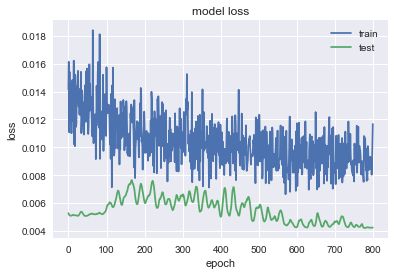

               FTI
MSE        7.76074
MAE        2.33485
R2        0.147326
MAPE (%)   9.08133


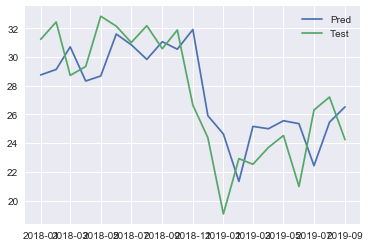

Predicting for  BLK
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1785 - val_loss: 0.5379
Epoch 2/1000
0s - loss: 0.1505 - val_loss: 0.4738
Epoch 3/1000
0s - loss: 0.1220 - val_loss: 0.4166
Epoch 4/1000
0s - loss: 0.0996 - val_loss: 0.3654
Epoch 5/1000
0s - loss: 0.0784 - val_loss: 0.3198
Epoch 6/1000
0s - loss: 0.0686 - val_loss: 0.2788
Epoch 7/1000
0s - loss: 0.0564 - val_loss: 0.2424
Epoch 8/1000
0s - loss: 0.0444 - val_loss: 0.2100
Epoch 9/1000
0s - loss: 0.0334 - val_loss: 0.1814
Epoch 10/1000
0s - loss: 0.0323 - val_loss: 0.1564
Epoch 11/1000
0s - loss: 0.0225 - val_loss: 0.1347
Epoch 12/1000
0s - loss: 0.0209 - val_loss: 0.1162
Epoch 13/1000
0s - loss: 0.0183 - val_loss: 0.1004
Epoch 14/1000
0s - loss: 0.0216 - val_loss: 0.0873
Epoch 15/1000
0s - loss: 0.0197 - val_loss: 0.0765
Epoch 16/1000
0s - loss: 0.0213 - val_loss: 0.0677
Epoch 17/1000
0s - loss: 0.0218 - val_loss: 0.0606
Epoch 18/1000
0s - loss: 0.0221 - val_loss: 0.0552
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0053 - val_loss: 0.0119
Epoch 181/1000
0s - loss: 0.0052 - val_loss: 0.0118
Epoch 182/1000
0s - loss: 0.0059 - val_loss: 0.0118
Epoch 183/1000
0s - loss: 0.0065 - val_loss: 0.0118
Epoch 184/1000
0s - loss: 0.0060 - val_loss: 0.0117
Epoch 185/1000
0s - loss: 0.0056 - val_loss: 0.0117
Epoch 186/1000
0s - loss: 0.0065 - val_loss: 0.0117
Epoch 187/1000
0s - loss: 0.0051 - val_loss: 0.0116
Epoch 188/1000
0s - loss: 0.0061 - val_loss: 0.0116
Epoch 189/1000
0s - loss: 0.0061 - val_loss: 0.0116
Epoch 190/1000
0s - loss: 0.0046 - val_loss: 0.0116
Epoch 191/1000
0s - loss: 0.0077 - val_loss: 0.0116
Epoch 192/1000
0s - loss: 0.0072 - val_loss: 0.0115
Epoch 193/1000
0s - loss: 0.0068 - val_loss: 0.0115
Epoch 194/1000
0s - loss: 0.0054 - val_loss: 0.0115
Epoch 195/1000
0s - loss: 0.0061 - val_loss: 0.0114
Epoch 196/1000
0s - loss: 0.0060 - val_loss: 0.0114
Epoch 197/1000
0s - loss: 0.0071 - val_loss: 0.0114
Epoch 198/1000
0s - loss: 0.0059 - val_loss: 0.0113
Epoch 199/1000
0s - loss: 0

0s - loss: 0.0056 - val_loss: 0.0105
Epoch 360/1000
0s - loss: 0.0050 - val_loss: 0.0105
Epoch 361/1000
0s - loss: 0.0051 - val_loss: 0.0106
Epoch 362/1000
0s - loss: 0.0051 - val_loss: 0.0107
Epoch 363/1000
0s - loss: 0.0045 - val_loss: 0.0107
Epoch 364/1000
0s - loss: 0.0046 - val_loss: 0.0108
Epoch 365/1000
0s - loss: 0.0052 - val_loss: 0.0109
Epoch 366/1000
0s - loss: 0.0043 - val_loss: 0.0109
Epoch 367/1000
0s - loss: 0.0056 - val_loss: 0.0110
Epoch 368/1000
0s - loss: 0.0046 - val_loss: 0.0110
Epoch 369/1000
0s - loss: 0.0050 - val_loss: 0.0111
Epoch 370/1000
0s - loss: 0.0040 - val_loss: 0.0111
Epoch 371/1000
0s - loss: 0.0043 - val_loss: 0.0111
Epoch 372/1000
0s - loss: 0.0039 - val_loss: 0.0111
Epoch 373/1000
0s - loss: 0.0055 - val_loss: 0.0111
Epoch 374/1000
0s - loss: 0.0054 - val_loss: 0.0111
Epoch 375/1000
0s - loss: 0.0065 - val_loss: 0.0111
Epoch 376/1000
0s - loss: 0.0048 - val_loss: 0.0110
Epoch 377/1000
0s - loss: 0.0044 - val_loss: 0.0109
Epoch 378/1000
0s - loss: 0

0s - loss: 0.0039 - val_loss: 0.0100
Epoch 540/1000
0s - loss: 0.0040 - val_loss: 0.0100
Epoch 541/1000
0s - loss: 0.0044 - val_loss: 0.0100
Epoch 542/1000
0s - loss: 0.0043 - val_loss: 0.0100
Epoch 543/1000
0s - loss: 0.0042 - val_loss: 0.0100
Epoch 544/1000
0s - loss: 0.0031 - val_loss: 0.0101
Epoch 545/1000
0s - loss: 0.0045 - val_loss: 0.0101
Epoch 546/1000
0s - loss: 0.0040 - val_loss: 0.0101
Epoch 547/1000
0s - loss: 0.0047 - val_loss: 0.0101
Epoch 548/1000
0s - loss: 0.0044 - val_loss: 0.0100
Epoch 549/1000
0s - loss: 0.0041 - val_loss: 0.0100
Epoch 550/1000
0s - loss: 0.0044 - val_loss: 0.0100
Epoch 551/1000
0s - loss: 0.0037 - val_loss: 0.0099
Epoch 552/1000
0s - loss: 0.0052 - val_loss: 0.0099
Epoch 553/1000
0s - loss: 0.0058 - val_loss: 0.0099
Epoch 554/1000
0s - loss: 0.0056 - val_loss: 0.0099
Epoch 555/1000
0s - loss: 0.0046 - val_loss: 0.0099
Epoch 556/1000
0s - loss: 0.0048 - val_loss: 0.0099
Epoch 557/1000
0s - loss: 0.0045 - val_loss: 0.0099
Epoch 558/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0097
Epoch 722/1000
0s - loss: 0.0046 - val_loss: 0.0097
Epoch 723/1000
0s - loss: 0.0038 - val_loss: 0.0096
Epoch 724/1000
0s - loss: 0.0041 - val_loss: 0.0096
Epoch 725/1000
0s - loss: 0.0041 - val_loss: 0.0096
Epoch 726/1000
0s - loss: 0.0047 - val_loss: 0.0097
Epoch 727/1000
0s - loss: 0.0028 - val_loss: 0.0097
Epoch 728/1000
0s - loss: 0.0045 - val_loss: 0.0097
Epoch 729/1000
0s - loss: 0.0038 - val_loss: 0.0097
Epoch 730/1000
0s - loss: 0.0040 - val_loss: 0.0097
Epoch 731/1000
0s - loss: 0.0042 - val_loss: 0.0097
Epoch 732/1000
0s - loss: 0.0045 - val_loss: 0.0097
Epoch 733/1000
0s - loss: 0.0046 - val_loss: 0.0097
Epoch 734/1000
0s - loss: 0.0043 - val_loss: 0.0097
Epoch 735/1000
0s - loss: 0.0040 - val_loss: 0.0097
Epoch 736/1000
0s - loss: 0.0033 - val_loss: 0.0096
Epoch 737/1000
0s - loss: 0.0039 - val_loss: 0.0096
Epoch 738/1000
0s - loss: 0.0044 - val_loss: 0.0096
Epoch 739/1000
0s - loss: 0.0041 - val_loss: 0.0096
Epoch 740/1000
0s - loss: 0

0s - loss: 0.0037 - val_loss: 0.0095
Epoch 904/1000
0s - loss: 0.0038 - val_loss: 0.0095
Epoch 905/1000
0s - loss: 0.0034 - val_loss: 0.0095
Epoch 906/1000
0s - loss: 0.0039 - val_loss: 0.0095
Epoch 907/1000
0s - loss: 0.0046 - val_loss: 0.0095
Epoch 908/1000
0s - loss: 0.0033 - val_loss: 0.0095
Epoch 909/1000
0s - loss: 0.0047 - val_loss: 0.0095
Epoch 910/1000
0s - loss: 0.0034 - val_loss: 0.0095
Epoch 911/1000
0s - loss: 0.0036 - val_loss: 0.0094
Epoch 912/1000
0s - loss: 0.0033 - val_loss: 0.0094
Epoch 913/1000
0s - loss: 0.0038 - val_loss: 0.0094
Epoch 914/1000
0s - loss: 0.0030 - val_loss: 0.0094
Epoch 915/1000
0s - loss: 0.0038 - val_loss: 0.0095
Epoch 916/1000
0s - loss: 0.0040 - val_loss: 0.0095
Epoch 917/1000
0s - loss: 0.0035 - val_loss: 0.0095
Epoch 918/1000
0s - loss: 0.0037 - val_loss: 0.0095
Epoch 919/1000
0s - loss: 0.0036 - val_loss: 0.0095
Epoch 920/1000
0s - loss: 0.0031 - val_loss: 0.0094
Epoch 921/1000
0s - loss: 0.0037 - val_loss: 0.0094
Epoch 922/1000
0s - loss: 0

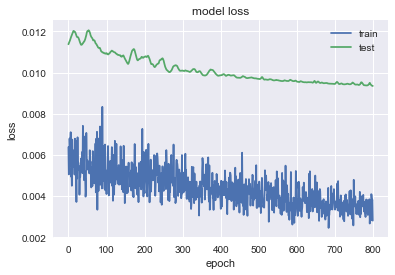

               BLK
MSE        1624.04
MAE        33.0556
R2       -0.787316
MAPE (%)   7.18686


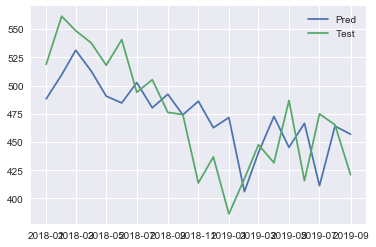

Predicting for  DVA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.2939 - val_loss: 0.3635
Epoch 2/1000
0s - loss: 0.2670 - val_loss: 0.3193
Epoch 3/1000
0s - loss: 0.2400 - val_loss: 0.2790
Epoch 4/1000
0s - loss: 0.2076 - val_loss: 0.2422
Epoch 5/1000
0s - loss: 0.1867 - val_loss: 0.2087
Epoch 6/1000
0s - loss: 0.1643 - val_loss: 0.1780
Epoch 7/1000
0s - loss: 0.1452 - val_loss: 0.1501
Epoch 8/1000
0s - loss: 0.1334 - val_loss: 0.1250
Epoch 9/1000
0s - loss: 0.1122 - val_loss: 0.1024
Epoch 10/1000
0s - loss: 0.1018 - val_loss: 0.0825
Epoch 11/1000
0s - loss: 0.0867 - val_loss: 0.0653
Epoch 12/1000
0s - loss: 0.0770 - val_loss: 0.0507
Epoch 13/1000
0s - loss: 0.0648 - val_loss: 0.0387
Epoch 14/1000
0s - loss: 0.0561 - val_loss: 0.0293
Epoch 15/1000
0s - loss: 0.0544 - val_loss: 0.0224
Epoch 16/1000
0s - loss: 0.0481 - val_loss: 0.0176
Epoch 17/1000
0s - loss: 0.0402 - val_loss: 0.0148
Epoch 18/1000
0s - loss: 0.0428 - val_loss: 0.0137
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0092 - val_loss: 0.0320
Epoch 171/1000
0s - loss: 0.0103 - val_loss: 0.0316
Epoch 172/1000
0s - loss: 0.0119 - val_loss: 0.0312
Epoch 173/1000
0s - loss: 0.0141 - val_loss: 0.0311
Epoch 174/1000
0s - loss: 0.0129 - val_loss: 0.0312
Epoch 175/1000
0s - loss: 0.0105 - val_loss: 0.0315
Epoch 176/1000
0s - loss: 0.0136 - val_loss: 0.0317
Epoch 177/1000
0s - loss: 0.0136 - val_loss: 0.0323
Epoch 178/1000
0s - loss: 0.0121 - val_loss: 0.0327
Epoch 179/1000
0s - loss: 0.0095 - val_loss: 0.0330
Epoch 180/1000
0s - loss: 0.0114 - val_loss: 0.0333
Epoch 181/1000
0s - loss: 0.0119 - val_loss: 0.0333
Epoch 182/1000
0s - loss: 0.0115 - val_loss: 0.0332
Epoch 183/1000
0s - loss: 0.0118 - val_loss: 0.0332
Epoch 184/1000
0s - loss: 0.0116 - val_loss: 0.0329
Epoch 185/1000
0s - loss: 0.0113 - val_loss: 0.0327
Epoch 186/1000
0s - loss: 0.0101 - val_loss: 0.0323
Epoch 187/1000
0s - loss: 0.0105 - val_loss: 0.0320
Epoch 188/1000
0s - loss: 0.0091 - val_loss: 0.0318
Epoch 189/1000
0s - loss: 0

0s - loss: 0.0085 - val_loss: 0.0329
Epoch 342/1000
0s - loss: 0.0075 - val_loss: 0.0332
Epoch 343/1000
0s - loss: 0.0091 - val_loss: 0.0338
Epoch 344/1000
0s - loss: 0.0079 - val_loss: 0.0342
Epoch 345/1000
0s - loss: 0.0078 - val_loss: 0.0346
Epoch 346/1000
0s - loss: 0.0111 - val_loss: 0.0346
Epoch 347/1000
0s - loss: 0.0081 - val_loss: 0.0348
Epoch 348/1000
0s - loss: 0.0063 - val_loss: 0.0349
Epoch 349/1000
0s - loss: 0.0102 - val_loss: 0.0349
Epoch 350/1000
0s - loss: 0.0084 - val_loss: 0.0351
Epoch 351/1000
0s - loss: 0.0072 - val_loss: 0.0350
Epoch 352/1000
0s - loss: 0.0078 - val_loss: 0.0350
Epoch 353/1000
0s - loss: 0.0060 - val_loss: 0.0348
Epoch 354/1000
0s - loss: 0.0090 - val_loss: 0.0348
Epoch 355/1000
0s - loss: 0.0096 - val_loss: 0.0348
Epoch 356/1000
0s - loss: 0.0073 - val_loss: 0.0349
Epoch 357/1000
0s - loss: 0.0100 - val_loss: 0.0352
Epoch 358/1000
0s - loss: 0.0082 - val_loss: 0.0355
Epoch 359/1000
0s - loss: 0.0077 - val_loss: 0.0356
Epoch 360/1000
0s - loss: 0

0s - loss: 0.0087 - val_loss: 0.0381
Epoch 513/1000
0s - loss: 0.0073 - val_loss: 0.0386
Epoch 514/1000
0s - loss: 0.0084 - val_loss: 0.0390
Epoch 515/1000
0s - loss: 0.0085 - val_loss: 0.0398
Epoch 516/1000
0s - loss: 0.0085 - val_loss: 0.0406
Epoch 517/1000
0s - loss: 0.0078 - val_loss: 0.0410
Epoch 518/1000
0s - loss: 0.0095 - val_loss: 0.0408
Epoch 519/1000
0s - loss: 0.0067 - val_loss: 0.0404
Epoch 520/1000
0s - loss: 0.0070 - val_loss: 0.0398
Epoch 521/1000
0s - loss: 0.0085 - val_loss: 0.0389
Epoch 522/1000
0s - loss: 0.0068 - val_loss: 0.0381
Epoch 523/1000
0s - loss: 0.0066 - val_loss: 0.0374
Epoch 524/1000
0s - loss: 0.0082 - val_loss: 0.0370
Epoch 525/1000
0s - loss: 0.0093 - val_loss: 0.0367
Epoch 526/1000
0s - loss: 0.0083 - val_loss: 0.0363
Epoch 527/1000
0s - loss: 0.0077 - val_loss: 0.0357
Epoch 528/1000
0s - loss: 0.0067 - val_loss: 0.0351
Epoch 529/1000
0s - loss: 0.0076 - val_loss: 0.0347
Epoch 530/1000
0s - loss: 0.0077 - val_loss: 0.0347
Epoch 531/1000
0s - loss: 0

0s - loss: 0.0075 - val_loss: 0.0371
Epoch 681/1000
0s - loss: 0.0094 - val_loss: 0.0368
Epoch 682/1000
0s - loss: 0.0064 - val_loss: 0.0362
Epoch 683/1000
0s - loss: 0.0089 - val_loss: 0.0359
Epoch 684/1000
0s - loss: 0.0100 - val_loss: 0.0356
Epoch 685/1000
0s - loss: 0.0062 - val_loss: 0.0354
Epoch 686/1000
0s - loss: 0.0070 - val_loss: 0.0351
Epoch 687/1000
0s - loss: 0.0060 - val_loss: 0.0350
Epoch 688/1000
0s - loss: 0.0081 - val_loss: 0.0352
Epoch 689/1000
0s - loss: 0.0063 - val_loss: 0.0352
Epoch 690/1000
0s - loss: 0.0083 - val_loss: 0.0354
Epoch 691/1000
0s - loss: 0.0081 - val_loss: 0.0359
Epoch 692/1000
0s - loss: 0.0068 - val_loss: 0.0364
Epoch 693/1000
0s - loss: 0.0075 - val_loss: 0.0372
Epoch 694/1000
0s - loss: 0.0059 - val_loss: 0.0377
Epoch 695/1000
0s - loss: 0.0057 - val_loss: 0.0381
Epoch 696/1000
0s - loss: 0.0076 - val_loss: 0.0383
Epoch 697/1000
0s - loss: 0.0065 - val_loss: 0.0385
Epoch 698/1000
0s - loss: 0.0066 - val_loss: 0.0386
Epoch 699/1000
0s - loss: 0

0s - loss: 0.0076 - val_loss: 0.0358
Epoch 846/1000
0s - loss: 0.0052 - val_loss: 0.0353
Epoch 847/1000
0s - loss: 0.0059 - val_loss: 0.0351
Epoch 848/1000
0s - loss: 0.0060 - val_loss: 0.0351
Epoch 849/1000
0s - loss: 0.0077 - val_loss: 0.0354
Epoch 850/1000
0s - loss: 0.0049 - val_loss: 0.0361
Epoch 851/1000
0s - loss: 0.0061 - val_loss: 0.0367
Epoch 852/1000
0s - loss: 0.0071 - val_loss: 0.0369
Epoch 853/1000
0s - loss: 0.0061 - val_loss: 0.0371
Epoch 854/1000
0s - loss: 0.0081 - val_loss: 0.0372
Epoch 855/1000
0s - loss: 0.0051 - val_loss: 0.0370
Epoch 856/1000
0s - loss: 0.0082 - val_loss: 0.0367
Epoch 857/1000
0s - loss: 0.0045 - val_loss: 0.0363
Epoch 858/1000
0s - loss: 0.0054 - val_loss: 0.0358
Epoch 859/1000
0s - loss: 0.0083 - val_loss: 0.0358
Epoch 860/1000
0s - loss: 0.0063 - val_loss: 0.0361
Epoch 861/1000
0s - loss: 0.0076 - val_loss: 0.0362
Epoch 862/1000
0s - loss: 0.0070 - val_loss: 0.0360
Epoch 863/1000
0s - loss: 0.0070 - val_loss: 0.0361
Epoch 864/1000
0s - loss: 0

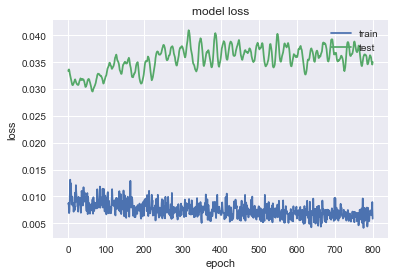

              DVA
MSE       105.399
MAE        8.3071
R2       -3.07329
MAPE (%)  14.4543


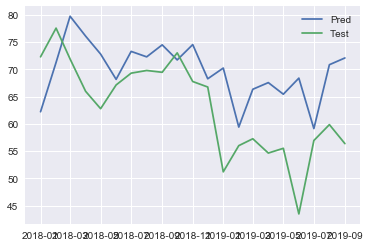

Predicting for  BA
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.0269 - val_loss: 0.4548
Epoch 2/1000
0s - loss: 0.0201 - val_loss: 0.4084
Epoch 3/1000
0s - loss: 0.0151 - val_loss: 0.3689
Epoch 4/1000
0s - loss: 0.0125 - val_loss: 0.3350
Epoch 5/1000
0s - loss: 0.0115 - val_loss: 0.3066
Epoch 6/1000
0s - loss: 0.0093 - val_loss: 0.2829
Epoch 7/1000
0s - loss: 0.0109 - val_loss: 0.2635
Epoch 8/1000
0s - loss: 0.0086 - val_loss: 0.2480
Epoch 9/1000
0s - loss: 0.0098 - val_loss: 0.2358
Epoch 10/1000
0s - loss: 0.0090 - val_loss: 0.2267
Epoch 11/1000
0s - loss: 0.0090 - val_loss: 0.2205
Epoch 12/1000
0s - loss: 0.0082 - val_loss: 0.2165
Epoch 13/1000
0s - loss: 0.0085 - val_loss: 0.2146
Epoch 14/1000
0s - loss: 0.0073 - val_loss: 0.2140
Epoch 15/1000
0s - loss: 0.0079 - val_loss: 0.2144
Epoch 16/1000
0s - loss: 0.0068 - val_loss: 0.2154
Epoch 17/1000
0s - loss: 0.0053 - val_loss: 0.2164
Epoch 18/1000
0s - loss: 0.0056 - val_loss: 0.2174
Epoch 19/1000
0s - loss: 0.0

0s - loss: 0.0018 - val_loss: 0.0891
Epoch 176/1000
0s - loss: 0.0024 - val_loss: 0.0892
Epoch 177/1000
0s - loss: 0.0017 - val_loss: 0.0894
Epoch 178/1000
0s - loss: 0.0016 - val_loss: 0.0896
Epoch 179/1000
0s - loss: 0.0021 - val_loss: 0.0894
Epoch 180/1000
0s - loss: 0.0018 - val_loss: 0.0890
Epoch 181/1000
0s - loss: 0.0021 - val_loss: 0.0886
Epoch 182/1000
0s - loss: 0.0017 - val_loss: 0.0885
Epoch 183/1000
0s - loss: 0.0017 - val_loss: 0.0885
Epoch 184/1000
0s - loss: 0.0021 - val_loss: 0.0881
Epoch 185/1000
0s - loss: 0.0017 - val_loss: 0.0875
Epoch 186/1000
0s - loss: 0.0016 - val_loss: 0.0868
Epoch 187/1000
0s - loss: 0.0015 - val_loss: 0.0859
Epoch 188/1000
0s - loss: 0.0021 - val_loss: 0.0850
Epoch 189/1000
0s - loss: 0.0017 - val_loss: 0.0843
Epoch 190/1000
0s - loss: 0.0016 - val_loss: 0.0838
Epoch 191/1000
0s - loss: 0.0018 - val_loss: 0.0834
Epoch 192/1000
0s - loss: 0.0016 - val_loss: 0.0831
Epoch 193/1000
0s - loss: 0.0019 - val_loss: 0.0829
Epoch 194/1000
0s - loss: 0

0s - loss: 0.0015 - val_loss: 0.0600
Epoch 355/1000
0s - loss: 0.0017 - val_loss: 0.0599
Epoch 356/1000
0s - loss: 0.0017 - val_loss: 0.0598
Epoch 357/1000
0s - loss: 0.0013 - val_loss: 0.0595
Epoch 358/1000
0s - loss: 0.0013 - val_loss: 0.0592
Epoch 359/1000
0s - loss: 0.0016 - val_loss: 0.0590
Epoch 360/1000
0s - loss: 0.0018 - val_loss: 0.0587
Epoch 361/1000
0s - loss: 0.0011 - val_loss: 0.0590
Epoch 362/1000
0s - loss: 0.0018 - val_loss: 0.0592
Epoch 363/1000
0s - loss: 0.0021 - val_loss: 0.0591
Epoch 364/1000
0s - loss: 0.0019 - val_loss: 0.0586
Epoch 365/1000
0s - loss: 0.0012 - val_loss: 0.0580
Epoch 366/1000
0s - loss: 0.0014 - val_loss: 0.0575
Epoch 367/1000
0s - loss: 0.0020 - val_loss: 0.0566
Epoch 368/1000
0s - loss: 0.0018 - val_loss: 0.0561
Epoch 369/1000
0s - loss: 0.0014 - val_loss: 0.0558
Epoch 370/1000
0s - loss: 0.0015 - val_loss: 0.0560
Epoch 371/1000
0s - loss: 0.0014 - val_loss: 0.0563
Epoch 372/1000
0s - loss: 0.0018 - val_loss: 0.0567
Epoch 373/1000
0s - loss: 0

0s - loss: 0.0011 - val_loss: 0.0446
Epoch 537/1000
0s - loss: 9.5243e-04 - val_loss: 0.0449
Epoch 538/1000
0s - loss: 0.0010 - val_loss: 0.0452
Epoch 539/1000
0s - loss: 0.0015 - val_loss: 0.0452
Epoch 540/1000
0s - loss: 0.0014 - val_loss: 0.0449
Epoch 541/1000
0s - loss: 0.0012 - val_loss: 0.0446
Epoch 542/1000
0s - loss: 9.7797e-04 - val_loss: 0.0441
Epoch 543/1000
0s - loss: 0.0011 - val_loss: 0.0439
Epoch 544/1000
0s - loss: 0.0012 - val_loss: 0.0435
Epoch 545/1000
0s - loss: 0.0011 - val_loss: 0.0434
Epoch 546/1000
0s - loss: 0.0011 - val_loss: 0.0432
Epoch 547/1000
0s - loss: 0.0012 - val_loss: 0.0430
Epoch 548/1000
0s - loss: 8.2250e-04 - val_loss: 0.0431
Epoch 549/1000
0s - loss: 0.0014 - val_loss: 0.0427
Epoch 550/1000
0s - loss: 9.4497e-04 - val_loss: 0.0423
Epoch 551/1000
0s - loss: 0.0012 - val_loss: 0.0418
Epoch 552/1000
0s - loss: 0.0012 - val_loss: 0.0416
Epoch 553/1000
0s - loss: 8.4982e-04 - val_loss: 0.0419
Epoch 554/1000
0s - loss: 0.0017 - val_loss: 0.0420
Epoch 5

0s - loss: 0.0011 - val_loss: 0.0322
Epoch 707/1000
0s - loss: 0.0011 - val_loss: 0.0321
Epoch 708/1000
0s - loss: 8.2136e-04 - val_loss: 0.0322
Epoch 709/1000
0s - loss: 9.1608e-04 - val_loss: 0.0318
Epoch 710/1000
0s - loss: 9.9603e-04 - val_loss: 0.0318
Epoch 711/1000
0s - loss: 9.6851e-04 - val_loss: 0.0321
Epoch 712/1000
0s - loss: 0.0012 - val_loss: 0.0323
Epoch 713/1000
0s - loss: 0.0011 - val_loss: 0.0323
Epoch 714/1000
0s - loss: 7.4730e-04 - val_loss: 0.0326
Epoch 715/1000
0s - loss: 0.0010 - val_loss: 0.0328
Epoch 716/1000
0s - loss: 0.0015 - val_loss: 0.0331
Epoch 717/1000
0s - loss: 7.8359e-04 - val_loss: 0.0332
Epoch 718/1000
0s - loss: 8.7992e-04 - val_loss: 0.0331
Epoch 719/1000
0s - loss: 8.2136e-04 - val_loss: 0.0329
Epoch 720/1000
0s - loss: 0.0015 - val_loss: 0.0327
Epoch 721/1000
0s - loss: 9.3168e-04 - val_loss: 0.0325
Epoch 722/1000
0s - loss: 7.3178e-04 - val_loss: 0.0324
Epoch 723/1000
0s - loss: 0.0013 - val_loss: 0.0320
Epoch 724/1000
0s - loss: 0.0014 - val_

0s - loss: 8.4114e-04 - val_loss: 0.0241
Epoch 891/1000
0s - loss: 8.3865e-04 - val_loss: 0.0244
Epoch 892/1000
0s - loss: 8.6865e-04 - val_loss: 0.0247
Epoch 893/1000
0s - loss: 7.8000e-04 - val_loss: 0.0253
Epoch 894/1000
0s - loss: 9.4159e-04 - val_loss: 0.0254
Epoch 895/1000
0s - loss: 0.0011 - val_loss: 0.0256
Epoch 896/1000
0s - loss: 9.7650e-04 - val_loss: 0.0255
Epoch 897/1000
0s - loss: 9.8884e-04 - val_loss: 0.0252
Epoch 898/1000
0s - loss: 0.0011 - val_loss: 0.0247
Epoch 899/1000
0s - loss: 8.3459e-04 - val_loss: 0.0242
Epoch 900/1000
0s - loss: 8.5851e-04 - val_loss: 0.0237
Epoch 901/1000
0s - loss: 8.4474e-04 - val_loss: 0.0233
Epoch 902/1000
0s - loss: 9.8368e-04 - val_loss: 0.0228
Epoch 903/1000
0s - loss: 0.0011 - val_loss: 0.0226
Epoch 904/1000
0s - loss: 7.4706e-04 - val_loss: 0.0227
Epoch 905/1000
0s - loss: 8.9904e-04 - val_loss: 0.0230
Epoch 906/1000
0s - loss: 8.2135e-04 - val_loss: 0.0232
Epoch 907/1000
0s - loss: 8.1067e-04 - val_loss: 0.0235
Epoch 908/1000
0s -

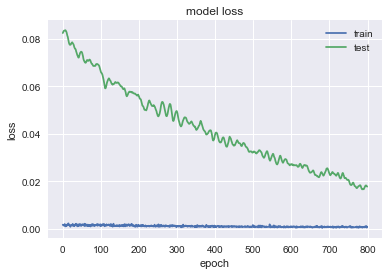

               BA
MSE       2717.93
MAE       38.8379
R2       -4.23144
MAPE (%)  10.4078


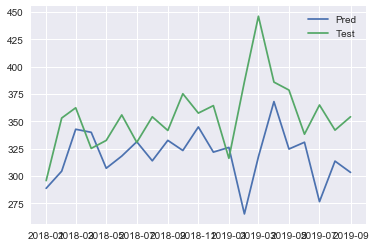

Predicting for  IBM
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.3616 - val_loss: 0.0789
Epoch 2/1000
0s - loss: 0.3294 - val_loss: 0.0622
Epoch 3/1000
0s - loss: 0.3057 - val_loss: 0.0483
Epoch 4/1000
0s - loss: 0.2786 - val_loss: 0.0369
Epoch 5/1000
0s - loss: 0.2482 - val_loss: 0.0277
Epoch 6/1000
0s - loss: 0.2276 - val_loss: 0.0208
Epoch 7/1000
0s - loss: 0.2122 - val_loss: 0.0160
Epoch 8/1000
0s - loss: 0.1887 - val_loss: 0.0133
Epoch 9/1000
0s - loss: 0.1682 - val_loss: 0.0127
Epoch 10/1000
0s - loss: 0.1502 - val_loss: 0.0144
Epoch 11/1000
0s - loss: 0.1418 - val_loss: 0.0181
Epoch 12/1000
0s - loss: 0.1215 - val_loss: 0.0241
Epoch 13/1000
0s - loss: 0.1110 - val_loss: 0.0323
Epoch 14/1000
0s - loss: 0.0993 - val_loss: 0.0424
Epoch 15/1000
0s - loss: 0.0884 - val_loss: 0.0543
Epoch 16/1000
0s - loss: 0.0851 - val_loss: 0.0678
Epoch 17/1000
0s - loss: 0.0758 - val_loss: 0.0827
Epoch 18/1000
0s - loss: 0.0648 - val_loss: 0.0985
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0155 - val_loss: 0.0258
Epoch 167/1000
0s - loss: 0.0142 - val_loss: 0.0258
Epoch 168/1000
0s - loss: 0.0130 - val_loss: 0.0259
Epoch 169/1000
0s - loss: 0.0110 - val_loss: 0.0260
Epoch 170/1000
0s - loss: 0.0122 - val_loss: 0.0260
Epoch 171/1000
0s - loss: 0.0116 - val_loss: 0.0262
Epoch 172/1000
0s - loss: 0.0112 - val_loss: 0.0263
Epoch 173/1000
0s - loss: 0.0122 - val_loss: 0.0264
Epoch 174/1000
0s - loss: 0.0127 - val_loss: 0.0267
Epoch 175/1000
0s - loss: 0.0141 - val_loss: 0.0270
Epoch 176/1000
0s - loss: 0.0109 - val_loss: 0.0272
Epoch 177/1000
0s - loss: 0.0121 - val_loss: 0.0274
Epoch 178/1000
0s - loss: 0.0117 - val_loss: 0.0275
Epoch 179/1000
0s - loss: 0.0093 - val_loss: 0.0278
Epoch 180/1000
0s - loss: 0.0127 - val_loss: 0.0280
Epoch 181/1000
0s - loss: 0.0121 - val_loss: 0.0280
Epoch 182/1000
0s - loss: 0.0127 - val_loss: 0.0280
Epoch 183/1000
0s - loss: 0.0141 - val_loss: 0.0280
Epoch 184/1000
0s - loss: 0.0145 - val_loss: 0.0279
Epoch 185/1000
0s - loss: 0

0s - loss: 0.0115 - val_loss: 0.0289
Epoch 339/1000
0s - loss: 0.0087 - val_loss: 0.0288
Epoch 340/1000
0s - loss: 0.0099 - val_loss: 0.0285
Epoch 341/1000
0s - loss: 0.0096 - val_loss: 0.0283
Epoch 342/1000
0s - loss: 0.0084 - val_loss: 0.0280
Epoch 343/1000
0s - loss: 0.0111 - val_loss: 0.0280
Epoch 344/1000
0s - loss: 0.0092 - val_loss: 0.0280
Epoch 345/1000
0s - loss: 0.0116 - val_loss: 0.0280
Epoch 346/1000
0s - loss: 0.0082 - val_loss: 0.0280
Epoch 347/1000
0s - loss: 0.0087 - val_loss: 0.0280
Epoch 348/1000
0s - loss: 0.0106 - val_loss: 0.0279
Epoch 349/1000
0s - loss: 0.0092 - val_loss: 0.0279
Epoch 350/1000
0s - loss: 0.0118 - val_loss: 0.0280
Epoch 351/1000
0s - loss: 0.0125 - val_loss: 0.0281
Epoch 352/1000
0s - loss: 0.0098 - val_loss: 0.0282
Epoch 353/1000
0s - loss: 0.0112 - val_loss: 0.0281
Epoch 354/1000
0s - loss: 0.0104 - val_loss: 0.0282
Epoch 355/1000
0s - loss: 0.0105 - val_loss: 0.0283
Epoch 356/1000
0s - loss: 0.0114 - val_loss: 0.0283
Epoch 357/1000
0s - loss: 0

0s - loss: 0.0116 - val_loss: 0.0237
Epoch 512/1000
0s - loss: 0.0091 - val_loss: 0.0237
Epoch 513/1000
0s - loss: 0.0129 - val_loss: 0.0238
Epoch 514/1000
0s - loss: 0.0098 - val_loss: 0.0238
Epoch 515/1000
0s - loss: 0.0098 - val_loss: 0.0240
Epoch 516/1000
0s - loss: 0.0099 - val_loss: 0.0241
Epoch 517/1000
0s - loss: 0.0095 - val_loss: 0.0240
Epoch 518/1000
0s - loss: 0.0109 - val_loss: 0.0240
Epoch 519/1000
0s - loss: 0.0112 - val_loss: 0.0239
Epoch 520/1000
0s - loss: 0.0083 - val_loss: 0.0238
Epoch 521/1000
0s - loss: 0.0094 - val_loss: 0.0238
Epoch 522/1000
0s - loss: 0.0079 - val_loss: 0.0238
Epoch 523/1000
0s - loss: 0.0057 - val_loss: 0.0238
Epoch 524/1000
0s - loss: 0.0092 - val_loss: 0.0239
Epoch 525/1000
0s - loss: 0.0081 - val_loss: 0.0242
Epoch 526/1000
0s - loss: 0.0094 - val_loss: 0.0245
Epoch 527/1000
0s - loss: 0.0105 - val_loss: 0.0250
Epoch 528/1000
0s - loss: 0.0118 - val_loss: 0.0253
Epoch 529/1000
0s - loss: 0.0116 - val_loss: 0.0257
Epoch 530/1000
0s - loss: 0

0s - loss: 0.0091 - val_loss: 0.0239
Epoch 683/1000
0s - loss: 0.0090 - val_loss: 0.0239
Epoch 684/1000
0s - loss: 0.0100 - val_loss: 0.0238
Epoch 685/1000
0s - loss: 0.0091 - val_loss: 0.0236
Epoch 686/1000
0s - loss: 0.0084 - val_loss: 0.0233
Epoch 687/1000
0s - loss: 0.0085 - val_loss: 0.0230
Epoch 688/1000
0s - loss: 0.0086 - val_loss: 0.0226
Epoch 689/1000
0s - loss: 0.0070 - val_loss: 0.0224
Epoch 690/1000
0s - loss: 0.0079 - val_loss: 0.0222
Epoch 691/1000
0s - loss: 0.0078 - val_loss: 0.0220
Epoch 692/1000
0s - loss: 0.0095 - val_loss: 0.0220
Epoch 693/1000
0s - loss: 0.0077 - val_loss: 0.0222
Epoch 694/1000
0s - loss: 0.0090 - val_loss: 0.0224
Epoch 695/1000
0s - loss: 0.0118 - val_loss: 0.0228
Epoch 696/1000
0s - loss: 0.0086 - val_loss: 0.0233
Epoch 697/1000
0s - loss: 0.0096 - val_loss: 0.0237
Epoch 698/1000
0s - loss: 0.0088 - val_loss: 0.0239
Epoch 699/1000
0s - loss: 0.0112 - val_loss: 0.0240
Epoch 700/1000
0s - loss: 0.0080 - val_loss: 0.0243
Epoch 701/1000
0s - loss: 0

0s - loss: 0.0080 - val_loss: 0.0207
Epoch 856/1000
0s - loss: 0.0074 - val_loss: 0.0204
Epoch 857/1000
0s - loss: 0.0060 - val_loss: 0.0202
Epoch 858/1000
0s - loss: 0.0107 - val_loss: 0.0200
Epoch 859/1000
0s - loss: 0.0081 - val_loss: 0.0198
Epoch 860/1000
0s - loss: 0.0105 - val_loss: 0.0197
Epoch 861/1000
0s - loss: 0.0078 - val_loss: 0.0198
Epoch 862/1000
0s - loss: 0.0083 - val_loss: 0.0199
Epoch 863/1000
0s - loss: 0.0077 - val_loss: 0.0202
Epoch 864/1000
0s - loss: 0.0104 - val_loss: 0.0205
Epoch 865/1000
0s - loss: 0.0084 - val_loss: 0.0208
Epoch 866/1000
0s - loss: 0.0085 - val_loss: 0.0213
Epoch 867/1000
0s - loss: 0.0098 - val_loss: 0.0218
Epoch 868/1000
0s - loss: 0.0085 - val_loss: 0.0222
Epoch 869/1000
0s - loss: 0.0072 - val_loss: 0.0224
Epoch 870/1000
0s - loss: 0.0087 - val_loss: 0.0224
Epoch 871/1000
0s - loss: 0.0087 - val_loss: 0.0224
Epoch 872/1000
0s - loss: 0.0078 - val_loss: 0.0223
Epoch 873/1000
0s - loss: 0.0088 - val_loss: 0.0220
Epoch 874/1000
0s - loss: 0

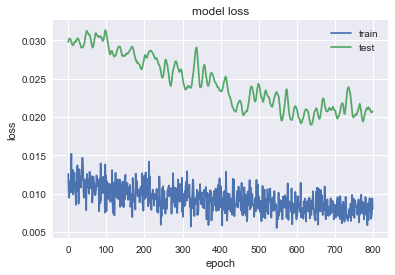

              IBM
MSE       210.592
MAE       13.1592
R2       -1.35304
MAPE (%)  9.40247


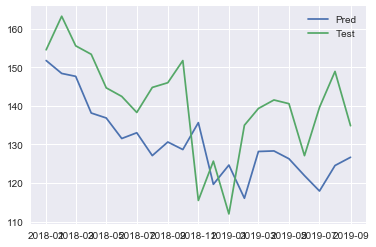

Predicting for  ALB
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1417 - val_loss: 0.3098
Epoch 2/1000
0s - loss: 0.1200 - val_loss: 0.2657
Epoch 3/1000
0s - loss: 0.0976 - val_loss: 0.2274
Epoch 4/1000
0s - loss: 0.0836 - val_loss: 0.1940
Epoch 5/1000
0s - loss: 0.0695 - val_loss: 0.1648
Epoch 6/1000
0s - loss: 0.0597 - val_loss: 0.1397
Epoch 7/1000
0s - loss: 0.0519 - val_loss: 0.1179
Epoch 8/1000
0s - loss: 0.0453 - val_loss: 0.0994
Epoch 9/1000
0s - loss: 0.0415 - val_loss: 0.0837
Epoch 10/1000
0s - loss: 0.0376 - val_loss: 0.0705
Epoch 11/1000
0s - loss: 0.0364 - val_loss: 0.0597
Epoch 12/1000
0s - loss: 0.0339 - val_loss: 0.0509
Epoch 13/1000
0s - loss: 0.0289 - val_loss: 0.0440
Epoch 14/1000
0s - loss: 0.0363 - val_loss: 0.0385
Epoch 15/1000
0s - loss: 0.0360 - val_loss: 0.0344
Epoch 16/1000
0s - loss: 0.0345 - val_loss: 0.0314
Epoch 17/1000
0s - loss: 0.0330 - val_loss: 0.0291
Epoch 18/1000
0s - loss: 0.0360 - val_loss: 0.0274
Epoch 19/1000
0s - loss: 0.

0s - loss: 0.0056 - val_loss: 0.0352
Epoch 184/1000
0s - loss: 0.0043 - val_loss: 0.0350
Epoch 185/1000
0s - loss: 0.0048 - val_loss: 0.0349
Epoch 186/1000
0s - loss: 0.0061 - val_loss: 0.0350
Epoch 187/1000
0s - loss: 0.0054 - val_loss: 0.0347
Epoch 188/1000
0s - loss: 0.0041 - val_loss: 0.0343
Epoch 189/1000
0s - loss: 0.0052 - val_loss: 0.0337
Epoch 190/1000
0s - loss: 0.0066 - val_loss: 0.0337
Epoch 191/1000
0s - loss: 0.0045 - val_loss: 0.0337
Epoch 192/1000
0s - loss: 0.0041 - val_loss: 0.0338
Epoch 193/1000
0s - loss: 0.0057 - val_loss: 0.0341
Epoch 194/1000
0s - loss: 0.0040 - val_loss: 0.0344
Epoch 195/1000
0s - loss: 0.0049 - val_loss: 0.0344
Epoch 196/1000
0s - loss: 0.0048 - val_loss: 0.0347
Epoch 197/1000
0s - loss: 0.0040 - val_loss: 0.0350
Epoch 198/1000
0s - loss: 0.0045 - val_loss: 0.0354
Epoch 199/1000
0s - loss: 0.0050 - val_loss: 0.0357
Epoch 200/1000
0s - loss: 0.0049 - val_loss: 0.0358
Epoch 201/1000
0s - loss: 0.0067 - val_loss: 0.0359
Epoch 202/1000
0s - loss: 0

0s - loss: 0.0044 - val_loss: 0.0478
Epoch 374/1000
0s - loss: 0.0042 - val_loss: 0.0488
Epoch 375/1000
0s - loss: 0.0040 - val_loss: 0.0489
Epoch 376/1000
0s - loss: 0.0052 - val_loss: 0.0488
Epoch 377/1000
0s - loss: 0.0049 - val_loss: 0.0485
Epoch 378/1000
0s - loss: 0.0047 - val_loss: 0.0480
Epoch 379/1000
0s - loss: 0.0051 - val_loss: 0.0475
Epoch 380/1000
0s - loss: 0.0053 - val_loss: 0.0477
Epoch 381/1000
0s - loss: 0.0037 - val_loss: 0.0475
Epoch 382/1000
0s - loss: 0.0051 - val_loss: 0.0469
Epoch 383/1000
0s - loss: 0.0035 - val_loss: 0.0463
Epoch 384/1000
0s - loss: 0.0037 - val_loss: 0.0458
Epoch 385/1000
0s - loss: 0.0047 - val_loss: 0.0457
Epoch 386/1000
0s - loss: 0.0061 - val_loss: 0.0459
Epoch 387/1000
0s - loss: 0.0046 - val_loss: 0.0458
Epoch 388/1000
0s - loss: 0.0049 - val_loss: 0.0458
Epoch 389/1000
0s - loss: 0.0051 - val_loss: 0.0460
Epoch 390/1000
0s - loss: 0.0042 - val_loss: 0.0458
Epoch 391/1000
0s - loss: 0.0035 - val_loss: 0.0462
Epoch 392/1000
0s - loss: 0

0s - loss: 0.0047 - val_loss: 0.0486
Epoch 554/1000
0s - loss: 0.0047 - val_loss: 0.0485
Epoch 555/1000
0s - loss: 0.0034 - val_loss: 0.0488
Epoch 556/1000
0s - loss: 0.0046 - val_loss: 0.0484
Epoch 557/1000
0s - loss: 0.0042 - val_loss: 0.0479
Epoch 558/1000
0s - loss: 0.0037 - val_loss: 0.0480
Epoch 559/1000
0s - loss: 0.0040 - val_loss: 0.0473
Epoch 560/1000
0s - loss: 0.0039 - val_loss: 0.0464
Epoch 561/1000
0s - loss: 0.0035 - val_loss: 0.0457
Epoch 562/1000
0s - loss: 0.0043 - val_loss: 0.0450
Epoch 563/1000
0s - loss: 0.0038 - val_loss: 0.0444
Epoch 564/1000
0s - loss: 0.0030 - val_loss: 0.0440
Epoch 565/1000
0s - loss: 0.0040 - val_loss: 0.0436
Epoch 566/1000
0s - loss: 0.0039 - val_loss: 0.0435
Epoch 567/1000
0s - loss: 0.0066 - val_loss: 0.0432
Epoch 568/1000
0s - loss: 0.0041 - val_loss: 0.0440
Epoch 569/1000
0s - loss: 0.0046 - val_loss: 0.0443
Epoch 570/1000
0s - loss: 0.0044 - val_loss: 0.0451
Epoch 571/1000
0s - loss: 0.0052 - val_loss: 0.0464
Epoch 572/1000
0s - loss: 0

0s - loss: 0.0038 - val_loss: 0.0468
Epoch 713/1000
0s - loss: 0.0035 - val_loss: 0.0466
Epoch 714/1000
0s - loss: 0.0038 - val_loss: 0.0466
Epoch 715/1000
0s - loss: 0.0049 - val_loss: 0.0466
Epoch 716/1000
0s - loss: 0.0044 - val_loss: 0.0462
Epoch 717/1000
0s - loss: 0.0042 - val_loss: 0.0459
Epoch 718/1000
0s - loss: 0.0048 - val_loss: 0.0466
Epoch 719/1000
0s - loss: 0.0038 - val_loss: 0.0467
Epoch 720/1000
0s - loss: 0.0032 - val_loss: 0.0462
Epoch 721/1000
0s - loss: 0.0043 - val_loss: 0.0456
Epoch 722/1000
0s - loss: 0.0043 - val_loss: 0.0452
Epoch 723/1000
0s - loss: 0.0031 - val_loss: 0.0446
Epoch 724/1000
0s - loss: 0.0036 - val_loss: 0.0444
Epoch 725/1000
0s - loss: 0.0038 - val_loss: 0.0442
Epoch 726/1000
0s - loss: 0.0039 - val_loss: 0.0435
Epoch 727/1000
0s - loss: 0.0038 - val_loss: 0.0434
Epoch 728/1000
0s - loss: 0.0036 - val_loss: 0.0436
Epoch 729/1000
0s - loss: 0.0034 - val_loss: 0.0444
Epoch 730/1000
0s - loss: 0.0045 - val_loss: 0.0452
Epoch 731/1000
0s - loss: 0

0s - loss: 0.0043 - val_loss: 0.0507
Epoch 900/1000
0s - loss: 0.0028 - val_loss: 0.0495
Epoch 901/1000
0s - loss: 0.0045 - val_loss: 0.0468
Epoch 902/1000
0s - loss: 0.0038 - val_loss: 0.0445
Epoch 903/1000
0s - loss: 0.0029 - val_loss: 0.0420
Epoch 904/1000
0s - loss: 0.0057 - val_loss: 0.0410
Epoch 905/1000
0s - loss: 0.0036 - val_loss: 0.0406
Epoch 906/1000
0s - loss: 0.0033 - val_loss: 0.0406
Epoch 907/1000
0s - loss: 0.0027 - val_loss: 0.0414
Epoch 908/1000
0s - loss: 0.0039 - val_loss: 0.0421
Epoch 909/1000
0s - loss: 0.0039 - val_loss: 0.0431
Epoch 910/1000
0s - loss: 0.0027 - val_loss: 0.0438
Epoch 911/1000
0s - loss: 0.0042 - val_loss: 0.0453
Epoch 912/1000
0s - loss: 0.0041 - val_loss: 0.0454
Epoch 913/1000
0s - loss: 0.0026 - val_loss: 0.0448
Epoch 914/1000
0s - loss: 0.0036 - val_loss: 0.0443
Epoch 915/1000
0s - loss: 0.0040 - val_loss: 0.0440
Epoch 916/1000
0s - loss: 0.0032 - val_loss: 0.0433
Epoch 917/1000
0s - loss: 0.0039 - val_loss: 0.0436
Epoch 918/1000
0s - loss: 0

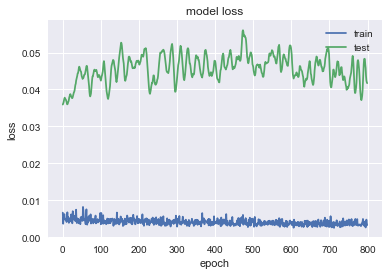

              ALB
MSE       469.115
MAE       19.1702
R2       -2.08631
MAPE (%)  23.5392


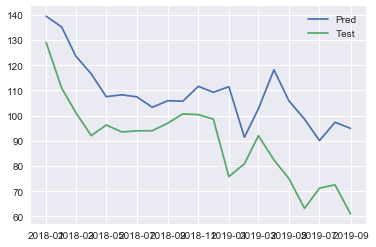

Predicting for  CBRE
Train on 95 samples, validate on 21 samples
Epoch 1/1000
0s - loss: 0.1048 - val_loss: 0.5778
Epoch 2/1000
0s - loss: 0.0850 - val_loss: 0.5202
Epoch 3/1000
0s - loss: 0.0689 - val_loss: 0.4678
Epoch 4/1000
0s - loss: 0.0574 - val_loss: 0.4201
Epoch 5/1000
0s - loss: 0.0440 - val_loss: 0.3764
Epoch 6/1000
0s - loss: 0.0397 - val_loss: 0.3365
Epoch 7/1000
0s - loss: 0.0344 - val_loss: 0.3006
Epoch 8/1000
0s - loss: 0.0259 - val_loss: 0.2685
Epoch 9/1000
0s - loss: 0.0209 - val_loss: 0.2402
Epoch 10/1000
0s - loss: 0.0197 - val_loss: 0.2156
Epoch 11/1000
0s - loss: 0.0182 - val_loss: 0.1944
Epoch 12/1000
0s - loss: 0.0169 - val_loss: 0.1763
Epoch 13/1000
0s - loss: 0.0196 - val_loss: 0.1612
Epoch 14/1000
0s - loss: 0.0180 - val_loss: 0.1493
Epoch 15/1000
0s - loss: 0.0175 - val_loss: 0.1399
Epoch 16/1000
0s - loss: 0.0207 - val_loss: 0.1326
Epoch 17/1000
0s - loss: 0.0193 - val_loss: 0.1271
Epoch 18/1000
0s - loss: 0.0204 - val_loss: 0.1232
Epoch 19/1000
0s - loss: 0

0s - loss: 0.0077 - val_loss: 0.0351
Epoch 187/1000
0s - loss: 0.0071 - val_loss: 0.0351
Epoch 188/1000
0s - loss: 0.0065 - val_loss: 0.0351
Epoch 189/1000
0s - loss: 0.0079 - val_loss: 0.0352
Epoch 190/1000
0s - loss: 0.0074 - val_loss: 0.0353
Epoch 191/1000
0s - loss: 0.0070 - val_loss: 0.0355
Epoch 192/1000
0s - loss: 0.0068 - val_loss: 0.0356
Epoch 193/1000
0s - loss: 0.0067 - val_loss: 0.0358
Epoch 194/1000
0s - loss: 0.0074 - val_loss: 0.0359
Epoch 195/1000
0s - loss: 0.0077 - val_loss: 0.0360
Epoch 196/1000
0s - loss: 0.0062 - val_loss: 0.0361
Epoch 197/1000
0s - loss: 0.0073 - val_loss: 0.0361
Epoch 198/1000
0s - loss: 0.0081 - val_loss: 0.0361
Epoch 199/1000
0s - loss: 0.0059 - val_loss: 0.0360
Epoch 200/1000
0s - loss: 0.0068 - val_loss: 0.0359
Epoch 201/1000
0s - loss: 0.0064 - val_loss: 0.0357
Epoch 202/1000
0s - loss: 0.0074 - val_loss: 0.0354
Epoch 203/1000
0s - loss: 0.0077 - val_loss: 0.0348
Epoch 204/1000
0s - loss: 0.0062 - val_loss: 0.0343
Epoch 205/1000
0s - loss: 0

0s - loss: 0.0054 - val_loss: 0.0202
Epoch 348/1000
0s - loss: 0.0054 - val_loss: 0.0205
Epoch 349/1000
0s - loss: 0.0058 - val_loss: 0.0207
Epoch 350/1000
0s - loss: 0.0056 - val_loss: 0.0209
Epoch 351/1000
0s - loss: 0.0056 - val_loss: 0.0209
Epoch 352/1000
0s - loss: 0.0056 - val_loss: 0.0209
Epoch 353/1000
0s - loss: 0.0063 - val_loss: 0.0208
Epoch 354/1000
0s - loss: 0.0043 - val_loss: 0.0208
Epoch 355/1000
0s - loss: 0.0049 - val_loss: 0.0206
Epoch 356/1000
0s - loss: 0.0054 - val_loss: 0.0205
Epoch 357/1000
0s - loss: 0.0057 - val_loss: 0.0202
Epoch 358/1000
0s - loss: 0.0066 - val_loss: 0.0200
Epoch 359/1000
0s - loss: 0.0050 - val_loss: 0.0198
Epoch 360/1000
0s - loss: 0.0050 - val_loss: 0.0197
Epoch 361/1000
0s - loss: 0.0054 - val_loss: 0.0197
Epoch 362/1000
0s - loss: 0.0060 - val_loss: 0.0197
Epoch 363/1000
0s - loss: 0.0045 - val_loss: 0.0198
Epoch 364/1000
0s - loss: 0.0051 - val_loss: 0.0199
Epoch 365/1000
0s - loss: 0.0046 - val_loss: 0.0201
Epoch 366/1000
0s - loss: 0

0s - loss: 0.0056 - val_loss: 0.0162
Epoch 528/1000
0s - loss: 0.0045 - val_loss: 0.0161
Epoch 529/1000
0s - loss: 0.0057 - val_loss: 0.0159
Epoch 530/1000
0s - loss: 0.0053 - val_loss: 0.0158
Epoch 531/1000
0s - loss: 0.0044 - val_loss: 0.0157
Epoch 532/1000
0s - loss: 0.0045 - val_loss: 0.0156
Epoch 533/1000
0s - loss: 0.0046 - val_loss: 0.0155
Epoch 534/1000
0s - loss: 0.0047 - val_loss: 0.0154
Epoch 535/1000
0s - loss: 0.0042 - val_loss: 0.0153
Epoch 536/1000
0s - loss: 0.0044 - val_loss: 0.0152
Epoch 537/1000
0s - loss: 0.0047 - val_loss: 0.0152
Epoch 538/1000
0s - loss: 0.0041 - val_loss: 0.0152
Epoch 539/1000
0s - loss: 0.0059 - val_loss: 0.0152
Epoch 540/1000
0s - loss: 0.0058 - val_loss: 0.0153
Epoch 541/1000
0s - loss: 0.0041 - val_loss: 0.0153
Epoch 542/1000
0s - loss: 0.0045 - val_loss: 0.0154
Epoch 543/1000
0s - loss: 0.0048 - val_loss: 0.0156
Epoch 544/1000
0s - loss: 0.0051 - val_loss: 0.0156
Epoch 545/1000
0s - loss: 0.0047 - val_loss: 0.0157
Epoch 546/1000
0s - loss: 0

0s - loss: 0.0047 - val_loss: 0.0137
Epoch 711/1000
0s - loss: 0.0042 - val_loss: 0.0137
Epoch 712/1000
0s - loss: 0.0032 - val_loss: 0.0138
Epoch 713/1000
0s - loss: 0.0049 - val_loss: 0.0138
Epoch 714/1000
0s - loss: 0.0049 - val_loss: 0.0139
Epoch 715/1000
0s - loss: 0.0042 - val_loss: 0.0138
Epoch 716/1000
0s - loss: 0.0047 - val_loss: 0.0138
Epoch 717/1000
0s - loss: 0.0038 - val_loss: 0.0137
Epoch 718/1000
0s - loss: 0.0048 - val_loss: 0.0137
Epoch 719/1000
0s - loss: 0.0041 - val_loss: 0.0136
Epoch 720/1000
0s - loss: 0.0045 - val_loss: 0.0136
Epoch 721/1000
0s - loss: 0.0053 - val_loss: 0.0135
Epoch 722/1000
0s - loss: 0.0041 - val_loss: 0.0135
Epoch 723/1000
0s - loss: 0.0046 - val_loss: 0.0135
Epoch 724/1000
0s - loss: 0.0040 - val_loss: 0.0136
Epoch 725/1000
0s - loss: 0.0041 - val_loss: 0.0136
Epoch 726/1000
0s - loss: 0.0053 - val_loss: 0.0136
Epoch 727/1000
0s - loss: 0.0056 - val_loss: 0.0136
Epoch 728/1000
0s - loss: 0.0046 - val_loss: 0.0136
Epoch 729/1000
0s - loss: 0

0s - loss: 0.0040 - val_loss: 0.0126
Epoch 904/1000
0s - loss: 0.0040 - val_loss: 0.0126
Epoch 905/1000
0s - loss: 0.0043 - val_loss: 0.0126
Epoch 906/1000
0s - loss: 0.0043 - val_loss: 0.0127
Epoch 907/1000
0s - loss: 0.0044 - val_loss: 0.0127
Epoch 908/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 909/1000
0s - loss: 0.0039 - val_loss: 0.0127
Epoch 910/1000
0s - loss: 0.0033 - val_loss: 0.0128
Epoch 911/1000
0s - loss: 0.0041 - val_loss: 0.0128
Epoch 912/1000
0s - loss: 0.0040 - val_loss: 0.0127
Epoch 913/1000
0s - loss: 0.0043 - val_loss: 0.0127
Epoch 914/1000
0s - loss: 0.0035 - val_loss: 0.0127
Epoch 915/1000
0s - loss: 0.0035 - val_loss: 0.0126
Epoch 916/1000
0s - loss: 0.0049 - val_loss: 0.0126
Epoch 917/1000
0s - loss: 0.0035 - val_loss: 0.0126
Epoch 918/1000
0s - loss: 0.0034 - val_loss: 0.0125
Epoch 919/1000
0s - loss: 0.0047 - val_loss: 0.0125
Epoch 920/1000
0s - loss: 0.0038 - val_loss: 0.0125
Epoch 921/1000
0s - loss: 0.0038 - val_loss: 0.0125
Epoch 922/1000
0s - loss: 0

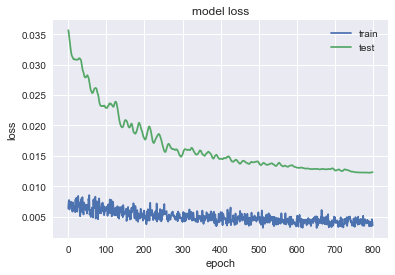

             CBRE
MSE       20.7191
MAE       3.59362
R2       -1.38598
MAPE (%)  7.57086


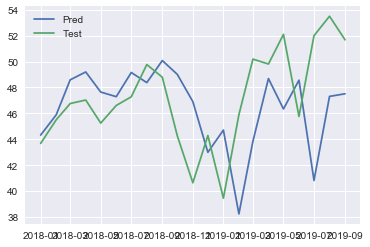

In [364]:
pred_multi_GRU_3 = pd.DataFrame(columns=df.columns,index = test.index)
for comp in companies:
    pred_multi_GRU_3[comp] = nn_forec_multi_GRU(df,comp,n_train_time = test.shape[0],first_layer = 32,second_layer=16).values

In [368]:
pred_multi_64_32_GRU = eval(pred_multi_GRU,test,companies=companies)
pred_multi_64_32_GRU

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,4.2755,51.6213,12.6634,8.50468,1889.76,97.5147,1622.82,221.714,469.724,18.7635
MAE,1.72855,6.42378,2.68593,2.43574,33.9378,7.97664,29.2847,13.4039,19.3755,3.30107
R2,0.153963,-1.10449,-5.72287,0.232049,-0.365247,-2.94273,-1.35987,-1.04048,-1.71596,-1.4539
MAPE (%),5.20666,9.18741,5.45217,9.06253,7.54505,13.8998,7.91287,9.60349,23.5963,7.06127


In [369]:
pred_multi_128_64_GRU = eval(pred_multi_GRU_1,test,companies=companies)
pred_multi_128_64_GRU

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,5.2894,73.6544,6.42743,8.11342,2568.38,89.6976,1418.25,238.071,483.989,21.9203
MAE,1.94393,7.33492,1.93528,2.3768,39.9648,7.54317,29.2594,13.8983,19.7094,3.86239
R2,0.11624,-1.15857,-0.852418,0.231007,-0.702881,-2.54245,-0.626825,-1.04899,-1.8907,-1.17347
MAPE (%),5.87283,10.3747,4.01037,8.9209,8.98486,13.1309,8.04095,9.95507,23.998,8.44148


In [370]:
pred_multi_256_128_GRU = eval(pred_multi_GRU_2,test,companies=companies)
pred_multi_256_128_GRU

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,6.41056,70.3023,6.92294,11.4129,2371.15,102.814,1465.45,258.82,517.646,23.4049
MAE,2.15648,7.239,1.94286,2.88872,38.1207,8.30415,30.1596,14.5359,20.3772,3.94053
R2,0.0153808,-1.18808,-0.87602,0.100905,-0.414139,-2.52037,-0.407499,-1.06697,-2.35415,-1.29767
MAPE (%),6.51664,10.2536,3.99878,10.5727,8.54195,14.3817,8.35516,10.3935,24.8873,8.67439


In [371]:
pred_multi_32_16_GRU = eval(pred_multi_GRU_3,test,companies=companies)
pred_multi_32_16_GRU

,T,BBY,KO,FTI,BLK,DVA,BA,IBM,ALB,CBRE
MSE,2.8906,59.4228,14.4823,7.76074,1624.04,105.399,2717.93,210.592,469.115,20.7191
MAE,1.2529,6.83316,2.80627,2.33485,33.0556,8.3071,38.8379,13.1592,19.1702,3.59362
R2,0.382568,-1.44499,-11.1788,0.147326,-0.787316,-3.07329,-4.23144,-1.35304,-2.08631,-1.38598
MAPE (%),3.78072,9.69956,5.66828,9.08133,7.18686,14.4543,10.4078,9.40247,23.5392,7.57086
